In [1]:
!pwd

/cygdrive/c/Apps/jupyterWorkspace/google_landmark_detection


In [2]:
import pandas as pd
import os
import shutil
import cv2
import multiprocessing
from multiprocessing import Pool
import time
import process_raw_images_to_224_224
import gc
import move_copy_images_with_multiprocessing
import delete_extra_data
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import tarfile
import glob
import random
import json
import gc
import gzip
import pickle

#### Extracting tar files for Training data

In [7]:
train_file_csv_df = pd.read_csv("train.csv")

In [8]:
print("Sample of record in the train_file_csv_df dataframe : \n" + str(train_file_csv_df.head(1)))
print("Total number of images in the training set : " + str(train_file_csv_df['url'].count()))
print("Total number of unique landmark_ids in the training dataset : " + str(train_file_csv_df.landmark_id.value_counts()
                                                                                 .reset_index(name="count")["index"].count()))

Sample of record in the train_file_csv_df dataframe : 
                 id                                                url  \
0  6e158a47eb2ca3f6  https://upload.wikimedia.org/wikipedia/commons...   

   landmark_id  
0       142820  
Total number of images in the training set : 4132914
Total number of unique landmark_ids in the training dataset : 203094


- Only including landmarks with images above 5 in the final training
- Exclude landmark_id 138982 since all most pictures are of posters. Therefore, it makes the dataset very noisy
- Excluding ~62798 as well since it is just mostly flowers images 

In [9]:
landmarks_greater_than_5_df = train_file_csv_df.landmark_id.value_counts().reset_index(name="count").query('count>5')
landmarks_greater_than_5_df = landmarks_greater_than_5_df[~landmarks_greater_than_5_df["index"].isin([62798, 138982])]
print(landmarks_greater_than_5_df.head(50))

     index  count
2   177870   3327
3   176528   3243
4   192931   2627
5   126637   2589
6    83144   2351
7   171772   2268
8    20409   2248
9   151942   1727
10   84689   1721
11  139894   1717
12   62074   1637
13   10618   1539
14   45428   1513
15   41808   1509
16  139706   1509
17   60532   1447
18  161902   1424
19  194914   1399
20  113209   1378
21   86869   1350
22   80177   1344
23   47133   1292
24  121873   1286
25    1924   1281
26   46705   1275
27   47712   1248
28   15427   1194
29   51856   1173
30  187209   1168
31  179380   1150
32   36748   1120
33  149980   1108
34   46500   1107
35   14915   1093
36  120734   1093
37   33992   1088
38   40088   1056
39  164773   1048
40  171683   1047
41  176018   1045
42  168098   1037
43   20120   1032
44  165900   1027
45   25093   1017
46  136093   1000
47  187779    986
48    9070    978
49  127516    976
50   56827    975
51  105337    968


In [10]:
landmark_ids_greater_than_5_list = landmarks_greater_than_5_df["index"].tolist()
print(landmark_ids_greater_than_5_list[:5])

filtered_train_greater_than_5_df = train_file_csv_df[train_file_csv_df.landmark_id.isin(landmarks_greater_than_5_df['index'])]
print("Total number of images for landmarks with image count of >5 in the training set after filtering  : " + str(filtered_train_greater_than_5_df["id"].count()))
print("Total number of landmarks with >5 images in the dataset : " + str(landmarks_greater_than_5_df["index"].count()))

imageIds_landmarkIds_moreThan5_dict = filtered_train_greater_than_5_df.set_index('id')['landmark_id'].to_dict()
print(len(imageIds_landmarkIds_moreThan5_dict))

[177870, 176528, 192931, 126637, 83144]
Total number of images for landmarks with image count of >5 in the training set after filtering  : 3905440
Total number of landmarks with >5 images in the dataset : 125729
3905440


In [12]:
list(imageIds_landmarkIds_moreThan5_dict.items())[:5]

[('6e158a47eb2ca3f6', 142820),
 ('202cd79556f30760', 104169),
 ('3ad87684c99c06e1', 37914),
 ('e7f70e9c61e66af3', 102140),
 ('4072182eddd0100e', 2474)]

In [13]:
print(filtered_train_greater_than_5_df.head(2))
print()
print(filtered_train_greater_than_5_df.iloc[1]['url'])
#Given a Landmark Id, get the URL of the landmark
filtered_train_greater_than_5_df[filtered_train_greater_than_5_df.landmark_id == 5].iloc[1]['url']

                 id                                                url  \
0  6e158a47eb2ca3f6  https://upload.wikimedia.org/wikipedia/commons...   
1  202cd79556f30760  http://upload.wikimedia.org/wikipedia/commons/...   

   landmark_id  
0       142820  
1       104169  

http://upload.wikimedia.org/wikipedia/commons/6/63/Ecosse200996-1.jpg


'https://upload.wikimedia.org/wikipedia/commons/d/df/Falcon-French-G-Ruckert.jpg'

In [14]:
image_counts = 100
print(landmarks_greater_than_5_df[landmarks_greater_than_5_df["count"]>image_counts].count())
print(landmarks_greater_than_5_df[landmarks_greater_than_5_df["count"]>image_counts]["count"].sum())
print(landmarks_greater_than_5_df.count())

index    6400
count    6400
dtype: int64
1239582
index    125729
count    125729
dtype: int64


#### Count number of images upto an Index in the dataframe with landmarks of images >5

In [14]:
landmark_id = 84671
index = landmark_ids_greater_than_5_list.index(landmark_id)
print(index)
print(landmarks_greater_than_5_df["count"][:index].sum())

59646
3240318


#### Reducing the max number of images in the landmarks to 500. This will help save a lot of time in delf features matching step which is really time consuming 
Eventually we will only use upto 100 images with max related features per class since >100k classes have less than 100 images. This will help balance the dataset

*** This is also a one time task ***

In [22]:
landmark_ids_more_than_500_images_list = landmarks_greater_than_5_df[landmarks_greater_than_5_df["count"]>500]["index"].to_list()
print(landmark_ids_more_than_500_images_list)
print(len(landmark_ids_more_than_500_images_list))

[177870, 176528, 192931, 126637, 83144, 171772, 20409, 151942, 84689, 139894, 62074, 10618, 45428, 41808, 139706, 60532, 161902, 194914, 113209, 86869, 80177, 47133, 121873, 1924, 46705, 47712, 15427, 51856, 187209, 179380, 36748, 149980, 46500, 14915, 120734, 33992, 40088, 164773, 171683, 176018, 168098, 20120, 165900, 25093, 136093, 187779, 9070, 127516, 56827, 105337, 147897, 180759, 165596, 10419, 46775, 202388, 49712, 184313, 47378, 41648, 180901, 57505, 28139, 191292, 181631, 31531, 88596, 107917, 11544, 199506, 38482, 147828, 126721, 108327, 80019, 31361, 160944, 100631, 146250, 186080, 142809, 97734, 51272, 162833, 75005, 115821, 27190, 173511, 65855, 146497, 70644, 18786, 85758, 142644, 25847, 67416, 190931, 107750, 176956, 6208, 37394, 48522, 24852, 158844, 145310, 85633, 13755, 76303, 44796, 110398, 113750, 21353, 55623, 145015, 109169, 143710, 182973, 171150, 190822, 189811, 177194, 178519, 15445, 107164, 101399, 152827, 80272, 120885, 189907, 142343, 73300, 21253, 171435, 

[177870, 176528, 192931, 126637, 83144, 171772, 20409, 151942, 84689, 139894, 62074, 10618, 45428, 41808, 139706, 60532, 161902, 194914, 113209, 86869, 80177, 47133, 121873, 1924, 46705, 47712, 15427, 51856, 187209, 179380, 36748, 149980, 46500, 14915, 120734, 33992, 40088, 164773, 171683, 176018, 168098, 20120, 165900, 25093, 136093, 187779, 9070, 127516, 56827, 105337, 147897, 180759, 165596, 10419, 46775, 202388, 49712, 184313, 47378, 41648, 180901, 57505, 28139, 191292, 181631, 31531, 88596, 107917, 11544, 199506, 38482, 147828, 126721, 108327, 80019, 31361, 160944, 100631, 146250, 186080, 142809, 97734, 51272, 162833, 75005, 115821, 27190, 173511, 65855, 146497, 70644, 18786, 85758, 142644, 25847, 67416, 190931, 107750, 176956, 6208, 37394, 48522, 24852, 158844, 145310, 85633, 13755, 76303, 44796, 110398, 113750, 21353, 55623, 145015, 109169, 143710, 182973, 171150, 190822, 189811, 177194, 178519, 15445, 107164, 101399, 152827, 80272, 120885, 189907, 142343, 73300, 21253, 171435, 111311, 50798, 51699, 182908, 20102, 97142, 113145, 121547, 177305, 43222, 64792, 39865, 20064, 78197, 194406, 2079, 1127, 5004, 17062, 136302, 179959, 18392, 152708, 14559, 198657, 29794, 144313, 125425, 93198, 137203, 63529, 201840, 188999, 157511, 60912, 39271, 65199, 148331, 125194, 113838, 27, 168106, 19605, 196358, 5170, 172929, 192761, 125786, 60708, 124923, 133563, 16658, 173450, 103899, 69973, 25953, 127523, 39650, 37391, 62831, 67929, 70716, 132969, 98993, 195412, 69193, 126159, 90021, 21703, 199450, 60749, 97717, 129781, 169349, 90647, 31094, 194521]

210

In [21]:
# count = 0
# for landmark_id in landmark_ids_more_than_500_images_list:
#     list_of_files_in_landmark = glob.glob("datasets\\raw_data\\train\\{}\\*.*".format(landmark_id))
#     print(" {} ".format(len(list_of_files_in_landmark)), end = " ")
#     difference = len(list_of_files_in_landmark)-500
#     count += difference
#     list_of_files_to_remove = random.sample(list_of_files_in_landmark, difference)
#     print(len(list_of_files_to_remove))
#     start = time.time()
#     if __name__ == "__main__":
#         p = Pool(16)
#         p.map(delete_extra_data.delete_files, list_of_files_to_remove)
#         p.close()
#         p.join()
#     print("time to delete {} images : {}".format(count, time.time() - start))

 3327  2827
time to delete 2827 images : 0.2988088130950928
 3243  2743
time to delete 5570 images : 0.3207552433013916
 2627  2127
time to delete 7697 images : 0.3210721015930176
 2589  2089
time to delete 9786 images : 0.3241257667541504
 2351  1851
time to delete 11637 images : 0.3069498538970947
 2268  1768
time to delete 13405 images : 0.32128381729125977
 2248  1748
time to delete 15153 images : 0.32123589515686035
 1727  1227
time to delete 16380 images : 0.21620750427246094
 1721  1221
time to delete 17601 images : 0.2989382743835449
 1717  1217
time to delete 18818 images : 0.21483445167541504
 1637  1137
time to delete 19955 images : 0.22537636756896973
 1539  1039
time to delete 20994 images : 0.2302553653717041
 1513  1013
time to delete 22007 images : 0.22255349159240723
 1509  1009
time to delete 23016 images : 0.20049571990966797
 1509  1009
time to delete 24025 images : 0.21270537376403809
 1447  947
time to delete 24972 images : 0.1916491985321045
 1424  924
time to de

time to delete 70975 images : 0.18898630142211914
 611  111
time to delete 71086 images : 0.19794678688049316
 611  111
time to delete 71197 images : 0.18801546096801758
 610  110
time to delete 71307 images : 0.19824886322021484
 607  107
time to delete 71414 images : 0.1961658000946045
 605  105
time to delete 71519 images : 0.18799996376037598
 602  102
time to delete 71621 images : 0.1903524398803711
 600  100
time to delete 71721 images : 0.1969902515411377
 598  98
time to delete 71819 images : 0.1880192756652832
 597  97
time to delete 71916 images : 0.2945258617401123
 597  97
time to delete 72013 images : 0.19751977920532227
 595  95
time to delete 72108 images : 0.20568585395812988
 593  93
time to delete 72201 images : 0.19637060165405273
 593  93
time to delete 72294 images : 0.1964426040649414
 589  89
time to delete 72383 images : 0.19191479682922363
 587  87
time to delete 72470 images : 0.19904136657714844
 584  84
time to delete 72554 images : 0.19688773155212402
 582 

Deleted 74782 images

#### Creating jsons as needed

In [ ]:
imageIds_landmarkIds_moreThan5_dict_json = json.dumps(imageIds_landmarkIds_moreThan5_dict)
f = open("imageIds_landmarkIds_moreThan5_dict.json","w")
f.write(imageIds_landmarkIds_moreThan5_dict_json)
f.close()

In [23]:
landmark_ids_greater_than_5_list_json = json.dumps(landmark_ids_greater_than_5_list)
f = open("landmark_ids_greater_than_5_list.json","w")
f.write(landmark_ids_greater_than_5_list_json)
f.close()

In [30]:
with open("landmark_ids_greater_than_5_list.json", "r") as f:
    data = json.load(f)
len(data)

125729

#### Verifying a single landmark_id features in a pickle file created during DELF feature extraction step

In [37]:
landmark_id = 0
path = "landmark_ids_delf_features_dict_pickle_files\\{}.pkl.gz".format(landmark_id)

with gzip.open(path, 'r') as f:
    data = pickle.load(f)
data

{0: [{'locations': array([[128.      , 128.      ],
          [  0.      , 128.      ],
          [  0.      , 180.99548 ],
          [ 90.49774 , 180.99548 ],
          [ 90.49774 ,  90.49774 ],
          [ 64.      ,  64.      ],
          [180.99548 , 180.99548 ],
          [135.76581 ,   0.      ],
          [  0.      ,  90.49774 ],
          [  0.      , 128.      ],
          [128.      ,   0.      ],
          [128.      ,  64.      ],
          [  0.      , 192.      ],
          [  0.      , 181.02107 ],
          [ 48.      ,  48.      ],
          [ 90.51054 ,  45.255272],
          [128.      , 192.      ],
          [ 96.      ,  64.      ],
          [ 32.      , 224.      ],
          [ 64.      , 192.      ],
          [240.      ,  32.      ],
          [192.      ,   0.      ],
          [135.76581 ,  45.255264],
          [240.      , 144.      ],
          [160.      ,  16.      ],
          [160.      ,   0.      ],
          [ 64.      ,  64.      ],
          [1

### Recursively delete landmark folders that are not in the landmarks_greater_than_5_df
*** This is a one time task ***

In [ ]:
# list_of_landmark_ids_from_raw_data = glob.glob("datasets\\raw_data\\train\\*")
# print(list_of_landmark_ids_from_raw_data[:5])
# print(len(list_of_landmark_ids_from_raw_data))

In [ ]:
list_of_landmark_ids_from_raw_data = glob.glob("datasets\\raw_data\\train\\*")
print(list_of_landmark_ids_from_raw_data[:5])
print(len(list_of_landmark_ids_from_raw_data))

['datasets\\raw_data\\train\\0', 'datasets\\raw_data\\train\\1', 'datasets\\raw_data\\train\\10', 'datasets\\raw_data\\train\\100', 'datasets\\raw_data\\train\\1000']

150659

In [ ]:
# folders_to_delete = []
# for landmark_id_folder in list_of_landmark_ids_from_raw_data:
#     landmark_id = landmark_id_folder.split("\\")[-1]
#     if int(landmark_id) not in landmark_ids_greater_than_5_list:
#         folders_to_delete.append('datasets\\raw_data\\train\\{}'.format(landmark_id))
# print(folders_to_delete[:5])
# print(len(folders_to_delete))

['datasets\\raw_data\\train\\100002', 'datasets\\raw_data\\train\\100010', 'datasets\\raw_data\\train\\100022', 'datasets\\raw_data\\train\\100027', 'datasets\\raw_data\\train\\100031']

24930

In [ ]:
# if __name__ == '__main__':
#     p = Pool(14)
#     p.map(delete_extra_data.delete_folders, folders_to_delete)
#     p.close()
#     p.join()

### Ploting the images for landmark_ids that have more than 200 images. Looking at any important landmarks in them
- Seems like there are a lot of important landmarks with more than 200 images. 
- New strategy is to reduce the number of images in each landmark to max of 500. Delete rest randomly
- We are going to use only top 100 images with feature matches for these landmarks.

In [35]:
landmarks_ids_counts_dict = dict(zip(landmarks_greater_than_5_df["index"], landmarks_greater_than_5_df["count"]))

In [36]:
list(landmarks_ids_counts_dict.items())[:5]

[(177870, 3327), (176528, 3243), (192931, 2627), (126637, 2589), (83144, 2351)]

In [ ]:
urls=[]
for landmark_id in landmark_ids_greater_than_5_list[:212]:
    images_paths = glob.glob("datasets\\raw_data\\train\\" + str(landmark_id) + "\\*.jpg")
    urls.append((landmark_id,) + tuple(random.sample(images_paths,5))) 
    #= ['datasets\\raw_data\\train\\0\\0ddc92c6353c019a.jpg','datasets\\raw_data\\train\\0\\2c8acb7c9958da08.jpg', 'datasets\\raw_data\\train\\0\\b5d8eb502833a58c.jpg']
    
count = 0
for url_tuple in urls:
    count += 1
    fig = plt.figure(figsize=(20, 4))
    landmark_id = url_tuple[0]
    image_counts = landmarks_ids_counts_dict.get(landmark_id)
    plt.title("Fig {} - landmark_id {} - Image Counts - {}".format(count, landmark_id, image_counts))
    img1 = mpimg.imread(url_tuple[1])
    img2 = mpimg.imread(url_tuple[2])
    img3 = mpimg.imread(url_tuple[3])
    img4 = mpimg.imread(url_tuple[4])
    img5 = mpimg.imread(url_tuple[5])
    
    ax1 = fig.add_subplot(1,5,1)
    ax1.imshow(img1)
    
    ax2 = fig.add_subplot(1,5,2)
    ax2.imshow(img2)
    
    ax3 = fig.add_subplot(1,5,3)
    ax3.imshow(img3)
    
    ax4 = fig.add_subplot(1,5,4)
    ax4.imshow(img4)
    
    ax5 = fig.add_subplot(1,5,5)
    ax5.imshow(img5)
    plt.show()
    plt.close()
    
#         plt.figure(figsize = (3,3))
#         plt.imshow(img)

### Loading the non-landmark images to remove from our training dataset 
This is a one time task as well

In [3]:
with open('images_to_filter_out_after_delf_dict.json') as json_file:
    images_to_filter_out_after_delf_dict = json.load(json_file)

list_of_images_to_delete_after_delf = list(images_to_filter_out_after_delf_dict.keys())
print(list_of_images_to_delete_after_delf[:10])

['datasets\\raw_data\\train\\177870\\35436cb83ff5e09b.jpg', 'datasets\\raw_data\\train\\177870\\012f8c0847703102.jpg', 'datasets\\raw_data\\train\\177870\\1f4f1c6b84b032f7.jpg', 'datasets\\raw_data\\train\\177870\\27f30d5d2118ad58.jpg', 'datasets\\raw_data\\train\\177870\\436392bd5f4440be.jpg', 'datasets\\raw_data\\train\\177870\\470e31d9051f968f.jpg', 'datasets\\raw_data\\train\\177870\\315874c82418af1d.jpg', 'datasets\\raw_data\\train\\177870\\1dd07f5182e4c94a.jpg', 'datasets\\raw_data\\train\\177870\\3a7f67c02964f595.jpg', 'datasets\\raw_data\\train\\177870\\114c2828445a71a6.jpg']


In [4]:
# Found a random image with manual inspection in the id 177870, which I think should be removed.
# Therefore should be in the list above
'datasets\\raw_data\\train\\177870\\552809ab1b1e3225.jpg' in list_of_images_to_delete_after_delf

True

In [5]:
print(len(list_of_images_to_delete_after_delf))
print(len(images_to_filter_out_after_delf_dict))

1139183
1139183


In [26]:
# start = time.time()
# if __name__ == "__main__":
#     p = Pool()
#     p.map(delete_extra_data.delete_files, list_of_images_to_delete_after_delf)
#     p.close()
#     p.join()
# print("time to delete {} images : {}".format(len(list_of_images_to_delete_after_delf), time.time() - start))

time to delete 1139183 images : 204.85128498077393


time to delete 1139183 images : 204.85128498077393

### After DeLF,  creating a list of all the remaining images and counts of images in the landmarks for further data pre-processing step 

In [15]:
print(landmark_ids_greater_than_5_list[:5])
len(landmark_ids_greater_than_5_list)

[177870, 176528, 192931, 126637, 83144]


125729

In [16]:
'datasets\\raw_data\\train\\177870\\35436cb83ff5e09b.jpg'.split("\\")[-1].split('.')[0]

'35436cb83ff5e09b'

Creating a few different lists to do some initial prepwork for more data preprocessing and data modeling

In [22]:
count_5 = 0

landmark_ids_less_than_5_list_after_delf = []
landmark_ids_greater_than_5_list_after_delf = []
landmarkIds_imageCounts_more_than_5_dict_after_delf = {}
imageIds_landmarkIds_more_than_5_dict_after_delf = {}

for landmark_id in landmark_ids_greater_than_5_list:
    list_of_files_in_landmark = glob.glob("datasets\\raw_data\\train\\{}\\*.*".format(landmark_id))
    
    if len(list_of_files_in_landmark) > 5:
        landmark_ids_greater_than_5_list_after_delf.append(landmark_id)
        landmarkIds_imageCounts_more_than_5_dict_after_delf[landmark_id] = len(list_of_files_in_landmark)
        
        for image_path in list_of_files_in_landmark:
            imageIds_landmarkIds_more_than_5_dict_after_delf[image_path.split("\\")[-1].split('.')[0]] = landmark_id
    else:
        landmark_ids_less_than_5_list_after_delf.append("datasets\\raw_data\\train\\{}".format(landmark_id))
        count_5 += 1

In [23]:
print(len(landmark_ids_less_than_5_list_after_delf))
print(len(landmark_ids_greater_than_5_list_after_delf))
print(len(landmarkIds_imageCounts_more_than_5_dict_after_delf))
print(len(imageIds_landmarkIds_more_than_5_dict_after_delf))

31901
93828
93828
2581445


In [24]:
# Manually verify some of these folders
print(landmark_ids_less_than_5_list_after_delf[:5])
print(landmark_ids_greater_than_5_list_after_delf[:5])

['datasets\\raw_data\\train\\118727', 'datasets\\raw_data\\train\\123642', 'datasets\\raw_data\\train\\18396', 'datasets\\raw_data\\train\\28358', 'datasets\\raw_data\\train\\145917']
[177870, 176528, 192931, 126637, 83144]


One Time Task

In [28]:
# # Delete all the landmarks that have less/equal to 5 images
# start = time.time()
# if __name__ == "__main__":
#     p = Pool()
#     p.map(delete_extra_data.delete_folders, landmark_ids_less_than_5_list_after_delf)
#     p.close()
#     p.join()
# print("Time to delete {} landmark_id folders : {}".format(len(landmark_ids_less_than_5_list_after_delf), time.time() - start))

Time to delete 31901 landmark_id folders : 24.083476305007935


Time to delete 31901 landmark_id folders : 24.083476305007935

In [29]:
print(list(landmarkIds_imageCounts_more_than_5_dict_after_delf.items())[:5])
print(list(imageIds_landmarkIds_more_than_5_dict_after_delf.items())[:5])

[(177870, 337), (176528, 326), (192931, 300), (126637, 439), (83144, 388)]
[('019a1e736ca83e52', 177870), ('01f7f5108f89a177', 177870), ('05b21c07d95f3ef7', 177870), ('06781f4bd1af2f67', 177870), ('06e5847bc3d9b034', 177870)]


In [44]:
print(177870 in landmarks_ids_counts_dict)
print(len(landmarks_ids_counts_dict))

True
125729


One more trand of noisy data I noticed:
    - Wherever ~70% images were filtered in the landmark_id via DeLF, it mostly had images of just people, trees, flowers, posters, etc.
    - I can probably get rid of these landmarks as well to reduce the noise further

In [87]:
counts_diff_dict = {}
for landmark_id, counts in landmarkIds_imageCounts_more_than_5_dict_after_delf.items():
    if landmark_id in landmarks_ids_counts_dict:
        original_counts = landmarks_ids_counts_dict[landmark_id]
        counts_diff = 0
        if landmarks_ids_counts_dict[landmark_id] > 500:
            counts_diff = (500 - counts)/500*100
        else:
            counts_diff = (original_counts - counts)/original_counts*100
        # Creating a dict of landmark_ids with counts different of atleast 70% between original and delf filtered set
        if counts_diff > 70:
            counts_diff_dict["datasets\\raw_data\\train\\{}".format(landmark_id)] = counts_diff

In [88]:
# Manually verifying some of the landmarks
print(len(counts_diff_dict))
print(list(counts_diff_dict.items())[:5])
print(list(counts_diff_dict.keys())[:5])

1876
[('datasets\\raw_data\\train\\171772', 77.0), ('datasets\\raw_data\\train\\62074', 80.4), ('datasets\\raw_data\\train\\10618', 76.2), ('datasets\\raw_data\\train\\47712', 79.0), ('datasets\\raw_data\\train\\184313', 75.0)]
['datasets\\raw_data\\train\\171772', 'datasets\\raw_data\\train\\62074', 'datasets\\raw_data\\train\\10618', 'datasets\\raw_data\\train\\47712', 'datasets\\raw_data\\train\\184313']


One Time Task

In [90]:
# Deleting the landmarks where atleast 70% of the images were filtered via DeLF, since remianing images are still mostly
# people, flowers, trees, etc. No actual landmarks. This will help reduce the noise further
# start = time.time()
# if __name__ == "__main__":
#     p = Pool()
#     p.map(delete_extra_data.delete_folders, list(counts_diff_dict.keys()))
#     p.close()
#     p.join()
# print("Time to delete {} landmark_id folders : {}".format(len(counts_diff_dict), time.time() - start))

Time to delete 1876 landmark_id folders : 2.6982994079589844


Time to delete 1876 landmark_id folders : 2.6982994079589844

In [114]:
# With some ad-hoc manual inspection, I found landmark_id, 192931 pretty noisey as well. Pictures of just people. Removing this as well
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\192931')
#Very noisey, landmark 46775
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\46775')
# Manually deleted a bad picture for landmark_id 2247. Now count is 5. Therefore, deleting
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\2247')
# Manually deleted a bad picture for landmark_id 201200. Now count is 5. Therefore, deleting
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\201200')

In [115]:
landmarkIds_imageCounts_more_than_5_after_delf_df = pd.DataFrame.from_dict(landmarkIds_imageCounts_more_than_5_dict_after_delf, orient='index', columns=['counts']).reset_index().rename(columns={'index' :'landmark_id'})

In [116]:
additional_deleted_landmarks_list = [int(landmark_id.split("\\")[-1]) for landmark_id in list(counts_diff_dict.keys())]
print(len(additional_deleted_landmarks_list))
print(additional_deleted_landmarks_list[:5])

1876
[171772, 62074, 10618, 47712, 184313]


In [100]:
landmarkIds_imageCounts_more_than_5_after_delf_df.dtypes

landmark_id    int64
counts         int64
dtype: object

In [119]:
landmarkIds_imageCounts_more_than_5_after_delf_df = landmarkIds_imageCounts_more_than_5_after_delf_df[~landmarkIds_imageCounts_more_than_5_after_delf_df.landmark_id.isin([192931,2247,201200,46775])]
landmarkIds_imageCounts_more_than_5_after_delf_df = landmarkIds_imageCounts_more_than_5_after_delf_df[~landmarkIds_imageCounts_more_than_5_after_delf_df.landmark_id.isin(additional_deleted_landmarks_list)]
len(landmarkIds_imageCounts_more_than_5_after_delf_df)

91948

In [120]:
print(landmarkIds_imageCounts_more_than_5_after_delf_df[:50])
print(len(landmarkIds_imageCounts_more_than_5_after_delf_df))
print(landmarkIds_imageCounts_more_than_5_after_delf_df[landmarkIds_imageCounts_more_than_5_after_delf_df['counts']>100].landmark_id.count())

    landmark_id  counts
0        177870     337
1        176528     326
3        126637     439
4         83144     388
6         20409     453
7        151942     288
8         84689     150
9        139894     420
12        45428     383
13        41808     273
14       139706     239
15        60532     218
16       161902     398
17       194914     485
18       113209     474
19        86869     314
20        80177     318
21        47133     427
22       121873     369
23         1924     438
24        46705     462
26        15427     175
27        51856     435
28       187209     314
29       179380     364
30        36748     441
31       149980     472
32        46500     325
33        14915     441
34       120734     462
35        33992     336
36        40088     472
37       164773     412
38       171683     294
39       176018     433
40       168098     483
41        20120     446
42       165900     404
43        25093     446
44       136093     375
45       187779 

### Moved raw images to appropriate landmark Ids classes/folders

In [ ]:
# # # This is a one time task. We take the raw images in appropriate directories and save them to training folder 
# # # to appropriate labeled folders (tmp/datasets/train_raw/<labeled folder names>).

# dir_name_list = ["datasets/train_raw/0","datasets/train_raw/1","datasets/train_raw/2","datasets/train_raw/3","datasets/train_raw/4","datasets/train_raw/5","datasets/train_raw/6","datasets/train_raw/7","datasets/train_raw/8","datasets/train_raw/9","datasets/train_raw/a","datasets/train_raw/b","datasets/train_raw/c","datasets/train_raw/d","datasets/train_raw/e","datasets/train_raw/f"]
# # dir_name_list = ["datasets/set_128/train/3","datasets/set_128/train/7","datasets/set_128/train/9"]

# start_time_moving_images = time.time()
# for dir_name in dir_name_list:
#     get_list_start_time = time.time()
#     def get_list_of_Files(dir_name):
#         # create a list of file and sub directories 
#         # names in the given directory 
#         listOfFile = os.listdir(dir_name)
#         allFiles = list()
#         # Iterate over all the entries
#         for entry in listOfFile:
#             # Create full path
#             fullPath = os.path.join(dir_name, entry)
#             # If entry is a directory then get the list of files in this directory 
#             if os.path.isdir(fullPath):
#                 allFiles = allFiles + get_list_of_Files(fullPath)
#             else:
#                 allFiles.append(fullPath)             
#         return allFiles

#     list_of_images = get_list_of_Files(dir_name)
#     print("\nTime to get list of files from current directory : ", (time.time() - get_list_start_time))
#     print(list_of_images[:5])
#     print(len(list_of_images))
#     gc.collect()

#     process_image_start_time = time.time()
#     if __name__ == "__main__":
#         p=Pool(16)
# The multiprocessing step below is incorrect. It is passing whole list to each pool. SHould refactor in future if need to resuse this code
#         print("Images Processed : ", p.map(move_copy_images_with_multiprocessing.move_images, [[list_of_images, imageIds_landmarkIds_moreThan5_dict]]))
#         p.close()
#         p.join()
#     print("Time to move images in the current directory : ", (time.time() - process_image_start_time))
#     gc.collect()
    
#     del list_of_images

# print("Total time to move all the images : ", (time.time() - start_time_moving_images))


Time to get list of files from current directory :  11.537518501281738
['datasets/train_raw/0\\0\\0\\0000059611c7d079.jpg', 'datasets/train_raw/0\\0\\0\\0000070506c174cc.jpg', 'datasets/train_raw/0\\0\\0\\000008ae30de967e.jpg', 'datasets/train_raw/0\\0\\0\\000014b1f770f640.jpg', 'datasets/train_raw/0\\0\\0\\000015f76534add3.jpg']
258277
Images Processed :  [251936]
Time to move images in the current directory :  153.274245262146

Time to get list of files from current directory :  11.628509044647217
['datasets/train_raw/1\\0\\0\\100001cdf8952af2.jpg', 'datasets/train_raw/1\\0\\0\\1000031c57e84984.jpg', 'datasets/train_raw/1\\0\\0\\10000643ddd87640.jpg', 'datasets/train_raw/1\\0\\0\\100008e889303dd3.jpg', 'datasets/train_raw/1\\0\\0\\10000a459717f4b1.jpg']
258960
Images Processed :  [252477]
Time to move images in the current directory :  154.08185625076294

Time to get list of files from current directory :  11.59822130203247
['datasets/train_raw/2\\0\\0\\20000153ca826a49.jpg', 'datasets/train_raw/2\\0\\0\\20000c6cc7757a78.jpg', 'datasets/train_raw/2\\0\\0\\20000c92f4ffbb98.jpg', 'datasets/train_raw/2\\0\\0\\2000117b6776a792.jpg', 'datasets/train_raw/2\\0\\0\\2000143aaa73c26a.jpg']
258371
Images Processed :  [252009]
Time to move images in the current directory :  156.68194580078125

Time to get list of files from current directory :  11.624047994613647
['datasets/train_raw/3\\0\\0\\30000e1088c8b1a8.jpg', 'datasets/train_raw/3\\0\\0\\30000ec0280c6eca.jpg', 'datasets/train_raw/3\\0\\0\\300011592eb1698e.jpg', 'datasets/train_raw/3\\0\\0\\3000179a56d92ab9.jpg', 'datasets/train_raw/3\\0\\0\\300018a3f2c53762.jpg']
257916
Images Processed :  [251580]
Time to move images in the current directory :  157.4651472568512

Time to get list of files from current directory :  11.766359329223633
['datasets/train_raw/4\\0\\0\\40000238d9a0dce9.jpg', 'datasets/train_raw/4\\0\\0\\4000025e2dcff06b.jpg', 'datasets/train_raw/4\\0\\0\\4000039befc55c12.jpg', 'datasets/train_raw/4\\0\\0\\40000641f1218515.jpg', 'datasets/train_raw/4\\0\\0\\400006e5e6aa472f.jpg']
257966
Images Processed :  [251630]
Time to move images in the current directory :  161.01261472702026

Time to get list of files from current directory :  11.514141321182251
['datasets/train_raw/5\\0\\0\\50000a346e0e0b09.jpg', 'datasets/train_raw/5\\0\\0\\50000bbaf5115641.jpg', 'datasets/train_raw/5\\0\\0\\500010a7e6a160b2.jpg', 'datasets/train_raw/5\\0\\0\\500019eb689da9b5.jpg', 'datasets/train_raw/5\\0\\0\\50001b0d12c3943d.jpg']
258046
Images Processed :  [251838]
Time to move images in the current directory :  163.7860288619995

Time to get list of files from current directory :  11.443994283676147
['datasets/train_raw/6\\0\\0\\600008d145ada13a.jpg', 'datasets/train_raw/6\\0\\0\\60000b0c22ef7c32.jpg', 'datasets/train_raw/6\\0\\0\\60000b3debc0dbd2.jpg', 'datasets/train_raw/6\\0\\0\\60000e8e4a1ba3ef.jpg', 'datasets/train_raw/6\\0\\0\\60000e993a7b5fad.jpg']
258090
Images Processed :  [251637]
Time to move images in the current directory :  166.10652112960815

Time to get list of files from current directory :  11.489313840866089
['datasets/train_raw/7\\0\\0\\7000022fe6fb2725.jpg', 'datasets/train_raw/7\\0\\0\\7000026008c4fd15.jpg', 'datasets/train_raw/7\\0\\0\\700006610b71d3b9.jpg', 'datasets/train_raw/7\\0\\0\\70000b0a58db1820.jpg', 'datasets/train_raw/7\\0\\0\\70000d3083cdd5c4.jpg']
258471
Images Processed :  [252117]
Time to move images in the current directory :  170.79943680763245

Time to get list of files from current directory :  11.545489311218262
['datasets/train_raw/8\\0\\0\\800006316768a007.jpg', 'datasets/train_raw/8\\0\\0\\80000a58b059d4cf.jpg', 'datasets/train_raw/8\\0\\0\\80000c96413df549.jpg', 'datasets/train_raw/8\\0\\0\\80000f5a90982b05.jpg', 'datasets/train_raw/8\\0\\0\\8000136bd9516e9e.jpg']
258210
Images Processed :  [251887]
Time to move images in the current directory :  174.38892006874084

Time to get list of files from current directory :  11.522296905517578
['datasets/train_raw/9\\0\\0\\9000026aa8b4f501.jpg', 'datasets/train_raw/9\\0\\0\\9000048b6bed8cab.jpg', 'datasets/train_raw/9\\0\\0\\900004b94f7a6805.jpg', 'datasets/train_raw/9\\0\\0\\90000761b786088d.jpg', 'datasets/train_raw/9\\0\\0\\90000f7122fdb362.jpg']
258014
Images Processed :  [251694]
Time to move images in the current directory :  176.953763961792

Time to get list of files from current directory :  11.554109811782837
['datasets/train_raw/a\\0\\0\\a000035ae4c6d7b7.jpg', 'datasets/train_raw/a\\0\\0\\a00005168be8f76a.jpg', 'datasets/train_raw/a\\0\\0\\a000061cfa1258b2.jpg', 'datasets/train_raw/a\\0\\0\\a0000650e77769cc.jpg', 'datasets/train_raw/a\\0\\0\\a00009431492c304.jpg']
258200
Images Processed :  [251770]
Time to move images in the current directory :  175.6572413444519

Time to get list of files from current directory :  11.384705781936646
['datasets/train_raw/b\\0\\0\\b00006e03e61e8f7.jpg', 'datasets/train_raw/b\\0\\0\\b0000746eeec502a.jpg', 'datasets/train_raw/b\\0\\0\\b000074d5172b9e2.jpg', 'datasets/train_raw/b\\0\\0\\b0000b66f3b29d59.jpg', 'datasets/train_raw/b\\0\\0\\b0000bd515735f35.jpg']
257548
Images Processed :  [251286]
Time to move images in the current directory :  178.7442967891693

Time to get list of files from current directory :  11.561707019805908
['datasets/train_raw/c\\0\\0\\c000048dbf245abf.jpg', 'datasets/train_raw/c\\0\\0\\c000058274e6c7c1.jpg', 'datasets/train_raw/c\\0\\0\\c000082667c14a72.jpg', 'datasets/train_raw/c\\0\\0\\c00008d946d82ac4.jpg', 'datasets/train_raw/c\\0\\0\\c0000ae68f559868.jpg']
259256
Images Processed :  [253010]
Time to move images in the current directory :  181.19255709648132

Time to get list of files from current directory :  11.463588237762451
['datasets/train_raw/d\\0\\0\\d00004b4f6cf69d6.jpg', 'datasets/train_raw/d\\0\\0\\d0000998dd0e36ef.jpg', 'datasets/train_raw/d\\0\\0\\d000106b1b47ceb8.jpg', 'datasets/train_raw/d\\0\\0\\d0001157c96016dc.jpg', 'datasets/train_raw/d\\0\\0\\d0001b52501b15ef.jpg']
258226
Images Processed :  [251897]
Time to move images in the current directory :  184.25377321243286

Time to get list of files from current directory :  11.585464239120483
['datasets/train_raw/e\\0\\0\\e00002a0f14de5b3.jpg', 'datasets/train_raw/e\\0\\0\\e00002a2faed0b41.jpg', 'datasets/train_raw/e\\0\\0\\e0000586346ec8cc.jpg', 'datasets/train_raw/e\\0\\0\\e000068a8dc23318.jpg', 'datasets/train_raw/e\\0\\0\\e00008fff47c11a2.jpg']
258916
Images Processed :  [252357]
Time to move images in the current directory :  183.9183633327484

Time to get list of files from current directory :  9.56756329536438
['datasets/train_raw/f\\0\\0\\f000004306ea3c24.jpg', 'datasets/train_raw/f\\0\\0\\f00001b823c7dee6.jpg', 'datasets/train_raw/f\\0\\0\\f00003a4ad9095b5.jpg', 'datasets/train_raw/f\\0\\0\\f000127ec5f71196.jpg', 'datasets/train_raw/f\\0\\0\\f0001b9dd9a66c71.jpg']
258447
Images Processed :  [252009]
Time to move images in the current directory :  175.91064071655273
Total time to move all the images :  2897.820787191391

### Processing and resizing the DeLF filtered images to 224 x 224. Resize the way DeLF code resized. Only keep upto 100 images for landmarks that have more than 100. 

In [3]:
landmarks_ids_list_final = glob.glob("datasets\\raw_data\\train\\*")

In [4]:
print(len(landmarks_ids_list_final))
print(landmarks_ids_list_final[:5])

91948
['datasets\\raw_data\\train\\0', 'datasets\\raw_data\\train\\1', 'datasets\\raw_data\\train\\10', 'datasets\\raw_data\\train\\100', 'datasets\\raw_data\\train\\1000']


In [5]:
# # # This is a one time task. We take the raw images and after resizing put them in
# # # appropriate labeled folders (datasets/set_224/train/<labeled folder names>).

# start_time_total = time.time()
# for dir_name in landmarks_ids_list_final:

#     list_of_images = glob.glob(('{}\\*.*'.format(dir_name)))
#     if (len(list_of_images) > 100):
#         list_of_images = random.sample(list_of_images,100)

#     if not os.path.isdir(dir_name.replace("raw_data", "set_224")):
#         try:
#             os.makedirs(dir_name.replace("raw_data", "set_224"))
#         except:
#             pass
        
#     process_image_start_time = time.time()
#     if __name__ == "__main__":
#         p=Pool()
#         p.map(process_raw_images_to_224_224.process_save_images, list_of_images)
#         p.close()
#         p.join()
#     print("landmark : {}, Images_processed : {}, Time : {}".format(dir_name, len(list_of_images), time.time() - process_image_start_time))
# print("Total time to process all images : {}".format(time.time()-start_time_total))


landmark : datasets\raw_data\train\0, Images_processed : 19, Time : 0.2071218490600586
landmark : datasets\raw_data\train\1, Images_processed : 24, Time : 0.21487903594970703
landmark : datasets\raw_data\train\10, Images_processed : 12, Time : 0.1828465461730957
landmark : datasets\raw_data\train\100, Images_processed : 11, Time : 0.21036148071289062
landmark : datasets\raw_data\train\1000, Images_processed : 8, Time : 0.1875002384185791
landmark : datasets\raw_data\train\100001, Images_processed : 9, Time : 0.19773173332214355
landmark : datasets\raw_data\train\100003, Images_processed : 9, Time : 0.18569636344909668
landmark : datasets\raw_data\train\100004, Images_processed : 13, Time : 0.19079852104187012
landmark : datasets\raw_data\train\100005, Images_processed : 11, Time : 0.19839930534362793
landmark : datasets\raw_data\train\100006, Images_processed : 37, Time : 0.29377102851867676
landmark : datasets\raw_data\train\100007, Images_processed : 11, Time : 0.18916678428649902
la

landmark : datasets\raw_data\train\100157, Images_processed : 24, Time : 0.18745732307434082
landmark : datasets\raw_data\train\100158, Images_processed : 9, Time : 0.195084810256958
landmark : datasets\raw_data\train\100159, Images_processed : 23, Time : 0.1995539665222168
landmark : datasets\raw_data\train\100163, Images_processed : 8, Time : 0.1981337070465088
landmark : datasets\raw_data\train\100166, Images_processed : 26, Time : 0.21382546424865723
landmark : datasets\raw_data\train\100167, Images_processed : 67, Time : 0.29218029975891113
landmark : datasets\raw_data\train\100168, Images_processed : 36, Time : 0.21646332740783691
landmark : datasets\raw_data\train\100175, Images_processed : 31, Time : 0.2833290100097656
landmark : datasets\raw_data\train\100177, Images_processed : 22, Time : 0.18745756149291992
landmark : datasets\raw_data\train\100178, Images_processed : 48, Time : 0.3078470230102539
landmark : datasets\raw_data\train\100179, Images_processed : 6, Time : 0.2131

landmark : datasets\raw_data\train\100345, Images_processed : 12, Time : 0.2140035629272461
landmark : datasets\raw_data\train\100347, Images_processed : 7, Time : 0.19218778610229492
landmark : datasets\raw_data\train\100348, Images_processed : 7, Time : 0.21030855178833008
landmark : datasets\raw_data\train\100349, Images_processed : 26, Time : 0.18778634071350098
landmark : datasets\raw_data\train\100350, Images_processed : 8, Time : 0.21167635917663574
landmark : datasets\raw_data\train\100351, Images_processed : 23, Time : 0.18629717826843262
landmark : datasets\raw_data\train\100354, Images_processed : 17, Time : 0.2152414321899414
landmark : datasets\raw_data\train\100355, Images_processed : 6, Time : 0.18373560905456543
landmark : datasets\raw_data\train\100356, Images_processed : 6, Time : 0.18700885772705078
landmark : datasets\raw_data\train\100357, Images_processed : 6, Time : 0.19788479804992676
landmark : datasets\raw_data\train\10036, Images_processed : 23, Time : 0.2879

landmark : datasets\raw_data\train\100529, Images_processed : 10, Time : 0.2134385108947754
landmark : datasets\raw_data\train\100530, Images_processed : 25, Time : 0.18251657485961914
landmark : datasets\raw_data\train\100531, Images_processed : 33, Time : 0.21370267868041992
landmark : datasets\raw_data\train\100532, Images_processed : 7, Time : 0.19880318641662598
landmark : datasets\raw_data\train\100533, Images_processed : 100, Time : 0.316910982131958
landmark : datasets\raw_data\train\100534, Images_processed : 23, Time : 0.1874551773071289
landmark : datasets\raw_data\train\100535, Images_processed : 6, Time : 0.19460391998291016
landmark : datasets\raw_data\train\100539, Images_processed : 15, Time : 0.1998143196105957
landmark : datasets\raw_data\train\100541, Images_processed : 30, Time : 0.21311020851135254
landmark : datasets\raw_data\train\100542, Images_processed : 6, Time : 0.1841738224029541
landmark : datasets\raw_data\train\100543, Images_processed : 7, Time : 0.2025

landmark : datasets\raw_data\train\100871, Images_processed : 28, Time : 0.18251967430114746
landmark : datasets\raw_data\train\100875, Images_processed : 10, Time : 0.197798490524292
landmark : datasets\raw_data\train\100878, Images_processed : 18, Time : 0.2149052619934082
landmark : datasets\raw_data\train\100879, Images_processed : 41, Time : 0.2913665771484375
landmark : datasets\raw_data\train\10088, Images_processed : 7, Time : 0.2122175693511963
landmark : datasets\raw_data\train\100880, Images_processed : 9, Time : 0.22677946090698242
landmark : datasets\raw_data\train\100881, Images_processed : 44, Time : 0.31972622871398926
landmark : datasets\raw_data\train\100882, Images_processed : 9, Time : 0.21649384498596191
landmark : datasets\raw_data\train\100886, Images_processed : 8, Time : 0.17852306365966797
landmark : datasets\raw_data\train\100888, Images_processed : 22, Time : 0.19955158233642578
landmark : datasets\raw_data\train\10089, Images_processed : 18, Time : 0.199992

landmark : datasets\raw_data\train\101237, Images_processed : 8, Time : 0.18745803833007812
landmark : datasets\raw_data\train\101241, Images_processed : 100, Time : 0.3293149471282959
landmark : datasets\raw_data\train\101242, Images_processed : 29, Time : 0.2035691738128662
landmark : datasets\raw_data\train\101243, Images_processed : 9, Time : 0.1818084716796875
landmark : datasets\raw_data\train\101245, Images_processed : 8, Time : 0.20003294944763184
landmark : datasets\raw_data\train\101247, Images_processed : 28, Time : 0.2905690670013428
landmark : datasets\raw_data\train\101248, Images_processed : 6, Time : 0.20232033729553223
landmark : datasets\raw_data\train\10125, Images_processed : 6, Time : 0.19654178619384766
landmark : datasets\raw_data\train\101251, Images_processed : 11, Time : 0.2033228874206543
landmark : datasets\raw_data\train\101253, Images_processed : 24, Time : 0.18427085876464844
landmark : datasets\raw_data\train\101260, Images_processed : 12, Time : 0.18827

landmark : datasets\raw_data\train\101422, Images_processed : 8, Time : 0.1929004192352295
landmark : datasets\raw_data\train\101425, Images_processed : 42, Time : 0.30389833450317383
landmark : datasets\raw_data\train\101426, Images_processed : 50, Time : 0.3311641216278076
landmark : datasets\raw_data\train\101430, Images_processed : 10, Time : 0.2138984203338623
landmark : datasets\raw_data\train\101431, Images_processed : 32, Time : 0.1971428394317627
landmark : datasets\raw_data\train\101432, Images_processed : 10, Time : 0.21291494369506836
landmark : datasets\raw_data\train\101434, Images_processed : 14, Time : 0.1855010986328125
landmark : datasets\raw_data\train\101436, Images_processed : 15, Time : 0.21326041221618652
landmark : datasets\raw_data\train\101438, Images_processed : 23, Time : 0.1857297420501709
landmark : datasets\raw_data\train\101439, Images_processed : 9, Time : 0.1862335205078125
landmark : datasets\raw_data\train\101440, Images_processed : 12, Time : 0.2312

landmark : datasets\raw_data\train\101584, Images_processed : 14, Time : 0.20194077491760254
landmark : datasets\raw_data\train\101587, Images_processed : 11, Time : 0.22481679916381836
landmark : datasets\raw_data\train\101588, Images_processed : 47, Time : 0.32838988304138184
landmark : datasets\raw_data\train\101596, Images_processed : 12, Time : 0.18745684623718262
landmark : datasets\raw_data\train\101598, Images_processed : 13, Time : 0.19216632843017578
landmark : datasets\raw_data\train\101601, Images_processed : 13, Time : 0.1987781524658203
landmark : datasets\raw_data\train\101603, Images_processed : 42, Time : 0.19965147972106934
landmark : datasets\raw_data\train\101604, Images_processed : 46, Time : 0.1999988555908203
landmark : datasets\raw_data\train\101607, Images_processed : 21, Time : 0.2130446434020996
landmark : datasets\raw_data\train\101609, Images_processed : 32, Time : 0.18317341804504395
landmark : datasets\raw_data\train\101612, Images_processed : 15, Time : 

landmark : datasets\raw_data\train\101775, Images_processed : 9, Time : 0.21822261810302734
landmark : datasets\raw_data\train\101776, Images_processed : 35, Time : 0.20025014877319336
landmark : datasets\raw_data\train\101777, Images_processed : 9, Time : 0.1845109462738037
landmark : datasets\raw_data\train\101778, Images_processed : 6, Time : 0.20128989219665527
landmark : datasets\raw_data\train\101780, Images_processed : 15, Time : 0.2147352695465088
landmark : datasets\raw_data\train\101783, Images_processed : 9, Time : 0.18351483345031738
landmark : datasets\raw_data\train\101785, Images_processed : 31, Time : 0.31946754455566406
landmark : datasets\raw_data\train\101789, Images_processed : 6, Time : 0.2118222713470459
landmark : datasets\raw_data\train\101792, Images_processed : 16, Time : 0.183516263961792
landmark : datasets\raw_data\train\101794, Images_processed : 48, Time : 0.3359386920928955
landmark : datasets\raw_data\train\101796, Images_processed : 13, Time : 0.187456

landmark : datasets\raw_data\train\101950, Images_processed : 13, Time : 0.1961374282836914
landmark : datasets\raw_data\train\101951, Images_processed : 22, Time : 0.21368646621704102
landmark : datasets\raw_data\train\101952, Images_processed : 53, Time : 0.18550944328308105
landmark : datasets\raw_data\train\10196, Images_processed : 63, Time : 0.319730281829834
landmark : datasets\raw_data\train\101961, Images_processed : 6, Time : 0.1874561309814453
landmark : datasets\raw_data\train\101962, Images_processed : 13, Time : 0.2247769832611084
landmark : datasets\raw_data\train\101963, Images_processed : 29, Time : 0.18265938758850098
landmark : datasets\raw_data\train\101964, Images_processed : 13, Time : 0.23542118072509766
landmark : datasets\raw_data\train\101968, Images_processed : 75, Time : 0.3180572986602783
landmark : datasets\raw_data\train\101970, Images_processed : 6, Time : 0.21219754219055176
landmark : datasets\raw_data\train\101971, Images_processed : 25, Time : 0.1815

landmark : datasets\raw_data\train\102325, Images_processed : 15, Time : 0.1768631935119629
landmark : datasets\raw_data\train\102329, Images_processed : 100, Time : 0.32575464248657227
landmark : datasets\raw_data\train\10233, Images_processed : 7, Time : 0.23275542259216309
landmark : datasets\raw_data\train\102330, Images_processed : 22, Time : 0.19115328788757324
landmark : datasets\raw_data\train\102331, Images_processed : 19, Time : 0.18544840812683105
landmark : datasets\raw_data\train\102334, Images_processed : 22, Time : 0.2000598907470703
landmark : datasets\raw_data\train\102338, Images_processed : 17, Time : 0.18745636940002441
landmark : datasets\raw_data\train\10234, Images_processed : 12, Time : 0.19524002075195312
landmark : datasets\raw_data\train\102342, Images_processed : 12, Time : 0.22264719009399414
landmark : datasets\raw_data\train\102343, Images_processed : 18, Time : 0.1888408660888672
landmark : datasets\raw_data\train\102344, Images_processed : 13, Time : 0.

landmark : datasets\raw_data\train\102493, Images_processed : 6, Time : 0.20027732849121094
landmark : datasets\raw_data\train\102497, Images_processed : 23, Time : 0.18745636940002441
landmark : datasets\raw_data\train\102498, Images_processed : 9, Time : 0.1955280303955078
landmark : datasets\raw_data\train\102499, Images_processed : 29, Time : 0.20059442520141602
landmark : datasets\raw_data\train\1025, Images_processed : 21, Time : 0.1874542236328125
landmark : datasets\raw_data\train\102502, Images_processed : 7, Time : 0.22563648223876953
landmark : datasets\raw_data\train\102505, Images_processed : 6, Time : 0.1826338768005371
landmark : datasets\raw_data\train\102506, Images_processed : 8, Time : 0.20237493515014648
landmark : datasets\raw_data\train\102507, Images_processed : 7, Time : 0.2093038558959961
landmark : datasets\raw_data\train\102510, Images_processed : 20, Time : 0.19293975830078125
landmark : datasets\raw_data\train\102511, Images_processed : 100, Time : 0.318109

landmark : datasets\raw_data\train\102670, Images_processed : 37, Time : 0.31976866722106934
landmark : datasets\raw_data\train\102673, Images_processed : 11, Time : 0.1874561309814453
landmark : datasets\raw_data\train\102678, Images_processed : 6, Time : 0.19312095642089844
landmark : datasets\raw_data\train\102679, Images_processed : 37, Time : 0.19867515563964844
landmark : datasets\raw_data\train\10268, Images_processed : 17, Time : 0.21367359161376953
landmark : datasets\raw_data\train\102680, Images_processed : 100, Time : 0.3171217441558838
landmark : datasets\raw_data\train\102682, Images_processed : 10, Time : 0.18745708465576172
landmark : datasets\raw_data\train\102683, Images_processed : 21, Time : 0.19031333923339844
landmark : datasets\raw_data\train\102685, Images_processed : 13, Time : 0.21233177185058594
landmark : datasets\raw_data\train\10269, Images_processed : 82, Time : 0.32134246826171875
landmark : datasets\raw_data\train\102692, Images_processed : 23, Time : 0

landmark : datasets\raw_data\train\103029, Images_processed : 20, Time : 0.19304919242858887
landmark : datasets\raw_data\train\103031, Images_processed : 10, Time : 0.19610857963562012
landmark : datasets\raw_data\train\103033, Images_processed : 15, Time : 0.1958010196685791
landmark : datasets\raw_data\train\103034, Images_processed : 64, Time : 0.34049010276794434
landmark : datasets\raw_data\train\103035, Images_processed : 51, Time : 0.21307158470153809
landmark : datasets\raw_data\train\103036, Images_processed : 25, Time : 0.1852726936340332
landmark : datasets\raw_data\train\103037, Images_processed : 34, Time : 0.2127702236175537
landmark : datasets\raw_data\train\103039, Images_processed : 97, Time : 0.32230639457702637
landmark : datasets\raw_data\train\103040, Images_processed : 34, Time : 0.3102426528930664
landmark : datasets\raw_data\train\103044, Images_processed : 12, Time : 0.21422910690307617
landmark : datasets\raw_data\train\103049, Images_processed : 100, Time : 

landmark : datasets\raw_data\train\103372, Images_processed : 6, Time : 0.19757938385009766
landmark : datasets\raw_data\train\103376, Images_processed : 6, Time : 0.23232722282409668
landmark : datasets\raw_data\train\103377, Images_processed : 16, Time : 0.18650364875793457
landmark : datasets\raw_data\train\103380, Images_processed : 7, Time : 0.23080658912658691
landmark : datasets\raw_data\train\103389, Images_processed : 18, Time : 0.18076252937316895
landmark : datasets\raw_data\train\10339, Images_processed : 30, Time : 0.18773102760314941
landmark : datasets\raw_data\train\103391, Images_processed : 6, Time : 0.1874558925628662
landmark : datasets\raw_data\train\103392, Images_processed : 12, Time : 0.19293475151062012
landmark : datasets\raw_data\train\103395, Images_processed : 6, Time : 0.2330927848815918
landmark : datasets\raw_data\train\103398, Images_processed : 16, Time : 0.18262171745300293
landmark : datasets\raw_data\train\103403, Images_processed : 6, Time : 0.2151

landmark : datasets\raw_data\train\103568, Images_processed : 11, Time : 0.2024974822998047
landmark : datasets\raw_data\train\103570, Images_processed : 15, Time : 0.23198461532592773
landmark : datasets\raw_data\train\103571, Images_processed : 30, Time : 0.18251800537109375
landmark : datasets\raw_data\train\103572, Images_processed : 12, Time : 0.23101568222045898
landmark : datasets\raw_data\train\103574, Images_processed : 12, Time : 0.18135690689086914
landmark : datasets\raw_data\train\103575, Images_processed : 12, Time : 0.2183241844177246
landmark : datasets\raw_data\train\103578, Images_processed : 13, Time : 0.19793057441711426
landmark : datasets\raw_data\train\103580, Images_processed : 6, Time : 0.18550777435302734
landmark : datasets\raw_data\train\103582, Images_processed : 14, Time : 0.2120194435119629
landmark : datasets\raw_data\train\103583, Images_processed : 56, Time : 0.3237159252166748
landmark : datasets\raw_data\train\103584, Images_processed : 10, Time : 0.

landmark : datasets\raw_data\train\103927, Images_processed : 25, Time : 0.19344377517700195
landmark : datasets\raw_data\train\103929, Images_processed : 13, Time : 0.23257923126220703
landmark : datasets\raw_data\train\103931, Images_processed : 40, Time : 0.1810441017150879
landmark : datasets\raw_data\train\103932, Images_processed : 22, Time : 0.19990849494934082
landmark : datasets\raw_data\train\103935, Images_processed : 17, Time : 0.21224474906921387
landmark : datasets\raw_data\train\103937, Images_processed : 37, Time : 0.18727397918701172
landmark : datasets\raw_data\train\103938, Images_processed : 8, Time : 0.23070621490478516
landmark : datasets\raw_data\train\103939, Images_processed : 12, Time : 0.189469575881958
landmark : datasets\raw_data\train\10394, Images_processed : 9, Time : 0.22681975364685059
landmark : datasets\raw_data\train\103940, Images_processed : 8, Time : 0.18735718727111816
landmark : datasets\raw_data\train\103942, Images_processed : 6, Time : 0.200

landmark : datasets\raw_data\train\10424, Images_processed : 6, Time : 0.18487763404846191
landmark : datasets\raw_data\train\104241, Images_processed : 15, Time : 0.22204947471618652
landmark : datasets\raw_data\train\104242, Images_processed : 13, Time : 0.19190692901611328
landmark : datasets\raw_data\train\104244, Images_processed : 13, Time : 0.20434880256652832
landmark : datasets\raw_data\train\104245, Images_processed : 100, Time : 0.3399934768676758
landmark : datasets\raw_data\train\104246, Images_processed : 100, Time : 0.3225131034851074
landmark : datasets\raw_data\train\104247, Images_processed : 12, Time : 0.20047855377197266
landmark : datasets\raw_data\train\104248, Images_processed : 16, Time : 0.2005453109741211
landmark : datasets\raw_data\train\104249, Images_processed : 7, Time : 0.20040249824523926
landmark : datasets\raw_data\train\10425, Images_processed : 18, Time : 0.20035123825073242
landmark : datasets\raw_data\train\104253, Images_processed : 9, Time : 0.1

landmark : datasets\raw_data\train\104580, Images_processed : 36, Time : 0.18152236938476562
landmark : datasets\raw_data\train\104582, Images_processed : 6, Time : 0.19959592819213867
landmark : datasets\raw_data\train\104584, Images_processed : 60, Time : 0.1968240737915039
landmark : datasets\raw_data\train\104586, Images_processed : 12, Time : 0.1874523162841797
landmark : datasets\raw_data\train\104589, Images_processed : 7, Time : 0.19820737838745117
landmark : datasets\raw_data\train\10459, Images_processed : 7, Time : 0.23100924491882324
landmark : datasets\raw_data\train\104591, Images_processed : 20, Time : 0.18140292167663574
landmark : datasets\raw_data\train\104593, Images_processed : 6, Time : 0.18632078170776367
landmark : datasets\raw_data\train\104595, Images_processed : 12, Time : 0.19869732856750488
landmark : datasets\raw_data\train\104599, Images_processed : 26, Time : 0.21335959434509277
landmark : datasets\raw_data\train\1046, Images_processed : 12, Time : 0.1839

landmark : datasets\raw_data\train\104936, Images_processed : 12, Time : 0.18337082862854004
landmark : datasets\raw_data\train\104938, Images_processed : 63, Time : 0.32578468322753906
landmark : datasets\raw_data\train\104939, Images_processed : 36, Time : 0.3336904048919678
landmark : datasets\raw_data\train\104940, Images_processed : 16, Time : 0.18745660781860352
landmark : datasets\raw_data\train\104941, Images_processed : 6, Time : 0.19086718559265137
landmark : datasets\raw_data\train\104946, Images_processed : 6, Time : 0.2167673110961914
landmark : datasets\raw_data\train\104948, Images_processed : 20, Time : 0.21478629112243652
landmark : datasets\raw_data\train\104950, Images_processed : 28, Time : 0.18550753593444824
landmark : datasets\raw_data\train\104956, Images_processed : 23, Time : 0.19970369338989258
landmark : datasets\raw_data\train\104957, Images_processed : 45, Time : 0.18550944328308105
landmark : datasets\raw_data\train\104958, Images_processed : 51, Time : 0

landmark : datasets\raw_data\train\105148, Images_processed : 11, Time : 0.2028026580810547
landmark : datasets\raw_data\train\105149, Images_processed : 10, Time : 0.23381686210632324
landmark : datasets\raw_data\train\10515, Images_processed : 35, Time : 0.2879917621612549
landmark : datasets\raw_data\train\105151, Images_processed : 46, Time : 0.32936692237854004
landmark : datasets\raw_data\train\105152, Images_processed : 30, Time : 0.21563935279846191
landmark : datasets\raw_data\train\105153, Images_processed : 100, Time : 0.3112943172454834
landmark : datasets\raw_data\train\105155, Images_processed : 12, Time : 0.21413064002990723
landmark : datasets\raw_data\train\105157, Images_processed : 18, Time : 0.18051791191101074
landmark : datasets\raw_data\train\105159, Images_processed : 34, Time : 0.20035576820373535
landmark : datasets\raw_data\train\105160, Images_processed : 39, Time : 0.3221309185028076
landmark : datasets\raw_data\train\105162, Images_processed : 69, Time : 0

landmark : datasets\raw_data\train\105322, Images_processed : 73, Time : 0.3184623718261719
landmark : datasets\raw_data\train\105325, Images_processed : 26, Time : 0.21634912490844727
landmark : datasets\raw_data\train\105328, Images_processed : 7, Time : 0.17546367645263672
landmark : datasets\raw_data\train\105331, Images_processed : 39, Time : 0.20104527473449707
landmark : datasets\raw_data\train\105333, Images_processed : 100, Time : 0.2908356189727783
landmark : datasets\raw_data\train\105334, Images_processed : 12, Time : 0.19942736625671387
landmark : datasets\raw_data\train\105335, Images_processed : 10, Time : 0.17753171920776367
landmark : datasets\raw_data\train\105337, Images_processed : 100, Time : 0.3357360363006592
landmark : datasets\raw_data\train\105339, Images_processed : 10, Time : 0.23315191268920898
landmark : datasets\raw_data\train\105340, Images_processed : 71, Time : 0.32684993743896484
landmark : datasets\raw_data\train\105341, Images_processed : 9, Time : 

landmark : datasets\raw_data\train\105485, Images_processed : 56, Time : 0.30551910400390625
landmark : datasets\raw_data\train\105488, Images_processed : 28, Time : 0.21715831756591797
landmark : datasets\raw_data\train\105489, Images_processed : 7, Time : 0.17552399635314941
landmark : datasets\raw_data\train\105492, Images_processed : 7, Time : 0.21802568435668945
landmark : datasets\raw_data\train\105494, Images_processed : 70, Time : 0.3361508846282959
landmark : datasets\raw_data\train\105496, Images_processed : 100, Time : 0.3345763683319092
landmark : datasets\raw_data\train\105497, Images_processed : 31, Time : 0.2158493995666504
landmark : datasets\raw_data\train\1055, Images_processed : 86, Time : 0.3007009029388428
landmark : datasets\raw_data\train\10550, Images_processed : 29, Time : 0.215803861618042
landmark : datasets\raw_data\train\105500, Images_processed : 11, Time : 0.17653393745422363
landmark : datasets\raw_data\train\105502, Images_processed : 15, Time : 0.18505

landmark : datasets\raw_data\train\105842, Images_processed : 17, Time : 0.20074772834777832
landmark : datasets\raw_data\train\105843, Images_processed : 23, Time : 0.21522021293640137
landmark : datasets\raw_data\train\105845, Images_processed : 21, Time : 0.18251323699951172
landmark : datasets\raw_data\train\105855, Images_processed : 16, Time : 0.21560049057006836
landmark : datasets\raw_data\train\105858, Images_processed : 100, Time : 0.3225440979003906
landmark : datasets\raw_data\train\105862, Images_processed : 8, Time : 0.1874558925628662
landmark : datasets\raw_data\train\105864, Images_processed : 18, Time : 0.19103765487670898
landmark : datasets\raw_data\train\105865, Images_processed : 6, Time : 0.2015848159790039
landmark : datasets\raw_data\train\105867, Images_processed : 9, Time : 0.19043850898742676
landmark : datasets\raw_data\train\105868, Images_processed : 7, Time : 0.22154617309570312
landmark : datasets\raw_data\train\105870, Images_processed : 79, Time : 0.3

landmark : datasets\raw_data\train\10603, Images_processed : 19, Time : 0.18745708465576172
landmark : datasets\raw_data\train\106030, Images_processed : 100, Time : 0.3154129981994629
landmark : datasets\raw_data\train\106032, Images_processed : 11, Time : 0.19864964485168457
landmark : datasets\raw_data\train\106035, Images_processed : 18, Time : 0.1815187931060791
landmark : datasets\raw_data\train\106036, Images_processed : 12, Time : 0.18588566780090332
landmark : datasets\raw_data\train\106038, Images_processed : 11, Time : 0.1874549388885498
landmark : datasets\raw_data\train\106040, Images_processed : 6, Time : 0.2225642204284668
landmark : datasets\raw_data\train\106045, Images_processed : 6, Time : 0.21254396438598633
landmark : datasets\raw_data\train\106048, Images_processed : 12, Time : 0.20311808586120605
landmark : datasets\raw_data\train\106051, Images_processed : 41, Time : 0.32030415534973145
landmark : datasets\raw_data\train\106052, Images_processed : 31, Time : 0.2

landmark : datasets\raw_data\train\106204, Images_processed : 13, Time : 0.18377375602722168
landmark : datasets\raw_data\train\106205, Images_processed : 7, Time : 0.21161365509033203
landmark : datasets\raw_data\train\106206, Images_processed : 7, Time : 0.19289946556091309
landmark : datasets\raw_data\train\106207, Images_processed : 21, Time : 0.19717121124267578
landmark : datasets\raw_data\train\10621, Images_processed : 17, Time : 0.21209359169006348
landmark : datasets\raw_data\train\106210, Images_processed : 12, Time : 0.18525004386901855
landmark : datasets\raw_data\train\106213, Images_processed : 8, Time : 0.23201656341552734
landmark : datasets\raw_data\train\106225, Images_processed : 22, Time : 0.18165040016174316
landmark : datasets\raw_data\train\106226, Images_processed : 16, Time : 0.18642377853393555
landmark : datasets\raw_data\train\106229, Images_processed : 28, Time : 0.3199913501739502
landmark : datasets\raw_data\train\106230, Images_processed : 77, Time : 0.

landmark : datasets\raw_data\train\106426, Images_processed : 6, Time : 0.2163553237915039
landmark : datasets\raw_data\train\106427, Images_processed : 19, Time : 0.2154397964477539
landmark : datasets\raw_data\train\106429, Images_processed : 9, Time : 0.21381449699401855
landmark : datasets\raw_data\train\106431, Images_processed : 11, Time : 0.21575212478637695
landmark : datasets\raw_data\train\106432, Images_processed : 30, Time : 0.18351149559020996
landmark : datasets\raw_data\train\106433, Images_processed : 6, Time : 0.23017621040344238
landmark : datasets\raw_data\train\106435, Images_processed : 12, Time : 0.18284034729003906
landmark : datasets\raw_data\train\106436, Images_processed : 18, Time : 0.18642449378967285
landmark : datasets\raw_data\train\106437, Images_processed : 7, Time : 0.18338751792907715
landmark : datasets\raw_data\train\106438, Images_processed : 93, Time : 0.3229234218597412
landmark : datasets\raw_data\train\106439, Images_processed : 41, Time : 0.21

landmark : datasets\raw_data\train\10677, Images_processed : 30, Time : 0.18849849700927734
landmark : datasets\raw_data\train\106776, Images_processed : 14, Time : 0.23011112213134766
landmark : datasets\raw_data\train\106778, Images_processed : 40, Time : 0.18351078033447266
landmark : datasets\raw_data\train\106779, Images_processed : 11, Time : 0.18474817276000977
landmark : datasets\raw_data\train\106781, Images_processed : 6, Time : 0.22645258903503418
landmark : datasets\raw_data\train\106782, Images_processed : 13, Time : 0.1840074062347412
landmark : datasets\raw_data\train\106787, Images_processed : 26, Time : 0.20278620719909668
landmark : datasets\raw_data\train\106788, Images_processed : 7, Time : 0.220259428024292
landmark : datasets\raw_data\train\106789, Images_processed : 14, Time : 0.19254350662231445
landmark : datasets\raw_data\train\10679, Images_processed : 22, Time : 0.18650031089782715
landmark : datasets\raw_data\train\106792, Images_processed : 57, Time : 0.18

landmark : datasets\raw_data\train\106917, Images_processed : 8, Time : 0.18639874458312988
landmark : datasets\raw_data\train\106919, Images_processed : 8, Time : 0.18745708465576172
landmark : datasets\raw_data\train\10692, Images_processed : 8, Time : 0.19446229934692383
landmark : datasets\raw_data\train\106920, Images_processed : 10, Time : 0.23160147666931152
landmark : datasets\raw_data\train\106924, Images_processed : 100, Time : 0.31607723236083984
landmark : datasets\raw_data\train\106925, Images_processed : 9, Time : 0.18745875358581543
landmark : datasets\raw_data\train\106927, Images_processed : 7, Time : 0.19114995002746582
landmark : datasets\raw_data\train\106928, Images_processed : 7, Time : 0.22997522354125977
landmark : datasets\raw_data\train\106931, Images_processed : 28, Time : 0.18209218978881836
landmark : datasets\raw_data\train\106932, Images_processed : 7, Time : 0.2311556339263916
landmark : datasets\raw_data\train\106936, Images_processed : 30, Time : 0.183

landmark : datasets\raw_data\train\107252, Images_processed : 6, Time : 0.1961209774017334
landmark : datasets\raw_data\train\107256, Images_processed : 18, Time : 0.22173261642456055
landmark : datasets\raw_data\train\107261, Images_processed : 7, Time : 0.2117018699645996
landmark : datasets\raw_data\train\107268, Images_processed : 8, Time : 0.21483373641967773
landmark : datasets\raw_data\train\107269, Images_processed : 56, Time : 0.18350839614868164
landmark : datasets\raw_data\train\107271, Images_processed : 9, Time : 0.23180723190307617
landmark : datasets\raw_data\train\107272, Images_processed : 18, Time : 0.18141627311706543
landmark : datasets\raw_data\train\107273, Images_processed : 11, Time : 0.2327277660369873
landmark : datasets\raw_data\train\107276, Images_processed : 15, Time : 0.18195176124572754
landmark : datasets\raw_data\train\107281, Images_processed : 19, Time : 0.18785643577575684
landmark : datasets\raw_data\train\107282, Images_processed : 8, Time : 0.187

landmark : datasets\raw_data\train\107615, Images_processed : 12, Time : 0.19333410263061523
landmark : datasets\raw_data\train\107618, Images_processed : 14, Time : 0.19924283027648926
landmark : datasets\raw_data\train\10762, Images_processed : 100, Time : 0.33081698417663574
landmark : datasets\raw_data\train\107622, Images_processed : 10, Time : 0.18745970726013184
landmark : datasets\raw_data\train\107624, Images_processed : 23, Time : 0.1804192066192627
landmark : datasets\raw_data\train\107627, Images_processed : 100, Time : 0.3174903392791748
landmark : datasets\raw_data\train\10763, Images_processed : 87, Time : 0.33495473861694336
landmark : datasets\raw_data\train\107630, Images_processed : 53, Time : 0.333251953125
landmark : datasets\raw_data\train\107633, Images_processed : 26, Time : 0.18745732307434082
landmark : datasets\raw_data\train\107634, Images_processed : 7, Time : 0.22293305397033691
landmark : datasets\raw_data\train\107636, Images_processed : 21, Time : 0.181

landmark : datasets\raw_data\train\107775, Images_processed : 19, Time : 0.1845080852508545
landmark : datasets\raw_data\train\107780, Images_processed : 7, Time : 0.18506979942321777
landmark : datasets\raw_data\train\107786, Images_processed : 7, Time : 0.2294297218322754
landmark : datasets\raw_data\train\107791, Images_processed : 21, Time : 0.18100738525390625
landmark : datasets\raw_data\train\107796, Images_processed : 18, Time : 0.18741989135742188
landmark : datasets\raw_data\train\107797, Images_processed : 7, Time : 0.1874558925628662
landmark : datasets\raw_data\train\107798, Images_processed : 6, Time : 0.22214579582214355
landmark : datasets\raw_data\train\1078, Images_processed : 6, Time : 0.18432354927062988
landmark : datasets\raw_data\train\10780, Images_processed : 7, Time : 0.21854472160339355
landmark : datasets\raw_data\train\107800, Images_processed : 8, Time : 0.2131655216217041
landmark : datasets\raw_data\train\107801, Images_processed : 100, Time : 0.32473587

landmark : datasets\raw_data\train\107958, Images_processed : 7, Time : 0.21886301040649414
landmark : datasets\raw_data\train\107961, Images_processed : 15, Time : 0.18550515174865723
landmark : datasets\raw_data\train\107967, Images_processed : 28, Time : 0.19965648651123047
landmark : datasets\raw_data\train\107969, Images_processed : 10, Time : 0.21123790740966797
landmark : datasets\raw_data\train\107972, Images_processed : 53, Time : 0.32396650314331055
landmark : datasets\raw_data\train\107973, Images_processed : 100, Time : 0.34844541549682617
landmark : datasets\raw_data\train\107974, Images_processed : 6, Time : 0.21178698539733887
landmark : datasets\raw_data\train\107975, Images_processed : 7, Time : 0.17690825462341309
landmark : datasets\raw_data\train\107978, Images_processed : 8, Time : 0.21590709686279297
landmark : datasets\raw_data\train\10798, Images_processed : 9, Time : 0.21068406105041504
landmark : datasets\raw_data\train\107982, Images_processed : 26, Time : 0.

landmark : datasets\raw_data\train\108142, Images_processed : 14, Time : 0.18650341033935547
landmark : datasets\raw_data\train\108143, Images_processed : 8, Time : 0.23134970664978027
landmark : datasets\raw_data\train\108146, Images_processed : 100, Time : 0.3150670528411865
landmark : datasets\raw_data\train\10815, Images_processed : 11, Time : 0.21319031715393066
landmark : datasets\raw_data\train\108153, Images_processed : 16, Time : 0.19614958763122559
landmark : datasets\raw_data\train\108157, Images_processed : 7, Time : 0.22984814643859863
landmark : datasets\raw_data\train\108158, Images_processed : 9, Time : 0.1840527057647705
landmark : datasets\raw_data\train\108159, Images_processed : 7, Time : 0.1862800121307373
landmark : datasets\raw_data\train\10816, Images_processed : 15, Time : 0.18311572074890137
landmark : datasets\raw_data\train\108163, Images_processed : 38, Time : 0.18650341033935547
landmark : datasets\raw_data\train\108166, Images_processed : 26, Time : 0.213

landmark : datasets\raw_data\train\108527, Images_processed : 15, Time : 0.1860036849975586
landmark : datasets\raw_data\train\108528, Images_processed : 60, Time : 0.20306396484375
landmark : datasets\raw_data\train\108532, Images_processed : 7, Time : 0.18550610542297363
landmark : datasets\raw_data\train\108535, Images_processed : 93, Time : 0.3188295364379883
landmark : datasets\raw_data\train\108540, Images_processed : 18, Time : 0.2146155834197998
landmark : datasets\raw_data\train\108541, Images_processed : 7, Time : 0.2129349708557129
landmark : datasets\raw_data\train\108547, Images_processed : 11, Time : 0.19487476348876953
landmark : datasets\raw_data\train\108550, Images_processed : 6, Time : 0.19050025939941406
landmark : datasets\raw_data\train\108551, Images_processed : 6, Time : 0.20951104164123535
landmark : datasets\raw_data\train\108552, Images_processed : 18, Time : 0.1861424446105957
landmark : datasets\raw_data\train\108554, Images_processed : 7, Time : 0.21192669

landmark : datasets\raw_data\train\108899, Images_processed : 20, Time : 0.21802115440368652
landmark : datasets\raw_data\train\108902, Images_processed : 6, Time : 0.19515228271484375
landmark : datasets\raw_data\train\108904, Images_processed : 7, Time : 0.2102975845336914
landmark : datasets\raw_data\train\108906, Images_processed : 11, Time : 0.21837902069091797
landmark : datasets\raw_data\train\108907, Images_processed : 50, Time : 0.3224470615386963
landmark : datasets\raw_data\train\108909, Images_processed : 6, Time : 0.21708035469055176
landmark : datasets\raw_data\train\108910, Images_processed : 82, Time : 0.3290386199951172
landmark : datasets\raw_data\train\108911, Images_processed : 10, Time : 0.1874544620513916
landmark : datasets\raw_data\train\108915, Images_processed : 23, Time : 0.19318127632141113
landmark : datasets\raw_data\train\108917, Images_processed : 7, Time : 0.19891953468322754
landmark : datasets\raw_data\train\108918, Images_processed : 7, Time : 0.2284

landmark : datasets\raw_data\train\109082, Images_processed : 100, Time : 0.3280773162841797
landmark : datasets\raw_data\train\109085, Images_processed : 10, Time : 0.1874558925628662
landmark : datasets\raw_data\train\109087, Images_processed : 39, Time : 0.3126804828643799
landmark : datasets\raw_data\train\109088, Images_processed : 17, Time : 0.2149050235748291
landmark : datasets\raw_data\train\109089, Images_processed : 24, Time : 0.17853403091430664
landmark : datasets\raw_data\train\109091, Images_processed : 45, Time : 0.20146441459655762
landmark : datasets\raw_data\train\109092, Images_processed : 100, Time : 0.3196902275085449
landmark : datasets\raw_data\train\109095, Images_processed : 9, Time : 0.2127060890197754
landmark : datasets\raw_data\train\109097, Images_processed : 6, Time : 0.19814610481262207
landmark : datasets\raw_data\train\109098, Images_processed : 15, Time : 0.21212148666381836
landmark : datasets\raw_data\train\109099, Images_processed : 13, Time : 0.1

landmark : datasets\raw_data\train\10925, Images_processed : 11, Time : 0.2136242389678955
landmark : datasets\raw_data\train\109254, Images_processed : 8, Time : 0.2086336612701416
landmark : datasets\raw_data\train\109256, Images_processed : 65, Time : 0.3258659839630127
landmark : datasets\raw_data\train\109257, Images_processed : 15, Time : 0.21570467948913574
landmark : datasets\raw_data\train\109258, Images_processed : 8, Time : 0.18051958084106445
landmark : datasets\raw_data\train\109261, Images_processed : 44, Time : 0.32293009757995605
landmark : datasets\raw_data\train\109262, Images_processed : 35, Time : 0.3191869258880615
landmark : datasets\raw_data\train\109263, Images_processed : 10, Time : 0.187455415725708
landmark : datasets\raw_data\train\109266, Images_processed : 6, Time : 0.19243931770324707
landmark : datasets\raw_data\train\109270, Images_processed : 21, Time : 0.19907712936401367
landmark : datasets\raw_data\train\109273, Images_processed : 28, Time : 0.19977

landmark : datasets\raw_data\train\109596, Images_processed : 43, Time : 0.31491756439208984
landmark : datasets\raw_data\train\109599, Images_processed : 49, Time : 0.33208608627319336
landmark : datasets\raw_data\train\109600, Images_processed : 28, Time : 0.21672296524047852
landmark : datasets\raw_data\train\109605, Images_processed : 6, Time : 0.1785261631011963
landmark : datasets\raw_data\train\109607, Images_processed : 7, Time : 0.23136591911315918
landmark : datasets\raw_data\train\109609, Images_processed : 7, Time : 0.2332925796508789
landmark : datasets\raw_data\train\10961, Images_processed : 69, Time : 0.3179302215576172
landmark : datasets\raw_data\train\109614, Images_processed : 8, Time : 0.18745946884155273
landmark : datasets\raw_data\train\109616, Images_processed : 8, Time : 0.1794886589050293
landmark : datasets\raw_data\train\109617, Images_processed : 8, Time : 0.21625375747680664
landmark : datasets\raw_data\train\109618, Images_processed : 22, Time : 0.171834

landmark : datasets\raw_data\train\109940, Images_processed : 6, Time : 0.21737217903137207
landmark : datasets\raw_data\train\109945, Images_processed : 23, Time : 0.18251562118530273
landmark : datasets\raw_data\train\109946, Images_processed : 9, Time : 0.21609139442443848
landmark : datasets\raw_data\train\109949, Images_processed : 17, Time : 0.19915080070495605
landmark : datasets\raw_data\train\109950, Images_processed : 8, Time : 0.18453025817871094
landmark : datasets\raw_data\train\109951, Images_processed : 15, Time : 0.19931674003601074
landmark : datasets\raw_data\train\109952, Images_processed : 21, Time : 0.2127692699432373
landmark : datasets\raw_data\train\109953, Images_processed : 11, Time : 0.1846461296081543
landmark : datasets\raw_data\train\109956, Images_processed : 14, Time : 0.213944673538208
landmark : datasets\raw_data\train\109960, Images_processed : 14, Time : 0.18503880500793457
landmark : datasets\raw_data\train\109963, Images_processed : 100, Time : 0.3

landmark : datasets\raw_data\train\110277, Images_processed : 11, Time : 0.21367859840393066
landmark : datasets\raw_data\train\110278, Images_processed : 8, Time : 0.19814395904541016
landmark : datasets\raw_data\train\110279, Images_processed : 10, Time : 0.21685481071472168
landmark : datasets\raw_data\train\110283, Images_processed : 100, Time : 0.3167543411254883
landmark : datasets\raw_data\train\110285, Images_processed : 6, Time : 0.21749043464660645
landmark : datasets\raw_data\train\110289, Images_processed : 10, Time : 0.17596817016601562
landmark : datasets\raw_data\train\110290, Images_processed : 22, Time : 0.21810388565063477
landmark : datasets\raw_data\train\110291, Images_processed : 20, Time : 0.1874551773071289
landmark : datasets\raw_data\train\110294, Images_processed : 19, Time : 0.1945335865020752
landmark : datasets\raw_data\train\110296, Images_processed : 9, Time : 0.23036980628967285
landmark : datasets\raw_data\train\110298, Images_processed : 12, Time : 0.

landmark : datasets\raw_data\train\110446, Images_processed : 22, Time : 0.1874549388885498
landmark : datasets\raw_data\train\110447, Images_processed : 8, Time : 0.19577550888061523
landmark : datasets\raw_data\train\110448, Images_processed : 16, Time : 0.199235200881958
landmark : datasets\raw_data\train\110451, Images_processed : 21, Time : 0.21268868446350098
landmark : datasets\raw_data\train\110452, Images_processed : 10, Time : 0.18416523933410645
landmark : datasets\raw_data\train\110453, Images_processed : 13, Time : 0.22626113891601562
landmark : datasets\raw_data\train\110454, Images_processed : 9, Time : 0.18732237815856934
landmark : datasets\raw_data\train\110455, Images_processed : 9, Time : 0.21887493133544922
landmark : datasets\raw_data\train\110460, Images_processed : 13, Time : 0.19900870323181152
landmark : datasets\raw_data\train\110463, Images_processed : 12, Time : 0.21702313423156738
landmark : datasets\raw_data\train\110465, Images_processed : 6, Time : 0.19

landmark : datasets\raw_data\train\11062, Images_processed : 56, Time : 0.2932469844818115
landmark : datasets\raw_data\train\110622, Images_processed : 8, Time : 0.23294854164123535
landmark : datasets\raw_data\train\110623, Images_processed : 11, Time : 0.1894986629486084
landmark : datasets\raw_data\train\110624, Images_processed : 11, Time : 0.23116374015808105
landmark : datasets\raw_data\train\110625, Images_processed : 22, Time : 0.18017077445983887
landmark : datasets\raw_data\train\110627, Images_processed : 11, Time : 0.21278905868530273
landmark : datasets\raw_data\train\110632, Images_processed : 19, Time : 0.185211181640625
landmark : datasets\raw_data\train\110633, Images_processed : 65, Time : 0.32303619384765625
landmark : datasets\raw_data\train\110634, Images_processed : 7, Time : 0.21231746673583984
landmark : datasets\raw_data\train\110635, Images_processed : 29, Time : 0.18450927734375
landmark : datasets\raw_data\train\110637, Images_processed : 13, Time : 0.21271

landmark : datasets\raw_data\train\110790, Images_processed : 12, Time : 0.1785271167755127
landmark : datasets\raw_data\train\110794, Images_processed : 17, Time : 0.19941258430480957
landmark : datasets\raw_data\train\110796, Images_processed : 7, Time : 0.22257447242736816
landmark : datasets\raw_data\train\110797, Images_processed : 23, Time : 0.18853068351745605
landmark : datasets\raw_data\train\110798, Images_processed : 6, Time : 0.232985258102417
landmark : datasets\raw_data\train\1108, Images_processed : 7, Time : 0.2211141586303711
landmark : datasets\raw_data\train\11080, Images_processed : 17, Time : 0.19448614120483398
landmark : datasets\raw_data\train\110800, Images_processed : 10, Time : 0.23167037963867188
landmark : datasets\raw_data\train\110801, Images_processed : 16, Time : 0.18146920204162598
landmark : datasets\raw_data\train\110802, Images_processed : 14, Time : 0.187361478805542
landmark : datasets\raw_data\train\110803, Images_processed : 6, Time : 0.18745517

landmark : datasets\raw_data\train\110953, Images_processed : 7, Time : 0.21270537376403809
landmark : datasets\raw_data\train\110955, Images_processed : 60, Time : 0.288177490234375
landmark : datasets\raw_data\train\110960, Images_processed : 79, Time : 0.3144052028656006
landmark : datasets\raw_data\train\110962, Images_processed : 37, Time : 0.21606969833374023
landmark : datasets\raw_data\train\110963, Images_processed : 17, Time : 0.1779482364654541
landmark : datasets\raw_data\train\110964, Images_processed : 8, Time : 0.18611717224121094
landmark : datasets\raw_data\train\110967, Images_processed : 43, Time : 0.2160634994506836
landmark : datasets\raw_data\train\110968, Images_processed : 22, Time : 0.18052458763122559
landmark : datasets\raw_data\train\110969, Images_processed : 14, Time : 0.19909358024597168
landmark : datasets\raw_data\train\11097, Images_processed : 16, Time : 0.21197128295898438
landmark : datasets\raw_data\train\110979, Images_processed : 15, Time : 0.184

landmark : datasets\raw_data\train\111135, Images_processed : 23, Time : 0.18949365615844727
landmark : datasets\raw_data\train\111137, Images_processed : 10, Time : 0.23201870918273926
landmark : datasets\raw_data\train\11114, Images_processed : 6, Time : 0.1845080852508545
landmark : datasets\raw_data\train\111140, Images_processed : 6, Time : 0.22901320457458496
landmark : datasets\raw_data\train\111145, Images_processed : 22, Time : 0.1827857494354248
landmark : datasets\raw_data\train\111146, Images_processed : 15, Time : 0.1866016387939453
landmark : datasets\raw_data\train\111147, Images_processed : 17, Time : 0.1967639923095703
landmark : datasets\raw_data\train\111148, Images_processed : 7, Time : 0.2122964859008789
landmark : datasets\raw_data\train\111149, Images_processed : 8, Time : 0.20807385444641113
landmark : datasets\raw_data\train\111150, Images_processed : 21, Time : 0.17885613441467285
landmark : datasets\raw_data\train\111153, Images_processed : 41, Time : 0.19874

landmark : datasets\raw_data\train\111299, Images_processed : 48, Time : 0.18263792991638184
landmark : datasets\raw_data\train\1113, Images_processed : 9, Time : 0.21254587173461914
landmark : datasets\raw_data\train\111300, Images_processed : 31, Time : 0.1875004768371582
landmark : datasets\raw_data\train\111302, Images_processed : 19, Time : 0.21434330940246582
landmark : datasets\raw_data\train\111306, Images_processed : 100, Time : 0.3205149173736572
landmark : datasets\raw_data\train\111307, Images_processed : 6, Time : 0.18746089935302734
landmark : datasets\raw_data\train\111308, Images_processed : 37, Time : 0.3111143112182617
landmark : datasets\raw_data\train\111310, Images_processed : 8, Time : 0.18745636940002441
landmark : datasets\raw_data\train\111311, Images_processed : 100, Time : 0.31548571586608887
landmark : datasets\raw_data\train\111312, Images_processed : 29, Time : 0.1874561309814453
landmark : datasets\raw_data\train\111315, Images_processed : 19, Time : 0.19

landmark : datasets\raw_data\train\111487, Images_processed : 6, Time : 0.2020096778869629
landmark : datasets\raw_data\train\111489, Images_processed : 15, Time : 0.2097945213317871
landmark : datasets\raw_data\train\111490, Images_processed : 38, Time : 0.32883572578430176
landmark : datasets\raw_data\train\111492, Images_processed : 80, Time : 0.3474915027618408
landmark : datasets\raw_data\train\111493, Images_processed : 8, Time : 0.21347546577453613
landmark : datasets\raw_data\train\111495, Images_processed : 43, Time : 0.29052162170410156
landmark : datasets\raw_data\train\111496, Images_processed : 7, Time : 0.23444318771362305
landmark : datasets\raw_data\train\111498, Images_processed : 6, Time : 0.18849992752075195
landmark : datasets\raw_data\train\111500, Images_processed : 6, Time : 0.2156987190246582
landmark : datasets\raw_data\train\111502, Images_processed : 8, Time : 0.21327686309814453
landmark : datasets\raw_data\train\111504, Images_processed : 7, Time : 0.217957

landmark : datasets\raw_data\train\11182, Images_processed : 15, Time : 0.2153763771057129
landmark : datasets\raw_data\train\111820, Images_processed : 10, Time : 0.21449685096740723
landmark : datasets\raw_data\train\111823, Images_processed : 91, Time : 0.319000244140625
landmark : datasets\raw_data\train\111826, Images_processed : 6, Time : 0.2120499610900879
landmark : datasets\raw_data\train\111827, Images_processed : 6, Time : 0.19712185859680176
landmark : datasets\raw_data\train\111829, Images_processed : 8, Time : 0.19960689544677734
landmark : datasets\raw_data\train\11183, Images_processed : 100, Time : 0.3203423023223877
landmark : datasets\raw_data\train\111834, Images_processed : 99, Time : 0.33617711067199707
landmark : datasets\raw_data\train\111835, Images_processed : 11, Time : 0.21484994888305664
landmark : datasets\raw_data\train\111836, Images_processed : 6, Time : 0.17952251434326172
landmark : datasets\raw_data\train\111838, Images_processed : 14, Time : 0.19952

landmark : datasets\raw_data\train\112006, Images_processed : 22, Time : 0.2310466766357422
landmark : datasets\raw_data\train\112008, Images_processed : 24, Time : 0.1874561309814453
landmark : datasets\raw_data\train\112009, Images_processed : 100, Time : 0.31763172149658203
landmark : datasets\raw_data\train\11201, Images_processed : 10, Time : 0.18745684623718262
landmark : datasets\raw_data\train\112010, Images_processed : 42, Time : 0.3288564682006836
landmark : datasets\raw_data\train\112013, Images_processed : 10, Time : 0.2134544849395752
landmark : datasets\raw_data\train\112019, Images_processed : 17, Time : 0.18151164054870605
landmark : datasets\raw_data\train\112022, Images_processed : 11, Time : 0.1998903751373291
landmark : datasets\raw_data\train\112024, Images_processed : 78, Time : 0.324002742767334
landmark : datasets\raw_data\train\112031, Images_processed : 6, Time : 0.21477890014648438
landmark : datasets\raw_data\train\112032, Images_processed : 21, Time : 0.179

landmark : datasets\raw_data\train\112184, Images_processed : 11, Time : 0.19982004165649414
landmark : datasets\raw_data\train\112186, Images_processed : 19, Time : 0.21020841598510742
landmark : datasets\raw_data\train\112189, Images_processed : 99, Time : 0.3266172409057617
landmark : datasets\raw_data\train\112191, Images_processed : 21, Time : 0.21576428413391113
landmark : datasets\raw_data\train\112193, Images_processed : 63, Time : 0.3163883686065674
landmark : datasets\raw_data\train\112194, Images_processed : 7, Time : 0.2194685935974121
landmark : datasets\raw_data\train\112195, Images_processed : 6, Time : 0.2208385467529297
landmark : datasets\raw_data\train\112198, Images_processed : 32, Time : 0.3213613033294678
landmark : datasets\raw_data\train\112199, Images_processed : 10, Time : 0.21436524391174316
landmark : datasets\raw_data\train\1122, Images_processed : 92, Time : 0.31846046447753906
landmark : datasets\raw_data\train\112200, Images_processed : 100, Time : 0.331

landmark : datasets\raw_data\train\112543, Images_processed : 9, Time : 0.2020409107208252
landmark : datasets\raw_data\train\112545, Images_processed : 15, Time : 0.20995712280273438
landmark : datasets\raw_data\train\112550, Images_processed : 19, Time : 0.19064879417419434
landmark : datasets\raw_data\train\112552, Images_processed : 100, Time : 0.31780004501342773
landmark : datasets\raw_data\train\112553, Images_processed : 10, Time : 0.18745636940002441
landmark : datasets\raw_data\train\112554, Images_processed : 23, Time : 0.19272589683532715
landmark : datasets\raw_data\train\112555, Images_processed : 12, Time : 0.18533778190612793
landmark : datasets\raw_data\train\112558, Images_processed : 6, Time : 0.19893836975097656
landmark : datasets\raw_data\train\112559, Images_processed : 42, Time : 0.31760144233703613
landmark : datasets\raw_data\train\11256, Images_processed : 75, Time : 0.3373258113861084
landmark : datasets\raw_data\train\112561, Images_processed : 8, Time : 0.

landmark : datasets\raw_data\train\112938, Images_processed : 8, Time : 0.1873471736907959
landmark : datasets\raw_data\train\112943, Images_processed : 8, Time : 0.23345136642456055
landmark : datasets\raw_data\train\112944, Images_processed : 61, Time : 0.3204481601715088
landmark : datasets\raw_data\train\112945, Images_processed : 28, Time : 0.3318955898284912
landmark : datasets\raw_data\train\112946, Images_processed : 7, Time : 0.18745923042297363
landmark : datasets\raw_data\train\112947, Images_processed : 16, Time : 0.18037056922912598
landmark : datasets\raw_data\train\112948, Images_processed : 7, Time : 0.23227572441101074
landmark : datasets\raw_data\train\112949, Images_processed : 19, Time : 0.19152235984802246
landmark : datasets\raw_data\train\112953, Images_processed : 6, Time : 0.20337748527526855
landmark : datasets\raw_data\train\112954, Images_processed : 100, Time : 0.2848029136657715
landmark : datasets\raw_data\train\112955, Images_processed : 20, Time : 0.198

landmark : datasets\raw_data\train\113303, Images_processed : 8, Time : 0.18351292610168457
landmark : datasets\raw_data\train\113304, Images_processed : 17, Time : 0.21281957626342773
landmark : datasets\raw_data\train\113312, Images_processed : 100, Time : 0.31902265548706055
landmark : datasets\raw_data\train\113314, Images_processed : 9, Time : 0.21362876892089844
landmark : datasets\raw_data\train\113315, Images_processed : 9, Time : 0.18051910400390625
landmark : datasets\raw_data\train\113318, Images_processed : 66, Time : 0.32497096061706543
landmark : datasets\raw_data\train\113319, Images_processed : 12, Time : 0.18745708465576172
landmark : datasets\raw_data\train\11332, Images_processed : 31, Time : 0.1925187110900879
landmark : datasets\raw_data\train\113320, Images_processed : 33, Time : 0.19909977912902832
landmark : datasets\raw_data\train\113322, Images_processed : 16, Time : 0.2121434211730957
landmark : datasets\raw_data\train\113326, Images_processed : 8, Time : 0.1

landmark : datasets\raw_data\train\113500, Images_processed : 9, Time : 0.1835012435913086
landmark : datasets\raw_data\train\113501, Images_processed : 45, Time : 0.20245933532714844
landmark : datasets\raw_data\train\113502, Images_processed : 7, Time : 0.2137749195098877
landmark : datasets\raw_data\train\113503, Images_processed : 7, Time : 0.19821715354919434
landmark : datasets\raw_data\train\113504, Images_processed : 76, Time : 0.3038017749786377
landmark : datasets\raw_data\train\113507, Images_processed : 16, Time : 0.21519732475280762
landmark : datasets\raw_data\train\113509, Images_processed : 8, Time : 0.19514775276184082
landmark : datasets\raw_data\train\11351, Images_processed : 46, Time : 0.3219790458679199
landmark : datasets\raw_data\train\113512, Images_processed : 15, Time : 0.18745708465576172
landmark : datasets\raw_data\train\113514, Images_processed : 52, Time : 0.31416893005371094
landmark : datasets\raw_data\train\113517, Images_processed : 10, Time : 0.2161

landmark : datasets\raw_data\train\113678, Images_processed : 7, Time : 0.21602773666381836
landmark : datasets\raw_data\train\113679, Images_processed : 6, Time : 0.19682073593139648
landmark : datasets\raw_data\train\11368, Images_processed : 6, Time : 0.21604371070861816
landmark : datasets\raw_data\train\113685, Images_processed : 8, Time : 0.20782113075256348
landmark : datasets\raw_data\train\113688, Images_processed : 17, Time : 0.1924891471862793
landmark : datasets\raw_data\train\113689, Images_processed : 6, Time : 0.23041701316833496
landmark : datasets\raw_data\train\11369, Images_processed : 6, Time : 0.18256711959838867
landmark : datasets\raw_data\train\113693, Images_processed : 100, Time : 0.32375073432922363
landmark : datasets\raw_data\train\113694, Images_processed : 17, Time : 0.21522045135498047
landmark : datasets\raw_data\train\113696, Images_processed : 30, Time : 0.1795198917388916
landmark : datasets\raw_data\train\113698, Images_processed : 69, Time : 0.3418

landmark : datasets\raw_data\train\114030, Images_processed : 44, Time : 0.2161104679107666
landmark : datasets\raw_data\train\114031, Images_processed : 40, Time : 0.31331849098205566
landmark : datasets\raw_data\train\114032, Images_processed : 6, Time : 0.22242045402526855
landmark : datasets\raw_data\train\114033, Images_processed : 28, Time : 0.19045782089233398
landmark : datasets\raw_data\train\114041, Images_processed : 14, Time : 0.22978615760803223
landmark : datasets\raw_data\train\114042, Images_processed : 36, Time : 0.3212566375732422
landmark : datasets\raw_data\train\114044, Images_processed : 100, Time : 0.3332095146179199
landmark : datasets\raw_data\train\114045, Images_processed : 11, Time : 0.18745803833007812
landmark : datasets\raw_data\train\114046, Images_processed : 100, Time : 0.3251190185546875
landmark : datasets\raw_data\train\114047, Images_processed : 6, Time : 0.2166585922241211
landmark : datasets\raw_data\train\11405, Images_processed : 29, Time : 0.1

landmark : datasets\raw_data\train\1142, Images_processed : 11, Time : 0.21697092056274414
landmark : datasets\raw_data\train\114200, Images_processed : 50, Time : 0.3140101432800293
landmark : datasets\raw_data\train\114203, Images_processed : 9, Time : 0.2153911590576172
landmark : datasets\raw_data\train\114204, Images_processed : 8, Time : 0.22550129890441895
landmark : datasets\raw_data\train\114205, Images_processed : 13, Time : 0.18450713157653809
landmark : datasets\raw_data\train\114208, Images_processed : 76, Time : 0.32634687423706055
landmark : datasets\raw_data\train\114211, Images_processed : 29, Time : 0.2151927947998047
landmark : datasets\raw_data\train\114213, Images_processed : 15, Time : 0.17487072944641113
landmark : datasets\raw_data\train\114216, Images_processed : 24, Time : 0.20045065879821777
landmark : datasets\raw_data\train\114217, Images_processed : 6, Time : 0.21759772300720215
landmark : datasets\raw_data\train\114219, Images_processed : 11, Time : 0.179

landmark : datasets\raw_data\train\114559, Images_processed : 6, Time : 0.21541261672973633
landmark : datasets\raw_data\train\114561, Images_processed : 49, Time : 0.21672868728637695
landmark : datasets\raw_data\train\114563, Images_processed : 8, Time : 0.1835160255432129
landmark : datasets\raw_data\train\114565, Images_processed : 100, Time : 0.3410186767578125
landmark : datasets\raw_data\train\114566, Images_processed : 7, Time : 0.18745732307434082
landmark : datasets\raw_data\train\114567, Images_processed : 9, Time : 0.2214205265045166
landmark : datasets\raw_data\train\114570, Images_processed : 29, Time : 0.20002174377441406
landmark : datasets\raw_data\train\114573, Images_processed : 9, Time : 0.2137308120727539
landmark : datasets\raw_data\train\114574, Images_processed : 7, Time : 0.18451166152954102
landmark : datasets\raw_data\train\114579, Images_processed : 11, Time : 0.21826767921447754
landmark : datasets\raw_data\train\114581, Images_processed : 60, Time : 0.3024

landmark : datasets\raw_data\train\114746, Images_processed : 41, Time : 0.334683895111084
landmark : datasets\raw_data\train\11475, Images_processed : 6, Time : 0.2126469612121582
landmark : datasets\raw_data\train\114752, Images_processed : 6, Time : 0.1815197467803955
landmark : datasets\raw_data\train\114753, Images_processed : 44, Time : 0.31916022300720215
landmark : datasets\raw_data\train\114756, Images_processed : 17, Time : 0.1874561309814453
landmark : datasets\raw_data\train\114757, Images_processed : 48, Time : 0.3164796829223633
landmark : datasets\raw_data\train\114758, Images_processed : 33, Time : 0.21861863136291504
landmark : datasets\raw_data\train\114759, Images_processed : 7, Time : 0.17653131484985352
landmark : datasets\raw_data\train\11476, Images_processed : 6, Time : 0.22320961952209473
landmark : datasets\raw_data\train\114761, Images_processed : 8, Time : 0.18930459022521973
landmark : datasets\raw_data\train\114762, Images_processed : 59, Time : 0.33108568

landmark : datasets\raw_data\train\114930, Images_processed : 6, Time : 0.21274137496948242
landmark : datasets\raw_data\train\114934, Images_processed : 6, Time : 0.20948123931884766
landmark : datasets\raw_data\train\114935, Images_processed : 40, Time : 0.1924898624420166
landmark : datasets\raw_data\train\114939, Images_processed : 10, Time : 0.2313535213470459
landmark : datasets\raw_data\train\114940, Images_processed : 98, Time : 0.3201615810394287
landmark : datasets\raw_data\train\114943, Images_processed : 7, Time : 0.18745899200439453
landmark : datasets\raw_data\train\114944, Images_processed : 7, Time : 0.19184613227844238
landmark : datasets\raw_data\train\114946, Images_processed : 100, Time : 0.3136162757873535
landmark : datasets\raw_data\train\114947, Images_processed : 10, Time : 0.21412944793701172
landmark : datasets\raw_data\train\114948, Images_processed : 17, Time : 0.18152236938476562
landmark : datasets\raw_data\train\114953, Images_processed : 14, Time : 0.19

landmark : datasets\raw_data\train\115096, Images_processed : 15, Time : 0.22345590591430664
landmark : datasets\raw_data\train\115098, Images_processed : 15, Time : 0.21636962890625
landmark : datasets\raw_data\train\11510, Images_processed : 12, Time : 0.18750309944152832
landmark : datasets\raw_data\train\115100, Images_processed : 12, Time : 0.21183323860168457
landmark : datasets\raw_data\train\115102, Images_processed : 10, Time : 0.18413615226745605
landmark : datasets\raw_data\train\115103, Images_processed : 10, Time : 0.23271846771240234
landmark : datasets\raw_data\train\115104, Images_processed : 13, Time : 0.1809389591217041
landmark : datasets\raw_data\train\115108, Images_processed : 7, Time : 0.1875450611114502
landmark : datasets\raw_data\train\11511, Images_processed : 68, Time : 0.3371443748474121
landmark : datasets\raw_data\train\115110, Images_processed : 36, Time : 0.34700751304626465
landmark : datasets\raw_data\train\115111, Images_processed : 20, Time : 0.2157

landmark : datasets\raw_data\train\115474, Images_processed : 56, Time : 0.3309962749481201
landmark : datasets\raw_data\train\115476, Images_processed : 40, Time : 0.32085633277893066
landmark : datasets\raw_data\train\115478, Images_processed : 17, Time : 0.18745684623718262
landmark : datasets\raw_data\train\115479, Images_processed : 20, Time : 0.1901092529296875
landmark : datasets\raw_data\train\11548, Images_processed : 11, Time : 0.23103594779968262
landmark : datasets\raw_data\train\115482, Images_processed : 57, Time : 0.3053727149963379
landmark : datasets\raw_data\train\115483, Images_processed : 23, Time : 0.19972634315490723
landmark : datasets\raw_data\train\115485, Images_processed : 31, Time : 0.3010518550872803
landmark : datasets\raw_data\train\115486, Images_processed : 25, Time : 0.18745779991149902
landmark : datasets\raw_data\train\115488, Images_processed : 7, Time : 0.23338079452514648
landmark : datasets\raw_data\train\115491, Images_processed : 9, Time : 0.18

landmark : datasets\raw_data\train\115681, Images_processed : 10, Time : 0.2020435333251953
landmark : datasets\raw_data\train\115682, Images_processed : 10, Time : 0.23383545875549316
landmark : datasets\raw_data\train\115687, Images_processed : 18, Time : 0.19614195823669434
landmark : datasets\raw_data\train\115690, Images_processed : 11, Time : 0.2124619483947754
landmark : datasets\raw_data\train\115691, Images_processed : 11, Time : 0.18589353561401367
landmark : datasets\raw_data\train\115695, Images_processed : 10, Time : 0.21305060386657715
landmark : datasets\raw_data\train\115697, Images_processed : 21, Time : 0.1859269142150879
landmark : datasets\raw_data\train\115698, Images_processed : 8, Time : 0.1858384609222412
landmark : datasets\raw_data\train\11570, Images_processed : 25, Time : 0.19896841049194336
landmark : datasets\raw_data\train\115701, Images_processed : 16, Time : 0.21265554428100586
landmark : datasets\raw_data\train\115702, Images_processed : 56, Time : 0.3

landmark : datasets\raw_data\train\115861, Images_processed : 8, Time : 0.1874556541442871
landmark : datasets\raw_data\train\115862, Images_processed : 12, Time : 0.19435858726501465
landmark : datasets\raw_data\train\115866, Images_processed : 10, Time : 0.23093676567077637
landmark : datasets\raw_data\train\115868, Images_processed : 13, Time : 0.18097424507141113
landmark : datasets\raw_data\train\115870, Images_processed : 19, Time : 0.18730926513671875
landmark : datasets\raw_data\train\115874, Images_processed : 15, Time : 0.1874549388885498
landmark : datasets\raw_data\train\115876, Images_processed : 9, Time : 0.20850872993469238
landmark : datasets\raw_data\train\115877, Images_processed : 48, Time : 0.3060460090637207
landmark : datasets\raw_data\train\11588, Images_processed : 8, Time : 0.2061910629272461
landmark : datasets\raw_data\train\115882, Images_processed : 47, Time : 0.32149291038513184
landmark : datasets\raw_data\train\115884, Images_processed : 86, Time : 0.349

landmark : datasets\raw_data\train\116200, Images_processed : 18, Time : 0.18633317947387695
landmark : datasets\raw_data\train\116203, Images_processed : 10, Time : 0.23263049125671387
landmark : datasets\raw_data\train\116204, Images_processed : 24, Time : 0.18350934982299805
landmark : datasets\raw_data\train\116205, Images_processed : 6, Time : 0.18466591835021973
landmark : datasets\raw_data\train\116207, Images_processed : 33, Time : 0.19855690002441406
landmark : datasets\raw_data\train\116208, Images_processed : 38, Time : 0.19786906242370605
landmark : datasets\raw_data\train\116209, Images_processed : 28, Time : 0.18266940116882324
landmark : datasets\raw_data\train\11621, Images_processed : 8, Time : 0.1861739158630371
landmark : datasets\raw_data\train\116210, Images_processed : 22, Time : 0.19900751113891602
landmark : datasets\raw_data\train\116211, Images_processed : 65, Time : 0.2903575897216797
landmark : datasets\raw_data\train\116212, Images_processed : 22, Time : 0.

landmark : datasets\raw_data\train\116379, Images_processed : 18, Time : 0.1874558925628662
landmark : datasets\raw_data\train\116380, Images_processed : 27, Time : 0.19589495658874512
landmark : datasets\raw_data\train\116381, Images_processed : 7, Time : 0.2293839454650879
landmark : datasets\raw_data\train\116383, Images_processed : 9, Time : 0.18319988250732422
landmark : datasets\raw_data\train\116384, Images_processed : 6, Time : 0.23134517669677734
landmark : datasets\raw_data\train\116386, Images_processed : 11, Time : 0.18333816528320312
landmark : datasets\raw_data\train\116387, Images_processed : 33, Time : 0.21413373947143555
landmark : datasets\raw_data\train\116389, Images_processed : 10, Time : 0.18387198448181152
landmark : datasets\raw_data\train\116392, Images_processed : 9, Time : 0.20216059684753418
landmark : datasets\raw_data\train\116393, Images_processed : 85, Time : 0.33632826805114746
landmark : datasets\raw_data\train\116395, Images_processed : 8, Time : 0.21

landmark : datasets\raw_data\train\116548, Images_processed : 7, Time : 0.1983318328857422
landmark : datasets\raw_data\train\11655, Images_processed : 19, Time : 0.2147657871246338
landmark : datasets\raw_data\train\116550, Images_processed : 18, Time : 0.18435263633728027
landmark : datasets\raw_data\train\116554, Images_processed : 75, Time : 0.32244157791137695
landmark : datasets\raw_data\train\116559, Images_processed : 7, Time : 0.18745875358581543
landmark : datasets\raw_data\train\11656, Images_processed : 30, Time : 0.31461238861083984
landmark : datasets\raw_data\train\116561, Images_processed : 15, Time : 0.21468591690063477
landmark : datasets\raw_data\train\116563, Images_processed : 68, Time : 0.28818702697753906
landmark : datasets\raw_data\train\116565, Images_processed : 7, Time : 0.1967160701751709
landmark : datasets\raw_data\train\116567, Images_processed : 29, Time : 0.19221925735473633
landmark : datasets\raw_data\train\116569, Images_processed : 9, Time : 0.2327

landmark : datasets\raw_data\train\116724, Images_processed : 6, Time : 0.19493699073791504
landmark : datasets\raw_data\train\116727, Images_processed : 9, Time : 0.213653564453125
landmark : datasets\raw_data\train\116729, Images_processed : 8, Time : 0.2048201560974121
landmark : datasets\raw_data\train\11673, Images_processed : 25, Time : 0.19348478317260742
landmark : datasets\raw_data\train\116730, Images_processed : 9, Time : 0.23167037963867188
landmark : datasets\raw_data\train\116733, Images_processed : 8, Time : 0.1814718246459961
landmark : datasets\raw_data\train\116738, Images_processed : 15, Time : 0.21412444114685059
landmark : datasets\raw_data\train\116739, Images_processed : 6, Time : 0.20601916313171387
landmark : datasets\raw_data\train\116744, Images_processed : 100, Time : 0.3209376335144043
landmark : datasets\raw_data\train\116745, Images_processed : 61, Time : 0.33323192596435547
landmark : datasets\raw_data\train\116746, Images_processed : 8, Time : 0.1874568

landmark : datasets\raw_data\train\117092, Images_processed : 7, Time : 0.18331289291381836
landmark : datasets\raw_data\train\117093, Images_processed : 100, Time : 0.3203108310699463
landmark : datasets\raw_data\train\117094, Images_processed : 30, Time : 0.2162942886352539
landmark : datasets\raw_data\train\117095, Images_processed : 33, Time : 0.2859971523284912
landmark : datasets\raw_data\train\117096, Images_processed : 7, Time : 0.21342825889587402
landmark : datasets\raw_data\train\1171, Images_processed : 14, Time : 0.1770176887512207
landmark : datasets\raw_data\train\11710, Images_processed : 9, Time : 0.21463751792907715
landmark : datasets\raw_data\train\117101, Images_processed : 34, Time : 0.20095086097717285
landmark : datasets\raw_data\train\117102, Images_processed : 26, Time : 0.1845104694366455
landmark : datasets\raw_data\train\117103, Images_processed : 22, Time : 0.23366308212280273
landmark : datasets\raw_data\train\117104, Images_processed : 8, Time : 0.194526

landmark : datasets\raw_data\train\11726, Images_processed : 11, Time : 0.1864304542541504
landmark : datasets\raw_data\train\117261, Images_processed : 11, Time : 0.1874556541442871
landmark : datasets\raw_data\train\117262, Images_processed : 14, Time : 0.1954340934753418
landmark : datasets\raw_data\train\117264, Images_processed : 60, Time : 0.32335734367370605
landmark : datasets\raw_data\train\117268, Images_processed : 26, Time : 0.21648931503295898
landmark : datasets\raw_data\train\117271, Images_processed : 7, Time : 0.17852258682250977
landmark : datasets\raw_data\train\117273, Images_processed : 44, Time : 0.34096717834472656
landmark : datasets\raw_data\train\117274, Images_processed : 22, Time : 0.18745684623718262
landmark : datasets\raw_data\train\117278, Images_processed : 26, Time : 0.19044923782348633
landmark : datasets\raw_data\train\117280, Images_processed : 15, Time : 0.19779086112976074
landmark : datasets\raw_data\train\117281, Images_processed : 17, Time : 0.

landmark : datasets\raw_data\train\117632, Images_processed : 28, Time : 0.1990504264831543
landmark : datasets\raw_data\train\117635, Images_processed : 100, Time : 0.30245399475097656
landmark : datasets\raw_data\train\117636, Images_processed : 7, Time : 0.21252751350402832
landmark : datasets\raw_data\train\117637, Images_processed : 7, Time : 0.19713616371154785
landmark : datasets\raw_data\train\117638, Images_processed : 7, Time : 0.23089337348937988
landmark : datasets\raw_data\train\117639, Images_processed : 6, Time : 0.18261432647705078
landmark : datasets\raw_data\train\11764, Images_processed : 10, Time : 0.23450803756713867
landmark : datasets\raw_data\train\117640, Images_processed : 64, Time : 0.30548739433288574
landmark : datasets\raw_data\train\117641, Images_processed : 100, Time : 0.34540271759033203
landmark : datasets\raw_data\train\117642, Images_processed : 15, Time : 0.18745779991149902
landmark : datasets\raw_data\train\117643, Images_processed : 6, Time : 0.

landmark : datasets\raw_data\train\117999, Images_processed : 13, Time : 0.18382740020751953
landmark : datasets\raw_data\train\118, Images_processed : 12, Time : 0.2170848846435547
landmark : datasets\raw_data\train\118000, Images_processed : 12, Time : 0.1825113296508789
landmark : datasets\raw_data\train\118002, Images_processed : 33, Time : 0.3114163875579834
landmark : datasets\raw_data\train\118003, Images_processed : 6, Time : 0.20612597465515137
landmark : datasets\raw_data\train\118005, Images_processed : 10, Time : 0.19644784927368164
landmark : datasets\raw_data\train\118008, Images_processed : 100, Time : 0.29527783393859863
landmark : datasets\raw_data\train\11801, Images_processed : 11, Time : 0.18745732307434082
landmark : datasets\raw_data\train\118015, Images_processed : 10, Time : 0.22588872909545898
landmark : datasets\raw_data\train\118019, Images_processed : 11, Time : 0.18050479888916016
landmark : datasets\raw_data\train\118021, Images_processed : 10, Time : 0.21

landmark : datasets\raw_data\train\118185, Images_processed : 7, Time : 0.20178723335266113
landmark : datasets\raw_data\train\118187, Images_processed : 22, Time : 0.1990349292755127
landmark : datasets\raw_data\train\118189, Images_processed : 42, Time : 0.32070279121398926
landmark : datasets\raw_data\train\118190, Images_processed : 21, Time : 0.21562790870666504
landmark : datasets\raw_data\train\118191, Images_processed : 24, Time : 0.19179058074951172
landmark : datasets\raw_data\train\118192, Images_processed : 26, Time : 0.21436595916748047
landmark : datasets\raw_data\train\118196, Images_processed : 11, Time : 0.18372035026550293
landmark : datasets\raw_data\train\118197, Images_processed : 31, Time : 0.2025461196899414
landmark : datasets\raw_data\train\11820, Images_processed : 33, Time : 0.18343138694763184
landmark : datasets\raw_data\train\118204, Images_processed : 9, Time : 0.2132861614227295
landmark : datasets\raw_data\train\118206, Images_processed : 12, Time : 0.1

landmark : datasets\raw_data\train\118366, Images_processed : 21, Time : 0.20227956771850586
landmark : datasets\raw_data\train\118367, Images_processed : 35, Time : 0.30620837211608887
landmark : datasets\raw_data\train\118369, Images_processed : 23, Time : 0.18745756149291992
landmark : datasets\raw_data\train\118377, Images_processed : 8, Time : 0.19019246101379395
landmark : datasets\raw_data\train\118378, Images_processed : 26, Time : 0.19867467880249023
landmark : datasets\raw_data\train\118379, Images_processed : 11, Time : 0.2308368682861328
landmark : datasets\raw_data\train\118384, Images_processed : 7, Time : 0.18137025833129883
landmark : datasets\raw_data\train\118385, Images_processed : 60, Time : 0.32409167289733887
landmark : datasets\raw_data\train\118386, Images_processed : 13, Time : 0.18745803833007812
landmark : datasets\raw_data\train\118388, Images_processed : 10, Time : 0.22534871101379395
landmark : datasets\raw_data\train\11839, Images_processed : 21, Time : 0

landmark : datasets\raw_data\train\118570, Images_processed : 6, Time : 0.2251451015472412
landmark : datasets\raw_data\train\118571, Images_processed : 6, Time : 0.18350911140441895
landmark : datasets\raw_data\train\118573, Images_processed : 16, Time : 0.2137153148651123
landmark : datasets\raw_data\train\118574, Images_processed : 52, Time : 0.3218214511871338
landmark : datasets\raw_data\train\118575, Images_processed : 13, Time : 0.1874561309814453
landmark : datasets\raw_data\train\118577, Images_processed : 21, Time : 0.19344520568847656
landmark : datasets\raw_data\train\118578, Images_processed : 17, Time : 0.19826984405517578
landmark : datasets\raw_data\train\118579, Images_processed : 76, Time : 0.32082295417785645
landmark : datasets\raw_data\train\11858, Images_processed : 18, Time : 0.21500778198242188
landmark : datasets\raw_data\train\118581, Images_processed : 9, Time : 0.19814491271972656
landmark : datasets\raw_data\train\118583, Images_processed : 9, Time : 0.1954

landmark : datasets\raw_data\train\118901, Images_processed : 19, Time : 0.18745875358581543
landmark : datasets\raw_data\train\118904, Images_processed : 45, Time : 0.31733274459838867
landmark : datasets\raw_data\train\118905, Images_processed : 18, Time : 0.21486663818359375
landmark : datasets\raw_data\train\118906, Images_processed : 100, Time : 0.317380428314209
landmark : datasets\raw_data\train\118910, Images_processed : 12, Time : 0.18745684623718262
landmark : datasets\raw_data\train\118914, Images_processed : 17, Time : 0.19142842292785645
landmark : datasets\raw_data\train\118915, Images_processed : 45, Time : 0.19914531707763672
landmark : datasets\raw_data\train\118916, Images_processed : 8, Time : 0.231048583984375
landmark : datasets\raw_data\train\11892, Images_processed : 8, Time : 0.18120861053466797
landmark : datasets\raw_data\train\118921, Images_processed : 17, Time : 0.20183658599853516
landmark : datasets\raw_data\train\118922, Images_processed : 6, Time : 0.23

landmark : datasets\raw_data\train\119214, Images_processed : 11, Time : 0.20099258422851562
landmark : datasets\raw_data\train\119216, Images_processed : 100, Time : 0.3370625972747803
landmark : datasets\raw_data\train\11922, Images_processed : 29, Time : 0.21561574935913086
landmark : datasets\raw_data\train\119221, Images_processed : 15, Time : 0.17852210998535156
landmark : datasets\raw_data\train\119223, Images_processed : 100, Time : 0.32632994651794434
landmark : datasets\raw_data\train\119229, Images_processed : 23, Time : 0.18745636940002441
landmark : datasets\raw_data\train\11923, Images_processed : 10, Time : 0.2189772129058838
landmark : datasets\raw_data\train\119233, Images_processed : 9, Time : 0.19666314125061035
landmark : datasets\raw_data\train\119234, Images_processed : 13, Time : 0.21465492248535156
landmark : datasets\raw_data\train\119235, Images_processed : 19, Time : 0.21204876899719238
landmark : datasets\raw_data\train\119237, Images_processed : 12, Time : 

landmark : datasets\raw_data\train\119562, Images_processed : 10, Time : 0.1831645965576172
landmark : datasets\raw_data\train\119568, Images_processed : 30, Time : 0.21417689323425293
landmark : datasets\raw_data\train\119569, Images_processed : 26, Time : 0.18550467491149902
landmark : datasets\raw_data\train\11957, Images_processed : 19, Time : 0.21232271194458008
landmark : datasets\raw_data\train\119570, Images_processed : 100, Time : 0.3148508071899414
landmark : datasets\raw_data\train\119571, Images_processed : 100, Time : 0.3319666385650635
landmark : datasets\raw_data\train\119572, Images_processed : 9, Time : 0.21459388732910156
landmark : datasets\raw_data\train\119573, Images_processed : 36, Time : 0.18251609802246094
landmark : datasets\raw_data\train\119574, Images_processed : 6, Time : 0.22153878211975098
landmark : datasets\raw_data\train\119575, Images_processed : 6, Time : 0.1919722557067871
landmark : datasets\raw_data\train\119579, Images_processed : 11, Time : 0.2

landmark : datasets\raw_data\train\119731, Images_processed : 50, Time : 0.19037485122680664
landmark : datasets\raw_data\train\119732, Images_processed : 39, Time : 0.21661067008972168
landmark : datasets\raw_data\train\119733, Images_processed : 14, Time : 0.18351149559020996
landmark : datasets\raw_data\train\119734, Images_processed : 9, Time : 0.20005226135253906
landmark : datasets\raw_data\train\119735, Images_processed : 38, Time : 0.2159416675567627
landmark : datasets\raw_data\train\119736, Images_processed : 16, Time : 0.1815180778503418
landmark : datasets\raw_data\train\119738, Images_processed : 6, Time : 0.201157808303833
landmark : datasets\raw_data\train\11974, Images_processed : 12, Time : 0.24187874794006348
landmark : datasets\raw_data\train\119740, Images_processed : 10, Time : 0.18849825859069824
landmark : datasets\raw_data\train\119742, Images_processed : 8, Time : 0.19984817504882812
landmark : datasets\raw_data\train\119744, Images_processed : 7, Time : 0.2154

landmark : datasets\raw_data\train\120062, Images_processed : 39, Time : 0.33721137046813965
landmark : datasets\raw_data\train\120064, Images_processed : 14, Time : 0.18745708465576172
landmark : datasets\raw_data\train\120065, Images_processed : 26, Time : 0.19127798080444336
landmark : datasets\raw_data\train\120066, Images_processed : 11, Time : 0.21363210678100586
landmark : datasets\raw_data\train\120067, Images_processed : 16, Time : 0.18270373344421387
landmark : datasets\raw_data\train\12007, Images_processed : 18, Time : 0.18621253967285156
landmark : datasets\raw_data\train\120072, Images_processed : 7, Time : 0.1993260383605957
landmark : datasets\raw_data\train\120075, Images_processed : 100, Time : 0.31751251220703125
landmark : datasets\raw_data\train\120078, Images_processed : 6, Time : 0.18745684623718262
landmark : datasets\raw_data\train\120079, Images_processed : 6, Time : 0.19281673431396484
landmark : datasets\raw_data\train\120088, Images_processed : 15, Time : 0

landmark : datasets\raw_data\train\12040, Images_processed : 36, Time : 0.20238685607910156
landmark : datasets\raw_data\train\120402, Images_processed : 10, Time : 0.1874549388885498
landmark : datasets\raw_data\train\120407, Images_processed : 15, Time : 0.19453763961791992
landmark : datasets\raw_data\train\120408, Images_processed : 7, Time : 0.19893383979797363
landmark : datasets\raw_data\train\120410, Images_processed : 24, Time : 0.2006063461303711
landmark : datasets\raw_data\train\120411, Images_processed : 18, Time : 0.187455415725708
landmark : datasets\raw_data\train\120412, Images_processed : 35, Time : 0.1944117546081543
landmark : datasets\raw_data\train\120414, Images_processed : 9, Time : 0.23132967948913574
landmark : datasets\raw_data\train\120419, Images_processed : 13, Time : 0.18236136436462402
landmark : datasets\raw_data\train\120420, Images_processed : 7, Time : 0.18764281272888184
landmark : datasets\raw_data\train\120421, Images_processed : 8, Time : 0.23311

landmark : datasets\raw_data\train\120582, Images_processed : 16, Time : 0.21463990211486816
landmark : datasets\raw_data\train\120583, Images_processed : 10, Time : 0.19448447227478027
landmark : datasets\raw_data\train\120585, Images_processed : 100, Time : 0.30383801460266113
landmark : datasets\raw_data\train\120587, Images_processed : 8, Time : 0.2123856544494629
landmark : datasets\raw_data\train\120588, Images_processed : 100, Time : 0.323772668838501
landmark : datasets\raw_data\train\120589, Images_processed : 8, Time : 0.18745708465576172
landmark : datasets\raw_data\train\120590, Images_processed : 7, Time : 0.19293999671936035
landmark : datasets\raw_data\train\120593, Images_processed : 9, Time : 0.22166967391967773
landmark : datasets\raw_data\train\120594, Images_processed : 7, Time : 0.19018006324768066
landmark : datasets\raw_data\train\120595, Images_processed : 21, Time : 0.2142643928527832
landmark : datasets\raw_data\train\120596, Images_processed : 24, Time : 0.18

landmark : datasets\raw_data\train\120912, Images_processed : 8, Time : 0.23922228813171387
landmark : datasets\raw_data\train\120915, Images_processed : 7, Time : 0.18849706649780273
landmark : datasets\raw_data\train\120916, Images_processed : 7, Time : 0.21051239967346191
landmark : datasets\raw_data\train\120918, Images_processed : 17, Time : 0.1868762969970703
landmark : datasets\raw_data\train\12092, Images_processed : 7, Time : 0.18622374534606934
landmark : datasets\raw_data\train\120921, Images_processed : 19, Time : 0.19886565208435059
landmark : datasets\raw_data\train\120922, Images_processed : 10, Time : 0.21116924285888672
landmark : datasets\raw_data\train\120924, Images_processed : 19, Time : 0.18504095077514648
landmark : datasets\raw_data\train\120925, Images_processed : 8, Time : 0.23173022270202637
landmark : datasets\raw_data\train\120928, Images_processed : 8, Time : 0.19852948188781738
landmark : datasets\raw_data\train\120932, Images_processed : 33, Time : 0.325

landmark : datasets\raw_data\train\12108, Images_processed : 55, Time : 0.2884037494659424
landmark : datasets\raw_data\train\121081, Images_processed : 6, Time : 0.2136993408203125
landmark : datasets\raw_data\train\121084, Images_processed : 7, Time : 0.1924915313720703
landmark : datasets\raw_data\train\121085, Images_processed : 50, Time : 0.18850111961364746
landmark : datasets\raw_data\train\121087, Images_processed : 15, Time : 0.21942758560180664
landmark : datasets\raw_data\train\121088, Images_processed : 38, Time : 0.19315075874328613
landmark : datasets\raw_data\train\121089, Images_processed : 7, Time : 0.23118066787719727
landmark : datasets\raw_data\train\12109, Images_processed : 33, Time : 0.3083634376525879
landmark : datasets\raw_data\train\121093, Images_processed : 26, Time : 0.1874558925628662
landmark : datasets\raw_data\train\121095, Images_processed : 61, Time : 0.31032276153564453
landmark : datasets\raw_data\train\121098, Images_processed : 7, Time : 0.241066

landmark : datasets\raw_data\train\121255, Images_processed : 12, Time : 0.2030789852142334
landmark : datasets\raw_data\train\121259, Images_processed : 33, Time : 0.3034675121307373
landmark : datasets\raw_data\train\12126, Images_processed : 8, Time : 0.1874547004699707
landmark : datasets\raw_data\train\121260, Images_processed : 17, Time : 0.2172391414642334
landmark : datasets\raw_data\train\121261, Images_processed : 8, Time : 0.2052154541015625
landmark : datasets\raw_data\train\121263, Images_processed : 33, Time : 0.28391289710998535
landmark : datasets\raw_data\train\121267, Images_processed : 55, Time : 0.3318443298339844
landmark : datasets\raw_data\train\121269, Images_processed : 31, Time : 0.3326694965362549
landmark : datasets\raw_data\train\121274, Images_processed : 9, Time : 0.18745708465576172
landmark : datasets\raw_data\train\121276, Images_processed : 23, Time : 0.19369006156921387
landmark : datasets\raw_data\train\12128, Images_processed : 6, Time : 0.19928956

landmark : datasets\raw_data\train\12145, Images_processed : 10, Time : 0.2133958339691162
landmark : datasets\raw_data\train\121452, Images_processed : 55, Time : 0.1943039894104004
landmark : datasets\raw_data\train\121455, Images_processed : 89, Time : 0.3213686943054199
landmark : datasets\raw_data\train\121458, Images_processed : 6, Time : 0.21912693977355957
landmark : datasets\raw_data\train\121461, Images_processed : 16, Time : 0.19144988059997559
landmark : datasets\raw_data\train\121462, Images_processed : 75, Time : 0.32234978675842285
landmark : datasets\raw_data\train\121464, Images_processed : 17, Time : 0.21538710594177246
landmark : datasets\raw_data\train\121467, Images_processed : 6, Time : 0.18251538276672363
landmark : datasets\raw_data\train\121469, Images_processed : 9, Time : 0.2156362533569336
landmark : datasets\raw_data\train\121471, Images_processed : 7, Time : 0.21693181991577148
landmark : datasets\raw_data\train\121472, Images_processed : 18, Time : 0.1835

landmark : datasets\raw_data\train\121618, Images_processed : 11, Time : 0.2147502899169922
landmark : datasets\raw_data\train\121619, Images_processed : 6, Time : 0.18052196502685547
landmark : datasets\raw_data\train\121624, Images_processed : 6, Time : 0.22938871383666992
landmark : datasets\raw_data\train\121626, Images_processed : 20, Time : 0.18378520011901855
landmark : datasets\raw_data\train\121627, Images_processed : 20, Time : 0.20326709747314453
landmark : datasets\raw_data\train\121629, Images_processed : 8, Time : 0.23343276977539062
landmark : datasets\raw_data\train\121630, Images_processed : 7, Time : 0.17951655387878418
landmark : datasets\raw_data\train\121632, Images_processed : 22, Time : 0.21352815628051758
landmark : datasets\raw_data\train\121636, Images_processed : 40, Time : 0.18395161628723145
landmark : datasets\raw_data\train\121637, Images_processed : 6, Time : 0.21762919425964355
landmark : datasets\raw_data\train\121640, Images_processed : 36, Time : 0.3

landmark : datasets\raw_data\train\121788, Images_processed : 14, Time : 0.18745684623718262
landmark : datasets\raw_data\train\121790, Images_processed : 26, Time : 0.294919490814209
landmark : datasets\raw_data\train\121792, Images_processed : 22, Time : 0.21597528457641602
landmark : datasets\raw_data\train\121793, Images_processed : 7, Time : 0.17487120628356934
landmark : datasets\raw_data\train\121796, Images_processed : 8, Time : 0.21498680114746094
landmark : datasets\raw_data\train\121799, Images_processed : 11, Time : 0.19839763641357422
landmark : datasets\raw_data\train\1218, Images_processed : 100, Time : 0.3242368698120117
landmark : datasets\raw_data\train\12180, Images_processed : 17, Time : 0.1874556541442871
landmark : datasets\raw_data\train\121800, Images_processed : 43, Time : 0.31226372718811035
landmark : datasets\raw_data\train\121801, Images_processed : 8, Time : 0.18745660781860352
landmark : datasets\raw_data\train\121804, Images_processed : 16, Time : 0.1949

landmark : datasets\raw_data\train\121986, Images_processed : 7, Time : 0.2192988395690918
landmark : datasets\raw_data\train\121989, Images_processed : 9, Time : 0.21357297897338867
landmark : datasets\raw_data\train\121990, Images_processed : 96, Time : 0.3222544193267822
landmark : datasets\raw_data\train\121991, Images_processed : 100, Time : 0.3317079544067383
landmark : datasets\raw_data\train\121992, Images_processed : 19, Time : 0.18745660781860352
landmark : datasets\raw_data\train\121994, Images_processed : 12, Time : 0.1932966709136963
landmark : datasets\raw_data\train\121995, Images_processed : 47, Time : 0.3219020366668701
landmark : datasets\raw_data\train\121996, Images_processed : 13, Time : 0.18745684623718262
landmark : datasets\raw_data\train\121998, Images_processed : 25, Time : 0.22222352027893066
landmark : datasets\raw_data\train\122, Images_processed : 6, Time : 0.21053099632263184
landmark : datasets\raw_data\train\1220, Images_processed : 15, Time : 0.1914925

landmark : datasets\raw_data\train\122158, Images_processed : 46, Time : 0.31852126121520996
landmark : datasets\raw_data\train\122159, Images_processed : 16, Time : 0.21480631828308105
landmark : datasets\raw_data\train\12216, Images_processed : 27, Time : 0.17778301239013672
landmark : datasets\raw_data\train\122162, Images_processed : 15, Time : 0.21373867988586426
landmark : datasets\raw_data\train\122164, Images_processed : 17, Time : 0.18424391746520996
landmark : datasets\raw_data\train\122165, Images_processed : 16, Time : 0.1878952980041504
landmark : datasets\raw_data\train\122166, Images_processed : 11, Time : 0.18745851516723633
landmark : datasets\raw_data\train\122167, Images_processed : 8, Time : 0.19410157203674316
landmark : datasets\raw_data\train\12217, Images_processed : 19, Time : 0.19909930229187012
landmark : datasets\raw_data\train\122171, Images_processed : 61, Time : 0.32403564453125
landmark : datasets\raw_data\train\122172, Images_processed : 7, Time : 0.187

landmark : datasets\raw_data\train\122331, Images_processed : 15, Time : 0.18435454368591309
landmark : datasets\raw_data\train\122332, Images_processed : 15, Time : 0.2132704257965088
landmark : datasets\raw_data\train\122339, Images_processed : 29, Time : 0.18650102615356445
landmark : datasets\raw_data\train\12234, Images_processed : 18, Time : 0.21396398544311523
landmark : datasets\raw_data\train\122340, Images_processed : 18, Time : 0.18326520919799805
landmark : datasets\raw_data\train\122342, Images_processed : 14, Time : 0.21338486671447754
landmark : datasets\raw_data\train\122344, Images_processed : 20, Time : 0.18463444709777832
landmark : datasets\raw_data\train\122346, Images_processed : 45, Time : 0.2025146484375
landmark : datasets\raw_data\train\122349, Images_processed : 9, Time : 0.18345236778259277
landmark : datasets\raw_data\train\12235, Images_processed : 19, Time : 0.20337438583374023
landmark : datasets\raw_data\train\122350, Images_processed : 6, Time : 0.1874

landmark : datasets\raw_data\train\122529, Images_processed : 61, Time : 0.349992036819458
landmark : datasets\raw_data\train\12253, Images_processed : 41, Time : 0.34906792640686035
landmark : datasets\raw_data\train\122530, Images_processed : 7, Time : 0.18745708465576172
landmark : datasets\raw_data\train\122533, Images_processed : 54, Time : 0.3175985813140869
landmark : datasets\raw_data\train\122536, Images_processed : 21, Time : 0.18745660781860352
landmark : datasets\raw_data\train\122537, Images_processed : 13, Time : 0.1950058937072754
landmark : datasets\raw_data\train\122538, Images_processed : 30, Time : 0.19886302947998047
landmark : datasets\raw_data\train\122542, Images_processed : 9, Time : 0.23630428314208984
landmark : datasets\raw_data\train\122547, Images_processed : 14, Time : 0.19092440605163574
landmark : datasets\raw_data\train\122553, Images_processed : 12, Time : 0.1876211166381836
landmark : datasets\raw_data\train\122557, Images_processed : 48, Time : 0.198

landmark : datasets\raw_data\train\122894, Images_processed : 10, Time : 0.18650341033935547
landmark : datasets\raw_data\train\122896, Images_processed : 10, Time : 0.23015856742858887
landmark : datasets\raw_data\train\1229, Images_processed : 16, Time : 0.1845102310180664
landmark : datasets\raw_data\train\12290, Images_processed : 10, Time : 0.2303755283355713
landmark : datasets\raw_data\train\122900, Images_processed : 41, Time : 0.3067290782928467
landmark : datasets\raw_data\train\122902, Images_processed : 11, Time : 0.1874537467956543
landmark : datasets\raw_data\train\122904, Images_processed : 9, Time : 0.2159721851348877
landmark : datasets\raw_data\train\122905, Images_processed : 17, Time : 0.18677234649658203
landmark : datasets\raw_data\train\122906, Images_processed : 18, Time : 0.21494388580322266
landmark : datasets\raw_data\train\122908, Images_processed : 8, Time : 0.18401002883911133
landmark : datasets\raw_data\train\12291, Images_processed : 100, Time : 0.32620

landmark : datasets\raw_data\train\12308, Images_processed : 18, Time : 0.20011377334594727
landmark : datasets\raw_data\train\123083, Images_processed : 33, Time : 0.3183112144470215
landmark : datasets\raw_data\train\123084, Images_processed : 34, Time : 0.32964324951171875
landmark : datasets\raw_data\train\123086, Images_processed : 6, Time : 0.1874561309814453
landmark : datasets\raw_data\train\12309, Images_processed : 22, Time : 0.19302845001220703
landmark : datasets\raw_data\train\123093, Images_processed : 42, Time : 0.3209962844848633
landmark : datasets\raw_data\train\123094, Images_processed : 8, Time : 0.18745875358581543
landmark : datasets\raw_data\train\123095, Images_processed : 94, Time : 0.3027639389038086
landmark : datasets\raw_data\train\123097, Images_processed : 6, Time : 0.21236205101013184
landmark : datasets\raw_data\train\12310, Images_processed : 18, Time : 0.19611644744873047
landmark : datasets\raw_data\train\123100, Images_processed : 21, Time : 0.21421

landmark : datasets\raw_data\train\123246, Images_processed : 16, Time : 0.1874561309814453
landmark : datasets\raw_data\train\123248, Images_processed : 6, Time : 0.19365644454956055
landmark : datasets\raw_data\train\123249, Images_processed : 7, Time : 0.21329522132873535
landmark : datasets\raw_data\train\12325, Images_processed : 16, Time : 0.21532797813415527
landmark : datasets\raw_data\train\123250, Images_processed : 7, Time : 0.21563935279846191
landmark : datasets\raw_data\train\123253, Images_processed : 6, Time : 0.18450617790222168
landmark : datasets\raw_data\train\123254, Images_processed : 22, Time : 0.19993352890014648
landmark : datasets\raw_data\train\123255, Images_processed : 9, Time : 0.2106168270111084
landmark : datasets\raw_data\train\123257, Images_processed : 19, Time : 0.1857295036315918
landmark : datasets\raw_data\train\123258, Images_processed : 12, Time : 0.23355460166931152
landmark : datasets\raw_data\train\123259, Images_processed : 7, Time : 0.19674

landmark : datasets\raw_data\train\123399, Images_processed : 9, Time : 0.21371769905090332
landmark : datasets\raw_data\train\1234, Images_processed : 19, Time : 0.18550705909729004
landmark : datasets\raw_data\train\123400, Images_processed : 83, Time : 0.31963396072387695
landmark : datasets\raw_data\train\123401, Images_processed : 9, Time : 0.18745708465576172
landmark : datasets\raw_data\train\123402, Images_processed : 17, Time : 0.19376039505004883
landmark : datasets\raw_data\train\123408, Images_processed : 9, Time : 0.20110583305358887
landmark : datasets\raw_data\train\123409, Images_processed : 11, Time : 0.2096238136291504
landmark : datasets\raw_data\train\12341, Images_processed : 48, Time : 0.1929168701171875
landmark : datasets\raw_data\train\123411, Images_processed : 100, Time : 0.314744234085083
landmark : datasets\raw_data\train\123415, Images_processed : 39, Time : 0.3193628787994385
landmark : datasets\raw_data\train\123418, Images_processed : 25, Time : 0.18745

landmark : datasets\raw_data\train\123738, Images_processed : 62, Time : 0.31046032905578613
landmark : datasets\raw_data\train\123739, Images_processed : 14, Time : 0.1993875503540039
landmark : datasets\raw_data\train\12374, Images_processed : 9, Time : 0.17720723152160645
landmark : datasets\raw_data\train\123740, Images_processed : 17, Time : 0.19964981079101562
landmark : datasets\raw_data\train\123742, Images_processed : 100, Time : 0.32079505920410156
landmark : datasets\raw_data\train\123743, Images_processed : 33, Time : 0.18745756149291992
landmark : datasets\raw_data\train\123744, Images_processed : 13, Time : 0.19190454483032227
landmark : datasets\raw_data\train\123747, Images_processed : 9, Time : 0.19879984855651855
landmark : datasets\raw_data\train\12375, Images_processed : 71, Time : 0.32581329345703125
landmark : datasets\raw_data\train\123752, Images_processed : 27, Time : 0.31944918632507324
landmark : datasets\raw_data\train\123758, Images_processed : 45, Time : 0

landmark : datasets\raw_data\train\124086, Images_processed : 41, Time : 0.3365931510925293
landmark : datasets\raw_data\train\124087, Images_processed : 32, Time : 0.34851813316345215
landmark : datasets\raw_data\train\124088, Images_processed : 23, Time : 0.1874549388885498
landmark : datasets\raw_data\train\124089, Images_processed : 6, Time : 0.21643733978271484
landmark : datasets\raw_data\train\124091, Images_processed : 18, Time : 0.19253110885620117
landmark : datasets\raw_data\train\124092, Images_processed : 17, Time : 0.21188068389892578
landmark : datasets\raw_data\train\124093, Images_processed : 17, Time : 0.19005703926086426
landmark : datasets\raw_data\train\124094, Images_processed : 7, Time : 0.21009135246276855
landmark : datasets\raw_data\train\124095, Images_processed : 11, Time : 0.1891341209411621
landmark : datasets\raw_data\train\124096, Images_processed : 22, Time : 0.21140146255493164
landmark : datasets\raw_data\train\124098, Images_processed : 9, Time : 0.2

landmark : datasets\raw_data\train\124438, Images_processed : 23, Time : 0.2032947540283203
landmark : datasets\raw_data\train\12444, Images_processed : 6, Time : 0.22475600242614746
landmark : datasets\raw_data\train\124445, Images_processed : 58, Time : 0.3268301486968994
landmark : datasets\raw_data\train\124446, Images_processed : 44, Time : 0.21697592735290527
landmark : datasets\raw_data\train\124448, Images_processed : 18, Time : 0.1797313690185547
landmark : datasets\raw_data\train\124449, Images_processed : 20, Time : 0.1994779109954834
landmark : datasets\raw_data\train\12445, Images_processed : 18, Time : 0.2147505283355713
landmark : datasets\raw_data\train\124454, Images_processed : 12, Time : 0.18273472785949707
landmark : datasets\raw_data\train\124455, Images_processed : 100, Time : 0.31558680534362793
landmark : datasets\raw_data\train\124459, Images_processed : 8, Time : 0.22377967834472656
landmark : datasets\raw_data\train\12446, Images_processed : 7, Time : 0.20564

landmark : datasets\raw_data\train\124628, Images_processed : 10, Time : 0.18745803833007812
landmark : datasets\raw_data\train\124629, Images_processed : 29, Time : 0.19311261177062988
landmark : datasets\raw_data\train\12463, Images_processed : 39, Time : 0.19825100898742676
landmark : datasets\raw_data\train\124630, Images_processed : 9, Time : 0.18745946884155273
landmark : datasets\raw_data\train\124634, Images_processed : 8, Time : 0.22565531730651855
landmark : datasets\raw_data\train\12464, Images_processed : 71, Time : 0.3265697956085205
landmark : datasets\raw_data\train\124641, Images_processed : 11, Time : 0.18745660781860352
landmark : datasets\raw_data\train\124643, Images_processed : 61, Time : 0.31760096549987793
landmark : datasets\raw_data\train\124644, Images_processed : 12, Time : 0.187455415725708
landmark : datasets\raw_data\train\124645, Images_processed : 7, Time : 0.21907877922058105
landmark : datasets\raw_data\train\124648, Images_processed : 40, Time : 0.343

landmark : datasets\raw_data\train\124810, Images_processed : 8, Time : 0.20476961135864258
landmark : datasets\raw_data\train\124814, Images_processed : 81, Time : 0.3202502727508545
landmark : datasets\raw_data\train\124817, Images_processed : 15, Time : 0.21547412872314453
landmark : datasets\raw_data\train\124819, Images_processed : 9, Time : 0.17840003967285156
landmark : datasets\raw_data\train\124820, Images_processed : 14, Time : 0.2021656036376953
landmark : datasets\raw_data\train\124821, Images_processed : 9, Time : 0.1874525547027588
landmark : datasets\raw_data\train\124827, Images_processed : 12, Time : 0.19797635078430176
landmark : datasets\raw_data\train\12483, Images_processed : 8, Time : 0.22678208351135254
landmark : datasets\raw_data\train\124830, Images_processed : 33, Time : 0.3263866901397705
landmark : datasets\raw_data\train\124832, Images_processed : 14, Time : 0.21439504623413086
landmark : datasets\raw_data\train\124835, Images_processed : 73, Time : 0.3337

landmark : datasets\raw_data\train\124985, Images_processed : 23, Time : 0.18745660781860352
landmark : datasets\raw_data\train\124989, Images_processed : 13, Time : 0.19287776947021484
landmark : datasets\raw_data\train\12499, Images_processed : 14, Time : 0.19840764999389648
landmark : datasets\raw_data\train\124994, Images_processed : 8, Time : 0.22852182388305664
landmark : datasets\raw_data\train\124995, Images_processed : 6, Time : 0.21312260627746582
landmark : datasets\raw_data\train\124998, Images_processed : 57, Time : 0.3285531997680664
landmark : datasets\raw_data\train\1250, Images_processed : 6, Time : 0.1981518268585205
landmark : datasets\raw_data\train\125000, Images_processed : 13, Time : 0.19874048233032227
landmark : datasets\raw_data\train\125002, Images_processed : 8, Time : 0.2312917709350586
landmark : datasets\raw_data\train\125004, Images_processed : 18, Time : 0.18914198875427246
landmark : datasets\raw_data\train\125005, Images_processed : 6, Time : 0.227916

landmark : datasets\raw_data\train\125170, Images_processed : 53, Time : 0.333132266998291
landmark : datasets\raw_data\train\125171, Images_processed : 30, Time : 0.32384419441223145
landmark : datasets\raw_data\train\125173, Images_processed : 22, Time : 0.18745660781860352
landmark : datasets\raw_data\train\125175, Images_processed : 9, Time : 0.19161295890808105
landmark : datasets\raw_data\train\125176, Images_processed : 88, Time : 0.3250770568847656
landmark : datasets\raw_data\train\125179, Images_processed : 18, Time : 0.2159135341644287
landmark : datasets\raw_data\train\12518, Images_processed : 20, Time : 0.1804211139678955
landmark : datasets\raw_data\train\125180, Images_processed : 21, Time : 0.1867692470550537
landmark : datasets\raw_data\train\125181, Images_processed : 68, Time : 0.3191208839416504
landmark : datasets\raw_data\train\125184, Images_processed : 12, Time : 0.18745875358581543
landmark : datasets\raw_data\train\125186, Images_processed : 24, Time : 0.1947

landmark : datasets\raw_data\train\125362, Images_processed : 18, Time : 0.1940903663635254
landmark : datasets\raw_data\train\125365, Images_processed : 47, Time : 0.3114464282989502
landmark : datasets\raw_data\train\125369, Images_processed : 7, Time : 0.21262145042419434
landmark : datasets\raw_data\train\125376, Images_processed : 9, Time : 0.18143153190612793
landmark : datasets\raw_data\train\125378, Images_processed : 19, Time : 0.2120966911315918
landmark : datasets\raw_data\train\125379, Images_processed : 10, Time : 0.18912458419799805
landmark : datasets\raw_data\train\12538, Images_processed : 13, Time : 0.20049619674682617
landmark : datasets\raw_data\train\125383, Images_processed : 10, Time : 0.22778797149658203
landmark : datasets\raw_data\train\125384, Images_processed : 7, Time : 0.2087407112121582
landmark : datasets\raw_data\train\125388, Images_processed : 10, Time : 0.17984986305236816
landmark : datasets\raw_data\train\12539, Images_processed : 8, Time : 0.19898

landmark : datasets\raw_data\train\125560, Images_processed : 32, Time : 0.31773996353149414
landmark : datasets\raw_data\train\125561, Images_processed : 8, Time : 0.187455415725708
landmark : datasets\raw_data\train\125562, Images_processed : 8, Time : 0.19457221031188965
landmark : datasets\raw_data\train\125568, Images_processed : 61, Time : 0.3085758686065674
landmark : datasets\raw_data\train\125579, Images_processed : 13, Time : 0.21554255485534668
landmark : datasets\raw_data\train\12558, Images_processed : 9, Time : 0.19403576850891113
landmark : datasets\raw_data\train\125580, Images_processed : 16, Time : 0.21331477165222168
landmark : datasets\raw_data\train\125581, Images_processed : 10, Time : 0.21962237358093262
landmark : datasets\raw_data\train\125588, Images_processed : 6, Time : 0.19344353675842285
landmark : datasets\raw_data\train\125589, Images_processed : 75, Time : 0.3262333869934082
landmark : datasets\raw_data\train\125591, Images_processed : 21, Time : 0.1874

landmark : datasets\raw_data\train\125732, Images_processed : 8, Time : 0.1970205307006836
landmark : datasets\raw_data\train\125734, Images_processed : 100, Time : 0.32947278022766113
landmark : datasets\raw_data\train\125735, Images_processed : 18, Time : 0.18745684623718262
landmark : datasets\raw_data\train\125737, Images_processed : 21, Time : 0.1927626132965088
landmark : datasets\raw_data\train\125746, Images_processed : 17, Time : 0.19977331161499023
landmark : datasets\raw_data\train\125747, Images_processed : 14, Time : 0.21219730377197266
landmark : datasets\raw_data\train\125748, Images_processed : 8, Time : 0.21514248847961426
landmark : datasets\raw_data\train\12575, Images_processed : 15, Time : 0.1900193691253662
landmark : datasets\raw_data\train\125751, Images_processed : 11, Time : 0.22817158699035645
landmark : datasets\raw_data\train\125752, Images_processed : 10, Time : 0.1891162395477295
landmark : datasets\raw_data\train\125753, Images_processed : 19, Time : 0.2

landmark : datasets\raw_data\train\125908, Images_processed : 15, Time : 0.18910789489746094
landmark : datasets\raw_data\train\125909, Images_processed : 6, Time : 0.2225933074951172
landmark : datasets\raw_data\train\125910, Images_processed : 9, Time : 0.1931142807006836
landmark : datasets\raw_data\train\125911, Images_processed : 33, Time : 0.2112865447998047
landmark : datasets\raw_data\train\125914, Images_processed : 7, Time : 0.21605348587036133
landmark : datasets\raw_data\train\125915, Images_processed : 8, Time : 0.19002556800842285
landmark : datasets\raw_data\train\125916, Images_processed : 7, Time : 0.2281179428100586
landmark : datasets\raw_data\train\125917, Images_processed : 13, Time : 0.2156524658203125
landmark : datasets\raw_data\train\125918, Images_processed : 7, Time : 0.2195436954498291
landmark : datasets\raw_data\train\12592, Images_processed : 10, Time : 0.1753380298614502
landmark : datasets\raw_data\train\125922, Images_processed : 6, Time : 0.2151329517

landmark : datasets\raw_data\train\126209, Images_processed : 27, Time : 0.18913030624389648
landmark : datasets\raw_data\train\126210, Images_processed : 13, Time : 0.2109212875366211
landmark : datasets\raw_data\train\126216, Images_processed : 45, Time : 0.3271951675415039
landmark : datasets\raw_data\train\126217, Images_processed : 9, Time : 0.18745708465576172
landmark : datasets\raw_data\train\12622, Images_processed : 15, Time : 0.1931934356689453
landmark : datasets\raw_data\train\126220, Images_processed : 19, Time : 0.19931983947753906
landmark : datasets\raw_data\train\126221, Images_processed : 8, Time : 0.2283012866973877
landmark : datasets\raw_data\train\126228, Images_processed : 7, Time : 0.1891040802001953
landmark : datasets\raw_data\train\126229, Images_processed : 24, Time : 0.21141624450683594
landmark : datasets\raw_data\train\12623, Images_processed : 15, Time : 0.18911004066467285
landmark : datasets\raw_data\train\126235, Images_processed : 9, Time : 0.244882

landmark : datasets\raw_data\train\126565, Images_processed : 19, Time : 0.21496915817260742
landmark : datasets\raw_data\train\126569, Images_processed : 10, Time : 0.19801807403564453
landmark : datasets\raw_data\train\12657, Images_processed : 40, Time : 0.3379786014556885
landmark : datasets\raw_data\train\126572, Images_processed : 20, Time : 0.21457314491271973
landmark : datasets\raw_data\train\126573, Images_processed : 28, Time : 0.179412841796875
landmark : datasets\raw_data\train\126575, Images_processed : 8, Time : 0.21147513389587402
landmark : datasets\raw_data\train\12658, Images_processed : 8, Time : 0.19149112701416016
landmark : datasets\raw_data\train\126582, Images_processed : 14, Time : 0.20059585571289062
landmark : datasets\raw_data\train\126591, Images_processed : 10, Time : 0.19596481323242188
landmark : datasets\raw_data\train\126594, Images_processed : 8, Time : 0.19411635398864746
landmark : datasets\raw_data\train\126598, Images_processed : 68, Time : 0.320

landmark : datasets\raw_data\train\126770, Images_processed : 13, Time : 0.21132874488830566
landmark : datasets\raw_data\train\126772, Images_processed : 13, Time : 0.21872782707214355
landmark : datasets\raw_data\train\126773, Images_processed : 55, Time : 0.32720208168029785
landmark : datasets\raw_data\train\126774, Images_processed : 13, Time : 0.18745660781860352
landmark : datasets\raw_data\train\126775, Images_processed : 20, Time : 0.19224166870117188
landmark : datasets\raw_data\train\126776, Images_processed : 30, Time : 0.19896411895751953
landmark : datasets\raw_data\train\126777, Images_processed : 9, Time : 0.18847107887268066
landmark : datasets\raw_data\train\126779, Images_processed : 8, Time : 0.22610259056091309
landmark : datasets\raw_data\train\126780, Images_processed : 100, Time : 0.3406836986541748
landmark : datasets\raw_data\train\126781, Images_processed : 34, Time : 0.21660399436950684
landmark : datasets\raw_data\train\126782, Images_processed : 14, Time :

landmark : datasets\raw_data\train\126959, Images_processed : 49, Time : 0.2160778045654297
landmark : datasets\raw_data\train\126962, Images_processed : 10, Time : 0.21448588371276855
landmark : datasets\raw_data\train\126963, Images_processed : 29, Time : 0.29054713249206543
landmark : datasets\raw_data\train\126964, Images_processed : 8, Time : 0.19779396057128906
landmark : datasets\raw_data\train\126965, Images_processed : 10, Time : 0.17677068710327148
landmark : datasets\raw_data\train\126967, Images_processed : 17, Time : 0.19934439659118652
landmark : datasets\raw_data\train\126974, Images_processed : 33, Time : 0.30729222297668457
landmark : datasets\raw_data\train\12698, Images_processed : 33, Time : 0.21615910530090332
landmark : datasets\raw_data\train\126985, Images_processed : 21, Time : 0.1762099266052246
landmark : datasets\raw_data\train\126986, Images_processed : 22, Time : 0.19890713691711426
landmark : datasets\raw_data\train\12699, Images_processed : 8, Time : 0.2

landmark : datasets\raw_data\train\127311, Images_processed : 11, Time : 0.18927836418151855
landmark : datasets\raw_data\train\127312, Images_processed : 17, Time : 0.19981670379638672
landmark : datasets\raw_data\train\127313, Images_processed : 32, Time : 0.2122325897216797
landmark : datasets\raw_data\train\127316, Images_processed : 17, Time : 0.18916797637939453
landmark : datasets\raw_data\train\127319, Images_processed : 7, Time : 0.21033191680908203
landmark : datasets\raw_data\train\127320, Images_processed : 86, Time : 0.32593631744384766
landmark : datasets\raw_data\train\127321, Images_processed : 12, Time : 0.21744346618652344
landmark : datasets\raw_data\train\127322, Images_processed : 16, Time : 0.17966556549072266
landmark : datasets\raw_data\train\127324, Images_processed : 98, Time : 0.3220195770263672
landmark : datasets\raw_data\train\127325, Images_processed : 9, Time : 0.18745756149291992
landmark : datasets\raw_data\train\127326, Images_processed : 6, Time : 0.

landmark : datasets\raw_data\train\127476, Images_processed : 6, Time : 0.2047574520111084
landmark : datasets\raw_data\train\127479, Images_processed : 46, Time : 0.31870245933532715
landmark : datasets\raw_data\train\12748, Images_processed : 32, Time : 0.21637845039367676
landmark : datasets\raw_data\train\127481, Images_processed : 9, Time : 0.19702410697937012
landmark : datasets\raw_data\train\127483, Images_processed : 48, Time : 0.34266042709350586
landmark : datasets\raw_data\train\127484, Images_processed : 53, Time : 0.21687054634094238
landmark : datasets\raw_data\train\127488, Images_processed : 15, Time : 0.1756458282470703
landmark : datasets\raw_data\train\12749, Images_processed : 10, Time : 0.19980597496032715
landmark : datasets\raw_data\train\127492, Images_processed : 51, Time : 0.339907169342041
landmark : datasets\raw_data\train\127493, Images_processed : 19, Time : 0.18745779991149902
landmark : datasets\raw_data\train\127496, Images_processed : 100, Time : 0.31

landmark : datasets\raw_data\train\127668, Images_processed : 78, Time : 0.33066892623901367
landmark : datasets\raw_data\train\127669, Images_processed : 7, Time : 0.18745803833007812
landmark : datasets\raw_data\train\127670, Images_processed : 9, Time : 0.21041035652160645
landmark : datasets\raw_data\train\127674, Images_processed : 29, Time : 0.29817724227905273
landmark : datasets\raw_data\train\127676, Images_processed : 7, Time : 0.19051337242126465
landmark : datasets\raw_data\train\127677, Images_processed : 100, Time : 0.3241872787475586
landmark : datasets\raw_data\train\127678, Images_processed : 25, Time : 0.187455415725708
landmark : datasets\raw_data\train\12768, Images_processed : 6, Time : 0.21767163276672363
landmark : datasets\raw_data\train\127680, Images_processed : 6, Time : 0.21381831169128418
landmark : datasets\raw_data\train\127681, Images_processed : 33, Time : 0.18744969367980957
landmark : datasets\raw_data\train\127687, Images_processed : 100, Time : 0.32

landmark : datasets\raw_data\train\127842, Images_processed : 18, Time : 0.21073150634765625
landmark : datasets\raw_data\train\127846, Images_processed : 18, Time : 0.19002819061279297
landmark : datasets\raw_data\train\127848, Images_processed : 25, Time : 0.1997513771057129
landmark : datasets\raw_data\train\127850, Images_processed : 8, Time : 0.22878193855285645
landmark : datasets\raw_data\train\127854, Images_processed : 13, Time : 0.18911385536193848
landmark : datasets\raw_data\train\127860, Images_processed : 51, Time : 0.31029629707336426
landmark : datasets\raw_data\train\127864, Images_processed : 14, Time : 0.2346172332763672
landmark : datasets\raw_data\train\127865, Images_processed : 14, Time : 0.18994951248168945
landmark : datasets\raw_data\train\127868, Images_processed : 10, Time : 0.22786426544189453
landmark : datasets\raw_data\train\127871, Images_processed : 8, Time : 0.2047419548034668
landmark : datasets\raw_data\train\127874, Images_processed : 9, Time : 0.1

landmark : datasets\raw_data\train\12804, Images_processed : 37, Time : 0.18912839889526367
landmark : datasets\raw_data\train\128040, Images_processed : 10, Time : 0.19997286796569824
landmark : datasets\raw_data\train\128041, Images_processed : 41, Time : 0.3263587951660156
landmark : datasets\raw_data\train\128043, Images_processed : 12, Time : 0.2137622833251953
landmark : datasets\raw_data\train\128044, Images_processed : 13, Time : 0.18242740631103516
landmark : datasets\raw_data\train\12805, Images_processed : 7, Time : 0.21185898780822754
landmark : datasets\raw_data\train\128050, Images_processed : 23, Time : 0.18914127349853516
landmark : datasets\raw_data\train\128051, Images_processed : 8, Time : 0.22734737396240234
landmark : datasets\raw_data\train\128053, Images_processed : 45, Time : 0.3259603977203369
landmark : datasets\raw_data\train\128057, Images_processed : 36, Time : 0.2161111831665039
landmark : datasets\raw_data\train\128059, Images_processed : 30, Time : 0.178

landmark : datasets\raw_data\train\128415, Images_processed : 26, Time : 0.1891491413116455
landmark : datasets\raw_data\train\128416, Images_processed : 8, Time : 0.22833490371704102
landmark : datasets\raw_data\train\128417, Images_processed : 6, Time : 0.1900193691253662
landmark : datasets\raw_data\train\128421, Images_processed : 13, Time : 0.2127680778503418
landmark : datasets\raw_data\train\128424, Images_processed : 15, Time : 0.1904284954071045
landmark : datasets\raw_data\train\128425, Images_processed : 22, Time : 0.21114301681518555
landmark : datasets\raw_data\train\128428, Images_processed : 6, Time : 0.2160942554473877
landmark : datasets\raw_data\train\12843, Images_processed : 11, Time : 0.19002532958984375
landmark : datasets\raw_data\train\128430, Images_processed : 16, Time : 0.21062970161437988
landmark : datasets\raw_data\train\128432, Images_processed : 100, Time : 0.3260514736175537
landmark : datasets\raw_data\train\128434, Images_processed : 14, Time : 0.2153

landmark : datasets\raw_data\train\128589, Images_processed : 17, Time : 0.18745040893554688
landmark : datasets\raw_data\train\128595, Images_processed : 10, Time : 0.19077062606811523
landmark : datasets\raw_data\train\128597, Images_processed : 11, Time : 0.19835615158081055
landmark : datasets\raw_data\train\128599, Images_processed : 100, Time : 0.3198235034942627
landmark : datasets\raw_data\train\128600, Images_processed : 17, Time : 0.21548104286193848
landmark : datasets\raw_data\train\128603, Images_processed : 20, Time : 0.17941880226135254
landmark : datasets\raw_data\train\128604, Images_processed : 9, Time : 0.21201229095458984
landmark : datasets\raw_data\train\128606, Images_processed : 70, Time : 0.32593679428100586
landmark : datasets\raw_data\train\128607, Images_processed : 12, Time : 0.1874558925628662
landmark : datasets\raw_data\train\128608, Images_processed : 27, Time : 0.19362974166870117
landmark : datasets\raw_data\train\12861, Images_processed : 7, Time : 0

landmark : datasets\raw_data\train\128920, Images_processed : 10, Time : 0.18968510627746582
landmark : datasets\raw_data\train\128924, Images_processed : 7, Time : 0.22777032852172852
landmark : datasets\raw_data\train\128925, Images_processed : 18, Time : 0.19002556800842285
landmark : datasets\raw_data\train\128926, Images_processed : 67, Time : 0.324481725692749
landmark : datasets\raw_data\train\128928, Images_processed : 8, Time : 0.2129356861114502
landmark : datasets\raw_data\train\12893, Images_processed : 33, Time : 0.1824030876159668
landmark : datasets\raw_data\train\128930, Images_processed : 11, Time : 0.2120957374572754
landmark : datasets\raw_data\train\128931, Images_processed : 19, Time : 0.18912768363952637
landmark : datasets\raw_data\train\128932, Images_processed : 6, Time : 0.228132963180542
landmark : datasets\raw_data\train\128933, Images_processed : 65, Time : 0.32598185539245605
landmark : datasets\raw_data\train\128934, Images_processed : 24, Time : 0.215883

landmark : datasets\raw_data\train\129081, Images_processed : 33, Time : 0.18912649154663086
landmark : datasets\raw_data\train\129088, Images_processed : 12, Time : 0.2114856243133545
landmark : datasets\raw_data\train\129089, Images_processed : 14, Time : 0.19002079963684082
landmark : datasets\raw_data\train\129091, Images_processed : 20, Time : 0.21079730987548828
landmark : datasets\raw_data\train\129092, Images_processed : 10, Time : 0.1891648769378662
landmark : datasets\raw_data\train\129095, Images_processed : 7, Time : 0.22762346267700195
landmark : datasets\raw_data\train\129096, Images_processed : 29, Time : 0.21529650688171387
landmark : datasets\raw_data\train\129097, Images_processed : 44, Time : 0.1913154125213623
landmark : datasets\raw_data\train\129099, Images_processed : 50, Time : 0.32137227058410645
landmark : datasets\raw_data\train\12910, Images_processed : 14, Time : 0.18745660781860352
landmark : datasets\raw_data\train\129100, Images_processed : 7, Time : 0.1

landmark : datasets\raw_data\train\129229, Images_processed : 6, Time : 0.21643280982971191
landmark : datasets\raw_data\train\12923, Images_processed : 79, Time : 0.3395261764526367
landmark : datasets\raw_data\train\129232, Images_processed : 87, Time : 0.34870338439941406
landmark : datasets\raw_data\train\129236, Images_processed : 65, Time : 0.3498256206512451
landmark : datasets\raw_data\train\129239, Images_processed : 19, Time : 0.21548748016357422
landmark : datasets\raw_data\train\129240, Images_processed : 25, Time : 0.18040108680725098
landmark : datasets\raw_data\train\129241, Images_processed : 6, Time : 0.21016669273376465
landmark : datasets\raw_data\train\129242, Images_processed : 10, Time : 0.18911004066467285
landmark : datasets\raw_data\train\129247, Images_processed : 22, Time : 0.1998903751373291
landmark : datasets\raw_data\train\12925, Images_processed : 9, Time : 0.21099042892456055
landmark : datasets\raw_data\train\129256, Images_processed : 100, Time : 0.34

landmark : datasets\raw_data\train\129417, Images_processed : 7, Time : 0.18913054466247559
landmark : datasets\raw_data\train\129418, Images_processed : 43, Time : 0.21160554885864258
landmark : datasets\raw_data\train\12942, Images_processed : 9, Time : 0.21970152854919434
landmark : datasets\raw_data\train\129422, Images_processed : 55, Time : 0.32878732681274414
landmark : datasets\raw_data\train\129424, Images_processed : 19, Time : 0.1874561309814453
landmark : datasets\raw_data\train\129428, Images_processed : 100, Time : 0.3099789619445801
landmark : datasets\raw_data\train\12943, Images_processed : 17, Time : 0.1874561309814453
landmark : datasets\raw_data\train\129431, Images_processed : 25, Time : 0.19318938255310059
landmark : datasets\raw_data\train\129432, Images_processed : 21, Time : 0.1990528106689453
landmark : datasets\raw_data\train\129433, Images_processed : 9, Time : 0.22844529151916504
landmark : datasets\raw_data\train\129437, Images_processed : 17, Time : 0.189

landmark : datasets\raw_data\train\129588, Images_processed : 13, Time : 0.22113633155822754
landmark : datasets\raw_data\train\129590, Images_processed : 28, Time : 0.21691465377807617
landmark : datasets\raw_data\train\129593, Images_processed : 19, Time : 0.19002294540405273
landmark : datasets\raw_data\train\129595, Images_processed : 8, Time : 0.21144437789916992
landmark : datasets\raw_data\train\129596, Images_processed : 29, Time : 0.18914127349853516
landmark : datasets\raw_data\train\129597, Images_processed : 36, Time : 0.21466732025146484
landmark : datasets\raw_data\train\129598, Images_processed : 30, Time : 0.1844019889831543
landmark : datasets\raw_data\train\1296, Images_processed : 8, Time : 0.21258234977722168
landmark : datasets\raw_data\train\129600, Images_processed : 25, Time : 0.18914198875427246
landmark : datasets\raw_data\train\129601, Images_processed : 89, Time : 0.322188138961792
landmark : datasets\raw_data\train\129602, Images_processed : 7, Time : 0.333

landmark : datasets\raw_data\train\129929, Images_processed : 25, Time : 0.32718396186828613
landmark : datasets\raw_data\train\129931, Images_processed : 9, Time : 0.21380901336669922
landmark : datasets\raw_data\train\129935, Images_processed : 16, Time : 0.19106221199035645
landmark : datasets\raw_data\train\129936, Images_processed : 16, Time : 0.2115170955657959
landmark : datasets\raw_data\train\129938, Images_processed : 7, Time : 0.18912982940673828
landmark : datasets\raw_data\train\129939, Images_processed : 15, Time : 0.21160197257995605
landmark : datasets\raw_data\train\129940, Images_processed : 11, Time : 0.18912839889526367
landmark : datasets\raw_data\train\129941, Images_processed : 18, Time : 0.21170759201049805
landmark : datasets\raw_data\train\129942, Images_processed : 7, Time : 0.1749129295349121
landmark : datasets\raw_data\train\129945, Images_processed : 8, Time : 0.2038421630859375
landmark : datasets\raw_data\train\129946, Images_processed : 6, Time : 0.224

landmark : datasets\raw_data\train\130092, Images_processed : 7, Time : 0.21119022369384766
landmark : datasets\raw_data\train\130093, Images_processed : 7, Time : 0.21645617485046387
landmark : datasets\raw_data\train\130097, Images_processed : 100, Time : 0.34221625328063965
landmark : datasets\raw_data\train\130098, Images_processed : 10, Time : 0.21337270736694336
landmark : datasets\raw_data\train\13010, Images_processed : 12, Time : 0.182387113571167
landmark : datasets\raw_data\train\130100, Images_processed : 23, Time : 0.20165610313415527
landmark : datasets\raw_data\train\130102, Images_processed : 100, Time : 0.32189297676086426
landmark : datasets\raw_data\train\130103, Images_processed : 15, Time : 0.21443915367126465
landmark : datasets\raw_data\train\130104, Images_processed : 6, Time : 0.1960279941558838
landmark : datasets\raw_data\train\130108, Images_processed : 7, Time : 0.23242425918579102
landmark : datasets\raw_data\train\130112, Images_processed : 15, Time : 0.1

landmark : datasets\raw_data\train\130427, Images_processed : 18, Time : 0.18912291526794434
landmark : datasets\raw_data\train\130429, Images_processed : 50, Time : 0.1864016056060791
landmark : datasets\raw_data\train\130432, Images_processed : 80, Time : 0.3075692653656006
landmark : datasets\raw_data\train\130436, Images_processed : 15, Time : 0.21507620811462402
landmark : datasets\raw_data\train\130439, Images_processed : 12, Time : 0.18138337135314941
landmark : datasets\raw_data\train\13044, Images_processed : 10, Time : 0.20147705078125
landmark : datasets\raw_data\train\130440, Images_processed : 15, Time : 0.21517395973205566
landmark : datasets\raw_data\train\130442, Images_processed : 20, Time : 0.18140006065368652
landmark : datasets\raw_data\train\130444, Images_processed : 11, Time : 0.21168160438537598
landmark : datasets\raw_data\train\130445, Images_processed : 9, Time : 0.18914127349853516
landmark : datasets\raw_data\train\130447, Images_processed : 10, Time : 0.21

landmark : datasets\raw_data\train\130594, Images_processed : 9, Time : 0.21579456329345703
landmark : datasets\raw_data\train\130596, Images_processed : 64, Time : 0.3265821933746338
landmark : datasets\raw_data\train\130597, Images_processed : 15, Time : 0.1874556541442871
landmark : datasets\raw_data\train\130598, Images_processed : 32, Time : 0.32735633850097656
landmark : datasets\raw_data\train\13060, Images_processed : 16, Time : 0.21489620208740234
landmark : datasets\raw_data\train\130603, Images_processed : 9, Time : 0.19700312614440918
landmark : datasets\raw_data\train\130605, Images_processed : 7, Time : 0.21277999877929688
landmark : datasets\raw_data\train\130607, Images_processed : 10, Time : 0.18909716606140137
landmark : datasets\raw_data\train\130610, Images_processed : 21, Time : 0.1999983787536621
landmark : datasets\raw_data\train\130613, Images_processed : 23, Time : 0.21249651908874512
landmark : datasets\raw_data\train\130614, Images_processed : 100, Time : 0.3

landmark : datasets\raw_data\train\130794, Images_processed : 6, Time : 0.22012543678283691
landmark : datasets\raw_data\train\130795, Images_processed : 9, Time : 0.17821526527404785
landmark : datasets\raw_data\train\130796, Images_processed : 6, Time : 0.21607065200805664
landmark : datasets\raw_data\train\1308, Images_processed : 43, Time : 0.3359720706939697
landmark : datasets\raw_data\train\130801, Images_processed : 17, Time : 0.21401739120483398
landmark : datasets\raw_data\train\130804, Images_processed : 15, Time : 0.18039751052856445
landmark : datasets\raw_data\train\130806, Images_processed : 17, Time : 0.21324467658996582
landmark : datasets\raw_data\train\130808, Images_processed : 19, Time : 0.18913483619689941
landmark : datasets\raw_data\train\130810, Images_processed : 15, Time : 0.21164155006408691
landmark : datasets\raw_data\train\130811, Images_processed : 6, Time : 0.18912148475646973
landmark : datasets\raw_data\train\130813, Images_processed : 9, Time : 0.223

landmark : datasets\raw_data\train\13098, Images_processed : 36, Time : 0.18912959098815918
landmark : datasets\raw_data\train\130980, Images_processed : 8, Time : 0.22634363174438477
landmark : datasets\raw_data\train\130981, Images_processed : 9, Time : 0.1900477409362793
landmark : datasets\raw_data\train\130983, Images_processed : 33, Time : 0.19948720932006836
landmark : datasets\raw_data\train\130984, Images_processed : 11, Time : 0.2120811939239502
landmark : datasets\raw_data\train\130986, Images_processed : 40, Time : 0.32621169090270996
landmark : datasets\raw_data\train\130994, Images_processed : 8, Time : 0.18745875358581543
landmark : datasets\raw_data\train\130995, Images_processed : 20, Time : 0.1779499053955078
landmark : datasets\raw_data\train\130997, Images_processed : 8, Time : 0.19877219200134277
landmark : datasets\raw_data\train\130999, Images_processed : 11, Time : 0.22772645950317383
landmark : datasets\raw_data\train\131, Images_processed : 8, Time : 0.2160041

landmark : datasets\raw_data\train\131297, Images_processed : 12, Time : 0.1891188621520996
landmark : datasets\raw_data\train\1313, Images_processed : 8, Time : 0.24613046646118164
landmark : datasets\raw_data\train\131300, Images_processed : 11, Time : 0.18733859062194824
landmark : datasets\raw_data\train\131304, Images_processed : 37, Time : 0.21681880950927734
landmark : datasets\raw_data\train\13131, Images_processed : 20, Time : 0.1748955249786377
landmark : datasets\raw_data\train\131310, Images_processed : 24, Time : 0.19898605346679688
landmark : datasets\raw_data\train\131312, Images_processed : 6, Time : 0.21036076545715332
landmark : datasets\raw_data\train\131313, Images_processed : 32, Time : 0.18912816047668457
landmark : datasets\raw_data\train\131317, Images_processed : 12, Time : 0.19967436790466309
landmark : datasets\raw_data\train\131318, Images_processed : 9, Time : 0.21268677711486816
landmark : datasets\raw_data\train\131319, Images_processed : 31, Time : 0.189

landmark : datasets\raw_data\train\131637, Images_processed : 7, Time : 0.18914175033569336
landmark : datasets\raw_data\train\131638, Images_processed : 28, Time : 0.21092438697814941
landmark : datasets\raw_data\train\131642, Images_processed : 11, Time : 0.19002151489257812
landmark : datasets\raw_data\train\131649, Images_processed : 43, Time : 0.3038496971130371
landmark : datasets\raw_data\train\13165, Images_processed : 7, Time : 0.1874544620513916
landmark : datasets\raw_data\train\131651, Images_processed : 49, Time : 0.3015005588531494
landmark : datasets\raw_data\train\131653, Images_processed : 13, Time : 0.187453031539917
landmark : datasets\raw_data\train\131654, Images_processed : 17, Time : 0.19307255744934082
landmark : datasets\raw_data\train\131655, Images_processed : 25, Time : 0.33560776710510254
landmark : datasets\raw_data\train\131658, Images_processed : 12, Time : 0.21325373649597168
landmark : datasets\raw_data\train\131662, Images_processed : 13, Time : 0.198

landmark : datasets\raw_data\train\131978, Images_processed : 6, Time : 0.18745660781860352
landmark : datasets\raw_data\train\131979, Images_processed : 22, Time : 0.19166231155395508
landmark : datasets\raw_data\train\131980, Images_processed : 42, Time : 0.3257415294647217
landmark : datasets\raw_data\train\131991, Images_processed : 6, Time : 0.18745851516723633
landmark : datasets\raw_data\train\131996, Images_processed : 10, Time : 0.19258761405944824
landmark : datasets\raw_data\train\131997, Images_processed : 33, Time : 0.19931554794311523
landmark : datasets\raw_data\train\1320, Images_processed : 31, Time : 0.21141958236694336
landmark : datasets\raw_data\train\132000, Images_processed : 19, Time : 0.18913722038269043
landmark : datasets\raw_data\train\132002, Images_processed : 24, Time : 0.21172308921813965
landmark : datasets\raw_data\train\132003, Images_processed : 7, Time : 0.219559907913208
landmark : datasets\raw_data\train\132009, Images_processed : 21, Time : 0.176

landmark : datasets\raw_data\train\132378, Images_processed : 65, Time : 0.31204819679260254
landmark : datasets\raw_data\train\132382, Images_processed : 8, Time : 0.18745660781860352
landmark : datasets\raw_data\train\132389, Images_processed : 20, Time : 0.19633865356445312
landmark : datasets\raw_data\train\132393, Images_processed : 8, Time : 0.1874556541442871
landmark : datasets\raw_data\train\132395, Images_processed : 23, Time : 0.19420766830444336
landmark : datasets\raw_data\train\132397, Images_processed : 57, Time : 0.2940058708190918
landmark : datasets\raw_data\train\1324, Images_processed : 34, Time : 0.3332340717315674
landmark : datasets\raw_data\train\132400, Images_processed : 9, Time : 0.18745827674865723
landmark : datasets\raw_data\train\13241, Images_processed : 8, Time : 0.22478079795837402
landmark : datasets\raw_data\train\132411, Images_processed : 20, Time : 0.1912825107574463
landmark : datasets\raw_data\train\132412, Images_processed : 16, Time : 0.215122

landmark : datasets\raw_data\train\132569, Images_processed : 34, Time : 0.21727609634399414
landmark : datasets\raw_data\train\132570, Images_processed : 92, Time : 0.3292050361633301
landmark : datasets\raw_data\train\132574, Images_processed : 100, Time : 0.33373069763183594
landmark : datasets\raw_data\train\132575, Images_processed : 54, Time : 0.33846449851989746
landmark : datasets\raw_data\train\132576, Images_processed : 9, Time : 0.22013092041015625
landmark : datasets\raw_data\train\132579, Images_processed : 8, Time : 0.19004535675048828
landmark : datasets\raw_data\train\132584, Images_processed : 10, Time : 0.2280876636505127
landmark : datasets\raw_data\train\132585, Images_processed : 21, Time : 0.18911957740783691
landmark : datasets\raw_data\train\132586, Images_processed : 6, Time : 0.22792291641235352
landmark : datasets\raw_data\train\132590, Images_processed : 11, Time : 0.18913745880126953
landmark : datasets\raw_data\train\132591, Images_processed : 27, Time : 0

landmark : datasets\raw_data\train\132732, Images_processed : 6, Time : 0.21608543395996094
landmark : datasets\raw_data\train\132733, Images_processed : 12, Time : 0.19309592247009277
landmark : datasets\raw_data\train\132734, Images_processed : 8, Time : 0.22750186920166016
landmark : datasets\raw_data\train\132738, Images_processed : 16, Time : 0.18912935256958008
landmark : datasets\raw_data\train\13274, Images_processed : 13, Time : 0.21648216247558594
landmark : datasets\raw_data\train\132742, Images_processed : 15, Time : 0.18745708465576172
landmark : datasets\raw_data\train\132744, Images_processed : 10, Time : 0.18511462211608887
landmark : datasets\raw_data\train\132745, Images_processed : 15, Time : 0.19846820831298828
landmark : datasets\raw_data\train\132747, Images_processed : 15, Time : 0.18598151206970215
landmark : datasets\raw_data\train\132749, Images_processed : 12, Time : 0.2102057933807373
landmark : datasets\raw_data\train\132753, Images_processed : 43, Time : 0

landmark : datasets\raw_data\train\132915, Images_processed : 93, Time : 0.3393399715423584
landmark : datasets\raw_data\train\132916, Images_processed : 28, Time : 0.21635007858276367
landmark : datasets\raw_data\train\132917, Images_processed : 10, Time : 0.17796087265014648
landmark : datasets\raw_data\train\132920, Images_processed : 40, Time : 0.20250654220581055
landmark : datasets\raw_data\train\132926, Images_processed : 6, Time : 0.1874542236328125
landmark : datasets\raw_data\train\132931, Images_processed : 12, Time : 0.19749784469604492
landmark : datasets\raw_data\train\132932, Images_processed : 7, Time : 0.1988847255706787
landmark : datasets\raw_data\train\132933, Images_processed : 18, Time : 0.21197128295898438
landmark : datasets\raw_data\train\132937, Images_processed : 9, Time : 0.22087478637695312
landmark : datasets\raw_data\train\13294, Images_processed : 18, Time : 0.19144415855407715
landmark : datasets\raw_data\train\132940, Images_processed : 23, Time : 0.21

landmark : datasets\raw_data\train\133090, Images_processed : 60, Time : 0.32679104804992676
landmark : datasets\raw_data\train\133091, Images_processed : 51, Time : 0.33150649070739746
landmark : datasets\raw_data\train\133093, Images_processed : 7, Time : 0.21140289306640625
landmark : datasets\raw_data\train\13310, Images_processed : 22, Time : 0.18340706825256348
landmark : datasets\raw_data\train\133102, Images_processed : 24, Time : 0.3246917724609375
landmark : datasets\raw_data\train\133104, Images_processed : 6, Time : 0.21698904037475586
landmark : datasets\raw_data\train\133107, Images_processed : 12, Time : 0.17742490768432617
landmark : datasets\raw_data\train\133108, Images_processed : 9, Time : 0.2005772590637207
landmark : datasets\raw_data\train\133112, Images_processed : 24, Time : 0.2163374423980713
landmark : datasets\raw_data\train\133113, Images_processed : 7, Time : 0.19603347778320312
landmark : datasets\raw_data\train\133116, Images_processed : 35, Time : 0.324

landmark : datasets\raw_data\train\133261, Images_processed : 17, Time : 0.19339513778686523
landmark : datasets\raw_data\train\133262, Images_processed : 8, Time : 0.22594046592712402
landmark : datasets\raw_data\train\133267, Images_processed : 8, Time : 0.1920928955078125
landmark : datasets\raw_data\train\133268, Images_processed : 23, Time : 0.21102547645568848
landmark : datasets\raw_data\train\133271, Images_processed : 20, Time : 0.18912672996520996
landmark : datasets\raw_data\train\133275, Images_processed : 46, Time : 0.197127103805542
landmark : datasets\raw_data\train\133277, Images_processed : 9, Time : 0.2159423828125
landmark : datasets\raw_data\train\133279, Images_processed : 8, Time : 0.19002795219421387
landmark : datasets\raw_data\train\13328, Images_processed : 100, Time : 0.3261234760284424
landmark : datasets\raw_data\train\133281, Images_processed : 22, Time : 0.1874561309814453
landmark : datasets\raw_data\train\133283, Images_processed : 21, Time : 0.19465708

landmark : datasets\raw_data\train\133435, Images_processed : 6, Time : 0.2030777931213379
landmark : datasets\raw_data\train\133437, Images_processed : 6, Time : 0.21752429008483887
landmark : datasets\raw_data\train\13344, Images_processed : 12, Time : 0.19003725051879883
landmark : datasets\raw_data\train\133440, Images_processed : 13, Time : 0.2301170825958252
landmark : datasets\raw_data\train\133441, Images_processed : 8, Time : 0.18953490257263184
landmark : datasets\raw_data\train\133442, Images_processed : 13, Time : 0.20077919960021973
landmark : datasets\raw_data\train\133444, Images_processed : 6, Time : 0.23271703720092773
landmark : datasets\raw_data\train\133448, Images_processed : 83, Time : 0.3268430233001709
landmark : datasets\raw_data\train\133450, Images_processed : 17, Time : 0.21549367904663086
landmark : datasets\raw_data\train\133451, Images_processed : 6, Time : 0.19827604293823242
landmark : datasets\raw_data\train\133453, Images_processed : 6, Time : 0.20993

landmark : datasets\raw_data\train\133608, Images_processed : 19, Time : 0.18910980224609375
landmark : datasets\raw_data\train\13361, Images_processed : 54, Time : 0.1982572078704834
landmark : datasets\raw_data\train\133610, Images_processed : 11, Time : 0.19128203392028809
landmark : datasets\raw_data\train\133612, Images_processed : 39, Time : 0.33344435691833496
landmark : datasets\raw_data\train\133613, Images_processed : 16, Time : 0.23150849342346191
landmark : datasets\raw_data\train\133614, Images_processed : 6, Time : 0.19217514991760254
landmark : datasets\raw_data\train\133616, Images_processed : 12, Time : 0.18550872802734375
landmark : datasets\raw_data\train\133617, Images_processed : 22, Time : 0.199249267578125
landmark : datasets\raw_data\train\133618, Images_processed : 42, Time : 0.1970973014831543
landmark : datasets\raw_data\train\13362, Images_processed : 7, Time : 0.2157154083251953
landmark : datasets\raw_data\train\133620, Images_processed : 27, Time : 0.1900

landmark : datasets\raw_data\train\1339, Images_processed : 11, Time : 0.1874561309814453
landmark : datasets\raw_data\train\133900, Images_processed : 6, Time : 0.19301557540893555
landmark : datasets\raw_data\train\133902, Images_processed : 13, Time : 0.19949054718017578
landmark : datasets\raw_data\train\133904, Images_processed : 20, Time : 0.21065497398376465
landmark : datasets\raw_data\train\133905, Images_processed : 8, Time : 0.21666908264160156
landmark : datasets\raw_data\train\133908, Images_processed : 9, Time : 0.21741080284118652
landmark : datasets\raw_data\train\133909, Images_processed : 6, Time : 0.21599459648132324
landmark : datasets\raw_data\train\133911, Images_processed : 14, Time : 0.19108200073242188
landmark : datasets\raw_data\train\133917, Images_processed : 7, Time : 0.22219610214233398
landmark : datasets\raw_data\train\133920, Images_processed : 40, Time : 0.32736921310424805
landmark : datasets\raw_data\train\133921, Images_processed : 25, Time : 0.187

landmark : datasets\raw_data\train\134244, Images_processed : 7, Time : 0.1951003074645996
landmark : datasets\raw_data\train\134249, Images_processed : 14, Time : 0.19358086585998535
landmark : datasets\raw_data\train\13425, Images_processed : 22, Time : 0.19001364707946777
landmark : datasets\raw_data\train\134251, Images_processed : 18, Time : 0.21128344535827637
landmark : datasets\raw_data\train\134252, Images_processed : 6, Time : 0.2157576084136963
landmark : datasets\raw_data\train\134253, Images_processed : 6, Time : 0.20953702926635742
landmark : datasets\raw_data\train\134254, Images_processed : 12, Time : 0.18253755569458008
landmark : datasets\raw_data\train\134256, Images_processed : 7, Time : 0.21691441535949707
landmark : datasets\raw_data\train\134259, Images_processed : 6, Time : 0.2253098487854004
landmark : datasets\raw_data\train\13426, Images_processed : 44, Time : 0.3261716365814209
landmark : datasets\raw_data\train\134262, Images_processed : 100, Time : 0.33294

landmark : datasets\raw_data\train\13460, Images_processed : 6, Time : 0.22070693969726562
landmark : datasets\raw_data\train\134603, Images_processed : 9, Time : 0.19112563133239746
landmark : datasets\raw_data\train\134608, Images_processed : 7, Time : 0.24541568756103516
landmark : datasets\raw_data\train\134609, Images_processed : 11, Time : 0.1874256134033203
landmark : datasets\raw_data\train\134613, Images_processed : 7, Time : 0.23256850242614746
landmark : datasets\raw_data\train\134619, Images_processed : 8, Time : 0.21245980262756348
landmark : datasets\raw_data\train\134622, Images_processed : 7, Time : 0.19210028648376465
landmark : datasets\raw_data\train\134623, Images_processed : 6, Time : 0.2273242473602295
landmark : datasets\raw_data\train\134624, Images_processed : 21, Time : 0.1891465187072754
landmark : datasets\raw_data\train\134627, Images_processed : 7, Time : 0.22789430618286133
landmark : datasets\raw_data\train\134628, Images_processed : 16, Time : 0.1891434

landmark : datasets\raw_data\train\134787, Images_processed : 22, Time : 0.20058035850524902
landmark : datasets\raw_data\train\134788, Images_processed : 6, Time : 0.21046829223632812
landmark : datasets\raw_data\train\134789, Images_processed : 6, Time : 0.21308469772338867
landmark : datasets\raw_data\train\134791, Images_processed : 16, Time : 0.19041156768798828
landmark : datasets\raw_data\train\134792, Images_processed : 9, Time : 0.22777533531188965
landmark : datasets\raw_data\train\134793, Images_processed : 70, Time : 0.3260800838470459
landmark : datasets\raw_data\train\134798, Images_processed : 37, Time : 0.33418822288513184
landmark : datasets\raw_data\train\134799, Images_processed : 6, Time : 0.18745779991149902
landmark : datasets\raw_data\train\1348, Images_processed : 28, Time : 0.19345736503601074
landmark : datasets\raw_data\train\134800, Images_processed : 6, Time : 0.19926047325134277
landmark : datasets\raw_data\train\134802, Images_processed : 26, Time : 0.215

landmark : datasets\raw_data\train\134966, Images_processed : 17, Time : 0.20121979713439941
landmark : datasets\raw_data\train\134968, Images_processed : 7, Time : 0.22758221626281738
landmark : datasets\raw_data\train\13497, Images_processed : 77, Time : 0.3434319496154785
landmark : datasets\raw_data\train\134971, Images_processed : 23, Time : 0.21592473983764648
landmark : datasets\raw_data\train\134973, Images_processed : 6, Time : 0.21561384201049805
landmark : datasets\raw_data\train\13498, Images_processed : 32, Time : 0.1941368579864502
landmark : datasets\raw_data\train\134982, Images_processed : 6, Time : 0.228654146194458
landmark : datasets\raw_data\train\134983, Images_processed : 41, Time : 0.32531237602233887
landmark : datasets\raw_data\train\134985, Images_processed : 14, Time : 0.2118663787841797
landmark : datasets\raw_data\train\134987, Images_processed : 10, Time : 0.21685409545898438
landmark : datasets\raw_data\train\13499, Images_processed : 25, Time : 0.190014

landmark : datasets\raw_data\train\135157, Images_processed : 7, Time : 0.21019959449768066
landmark : datasets\raw_data\train\13516, Images_processed : 49, Time : 0.31110525131225586
landmark : datasets\raw_data\train\135160, Images_processed : 53, Time : 0.331376314163208
landmark : datasets\raw_data\train\135162, Images_processed : 13, Time : 0.2152705192565918
landmark : datasets\raw_data\train\135165, Images_processed : 25, Time : 0.1803910732269287
landmark : datasets\raw_data\train\135168, Images_processed : 6, Time : 0.20586800575256348
landmark : datasets\raw_data\train\135169, Images_processed : 100, Time : 0.32667064666748047
landmark : datasets\raw_data\train\135177, Images_processed : 10, Time : 0.2137002944946289
landmark : datasets\raw_data\train\135178, Images_processed : 20, Time : 0.18239665031433105
landmark : datasets\raw_data\train\135179, Images_processed : 36, Time : 0.2116713523864746
landmark : datasets\raw_data\train\135182, Images_processed : 24, Time : 0.189

landmark : datasets\raw_data\train\135344, Images_processed : 36, Time : 0.3278923034667969
landmark : datasets\raw_data\train\13535, Images_processed : 29, Time : 0.3103034496307373
landmark : datasets\raw_data\train\135353, Images_processed : 24, Time : 0.18745899200439453
landmark : datasets\raw_data\train\135356, Images_processed : 87, Time : 0.31211066246032715
landmark : datasets\raw_data\train\135357, Images_processed : 8, Time : 0.21353507041931152
landmark : datasets\raw_data\train\135358, Images_processed : 9, Time : 0.18151521682739258
landmark : datasets\raw_data\train\135360, Images_processed : 13, Time : 0.2022404670715332
landmark : datasets\raw_data\train\135363, Images_processed : 25, Time : 0.18745732307434082
landmark : datasets\raw_data\train\135368, Images_processed : 9, Time : 0.22598624229431152
landmark : datasets\raw_data\train\135373, Images_processed : 7, Time : 0.19188308715820312
landmark : datasets\raw_data\train\135374, Images_processed : 64, Time : 0.324

landmark : datasets\raw_data\train\135536, Images_processed : 20, Time : 0.18241524696350098
landmark : datasets\raw_data\train\135538, Images_processed : 13, Time : 0.21207571029663086
landmark : datasets\raw_data\train\13554, Images_processed : 15, Time : 0.19001436233520508
landmark : datasets\raw_data\train\135544, Images_processed : 19, Time : 0.21065902709960938
landmark : datasets\raw_data\train\13555, Images_processed : 7, Time : 0.19213008880615234
landmark : datasets\raw_data\train\135556, Images_processed : 23, Time : 0.19736123085021973
landmark : datasets\raw_data\train\135557, Images_processed : 6, Time : 0.2287585735321045
landmark : datasets\raw_data\train\135559, Images_processed : 8, Time : 0.18912959098815918
landmark : datasets\raw_data\train\13556, Images_processed : 13, Time : 0.21141886711120605
landmark : datasets\raw_data\train\135560, Images_processed : 100, Time : 0.3254683017730713
landmark : datasets\raw_data\train\135561, Images_processed : 13, Time : 0.23

landmark : datasets\raw_data\train\135711, Images_processed : 18, Time : 0.1891307830810547
landmark : datasets\raw_data\train\135721, Images_processed : 11, Time : 0.1999046802520752
landmark : datasets\raw_data\train\135722, Images_processed : 9, Time : 0.20229387283325195
landmark : datasets\raw_data\train\135724, Images_processed : 12, Time : 0.22015929222106934
landmark : datasets\raw_data\train\135731, Images_processed : 11, Time : 0.1950359344482422
landmark : datasets\raw_data\train\135733, Images_processed : 21, Time : 0.18712854385375977
landmark : datasets\raw_data\train\135737, Images_processed : 6, Time : 0.18745875358581543
landmark : datasets\raw_data\train\135739, Images_processed : 19, Time : 0.19456028938293457
landmark : datasets\raw_data\train\13574, Images_processed : 18, Time : 0.2159569263458252
landmark : datasets\raw_data\train\135740, Images_processed : 10, Time : 0.17618322372436523
landmark : datasets\raw_data\train\135741, Images_processed : 7, Time : 0.200

landmark : datasets\raw_data\train\135882, Images_processed : 38, Time : 0.31279921531677246
landmark : datasets\raw_data\train\135885, Images_processed : 6, Time : 0.23275279998779297
landmark : datasets\raw_data\train\135886, Images_processed : 19, Time : 0.19208979606628418
landmark : datasets\raw_data\train\135889, Images_processed : 25, Time : 0.21326112747192383
landmark : datasets\raw_data\train\135891, Images_processed : 51, Time : 0.32323741912841797
landmark : datasets\raw_data\train\135892, Images_processed : 15, Time : 0.1874547004699707
landmark : datasets\raw_data\train\135894, Images_processed : 12, Time : 0.19341111183166504
landmark : datasets\raw_data\train\135895, Images_processed : 7, Time : 0.22558903694152832
landmark : datasets\raw_data\train\13590, Images_processed : 12, Time : 0.215362548828125
landmark : datasets\raw_data\train\135901, Images_processed : 16, Time : 0.19281864166259766
landmark : datasets\raw_data\train\135902, Images_processed : 28, Time : 0.1

landmark : datasets\raw_data\train\136053, Images_processed : 7, Time : 0.21622920036315918
landmark : datasets\raw_data\train\136054, Images_processed : 16, Time : 0.1900167465209961
landmark : datasets\raw_data\train\136055, Images_processed : 7, Time : 0.22714829444885254
landmark : datasets\raw_data\train\136056, Images_processed : 6, Time : 0.21539831161499023
landmark : datasets\raw_data\train\136057, Images_processed : 6, Time : 0.19002151489257812
landmark : datasets\raw_data\train\136058, Images_processed : 20, Time : 0.21192216873168945
landmark : datasets\raw_data\train\136062, Images_processed : 79, Time : 0.29471635818481445
landmark : datasets\raw_data\train\136068, Images_processed : 11, Time : 0.2015857696533203
landmark : datasets\raw_data\train\136069, Images_processed : 81, Time : 0.3124730587005615
landmark : datasets\raw_data\train\13607, Images_processed : 6, Time : 0.23245453834533691
landmark : datasets\raw_data\train\136070, Images_processed : 7, Time : 0.21953

landmark : datasets\raw_data\train\136200, Images_processed : 18, Time : 0.18910765647888184
landmark : datasets\raw_data\train\136202, Images_processed : 12, Time : 0.21162796020507812
landmark : datasets\raw_data\train\136204, Images_processed : 9, Time : 0.19014811515808105
landmark : datasets\raw_data\train\136205, Images_processed : 10, Time : 0.2155764102935791
landmark : datasets\raw_data\train\136209, Images_processed : 6, Time : 0.19581294059753418
landmark : datasets\raw_data\train\13621, Images_processed : 7, Time : 0.2151937484741211
landmark : datasets\raw_data\train\136210, Images_processed : 25, Time : 0.19004225730895996
landmark : datasets\raw_data\train\136212, Images_processed : 100, Time : 0.3242061138153076
landmark : datasets\raw_data\train\136213, Images_processed : 11, Time : 0.21910643577575684
landmark : datasets\raw_data\train\136219, Images_processed : 9, Time : 0.19264817237854004
landmark : datasets\raw_data\train\136221, Images_processed : 100, Time : 0.3

landmark : datasets\raw_data\train\136571, Images_processed : 26, Time : 0.19057488441467285
landmark : datasets\raw_data\train\136572, Images_processed : 24, Time : 0.19072937965393066
landmark : datasets\raw_data\train\136573, Images_processed : 23, Time : 0.19081330299377441
landmark : datasets\raw_data\train\136577, Images_processed : 90, Time : 0.3219282627105713
landmark : datasets\raw_data\train\136579, Images_processed : 17, Time : 0.18745660781860352
landmark : datasets\raw_data\train\136583, Images_processed : 10, Time : 0.19478869438171387
landmark : datasets\raw_data\train\136584, Images_processed : 7, Time : 0.2143709659576416
landmark : datasets\raw_data\train\136585, Images_processed : 24, Time : 0.30941319465637207
landmark : datasets\raw_data\train\136587, Images_processed : 49, Time : 0.2167503833770752
landmark : datasets\raw_data\train\13659, Images_processed : 8, Time : 0.19210457801818848
landmark : datasets\raw_data\train\136590, Images_processed : 6, Time : 0.21

landmark : datasets\raw_data\train\136746, Images_processed : 8, Time : 0.20133328437805176
landmark : datasets\raw_data\train\136747, Images_processed : 7, Time : 0.2128000259399414
landmark : datasets\raw_data\train\136749, Images_processed : 17, Time : 0.18340849876403809
landmark : datasets\raw_data\train\136752, Images_processed : 100, Time : 0.32926511764526367
landmark : datasets\raw_data\train\136755, Images_processed : 100, Time : 0.3264279365539551
landmark : datasets\raw_data\train\136756, Images_processed : 40, Time : 0.3223702907562256
landmark : datasets\raw_data\train\136757, Images_processed : 7, Time : 0.18745779991149902
landmark : datasets\raw_data\train\136758, Images_processed : 11, Time : 0.20271682739257812
landmark : datasets\raw_data\train\136759, Images_processed : 7, Time : 0.18914246559143066
landmark : datasets\raw_data\train\136766, Images_processed : 14, Time : 0.19942164421081543
landmark : datasets\raw_data\train\136775, Images_processed : 84, Time : 0.

landmark : datasets\raw_data\train\137110, Images_processed : 10, Time : 0.21578264236450195
landmark : datasets\raw_data\train\137113, Images_processed : 72, Time : 0.3275642395019531
landmark : datasets\raw_data\train\137114, Images_processed : 17, Time : 0.2355184555053711
landmark : datasets\raw_data\train\137115, Images_processed : 28, Time : 0.19002676010131836
landmark : datasets\raw_data\train\137116, Images_processed : 34, Time : 0.21201276779174805
landmark : datasets\raw_data\train\137117, Images_processed : 100, Time : 0.32535362243652344
landmark : datasets\raw_data\train\137119, Images_processed : 9, Time : 0.23360586166381836
landmark : datasets\raw_data\train\137122, Images_processed : 12, Time : 0.19157838821411133
landmark : datasets\raw_data\train\137125, Images_processed : 36, Time : 0.202925443649292
landmark : datasets\raw_data\train\13713, Images_processed : 14, Time : 0.21144700050354004
landmark : datasets\raw_data\train\137130, Images_processed : 16, Time : 0.

landmark : datasets\raw_data\train\137293, Images_processed : 13, Time : 0.19003629684448242
landmark : datasets\raw_data\train\137294, Images_processed : 8, Time : 0.22761082649230957
landmark : datasets\raw_data\train\137295, Images_processed : 100, Time : 0.32802677154541016
landmark : datasets\raw_data\train\13730, Images_processed : 18, Time : 0.21586871147155762
landmark : datasets\raw_data\train\137301, Images_processed : 6, Time : 0.19504046440124512
landmark : datasets\raw_data\train\137302, Images_processed : 20, Time : 0.2141561508178711
landmark : datasets\raw_data\train\137304, Images_processed : 19, Time : 0.18912482261657715
landmark : datasets\raw_data\train\137307, Images_processed : 26, Time : 0.2106947898864746
landmark : datasets\raw_data\train\137308, Images_processed : 28, Time : 0.1891186237335205
landmark : datasets\raw_data\train\137314, Images_processed : 18, Time : 0.21076679229736328
landmark : datasets\raw_data\train\137316, Images_processed : 13, Time : 0.

landmark : datasets\raw_data\train\137647, Images_processed : 6, Time : 0.2127070426940918
landmark : datasets\raw_data\train\137648, Images_processed : 7, Time : 0.1846468448638916
landmark : datasets\raw_data\train\13765, Images_processed : 6, Time : 0.2250666618347168
landmark : datasets\raw_data\train\137650, Images_processed : 8, Time : 0.1891167163848877
landmark : datasets\raw_data\train\137652, Images_processed : 22, Time : 0.21022558212280273
landmark : datasets\raw_data\train\137653, Images_processed : 7, Time : 0.18910908699035645
landmark : datasets\raw_data\train\137654, Images_processed : 35, Time : 0.2115483283996582
landmark : datasets\raw_data\train\137656, Images_processed : 85, Time : 0.3253610134124756
landmark : datasets\raw_data\train\137657, Images_processed : 11, Time : 0.21598148345947266
landmark : datasets\raw_data\train\137658, Images_processed : 10, Time : 0.17716264724731445
landmark : datasets\raw_data\train\137659, Images_processed : 16, Time : 0.2011635

landmark : datasets\raw_data\train\13781, Images_processed : 6, Time : 0.19145464897155762
landmark : datasets\raw_data\train\137811, Images_processed : 6, Time : 0.22979331016540527
landmark : datasets\raw_data\train\137816, Images_processed : 8, Time : 0.1900193691253662
landmark : datasets\raw_data\train\137819, Images_processed : 9, Time : 0.22852540016174316
landmark : datasets\raw_data\train\137821, Images_processed : 69, Time : 0.32538914680480957
landmark : datasets\raw_data\train\137823, Images_processed : 7, Time : 0.18745851516723633
landmark : datasets\raw_data\train\137830, Images_processed : 100, Time : 0.3299376964569092
landmark : datasets\raw_data\train\137831, Images_processed : 10, Time : 0.2144160270690918
landmark : datasets\raw_data\train\137832, Images_processed : 58, Time : 0.32013821601867676
landmark : datasets\raw_data\train\137833, Images_processed : 11, Time : 0.21384954452514648
landmark : datasets\raw_data\train\137834, Images_processed : 10, Time : 0.197

landmark : datasets\raw_data\train\137996, Images_processed : 14, Time : 0.18912220001220703
landmark : datasets\raw_data\train\137999, Images_processed : 100, Time : 0.32193922996520996
landmark : datasets\raw_data\train\1380, Images_processed : 11, Time : 0.21370530128479004
landmark : datasets\raw_data\train\13800, Images_processed : 28, Time : 0.1803901195526123
landmark : datasets\raw_data\train\138000, Images_processed : 12, Time : 0.21194720268249512
landmark : datasets\raw_data\train\138002, Images_processed : 13, Time : 0.19203805923461914
landmark : datasets\raw_data\train\138004, Images_processed : 8, Time : 0.21604657173156738
landmark : datasets\raw_data\train\138005, Images_processed : 20, Time : 0.1962883472442627
landmark : datasets\raw_data\train\138009, Images_processed : 13, Time : 0.20938873291015625
landmark : datasets\raw_data\train\138010, Images_processed : 47, Time : 0.30207014083862305
landmark : datasets\raw_data\train\138011, Images_processed : 19, Time : 0.

landmark : datasets\raw_data\train\138171, Images_processed : 11, Time : 0.18745732307434082
landmark : datasets\raw_data\train\138172, Images_processed : 15, Time : 0.19460654258728027
landmark : datasets\raw_data\train\138174, Images_processed : 15, Time : 0.1990666389465332
landmark : datasets\raw_data\train\138175, Images_processed : 39, Time : 0.19954156875610352
landmark : datasets\raw_data\train\138176, Images_processed : 100, Time : 0.3198542594909668
landmark : datasets\raw_data\train\138177, Images_processed : 9, Time : 0.18745636940002441
landmark : datasets\raw_data\train\138178, Images_processed : 71, Time : 0.3179638385772705
landmark : datasets\raw_data\train\138179, Images_processed : 7, Time : 0.2382197380065918
landmark : datasets\raw_data\train\138182, Images_processed : 27, Time : 0.21615886688232422
landmark : datasets\raw_data\train\138185, Images_processed : 7, Time : 0.2206101417541504
landmark : datasets\raw_data\train\138187, Images_processed : 14, Time : 0.19

landmark : datasets\raw_data\train\138508, Images_processed : 13, Time : 0.1989758014678955
landmark : datasets\raw_data\train\138509, Images_processed : 19, Time : 0.21219515800476074
landmark : datasets\raw_data\train\138510, Images_processed : 18, Time : 0.1900177001953125
landmark : datasets\raw_data\train\138511, Images_processed : 7, Time : 0.19952726364135742
landmark : datasets\raw_data\train\138513, Images_processed : 10, Time : 0.2303929328918457
landmark : datasets\raw_data\train\138516, Images_processed : 35, Time : 0.32596278190612793
landmark : datasets\raw_data\train\138517, Images_processed : 18, Time : 0.1874537467956543
landmark : datasets\raw_data\train\138518, Images_processed : 100, Time : 0.3265044689178467
landmark : datasets\raw_data\train\138519, Images_processed : 6, Time : 0.2132704257965088
landmark : datasets\raw_data\train\138523, Images_processed : 13, Time : 0.18141984939575195
landmark : datasets\raw_data\train\138526, Images_processed : 100, Time : 0.3

landmark : datasets\raw_data\train\138853, Images_processed : 100, Time : 0.3201441764831543
landmark : datasets\raw_data\train\138854, Images_processed : 10, Time : 0.18745708465576172
landmark : datasets\raw_data\train\138857, Images_processed : 64, Time : 0.3151886463165283
landmark : datasets\raw_data\train\138858, Images_processed : 21, Time : 0.21628808975219727
landmark : datasets\raw_data\train\138860, Images_processed : 7, Time : 0.17725610733032227
landmark : datasets\raw_data\train\138861, Images_processed : 9, Time : 0.2000744342803955
landmark : datasets\raw_data\train\138862, Images_processed : 6, Time : 0.21030426025390625
landmark : datasets\raw_data\train\138864, Images_processed : 12, Time : 0.19001507759094238
landmark : datasets\raw_data\train\138866, Images_processed : 18, Time : 0.19995832443237305
landmark : datasets\raw_data\train\138867, Images_processed : 8, Time : 0.21132707595825195
landmark : datasets\raw_data\train\138869, Images_processed : 31, Time : 0.1

landmark : datasets\raw_data\train\139003, Images_processed : 13, Time : 0.21493148803710938
landmark : datasets\raw_data\train\139004, Images_processed : 22, Time : 0.19225716590881348
landmark : datasets\raw_data\train\139006, Images_processed : 11, Time : 0.22482752799987793
landmark : datasets\raw_data\train\139009, Images_processed : 7, Time : 0.1891331672668457
landmark : datasets\raw_data\train\139013, Images_processed : 8, Time : 0.2286839485168457
landmark : datasets\raw_data\train\139014, Images_processed : 6, Time : 0.18912816047668457
landmark : datasets\raw_data\train\139015, Images_processed : 17, Time : 0.21167778968811035
landmark : datasets\raw_data\train\139018, Images_processed : 100, Time : 0.3255748748779297
landmark : datasets\raw_data\train\139019, Images_processed : 9, Time : 0.1874561309814453
landmark : datasets\raw_data\train\139020, Images_processed : 6, Time : 0.22076702117919922
landmark : datasets\raw_data\train\139021, Images_processed : 11, Time : 0.189

landmark : datasets\raw_data\train\139328, Images_processed : 15, Time : 0.18859314918518066
landmark : datasets\raw_data\train\139331, Images_processed : 50, Time : 0.21146368980407715
landmark : datasets\raw_data\train\139333, Images_processed : 13, Time : 0.1900315284729004
landmark : datasets\raw_data\train\139334, Images_processed : 93, Time : 0.32500314712524414
landmark : datasets\raw_data\train\139336, Images_processed : 14, Time : 0.2150897979736328
landmark : datasets\raw_data\train\139337, Images_processed : 11, Time : 0.1793994903564453
landmark : datasets\raw_data\train\139338, Images_processed : 15, Time : 0.20434117317199707
landmark : datasets\raw_data\train\139339, Images_processed : 16, Time : 0.21478652954101562
landmark : datasets\raw_data\train\139344, Images_processed : 75, Time : 0.31614017486572266
landmark : datasets\raw_data\train\139345, Images_processed : 11, Time : 0.18745660781860352
landmark : datasets\raw_data\train\139346, Images_processed : 8, Time : 0

landmark : datasets\raw_data\train\13950, Images_processed : 66, Time : 0.3484928607940674
landmark : datasets\raw_data\train\139502, Images_processed : 23, Time : 0.21585679054260254
landmark : datasets\raw_data\train\139504, Images_processed : 7, Time : 0.18140745162963867
landmark : datasets\raw_data\train\139507, Images_processed : 11, Time : 0.2116410732269287
landmark : datasets\raw_data\train\139508, Images_processed : 17, Time : 0.18912625312805176
landmark : datasets\raw_data\train\139510, Images_processed : 32, Time : 0.21014690399169922
landmark : datasets\raw_data\train\139512, Images_processed : 28, Time : 0.18909859657287598
landmark : datasets\raw_data\train\139514, Images_processed : 9, Time : 0.21095967292785645
landmark : datasets\raw_data\train\139515, Images_processed : 20, Time : 0.1891160011291504
landmark : datasets\raw_data\train\139516, Images_processed : 10, Time : 0.22669363021850586
landmark : datasets\raw_data\train\13952, Images_processed : 24, Time : 0.21

landmark : datasets\raw_data\train\139686, Images_processed : 10, Time : 0.19048500061035156
landmark : datasets\raw_data\train\139687, Images_processed : 8, Time : 0.19940948486328125
landmark : datasets\raw_data\train\139688, Images_processed : 28, Time : 0.31972312927246094
landmark : datasets\raw_data\train\139689, Images_processed : 15, Time : 0.22107219696044922
landmark : datasets\raw_data\train\139690, Images_processed : 7, Time : 0.19033122062683105
landmark : datasets\raw_data\train\139691, Images_processed : 14, Time : 0.1993269920349121
landmark : datasets\raw_data\train\139692, Images_processed : 46, Time : 0.21239399909973145
landmark : datasets\raw_data\train\139696, Images_processed : 90, Time : 0.3250596523284912
landmark : datasets\raw_data\train\139699, Images_processed : 22, Time : 0.21498584747314453
landmark : datasets\raw_data\train\139703, Images_processed : 18, Time : 0.18301796913146973
landmark : datasets\raw_data\train\139704, Images_processed : 7, Time : 0.

landmark : datasets\raw_data\train\140008, Images_processed : 8, Time : 0.18695378303527832
landmark : datasets\raw_data\train\140009, Images_processed : 6, Time : 0.22376680374145508
landmark : datasets\raw_data\train\140010, Images_processed : 57, Time : 0.3418614864349365
landmark : datasets\raw_data\train\140011, Images_processed : 83, Time : 0.34917211532592773
landmark : datasets\raw_data\train\140013, Images_processed : 20, Time : 0.2159736156463623
landmark : datasets\raw_data\train\140014, Images_processed : 12, Time : 0.18070220947265625
landmark : datasets\raw_data\train\140015, Images_processed : 10, Time : 0.18494224548339844
landmark : datasets\raw_data\train\140016, Images_processed : 10, Time : 0.1874542236328125
landmark : datasets\raw_data\train\140018, Images_processed : 6, Time : 0.22213411331176758
landmark : datasets\raw_data\train\14002, Images_processed : 10, Time : 0.19483399391174316
landmark : datasets\raw_data\train\140020, Images_processed : 8, Time : 0.227

landmark : datasets\raw_data\train\140192, Images_processed : 100, Time : 0.32561492919921875
landmark : datasets\raw_data\train\140194, Images_processed : 17, Time : 0.1874547004699707
landmark : datasets\raw_data\train\140195, Images_processed : 32, Time : 0.1965007781982422
landmark : datasets\raw_data\train\140196, Images_processed : 6, Time : 0.22622108459472656
landmark : datasets\raw_data\train\140197, Images_processed : 19, Time : 0.18913984298706055
landmark : datasets\raw_data\train\140198, Images_processed : 9, Time : 0.22750186920166016
landmark : datasets\raw_data\train\140199, Images_processed : 15, Time : 0.18912625312805176
landmark : datasets\raw_data\train\14020, Images_processed : 10, Time : 0.22860479354858398
landmark : datasets\raw_data\train\140200, Images_processed : 10, Time : 0.20568490028381348
landmark : datasets\raw_data\train\140202, Images_processed : 18, Time : 0.18543052673339844
landmark : datasets\raw_data\train\140206, Images_processed : 13, Time : 0

landmark : datasets\raw_data\train\140338, Images_processed : 6, Time : 0.21185708045959473
landmark : datasets\raw_data\train\140339, Images_processed : 8, Time : 0.1900196075439453
landmark : datasets\raw_data\train\14034, Images_processed : 18, Time : 0.21148467063903809
landmark : datasets\raw_data\train\140340, Images_processed : 46, Time : 0.32605791091918945
landmark : datasets\raw_data\train\140349, Images_processed : 10, Time : 0.18745779991149902
landmark : datasets\raw_data\train\14035, Images_processed : 18, Time : 0.19127750396728516
landmark : datasets\raw_data\train\140353, Images_processed : 34, Time : 0.19890069961547852
landmark : datasets\raw_data\train\140354, Images_processed : 6, Time : 0.22791051864624023
landmark : datasets\raw_data\train\140358, Images_processed : 8, Time : 0.18912720680236816
landmark : datasets\raw_data\train\14036, Images_processed : 14, Time : 0.2229011058807373
landmark : datasets\raw_data\train\140364, Images_processed : 24, Time : 0.1901

landmark : datasets\raw_data\train\140512, Images_processed : 41, Time : 0.3043208122253418
landmark : datasets\raw_data\train\140513, Images_processed : 9, Time : 0.19792413711547852
landmark : datasets\raw_data\train\140514, Images_processed : 8, Time : 0.21988439559936523
landmark : datasets\raw_data\train\140518, Images_processed : 35, Time : 0.3266031742095947
landmark : datasets\raw_data\train\14052, Images_processed : 100, Time : 0.3322277069091797
landmark : datasets\raw_data\train\140525, Images_processed : 6, Time : 0.18745756149291992
landmark : datasets\raw_data\train\140526, Images_processed : 19, Time : 0.19390535354614258
landmark : datasets\raw_data\train\140528, Images_processed : 31, Time : 0.19914007186889648
landmark : datasets\raw_data\train\14053, Images_processed : 9, Time : 0.2288951873779297
landmark : datasets\raw_data\train\140531, Images_processed : 12, Time : 0.18912887573242188
landmark : datasets\raw_data\train\140534, Images_processed : 8, Time : 0.22818

landmark : datasets\raw_data\train\140915, Images_processed : 8, Time : 0.19004583358764648
landmark : datasets\raw_data\train\140916, Images_processed : 19, Time : 0.2114849090576172
landmark : datasets\raw_data\train\140917, Images_processed : 9, Time : 0.19002056121826172
landmark : datasets\raw_data\train\140918, Images_processed : 29, Time : 0.20014071464538574
landmark : datasets\raw_data\train\140919, Images_processed : 6, Time : 0.22518086433410645
landmark : datasets\raw_data\train\140922, Images_processed : 10, Time : 0.19000482559204102
landmark : datasets\raw_data\train\140924, Images_processed : 7, Time : 0.22750139236450195
landmark : datasets\raw_data\train\140926, Images_processed : 9, Time : 0.1891038417816162
landmark : datasets\raw_data\train\140927, Images_processed : 100, Time : 0.32015299797058105
landmark : datasets\raw_data\train\140928, Images_processed : 34, Time : 0.34788012504577637
landmark : datasets\raw_data\train\14093, Images_processed : 39, Time : 0.32

landmark : datasets\raw_data\train\141101, Images_processed : 100, Time : 0.3254687786102295
landmark : datasets\raw_data\train\141104, Images_processed : 8, Time : 0.2205028533935547
landmark : datasets\raw_data\train\141108, Images_processed : 87, Time : 0.3264803886413574
landmark : datasets\raw_data\train\141109, Images_processed : 11, Time : 0.18745660781860352
landmark : datasets\raw_data\train\141110, Images_processed : 8, Time : 0.19440221786499023
landmark : datasets\raw_data\train\141113, Images_processed : 61, Time : 0.3241579532623291
landmark : datasets\raw_data\train\141116, Images_processed : 95, Time : 0.3489696979522705
landmark : datasets\raw_data\train\141117, Images_processed : 27, Time : 0.2158350944519043
landmark : datasets\raw_data\train\141118, Images_processed : 18, Time : 0.1814250946044922
landmark : datasets\raw_data\train\141119, Images_processed : 32, Time : 0.21285247802734375
landmark : datasets\raw_data\train\141122, Images_processed : 7, Time : 0.2187

landmark : datasets\raw_data\train\141476, Images_processed : 27, Time : 0.1892237663269043
landmark : datasets\raw_data\train\141480, Images_processed : 42, Time : 0.199995756149292
landmark : datasets\raw_data\train\141484, Images_processed : 44, Time : 0.19878053665161133
landmark : datasets\raw_data\train\141485, Images_processed : 8, Time : 0.18350934982299805
landmark : datasets\raw_data\train\141487, Images_processed : 83, Time : 0.327221155166626
landmark : datasets\raw_data\train\141488, Images_processed : 29, Time : 0.21627306938171387
landmark : datasets\raw_data\train\141489, Images_processed : 11, Time : 0.17940187454223633
landmark : datasets\raw_data\train\141491, Images_processed : 8, Time : 0.18536043167114258
landmark : datasets\raw_data\train\141495, Images_processed : 12, Time : 0.21465635299682617
landmark : datasets\raw_data\train\141497, Images_processed : 96, Time : 0.3200955390930176
landmark : datasets\raw_data\train\141498, Images_processed : 52, Time : 0.349

landmark : datasets\raw_data\train\141643, Images_processed : 8, Time : 0.1891171932220459
landmark : datasets\raw_data\train\14165, Images_processed : 15, Time : 0.1997818946838379
landmark : datasets\raw_data\train\141653, Images_processed : 6, Time : 0.22646784782409668
landmark : datasets\raw_data\train\141654, Images_processed : 35, Time : 0.21608853340148926
landmark : datasets\raw_data\train\141661, Images_processed : 8, Time : 0.1900310516357422
landmark : datasets\raw_data\train\141662, Images_processed : 19, Time : 0.1998448371887207
landmark : datasets\raw_data\train\141663, Images_processed : 9, Time : 0.1874542236328125
landmark : datasets\raw_data\train\14167, Images_processed : 6, Time : 0.1977548599243164
landmark : datasets\raw_data\train\141671, Images_processed : 24, Time : 0.2016587257385254
landmark : datasets\raw_data\train\141674, Images_processed : 9, Time : 0.18745636940002441
landmark : datasets\raw_data\train\14168, Images_processed : 9, Time : 0.223987579345

landmark : datasets\raw_data\train\142011, Images_processed : 12, Time : 0.18909883499145508
landmark : datasets\raw_data\train\142012, Images_processed : 15, Time : 0.21159887313842773
landmark : datasets\raw_data\train\142013, Images_processed : 36, Time : 0.1900491714477539
landmark : datasets\raw_data\train\142014, Images_processed : 6, Time : 0.21004128456115723
landmark : datasets\raw_data\train\142016, Images_processed : 51, Time : 0.31116652488708496
landmark : datasets\raw_data\train\14202, Images_processed : 29, Time : 0.29229068756103516
landmark : datasets\raw_data\train\142021, Images_processed : 9, Time : 0.2131974697113037
landmark : datasets\raw_data\train\142022, Images_processed : 56, Time : 0.19286799430847168
landmark : datasets\raw_data\train\142026, Images_processed : 100, Time : 0.3217170238494873
landmark : datasets\raw_data\train\14203, Images_processed : 6, Time : 0.21262860298156738
landmark : datasets\raw_data\train\142031, Images_processed : 7, Time : 0.182

landmark : datasets\raw_data\train\1422, Images_processed : 30, Time : 0.2012937068939209
landmark : datasets\raw_data\train\142201, Images_processed : 62, Time : 0.34155845642089844
landmark : datasets\raw_data\train\142202, Images_processed : 12, Time : 0.2150583267211914
landmark : datasets\raw_data\train\142204, Images_processed : 12, Time : 0.1793975830078125
landmark : datasets\raw_data\train\142205, Images_processed : 8, Time : 0.20228171348571777
landmark : datasets\raw_data\train\142206, Images_processed : 30, Time : 0.21567940711975098
landmark : datasets\raw_data\train\142208, Images_processed : 15, Time : 0.18239569664001465
landmark : datasets\raw_data\train\142209, Images_processed : 9, Time : 0.18500804901123047
landmark : datasets\raw_data\train\142210, Images_processed : 59, Time : 0.325272798538208
landmark : datasets\raw_data\train\142211, Images_processed : 81, Time : 0.33481502532958984
landmark : datasets\raw_data\train\142213, Images_processed : 32, Time : 0.3334

landmark : datasets\raw_data\train\142373, Images_processed : 26, Time : 0.3128330707550049
landmark : datasets\raw_data\train\142374, Images_processed : 18, Time : 0.19824790954589844
landmark : datasets\raw_data\train\142375, Images_processed : 25, Time : 0.1780390739440918
landmark : datasets\raw_data\train\142378, Images_processed : 14, Time : 0.19896149635314941
landmark : datasets\raw_data\train\14238, Images_processed : 8, Time : 0.23099374771118164
landmark : datasets\raw_data\train\142383, Images_processed : 10, Time : 0.191514253616333
landmark : datasets\raw_data\train\142385, Images_processed : 15, Time : 0.21231365203857422
landmark : datasets\raw_data\train\142386, Images_processed : 6, Time : 0.20676636695861816
landmark : datasets\raw_data\train\142387, Images_processed : 63, Time : 0.3178393840789795
landmark : datasets\raw_data\train\14239, Images_processed : 14, Time : 0.23541855812072754
landmark : datasets\raw_data\train\142392, Images_processed : 15, Time : 0.1900

landmark : datasets\raw_data\train\14256, Images_processed : 13, Time : 0.1941697597503662
landmark : datasets\raw_data\train\142562, Images_processed : 6, Time : 0.2097632884979248
landmark : datasets\raw_data\train\142563, Images_processed : 15, Time : 0.1900320053100586
landmark : datasets\raw_data\train\142564, Images_processed : 6, Time : 0.22767400741577148
landmark : datasets\raw_data\train\142566, Images_processed : 9, Time : 0.18911433219909668
landmark : datasets\raw_data\train\142567, Images_processed : 46, Time : 0.32416248321533203
landmark : datasets\raw_data\train\142568, Images_processed : 11, Time : 0.21391749382019043
landmark : datasets\raw_data\train\142569, Images_processed : 6, Time : 0.182389497756958
landmark : datasets\raw_data\train\14257, Images_processed : 11, Time : 0.2019796371459961
landmark : datasets\raw_data\train\142575, Images_processed : 12, Time : 0.2279360294342041
landmark : datasets\raw_data\train\142577, Images_processed : 12, Time : 0.19000983

landmark : datasets\raw_data\train\142918, Images_processed : 9, Time : 0.18607234954833984
landmark : datasets\raw_data\train\142919, Images_processed : 12, Time : 0.21073460578918457
landmark : datasets\raw_data\train\142920, Images_processed : 100, Time : 0.3264424800872803
landmark : datasets\raw_data\train\142921, Images_processed : 17, Time : 0.18745851516723633
landmark : datasets\raw_data\train\142928, Images_processed : 7, Time : 0.19688057899475098
landmark : datasets\raw_data\train\142929, Images_processed : 17, Time : 0.21280765533447266
landmark : datasets\raw_data\train\142930, Images_processed : 16, Time : 0.17791271209716797
landmark : datasets\raw_data\train\142931, Images_processed : 25, Time : 0.19916296005249023
landmark : datasets\raw_data\train\142934, Images_processed : 6, Time : 0.2292773723602295
landmark : datasets\raw_data\train\142935, Images_processed : 8, Time : 0.18911170959472656
landmark : datasets\raw_data\train\142936, Images_processed : 15, Time : 0.

landmark : datasets\raw_data\train\143086, Images_processed : 7, Time : 0.1946706771850586
landmark : datasets\raw_data\train\143088, Images_processed : 22, Time : 0.21088767051696777
landmark : datasets\raw_data\train\143089, Images_processed : 21, Time : 0.1900157928466797
landmark : datasets\raw_data\train\143090, Images_processed : 9, Time : 0.2104814052581787
landmark : datasets\raw_data\train\143091, Images_processed : 80, Time : 0.3256359100341797
landmark : datasets\raw_data\train\143095, Images_processed : 19, Time : 0.21645045280456543
landmark : datasets\raw_data\train\143097, Images_processed : 20, Time : 0.17652225494384766
landmark : datasets\raw_data\train\143099, Images_processed : 9, Time : 0.20947742462158203
landmark : datasets\raw_data\train\1431, Images_processed : 28, Time : 0.18912076950073242
landmark : datasets\raw_data\train\14310, Images_processed : 9, Time : 0.21089696884155273
landmark : datasets\raw_data\train\143101, Images_processed : 8, Time : 0.1891171

landmark : datasets\raw_data\train\143436, Images_processed : 37, Time : 0.19002127647399902
landmark : datasets\raw_data\train\143438, Images_processed : 29, Time : 0.19948458671569824
landmark : datasets\raw_data\train\143439, Images_processed : 8, Time : 0.1997983455657959
landmark : datasets\raw_data\train\14344, Images_processed : 24, Time : 0.21068048477172852
landmark : datasets\raw_data\train\143440, Images_processed : 11, Time : 0.21524262428283691
landmark : datasets\raw_data\train\143442, Images_processed : 7, Time : 0.2151496410369873
landmark : datasets\raw_data\train\143444, Images_processed : 8, Time : 0.1900186538696289
landmark : datasets\raw_data\train\143446, Images_processed : 14, Time : 0.19984889030456543
landmark : datasets\raw_data\train\143448, Images_processed : 21, Time : 0.2108290195465088
landmark : datasets\raw_data\train\14345, Images_processed : 11, Time : 0.21342134475708008
landmark : datasets\raw_data\train\143450, Images_processed : 8, Time : 0.19109

landmark : datasets\raw_data\train\143815, Images_processed : 9, Time : 0.1911606788635254
landmark : datasets\raw_data\train\143817, Images_processed : 7, Time : 0.20934224128723145
landmark : datasets\raw_data\train\143824, Images_processed : 87, Time : 0.3107428550720215
landmark : datasets\raw_data\train\143825, Images_processed : 11, Time : 0.19903302192687988
landmark : datasets\raw_data\train\143828, Images_processed : 43, Time : 0.27846503257751465
landmark : datasets\raw_data\train\143831, Images_processed : 35, Time : 0.3319282531738281
landmark : datasets\raw_data\train\143832, Images_processed : 40, Time : 0.3333463668823242
landmark : datasets\raw_data\train\143834, Images_processed : 7, Time : 0.1874556541442871
landmark : datasets\raw_data\train\143837, Images_processed : 9, Time : 0.21030807495117188
landmark : datasets\raw_data\train\143839, Images_processed : 6, Time : 0.1835622787475586
landmark : datasets\raw_data\train\143840, Images_processed : 15, Time : 0.200396

landmark : datasets\raw_data\train\144002, Images_processed : 13, Time : 0.20061135292053223
landmark : datasets\raw_data\train\144004, Images_processed : 7, Time : 0.22476983070373535
landmark : datasets\raw_data\train\144005, Images_processed : 67, Time : 0.32630133628845215
landmark : datasets\raw_data\train\14401, Images_processed : 100, Time : 0.3464508056640625
landmark : datasets\raw_data\train\144011, Images_processed : 13, Time : 0.22491741180419922
landmark : datasets\raw_data\train\144012, Images_processed : 64, Time : 0.32686305046081543
landmark : datasets\raw_data\train\144013, Images_processed : 33, Time : 0.3217923641204834
landmark : datasets\raw_data\train\144014, Images_processed : 37, Time : 0.3437626361846924
landmark : datasets\raw_data\train\144018, Images_processed : 7, Time : 0.1874556541442871
landmark : datasets\raw_data\train\144019, Images_processed : 9, Time : 0.19455671310424805
landmark : datasets\raw_data\train\144021, Images_processed : 6, Time : 0.234

landmark : datasets\raw_data\train\1442, Images_processed : 32, Time : 0.1891329288482666
landmark : datasets\raw_data\train\144201, Images_processed : 100, Time : 0.31539034843444824
landmark : datasets\raw_data\train\144202, Images_processed : 21, Time : 0.18747258186340332
landmark : datasets\raw_data\train\144203, Images_processed : 6, Time : 0.19145441055297852
landmark : datasets\raw_data\train\144206, Images_processed : 7, Time : 0.23423171043395996
landmark : datasets\raw_data\train\144208, Images_processed : 9, Time : 0.22431635856628418
landmark : datasets\raw_data\train\144210, Images_processed : 12, Time : 0.18794989585876465
landmark : datasets\raw_data\train\144211, Images_processed : 25, Time : 0.1999199390411377
landmark : datasets\raw_data\train\144214, Images_processed : 11, Time : 0.2118833065032959
landmark : datasets\raw_data\train\144215, Images_processed : 84, Time : 0.32568955421447754
landmark : datasets\raw_data\train\144218, Images_processed : 9, Time : 0.187

landmark : datasets\raw_data\train\144368, Images_processed : 24, Time : 0.18745636940002441
landmark : datasets\raw_data\train\144369, Images_processed : 6, Time : 0.191192626953125
landmark : datasets\raw_data\train\144370, Images_processed : 10, Time : 0.1985790729522705
landmark : datasets\raw_data\train\144374, Images_processed : 7, Time : 0.22574615478515625
landmark : datasets\raw_data\train\144376, Images_processed : 100, Time : 0.3274359703063965
landmark : datasets\raw_data\train\144377, Images_processed : 12, Time : 0.18745756149291992
landmark : datasets\raw_data\train\144381, Images_processed : 28, Time : 0.19529080390930176
landmark : datasets\raw_data\train\144383, Images_processed : 16, Time : 0.1988687515258789
landmark : datasets\raw_data\train\144384, Images_processed : 22, Time : 0.21269559860229492
landmark : datasets\raw_data\train\144385, Images_processed : 13, Time : 0.20819878578186035
landmark : datasets\raw_data\train\14439, Images_processed : 18, Time : 0.18

landmark : datasets\raw_data\train\144551, Images_processed : 6, Time : 0.21694469451904297
landmark : datasets\raw_data\train\144553, Images_processed : 20, Time : 0.1900177001953125
landmark : datasets\raw_data\train\144557, Images_processed : 13, Time : 0.22875022888183594
landmark : datasets\raw_data\train\144558, Images_processed : 77, Time : 0.32566070556640625
landmark : datasets\raw_data\train\144563, Images_processed : 8, Time : 0.18745708465576172
landmark : datasets\raw_data\train\144565, Images_processed : 14, Time : 0.1934499740600586
landmark : datasets\raw_data\train\144566, Images_processed : 9, Time : 0.19852590560913086
landmark : datasets\raw_data\train\144568, Images_processed : 7, Time : 0.22969317436218262
landmark : datasets\raw_data\train\144574, Images_processed : 29, Time : 0.3260369300842285
landmark : datasets\raw_data\train\144576, Images_processed : 59, Time : 0.21698594093322754
landmark : datasets\raw_data\train\144577, Images_processed : 7, Time : 0.176

landmark : datasets\raw_data\train\144726, Images_processed : 10, Time : 0.19745731353759766
landmark : datasets\raw_data\train\14473, Images_processed : 10, Time : 0.20023322105407715
landmark : datasets\raw_data\train\144732, Images_processed : 25, Time : 0.1838207244873047
landmark : datasets\raw_data\train\144733, Images_processed : 14, Time : 0.23094916343688965
landmark : datasets\raw_data\train\144734, Images_processed : 100, Time : 0.3255281448364258
landmark : datasets\raw_data\train\144737, Images_processed : 41, Time : 0.32033610343933105
landmark : datasets\raw_data\train\144744, Images_processed : 59, Time : 0.3316514492034912
landmark : datasets\raw_data\train\144748, Images_processed : 11, Time : 0.18745779991149902
landmark : datasets\raw_data\train\144749, Images_processed : 41, Time : 0.32699108123779297
landmark : datasets\raw_data\train\144751, Images_processed : 26, Time : 0.187455415725708
landmark : datasets\raw_data\train\144761, Images_processed : 16, Time : 0.

landmark : datasets\raw_data\train\144918, Images_processed : 15, Time : 0.18495607376098633
landmark : datasets\raw_data\train\144919, Images_processed : 12, Time : 0.19944548606872559
landmark : datasets\raw_data\train\144921, Images_processed : 20, Time : 0.19852948188781738
landmark : datasets\raw_data\train\144922, Images_processed : 100, Time : 0.32576990127563477
landmark : datasets\raw_data\train\144923, Images_processed : 6, Time : 0.18745660781860352
landmark : datasets\raw_data\train\144924, Images_processed : 67, Time : 0.31882286071777344
landmark : datasets\raw_data\train\144925, Images_processed : 10, Time : 0.2144777774810791
landmark : datasets\raw_data\train\144928, Images_processed : 9, Time : 0.18040180206298828
landmark : datasets\raw_data\train\144930, Images_processed : 42, Time : 0.21147561073303223
landmark : datasets\raw_data\train\144931, Images_processed : 14, Time : 0.18912410736083984
landmark : datasets\raw_data\train\144935, Images_processed : 20, Time :

landmark : datasets\raw_data\train\145074, Images_processed : 9, Time : 0.1874558925628662
landmark : datasets\raw_data\train\145075, Images_processed : 15, Time : 0.19180583953857422
landmark : datasets\raw_data\train\145078, Images_processed : 14, Time : 0.1999683380126953
landmark : datasets\raw_data\train\14508, Images_processed : 38, Time : 0.21523213386535645
landmark : datasets\raw_data\train\145084, Images_processed : 14, Time : 0.18350982666015625
landmark : datasets\raw_data\train\145085, Images_processed : 23, Time : 0.20152783393859863
landmark : datasets\raw_data\train\145087, Images_processed : 81, Time : 0.3207714557647705
landmark : datasets\raw_data\train\145089, Images_processed : 16, Time : 0.23772859573364258
landmark : datasets\raw_data\train\14509, Images_processed : 8, Time : 0.21508550643920898
landmark : datasets\raw_data\train\145092, Images_processed : 8, Time : 0.1900334358215332
landmark : datasets\raw_data\train\145096, Images_processed : 7, Time : 0.21618

landmark : datasets\raw_data\train\145265, Images_processed : 43, Time : 0.3154888153076172
landmark : datasets\raw_data\train\145268, Images_processed : 83, Time : 0.3303835391998291
landmark : datasets\raw_data\train\145269, Images_processed : 10, Time : 0.21377015113830566
landmark : datasets\raw_data\train\14527, Images_processed : 15, Time : 0.18047189712524414
landmark : datasets\raw_data\train\145271, Images_processed : 17, Time : 0.2118678092956543
landmark : datasets\raw_data\train\145272, Images_processed : 11, Time : 0.21948456764221191
landmark : datasets\raw_data\train\145276, Images_processed : 32, Time : 0.19448375701904297
landmark : datasets\raw_data\train\145277, Images_processed : 49, Time : 0.20927119255065918
landmark : datasets\raw_data\train\145279, Images_processed : 12, Time : 0.1764819622039795
landmark : datasets\raw_data\train\145280, Images_processed : 9, Time : 0.2112879753112793
landmark : datasets\raw_data\train\145281, Images_processed : 29, Time : 0.18

landmark : datasets\raw_data\train\145431, Images_processed : 10, Time : 0.21619844436645508
landmark : datasets\raw_data\train\145432, Images_processed : 8, Time : 0.19795751571655273
landmark : datasets\raw_data\train\145435, Images_processed : 25, Time : 0.1833353042602539
landmark : datasets\raw_data\train\145437, Images_processed : 7, Time : 0.21258854866027832
landmark : datasets\raw_data\train\145438, Images_processed : 24, Time : 0.18912792205810547
landmark : datasets\raw_data\train\14544, Images_processed : 8, Time : 0.22880291938781738
landmark : datasets\raw_data\train\145442, Images_processed : 31, Time : 0.18910551071166992
landmark : datasets\raw_data\train\145443, Images_processed : 7, Time : 0.226057767868042
landmark : datasets\raw_data\train\145444, Images_processed : 7, Time : 0.21309328079223633
landmark : datasets\raw_data\train\145445, Images_processed : 8, Time : 0.19521689414978027
landmark : datasets\raw_data\train\145447, Images_processed : 88, Time : 0.32595

landmark : datasets\raw_data\train\145634, Images_processed : 13, Time : 0.18448877334594727
landmark : datasets\raw_data\train\14564, Images_processed : 8, Time : 0.21030545234680176
landmark : datasets\raw_data\train\145649, Images_processed : 28, Time : 0.1904163360595703
landmark : datasets\raw_data\train\14565, Images_processed : 6, Time : 0.20946574211120605
landmark : datasets\raw_data\train\145652, Images_processed : 9, Time : 0.18910670280456543
landmark : datasets\raw_data\train\145656, Images_processed : 44, Time : 0.1995866298675537
landmark : datasets\raw_data\train\145658, Images_processed : 10, Time : 0.21244502067565918
landmark : datasets\raw_data\train\145667, Images_processed : 18, Time : 0.18911457061767578
landmark : datasets\raw_data\train\14567, Images_processed : 18, Time : 0.21136260032653809
landmark : datasets\raw_data\train\145670, Images_processed : 9, Time : 0.189117431640625
landmark : datasets\raw_data\train\145672, Images_processed : 22, Time : 0.199993

landmark : datasets\raw_data\train\145831, Images_processed : 20, Time : 0.18910646438598633
landmark : datasets\raw_data\train\145832, Images_processed : 8, Time : 0.22778701782226562
landmark : datasets\raw_data\train\145833, Images_processed : 22, Time : 0.1900186538696289
landmark : datasets\raw_data\train\145840, Images_processed : 12, Time : 0.1852114200592041
landmark : datasets\raw_data\train\145841, Images_processed : 8, Time : 0.18480157852172852
landmark : datasets\raw_data\train\145842, Images_processed : 61, Time : 0.32591938972473145
landmark : datasets\raw_data\train\145844, Images_processed : 7, Time : 0.212446928024292
landmark : datasets\raw_data\train\145845, Images_processed : 7, Time : 0.21120476722717285
landmark : datasets\raw_data\train\145847, Images_processed : 7, Time : 0.22006916999816895
landmark : datasets\raw_data\train\145852, Images_processed : 6, Time : 0.196091890335083
landmark : datasets\raw_data\train\145855, Images_processed : 37, Time : 0.2024495

landmark : datasets\raw_data\train\145999, Images_processed : 11, Time : 0.18138909339904785
landmark : datasets\raw_data\train\146, Images_processed : 11, Time : 0.22148752212524414
landmark : datasets\raw_data\train\1460, Images_processed : 6, Time : 0.19618797302246094
landmark : datasets\raw_data\train\14600, Images_processed : 6, Time : 0.21585464477539062
landmark : datasets\raw_data\train\146005, Images_processed : 6, Time : 0.2460341453552246
landmark : datasets\raw_data\train\146009, Images_processed : 7, Time : 0.2163846492767334
landmark : datasets\raw_data\train\146013, Images_processed : 22, Time : 0.19001412391662598
landmark : datasets\raw_data\train\146014, Images_processed : 9, Time : 0.22812557220458984
landmark : datasets\raw_data\train\146017, Images_processed : 12, Time : 0.18913030624389648
landmark : datasets\raw_data\train\146020, Images_processed : 8, Time : 0.22846555709838867
landmark : datasets\raw_data\train\146024, Images_processed : 7, Time : 0.2047562599

landmark : datasets\raw_data\train\146184, Images_processed : 100, Time : 0.33350658416748047
landmark : datasets\raw_data\train\146187, Images_processed : 100, Time : 0.3291013240814209
landmark : datasets\raw_data\train\146190, Images_processed : 7, Time : 0.218092679977417
landmark : datasets\raw_data\train\146193, Images_processed : 23, Time : 0.19118356704711914
landmark : datasets\raw_data\train\146197, Images_processed : 8, Time : 0.18514299392700195
landmark : datasets\raw_data\train\146200, Images_processed : 11, Time : 0.1868293285369873
landmark : datasets\raw_data\train\146201, Images_processed : 50, Time : 0.33133625984191895
landmark : datasets\raw_data\train\146202, Images_processed : 14, Time : 0.2137761116027832
landmark : datasets\raw_data\train\146204, Images_processed : 9, Time : 0.1970210075378418
landmark : datasets\raw_data\train\146208, Images_processed : 13, Time : 0.1965475082397461
landmark : datasets\raw_data\train\146209, Images_processed : 54, Time : 0.325

landmark : datasets\raw_data\train\146380, Images_processed : 6, Time : 0.20662140846252441
landmark : datasets\raw_data\train\146388, Images_processed : 96, Time : 0.32282066345214844
landmark : datasets\raw_data\train\146391, Images_processed : 6, Time : 0.23812389373779297
landmark : datasets\raw_data\train\146393, Images_processed : 65, Time : 0.3418288230895996
landmark : datasets\raw_data\train\146394, Images_processed : 6, Time : 0.18846535682678223
landmark : datasets\raw_data\train\146397, Images_processed : 20, Time : 0.19161605834960938
landmark : datasets\raw_data\train\146400, Images_processed : 22, Time : 0.19922804832458496
landmark : datasets\raw_data\train\146401, Images_processed : 10, Time : 0.18627691268920898
landmark : datasets\raw_data\train\146402, Images_processed : 33, Time : 0.2006981372833252
landmark : datasets\raw_data\train\146409, Images_processed : 18, Time : 0.21784591674804688
landmark : datasets\raw_data\train\14641, Images_processed : 100, Time : 0.

landmark : datasets\raw_data\train\146734, Images_processed : 6, Time : 0.21583867073059082
landmark : datasets\raw_data\train\146735, Images_processed : 7, Time : 0.19001173973083496
landmark : datasets\raw_data\train\146739, Images_processed : 17, Time : 0.20091629028320312
landmark : datasets\raw_data\train\146740, Images_processed : 20, Time : 0.18745684623718262
landmark : datasets\raw_data\train\146743, Images_processed : 16, Time : 0.19729924201965332
landmark : datasets\raw_data\train\146745, Images_processed : 12, Time : 0.18635845184326172
landmark : datasets\raw_data\train\146749, Images_processed : 100, Time : 0.3212292194366455
landmark : datasets\raw_data\train\14675, Images_processed : 7, Time : 0.20623040199279785
landmark : datasets\raw_data\train\146750, Images_processed : 13, Time : 0.187713623046875
landmark : datasets\raw_data\train\146752, Images_processed : 7, Time : 0.22493791580200195
landmark : datasets\raw_data\train\146754, Images_processed : 21, Time : 0.21

landmark : datasets\raw_data\train\146901, Images_processed : 6, Time : 0.19432973861694336
landmark : datasets\raw_data\train\146902, Images_processed : 10, Time : 0.19355392456054688
landmark : datasets\raw_data\train\146905, Images_processed : 28, Time : 0.19002366065979004
landmark : datasets\raw_data\train\14691, Images_processed : 6, Time : 0.19993996620178223
landmark : datasets\raw_data\train\146910, Images_processed : 26, Time : 0.2019946575164795
landmark : datasets\raw_data\train\146913, Images_processed : 14, Time : 0.187455415725708
landmark : datasets\raw_data\train\146915, Images_processed : 8, Time : 0.2270338535308838
landmark : datasets\raw_data\train\146916, Images_processed : 11, Time : 0.176344633102417
landmark : datasets\raw_data\train\146917, Images_processed : 10, Time : 0.1877741813659668
landmark : datasets\raw_data\train\146919, Images_processed : 19, Time : 0.18745875358581543
landmark : datasets\raw_data\train\146921, Images_processed : 18, Time : 0.193715

landmark : datasets\raw_data\train\14722, Images_processed : 8, Time : 0.19001555442810059
landmark : datasets\raw_data\train\147220, Images_processed : 22, Time : 0.19939970970153809
landmark : datasets\raw_data\train\147221, Images_processed : 7, Time : 0.20805692672729492
landmark : datasets\raw_data\train\147222, Images_processed : 27, Time : 0.1891171932220459
landmark : datasets\raw_data\train\147223, Images_processed : 16, Time : 0.21150517463684082
landmark : datasets\raw_data\train\147224, Images_processed : 6, Time : 0.189100980758667
landmark : datasets\raw_data\train\147225, Images_processed : 10, Time : 0.20996713638305664
landmark : datasets\raw_data\train\147226, Images_processed : 26, Time : 0.189131498336792
landmark : datasets\raw_data\train\147227, Images_processed : 56, Time : 0.32213377952575684
landmark : datasets\raw_data\train\147228, Images_processed : 26, Time : 0.18745636940002441
landmark : datasets\raw_data\train\14723, Images_processed : 39, Time : 0.32881

landmark : datasets\raw_data\train\147382, Images_processed : 38, Time : 0.3194150924682617
landmark : datasets\raw_data\train\147383, Images_processed : 68, Time : 0.3303968906402588
landmark : datasets\raw_data\train\147389, Images_processed : 7, Time : 0.21245956420898438
landmark : datasets\raw_data\train\14739, Images_processed : 80, Time : 0.3201625347137451
landmark : datasets\raw_data\train\147390, Images_processed : 27, Time : 0.2155599594116211
landmark : datasets\raw_data\train\147392, Images_processed : 56, Time : 0.3195936679840088
landmark : datasets\raw_data\train\147395, Images_processed : 8, Time : 0.1874556541442871
landmark : datasets\raw_data\train\147396, Images_processed : 6, Time : 0.19150829315185547
landmark : datasets\raw_data\train\147399, Images_processed : 13, Time : 0.1995372772216797
landmark : datasets\raw_data\train\14740, Images_processed : 10, Time : 0.2119755744934082
landmark : datasets\raw_data\train\147400, Images_processed : 18, Time : 0.18911027

landmark : datasets\raw_data\train\147724, Images_processed : 12, Time : 0.19236493110656738
landmark : datasets\raw_data\train\147729, Images_processed : 15, Time : 0.21147823333740234
landmark : datasets\raw_data\train\147731, Images_processed : 6, Time : 0.21670055389404297
landmark : datasets\raw_data\train\147735, Images_processed : 7, Time : 0.2167496681213379
landmark : datasets\raw_data\train\147736, Images_processed : 10, Time : 0.1900036334991455
landmark : datasets\raw_data\train\147738, Images_processed : 7, Time : 0.22779130935668945
landmark : datasets\raw_data\train\147740, Images_processed : 10, Time : 0.18911123275756836
landmark : datasets\raw_data\train\147743, Images_processed : 17, Time : 0.2117147445678711
landmark : datasets\raw_data\train\147745, Images_processed : 100, Time : 0.32561659812927246
landmark : datasets\raw_data\train\147746, Images_processed : 15, Time : 0.23426222801208496
landmark : datasets\raw_data\train\14775, Images_processed : 31, Time : 0.1

landmark : datasets\raw_data\train\148091, Images_processed : 53, Time : 0.33031225204467773
landmark : datasets\raw_data\train\148092, Images_processed : 11, Time : 0.187455415725708
landmark : datasets\raw_data\train\148093, Images_processed : 12, Time : 0.19692206382751465
landmark : datasets\raw_data\train\148095, Images_processed : 10, Time : 0.22766327857971191
landmark : datasets\raw_data\train\148097, Images_processed : 10, Time : 0.189133882522583
landmark : datasets\raw_data\train\148098, Images_processed : 23, Time : 0.21176910400390625
landmark : datasets\raw_data\train\148099, Images_processed : 10, Time : 0.18910932540893555
landmark : datasets\raw_data\train\14810, Images_processed : 13, Time : 0.19984006881713867
landmark : datasets\raw_data\train\148100, Images_processed : 38, Time : 0.33742547035217285
landmark : datasets\raw_data\train\148104, Images_processed : 7, Time : 0.21250033378601074
landmark : datasets\raw_data\train\148105, Images_processed : 23, Time : 0.1

landmark : datasets\raw_data\train\148440, Images_processed : 10, Time : 0.1900336742401123
landmark : datasets\raw_data\train\148449, Images_processed : 25, Time : 0.19976592063903809
landmark : datasets\raw_data\train\14845, Images_processed : 20, Time : 0.20958900451660156
landmark : datasets\raw_data\train\148450, Images_processed : 19, Time : 0.18912672996520996
landmark : datasets\raw_data\train\148452, Images_processed : 9, Time : 0.18536996841430664
landmark : datasets\raw_data\train\148455, Images_processed : 17, Time : 0.19783473014831543
landmark : datasets\raw_data\train\14846, Images_processed : 7, Time : 0.23092389106750488
landmark : datasets\raw_data\train\148462, Images_processed : 48, Time : 0.33284974098205566
landmark : datasets\raw_data\train\148463, Images_processed : 16, Time : 0.1889665126800537
landmark : datasets\raw_data\train\148465, Images_processed : 10, Time : 0.21076011657714844
landmark : datasets\raw_data\train\148466, Images_processed : 9, Time : 0.18

landmark : datasets\raw_data\train\148617, Images_processed : 6, Time : 0.2243940830230713
landmark : datasets\raw_data\train\14862, Images_processed : 64, Time : 0.3011903762817383
landmark : datasets\raw_data\train\148621, Images_processed : 6, Time : 0.2125844955444336
landmark : datasets\raw_data\train\14863, Images_processed : 6, Time : 0.21466779708862305
landmark : datasets\raw_data\train\148631, Images_processed : 7, Time : 0.19408392906188965
landmark : datasets\raw_data\train\148632, Images_processed : 23, Time : 0.20064139366149902
landmark : datasets\raw_data\train\148634, Images_processed : 22, Time : 0.1874549388885498
landmark : datasets\raw_data\train\148635, Images_processed : 22, Time : 0.19726204872131348
landmark : datasets\raw_data\train\148637, Images_processed : 19, Time : 0.21338534355163574
landmark : datasets\raw_data\train\14864, Images_processed : 22, Time : 0.189131498336792
landmark : datasets\raw_data\train\148640, Images_processed : 7, Time : 0.227572202

landmark : datasets\raw_data\train\148806, Images_processed : 100, Time : 0.34309887886047363
landmark : datasets\raw_data\train\148809, Images_processed : 8, Time : 0.18745684623718262
landmark : datasets\raw_data\train\148811, Images_processed : 78, Time : 0.3287689685821533
landmark : datasets\raw_data\train\148814, Images_processed : 6, Time : 0.21889472007751465
landmark : datasets\raw_data\train\148815, Images_processed : 22, Time : 0.19308876991271973
landmark : datasets\raw_data\train\148821, Images_processed : 15, Time : 0.21157360076904297
landmark : datasets\raw_data\train\148823, Images_processed : 7, Time : 0.2164309024810791
landmark : datasets\raw_data\train\148825, Images_processed : 29, Time : 0.19630193710327148
landmark : datasets\raw_data\train\148827, Images_processed : 10, Time : 0.22745752334594727
landmark : datasets\raw_data\train\148828, Images_processed : 47, Time : 0.3260152339935303
landmark : datasets\raw_data\train\14883, Images_processed : 49, Time : 0.3

landmark : datasets\raw_data\train\149155, Images_processed : 36, Time : 0.19962596893310547
landmark : datasets\raw_data\train\149156, Images_processed : 10, Time : 0.23311328887939453
landmark : datasets\raw_data\train\149158, Images_processed : 8, Time : 0.17915892601013184
landmark : datasets\raw_data\train\149159, Images_processed : 7, Time : 0.22693300247192383
landmark : datasets\raw_data\train\14916, Images_processed : 7, Time : 0.18911504745483398
landmark : datasets\raw_data\train\149160, Images_processed : 6, Time : 0.19990277290344238
landmark : datasets\raw_data\train\149163, Images_processed : 12, Time : 0.21289277076721191
landmark : datasets\raw_data\train\149164, Images_processed : 12, Time : 0.21632003784179688
landmark : datasets\raw_data\train\149174, Images_processed : 19, Time : 0.18193984031677246
landmark : datasets\raw_data\train\149175, Images_processed : 28, Time : 0.20125198364257812
landmark : datasets\raw_data\train\149177, Images_processed : 7, Time : 0.2

landmark : datasets\raw_data\train\149327, Images_processed : 6, Time : 0.19211196899414062
landmark : datasets\raw_data\train\149328, Images_processed : 100, Time : 0.323075532913208
landmark : datasets\raw_data\train\149329, Images_processed : 6, Time : 0.21235132217407227
landmark : datasets\raw_data\train\149334, Images_processed : 16, Time : 0.18339204788208008
landmark : datasets\raw_data\train\149336, Images_processed : 25, Time : 0.3096506595611572
landmark : datasets\raw_data\train\149337, Images_processed : 11, Time : 0.23354291915893555
landmark : datasets\raw_data\train\149339, Images_processed : 16, Time : 0.1923372745513916
landmark : datasets\raw_data\train\149340, Images_processed : 17, Time : 0.21148943901062012
landmark : datasets\raw_data\train\149341, Images_processed : 52, Time : 0.31260156631469727
landmark : datasets\raw_data\train\149343, Images_processed : 16, Time : 0.21483397483825684
landmark : datasets\raw_data\train\149344, Images_processed : 8, Time : 0.1

landmark : datasets\raw_data\train\149519, Images_processed : 100, Time : 0.3327465057373047
landmark : datasets\raw_data\train\149521, Images_processed : 7, Time : 0.18745756149291992
landmark : datasets\raw_data\train\149522, Images_processed : 32, Time : 0.19615578651428223
landmark : datasets\raw_data\train\149524, Images_processed : 8, Time : 0.19826960563659668
landmark : datasets\raw_data\train\149526, Images_processed : 18, Time : 0.19922113418579102
landmark : datasets\raw_data\train\149527, Images_processed : 10, Time : 0.2289445400238037
landmark : datasets\raw_data\train\149528, Images_processed : 30, Time : 0.31035733222961426
landmark : datasets\raw_data\train\149529, Images_processed : 7, Time : 0.2324528694152832
landmark : datasets\raw_data\train\149530, Images_processed : 6, Time : 0.19533610343933105
landmark : datasets\raw_data\train\149535, Images_processed : 9, Time : 0.21657347679138184
landmark : datasets\raw_data\train\149538, Images_processed : 24, Time : 0.19

landmark : datasets\raw_data\train\149673, Images_processed : 24, Time : 0.20025324821472168
landmark : datasets\raw_data\train\149676, Images_processed : 35, Time : 0.28479886054992676
landmark : datasets\raw_data\train\149677, Images_processed : 24, Time : 0.21554327011108398
landmark : datasets\raw_data\train\14968, Images_processed : 92, Time : 0.30080580711364746
landmark : datasets\raw_data\train\149682, Images_processed : 17, Time : 0.18745684623718262
landmark : datasets\raw_data\train\149683, Images_processed : 58, Time : 0.31427860260009766
landmark : datasets\raw_data\train\149689, Images_processed : 36, Time : 0.21681499481201172
landmark : datasets\raw_data\train\14969, Images_processed : 18, Time : 0.17751574516296387
landmark : datasets\raw_data\train\149690, Images_processed : 9, Time : 0.20079302787780762
landmark : datasets\raw_data\train\149692, Images_processed : 7, Time : 0.22408604621887207
landmark : datasets\raw_data\train\149693, Images_processed : 6, Time : 0.

landmark : datasets\raw_data\train\149817, Images_processed : 11, Time : 0.1874535083770752
landmark : datasets\raw_data\train\149818, Images_processed : 14, Time : 0.19110560417175293
landmark : datasets\raw_data\train\149819, Images_processed : 8, Time : 0.22413420677185059
landmark : datasets\raw_data\train\149821, Images_processed : 14, Time : 0.21551299095153809
landmark : datasets\raw_data\train\149823, Images_processed : 9, Time : 0.2169187068939209
landmark : datasets\raw_data\train\149824, Images_processed : 37, Time : 0.3144054412841797
landmark : datasets\raw_data\train\149829, Images_processed : 64, Time : 0.3449244499206543
landmark : datasets\raw_data\train\14983, Images_processed : 14, Time : 0.22482800483703613
landmark : datasets\raw_data\train\149831, Images_processed : 7, Time : 0.19153451919555664
landmark : datasets\raw_data\train\149832, Images_processed : 7, Time : 0.21080541610717773
landmark : datasets\raw_data\train\149836, Images_processed : 7, Time : 0.20826

landmark : datasets\raw_data\train\149986, Images_processed : 13, Time : 0.21598553657531738
landmark : datasets\raw_data\train\149987, Images_processed : 19, Time : 0.21537399291992188
landmark : datasets\raw_data\train\149989, Images_processed : 7, Time : 0.19701743125915527
landmark : datasets\raw_data\train\149992, Images_processed : 9, Time : 0.2165694236755371
landmark : datasets\raw_data\train\149994, Images_processed : 7, Time : 0.21917939186096191
landmark : datasets\raw_data\train\149995, Images_processed : 100, Time : 0.32764291763305664
landmark : datasets\raw_data\train\149996, Images_processed : 7, Time : 0.18746018409729004
landmark : datasets\raw_data\train\149999, Images_processed : 21, Time : 0.17566871643066406
landmark : datasets\raw_data\train\1500, Images_processed : 10, Time : 0.2178492546081543
landmark : datasets\raw_data\train\150000, Images_processed : 8, Time : 0.1976923942565918
landmark : datasets\raw_data\train\150001, Images_processed : 46, Time : 0.3132

landmark : datasets\raw_data\train\150160, Images_processed : 43, Time : 0.2004852294921875
landmark : datasets\raw_data\train\150163, Images_processed : 6, Time : 0.1774272918701172
landmark : datasets\raw_data\train\150171, Images_processed : 6, Time : 0.22048544883728027
landmark : datasets\raw_data\train\150174, Images_processed : 13, Time : 0.21456313133239746
landmark : datasets\raw_data\train\150175, Images_processed : 76, Time : 0.3067662715911865
landmark : datasets\raw_data\train\150178, Images_processed : 19, Time : 0.18743276596069336
landmark : datasets\raw_data\train\150179, Images_processed : 100, Time : 0.31879568099975586
landmark : datasets\raw_data\train\15018, Images_processed : 12, Time : 0.2137749195098877
landmark : datasets\raw_data\train\150182, Images_processed : 8, Time : 0.18139171600341797
landmark : datasets\raw_data\train\150183, Images_processed : 100, Time : 0.3292653560638428
landmark : datasets\raw_data\train\150184, Images_processed : 11, Time : 0.18

landmark : datasets\raw_data\train\15051, Images_processed : 15, Time : 0.19968676567077637
landmark : datasets\raw_data\train\150513, Images_processed : 8, Time : 0.228773832321167
landmark : datasets\raw_data\train\150523, Images_processed : 18, Time : 0.2165515422821045
landmark : datasets\raw_data\train\150524, Images_processed : 78, Time : 0.3112771511077881
landmark : datasets\raw_data\train\150526, Images_processed : 8, Time : 0.18745636940002441
landmark : datasets\raw_data\train\150527, Images_processed : 63, Time : 0.31575918197631836
landmark : datasets\raw_data\train\150529, Images_processed : 10, Time : 0.187453031539917
landmark : datasets\raw_data\train\150530, Images_processed : 40, Time : 0.32756972312927246
landmark : datasets\raw_data\train\150531, Images_processed : 7, Time : 0.187455415725708
landmark : datasets\raw_data\train\150535, Images_processed : 10, Time : 0.1918470859527588
landmark : datasets\raw_data\train\150537, Images_processed : 7, Time : 0.194684028

landmark : datasets\raw_data\train\150693, Images_processed : 26, Time : 0.18912076950073242
landmark : datasets\raw_data\train\150696, Images_processed : 11, Time : 0.22721362113952637
landmark : datasets\raw_data\train\150698, Images_processed : 14, Time : 0.19143390655517578
landmark : datasets\raw_data\train\15070, Images_processed : 95, Time : 0.32581138610839844
landmark : datasets\raw_data\train\150701, Images_processed : 43, Time : 0.3339269161224365
landmark : datasets\raw_data\train\150703, Images_processed : 100, Time : 0.35002994537353516
landmark : datasets\raw_data\train\150704, Images_processed : 15, Time : 0.21315550804138184
landmark : datasets\raw_data\train\150705, Images_processed : 26, Time : 0.1844029426574707
landmark : datasets\raw_data\train\150707, Images_processed : 10, Time : 0.21198606491088867
landmark : datasets\raw_data\train\150708, Images_processed : 14, Time : 0.18912315368652344
landmark : datasets\raw_data\train\150709, Images_processed : 54, Time :

landmark : datasets\raw_data\train\151025, Images_processed : 100, Time : 0.31064867973327637
landmark : datasets\raw_data\train\151028, Images_processed : 23, Time : 0.20014047622680664
landmark : datasets\raw_data\train\151030, Images_processed : 15, Time : 0.1824190616607666
landmark : datasets\raw_data\train\151031, Images_processed : 7, Time : 0.21058416366577148
landmark : datasets\raw_data\train\151032, Images_processed : 32, Time : 0.18912029266357422
landmark : datasets\raw_data\train\151033, Images_processed : 6, Time : 0.20947027206420898
landmark : datasets\raw_data\train\151037, Images_processed : 24, Time : 0.18914151191711426
landmark : datasets\raw_data\train\151038, Images_processed : 7, Time : 0.23012185096740723
landmark : datasets\raw_data\train\151039, Images_processed : 12, Time : 0.17673301696777344
landmark : datasets\raw_data\train\151042, Images_processed : 9, Time : 0.2170710563659668
landmark : datasets\raw_data\train\151047, Images_processed : 7, Time : 0.2

landmark : datasets\raw_data\train\151195, Images_processed : 6, Time : 0.21396517753601074
landmark : datasets\raw_data\train\151199, Images_processed : 81, Time : 0.31319308280944824
landmark : datasets\raw_data\train\15120, Images_processed : 10, Time : 0.19771599769592285
landmark : datasets\raw_data\train\151205, Images_processed : 100, Time : 0.312039852142334
landmark : datasets\raw_data\train\151208, Images_processed : 6, Time : 0.220261812210083
landmark : datasets\raw_data\train\151209, Images_processed : 20, Time : 0.19005680084228516
landmark : datasets\raw_data\train\15121, Images_processed : 6, Time : 0.18521451950073242
landmark : datasets\raw_data\train\151211, Images_processed : 8, Time : 0.20270586013793945
landmark : datasets\raw_data\train\151215, Images_processed : 55, Time : 0.3260064125061035
landmark : datasets\raw_data\train\151219, Images_processed : 6, Time : 0.2194361686706543
landmark : datasets\raw_data\train\151220, Images_processed : 75, Time : 0.3272967

landmark : datasets\raw_data\train\151362, Images_processed : 18, Time : 0.18912267684936523
landmark : datasets\raw_data\train\151364, Images_processed : 9, Time : 0.20887970924377441
landmark : datasets\raw_data\train\151365, Images_processed : 8, Time : 0.21689343452453613
landmark : datasets\raw_data\train\151366, Images_processed : 22, Time : 0.19001364707946777
landmark : datasets\raw_data\train\151368, Images_processed : 7, Time : 0.22750353813171387
landmark : datasets\raw_data\train\151370, Images_processed : 10, Time : 0.20473694801330566
landmark : datasets\raw_data\train\15138, Images_processed : 100, Time : 0.31414294242858887
landmark : datasets\raw_data\train\151381, Images_processed : 7, Time : 0.1874527931213379
landmark : datasets\raw_data\train\151382, Images_processed : 21, Time : 0.1949453353881836
landmark : datasets\raw_data\train\151386, Images_processed : 23, Time : 0.19887471199035645
landmark : datasets\raw_data\train\151387, Images_processed : 41, Time : 0.3

landmark : datasets\raw_data\train\151570, Images_processed : 24, Time : 0.21545124053955078
landmark : datasets\raw_data\train\151572, Images_processed : 13, Time : 0.19801640510559082
landmark : datasets\raw_data\train\151573, Images_processed : 9, Time : 0.19015288352966309
landmark : datasets\raw_data\train\151575, Images_processed : 8, Time : 0.19945263862609863
landmark : datasets\raw_data\train\151576, Images_processed : 33, Time : 0.21570587158203125
landmark : datasets\raw_data\train\151577, Images_processed : 10, Time : 0.18340516090393066
landmark : datasets\raw_data\train\15158, Images_processed : 45, Time : 0.32410717010498047
landmark : datasets\raw_data\train\151580, Images_processed : 8, Time : 0.18745708465576172
landmark : datasets\raw_data\train\151581, Images_processed : 21, Time : 0.19609951972961426
landmark : datasets\raw_data\train\151585, Images_processed : 23, Time : 0.19849658012390137
landmark : datasets\raw_data\train\151586, Images_processed : 100, Time : 

landmark : datasets\raw_data\train\151748, Images_processed : 48, Time : 0.3277261257171631
landmark : datasets\raw_data\train\151749, Images_processed : 33, Time : 0.3306753635406494
landmark : datasets\raw_data\train\15175, Images_processed : 18, Time : 0.1874558925628662
landmark : datasets\raw_data\train\151750, Images_processed : 21, Time : 0.19300317764282227
landmark : datasets\raw_data\train\151752, Images_processed : 8, Time : 0.23085331916809082
landmark : datasets\raw_data\train\151753, Images_processed : 8, Time : 0.17650771141052246
landmark : datasets\raw_data\train\151754, Images_processed : 60, Time : 0.3426778316497803
landmark : datasets\raw_data\train\151755, Images_processed : 9, Time : 0.2146472930908203
landmark : datasets\raw_data\train\151757, Images_processed : 21, Time : 0.19106364250183105
landmark : datasets\raw_data\train\151758, Images_processed : 49, Time : 0.32279014587402344
landmark : datasets\raw_data\train\151761, Images_processed : 6, Time : 0.18745

landmark : datasets\raw_data\train\151930, Images_processed : 6, Time : 0.21395373344421387
landmark : datasets\raw_data\train\151934, Images_processed : 22, Time : 0.19002485275268555
landmark : datasets\raw_data\train\151936, Images_processed : 11, Time : 0.2274951934814453
landmark : datasets\raw_data\train\151937, Images_processed : 30, Time : 0.18911433219909668
landmark : datasets\raw_data\train\151938, Images_processed : 13, Time : 0.22635269165039062
landmark : datasets\raw_data\train\151939, Images_processed : 7, Time : 0.21456336975097656
landmark : datasets\raw_data\train\15194, Images_processed : 81, Time : 0.3271510601043701
landmark : datasets\raw_data\train\151940, Images_processed : 18, Time : 0.1874561309814453
landmark : datasets\raw_data\train\151941, Images_processed : 10, Time : 0.19157910346984863
landmark : datasets\raw_data\train\151942, Images_processed : 100, Time : 0.34617185592651367
landmark : datasets\raw_data\train\151943, Images_processed : 7, Time : 0.2

landmark : datasets\raw_data\train\152093, Images_processed : 42, Time : 0.19616246223449707
landmark : datasets\raw_data\train\152094, Images_processed : 12, Time : 0.1999375820159912
landmark : datasets\raw_data\train\152098, Images_processed : 16, Time : 0.2251877784729004
landmark : datasets\raw_data\train\15210, Images_processed : 8, Time : 0.214280366897583
landmark : datasets\raw_data\train\152100, Images_processed : 9, Time : 0.22203755378723145
landmark : datasets\raw_data\train\152102, Images_processed : 43, Time : 0.30010080337524414
landmark : datasets\raw_data\train\152104, Images_processed : 7, Time : 0.1874561309814453
landmark : datasets\raw_data\train\15211, Images_processed : 8, Time : 0.21497464179992676
landmark : datasets\raw_data\train\152111, Images_processed : 8, Time : 0.21607446670532227
landmark : datasets\raw_data\train\152112, Images_processed : 8, Time : 0.1900174617767334
landmark : datasets\raw_data\train\152113, Images_processed : 10, Time : 0.227286338

landmark : datasets\raw_data\train\15243, Images_processed : 9, Time : 0.187455415725708
landmark : datasets\raw_data\train\152433, Images_processed : 10, Time : 0.19101500511169434
landmark : datasets\raw_data\train\152434, Images_processed : 7, Time : 0.2149949073791504
landmark : datasets\raw_data\train\152436, Images_processed : 30, Time : 0.1997370719909668
landmark : datasets\raw_data\train\152437, Images_processed : 19, Time : 0.1833949089050293
landmark : datasets\raw_data\train\152439, Images_processed : 6, Time : 0.2102043628692627
landmark : datasets\raw_data\train\152442, Images_processed : 10, Time : 0.18915820121765137
landmark : datasets\raw_data\train\152443, Images_processed : 17, Time : 0.1999661922454834
landmark : datasets\raw_data\train\152445, Images_processed : 12, Time : 0.18579697608947754
landmark : datasets\raw_data\train\152447, Images_processed : 42, Time : 0.32422423362731934
landmark : datasets\raw_data\train\152449, Images_processed : 15, Time : 0.214427

landmark : datasets\raw_data\train\152815, Images_processed : 29, Time : 0.18909764289855957
landmark : datasets\raw_data\train\152817, Images_processed : 10, Time : 0.22507333755493164
landmark : datasets\raw_data\train\152821, Images_processed : 13, Time : 0.19153261184692383
landmark : datasets\raw_data\train\152822, Images_processed : 40, Time : 0.21222805976867676
landmark : datasets\raw_data\train\152827, Images_processed : 100, Time : 0.3106420040130615
landmark : datasets\raw_data\train\152828, Images_processed : 12, Time : 0.1874535083770752
landmark : datasets\raw_data\train\152829, Images_processed : 7, Time : 0.19138073921203613
landmark : datasets\raw_data\train\152832, Images_processed : 6, Time : 0.19922876358032227
landmark : datasets\raw_data\train\152833, Images_processed : 15, Time : 0.21300768852233887
landmark : datasets\raw_data\train\152837, Images_processed : 100, Time : 0.2990126609802246
landmark : datasets\raw_data\train\152838, Images_processed : 23, Time : 

landmark : datasets\raw_data\train\153029, Images_processed : 6, Time : 0.21684813499450684
landmark : datasets\raw_data\train\153030, Images_processed : 6, Time : 0.1900177001953125
landmark : datasets\raw_data\train\153031, Images_processed : 70, Time : 0.3271291255950928
landmark : datasets\raw_data\train\153033, Images_processed : 85, Time : 0.3189566135406494
landmark : datasets\raw_data\train\153034, Images_processed : 100, Time : 0.33405542373657227
landmark : datasets\raw_data\train\153041, Images_processed : 28, Time : 0.31021881103515625
landmark : datasets\raw_data\train\153045, Images_processed : 89, Time : 0.31650352478027344
landmark : datasets\raw_data\train\153048, Images_processed : 6, Time : 0.18743181228637695
landmark : datasets\raw_data\train\15305, Images_processed : 21, Time : 0.19522786140441895
landmark : datasets\raw_data\train\153050, Images_processed : 7, Time : 0.19893574714660645
landmark : datasets\raw_data\train\153053, Images_processed : 19, Time : 0.21

landmark : datasets\raw_data\train\153224, Images_processed : 33, Time : 0.19913363456726074
landmark : datasets\raw_data\train\153225, Images_processed : 17, Time : 0.18745684623718262
landmark : datasets\raw_data\train\153226, Images_processed : 10, Time : 0.22123336791992188
landmark : datasets\raw_data\train\153227, Images_processed : 66, Time : 0.29474663734436035
landmark : datasets\raw_data\train\153228, Images_processed : 13, Time : 0.21419072151184082
landmark : datasets\raw_data\train\15323, Images_processed : 6, Time : 0.19421124458312988
landmark : datasets\raw_data\train\153236, Images_processed : 7, Time : 0.2283644676208496
landmark : datasets\raw_data\train\153238, Images_processed : 8, Time : 0.18912291526794434
landmark : datasets\raw_data\train\15324, Images_processed : 44, Time : 0.3374288082122803
landmark : datasets\raw_data\train\153240, Images_processed : 14, Time : 0.2138524055480957
landmark : datasets\raw_data\train\153241, Images_processed : 9, Time : 0.2114

landmark : datasets\raw_data\train\153417, Images_processed : 24, Time : 0.18745636940002441
landmark : datasets\raw_data\train\153420, Images_processed : 23, Time : 0.19327068328857422
landmark : datasets\raw_data\train\153422, Images_processed : 29, Time : 0.19966483116149902
landmark : datasets\raw_data\train\153423, Images_processed : 66, Time : 0.32329702377319336
landmark : datasets\raw_data\train\153427, Images_processed : 13, Time : 0.21360230445861816
landmark : datasets\raw_data\train\153429, Images_processed : 63, Time : 0.3210902214050293
landmark : datasets\raw_data\train\153430, Images_processed : 6, Time : 0.23853635787963867
landmark : datasets\raw_data\train\153431, Images_processed : 7, Time : 0.21463227272033691
landmark : datasets\raw_data\train\153432, Images_processed : 28, Time : 0.19001030921936035
landmark : datasets\raw_data\train\153433, Images_processed : 14, Time : 0.21138572692871094
landmark : datasets\raw_data\train\153434, Images_processed : 24, Time : 

landmark : datasets\raw_data\train\1536, Images_processed : 6, Time : 0.19014859199523926
landmark : datasets\raw_data\train\15360, Images_processed : 15, Time : 0.19831347465515137
landmark : datasets\raw_data\train\153604, Images_processed : 59, Time : 0.32529401779174805
landmark : datasets\raw_data\train\153608, Images_processed : 41, Time : 0.34917664527893066
landmark : datasets\raw_data\train\153609, Images_processed : 19, Time : 0.18745756149291992
landmark : datasets\raw_data\train\153613, Images_processed : 38, Time : 0.3335297107696533
landmark : datasets\raw_data\train\153614, Images_processed : 6, Time : 0.21230435371398926
landmark : datasets\raw_data\train\153616, Images_processed : 20, Time : 0.18239641189575195
landmark : datasets\raw_data\train\15362, Images_processed : 18, Time : 0.21271014213562012
landmark : datasets\raw_data\train\153623, Images_processed : 16, Time : 0.18913936614990234
landmark : datasets\raw_data\train\153624, Images_processed : 6, Time : 0.227

landmark : datasets\raw_data\train\153942, Images_processed : 34, Time : 0.18379569053649902
landmark : datasets\raw_data\train\153943, Images_processed : 53, Time : 0.3231055736541748
landmark : datasets\raw_data\train\153944, Images_processed : 19, Time : 0.21605968475341797
landmark : datasets\raw_data\train\153945, Images_processed : 100, Time : 0.3144338130950928
landmark : datasets\raw_data\train\153947, Images_processed : 21, Time : 0.21593141555786133
landmark : datasets\raw_data\train\153948, Images_processed : 25, Time : 0.17943644523620605
landmark : datasets\raw_data\train\153949, Images_processed : 10, Time : 0.19992756843566895
landmark : datasets\raw_data\train\153950, Images_processed : 19, Time : 0.21309685707092285
landmark : datasets\raw_data\train\153952, Images_processed : 6, Time : 0.18912601470947266
landmark : datasets\raw_data\train\153955, Images_processed : 49, Time : 0.325655460357666
landmark : datasets\raw_data\train\153957, Images_processed : 6, Time : 0.

landmark : datasets\raw_data\train\154125, Images_processed : 14, Time : 0.18142127990722656
landmark : datasets\raw_data\train\154127, Images_processed : 15, Time : 0.22701382637023926
landmark : datasets\raw_data\train\154129, Images_processed : 60, Time : 0.2979764938354492
landmark : datasets\raw_data\train\154130, Images_processed : 19, Time : 0.21522116661071777
landmark : datasets\raw_data\train\154131, Images_processed : 6, Time : 0.17644309997558594
landmark : datasets\raw_data\train\154132, Images_processed : 12, Time : 0.20974206924438477
landmark : datasets\raw_data\train\154133, Images_processed : 11, Time : 0.1891031265258789
landmark : datasets\raw_data\train\154134, Images_processed : 21, Time : 0.21123957633972168
landmark : datasets\raw_data\train\154135, Images_processed : 13, Time : 0.1891336441040039
landmark : datasets\raw_data\train\154136, Images_processed : 19, Time : 0.19998741149902344
landmark : datasets\raw_data\train\15414, Images_processed : 31, Time : 0.

landmark : datasets\raw_data\train\154496, Images_processed : 12, Time : 0.1854391098022461
landmark : datasets\raw_data\train\154497, Images_processed : 18, Time : 0.19744205474853516
landmark : datasets\raw_data\train\154498, Images_processed : 71, Time : 0.32152414321899414
landmark : datasets\raw_data\train\154500, Images_processed : 14, Time : 0.21471118927001953
landmark : datasets\raw_data\train\154502, Images_processed : 18, Time : 0.18042945861816406
landmark : datasets\raw_data\train\154503, Images_processed : 25, Time : 0.21303200721740723
landmark : datasets\raw_data\train\154504, Images_processed : 34, Time : 0.18911075592041016
landmark : datasets\raw_data\train\154506, Images_processed : 18, Time : 0.1997976303100586
landmark : datasets\raw_data\train\154508, Images_processed : 13, Time : 0.18755555152893066
landmark : datasets\raw_data\train\15451, Images_processed : 6, Time : 0.22556233406066895
landmark : datasets\raw_data\train\154511, Images_processed : 21, Time : 0

landmark : datasets\raw_data\train\154676, Images_processed : 6, Time : 0.19650053977966309
landmark : datasets\raw_data\train\15468, Images_processed : 13, Time : 0.2115180492401123
landmark : datasets\raw_data\train\154680, Images_processed : 7, Time : 0.21689939498901367
landmark : datasets\raw_data\train\154683, Images_processed : 18, Time : 0.2168433666229248
landmark : datasets\raw_data\train\154692, Images_processed : 14, Time : 0.1912839412689209
landmark : datasets\raw_data\train\154693, Images_processed : 59, Time : 0.32437801361083984
landmark : datasets\raw_data\train\154694, Images_processed : 52, Time : 0.34390902519226074
landmark : datasets\raw_data\train\154695, Images_processed : 100, Time : 0.3188471794128418
landmark : datasets\raw_data\train\154696, Images_processed : 32, Time : 0.18745756149291992
landmark : datasets\raw_data\train\1547, Images_processed : 6, Time : 0.21861600875854492
landmark : datasets\raw_data\train\15470, Images_processed : 6, Time : 0.215114

landmark : datasets\raw_data\train\155005, Images_processed : 6, Time : 0.21323585510253906
landmark : datasets\raw_data\train\155006, Images_processed : 9, Time : 0.22207164764404297
landmark : datasets\raw_data\train\155007, Images_processed : 100, Time : 0.3118326663970947
landmark : datasets\raw_data\train\155009, Images_processed : 9, Time : 0.21277260780334473
landmark : datasets\raw_data\train\155010, Images_processed : 14, Time : 0.19704747200012207
landmark : datasets\raw_data\train\155011, Images_processed : 24, Time : 0.20241189002990723
landmark : datasets\raw_data\train\155012, Images_processed : 9, Time : 0.18745708465576172
landmark : datasets\raw_data\train\155016, Images_processed : 28, Time : 0.19624686241149902
landmark : datasets\raw_data\train\155018, Images_processed : 8, Time : 0.198622465133667
landmark : datasets\raw_data\train\155019, Images_processed : 49, Time : 0.32665085792541504
landmark : datasets\raw_data\train\15502, Images_processed : 10, Time : 0.213

landmark : datasets\raw_data\train\155328, Images_processed : 12, Time : 0.21399855613708496
landmark : datasets\raw_data\train\155329, Images_processed : 80, Time : 0.3007361888885498
landmark : datasets\raw_data\train\15533, Images_processed : 16, Time : 0.21470403671264648
landmark : datasets\raw_data\train\155330, Images_processed : 6, Time : 0.19209003448486328
landmark : datasets\raw_data\train\155333, Images_processed : 26, Time : 0.1999502182006836
landmark : datasets\raw_data\train\155334, Images_processed : 76, Time : 0.29164719581604004
landmark : datasets\raw_data\train\155340, Images_processed : 60, Time : 0.3320615291595459
landmark : datasets\raw_data\train\155341, Images_processed : 7, Time : 0.187455415725708
landmark : datasets\raw_data\train\155342, Images_processed : 12, Time : 0.21083331108093262
landmark : datasets\raw_data\train\155343, Images_processed : 32, Time : 0.18471217155456543
landmark : datasets\raw_data\train\155344, Images_processed : 8, Time : 0.2323

landmark : datasets\raw_data\train\155661, Images_processed : 29, Time : 0.18745779991149902
landmark : datasets\raw_data\train\155664, Images_processed : 37, Time : 0.32993078231811523
landmark : datasets\raw_data\train\155665, Images_processed : 21, Time : 0.21571660041809082
landmark : datasets\raw_data\train\155667, Images_processed : 13, Time : 0.17781925201416016
landmark : datasets\raw_data\train\155669, Images_processed : 19, Time : 0.2006981372833252
landmark : datasets\raw_data\train\155670, Images_processed : 64, Time : 0.3185873031616211
landmark : datasets\raw_data\train\155673, Images_processed : 20, Time : 0.19965004920959473
landmark : datasets\raw_data\train\155674, Images_processed : 8, Time : 0.19327664375305176
landmark : datasets\raw_data\train\155676, Images_processed : 14, Time : 0.19723892211914062
landmark : datasets\raw_data\train\155680, Images_processed : 34, Time : 0.18911337852478027
landmark : datasets\raw_data\train\155681, Images_processed : 9, Time : 0

landmark : datasets\raw_data\train\15583, Images_processed : 47, Time : 0.32796597480773926
landmark : datasets\raw_data\train\15584, Images_processed : 11, Time : 0.1874551773071289
landmark : datasets\raw_data\train\155842, Images_processed : 12, Time : 0.21675658226013184
landmark : datasets\raw_data\train\155843, Images_processed : 14, Time : 0.17755126953125
landmark : datasets\raw_data\train\155844, Images_processed : 12, Time : 0.18506789207458496
landmark : datasets\raw_data\train\155846, Images_processed : 12, Time : 0.1874558925628662
landmark : datasets\raw_data\train\155847, Images_processed : 41, Time : 0.32933521270751953
landmark : datasets\raw_data\train\155848, Images_processed : 22, Time : 0.21627449989318848
landmark : datasets\raw_data\train\15585, Images_processed : 11, Time : 0.18133831024169922
landmark : datasets\raw_data\train\155850, Images_processed : 6, Time : 0.22963523864746094
landmark : datasets\raw_data\train\155851, Images_processed : 22, Time : 0.1891

landmark : datasets\raw_data\train\156183, Images_processed : 50, Time : 0.18912029266357422
landmark : datasets\raw_data\train\156184, Images_processed : 17, Time : 0.20869112014770508
landmark : datasets\raw_data\train\156187, Images_processed : 6, Time : 0.19001531600952148
landmark : datasets\raw_data\train\156192, Images_processed : 38, Time : 0.200514554977417
landmark : datasets\raw_data\train\156198, Images_processed : 13, Time : 0.18912386894226074
landmark : datasets\raw_data\train\156199, Images_processed : 33, Time : 0.211395263671875
landmark : datasets\raw_data\train\156200, Images_processed : 16, Time : 0.18910479545593262
landmark : datasets\raw_data\train\156201, Images_processed : 12, Time : 0.19984650611877441
landmark : datasets\raw_data\train\156202, Images_processed : 10, Time : 0.22219276428222656
landmark : datasets\raw_data\train\156204, Images_processed : 20, Time : 0.19316315650939941
landmark : datasets\raw_data\train\156207, Images_processed : 7, Time : 0.2

landmark : datasets\raw_data\train\156342, Images_processed : 64, Time : 0.3315443992614746
landmark : datasets\raw_data\train\156343, Images_processed : 14, Time : 0.18745660781860352
landmark : datasets\raw_data\train\156346, Images_processed : 15, Time : 0.19687199592590332
landmark : datasets\raw_data\train\156349, Images_processed : 13, Time : 0.19861221313476562
landmark : datasets\raw_data\train\156350, Images_processed : 17, Time : 0.1984245777130127
landmark : datasets\raw_data\train\156353, Images_processed : 33, Time : 0.2117018699645996
landmark : datasets\raw_data\train\156354, Images_processed : 8, Time : 0.18912267684936523
landmark : datasets\raw_data\train\156356, Images_processed : 100, Time : 0.3388481140136719
landmark : datasets\raw_data\train\156357, Images_processed : 19, Time : 0.21438264846801758
landmark : datasets\raw_data\train\156358, Images_processed : 99, Time : 0.31636905670166016
landmark : datasets\raw_data\train\156360, Images_processed : 16, Time : 0

landmark : datasets\raw_data\train\156520, Images_processed : 6, Time : 0.21047449111938477
landmark : datasets\raw_data\train\156521, Images_processed : 42, Time : 0.32997560501098633
landmark : datasets\raw_data\train\156523, Images_processed : 12, Time : 0.18745636940002441
landmark : datasets\raw_data\train\156525, Images_processed : 9, Time : 0.19185972213745117
landmark : datasets\raw_data\train\156527, Images_processed : 10, Time : 0.21632981300354004
landmark : datasets\raw_data\train\156532, Images_processed : 8, Time : 0.1874547004699707
landmark : datasets\raw_data\train\156533, Images_processed : 23, Time : 0.1958615779876709
landmark : datasets\raw_data\train\156534, Images_processed : 28, Time : 0.19838404655456543
landmark : datasets\raw_data\train\156536, Images_processed : 8, Time : 0.22818255424499512
landmark : datasets\raw_data\train\156539, Images_processed : 7, Time : 0.19672870635986328
landmark : datasets\raw_data\train\156540, Images_processed : 16, Time : 0.21

landmark : datasets\raw_data\train\156707, Images_processed : 6, Time : 0.2115333080291748
landmark : datasets\raw_data\train\156708, Images_processed : 28, Time : 0.19001507759094238
landmark : datasets\raw_data\train\156709, Images_processed : 6, Time : 0.1993696689605713
landmark : datasets\raw_data\train\156713, Images_processed : 74, Time : 0.3265700340270996
landmark : datasets\raw_data\train\156715, Images_processed : 31, Time : 0.21611833572387695
landmark : datasets\raw_data\train\156716, Images_processed : 24, Time : 0.17917537689208984
landmark : datasets\raw_data\train\156718, Images_processed : 17, Time : 0.18700313568115234
landmark : datasets\raw_data\train\156719, Images_processed : 11, Time : 0.187455415725708
landmark : datasets\raw_data\train\156722, Images_processed : 9, Time : 0.19646430015563965
landmark : datasets\raw_data\train\156725, Images_processed : 7, Time : 0.22710847854614258
landmark : datasets\raw_data\train\156727, Images_processed : 26, Time : 0.1891

landmark : datasets\raw_data\train\157019, Images_processed : 53, Time : 0.32651853561401367
landmark : datasets\raw_data\train\157023, Images_processed : 6, Time : 0.20726275444030762
landmark : datasets\raw_data\train\157024, Images_processed : 12, Time : 0.2086503505706787
landmark : datasets\raw_data\train\157026, Images_processed : 21, Time : 0.21678423881530762
landmark : datasets\raw_data\train\157027, Images_processed : 19, Time : 0.19002866744995117
landmark : datasets\raw_data\train\157029, Images_processed : 11, Time : 0.1995394229888916
landmark : datasets\raw_data\train\157031, Images_processed : 33, Time : 0.33840322494506836
landmark : datasets\raw_data\train\157032, Images_processed : 49, Time : 0.3329024314880371
landmark : datasets\raw_data\train\157033, Images_processed : 78, Time : 0.3391242027282715
landmark : datasets\raw_data\train\157037, Images_processed : 9, Time : 0.21840214729309082
landmark : datasets\raw_data\train\15704, Images_processed : 6, Time : 0.213

landmark : datasets\raw_data\train\157370, Images_processed : 10, Time : 0.18912863731384277
landmark : datasets\raw_data\train\157371, Images_processed : 6, Time : 0.21634769439697266
landmark : datasets\raw_data\train\157374, Images_processed : 56, Time : 0.3247239589691162
landmark : datasets\raw_data\train\157376, Images_processed : 11, Time : 0.187455415725708
landmark : datasets\raw_data\train\157379, Images_processed : 7, Time : 0.23083972930908203
landmark : datasets\raw_data\train\157383, Images_processed : 41, Time : 0.34243297576904297
landmark : datasets\raw_data\train\157390, Images_processed : 28, Time : 0.3330368995666504
landmark : datasets\raw_data\train\157393, Images_processed : 56, Time : 0.3175375461578369
landmark : datasets\raw_data\train\157399, Images_processed : 57, Time : 0.33559370040893555
landmark : datasets\raw_data\train\1574, Images_processed : 62, Time : 0.33340024948120117
landmark : datasets\raw_data\train\157403, Images_processed : 6, Time : 0.18745

landmark : datasets\raw_data\train\15756, Images_processed : 8, Time : 0.21326279640197754
landmark : datasets\raw_data\train\157560, Images_processed : 13, Time : 0.19151592254638672
landmark : datasets\raw_data\train\157561, Images_processed : 15, Time : 0.21179723739624023
landmark : datasets\raw_data\train\157564, Images_processed : 17, Time : 0.18911981582641602
landmark : datasets\raw_data\train\157565, Images_processed : 10, Time : 0.22792816162109375
landmark : datasets\raw_data\train\157567, Images_processed : 20, Time : 0.18913054466247559
landmark : datasets\raw_data\train\157568, Images_processed : 23, Time : 0.21186542510986328
landmark : datasets\raw_data\train\15757, Images_processed : 27, Time : 0.18912243843078613
landmark : datasets\raw_data\train\157570, Images_processed : 24, Time : 0.2110457420349121
landmark : datasets\raw_data\train\157573, Images_processed : 8, Time : 0.2201671600341797
landmark : datasets\raw_data\train\157575, Images_processed : 10, Time : 0.1

landmark : datasets\raw_data\train\157748, Images_processed : 8, Time : 0.20723462104797363
landmark : datasets\raw_data\train\15775, Images_processed : 13, Time : 0.1884317398071289
landmark : datasets\raw_data\train\157752, Images_processed : 14, Time : 0.19829154014587402
landmark : datasets\raw_data\train\157753, Images_processed : 74, Time : 0.3227977752685547
landmark : datasets\raw_data\train\157755, Images_processed : 10, Time : 0.22412753105163574
landmark : datasets\raw_data\train\157756, Images_processed : 100, Time : 0.31113362312316895
landmark : datasets\raw_data\train\157757, Images_processed : 21, Time : 0.19930243492126465
landmark : datasets\raw_data\train\157758, Images_processed : 31, Time : 0.29862093925476074
landmark : datasets\raw_data\train\157759, Images_processed : 6, Time : 0.18745803833007812
landmark : datasets\raw_data\train\157761, Images_processed : 9, Time : 0.22975611686706543
landmark : datasets\raw_data\train\157766, Images_processed : 9, Time : 0.1

landmark : datasets\raw_data\train\157924, Images_processed : 58, Time : 0.3130378723144531
landmark : datasets\raw_data\train\157929, Images_processed : 7, Time : 0.18745827674865723
landmark : datasets\raw_data\train\15793, Images_processed : 12, Time : 0.1981523036956787
landmark : datasets\raw_data\train\157932, Images_processed : 8, Time : 0.2092571258544922
landmark : datasets\raw_data\train\157933, Images_processed : 6, Time : 0.21576595306396484
landmark : datasets\raw_data\train\157934, Images_processed : 32, Time : 0.1900346279144287
landmark : datasets\raw_data\train\157935, Images_processed : 12, Time : 0.22768568992614746
landmark : datasets\raw_data\train\15794, Images_processed : 11, Time : 0.1891179084777832
landmark : datasets\raw_data\train\157942, Images_processed : 8, Time : 0.22782468795776367
landmark : datasets\raw_data\train\157944, Images_processed : 20, Time : 0.21568965911865234
landmark : datasets\raw_data\train\157945, Images_processed : 6, Time : 0.2165608

landmark : datasets\raw_data\train\158120, Images_processed : 6, Time : 0.1874551773071289
landmark : datasets\raw_data\train\158126, Images_processed : 14, Time : 0.1913776397705078
landmark : datasets\raw_data\train\158127, Images_processed : 26, Time : 0.19918084144592285
landmark : datasets\raw_data\train\158128, Images_processed : 21, Time : 0.21151137351989746
landmark : datasets\raw_data\train\158129, Images_processed : 32, Time : 0.1891014575958252
landmark : datasets\raw_data\train\158137, Images_processed : 7, Time : 0.23519134521484375
landmark : datasets\raw_data\train\158139, Images_processed : 15, Time : 0.1948697566986084
landmark : datasets\raw_data\train\15814, Images_processed : 21, Time : 0.21166014671325684
landmark : datasets\raw_data\train\158140, Images_processed : 12, Time : 0.18913054466247559
landmark : datasets\raw_data\train\158141, Images_processed : 7, Time : 0.2270190715789795
landmark : datasets\raw_data\train\158147, Images_processed : 6, Time : 0.22532

landmark : datasets\raw_data\train\158475, Images_processed : 9, Time : 0.19310283660888672
landmark : datasets\raw_data\train\15848, Images_processed : 26, Time : 0.19939541816711426
landmark : datasets\raw_data\train\158481, Images_processed : 30, Time : 0.21449565887451172
landmark : datasets\raw_data\train\158485, Images_processed : 18, Time : 0.1834886074066162
landmark : datasets\raw_data\train\158487, Images_processed : 32, Time : 0.21172308921813965
landmark : datasets\raw_data\train\158488, Images_processed : 36, Time : 0.1891169548034668
landmark : datasets\raw_data\train\158489, Images_processed : 11, Time : 0.199296236038208
landmark : datasets\raw_data\train\158491, Images_processed : 6, Time : 0.2292494773864746
landmark : datasets\raw_data\train\158492, Images_processed : 15, Time : 0.18913006782531738
landmark : datasets\raw_data\train\158497, Images_processed : 29, Time : 0.2116692066192627
landmark : datasets\raw_data\train\158498, Images_processed : 100, Time : 0.326

landmark : datasets\raw_data\train\158656, Images_processed : 7, Time : 0.21275758743286133
landmark : datasets\raw_data\train\158657, Images_processed : 15, Time : 0.1931290626525879
landmark : datasets\raw_data\train\158658, Images_processed : 38, Time : 0.21553277969360352
landmark : datasets\raw_data\train\158660, Images_processed : 77, Time : 0.3200225830078125
landmark : datasets\raw_data\train\158661, Images_processed : 7, Time : 0.23223567008972168
landmark : datasets\raw_data\train\158663, Images_processed : 58, Time : 0.29884910583496094
landmark : datasets\raw_data\train\158667, Images_processed : 6, Time : 0.23251843452453613
landmark : datasets\raw_data\train\158669, Images_processed : 28, Time : 0.19002342224121094
landmark : datasets\raw_data\train\15867, Images_processed : 83, Time : 0.32298755645751953
landmark : datasets\raw_data\train\158671, Images_processed : 89, Time : 0.3500332832336426
landmark : datasets\raw_data\train\158673, Images_processed : 12, Time : 0.21

landmark : datasets\raw_data\train\159001, Images_processed : 18, Time : 0.20139193534851074
landmark : datasets\raw_data\train\159004, Images_processed : 27, Time : 0.306257963180542
landmark : datasets\raw_data\train\159006, Images_processed : 100, Time : 0.331498384475708
landmark : datasets\raw_data\train\159007, Images_processed : 96, Time : 0.35028505325317383
landmark : datasets\raw_data\train\159008, Images_processed : 9, Time : 0.18745636940002441
landmark : datasets\raw_data\train\159010, Images_processed : 25, Time : 0.19375061988830566
landmark : datasets\raw_data\train\159015, Images_processed : 19, Time : 0.19981145858764648
landmark : datasets\raw_data\train\159016, Images_processed : 14, Time : 0.2128739356994629
landmark : datasets\raw_data\train\159019, Images_processed : 100, Time : 0.3253929615020752
landmark : datasets\raw_data\train\159020, Images_processed : 6, Time : 0.23276853561401367
landmark : datasets\raw_data\train\159026, Images_processed : 17, Time : 0.1

landmark : datasets\raw_data\train\159190, Images_processed : 6, Time : 0.21642470359802246
landmark : datasets\raw_data\train\159191, Images_processed : 8, Time : 0.21604347229003906
landmark : datasets\raw_data\train\159193, Images_processed : 13, Time : 0.1915585994720459
landmark : datasets\raw_data\train\159194, Images_processed : 7, Time : 0.18628239631652832
landmark : datasets\raw_data\train\159199, Images_processed : 20, Time : 0.20304393768310547
landmark : datasets\raw_data\train\1592, Images_processed : 100, Time : 0.33469486236572266
landmark : datasets\raw_data\train\159202, Images_processed : 37, Time : 0.21626973152160645
landmark : datasets\raw_data\train\159204, Images_processed : 46, Time : 0.30308032035827637
landmark : datasets\raw_data\train\159205, Images_processed : 14, Time : 0.18745684623718262
landmark : datasets\raw_data\train\159206, Images_processed : 24, Time : 0.21525359153747559
landmark : datasets\raw_data\train\159207, Images_processed : 9, Time : 0.2

landmark : datasets\raw_data\train\159370, Images_processed : 10, Time : 0.21213412284851074
landmark : datasets\raw_data\train\159371, Images_processed : 25, Time : 0.19002246856689453
landmark : datasets\raw_data\train\159375, Images_processed : 17, Time : 0.18785667419433594
landmark : datasets\raw_data\train\159376, Images_processed : 9, Time : 0.2123856544494629
landmark : datasets\raw_data\train\159378, Images_processed : 20, Time : 0.19311285018920898
landmark : datasets\raw_data\train\15938, Images_processed : 7, Time : 0.2097151279449463
landmark : datasets\raw_data\train\159380, Images_processed : 20, Time : 0.19377517700195312
landmark : datasets\raw_data\train\159385, Images_processed : 24, Time : 0.19940948486328125
landmark : datasets\raw_data\train\159387, Images_processed : 6, Time : 0.19842100143432617
landmark : datasets\raw_data\train\159388, Images_processed : 39, Time : 0.21297645568847656
landmark : datasets\raw_data\train\159389, Images_processed : 26, Time : 0.1

landmark : datasets\raw_data\train\159736, Images_processed : 32, Time : 0.33230042457580566
landmark : datasets\raw_data\train\159737, Images_processed : 41, Time : 0.33249378204345703
landmark : datasets\raw_data\train\159738, Images_processed : 14, Time : 0.1874535083770752
landmark : datasets\raw_data\train\159739, Images_processed : 6, Time : 0.20933294296264648
landmark : datasets\raw_data\train\15974, Images_processed : 6, Time : 0.22623229026794434
landmark : datasets\raw_data\train\159742, Images_processed : 17, Time : 0.19006133079528809
landmark : datasets\raw_data\train\159748, Images_processed : 11, Time : 0.18460512161254883
landmark : datasets\raw_data\train\159750, Images_processed : 26, Time : 0.2016277313232422
landmark : datasets\raw_data\train\159753, Images_processed : 64, Time : 0.3341939449310303
landmark : datasets\raw_data\train\159754, Images_processed : 9, Time : 0.18745684623718262
landmark : datasets\raw_data\train\159758, Images_processed : 17, Time : 0.19

landmark : datasets\raw_data\train\159919, Images_processed : 8, Time : 0.2162799835205078
landmark : datasets\raw_data\train\159922, Images_processed : 22, Time : 0.20031094551086426
landmark : datasets\raw_data\train\159923, Images_processed : 6, Time : 0.19802331924438477
landmark : datasets\raw_data\train\159924, Images_processed : 15, Time : 0.21292853355407715
landmark : datasets\raw_data\train\159925, Images_processed : 52, Time : 0.2951481342315674
landmark : datasets\raw_data\train\159926, Images_processed : 24, Time : 0.2160484790802002
landmark : datasets\raw_data\train\159927, Images_processed : 9, Time : 0.17661237716674805
landmark : datasets\raw_data\train\159929, Images_processed : 24, Time : 0.1985468864440918
landmark : datasets\raw_data\train\159930, Images_processed : 7, Time : 0.21145224571228027
landmark : datasets\raw_data\train\159931, Images_processed : 18, Time : 0.1891019344329834
landmark : datasets\raw_data\train\159932, Images_processed : 11, Time : 0.2278

landmark : datasets\raw_data\train\160109, Images_processed : 7, Time : 0.18745827674865723
landmark : datasets\raw_data\train\16011, Images_processed : 33, Time : 0.3336598873138428
landmark : datasets\raw_data\train\160110, Images_processed : 98, Time : 0.33190202713012695
landmark : datasets\raw_data\train\160112, Images_processed : 8, Time : 0.21245670318603516
landmark : datasets\raw_data\train\160113, Images_processed : 31, Time : 0.18339920043945312
landmark : datasets\raw_data\train\160115, Images_processed : 24, Time : 0.21234917640686035
landmark : datasets\raw_data\train\160119, Images_processed : 16, Time : 0.18914008140563965
landmark : datasets\raw_data\train\160129, Images_processed : 39, Time : 0.21121716499328613
landmark : datasets\raw_data\train\16013, Images_processed : 13, Time : 0.18911027908325195
landmark : datasets\raw_data\train\160130, Images_processed : 15, Time : 0.21110916137695312
landmark : datasets\raw_data\train\160133, Images_processed : 7, Time : 0.2

landmark : datasets\raw_data\train\160275, Images_processed : 14, Time : 0.21515130996704102
landmark : datasets\raw_data\train\160277, Images_processed : 6, Time : 0.19000768661499023
landmark : datasets\raw_data\train\160278, Images_processed : 20, Time : 0.20115327835083008
landmark : datasets\raw_data\train\16028, Images_processed : 35, Time : 0.3218882083892822
landmark : datasets\raw_data\train\160283, Images_processed : 91, Time : 0.3289060592651367
landmark : datasets\raw_data\train\160284, Images_processed : 39, Time : 0.33339643478393555
landmark : datasets\raw_data\train\160288, Images_processed : 21, Time : 0.18745779991149902
landmark : datasets\raw_data\train\160290, Images_processed : 12, Time : 0.19485211372375488
landmark : datasets\raw_data\train\160292, Images_processed : 81, Time : 0.32351255416870117
landmark : datasets\raw_data\train\160295, Images_processed : 9, Time : 0.21276640892028809
landmark : datasets\raw_data\train\160297, Images_processed : 35, Time : 0.

landmark : datasets\raw_data\train\160611, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\160615, Images_processed : 9, Time : 0.19466185569763184
landmark : datasets\raw_data\train\160616, Images_processed : 7, Time : 0.22174692153930664
landmark : datasets\raw_data\train\160617, Images_processed : 16, Time : 0.1901872158050537
landmark : datasets\raw_data\train\160618, Images_processed : 13, Time : 0.19969511032104492
landmark : datasets\raw_data\train\16062, Images_processed : 29, Time : 0.20050597190856934
landmark : datasets\raw_data\train\160623, Images_processed : 6, Time : 0.1891162395477295
landmark : datasets\raw_data\train\160627, Images_processed : 72, Time : 0.33003711700439453
landmark : datasets\raw_data\train\160628, Images_processed : 16, Time : 0.18745756149291992
landmark : datasets\raw_data\train\160637, Images_processed : 16, Time : 0.19747543334960938
landmark : datasets\raw_data\train\160639, Images_processed : 25, Time : 0.19

landmark : datasets\raw_data\train\160798, Images_processed : 85, Time : 0.3309812545776367
landmark : datasets\raw_data\train\160799, Images_processed : 11, Time : 0.18745660781860352
landmark : datasets\raw_data\train\16080, Images_processed : 22, Time : 0.19754648208618164
landmark : datasets\raw_data\train\160803, Images_processed : 27, Time : 0.1994781494140625
landmark : datasets\raw_data\train\160804, Images_processed : 7, Time : 0.22896790504455566
landmark : datasets\raw_data\train\160806, Images_processed : 9, Time : 0.18915367126464844
landmark : datasets\raw_data\train\160809, Images_processed : 9, Time : 0.22756695747375488
landmark : datasets\raw_data\train\16081, Images_processed : 24, Time : 0.18911480903625488
landmark : datasets\raw_data\train\160814, Images_processed : 9, Time : 0.22748231887817383
landmark : datasets\raw_data\train\160815, Images_processed : 23, Time : 0.18911075592041016
landmark : datasets\raw_data\train\160821, Images_processed : 6, Time : 0.2095

landmark : datasets\raw_data\train\160982, Images_processed : 6, Time : 0.2323765754699707
landmark : datasets\raw_data\train\160983, Images_processed : 37, Time : 0.2159876823425293
landmark : datasets\raw_data\train\160984, Images_processed : 6, Time : 0.183394193649292
landmark : datasets\raw_data\train\160987, Images_processed : 7, Time : 0.20175766944885254
landmark : datasets\raw_data\train\160988, Images_processed : 14, Time : 0.21096277236938477
landmark : datasets\raw_data\train\160989, Images_processed : 6, Time : 0.2167952060699463
landmark : datasets\raw_data\train\160993, Images_processed : 10, Time : 0.2157602310180664
landmark : datasets\raw_data\train\160994, Images_processed : 22, Time : 0.19002461433410645
landmark : datasets\raw_data\train\160995, Images_processed : 38, Time : 0.1963043212890625
landmark : datasets\raw_data\train\160997, Images_processed : 11, Time : 0.18912458419799805
landmark : datasets\raw_data\train\160998, Images_processed : 7, Time : 0.2278199

landmark : datasets\raw_data\train\161157, Images_processed : 30, Time : 0.30773162841796875
landmark : datasets\raw_data\train\161158, Images_processed : 10, Time : 0.1874539852142334
landmark : datasets\raw_data\train\161159, Images_processed : 10, Time : 0.1986093521118164
landmark : datasets\raw_data\train\161161, Images_processed : 26, Time : 0.19925403594970703
landmark : datasets\raw_data\train\161163, Images_processed : 100, Time : 0.32114386558532715
landmark : datasets\raw_data\train\161166, Images_processed : 24, Time : 0.21686720848083496
landmark : datasets\raw_data\train\161167, Images_processed : 7, Time : 0.19196701049804688
landmark : datasets\raw_data\train\16117, Images_processed : 11, Time : 0.19043326377868652
landmark : datasets\raw_data\train\161171, Images_processed : 15, Time : 0.19849395751953125
landmark : datasets\raw_data\train\161177, Images_processed : 25, Time : 0.2119131088256836
landmark : datasets\raw_data\train\161178, Images_processed : 9, Time : 0.

landmark : datasets\raw_data\train\161498, Images_processed : 9, Time : 0.18745708465576172
landmark : datasets\raw_data\train\161501, Images_processed : 14, Time : 0.19271087646484375
landmark : datasets\raw_data\train\161511, Images_processed : 12, Time : 0.19984102249145508
landmark : datasets\raw_data\train\161512, Images_processed : 100, Time : 0.3220846652984619
landmark : datasets\raw_data\train\161513, Images_processed : 10, Time : 0.1874549388885498
landmark : datasets\raw_data\train\161514, Images_processed : 92, Time : 0.2843449115753174
landmark : datasets\raw_data\train\161515, Images_processed : 15, Time : 0.23512506484985352
landmark : datasets\raw_data\train\161519, Images_processed : 44, Time : 0.3283371925354004
landmark : datasets\raw_data\train\16152, Images_processed : 44, Time : 0.3308885097503662
landmark : datasets\raw_data\train\161522, Images_processed : 38, Time : 0.3333168029785156
landmark : datasets\raw_data\train\161523, Images_processed : 72, Time : 0.34

landmark : datasets\raw_data\train\161878, Images_processed : 79, Time : 0.335064172744751
landmark : datasets\raw_data\train\16188, Images_processed : 81, Time : 0.33183717727661133
landmark : datasets\raw_data\train\161882, Images_processed : 18, Time : 0.18745660781860352
landmark : datasets\raw_data\train\161883, Images_processed : 38, Time : 0.33145761489868164
landmark : datasets\raw_data\train\161888, Images_processed : 14, Time : 0.1874556541442871
landmark : datasets\raw_data\train\16189, Images_processed : 11, Time : 0.19164228439331055
landmark : datasets\raw_data\train\161893, Images_processed : 100, Time : 0.3274109363555908
landmark : datasets\raw_data\train\161898, Images_processed : 48, Time : 0.34886932373046875
landmark : datasets\raw_data\train\161899, Images_processed : 11, Time : 0.2251436710357666
landmark : datasets\raw_data\train\161901, Images_processed : 10, Time : 0.19144988059997559
landmark : datasets\raw_data\train\161902, Images_processed : 100, Time : 0.

landmark : datasets\raw_data\train\162242, Images_processed : 11, Time : 0.21666312217712402
landmark : datasets\raw_data\train\162243, Images_processed : 21, Time : 0.191864013671875
landmark : datasets\raw_data\train\162244, Images_processed : 7, Time : 0.1996903419494629
landmark : datasets\raw_data\train\162246, Images_processed : 50, Time : 0.2964606285095215
landmark : datasets\raw_data\train\16225, Images_processed : 28, Time : 0.216414213180542
landmark : datasets\raw_data\train\162250, Images_processed : 6, Time : 0.17842626571655273
landmark : datasets\raw_data\train\162251, Images_processed : 7, Time : 0.22426176071166992
landmark : datasets\raw_data\train\162252, Images_processed : 19, Time : 0.18913054466247559
landmark : datasets\raw_data\train\162256, Images_processed : 10, Time : 0.19995498657226562
landmark : datasets\raw_data\train\162260, Images_processed : 31, Time : 0.21190261840820312
landmark : datasets\raw_data\train\162261, Images_processed : 8, Time : 0.216048

landmark : datasets\raw_data\train\162417, Images_processed : 22, Time : 0.18912291526794434
landmark : datasets\raw_data\train\162418, Images_processed : 8, Time : 0.22457265853881836
landmark : datasets\raw_data\train\16242, Images_processed : 11, Time : 0.19001197814941406
landmark : datasets\raw_data\train\162422, Images_processed : 10, Time : 0.22837519645690918
landmark : datasets\raw_data\train\162427, Images_processed : 10, Time : 0.18912243843078613
landmark : datasets\raw_data\train\162428, Images_processed : 23, Time : 0.19996905326843262
landmark : datasets\raw_data\train\162432, Images_processed : 11, Time : 0.21207094192504883
landmark : datasets\raw_data\train\162435, Images_processed : 18, Time : 0.18912363052368164
landmark : datasets\raw_data\train\162436, Images_processed : 69, Time : 0.3190116882324219
landmark : datasets\raw_data\train\162437, Images_processed : 6, Time : 0.1874551773071289
landmark : datasets\raw_data\train\162438, Images_processed : 6, Time : 0.2

landmark : datasets\raw_data\train\162808, Images_processed : 20, Time : 0.18547701835632324
landmark : datasets\raw_data\train\162809, Images_processed : 23, Time : 0.21278834342956543
landmark : datasets\raw_data\train\16281, Images_processed : 68, Time : 0.3124375343322754
landmark : datasets\raw_data\train\162811, Images_processed : 6, Time : 0.23680639266967773
landmark : datasets\raw_data\train\162818, Images_processed : 9, Time : 0.22880887985229492
landmark : datasets\raw_data\train\162819, Images_processed : 7, Time : 0.19224095344543457
landmark : datasets\raw_data\train\162820, Images_processed : 39, Time : 0.19996166229248047
landmark : datasets\raw_data\train\162823, Images_processed : 100, Time : 0.3199169635772705
landmark : datasets\raw_data\train\16283, Images_processed : 17, Time : 0.21488237380981445
landmark : datasets\raw_data\train\162830, Images_processed : 100, Time : 0.2983591556549072
landmark : datasets\raw_data\train\162833, Images_processed : 100, Time : 0.

landmark : datasets\raw_data\train\163177, Images_processed : 16, Time : 0.19142675399780273
landmark : datasets\raw_data\train\163179, Images_processed : 100, Time : 0.3048374652862549
landmark : datasets\raw_data\train\16318, Images_processed : 29, Time : 0.18745756149291992
landmark : datasets\raw_data\train\163181, Images_processed : 6, Time : 0.18963980674743652
landmark : datasets\raw_data\train\163182, Images_processed : 47, Time : 0.1998157501220703
landmark : datasets\raw_data\train\163183, Images_processed : 21, Time : 0.21111440658569336
landmark : datasets\raw_data\train\163184, Images_processed : 56, Time : 0.3282618522644043
landmark : datasets\raw_data\train\163185, Images_processed : 19, Time : 0.22153306007385254
landmark : datasets\raw_data\train\163186, Images_processed : 11, Time : 0.21639370918273926
landmark : datasets\raw_data\train\163189, Images_processed : 8, Time : 0.1900031566619873
landmark : datasets\raw_data\train\16319, Images_processed : 60, Time : 0.32

landmark : datasets\raw_data\train\163534, Images_processed : 6, Time : 0.21633195877075195
landmark : datasets\raw_data\train\163537, Images_processed : 47, Time : 0.3268160820007324
landmark : datasets\raw_data\train\16354, Images_processed : 7, Time : 0.2124004364013672
landmark : datasets\raw_data\train\163540, Images_processed : 62, Time : 0.3208930492401123
landmark : datasets\raw_data\train\163543, Images_processed : 21, Time : 0.21496129035949707
landmark : datasets\raw_data\train\163545, Images_processed : 10, Time : 0.1793503761291504
landmark : datasets\raw_data\train\163547, Images_processed : 24, Time : 0.19968223571777344
landmark : datasets\raw_data\train\163551, Images_processed : 6, Time : 0.2286059856414795
landmark : datasets\raw_data\train\163553, Images_processed : 16, Time : 0.18911981582641602
landmark : datasets\raw_data\train\163557, Images_processed : 9, Time : 0.22713971138000488
landmark : datasets\raw_data\train\163559, Images_processed : 6, Time : 0.189129

landmark : datasets\raw_data\train\163706, Images_processed : 100, Time : 0.29674291610717773
landmark : datasets\raw_data\train\163709, Images_processed : 26, Time : 0.21597695350646973
landmark : datasets\raw_data\train\163710, Images_processed : 38, Time : 0.28366565704345703
landmark : datasets\raw_data\train\163711, Images_processed : 8, Time : 0.23268723487854004
landmark : datasets\raw_data\train\163717, Images_processed : 24, Time : 0.1901533603668213
landmark : datasets\raw_data\train\163718, Images_processed : 9, Time : 0.209517240524292
landmark : datasets\raw_data\train\163721, Images_processed : 9, Time : 0.18914413452148438
landmark : datasets\raw_data\train\163722, Images_processed : 16, Time : 0.19993019104003906
landmark : datasets\raw_data\train\163723, Images_processed : 9, Time : 0.22467899322509766
landmark : datasets\raw_data\train\163725, Images_processed : 27, Time : 0.19022083282470703
landmark : datasets\raw_data\train\163727, Images_processed : 13, Time : 0.2

landmark : datasets\raw_data\train\163875, Images_processed : 13, Time : 0.2141416072845459
landmark : datasets\raw_data\train\163876, Images_processed : 28, Time : 0.18099689483642578
landmark : datasets\raw_data\train\163878, Images_processed : 20, Time : 0.1902296543121338
landmark : datasets\raw_data\train\163880, Images_processed : 8, Time : 0.18745660781860352
landmark : datasets\raw_data\train\163883, Images_processed : 7, Time : 0.21977496147155762
landmark : datasets\raw_data\train\163888, Images_processed : 14, Time : 0.21551513671875
landmark : datasets\raw_data\train\16389, Images_processed : 33, Time : 0.1905040740966797
landmark : datasets\raw_data\train\163890, Images_processed : 11, Time : 0.2252039909362793
landmark : datasets\raw_data\train\163894, Images_processed : 26, Time : 0.21547985076904297
landmark : datasets\raw_data\train\163896, Images_processed : 100, Time : 0.3263845443725586
landmark : datasets\raw_data\train\163897, Images_processed : 96, Time : 0.33088

landmark : datasets\raw_data\train\164226, Images_processed : 19, Time : 0.1874539852142334
landmark : datasets\raw_data\train\164228, Images_processed : 7, Time : 0.19128918647766113
landmark : datasets\raw_data\train\164232, Images_processed : 6, Time : 0.21516203880310059
landmark : datasets\raw_data\train\164235, Images_processed : 9, Time : 0.2095046043395996
landmark : datasets\raw_data\train\164238, Images_processed : 13, Time : 0.1900191307067871
landmark : datasets\raw_data\train\164239, Images_processed : 14, Time : 0.21180129051208496
landmark : datasets\raw_data\train\164240, Images_processed : 40, Time : 0.31746840476989746
landmark : datasets\raw_data\train\164247, Images_processed : 8, Time : 0.21279644966125488
landmark : datasets\raw_data\train\164251, Images_processed : 6, Time : 0.22147321701049805
landmark : datasets\raw_data\train\164255, Images_processed : 40, Time : 0.32839465141296387
landmark : datasets\raw_data\train\164256, Images_processed : 41, Time : 0.331

landmark : datasets\raw_data\train\164589, Images_processed : 7, Time : 0.19507813453674316
landmark : datasets\raw_data\train\16459, Images_processed : 8, Time : 0.22595715522766113
landmark : datasets\raw_data\train\164591, Images_processed : 18, Time : 0.19002604484558105
landmark : datasets\raw_data\train\164593, Images_processed : 6, Time : 0.22777676582336426
landmark : datasets\raw_data\train\164595, Images_processed : 19, Time : 0.1891331672668457
landmark : datasets\raw_data\train\164596, Images_processed : 10, Time : 0.21056461334228516
landmark : datasets\raw_data\train\164597, Images_processed : 17, Time : 0.1891472339630127
landmark : datasets\raw_data\train\164598, Images_processed : 21, Time : 0.20937585830688477
landmark : datasets\raw_data\train\164599, Images_processed : 13, Time : 0.18912458419799805
landmark : datasets\raw_data\train\1646, Images_processed : 13, Time : 0.2115781307220459
landmark : datasets\raw_data\train\16460, Images_processed : 58, Time : 0.32736

landmark : datasets\raw_data\train\164744, Images_processed : 12, Time : 0.20988035202026367
landmark : datasets\raw_data\train\164745, Images_processed : 8, Time : 0.19600677490234375
landmark : datasets\raw_data\train\164746, Images_processed : 28, Time : 0.19095635414123535
landmark : datasets\raw_data\train\164749, Images_processed : 12, Time : 0.1985018253326416
landmark : datasets\raw_data\train\164756, Images_processed : 24, Time : 0.19922542572021484
landmark : datasets\raw_data\train\164757, Images_processed : 11, Time : 0.2108471393585205
landmark : datasets\raw_data\train\164762, Images_processed : 24, Time : 0.1891331672668457
landmark : datasets\raw_data\train\164763, Images_processed : 11, Time : 0.19979071617126465
landmark : datasets\raw_data\train\164764, Images_processed : 29, Time : 0.21271514892578125
landmark : datasets\raw_data\train\164765, Images_processed : 6, Time : 0.18912887573242188
landmark : datasets\raw_data\train\164767, Images_processed : 6, Time : 0.2

landmark : datasets\raw_data\train\164926, Images_processed : 27, Time : 0.19317245483398438
landmark : datasets\raw_data\train\164927, Images_processed : 26, Time : 0.20944786071777344
landmark : datasets\raw_data\train\164928, Images_processed : 10, Time : 0.19001364707946777
landmark : datasets\raw_data\train\164937, Images_processed : 15, Time : 0.21136474609375
landmark : datasets\raw_data\train\164938, Images_processed : 12, Time : 0.18914341926574707
landmark : datasets\raw_data\train\164939, Images_processed : 6, Time : 0.22714781761169434
landmark : datasets\raw_data\train\16494, Images_processed : 38, Time : 0.21570682525634766
landmark : datasets\raw_data\train\164941, Images_processed : 13, Time : 0.19014358520507812
landmark : datasets\raw_data\train\164943, Images_processed : 9, Time : 0.22766637802124023
landmark : datasets\raw_data\train\164944, Images_processed : 21, Time : 0.18911194801330566
landmark : datasets\raw_data\train\164945, Images_processed : 17, Time : 0.2

landmark : datasets\raw_data\train\16509, Images_processed : 18, Time : 0.21591663360595703
landmark : datasets\raw_data\train\165092, Images_processed : 27, Time : 0.17975735664367676
landmark : datasets\raw_data\train\165093, Images_processed : 11, Time : 0.1992335319519043
landmark : datasets\raw_data\train\165097, Images_processed : 95, Time : 0.32388949394226074
landmark : datasets\raw_data\train\165098, Images_processed : 13, Time : 0.18745684623718262
landmark : datasets\raw_data\train\1651, Images_processed : 8, Time : 0.19378662109375
landmark : datasets\raw_data\train\16510, Images_processed : 9, Time : 0.19856739044189453
landmark : datasets\raw_data\train\165100, Images_processed : 8, Time : 0.18745660781860352
landmark : datasets\raw_data\train\165101, Images_processed : 6, Time : 0.22235846519470215
landmark : datasets\raw_data\train\165103, Images_processed : 88, Time : 0.3258175849914551
landmark : datasets\raw_data\train\165106, Images_processed : 20, Time : 0.21573281

landmark : datasets\raw_data\train\165278, Images_processed : 22, Time : 0.1900324821472168
landmark : datasets\raw_data\train\165279, Images_processed : 35, Time : 0.21356797218322754
landmark : datasets\raw_data\train\16528, Images_processed : 8, Time : 0.1853790283203125
landmark : datasets\raw_data\train\165285, Images_processed : 92, Time : 0.3232402801513672
landmark : datasets\raw_data\train\165286, Images_processed : 24, Time : 0.21587824821472168
landmark : datasets\raw_data\train\165287, Images_processed : 57, Time : 0.2847249507904053
landmark : datasets\raw_data\train\165289, Images_processed : 19, Time : 0.2157001495361328
landmark : datasets\raw_data\train\16529, Images_processed : 8, Time : 0.17459344863891602
landmark : datasets\raw_data\train\165294, Images_processed : 64, Time : 0.3291487693786621
landmark : datasets\raw_data\train\165295, Images_processed : 70, Time : 0.3416767120361328
landmark : datasets\raw_data\train\165296, Images_processed : 9, Time : 0.1874570

landmark : datasets\raw_data\train\165435, Images_processed : 27, Time : 0.18910551071166992
landmark : datasets\raw_data\train\165438, Images_processed : 10, Time : 0.2095332145690918
landmark : datasets\raw_data\train\16544, Images_processed : 11, Time : 0.19002294540405273
landmark : datasets\raw_data\train\165440, Images_processed : 29, Time : 0.19981861114501953
landmark : datasets\raw_data\train\165442, Images_processed : 36, Time : 0.2126023769378662
landmark : datasets\raw_data\train\165449, Images_processed : 13, Time : 0.18910813331604004
landmark : datasets\raw_data\train\165451, Images_processed : 28, Time : 0.1995532512664795
landmark : datasets\raw_data\train\165452, Images_processed : 11, Time : 0.2126321792602539
landmark : datasets\raw_data\train\165453, Images_processed : 16, Time : 0.19300556182861328
landmark : datasets\raw_data\train\165459, Images_processed : 36, Time : 0.1998882293701172
landmark : datasets\raw_data\train\165461, Images_processed : 23, Time : 0.1

landmark : datasets\raw_data\train\16563, Images_processed : 100, Time : 0.31229734420776367
landmark : datasets\raw_data\train\165633, Images_processed : 6, Time : 0.18745636940002441
landmark : datasets\raw_data\train\165635, Images_processed : 88, Time : 0.3076202869415283
landmark : datasets\raw_data\train\165638, Images_processed : 45, Time : 0.21711206436157227
landmark : datasets\raw_data\train\165641, Images_processed : 17, Time : 0.17645883560180664
landmark : datasets\raw_data\train\165643, Images_processed : 8, Time : 0.18869686126708984
landmark : datasets\raw_data\train\165646, Images_processed : 26, Time : 0.21584701538085938
landmark : datasets\raw_data\train\165647, Images_processed : 10, Time : 0.1942582130432129
landmark : datasets\raw_data\train\165648, Images_processed : 23, Time : 0.1843125820159912
landmark : datasets\raw_data\train\165649, Images_processed : 6, Time : 0.243882417678833
landmark : datasets\raw_data\train\165651, Images_processed : 7, Time : 0.1864

landmark : datasets\raw_data\train\165819, Images_processed : 10, Time : 0.21581459045410156
landmark : datasets\raw_data\train\16582, Images_processed : 15, Time : 0.1900162696838379
landmark : datasets\raw_data\train\165820, Images_processed : 24, Time : 0.18807196617126465
landmark : datasets\raw_data\train\165824, Images_processed : 22, Time : 0.19899702072143555
landmark : datasets\raw_data\train\165825, Images_processed : 6, Time : 0.21069002151489258
landmark : datasets\raw_data\train\165829, Images_processed : 11, Time : 0.18912577629089355
landmark : datasets\raw_data\train\165836, Images_processed : 43, Time : 0.32256102561950684
landmark : datasets\raw_data\train\16584, Images_processed : 16, Time : 0.21474027633666992
landmark : datasets\raw_data\train\165840, Images_processed : 52, Time : 0.30344676971435547
landmark : datasets\raw_data\train\165844, Images_processed : 10, Time : 0.23312163352966309
landmark : datasets\raw_data\train\165851, Images_processed : 7, Time : 0.

landmark : datasets\raw_data\train\166008, Images_processed : 40, Time : 0.33047056198120117
landmark : datasets\raw_data\train\166009, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\166010, Images_processed : 6, Time : 0.1948871612548828
landmark : datasets\raw_data\train\166012, Images_processed : 21, Time : 0.19996070861816406
landmark : datasets\raw_data\train\166017, Images_processed : 6, Time : 0.18625664710998535
landmark : datasets\raw_data\train\16602, Images_processed : 6, Time : 0.22814607620239258
landmark : datasets\raw_data\train\166020, Images_processed : 12, Time : 0.1891183853149414
landmark : datasets\raw_data\train\166021, Images_processed : 13, Time : 0.22850489616394043
landmark : datasets\raw_data\train\166026, Images_processed : 6, Time : 0.18914318084716797
landmark : datasets\raw_data\train\166029, Images_processed : 49, Time : 0.3389425277709961
landmark : datasets\raw_data\train\166031, Images_processed : 78, Time : 0.3482

landmark : datasets\raw_data\train\166182, Images_processed : 7, Time : 0.17943406105041504
landmark : datasets\raw_data\train\166183, Images_processed : 8, Time : 0.2178809642791748
landmark : datasets\raw_data\train\166185, Images_processed : 54, Time : 0.3034250736236572
landmark : datasets\raw_data\train\166186, Images_processed : 8, Time : 0.21362996101379395
landmark : datasets\raw_data\train\166188, Images_processed : 68, Time : 0.31670665740966797
landmark : datasets\raw_data\train\166190, Images_processed : 27, Time : 0.19962334632873535
landmark : datasets\raw_data\train\166191, Images_processed : 58, Time : 0.3011443614959717
landmark : datasets\raw_data\train\166193, Images_processed : 7, Time : 0.21246623992919922
landmark : datasets\raw_data\train\166195, Images_processed : 15, Time : 0.1920773983001709
landmark : datasets\raw_data\train\166196, Images_processed : 10, Time : 0.21081161499023438
landmark : datasets\raw_data\train\166198, Images_processed : 100, Time : 0.32

landmark : datasets\raw_data\train\166360, Images_processed : 27, Time : 0.21622395515441895
landmark : datasets\raw_data\train\166361, Images_processed : 18, Time : 0.17744827270507812
landmark : datasets\raw_data\train\166364, Images_processed : 17, Time : 0.21129202842712402
landmark : datasets\raw_data\train\166367, Images_processed : 22, Time : 0.18912148475646973
landmark : datasets\raw_data\train\166369, Images_processed : 10, Time : 0.21126842498779297
landmark : datasets\raw_data\train\16637, Images_processed : 15, Time : 0.18912029266357422
landmark : datasets\raw_data\train\166370, Images_processed : 7, Time : 0.21045923233032227
landmark : datasets\raw_data\train\166373, Images_processed : 10, Time : 0.18915057182312012
landmark : datasets\raw_data\train\166375, Images_processed : 37, Time : 0.3410019874572754
landmark : datasets\raw_data\train\166376, Images_processed : 8, Time : 0.2125873565673828
landmark : datasets\raw_data\train\166379, Images_processed : 9, Time : 0.1

landmark : datasets\raw_data\train\166698, Images_processed : 8, Time : 0.19152212142944336
landmark : datasets\raw_data\train\166699, Images_processed : 6, Time : 0.21027088165283203
landmark : datasets\raw_data\train\1667, Images_processed : 35, Time : 0.19002699851989746
landmark : datasets\raw_data\train\16670, Images_processed : 8, Time : 0.1997370719909668
landmark : datasets\raw_data\train\166700, Images_processed : 7, Time : 0.19957876205444336
landmark : datasets\raw_data\train\166701, Images_processed : 10, Time : 0.2277240753173828
landmark : datasets\raw_data\train\166702, Images_processed : 26, Time : 0.21658873558044434
landmark : datasets\raw_data\train\166703, Images_processed : 32, Time : 0.19003510475158691
landmark : datasets\raw_data\train\166704, Images_processed : 15, Time : 0.22533893585205078
landmark : datasets\raw_data\train\166705, Images_processed : 100, Time : 0.34259724617004395
landmark : datasets\raw_data\train\166708, Images_processed : 24, Time : 0.187

landmark : datasets\raw_data\train\166866, Images_processed : 17, Time : 0.21584248542785645
landmark : datasets\raw_data\train\166867, Images_processed : 11, Time : 0.21635890007019043
landmark : datasets\raw_data\train\16687, Images_processed : 6, Time : 0.19143247604370117
landmark : datasets\raw_data\train\166870, Images_processed : 7, Time : 0.22897052764892578
landmark : datasets\raw_data\train\166872, Images_processed : 9, Time : 0.18911218643188477
landmark : datasets\raw_data\train\166874, Images_processed : 27, Time : 0.21147918701171875
landmark : datasets\raw_data\train\166875, Images_processed : 17, Time : 0.18911409378051758
landmark : datasets\raw_data\train\166876, Images_processed : 16, Time : 0.19946002960205078
landmark : datasets\raw_data\train\166877, Images_processed : 22, Time : 0.19926214218139648
landmark : datasets\raw_data\train\166878, Images_processed : 20, Time : 0.2120380401611328
landmark : datasets\raw_data\train\16688, Images_processed : 17, Time : 0.1

landmark : datasets\raw_data\train\167221, Images_processed : 14, Time : 0.18745779991149902
landmark : datasets\raw_data\train\167222, Images_processed : 15, Time : 0.19144487380981445
landmark : datasets\raw_data\train\167223, Images_processed : 100, Time : 0.31871843338012695
landmark : datasets\raw_data\train\167225, Images_processed : 6, Time : 0.21213006973266602
landmark : datasets\raw_data\train\167229, Images_processed : 8, Time : 0.18099737167358398
landmark : datasets\raw_data\train\16723, Images_processed : 15, Time : 0.20951008796691895
landmark : datasets\raw_data\train\167231, Images_processed : 50, Time : 0.31220102310180664
landmark : datasets\raw_data\train\167234, Images_processed : 19, Time : 0.21523666381835938
landmark : datasets\raw_data\train\167237, Images_processed : 16, Time : 0.17653512954711914
landmark : datasets\raw_data\train\16724, Images_processed : 12, Time : 0.1998615264892578
landmark : datasets\raw_data\train\167241, Images_processed : 8, Time : 0.

landmark : datasets\raw_data\train\167399, Images_processed : 7, Time : 0.21250200271606445
landmark : datasets\raw_data\train\167400, Images_processed : 17, Time : 0.18044662475585938
landmark : datasets\raw_data\train\167401, Images_processed : 6, Time : 0.20066404342651367
landmark : datasets\raw_data\train\167403, Images_processed : 21, Time : 0.21597623825073242
landmark : datasets\raw_data\train\167404, Images_processed : 12, Time : 0.19701886177062988
landmark : datasets\raw_data\train\167405, Images_processed : 29, Time : 0.2166130542755127
landmark : datasets\raw_data\train\167406, Images_processed : 12, Time : 0.1834402084350586
landmark : datasets\raw_data\train\167414, Images_processed : 6, Time : 0.20307183265686035
landmark : datasets\raw_data\train\167415, Images_processed : 34, Time : 0.21565818786621094
landmark : datasets\raw_data\train\167416, Images_processed : 26, Time : 0.17974233627319336
landmark : datasets\raw_data\train\167419, Images_processed : 9, Time : 0.2

landmark : datasets\raw_data\train\167585, Images_processed : 16, Time : 0.19825220108032227
landmark : datasets\raw_data\train\167586, Images_processed : 7, Time : 0.17943096160888672
landmark : datasets\raw_data\train\16759, Images_processed : 8, Time : 0.21616005897521973
landmark : datasets\raw_data\train\167590, Images_processed : 6, Time : 0.20108532905578613
landmark : datasets\raw_data\train\167592, Images_processed : 23, Time : 0.18290400505065918
landmark : datasets\raw_data\train\167593, Images_processed : 29, Time : 0.21222138404846191
landmark : datasets\raw_data\train\167594, Images_processed : 9, Time : 0.18911981582641602
landmark : datasets\raw_data\train\167596, Images_processed : 19, Time : 0.1849808692932129
landmark : datasets\raw_data\train\167597, Images_processed : 8, Time : 0.20980596542358398
landmark : datasets\raw_data\train\167600, Images_processed : 13, Time : 0.20474028587341309
landmark : datasets\raw_data\train\167606, Images_processed : 9, Time : 0.212

landmark : datasets\raw_data\train\167776, Images_processed : 52, Time : 0.31578707695007324
landmark : datasets\raw_data\train\167778, Images_processed : 24, Time : 0.21510577201843262
landmark : datasets\raw_data\train\167784, Images_processed : 12, Time : 0.1920945644378662
landmark : datasets\raw_data\train\167786, Images_processed : 14, Time : 0.21103167533874512
landmark : datasets\raw_data\train\167789, Images_processed : 15, Time : 0.18912291526794434
landmark : datasets\raw_data\train\16779, Images_processed : 28, Time : 0.21192717552185059
landmark : datasets\raw_data\train\167793, Images_processed : 9, Time : 0.1891498565673828
landmark : datasets\raw_data\train\167794, Images_processed : 6, Time : 0.21611547470092773
landmark : datasets\raw_data\train\167798, Images_processed : 6, Time : 0.21112346649169922
landmark : datasets\raw_data\train\1678, Images_processed : 19, Time : 0.18120670318603516
landmark : datasets\raw_data\train\16780, Images_processed : 6, Time : 0.19930

landmark : datasets\raw_data\train\167945, Images_processed : 10, Time : 0.19403767585754395
landmark : datasets\raw_data\train\167950, Images_processed : 22, Time : 0.19228076934814453
landmark : datasets\raw_data\train\167953, Images_processed : 20, Time : 0.2131199836730957
landmark : datasets\raw_data\train\167957, Images_processed : 46, Time : 0.29228830337524414
landmark : datasets\raw_data\train\16796, Images_processed : 14, Time : 0.21431779861450195
landmark : datasets\raw_data\train\167966, Images_processed : 11, Time : 0.23056602478027344
landmark : datasets\raw_data\train\167969, Images_processed : 9, Time : 0.22815394401550293
landmark : datasets\raw_data\train\167972, Images_processed : 45, Time : 0.30239200592041016
landmark : datasets\raw_data\train\167973, Images_processed : 15, Time : 0.18745708465576172
landmark : datasets\raw_data\train\167974, Images_processed : 10, Time : 0.22095990180969238
landmark : datasets\raw_data\train\167979, Images_processed : 49, Time : 

landmark : datasets\raw_data\train\168294, Images_processed : 7, Time : 0.19063997268676758
landmark : datasets\raw_data\train\168295, Images_processed : 11, Time : 0.19884467124938965
landmark : datasets\raw_data\train\168298, Images_processed : 12, Time : 0.1900196075439453
landmark : datasets\raw_data\train\168305, Images_processed : 8, Time : 0.2104029655456543
landmark : datasets\raw_data\train\16831, Images_processed : 6, Time : 0.21878576278686523
landmark : datasets\raw_data\train\168311, Images_processed : 100, Time : 0.32681703567504883
landmark : datasets\raw_data\train\168312, Images_processed : 9, Time : 0.18745684623718262
landmark : datasets\raw_data\train\168317, Images_processed : 34, Time : 0.32917284965515137
landmark : datasets\raw_data\train\16832, Images_processed : 70, Time : 0.34792208671569824
landmark : datasets\raw_data\train\168323, Images_processed : 21, Time : 0.2151784896850586
landmark : datasets\raw_data\train\168329, Images_processed : 12, Time : 0.181

landmark : datasets\raw_data\train\168653, Images_processed : 29, Time : 0.20789027214050293
landmark : datasets\raw_data\train\168654, Images_processed : 9, Time : 0.1874551773071289
landmark : datasets\raw_data\train\168659, Images_processed : 9, Time : 0.22333908081054688
landmark : datasets\raw_data\train\16866, Images_processed : 47, Time : 0.32775211334228516
landmark : datasets\raw_data\train\168666, Images_processed : 14, Time : 0.18745708465576172
landmark : datasets\raw_data\train\168667, Images_processed : 23, Time : 0.1915743350982666
landmark : datasets\raw_data\train\168669, Images_processed : 100, Time : 0.28965234756469727
landmark : datasets\raw_data\train\168670, Images_processed : 11, Time : 0.21285724639892578
landmark : datasets\raw_data\train\168674, Images_processed : 38, Time : 0.32120275497436523
landmark : datasets\raw_data\train\168675, Images_processed : 100, Time : 0.32857584953308105
landmark : datasets\raw_data\train\168676, Images_processed : 17, Time : 

landmark : datasets\raw_data\train\168831, Images_processed : 10, Time : 0.19141530990600586
landmark : datasets\raw_data\train\168834, Images_processed : 40, Time : 0.3399348258972168
landmark : datasets\raw_data\train\168836, Images_processed : 12, Time : 0.21483516693115234
landmark : datasets\raw_data\train\16884, Images_processed : 7, Time : 0.17937946319580078
landmark : datasets\raw_data\train\168841, Images_processed : 44, Time : 0.19936490058898926
landmark : datasets\raw_data\train\168843, Images_processed : 11, Time : 0.2265932559967041
landmark : datasets\raw_data\train\168847, Images_processed : 100, Time : 0.29802513122558594
landmark : datasets\raw_data\train\168848, Images_processed : 24, Time : 0.21520328521728516
landmark : datasets\raw_data\train\168856, Images_processed : 100, Time : 0.3141286373138428
landmark : datasets\raw_data\train\168857, Images_processed : 100, Time : 0.34531474113464355
landmark : datasets\raw_data\train\168859, Images_processed : 28, Time :

landmark : datasets\raw_data\train\16902, Images_processed : 27, Time : 0.2155475616455078
landmark : datasets\raw_data\train\169020, Images_processed : 20, Time : 0.18099689483642578
landmark : datasets\raw_data\train\169021, Images_processed : 100, Time : 0.3038632869720459
landmark : datasets\raw_data\train\169022, Images_processed : 11, Time : 0.21921706199645996
landmark : datasets\raw_data\train\169028, Images_processed : 9, Time : 0.1900167465209961
landmark : datasets\raw_data\train\169030, Images_processed : 6, Time : 0.22907805442810059
landmark : datasets\raw_data\train\169033, Images_processed : 18, Time : 0.1891164779663086
landmark : datasets\raw_data\train\169034, Images_processed : 17, Time : 0.22856688499450684
landmark : datasets\raw_data\train\169036, Images_processed : 25, Time : 0.18912172317504883
landmark : datasets\raw_data\train\169037, Images_processed : 16, Time : 0.2305738925933838
landmark : datasets\raw_data\train\169039, Images_processed : 10, Time : 0.18

landmark : datasets\raw_data\train\169196, Images_processed : 8, Time : 0.21548175811767578
landmark : datasets\raw_data\train\169200, Images_processed : 23, Time : 0.19146108627319336
landmark : datasets\raw_data\train\169201, Images_processed : 54, Time : 0.20050573348999023
landmark : datasets\raw_data\train\169211, Images_processed : 6, Time : 0.21877384185791016
landmark : datasets\raw_data\train\169213, Images_processed : 41, Time : 0.29207682609558105
landmark : datasets\raw_data\train\169214, Images_processed : 21, Time : 0.21636009216308594
landmark : datasets\raw_data\train\169215, Images_processed : 27, Time : 0.3002016544342041
landmark : datasets\raw_data\train\169216, Images_processed : 47, Time : 0.3323993682861328
landmark : datasets\raw_data\train\169217, Images_processed : 100, Time : 0.3328971862792969
landmark : datasets\raw_data\train\169220, Images_processed : 49, Time : 0.3489365577697754
landmark : datasets\raw_data\train\169222, Images_processed : 7, Time : 0.2

landmark : datasets\raw_data\train\169541, Images_processed : 11, Time : 0.1891460418701172
landmark : datasets\raw_data\train\169542, Images_processed : 26, Time : 0.1997983455657959
landmark : datasets\raw_data\train\169549, Images_processed : 14, Time : 0.19948029518127441
landmark : datasets\raw_data\train\169552, Images_processed : 20, Time : 0.19835305213928223
landmark : datasets\raw_data\train\169553, Images_processed : 6, Time : 0.22446250915527344
landmark : datasets\raw_data\train\169555, Images_processed : 9, Time : 0.18915510177612305
landmark : datasets\raw_data\train\169556, Images_processed : 28, Time : 0.21110129356384277
landmark : datasets\raw_data\train\169557, Images_processed : 100, Time : 0.32587504386901855
landmark : datasets\raw_data\train\169560, Images_processed : 17, Time : 0.21809887886047363
landmark : datasets\raw_data\train\169562, Images_processed : 8, Time : 0.22216486930847168
landmark : datasets\raw_data\train\169563, Images_processed : 11, Time : 0

landmark : datasets\raw_data\train\16992, Images_processed : 63, Time : 0.33718419075012207
landmark : datasets\raw_data\train\169921, Images_processed : 77, Time : 0.3465454578399658
landmark : datasets\raw_data\train\169922, Images_processed : 15, Time : 0.21396756172180176
landmark : datasets\raw_data\train\169925, Images_processed : 9, Time : 0.18339323997497559
landmark : datasets\raw_data\train\169926, Images_processed : 19, Time : 0.21245217323303223
landmark : datasets\raw_data\train\169928, Images_processed : 8, Time : 0.21894598007202148
landmark : datasets\raw_data\train\169929, Images_processed : 39, Time : 0.28560876846313477
landmark : datasets\raw_data\train\169932, Images_processed : 7, Time : 0.21216487884521484
landmark : datasets\raw_data\train\169933, Images_processed : 100, Time : 0.32235145568847656
landmark : datasets\raw_data\train\16994, Images_processed : 9, Time : 0.2136397361755371
landmark : datasets\raw_data\train\169941, Images_processed : 12, Time : 0.22

landmark : datasets\raw_data\train\170258, Images_processed : 16, Time : 0.19060802459716797
landmark : datasets\raw_data\train\17026, Images_processed : 11, Time : 0.18627381324768066
landmark : datasets\raw_data\train\170260, Images_processed : 13, Time : 0.20931220054626465
landmark : datasets\raw_data\train\170269, Images_processed : 39, Time : 0.32781338691711426
landmark : datasets\raw_data\train\170270, Images_processed : 8, Time : 0.23348760604858398
landmark : datasets\raw_data\train\170274, Images_processed : 38, Time : 0.31513309478759766
landmark : datasets\raw_data\train\170275, Images_processed : 23, Time : 0.19944262504577637
landmark : datasets\raw_data\train\170276, Images_processed : 7, Time : 0.1774294376373291
landmark : datasets\raw_data\train\170277, Images_processed : 32, Time : 0.19889545440673828
landmark : datasets\raw_data\train\170282, Images_processed : 7, Time : 0.1874549388885498
landmark : datasets\raw_data\train\170283, Images_processed : 16, Time : 0.1

landmark : datasets\raw_data\train\170443, Images_processed : 16, Time : 0.18912196159362793
landmark : datasets\raw_data\train\170444, Images_processed : 22, Time : 0.19980382919311523
landmark : datasets\raw_data\train\170447, Images_processed : 63, Time : 0.32288575172424316
landmark : datasets\raw_data\train\170448, Images_processed : 10, Time : 0.1874561309814453
landmark : datasets\raw_data\train\170449, Images_processed : 27, Time : 0.19112706184387207
landmark : datasets\raw_data\train\17045, Images_processed : 10, Time : 0.23638105392456055
landmark : datasets\raw_data\train\170450, Images_processed : 19, Time : 0.19116997718811035
landmark : datasets\raw_data\train\170452, Images_processed : 14, Time : 0.21091699600219727
landmark : datasets\raw_data\train\170454, Images_processed : 11, Time : 0.18909907341003418
landmark : datasets\raw_data\train\170458, Images_processed : 100, Time : 0.32291531562805176
landmark : datasets\raw_data\train\170462, Images_processed : 11, Time 

landmark : datasets\raw_data\train\17062, Images_processed : 100, Time : 0.3323404788970947
landmark : datasets\raw_data\train\170620, Images_processed : 34, Time : 0.2164475917816162
landmark : datasets\raw_data\train\170622, Images_processed : 9, Time : 0.17965292930603027
landmark : datasets\raw_data\train\170627, Images_processed : 46, Time : 0.32152557373046875
landmark : datasets\raw_data\train\170628, Images_processed : 6, Time : 0.23298096656799316
landmark : datasets\raw_data\train\170629, Images_processed : 34, Time : 0.1921243667602539
landmark : datasets\raw_data\train\170632, Images_processed : 14, Time : 0.2117455005645752
landmark : datasets\raw_data\train\170638, Images_processed : 15, Time : 0.1891319751739502
landmark : datasets\raw_data\train\170639, Images_processed : 26, Time : 0.21230864524841309
landmark : datasets\raw_data\train\17064, Images_processed : 51, Time : 0.18912148475646973
landmark : datasets\raw_data\train\170641, Images_processed : 10, Time : 0.209

landmark : datasets\raw_data\train\170804, Images_processed : 10, Time : 0.19147253036499023
landmark : datasets\raw_data\train\170807, Images_processed : 46, Time : 0.21311616897583008
landmark : datasets\raw_data\train\170810, Images_processed : 6, Time : 0.2056412696838379
landmark : datasets\raw_data\train\170812, Images_processed : 23, Time : 0.18511557579040527
landmark : datasets\raw_data\train\170813, Images_processed : 9, Time : 0.22352981567382812
landmark : datasets\raw_data\train\170814, Images_processed : 73, Time : 0.3260166645050049
landmark : datasets\raw_data\train\170815, Images_processed : 46, Time : 0.3316519260406494
landmark : datasets\raw_data\train\170816, Images_processed : 26, Time : 0.30501675605773926
landmark : datasets\raw_data\train\170818, Images_processed : 13, Time : 0.21706485748291016
landmark : datasets\raw_data\train\170822, Images_processed : 39, Time : 0.31438755989074707
landmark : datasets\raw_data\train\170823, Images_processed : 8, Time : 0.1

landmark : datasets\raw_data\train\170978, Images_processed : 9, Time : 0.21570158004760742
landmark : datasets\raw_data\train\170979, Images_processed : 20, Time : 0.1796560287475586
landmark : datasets\raw_data\train\17098, Images_processed : 41, Time : 0.1850144863128662
landmark : datasets\raw_data\train\170980, Images_processed : 32, Time : 0.2998042106628418
landmark : datasets\raw_data\train\170981, Images_processed : 36, Time : 0.3334667682647705
landmark : datasets\raw_data\train\170982, Images_processed : 11, Time : 0.23446369171142578
landmark : datasets\raw_data\train\170986, Images_processed : 16, Time : 0.193084716796875
landmark : datasets\raw_data\train\170987, Images_processed : 14, Time : 0.2279374599456787
landmark : datasets\raw_data\train\170988, Images_processed : 43, Time : 0.3275465965270996
landmark : datasets\raw_data\train\170991, Images_processed : 25, Time : 0.18745732307434082
landmark : datasets\raw_data\train\170992, Images_processed : 38, Time : 0.32985

landmark : datasets\raw_data\train\171300, Images_processed : 100, Time : 0.31449127197265625
landmark : datasets\raw_data\train\171301, Images_processed : 17, Time : 0.18745756149291992
landmark : datasets\raw_data\train\171302, Images_processed : 6, Time : 0.19879627227783203
landmark : datasets\raw_data\train\171303, Images_processed : 100, Time : 0.32602548599243164
landmark : datasets\raw_data\train\171304, Images_processed : 26, Time : 0.21518492698669434
landmark : datasets\raw_data\train\171306, Images_processed : 26, Time : 0.17744660377502441
landmark : datasets\raw_data\train\171307, Images_processed : 41, Time : 0.3300814628601074
landmark : datasets\raw_data\train\171308, Images_processed : 73, Time : 0.32480311393737793
landmark : datasets\raw_data\train\171309, Images_processed : 13, Time : 0.18745708465576172
landmark : datasets\raw_data\train\17131, Images_processed : 17, Time : 0.1910860538482666
landmark : datasets\raw_data\train\171317, Images_processed : 6, Time : 

landmark : datasets\raw_data\train\171446, Images_processed : 11, Time : 0.21407723426818848
landmark : datasets\raw_data\train\171447, Images_processed : 11, Time : 0.18042325973510742
landmark : datasets\raw_data\train\171448, Images_processed : 12, Time : 0.19109034538269043
landmark : datasets\raw_data\train\171449, Images_processed : 15, Time : 0.18745803833007812
landmark : datasets\raw_data\train\171452, Images_processed : 25, Time : 0.19331669807434082
landmark : datasets\raw_data\train\171454, Images_processed : 6, Time : 0.19831347465515137
landmark : datasets\raw_data\train\171455, Images_processed : 14, Time : 0.2125837802886963
landmark : datasets\raw_data\train\171456, Images_processed : 100, Time : 0.31223440170288086
landmark : datasets\raw_data\train\171457, Images_processed : 96, Time : 0.34495973587036133
landmark : datasets\raw_data\train\171458, Images_processed : 34, Time : 0.32628440856933594
landmark : datasets\raw_data\train\171459, Images_processed : 8, Time :

landmark : datasets\raw_data\train\171624, Images_processed : 10, Time : 0.18910503387451172
landmark : datasets\raw_data\train\171625, Images_processed : 21, Time : 0.19936871528625488
landmark : datasets\raw_data\train\171626, Images_processed : 67, Time : 0.32285118103027344
landmark : datasets\raw_data\train\171628, Images_processed : 11, Time : 0.1874556541442871
landmark : datasets\raw_data\train\171629, Images_processed : 12, Time : 0.2234938144683838
landmark : datasets\raw_data\train\171631, Images_processed : 7, Time : 0.2142345905303955
landmark : datasets\raw_data\train\171632, Images_processed : 33, Time : 0.19013643264770508
landmark : datasets\raw_data\train\171637, Images_processed : 28, Time : 0.1991896629333496
landmark : datasets\raw_data\train\171639, Images_processed : 6, Time : 0.21085357666015625
landmark : datasets\raw_data\train\171640, Images_processed : 11, Time : 0.20807337760925293
landmark : datasets\raw_data\train\171642, Images_processed : 18, Time : 0.1

landmark : datasets\raw_data\train\171796, Images_processed : 16, Time : 0.18745684623718262
landmark : datasets\raw_data\train\171799, Images_processed : 12, Time : 0.19159483909606934
landmark : datasets\raw_data\train\17180, Images_processed : 9, Time : 0.19956088066101074
landmark : datasets\raw_data\train\171801, Images_processed : 100, Time : 0.30579376220703125
landmark : datasets\raw_data\train\171805, Images_processed : 16, Time : 0.1874551773071289
landmark : datasets\raw_data\train\171807, Images_processed : 100, Time : 0.3184702396392822
landmark : datasets\raw_data\train\171813, Images_processed : 9, Time : 0.22930002212524414
landmark : datasets\raw_data\train\171814, Images_processed : 35, Time : 0.3044447898864746
landmark : datasets\raw_data\train\171816, Images_processed : 8, Time : 0.18745923042297363
landmark : datasets\raw_data\train\171822, Images_processed : 17, Time : 0.21458101272583008
landmark : datasets\raw_data\train\171825, Images_processed : 7, Time : 0.2

landmark : datasets\raw_data\train\171974, Images_processed : 17, Time : 0.1900029182434082
landmark : datasets\raw_data\train\171976, Images_processed : 15, Time : 0.20946407318115234
landmark : datasets\raw_data\train\171977, Images_processed : 6, Time : 0.1900031566619873
landmark : datasets\raw_data\train\171979, Images_processed : 19, Time : 0.2115764617919922
landmark : datasets\raw_data\train\171980, Images_processed : 36, Time : 0.1891179084777832
landmark : datasets\raw_data\train\171982, Images_processed : 17, Time : 0.20930910110473633
landmark : datasets\raw_data\train\171983, Images_processed : 14, Time : 0.2047286033630371
landmark : datasets\raw_data\train\171984, Images_processed : 14, Time : 0.18493199348449707
landmark : datasets\raw_data\train\171988, Images_processed : 19, Time : 0.19821596145629883
landmark : datasets\raw_data\train\171989, Images_processed : 7, Time : 0.2291090488433838
landmark : datasets\raw_data\train\171993, Images_processed : 100, Time : 0.29

landmark : datasets\raw_data\train\172137, Images_processed : 10, Time : 0.2164316177368164
landmark : datasets\raw_data\train\172138, Images_processed : 100, Time : 0.31957364082336426
landmark : datasets\raw_data\train\172140, Images_processed : 16, Time : 0.2161543369293213
landmark : datasets\raw_data\train\172142, Images_processed : 23, Time : 0.2868797779083252
landmark : datasets\raw_data\train\172143, Images_processed : 19, Time : 0.21550321578979492
landmark : datasets\raw_data\train\172147, Images_processed : 8, Time : 0.17545175552368164
landmark : datasets\raw_data\train\172148, Images_processed : 27, Time : 0.20053434371948242
landmark : datasets\raw_data\train\172149, Images_processed : 30, Time : 0.32099127769470215
landmark : datasets\raw_data\train\172151, Images_processed : 8, Time : 0.18745779991149902
landmark : datasets\raw_data\train\172152, Images_processed : 11, Time : 0.19754338264465332
landmark : datasets\raw_data\train\172156, Images_processed : 33, Time : 0

landmark : datasets\raw_data\train\172326, Images_processed : 15, Time : 0.19059395790100098
landmark : datasets\raw_data\train\172328, Images_processed : 100, Time : 0.2923591136932373
landmark : datasets\raw_data\train\172329, Images_processed : 8, Time : 0.2136368751525879
landmark : datasets\raw_data\train\17233, Images_processed : 12, Time : 0.17943978309631348
landmark : datasets\raw_data\train\172331, Images_processed : 8, Time : 0.19994258880615234
landmark : datasets\raw_data\train\172334, Images_processed : 8, Time : 0.21708035469055176
landmark : datasets\raw_data\train\172335, Images_processed : 100, Time : 0.34268975257873535
landmark : datasets\raw_data\train\172336, Images_processed : 69, Time : 0.34885549545288086
landmark : datasets\raw_data\train\172337, Images_processed : 100, Time : 0.33565449714660645
landmark : datasets\raw_data\train\172338, Images_processed : 7, Time : 0.18745851516723633
landmark : datasets\raw_data\train\17234, Images_processed : 55, Time : 0.

landmark : datasets\raw_data\train\172492, Images_processed : 7, Time : 0.19146203994750977
landmark : datasets\raw_data\train\172493, Images_processed : 11, Time : 0.21161937713623047
landmark : datasets\raw_data\train\172496, Images_processed : 14, Time : 0.19000625610351562
landmark : datasets\raw_data\train\172500, Images_processed : 23, Time : 0.21154212951660156
landmark : datasets\raw_data\train\172504, Images_processed : 56, Time : 0.32713866233825684
landmark : datasets\raw_data\train\172511, Images_processed : 6, Time : 0.20659923553466797
landmark : datasets\raw_data\train\172512, Images_processed : 6, Time : 0.18643856048583984
landmark : datasets\raw_data\train\172514, Images_processed : 32, Time : 0.21605563163757324
landmark : datasets\raw_data\train\172515, Images_processed : 26, Time : 0.2734239101409912
landmark : datasets\raw_data\train\172516, Images_processed : 22, Time : 0.20307683944702148
landmark : datasets\raw_data\train\172518, Images_processed : 11, Time : 0

landmark : datasets\raw_data\train\172669, Images_processed : 89, Time : 0.32448291778564453
landmark : datasets\raw_data\train\172673, Images_processed : 9, Time : 0.21010184288024902
landmark : datasets\raw_data\train\172678, Images_processed : 10, Time : 0.2169475555419922
landmark : datasets\raw_data\train\172682, Images_processed : 35, Time : 0.31200456619262695
landmark : datasets\raw_data\train\172686, Images_processed : 11, Time : 0.18745636940002441
landmark : datasets\raw_data\train\172687, Images_processed : 13, Time : 0.19121694564819336
landmark : datasets\raw_data\train\172690, Images_processed : 13, Time : 0.19943761825561523
landmark : datasets\raw_data\train\172692, Images_processed : 99, Time : 0.326279878616333
landmark : datasets\raw_data\train\172695, Images_processed : 6, Time : 0.21241474151611328
landmark : datasets\raw_data\train\172696, Images_processed : 16, Time : 0.1814727783203125
landmark : datasets\raw_data\train\1727, Images_processed : 29, Time : 0.213

landmark : datasets\raw_data\train\172840, Images_processed : 13, Time : 0.21485304832458496
landmark : datasets\raw_data\train\172841, Images_processed : 43, Time : 0.19106459617614746
landmark : datasets\raw_data\train\172842, Images_processed : 10, Time : 0.2096412181854248
landmark : datasets\raw_data\train\172843, Images_processed : 59, Time : 0.3275916576385498
landmark : datasets\raw_data\train\172844, Images_processed : 20, Time : 0.187455415725708
landmark : datasets\raw_data\train\172847, Images_processed : 10, Time : 0.19083166122436523
landmark : datasets\raw_data\train\17285, Images_processed : 6, Time : 0.19829201698303223
landmark : datasets\raw_data\train\172855, Images_processed : 43, Time : 0.3182215690612793
landmark : datasets\raw_data\train\172856, Images_processed : 8, Time : 0.1874561309814453
landmark : datasets\raw_data\train\172857, Images_processed : 12, Time : 0.19045472145080566
landmark : datasets\raw_data\train\17286, Images_processed : 17, Time : 0.19875

landmark : datasets\raw_data\train\173019, Images_processed : 14, Time : 0.2225475311279297
landmark : datasets\raw_data\train\17302, Images_processed : 20, Time : 0.19057154655456543
landmark : datasets\raw_data\train\173022, Images_processed : 85, Time : 0.32277369499206543
landmark : datasets\raw_data\train\173026, Images_processed : 32, Time : 0.2160346508026123
landmark : datasets\raw_data\train\173032, Images_processed : 21, Time : 0.1774437427520752
landmark : datasets\raw_data\train\173033, Images_processed : 26, Time : 0.18805599212646484
landmark : datasets\raw_data\train\173037, Images_processed : 8, Time : 0.20307588577270508
landmark : datasets\raw_data\train\173038, Images_processed : 28, Time : 0.2926628589630127
landmark : datasets\raw_data\train\173039, Images_processed : 6, Time : 0.21158218383789062
landmark : datasets\raw_data\train\17304, Images_processed : 100, Time : 0.3271942138671875
landmark : datasets\raw_data\train\173042, Images_processed : 27, Time : 0.215

landmark : datasets\raw_data\train\173365, Images_processed : 9, Time : 0.17754435539245605
landmark : datasets\raw_data\train\173366, Images_processed : 7, Time : 0.22544074058532715
landmark : datasets\raw_data\train\17337, Images_processed : 29, Time : 0.19144988059997559
landmark : datasets\raw_data\train\173374, Images_processed : 33, Time : 0.322314977645874
landmark : datasets\raw_data\train\173375, Images_processed : 6, Time : 0.1874556541442871
landmark : datasets\raw_data\train\173377, Images_processed : 6, Time : 0.19153738021850586
landmark : datasets\raw_data\train\173378, Images_processed : 6, Time : 0.19948935508728027
landmark : datasets\raw_data\train\17338, Images_processed : 9, Time : 0.22855448722839355
landmark : datasets\raw_data\train\173380, Images_processed : 32, Time : 0.31212902069091797
landmark : datasets\raw_data\train\173382, Images_processed : 15, Time : 0.19913792610168457
landmark : datasets\raw_data\train\173383, Images_processed : 13, Time : 0.178426

landmark : datasets\raw_data\train\173511, Images_processed : 100, Time : 0.3205728530883789
landmark : datasets\raw_data\train\173513, Images_processed : 62, Time : 0.30959320068359375
landmark : datasets\raw_data\train\173514, Images_processed : 15, Time : 0.19855690002441406
landmark : datasets\raw_data\train\173515, Images_processed : 16, Time : 0.17943406105041504
landmark : datasets\raw_data\train\173516, Images_processed : 16, Time : 0.18772530555725098
landmark : datasets\raw_data\train\173518, Images_processed : 9, Time : 0.1874558925628662
landmark : datasets\raw_data\train\173520, Images_processed : 6, Time : 0.1988687515258789
landmark : datasets\raw_data\train\173521, Images_processed : 9, Time : 0.1985175609588623
landmark : datasets\raw_data\train\173522, Images_processed : 78, Time : 0.3260328769683838
landmark : datasets\raw_data\train\173524, Images_processed : 10, Time : 0.1898632049560547
landmark : datasets\raw_data\train\173525, Images_processed : 24, Time : 0.206

landmark : datasets\raw_data\train\17368, Images_processed : 6, Time : 0.1906414031982422
landmark : datasets\raw_data\train\173680, Images_processed : 6, Time : 0.22948360443115234
landmark : datasets\raw_data\train\173681, Images_processed : 20, Time : 0.19153094291687012
landmark : datasets\raw_data\train\173682, Images_processed : 51, Time : 0.19972658157348633
landmark : datasets\raw_data\train\173683, Images_processed : 8, Time : 0.21603131294250488
landmark : datasets\raw_data\train\173684, Images_processed : 7, Time : 0.21498346328735352
landmark : datasets\raw_data\train\173685, Images_processed : 43, Time : 0.3339729309082031
landmark : datasets\raw_data\train\173688, Images_processed : 6, Time : 0.22352075576782227
landmark : datasets\raw_data\train\173691, Images_processed : 6, Time : 0.22887372970581055
landmark : datasets\raw_data\train\173692, Images_processed : 9, Time : 0.19002175331115723
landmark : datasets\raw_data\train\17370, Images_processed : 41, Time : 0.322586

landmark : datasets\raw_data\train\173876, Images_processed : 27, Time : 0.1996290683746338
landmark : datasets\raw_data\train\173879, Images_processed : 53, Time : 0.32245492935180664
landmark : datasets\raw_data\train\173882, Images_processed : 72, Time : 0.34859800338745117
landmark : datasets\raw_data\train\173885, Images_processed : 16, Time : 0.1874551773071289
landmark : datasets\raw_data\train\173886, Images_processed : 8, Time : 0.2258913516998291
landmark : datasets\raw_data\train\173889, Images_processed : 10, Time : 0.19651341438293457
landmark : datasets\raw_data\train\17389, Images_processed : 31, Time : 0.1998593807220459
landmark : datasets\raw_data\train\173890, Images_processed : 100, Time : 0.3283989429473877
landmark : datasets\raw_data\train\173891, Images_processed : 13, Time : 0.21404695510864258
landmark : datasets\raw_data\train\173896, Images_processed : 21, Time : 0.18066191673278809
landmark : datasets\raw_data\train\173897, Images_processed : 7, Time : 0.19

landmark : datasets\raw_data\train\17404, Images_processed : 17, Time : 0.2134864330291748
landmark : datasets\raw_data\train\174043, Images_processed : 13, Time : 0.17844772338867188
landmark : datasets\raw_data\train\174045, Images_processed : 13, Time : 0.21541094779968262
landmark : datasets\raw_data\train\174046, Images_processed : 80, Time : 0.30233025550842285
landmark : datasets\raw_data\train\174047, Images_processed : 7, Time : 0.21254205703735352
landmark : datasets\raw_data\train\174048, Images_processed : 34, Time : 0.19418644905090332
landmark : datasets\raw_data\train\174049, Images_processed : 14, Time : 0.19962763786315918
landmark : datasets\raw_data\train\174050, Images_processed : 6, Time : 0.1984114646911621
landmark : datasets\raw_data\train\174054, Images_processed : 8, Time : 0.19964909553527832
landmark : datasets\raw_data\train\174055, Images_processed : 26, Time : 0.21253347396850586
landmark : datasets\raw_data\train\174057, Images_processed : 18, Time : 0.2

landmark : datasets\raw_data\train\174207, Images_processed : 11, Time : 0.1874561309814453
landmark : datasets\raw_data\train\17421, Images_processed : 6, Time : 0.19137167930603027
landmark : datasets\raw_data\train\174215, Images_processed : 67, Time : 0.3258645534515381
landmark : datasets\raw_data\train\174222, Images_processed : 24, Time : 0.1874539852142334
landmark : datasets\raw_data\train\174223, Images_processed : 24, Time : 0.1913313865661621
landmark : datasets\raw_data\train\174225, Images_processed : 23, Time : 0.1985764503479004
landmark : datasets\raw_data\train\174226, Images_processed : 65, Time : 0.3094055652618408
landmark : datasets\raw_data\train\174230, Images_processed : 8, Time : 0.1973423957824707
landmark : datasets\raw_data\train\174233, Images_processed : 21, Time : 0.18478012084960938
landmark : datasets\raw_data\train\174236, Images_processed : 7, Time : 0.22423267364501953
landmark : datasets\raw_data\train\17424, Images_processed : 32, Time : 0.2157404

landmark : datasets\raw_data\train\174418, Images_processed : 15, Time : 0.19868206977844238
landmark : datasets\raw_data\train\17442, Images_processed : 21, Time : 0.18240046501159668
landmark : datasets\raw_data\train\174421, Images_processed : 67, Time : 0.3234074115753174
landmark : datasets\raw_data\train\174423, Images_processed : 11, Time : 0.18745732307434082
landmark : datasets\raw_data\train\174426, Images_processed : 9, Time : 0.22916221618652344
landmark : datasets\raw_data\train\174427, Images_processed : 39, Time : 0.3021693229675293
landmark : datasets\raw_data\train\174428, Images_processed : 6, Time : 0.1874558925628662
landmark : datasets\raw_data\train\174431, Images_processed : 8, Time : 0.18949341773986816
landmark : datasets\raw_data\train\174432, Images_processed : 11, Time : 0.19975495338439941
landmark : datasets\raw_data\train\174433, Images_processed : 7, Time : 0.22862792015075684
landmark : datasets\raw_data\train\174434, Images_processed : 22, Time : 0.189

landmark : datasets\raw_data\train\174626, Images_processed : 7, Time : 0.23235392570495605
landmark : datasets\raw_data\train\174627, Images_processed : 42, Time : 0.3381814956665039
landmark : datasets\raw_data\train\174630, Images_processed : 8, Time : 0.23894453048706055
landmark : datasets\raw_data\train\174632, Images_processed : 20, Time : 0.19146060943603516
landmark : datasets\raw_data\train\174636, Images_processed : 23, Time : 0.21214914321899414
landmark : datasets\raw_data\train\174639, Images_processed : 40, Time : 0.2951667308807373
landmark : datasets\raw_data\train\17464, Images_processed : 22, Time : 0.20307707786560059
landmark : datasets\raw_data\train\174641, Images_processed : 10, Time : 0.18576812744140625
landmark : datasets\raw_data\train\174642, Images_processed : 13, Time : 0.19586825370788574
landmark : datasets\raw_data\train\174649, Images_processed : 21, Time : 0.1990978717803955
landmark : datasets\raw_data\train\17465, Images_processed : 25, Time : 0.18

landmark : datasets\raw_data\train\174963, Images_processed : 9, Time : 0.21548247337341309
landmark : datasets\raw_data\train\174966, Images_processed : 22, Time : 0.19145798683166504
landmark : datasets\raw_data\train\174968, Images_processed : 6, Time : 0.18651819229125977
landmark : datasets\raw_data\train\17497, Images_processed : 15, Time : 0.1993699073791504
landmark : datasets\raw_data\train\174977, Images_processed : 12, Time : 0.21199893951416016
landmark : datasets\raw_data\train\174978, Images_processed : 16, Time : 0.18910694122314453
landmark : datasets\raw_data\train\174979, Images_processed : 7, Time : 0.2261519432067871
landmark : datasets\raw_data\train\174980, Images_processed : 37, Time : 0.29746580123901367
landmark : datasets\raw_data\train\174984, Images_processed : 7, Time : 0.21263408660888672
landmark : datasets\raw_data\train\174986, Images_processed : 58, Time : 0.31395745277404785
landmark : datasets\raw_data\train\174989, Images_processed : 19, Time : 0.21

landmark : datasets\raw_data\train\175152, Images_processed : 100, Time : 0.33583998680114746
landmark : datasets\raw_data\train\175153, Images_processed : 16, Time : 0.18745732307434082
landmark : datasets\raw_data\train\175154, Images_processed : 9, Time : 0.19233250617980957
landmark : datasets\raw_data\train\175158, Images_processed : 38, Time : 0.33637380599975586
landmark : datasets\raw_data\train\17516, Images_processed : 45, Time : 0.33260607719421387
landmark : datasets\raw_data\train\175160, Images_processed : 9, Time : 0.21326136589050293
landmark : datasets\raw_data\train\175161, Images_processed : 10, Time : 0.18194198608398438
landmark : datasets\raw_data\train\175162, Images_processed : 10, Time : 0.1987752914428711
landmark : datasets\raw_data\train\175169, Images_processed : 16, Time : 0.21286678314208984
landmark : datasets\raw_data\train\17517, Images_processed : 15, Time : 0.1891489028930664
landmark : datasets\raw_data\train\175171, Images_processed : 13, Time : 0.

landmark : datasets\raw_data\train\175324, Images_processed : 6, Time : 0.20473504066467285
landmark : datasets\raw_data\train\175325, Images_processed : 49, Time : 0.29821228981018066
landmark : datasets\raw_data\train\175329, Images_processed : 8, Time : 0.23345327377319336
landmark : datasets\raw_data\train\175331, Images_processed : 19, Time : 0.19004511833190918
landmark : datasets\raw_data\train\175338, Images_processed : 19, Time : 0.19946908950805664
landmark : datasets\raw_data\train\17534, Images_processed : 7, Time : 0.22736716270446777
landmark : datasets\raw_data\train\175341, Images_processed : 45, Time : 0.30588698387145996
landmark : datasets\raw_data\train\175344, Images_processed : 47, Time : 0.33034586906433105
landmark : datasets\raw_data\train\175346, Images_processed : 9, Time : 0.2130296230316162
landmark : datasets\raw_data\train\175347, Images_processed : 9, Time : 0.21069121360778809
landmark : datasets\raw_data\train\175353, Images_processed : 26, Time : 0.19

landmark : datasets\raw_data\train\175687, Images_processed : 14, Time : 0.21637463569641113
landmark : datasets\raw_data\train\17569, Images_processed : 27, Time : 0.3106253147125244
landmark : datasets\raw_data\train\175692, Images_processed : 8, Time : 0.1874539852142334
landmark : datasets\raw_data\train\175694, Images_processed : 19, Time : 0.19075703620910645
landmark : datasets\raw_data\train\175697, Images_processed : 10, Time : 0.1978754997253418
landmark : datasets\raw_data\train\1757, Images_processed : 100, Time : 0.3106529712677002
landmark : datasets\raw_data\train\17570, Images_processed : 8, Time : 0.1945199966430664
landmark : datasets\raw_data\train\175700, Images_processed : 11, Time : 0.18745756149291992
landmark : datasets\raw_data\train\175702, Images_processed : 100, Time : 0.32164525985717773
landmark : datasets\raw_data\train\175705, Images_processed : 9, Time : 0.18587303161621094
landmark : datasets\raw_data\train\175706, Images_processed : 14, Time : 0.21286

landmark : datasets\raw_data\train\17587, Images_processed : 9, Time : 0.21738672256469727
landmark : datasets\raw_data\train\175875, Images_processed : 15, Time : 0.1910872459411621
landmark : datasets\raw_data\train\175880, Images_processed : 70, Time : 0.3260188102722168
landmark : datasets\raw_data\train\175882, Images_processed : 10, Time : 0.18745994567871094
landmark : datasets\raw_data\train\175884, Images_processed : 44, Time : 0.20310568809509277
landmark : datasets\raw_data\train\175885, Images_processed : 32, Time : 0.18910717964172363
landmark : datasets\raw_data\train\175886, Images_processed : 12, Time : 0.19989728927612305
landmark : datasets\raw_data\train\175887, Images_processed : 7, Time : 0.19897103309631348
landmark : datasets\raw_data\train\175888, Images_processed : 7, Time : 0.19962358474731445
landmark : datasets\raw_data\train\175889, Images_processed : 15, Time : 0.20141005516052246
landmark : datasets\raw_data\train\175891, Images_processed : 12, Time : 0.2

landmark : datasets\raw_data\train\17604, Images_processed : 7, Time : 0.21078824996948242
landmark : datasets\raw_data\train\176041, Images_processed : 6, Time : 0.23929119110107422
landmark : datasets\raw_data\train\176043, Images_processed : 51, Time : 0.3233492374420166
landmark : datasets\raw_data\train\176044, Images_processed : 100, Time : 0.33797669410705566
landmark : datasets\raw_data\train\176046, Images_processed : 14, Time : 0.21336817741394043
landmark : datasets\raw_data\train\176047, Images_processed : 6, Time : 0.19683289527893066
landmark : datasets\raw_data\train\176048, Images_processed : 100, Time : 0.3240926265716553
landmark : datasets\raw_data\train\17605, Images_processed : 91, Time : 0.32900047302246094
landmark : datasets\raw_data\train\176052, Images_processed : 11, Time : 0.19809293746948242
landmark : datasets\raw_data\train\176053, Images_processed : 12, Time : 0.18096637725830078
landmark : datasets\raw_data\train\176054, Images_processed : 38, Time : 0.

landmark : datasets\raw_data\train\176370, Images_processed : 18, Time : 0.19147133827209473
landmark : datasets\raw_data\train\176374, Images_processed : 12, Time : 0.2258284091949463
landmark : datasets\raw_data\train\176378, Images_processed : 8, Time : 0.20707249641418457
landmark : datasets\raw_data\train\176379, Images_processed : 20, Time : 0.18250656127929688
landmark : datasets\raw_data\train\176380, Images_processed : 11, Time : 0.19860076904296875
landmark : datasets\raw_data\train\176381, Images_processed : 54, Time : 0.3204672336578369
landmark : datasets\raw_data\train\176383, Images_processed : 11, Time : 0.21660304069519043
landmark : datasets\raw_data\train\176384, Images_processed : 10, Time : 0.17774033546447754
landmark : datasets\raw_data\train\176385, Images_processed : 34, Time : 0.3294718265533447
landmark : datasets\raw_data\train\176386, Images_processed : 6, Time : 0.23229169845581055
landmark : datasets\raw_data\train\176389, Images_processed : 6, Time : 0.1

landmark : datasets\raw_data\train\176562, Images_processed : 15, Time : 0.18912029266357422
landmark : datasets\raw_data\train\176564, Images_processed : 9, Time : 0.22579622268676758
landmark : datasets\raw_data\train\176565, Images_processed : 9, Time : 0.19145870208740234
landmark : datasets\raw_data\train\176566, Images_processed : 20, Time : 0.21261167526245117
landmark : datasets\raw_data\train\176567, Images_processed : 17, Time : 0.18911957740783691
landmark : datasets\raw_data\train\176569, Images_processed : 11, Time : 0.21778297424316406
landmark : datasets\raw_data\train\17657, Images_processed : 66, Time : 0.31887054443359375
landmark : datasets\raw_data\train\176571, Images_processed : 13, Time : 0.214064359664917
landmark : datasets\raw_data\train\176572, Images_processed : 15, Time : 0.18201351165771484
landmark : datasets\raw_data\train\176575, Images_processed : 57, Time : 0.32156991958618164
landmark : datasets\raw_data\train\176576, Images_processed : 11, Time : 0.

landmark : datasets\raw_data\train\176708, Images_processed : 29, Time : 0.20307564735412598
landmark : datasets\raw_data\train\17671, Images_processed : 8, Time : 0.19865179061889648
landmark : datasets\raw_data\train\176713, Images_processed : 6, Time : 0.17370080947875977
landmark : datasets\raw_data\train\176715, Images_processed : 7, Time : 0.2091972827911377
landmark : datasets\raw_data\train\176717, Images_processed : 18, Time : 0.1994485855102539
landmark : datasets\raw_data\train\176719, Images_processed : 57, Time : 0.3078324794769287
landmark : datasets\raw_data\train\176722, Images_processed : 100, Time : 0.34744906425476074
landmark : datasets\raw_data\train\176723, Images_processed : 8, Time : 0.22413992881774902
landmark : datasets\raw_data\train\176724, Images_processed : 25, Time : 0.1900181770324707
landmark : datasets\raw_data\train\176727, Images_processed : 6, Time : 0.19925260543823242
landmark : datasets\raw_data\train\176728, Images_processed : 32, Time : 0.3243

landmark : datasets\raw_data\train\176881, Images_processed : 59, Time : 0.3320603370666504
landmark : datasets\raw_data\train\176882, Images_processed : 18, Time : 0.1874561309814453
landmark : datasets\raw_data\train\176885, Images_processed : 19, Time : 0.1943819522857666
landmark : datasets\raw_data\train\176887, Images_processed : 6, Time : 0.23456358909606934
landmark : datasets\raw_data\train\176890, Images_processed : 7, Time : 0.21905732154846191
landmark : datasets\raw_data\train\176891, Images_processed : 61, Time : 0.329667329788208
landmark : datasets\raw_data\train\176892, Images_processed : 30, Time : 0.31002211570739746
landmark : datasets\raw_data\train\176893, Images_processed : 13, Time : 0.1874547004699707
landmark : datasets\raw_data\train\176896, Images_processed : 24, Time : 0.19175410270690918
landmark : datasets\raw_data\train\176897, Images_processed : 8, Time : 0.19866085052490234
landmark : datasets\raw_data\train\176898, Images_processed : 8, Time : 0.22482

landmark : datasets\raw_data\train\177053, Images_processed : 34, Time : 0.334683895111084
landmark : datasets\raw_data\train\177055, Images_processed : 8, Time : 0.21335792541503906
landmark : datasets\raw_data\train\177056, Images_processed : 47, Time : 0.28830432891845703
landmark : datasets\raw_data\train\177058, Images_processed : 11, Time : 0.2138063907623291
landmark : datasets\raw_data\train\177059, Images_processed : 6, Time : 0.19404172897338867
landmark : datasets\raw_data\train\17706, Images_processed : 12, Time : 0.21140813827514648
landmark : datasets\raw_data\train\177061, Images_processed : 9, Time : 0.215437650680542
landmark : datasets\raw_data\train\177062, Images_processed : 11, Time : 0.19144916534423828
landmark : datasets\raw_data\train\177063, Images_processed : 35, Time : 0.21238231658935547
landmark : datasets\raw_data\train\177064, Images_processed : 9, Time : 0.18910479545593262
landmark : datasets\raw_data\train\177067, Images_processed : 23, Time : 0.21162

landmark : datasets\raw_data\train\177221, Images_processed : 16, Time : 0.19008088111877441
landmark : datasets\raw_data\train\177222, Images_processed : 9, Time : 0.19940543174743652
landmark : datasets\raw_data\train\177224, Images_processed : 13, Time : 0.20916199684143066
landmark : datasets\raw_data\train\177226, Images_processed : 13, Time : 0.18911027908325195
landmark : datasets\raw_data\train\17723, Images_processed : 16, Time : 0.20963549613952637
landmark : datasets\raw_data\train\177235, Images_processed : 43, Time : 0.31343698501586914
landmark : datasets\raw_data\train\177236, Images_processed : 22, Time : 0.20005202293395996
landmark : datasets\raw_data\train\177238, Images_processed : 19, Time : 0.17750120162963867
landmark : datasets\raw_data\train\177239, Images_processed : 22, Time : 0.19927167892456055
landmark : datasets\raw_data\train\177240, Images_processed : 6, Time : 0.22921395301818848
landmark : datasets\raw_data\train\177241, Images_processed : 8, Time : 0

landmark : datasets\raw_data\train\177593, Images_processed : 25, Time : 0.1920781135559082
landmark : datasets\raw_data\train\177595, Images_processed : 25, Time : 0.20911622047424316
landmark : datasets\raw_data\train\177596, Images_processed : 37, Time : 0.313107967376709
landmark : datasets\raw_data\train\177599, Images_processed : 100, Time : 0.31387758255004883
landmark : datasets\raw_data\train\1776, Images_processed : 100, Time : 0.33316898345947266
landmark : datasets\raw_data\train\177602, Images_processed : 100, Time : 0.3193202018737793
landmark : datasets\raw_data\train\177605, Images_processed : 8, Time : 0.23897624015808105
landmark : datasets\raw_data\train\177606, Images_processed : 6, Time : 0.2156672477722168
landmark : datasets\raw_data\train\177607, Images_processed : 17, Time : 0.19108128547668457
landmark : datasets\raw_data\train\177609, Images_processed : 9, Time : 0.21500349044799805
landmark : datasets\raw_data\train\177614, Images_processed : 32, Time : 0.29

landmark : datasets\raw_data\train\177762, Images_processed : 9, Time : 0.21292853355407715
landmark : datasets\raw_data\train\177764, Images_processed : 39, Time : 0.2898077964782715
landmark : datasets\raw_data\train\177767, Images_processed : 7, Time : 0.23295044898986816
landmark : datasets\raw_data\train\177769, Images_processed : 12, Time : 0.2233741283416748
landmark : datasets\raw_data\train\17777, Images_processed : 53, Time : 0.3215327262878418
landmark : datasets\raw_data\train\177770, Images_processed : 100, Time : 0.32900047302246094
landmark : datasets\raw_data\train\177771, Images_processed : 90, Time : 0.3237326145172119
landmark : datasets\raw_data\train\177772, Images_processed : 87, Time : 0.347963809967041
landmark : datasets\raw_data\train\177773, Images_processed : 7, Time : 0.2244725227355957
landmark : datasets\raw_data\train\177774, Images_processed : 70, Time : 0.3302304744720459
landmark : datasets\raw_data\train\177777, Images_processed : 7, Time : 0.1874566

landmark : datasets\raw_data\train\17812, Images_processed : 14, Time : 0.187455415725708
landmark : datasets\raw_data\train\178121, Images_processed : 20, Time : 0.19145631790161133
landmark : datasets\raw_data\train\178123, Images_processed : 15, Time : 0.19929289817810059
landmark : datasets\raw_data\train\178125, Images_processed : 23, Time : 0.19901633262634277
landmark : datasets\raw_data\train\178126, Images_processed : 6, Time : 0.19842147827148438
landmark : datasets\raw_data\train\178127, Images_processed : 64, Time : 0.32855749130249023
landmark : datasets\raw_data\train\178128, Images_processed : 66, Time : 0.34850335121154785
landmark : datasets\raw_data\train\178129, Images_processed : 34, Time : 0.2163712978363037
landmark : datasets\raw_data\train\17813, Images_processed : 17, Time : 0.18025827407836914
landmark : datasets\raw_data\train\178130, Images_processed : 18, Time : 0.29146409034729004
landmark : datasets\raw_data\train\178131, Images_processed : 9, Time : 0.21

landmark : datasets\raw_data\train\178274, Images_processed : 47, Time : 0.34136486053466797
landmark : datasets\raw_data\train\17828, Images_processed : 40, Time : 0.21706557273864746
landmark : datasets\raw_data\train\178282, Images_processed : 11, Time : 0.19724369049072266
landmark : datasets\raw_data\train\178286, Images_processed : 64, Time : 0.3229355812072754
landmark : datasets\raw_data\train\178287, Images_processed : 12, Time : 0.18745684623718262
landmark : datasets\raw_data\train\178288, Images_processed : 10, Time : 0.19279837608337402
landmark : datasets\raw_data\train\178290, Images_processed : 9, Time : 0.21439027786254883
landmark : datasets\raw_data\train\178291, Images_processed : 6, Time : 0.1960892677307129
landmark : datasets\raw_data\train\178293, Images_processed : 6, Time : 0.1963186264038086
landmark : datasets\raw_data\train\178295, Images_processed : 100, Time : 0.28368377685546875
landmark : datasets\raw_data\train\178297, Images_processed : 96, Time : 0.3

landmark : datasets\raw_data\train\178466, Images_processed : 6, Time : 0.21627402305603027
landmark : datasets\raw_data\train\17847, Images_processed : 8, Time : 0.19144940376281738
landmark : datasets\raw_data\train\178470, Images_processed : 36, Time : 0.21662402153015137
landmark : datasets\raw_data\train\178472, Images_processed : 70, Time : 0.32140040397644043
landmark : datasets\raw_data\train\178476, Images_processed : 9, Time : 0.2327711582183838
landmark : datasets\raw_data\train\178477, Images_processed : 9, Time : 0.17744183540344238
landmark : datasets\raw_data\train\178479, Images_processed : 17, Time : 0.22568583488464355
landmark : datasets\raw_data\train\17848, Images_processed : 51, Time : 0.34443116188049316
landmark : datasets\raw_data\train\178480, Images_processed : 39, Time : 0.21612024307250977
landmark : datasets\raw_data\train\178481, Images_processed : 17, Time : 0.17849349975585938
landmark : datasets\raw_data\train\178483, Images_processed : 9, Time : 0.230

landmark : datasets\raw_data\train\178836, Images_processed : 50, Time : 0.3277568817138672
landmark : datasets\raw_data\train\178839, Images_processed : 12, Time : 0.21376538276672363
landmark : datasets\raw_data\train\17884, Images_processed : 23, Time : 0.18214774131774902
landmark : datasets\raw_data\train\178840, Images_processed : 14, Time : 0.19903874397277832
landmark : datasets\raw_data\train\178843, Images_processed : 11, Time : 0.1994619369506836
landmark : datasets\raw_data\train\178845, Images_processed : 21, Time : 0.19960570335388184
landmark : datasets\raw_data\train\178846, Images_processed : 6, Time : 0.19830918312072754
landmark : datasets\raw_data\train\178848, Images_processed : 6, Time : 0.19202446937561035
landmark : datasets\raw_data\train\178849, Images_processed : 6, Time : 0.22534561157226562
landmark : datasets\raw_data\train\17885, Images_processed : 7, Time : 0.21262240409851074
landmark : datasets\raw_data\train\178852, Images_processed : 22, Time : 0.186

landmark : datasets\raw_data\train\179200, Images_processed : 7, Time : 0.21189141273498535
landmark : datasets\raw_data\train\179202, Images_processed : 9, Time : 0.1805284023284912
landmark : datasets\raw_data\train\179204, Images_processed : 9, Time : 0.19884729385375977
landmark : datasets\raw_data\train\179205, Images_processed : 8, Time : 0.22449016571044922
landmark : datasets\raw_data\train\179206, Images_processed : 9, Time : 0.1891472339630127
landmark : datasets\raw_data\train\179209, Images_processed : 12, Time : 0.22808837890625
landmark : datasets\raw_data\train\17921, Images_processed : 8, Time : 0.1891162395477295
landmark : datasets\raw_data\train\179211, Images_processed : 27, Time : 0.3088829517364502
landmark : datasets\raw_data\train\179212, Images_processed : 9, Time : 0.21402883529663086
landmark : datasets\raw_data\train\179215, Images_processed : 13, Time : 0.17943096160888672
landmark : datasets\raw_data\train\179221, Images_processed : 17, Time : 0.1857082843

landmark : datasets\raw_data\train\179380, Images_processed : 100, Time : 0.32787251472473145
landmark : datasets\raw_data\train\179381, Images_processed : 6, Time : 0.18746113777160645
landmark : datasets\raw_data\train\179382, Images_processed : 63, Time : 0.32572245597839355
landmark : datasets\raw_data\train\179383, Images_processed : 6, Time : 0.21250653266906738
landmark : datasets\raw_data\train\179389, Images_processed : 35, Time : 0.28999781608581543
landmark : datasets\raw_data\train\179394, Images_processed : 20, Time : 0.18953776359558105
landmark : datasets\raw_data\train\179397, Images_processed : 18, Time : 0.21277832984924316
landmark : datasets\raw_data\train\179398, Images_processed : 25, Time : 0.1891162395477295
landmark : datasets\raw_data\train\179401, Images_processed : 6, Time : 0.1993260383605957
landmark : datasets\raw_data\train\179402, Images_processed : 22, Time : 0.19856047630310059
landmark : datasets\raw_data\train\179404, Images_processed : 30, Time : 0

landmark : datasets\raw_data\train\179754, Images_processed : 9, Time : 0.19797611236572266
landmark : datasets\raw_data\train\179755, Images_processed : 35, Time : 0.3175392150878906
landmark : datasets\raw_data\train\179757, Images_processed : 24, Time : 0.3314030170440674
landmark : datasets\raw_data\train\179761, Images_processed : 22, Time : 0.18745660781860352
landmark : datasets\raw_data\train\179762, Images_processed : 22, Time : 0.1934361457824707
landmark : datasets\raw_data\train\179763, Images_processed : 10, Time : 0.19843459129333496
landmark : datasets\raw_data\train\179767, Images_processed : 10, Time : 0.19852113723754883
landmark : datasets\raw_data\train\179768, Images_processed : 8, Time : 0.19843602180480957
landmark : datasets\raw_data\train\179770, Images_processed : 46, Time : 0.32325315475463867
landmark : datasets\raw_data\train\179771, Images_processed : 18, Time : 0.1874551773071289
landmark : datasets\raw_data\train\179775, Images_processed : 100, Time : 0.

landmark : datasets\raw_data\train\180116, Images_processed : 7, Time : 0.18745732307434082
landmark : datasets\raw_data\train\180119, Images_processed : 21, Time : 0.1920633316040039
landmark : datasets\raw_data\train\18012, Images_processed : 100, Time : 0.3205580711364746
landmark : datasets\raw_data\train\180120, Images_processed : 7, Time : 0.187455415725708
landmark : datasets\raw_data\train\180123, Images_processed : 7, Time : 0.22622203826904297
landmark : datasets\raw_data\train\180125, Images_processed : 58, Time : 0.3421158790588379
landmark : datasets\raw_data\train\180126, Images_processed : 9, Time : 0.23386192321777344
landmark : datasets\raw_data\train\180129, Images_processed : 14, Time : 0.1944730281829834
landmark : datasets\raw_data\train\180130, Images_processed : 11, Time : 0.22996759414672852
landmark : datasets\raw_data\train\180131, Images_processed : 48, Time : 0.32683873176574707
landmark : datasets\raw_data\train\180133, Images_processed : 100, Time : 0.3463

landmark : datasets\raw_data\train\1803, Images_processed : 28, Time : 0.18912148475646973
landmark : datasets\raw_data\train\18030, Images_processed : 8, Time : 0.20965147018432617
landmark : datasets\raw_data\train\180300, Images_processed : 7, Time : 0.19013547897338867
landmark : datasets\raw_data\train\180301, Images_processed : 7, Time : 0.22734451293945312
landmark : datasets\raw_data\train\180308, Images_processed : 100, Time : 0.3160226345062256
landmark : datasets\raw_data\train\180309, Images_processed : 9, Time : 0.1874551773071289
landmark : datasets\raw_data\train\18031, Images_processed : 47, Time : 0.21509146690368652
landmark : datasets\raw_data\train\180311, Images_processed : 7, Time : 0.21538972854614258
landmark : datasets\raw_data\train\180312, Images_processed : 35, Time : 0.31313633918762207
landmark : datasets\raw_data\train\180313, Images_processed : 20, Time : 0.18745684623718262
landmark : datasets\raw_data\train\180314, Images_processed : 11, Time : 0.18976

landmark : datasets\raw_data\train\18048, Images_processed : 79, Time : 0.3440117835998535
landmark : datasets\raw_data\train\180480, Images_processed : 15, Time : 0.21474814414978027
landmark : datasets\raw_data\train\180481, Images_processed : 40, Time : 0.2969996929168701
landmark : datasets\raw_data\train\180482, Images_processed : 10, Time : 0.1972675323486328
landmark : datasets\raw_data\train\180484, Images_processed : 21, Time : 0.1940608024597168
landmark : datasets\raw_data\train\180485, Images_processed : 27, Time : 0.2112441062927246
landmark : datasets\raw_data\train\180486, Images_processed : 13, Time : 0.18911480903625488
landmark : datasets\raw_data\train\180487, Images_processed : 9, Time : 0.19969868659973145
landmark : datasets\raw_data\train\180489, Images_processed : 19, Time : 0.1993083953857422
landmark : datasets\raw_data\train\18049, Images_processed : 18, Time : 0.21747756004333496
landmark : datasets\raw_data\train\180490, Images_processed : 7, Time : 0.18093

landmark : datasets\raw_data\train\180810, Images_processed : 20, Time : 0.1824352741241455
landmark : datasets\raw_data\train\180812, Images_processed : 7, Time : 0.2094099521636963
landmark : datasets\raw_data\train\180813, Images_processed : 6, Time : 0.21700644493103027
landmark : datasets\raw_data\train\180815, Images_processed : 11, Time : 0.19002461433410645
landmark : datasets\raw_data\train\180816, Images_processed : 10, Time : 0.19974207878112793
landmark : datasets\raw_data\train\180821, Images_processed : 39, Time : 0.19964885711669922
landmark : datasets\raw_data\train\180825, Images_processed : 91, Time : 0.32754015922546387
landmark : datasets\raw_data\train\180826, Images_processed : 17, Time : 0.1874561309814453
landmark : datasets\raw_data\train\180830, Images_processed : 8, Time : 0.19137287139892578
landmark : datasets\raw_data\train\180831, Images_processed : 6, Time : 0.2142336368560791
landmark : datasets\raw_data\train\180832, Images_processed : 14, Time : 0.187

landmark : datasets\raw_data\train\180962, Images_processed : 7, Time : 0.21565485000610352
landmark : datasets\raw_data\train\180968, Images_processed : 10, Time : 0.191514253616333
landmark : datasets\raw_data\train\18097, Images_processed : 23, Time : 0.21145868301391602
landmark : datasets\raw_data\train\180970, Images_processed : 100, Time : 0.32674193382263184
landmark : datasets\raw_data\train\180972, Images_processed : 11, Time : 0.23455476760864258
landmark : datasets\raw_data\train\180974, Images_processed : 20, Time : 0.1764519214630127
landmark : datasets\raw_data\train\180975, Images_processed : 34, Time : 0.2113947868347168
landmark : datasets\raw_data\train\180976, Images_processed : 16, Time : 0.18912315368652344
landmark : datasets\raw_data\train\180977, Images_processed : 15, Time : 0.19953656196594238
landmark : datasets\raw_data\train\180979, Images_processed : 11, Time : 0.22254633903503418
landmark : datasets\raw_data\train\180980, Images_processed : 33, Time : 0.

landmark : datasets\raw_data\train\181302, Images_processed : 100, Time : 0.34940409660339355
landmark : datasets\raw_data\train\181304, Images_processed : 12, Time : 0.21342062950134277
landmark : datasets\raw_data\train\181305, Images_processed : 6, Time : 0.1970522403717041
landmark : datasets\raw_data\train\181308, Images_processed : 10, Time : 0.2246716022491455
landmark : datasets\raw_data\train\181309, Images_processed : 21, Time : 0.18912959098815918
landmark : datasets\raw_data\train\181317, Images_processed : 85, Time : 0.3233656883239746
landmark : datasets\raw_data\train\181318, Images_processed : 12, Time : 0.21315360069274902
landmark : datasets\raw_data\train\18132, Images_processed : 13, Time : 0.18099617958068848
landmark : datasets\raw_data\train\181321, Images_processed : 9, Time : 0.19928860664367676
landmark : datasets\raw_data\train\181322, Images_processed : 100, Time : 0.32274460792541504
landmark : datasets\raw_data\train\181323, Images_processed : 23, Time : 0

landmark : datasets\raw_data\train\181659, Images_processed : 69, Time : 0.3640933036804199
landmark : datasets\raw_data\train\181660, Images_processed : 27, Time : 0.2154529094696045
landmark : datasets\raw_data\train\181665, Images_processed : 18, Time : 0.18198299407958984
landmark : datasets\raw_data\train\181674, Images_processed : 59, Time : 0.33542370796203613
landmark : datasets\raw_data\train\181675, Images_processed : 12, Time : 0.23462343215942383
landmark : datasets\raw_data\train\181681, Images_processed : 8, Time : 0.2091236114501953
landmark : datasets\raw_data\train\181683, Images_processed : 20, Time : 0.18043255805969238
landmark : datasets\raw_data\train\181686, Images_processed : 10, Time : 0.19484806060791016
landmark : datasets\raw_data\train\181687, Images_processed : 6, Time : 0.22065305709838867
landmark : datasets\raw_data\train\181688, Images_processed : 92, Time : 0.31222009658813477
landmark : datasets\raw_data\train\18169, Images_processed : 20, Time : 0.1

landmark : datasets\raw_data\train\182025, Images_processed : 39, Time : 0.21649456024169922
landmark : datasets\raw_data\train\182026, Images_processed : 37, Time : 0.3088867664337158
landmark : datasets\raw_data\train\182029, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\182033, Images_processed : 10, Time : 0.18768000602722168
landmark : datasets\raw_data\train\182034, Images_processed : 24, Time : 0.21083498001098633
landmark : datasets\raw_data\train\182036, Images_processed : 10, Time : 0.1891031265258789
landmark : datasets\raw_data\train\182037, Images_processed : 7, Time : 0.19942975044250488
landmark : datasets\raw_data\train\18204, Images_processed : 25, Time : 0.20261573791503906
landmark : datasets\raw_data\train\182043, Images_processed : 23, Time : 0.1874544620513916
landmark : datasets\raw_data\train\182044, Images_processed : 8, Time : 0.22503232955932617
landmark : datasets\raw_data\train\182046, Images_processed : 6, Time : 0.200

landmark : datasets\raw_data\train\182387, Images_processed : 100, Time : 0.34708428382873535
landmark : datasets\raw_data\train\182388, Images_processed : 91, Time : 0.3483905792236328
landmark : datasets\raw_data\train\182389, Images_processed : 14, Time : 0.1874561309814453
landmark : datasets\raw_data\train\18239, Images_processed : 19, Time : 0.1951284408569336
landmark : datasets\raw_data\train\182391, Images_processed : 35, Time : 0.21625614166259766
landmark : datasets\raw_data\train\182393, Images_processed : 15, Time : 0.18347573280334473
landmark : datasets\raw_data\train\182395, Images_processed : 11, Time : 0.23272109031677246
landmark : datasets\raw_data\train\182396, Images_processed : 16, Time : 0.17977309226989746
landmark : datasets\raw_data\train\182398, Images_processed : 10, Time : 0.18618440628051758
landmark : datasets\raw_data\train\182399, Images_processed : 19, Time : 0.2117781639099121
landmark : datasets\raw_data\train\18240, Images_processed : 17, Time : 0.

landmark : datasets\raw_data\train\18256, Images_processed : 57, Time : 0.33052802085876465
landmark : datasets\raw_data\train\182562, Images_processed : 25, Time : 0.21561408042907715
landmark : datasets\raw_data\train\182564, Images_processed : 13, Time : 0.18181991577148438
landmark : datasets\raw_data\train\182565, Images_processed : 33, Time : 0.2012624740600586
landmark : datasets\raw_data\train\182567, Images_processed : 23, Time : 0.18745779991149902
landmark : datasets\raw_data\train\182573, Images_processed : 7, Time : 0.23031258583068848
landmark : datasets\raw_data\train\182574, Images_processed : 7, Time : 0.2209300994873047
landmark : datasets\raw_data\train\182579, Images_processed : 14, Time : 0.1914656162261963
landmark : datasets\raw_data\train\18258, Images_processed : 13, Time : 0.22450041770935059
landmark : datasets\raw_data\train\182582, Images_processed : 7, Time : 0.21754026412963867
landmark : datasets\raw_data\train\182583, Images_processed : 79, Time : 0.329

landmark : datasets\raw_data\train\182731, Images_processed : 30, Time : 0.33149075508117676
landmark : datasets\raw_data\train\182732, Images_processed : 22, Time : 0.1874542236328125
landmark : datasets\raw_data\train\182735, Images_processed : 100, Time : 0.3150191307067871
landmark : datasets\raw_data\train\182737, Images_processed : 79, Time : 0.3473548889160156
landmark : datasets\raw_data\train\18274, Images_processed : 34, Time : 0.21657586097717285
landmark : datasets\raw_data\train\182741, Images_processed : 8, Time : 0.1801905632019043
landmark : datasets\raw_data\train\182743, Images_processed : 38, Time : 0.1990962028503418
landmark : datasets\raw_data\train\182744, Images_processed : 9, Time : 0.18341994285583496
landmark : datasets\raw_data\train\182746, Images_processed : 59, Time : 0.3212010860443115
landmark : datasets\raw_data\train\182748, Images_processed : 8, Time : 0.21261024475097656
landmark : datasets\raw_data\train\182750, Images_processed : 8, Time : 0.21348

landmark : datasets\raw_data\train\182912, Images_processed : 6, Time : 0.198089599609375
landmark : datasets\raw_data\train\182915, Images_processed : 26, Time : 0.20108532905578613
landmark : datasets\raw_data\train\182916, Images_processed : 46, Time : 0.2978637218475342
landmark : datasets\raw_data\train\182917, Images_processed : 50, Time : 0.34404850006103516
landmark : datasets\raw_data\train\182922, Images_processed : 7, Time : 0.21741890907287598
landmark : datasets\raw_data\train\182923, Images_processed : 58, Time : 0.3156886100769043
landmark : datasets\raw_data\train\182924, Images_processed : 24, Time : 0.19962120056152344
landmark : datasets\raw_data\train\182925, Images_processed : 32, Time : 0.3034508228302002
landmark : datasets\raw_data\train\182926, Images_processed : 29, Time : 0.21574687957763672
landmark : datasets\raw_data\train\182927, Images_processed : 40, Time : 0.31645798683166504
landmark : datasets\raw_data\train\182928, Images_processed : 10, Time : 0.21

landmark : datasets\raw_data\train\183270, Images_processed : 22, Time : 0.19154906272888184
landmark : datasets\raw_data\train\183273, Images_processed : 12, Time : 0.18765616416931152
landmark : datasets\raw_data\train\183274, Images_processed : 12, Time : 0.21683430671691895
landmark : datasets\raw_data\train\183275, Images_processed : 7, Time : 0.17954254150390625
landmark : datasets\raw_data\train\183277, Images_processed : 7, Time : 0.20086908340454102
landmark : datasets\raw_data\train\183278, Images_processed : 12, Time : 0.2137150764465332
landmark : datasets\raw_data\train\183279, Images_processed : 6, Time : 0.18164396286010742
landmark : datasets\raw_data\train\18328, Images_processed : 100, Time : 0.3220078945159912
landmark : datasets\raw_data\train\183280, Images_processed : 10, Time : 0.187455415725708
landmark : datasets\raw_data\train\183285, Images_processed : 6, Time : 0.19128108024597168
landmark : datasets\raw_data\train\183287, Images_processed : 47, Time : 0.321

landmark : datasets\raw_data\train\183440, Images_processed : 7, Time : 0.21266555786132812
landmark : datasets\raw_data\train\183441, Images_processed : 17, Time : 0.1941070556640625
landmark : datasets\raw_data\train\183443, Images_processed : 7, Time : 0.21752357482910156
landmark : datasets\raw_data\train\183444, Images_processed : 11, Time : 0.21336650848388672
landmark : datasets\raw_data\train\183445, Images_processed : 7, Time : 0.2125530242919922
landmark : datasets\raw_data\train\183447, Images_processed : 77, Time : 0.31283140182495117
landmark : datasets\raw_data\train\183448, Images_processed : 6, Time : 0.21733760833740234
landmark : datasets\raw_data\train\183451, Images_processed : 10, Time : 0.17549562454223633
landmark : datasets\raw_data\train\183454, Images_processed : 6, Time : 0.2004108428955078
landmark : datasets\raw_data\train\183456, Images_processed : 6, Time : 0.21169161796569824
landmark : datasets\raw_data\train\183459, Images_processed : 36, Time : 0.3054

landmark : datasets\raw_data\train\183606, Images_processed : 9, Time : 0.20050692558288574
landmark : datasets\raw_data\train\18361, Images_processed : 10, Time : 0.21268773078918457
landmark : datasets\raw_data\train\183612, Images_processed : 57, Time : 0.32253479957580566
landmark : datasets\raw_data\train\183615, Images_processed : 21, Time : 0.1874556541442871
landmark : datasets\raw_data\train\183619, Images_processed : 21, Time : 0.18898296356201172
landmark : datasets\raw_data\train\18362, Images_processed : 24, Time : 0.19872665405273438
landmark : datasets\raw_data\train\183622, Images_processed : 6, Time : 0.19938397407531738
landmark : datasets\raw_data\train\183624, Images_processed : 17, Time : 0.1990678310394287
landmark : datasets\raw_data\train\183625, Images_processed : 22, Time : 0.18745636940002441
landmark : datasets\raw_data\train\183626, Images_processed : 39, Time : 0.32051777839660645
landmark : datasets\raw_data\train\183627, Images_processed : 6, Time : 0.19

landmark : datasets\raw_data\train\183795, Images_processed : 99, Time : 0.31536030769348145
landmark : datasets\raw_data\train\183797, Images_processed : 6, Time : 0.20713496208190918
landmark : datasets\raw_data\train\183798, Images_processed : 18, Time : 0.18328404426574707
landmark : datasets\raw_data\train\183799, Images_processed : 38, Time : 0.1983654499053955
landmark : datasets\raw_data\train\18380, Images_processed : 57, Time : 0.19958710670471191
landmark : datasets\raw_data\train\183800, Images_processed : 14, Time : 0.1891171932220459
landmark : datasets\raw_data\train\183803, Images_processed : 6, Time : 0.22553420066833496
landmark : datasets\raw_data\train\183804, Images_processed : 64, Time : 0.3149223327636719
landmark : datasets\raw_data\train\183810, Images_processed : 52, Time : 0.3293752670288086
landmark : datasets\raw_data\train\183811, Images_processed : 7, Time : 0.2127523422241211
landmark : datasets\raw_data\train\183815, Images_processed : 7, Time : 0.21144

landmark : datasets\raw_data\train\183977, Images_processed : 17, Time : 0.20068645477294922
landmark : datasets\raw_data\train\183979, Images_processed : 10, Time : 0.18745827674865723
landmark : datasets\raw_data\train\18398, Images_processed : 6, Time : 0.22524142265319824
landmark : datasets\raw_data\train\183980, Images_processed : 12, Time : 0.1891326904296875
landmark : datasets\raw_data\train\183982, Images_processed : 31, Time : 0.19989895820617676
landmark : datasets\raw_data\train\183983, Images_processed : 30, Time : 0.2102339267730713
landmark : datasets\raw_data\train\183984, Images_processed : 6, Time : 0.2168262004852295
landmark : datasets\raw_data\train\183991, Images_processed : 9, Time : 0.19002652168273926
landmark : datasets\raw_data\train\183992, Images_processed : 24, Time : 0.21144342422485352
landmark : datasets\raw_data\train\183993, Images_processed : 96, Time : 0.3268303871154785
landmark : datasets\raw_data\train\183994, Images_processed : 17, Time : 0.220

landmark : datasets\raw_data\train\184331, Images_processed : 22, Time : 0.21507501602172852
landmark : datasets\raw_data\train\184332, Images_processed : 7, Time : 0.1950695514678955
landmark : datasets\raw_data\train\184334, Images_processed : 17, Time : 0.20780158042907715
landmark : datasets\raw_data\train\184335, Images_processed : 10, Time : 0.18745636940002441
landmark : datasets\raw_data\train\184336, Images_processed : 6, Time : 0.2207810878753662
landmark : datasets\raw_data\train\184340, Images_processed : 37, Time : 0.3122284412384033
landmark : datasets\raw_data\train\184342, Images_processed : 31, Time : 0.3061549663543701
landmark : datasets\raw_data\train\184347, Images_processed : 25, Time : 0.1874523162841797
landmark : datasets\raw_data\train\184349, Images_processed : 6, Time : 0.18959259986877441
landmark : datasets\raw_data\train\184351, Images_processed : 6, Time : 0.22835612297058105
landmark : datasets\raw_data\train\184353, Images_processed : 10, Time : 0.1891

landmark : datasets\raw_data\train\18452, Images_processed : 9, Time : 0.21222639083862305
landmark : datasets\raw_data\train\184521, Images_processed : 44, Time : 0.28960585594177246
landmark : datasets\raw_data\train\184523, Images_processed : 21, Time : 0.21465158462524414
landmark : datasets\raw_data\train\184527, Images_processed : 32, Time : 0.29856061935424805
landmark : datasets\raw_data\train\184529, Images_processed : 9, Time : 0.1874558925628662
landmark : datasets\raw_data\train\184531, Images_processed : 14, Time : 0.19899725914001465
landmark : datasets\raw_data\train\184535, Images_processed : 9, Time : 0.22547197341918945
landmark : datasets\raw_data\train\184536, Images_processed : 39, Time : 0.215667724609375
landmark : datasets\raw_data\train\184539, Images_processed : 7, Time : 0.19002103805541992
landmark : datasets\raw_data\train\184541, Images_processed : 21, Time : 0.1998155117034912
landmark : datasets\raw_data\train\184543, Images_processed : 12, Time : 0.2279

landmark : datasets\raw_data\train\18471, Images_processed : 100, Time : 0.34967827796936035
landmark : datasets\raw_data\train\184710, Images_processed : 30, Time : 0.3488962650299072
landmark : datasets\raw_data\train\184711, Images_processed : 12, Time : 0.1874556541442871
landmark : datasets\raw_data\train\184714, Images_processed : 25, Time : 0.19430804252624512
landmark : datasets\raw_data\train\184715, Images_processed : 10, Time : 0.1989729404449463
landmark : datasets\raw_data\train\184717, Images_processed : 33, Time : 0.19971466064453125
landmark : datasets\raw_data\train\184719, Images_processed : 53, Time : 0.19693779945373535
landmark : datasets\raw_data\train\18472, Images_processed : 41, Time : 0.3143441677093506
landmark : datasets\raw_data\train\184721, Images_processed : 9, Time : 0.2138843536376953
landmark : datasets\raw_data\train\184722, Images_processed : 6, Time : 0.19893598556518555
landmark : datasets\raw_data\train\184724, Images_processed : 7, Time : 0.2229

landmark : datasets\raw_data\train\184883, Images_processed : 41, Time : 0.2999405860900879
landmark : datasets\raw_data\train\184885, Images_processed : 8, Time : 0.21323704719543457
landmark : datasets\raw_data\train\184886, Images_processed : 37, Time : 0.3168487548828125
landmark : datasets\raw_data\train\18489, Images_processed : 41, Time : 0.34365367889404297
landmark : datasets\raw_data\train\184890, Images_processed : 27, Time : 0.1874558925628662
landmark : datasets\raw_data\train\184893, Images_processed : 18, Time : 0.19478631019592285
landmark : datasets\raw_data\train\184895, Images_processed : 15, Time : 0.19871258735656738
landmark : datasets\raw_data\train\184896, Images_processed : 18, Time : 0.2105264663696289
landmark : datasets\raw_data\train\184897, Images_processed : 7, Time : 0.18909955024719238
landmark : datasets\raw_data\train\184899, Images_processed : 8, Time : 0.1998140811920166
landmark : datasets\raw_data\train\184906, Images_processed : 100, Time : 0.337

landmark : datasets\raw_data\train\185074, Images_processed : 12, Time : 0.18109393119812012
landmark : datasets\raw_data\train\185075, Images_processed : 7, Time : 0.20909881591796875
landmark : datasets\raw_data\train\185076, Images_processed : 60, Time : 0.3127868175506592
landmark : datasets\raw_data\train\185077, Images_processed : 55, Time : 0.20073962211608887
landmark : datasets\raw_data\train\185078, Images_processed : 9, Time : 0.1754627227783203
landmark : datasets\raw_data\train\185079, Images_processed : 20, Time : 0.2012794017791748
landmark : datasets\raw_data\train\185080, Images_processed : 21, Time : 0.1874561309814453
landmark : datasets\raw_data\train\185082, Images_processed : 10, Time : 0.18711090087890625
landmark : datasets\raw_data\train\185085, Images_processed : 42, Time : 0.32097578048706055
landmark : datasets\raw_data\train\185087, Images_processed : 11, Time : 0.23432230949401855
landmark : datasets\raw_data\train\185088, Images_processed : 6, Time : 0.22

landmark : datasets\raw_data\train\185242, Images_processed : 6, Time : 0.18745660781860352
landmark : datasets\raw_data\train\185244, Images_processed : 14, Time : 0.1914663314819336
landmark : datasets\raw_data\train\185248, Images_processed : 42, Time : 0.19936919212341309
landmark : datasets\raw_data\train\185249, Images_processed : 10, Time : 0.19985580444335938
landmark : datasets\raw_data\train\185250, Images_processed : 20, Time : 0.19965386390686035
landmark : datasets\raw_data\train\185252, Images_processed : 8, Time : 0.2030775547027588
landmark : datasets\raw_data\train\185253, Images_processed : 9, Time : 0.21853232383728027
landmark : datasets\raw_data\train\185254, Images_processed : 23, Time : 0.1915292739868164
landmark : datasets\raw_data\train\185256, Images_processed : 11, Time : 0.22847652435302734
landmark : datasets\raw_data\train\185257, Images_processed : 10, Time : 0.21477794647216797
landmark : datasets\raw_data\train\185258, Images_processed : 25, Time : 0.1

landmark : datasets\raw_data\train\185588, Images_processed : 39, Time : 0.2004837989807129
landmark : datasets\raw_data\train\18559, Images_processed : 28, Time : 0.20307564735412598
landmark : datasets\raw_data\train\185596, Images_processed : 6, Time : 0.19611334800720215
landmark : datasets\raw_data\train\185597, Images_processed : 8, Time : 0.19902586936950684
landmark : datasets\raw_data\train\185599, Images_processed : 52, Time : 0.33277225494384766
landmark : datasets\raw_data\train\185600, Images_processed : 28, Time : 0.22252368927001953
landmark : datasets\raw_data\train\185606, Images_processed : 7, Time : 0.21297788619995117
landmark : datasets\raw_data\train\185607, Images_processed : 6, Time : 0.20829010009765625
landmark : datasets\raw_data\train\185610, Images_processed : 25, Time : 0.19111394882202148
landmark : datasets\raw_data\train\185612, Images_processed : 10, Time : 0.22444510459899902
landmark : datasets\raw_data\train\185614, Images_processed : 30, Time : 0.1

landmark : datasets\raw_data\train\185976, Images_processed : 9, Time : 0.18044781684875488
landmark : datasets\raw_data\train\185978, Images_processed : 19, Time : 0.19987821578979492
landmark : datasets\raw_data\train\18598, Images_processed : 66, Time : 0.3220224380493164
landmark : datasets\raw_data\train\185980, Images_processed : 11, Time : 0.21375322341918945
landmark : datasets\raw_data\train\185985, Images_processed : 55, Time : 0.32225513458251953
landmark : datasets\raw_data\train\185988, Images_processed : 23, Time : 0.21471095085144043
landmark : datasets\raw_data\train\185994, Images_processed : 16, Time : 0.17545032501220703
landmark : datasets\raw_data\train\185995, Images_processed : 19, Time : 0.20067954063415527
landmark : datasets\raw_data\train\185996, Images_processed : 19, Time : 0.18745684623718262
landmark : datasets\raw_data\train\185997, Images_processed : 15, Time : 0.19507718086242676
landmark : datasets\raw_data\train\185998, Images_processed : 7, Time : 0

landmark : datasets\raw_data\train\186333, Images_processed : 8, Time : 0.21347856521606445
landmark : datasets\raw_data\train\186336, Images_processed : 7, Time : 0.20945334434509277
landmark : datasets\raw_data\train\186337, Images_processed : 12, Time : 0.19144797325134277
landmark : datasets\raw_data\train\18634, Images_processed : 26, Time : 0.21616363525390625
landmark : datasets\raw_data\train\186342, Images_processed : 10, Time : 0.18351292610168457
landmark : datasets\raw_data\train\186344, Images_processed : 8, Time : 0.21781325340270996
landmark : datasets\raw_data\train\186346, Images_processed : 6, Time : 0.21015429496765137
landmark : datasets\raw_data\train\186348, Images_processed : 14, Time : 0.19010329246520996
landmark : datasets\raw_data\train\186352, Images_processed : 6, Time : 0.22531723976135254
landmark : datasets\raw_data\train\186355, Images_processed : 38, Time : 0.20472288131713867
landmark : datasets\raw_data\train\186356, Images_processed : 35, Time : 0.3

landmark : datasets\raw_data\train\186504, Images_processed : 20, Time : 0.2023167610168457
landmark : datasets\raw_data\train\186506, Images_processed : 21, Time : 0.1874537467956543
landmark : datasets\raw_data\train\186508, Images_processed : 16, Time : 0.19601869583129883
landmark : datasets\raw_data\train\186511, Images_processed : 100, Time : 0.31745290756225586
landmark : datasets\raw_data\train\186520, Images_processed : 7, Time : 0.23226189613342285
landmark : datasets\raw_data\train\186525, Images_processed : 6, Time : 0.19305109977722168
landmark : datasets\raw_data\train\186527, Images_processed : 56, Time : 0.3413684368133545
landmark : datasets\raw_data\train\186529, Images_processed : 17, Time : 0.23442554473876953
landmark : datasets\raw_data\train\18653, Images_processed : 7, Time : 0.21621942520141602
landmark : datasets\raw_data\train\186531, Images_processed : 13, Time : 0.1914374828338623
landmark : datasets\raw_data\train\186534, Images_processed : 27, Time : 0.21

landmark : datasets\raw_data\train\186686, Images_processed : 6, Time : 0.21781349182128906
landmark : datasets\raw_data\train\186688, Images_processed : 10, Time : 0.19151830673217773
landmark : datasets\raw_data\train\186690, Images_processed : 19, Time : 0.20977091789245605
landmark : datasets\raw_data\train\186691, Images_processed : 14, Time : 0.18912696838378906
landmark : datasets\raw_data\train\186693, Images_processed : 34, Time : 0.20281219482421875
landmark : datasets\raw_data\train\186694, Images_processed : 6, Time : 0.21135473251342773
landmark : datasets\raw_data\train\186698, Images_processed : 7, Time : 0.21640849113464355
landmark : datasets\raw_data\train\18670, Images_processed : 8, Time : 0.19146943092346191
landmark : datasets\raw_data\train\186700, Images_processed : 7, Time : 0.22849321365356445
landmark : datasets\raw_data\train\186702, Images_processed : 7, Time : 0.21103835105895996
landmark : datasets\raw_data\train\186703, Images_processed : 8, Time : 0.190

landmark : datasets\raw_data\train\186856, Images_processed : 21, Time : 0.18912076950073242
landmark : datasets\raw_data\train\186859, Images_processed : 57, Time : 0.33628177642822266
landmark : datasets\raw_data\train\18686, Images_processed : 11, Time : 0.1874558925628662
landmark : datasets\raw_data\train\186860, Images_processed : 75, Time : 0.3018679618835449
landmark : datasets\raw_data\train\186862, Images_processed : 18, Time : 0.1985180377960205
landmark : datasets\raw_data\train\186864, Images_processed : 22, Time : 0.17944765090942383
landmark : datasets\raw_data\train\186865, Images_processed : 17, Time : 0.20049738883972168
landmark : datasets\raw_data\train\186868, Images_processed : 12, Time : 0.18745636940002441
landmark : datasets\raw_data\train\186870, Images_processed : 17, Time : 0.19440269470214844
landmark : datasets\raw_data\train\186871, Images_processed : 25, Time : 0.19953417778015137
landmark : datasets\raw_data\train\186872, Images_processed : 10, Time : 0

landmark : datasets\raw_data\train\18722, Images_processed : 19, Time : 0.1891157627105713
landmark : datasets\raw_data\train\187221, Images_processed : 18, Time : 0.20939111709594727
landmark : datasets\raw_data\train\187223, Images_processed : 89, Time : 0.32604503631591797
landmark : datasets\raw_data\train\187224, Images_processed : 6, Time : 0.18745660781860352
landmark : datasets\raw_data\train\187225, Images_processed : 81, Time : 0.32094621658325195
landmark : datasets\raw_data\train\187228, Images_processed : 7, Time : 0.1874561309814453
landmark : datasets\raw_data\train\187231, Images_processed : 6, Time : 0.22459006309509277
landmark : datasets\raw_data\train\187234, Images_processed : 9, Time : 0.1891007423400879
landmark : datasets\raw_data\train\187235, Images_processed : 6, Time : 0.19930768013000488
landmark : datasets\raw_data\train\187236, Images_processed : 7, Time : 0.19898653030395508
landmark : datasets\raw_data\train\187240, Images_processed : 14, Time : 0.21281

landmark : datasets\raw_data\train\187395, Images_processed : 45, Time : 0.33033180236816406
landmark : datasets\raw_data\train\187397, Images_processed : 25, Time : 0.1874556541442871
landmark : datasets\raw_data\train\187398, Images_processed : 29, Time : 0.19330263137817383
landmark : datasets\raw_data\train\1874, Images_processed : 16, Time : 0.19954681396484375
landmark : datasets\raw_data\train\18740, Images_processed : 42, Time : 0.3229970932006836
landmark : datasets\raw_data\train\187400, Images_processed : 6, Time : 0.23451519012451172
landmark : datasets\raw_data\train\187403, Images_processed : 60, Time : 0.31398653984069824
landmark : datasets\raw_data\train\187405, Images_processed : 25, Time : 0.199662446975708
landmark : datasets\raw_data\train\187407, Images_processed : 24, Time : 0.1774427890777588
landmark : datasets\raw_data\train\187408, Images_processed : 31, Time : 0.20048880577087402
landmark : datasets\raw_data\train\18741, Images_processed : 16, Time : 0.18745

landmark : datasets\raw_data\train\187718, Images_processed : 20, Time : 0.2151482105255127
landmark : datasets\raw_data\train\187723, Images_processed : 21, Time : 0.17647504806518555
landmark : datasets\raw_data\train\187724, Images_processed : 8, Time : 0.18690752983093262
landmark : datasets\raw_data\train\187725, Images_processed : 6, Time : 0.19891810417175293
landmark : datasets\raw_data\train\187727, Images_processed : 23, Time : 0.19852375984191895
landmark : datasets\raw_data\train\187734, Images_processed : 55, Time : 0.2935066223144531
landmark : datasets\raw_data\train\187736, Images_processed : 38, Time : 0.2173447608947754
landmark : datasets\raw_data\train\187737, Images_processed : 73, Time : 0.31505870819091797
landmark : datasets\raw_data\train\18774, Images_processed : 20, Time : 0.19991111755371094
landmark : datasets\raw_data\train\187741, Images_processed : 18, Time : 0.1774308681488037
landmark : datasets\raw_data\train\187742, Images_processed : 100, Time : 0.3

landmark : datasets\raw_data\train\187890, Images_processed : 10, Time : 0.1900773048400879
landmark : datasets\raw_data\train\187892, Images_processed : 24, Time : 0.2094898223876953
landmark : datasets\raw_data\train\187893, Images_processed : 20, Time : 0.19001388549804688
landmark : datasets\raw_data\train\187895, Images_processed : 11, Time : 0.19981741905212402
landmark : datasets\raw_data\train\187896, Images_processed : 28, Time : 0.19986295700073242
landmark : datasets\raw_data\train\187897, Images_processed : 100, Time : 0.3203237056732178
landmark : datasets\raw_data\train\18790, Images_processed : 14, Time : 0.21423888206481934
landmark : datasets\raw_data\train\187900, Images_processed : 100, Time : 0.29906654357910156
landmark : datasets\raw_data\train\187903, Images_processed : 57, Time : 0.34742259979248047
landmark : datasets\raw_data\train\187904, Images_processed : 14, Time : 0.2144451141357422
landmark : datasets\raw_data\train\187915, Images_processed : 6, Time : 0

landmark : datasets\raw_data\train\18808, Images_processed : 10, Time : 0.19060516357421875
landmark : datasets\raw_data\train\188080, Images_processed : 6, Time : 0.22632718086242676
landmark : datasets\raw_data\train\188083, Images_processed : 21, Time : 0.19152092933654785
landmark : datasets\raw_data\train\188084, Images_processed : 11, Time : 0.22598576545715332
landmark : datasets\raw_data\train\188086, Images_processed : 7, Time : 0.20473146438598633
landmark : datasets\raw_data\train\188087, Images_processed : 15, Time : 0.19033265113830566
landmark : datasets\raw_data\train\188088, Images_processed : 100, Time : 0.324399471282959
landmark : datasets\raw_data\train\188089, Images_processed : 7, Time : 0.23206067085266113
landmark : datasets\raw_data\train\188091, Images_processed : 9, Time : 0.17545008659362793
landmark : datasets\raw_data\train\188092, Images_processed : 6, Time : 0.19048690795898438
landmark : datasets\raw_data\train\188095, Images_processed : 7, Time : 0.223

landmark : datasets\raw_data\train\188450, Images_processed : 6, Time : 0.21558308601379395
landmark : datasets\raw_data\train\188451, Images_processed : 100, Time : 0.3161933422088623
landmark : datasets\raw_data\train\188453, Images_processed : 6, Time : 0.21171927452087402
landmark : datasets\raw_data\train\188455, Images_processed : 56, Time : 0.31882333755493164
landmark : datasets\raw_data\train\188456, Images_processed : 6, Time : 0.2338426113128662
landmark : datasets\raw_data\train\188458, Images_processed : 25, Time : 0.19106149673461914
landmark : datasets\raw_data\train\188459, Images_processed : 6, Time : 0.2099933624267578
landmark : datasets\raw_data\train\18846, Images_processed : 9, Time : 0.18909955024719238
landmark : datasets\raw_data\train\188461, Images_processed : 17, Time : 0.19933152198791504
landmark : datasets\raw_data\train\188466, Images_processed : 16, Time : 0.20947980880737305
landmark : datasets\raw_data\train\188468, Images_processed : 25, Time : 0.189

landmark : datasets\raw_data\train\188785, Images_processed : 6, Time : 0.20834922790527344
landmark : datasets\raw_data\train\188787, Images_processed : 100, Time : 0.35104990005493164
landmark : datasets\raw_data\train\188788, Images_processed : 17, Time : 0.21528911590576172
landmark : datasets\raw_data\train\188789, Images_processed : 100, Time : 0.31849026679992676
landmark : datasets\raw_data\train\18879, Images_processed : 10, Time : 0.21383404731750488
landmark : datasets\raw_data\train\188791, Images_processed : 53, Time : 0.19406795501708984
landmark : datasets\raw_data\train\188792, Images_processed : 25, Time : 0.213850736618042
landmark : datasets\raw_data\train\188793, Images_processed : 21, Time : 0.18349266052246094
landmark : datasets\raw_data\train\188794, Images_processed : 10, Time : 0.18487143516540527
landmark : datasets\raw_data\train\188796, Images_processed : 8, Time : 0.19678258895874023
landmark : datasets\raw_data\train\1888, Images_processed : 8, Time : 0.1

landmark : datasets\raw_data\train\188954, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\188955, Images_processed : 17, Time : 0.2162637710571289
landmark : datasets\raw_data\train\188961, Images_processed : 14, Time : 0.19002008438110352
landmark : datasets\raw_data\train\188964, Images_processed : 9, Time : 0.2251439094543457
landmark : datasets\raw_data\train\188965, Images_processed : 6, Time : 0.18966269493103027
landmark : datasets\raw_data\train\188966, Images_processed : 7, Time : 0.2270674705505371
landmark : datasets\raw_data\train\188968, Images_processed : 17, Time : 0.1891326904296875
landmark : datasets\raw_data\train\188970, Images_processed : 6, Time : 0.22461819648742676
landmark : datasets\raw_data\train\188972, Images_processed : 30, Time : 0.19062471389770508
landmark : datasets\raw_data\train\188975, Images_processed : 100, Time : 0.33029937744140625
landmark : datasets\raw_data\train\188976, Images_processed : 16, Time : 0.215

landmark : datasets\raw_data\train\189121, Images_processed : 20, Time : 0.20087051391601562
landmark : datasets\raw_data\train\189122, Images_processed : 20, Time : 0.1874558925628662
landmark : datasets\raw_data\train\189123, Images_processed : 22, Time : 0.21042919158935547
landmark : datasets\raw_data\train\189126, Images_processed : 14, Time : 0.21533465385437012
landmark : datasets\raw_data\train\189127, Images_processed : 9, Time : 0.19152307510375977
landmark : datasets\raw_data\train\189129, Images_processed : 6, Time : 0.21071720123291016
landmark : datasets\raw_data\train\189133, Images_processed : 7, Time : 0.1891186237335205
landmark : datasets\raw_data\train\189135, Images_processed : 14, Time : 0.19953012466430664
landmark : datasets\raw_data\train\189136, Images_processed : 66, Time : 0.3399670124053955
landmark : datasets\raw_data\train\189138, Images_processed : 7, Time : 0.23223495483398438
landmark : datasets\raw_data\train\189139, Images_processed : 7, Time : 0.191

landmark : datasets\raw_data\train\18950, Images_processed : 26, Time : 0.1907813549041748
landmark : datasets\raw_data\train\189501, Images_processed : 10, Time : 0.2122032642364502
landmark : datasets\raw_data\train\189502, Images_processed : 40, Time : 0.18669819831848145
landmark : datasets\raw_data\train\189503, Images_processed : 18, Time : 0.20947480201721191
landmark : datasets\raw_data\train\189505, Images_processed : 38, Time : 0.18912386894226074
landmark : datasets\raw_data\train\189511, Images_processed : 6, Time : 0.21135163307189941
landmark : datasets\raw_data\train\189512, Images_processed : 11, Time : 0.18909811973571777
landmark : datasets\raw_data\train\189514, Images_processed : 57, Time : 0.19938063621520996
landmark : datasets\raw_data\train\189515, Images_processed : 8, Time : 0.22715973854064941
landmark : datasets\raw_data\train\189516, Images_processed : 13, Time : 0.21551847457885742
landmark : datasets\raw_data\train\189517, Images_processed : 23, Time : 0.

landmark : datasets\raw_data\train\189698, Images_processed : 42, Time : 0.3076786994934082
landmark : datasets\raw_data\train\1897, Images_processed : 13, Time : 0.18745899200439453
landmark : datasets\raw_data\train\189701, Images_processed : 16, Time : 0.19123601913452148
landmark : datasets\raw_data\train\189702, Images_processed : 7, Time : 0.2247016429901123
landmark : datasets\raw_data\train\189703, Images_processed : 20, Time : 0.19153404235839844
landmark : datasets\raw_data\train\189704, Images_processed : 6, Time : 0.22580766677856445
landmark : datasets\raw_data\train\189705, Images_processed : 8, Time : 0.18914413452148438
landmark : datasets\raw_data\train\189708, Images_processed : 45, Time : 0.33628129959106445
landmark : datasets\raw_data\train\189709, Images_processed : 44, Time : 0.3485243320465088
landmark : datasets\raw_data\train\18971, Images_processed : 10, Time : 0.18745708465576172
landmark : datasets\raw_data\train\189710, Images_processed : 6, Time : 0.19278

landmark : datasets\raw_data\train\18989, Images_processed : 23, Time : 0.18912863731384277
landmark : datasets\raw_data\train\189891, Images_processed : 38, Time : 0.32610630989074707
landmark : datasets\raw_data\train\189892, Images_processed : 6, Time : 0.18745779991149902
landmark : datasets\raw_data\train\189893, Images_processed : 14, Time : 0.19356012344360352
landmark : datasets\raw_data\train\189894, Images_processed : 12, Time : 0.19930720329284668
landmark : datasets\raw_data\train\189896, Images_processed : 56, Time : 0.3241758346557617
landmark : datasets\raw_data\train\189897, Images_processed : 24, Time : 0.1874558925628662
landmark : datasets\raw_data\train\189898, Images_processed : 12, Time : 0.19130587577819824
landmark : datasets\raw_data\train\189899, Images_processed : 12, Time : 0.21814751625061035
landmark : datasets\raw_data\train\189900, Images_processed : 6, Time : 0.17954325675964355
landmark : datasets\raw_data\train\189902, Images_processed : 8, Time : 0.2

landmark : datasets\raw_data\train\190218, Images_processed : 91, Time : 0.3321058750152588
landmark : datasets\raw_data\train\190220, Images_processed : 100, Time : 0.32987427711486816
landmark : datasets\raw_data\train\190221, Images_processed : 20, Time : 0.18745684623718262
landmark : datasets\raw_data\train\190224, Images_processed : 17, Time : 0.1916060447692871
landmark : datasets\raw_data\train\190225, Images_processed : 15, Time : 0.19890260696411133
landmark : datasets\raw_data\train\190226, Images_processed : 6, Time : 0.22565078735351562
landmark : datasets\raw_data\train\190229, Images_processed : 48, Time : 0.34211087226867676
landmark : datasets\raw_data\train\19023, Images_processed : 18, Time : 0.23648858070373535
landmark : datasets\raw_data\train\190230, Images_processed : 100, Time : 0.3158867359161377
landmark : datasets\raw_data\train\190231, Images_processed : 35, Time : 0.31551289558410645
landmark : datasets\raw_data\train\190232, Images_processed : 21, Time : 

landmark : datasets\raw_data\train\19039, Images_processed : 20, Time : 0.19868803024291992
landmark : datasets\raw_data\train\190391, Images_processed : 7, Time : 0.18343353271484375
landmark : datasets\raw_data\train\190393, Images_processed : 17, Time : 0.21075081825256348
landmark : datasets\raw_data\train\190394, Images_processed : 23, Time : 0.18911457061767578
landmark : datasets\raw_data\train\190396, Images_processed : 11, Time : 0.19938993453979492
landmark : datasets\raw_data\train\190398, Images_processed : 38, Time : 0.3241539001464844
landmark : datasets\raw_data\train\19040, Images_processed : 6, Time : 0.23319625854492188
landmark : datasets\raw_data\train\190400, Images_processed : 71, Time : 0.31295013427734375
landmark : datasets\raw_data\train\190406, Images_processed : 19, Time : 0.19911718368530273
landmark : datasets\raw_data\train\190409, Images_processed : 12, Time : 0.17842316627502441
landmark : datasets\raw_data\train\190410, Images_processed : 45, Time : 0.

landmark : datasets\raw_data\train\190560, Images_processed : 7, Time : 0.17442584037780762
landmark : datasets\raw_data\train\190568, Images_processed : 25, Time : 0.19133782386779785
landmark : datasets\raw_data\train\190569, Images_processed : 33, Time : 0.19940733909606934
landmark : datasets\raw_data\train\19057, Images_processed : 44, Time : 0.19960832595825195
landmark : datasets\raw_data\train\190570, Images_processed : 24, Time : 0.2086334228515625
landmark : datasets\raw_data\train\190573, Images_processed : 68, Time : 0.3250751495361328
landmark : datasets\raw_data\train\190575, Images_processed : 8, Time : 0.21271681785583496
landmark : datasets\raw_data\train\190577, Images_processed : 78, Time : 0.3189671039581299
landmark : datasets\raw_data\train\190578, Images_processed : 47, Time : 0.33153295516967773
landmark : datasets\raw_data\train\19058, Images_processed : 15, Time : 0.21458649635314941
landmark : datasets\raw_data\train\190583, Images_processed : 14, Time : 0.18

landmark : datasets\raw_data\train\190722, Images_processed : 33, Time : 0.33059263229370117
landmark : datasets\raw_data\train\190724, Images_processed : 6, Time : 0.203078031539917
landmark : datasets\raw_data\train\190726, Images_processed : 9, Time : 0.20404052734375
landmark : datasets\raw_data\train\19073, Images_processed : 6, Time : 0.1997509002685547
landmark : datasets\raw_data\train\190731, Images_processed : 9, Time : 0.19958019256591797
landmark : datasets\raw_data\train\190732, Images_processed : 43, Time : 0.3386533260345459
landmark : datasets\raw_data\train\190738, Images_processed : 8, Time : 0.232774019241333
landmark : datasets\raw_data\train\190739, Images_processed : 7, Time : 0.21793246269226074
landmark : datasets\raw_data\train\190740, Images_processed : 67, Time : 0.32834362983703613
landmark : datasets\raw_data\train\190744, Images_processed : 21, Time : 0.1874542236328125
landmark : datasets\raw_data\train\190747, Images_processed : 39, Time : 0.313948154449

landmark : datasets\raw_data\train\190929, Images_processed : 100, Time : 0.3183104991912842
landmark : datasets\raw_data\train\19093, Images_processed : 11, Time : 0.18745827674865723
landmark : datasets\raw_data\train\190931, Images_processed : 100, Time : 0.31131505966186523
landmark : datasets\raw_data\train\190933, Images_processed : 13, Time : 0.18745732307434082
landmark : datasets\raw_data\train\190934, Images_processed : 37, Time : 0.19979429244995117
landmark : datasets\raw_data\train\190935, Images_processed : 8, Time : 0.2102518081665039
landmark : datasets\raw_data\train\190940, Images_processed : 9, Time : 0.21541213989257812
landmark : datasets\raw_data\train\190943, Images_processed : 6, Time : 0.23592734336853027
landmark : datasets\raw_data\train\190945, Images_processed : 8, Time : 0.1807091236114502
landmark : datasets\raw_data\train\190946, Images_processed : 100, Time : 0.3219430446624756
landmark : datasets\raw_data\train\190947, Images_processed : 6, Time : 0.23

landmark : datasets\raw_data\train\191103, Images_processed : 21, Time : 0.18369555473327637
landmark : datasets\raw_data\train\191105, Images_processed : 7, Time : 0.2266843318939209
landmark : datasets\raw_data\train\19111, Images_processed : 23, Time : 0.19147467613220215
landmark : datasets\raw_data\train\191111, Images_processed : 14, Time : 0.22602152824401855
landmark : datasets\raw_data\train\191114, Images_processed : 7, Time : 0.21441292762756348
landmark : datasets\raw_data\train\191118, Images_processed : 19, Time : 0.19002676010131836
landmark : datasets\raw_data\train\19112, Images_processed : 29, Time : 0.322721004486084
landmark : datasets\raw_data\train\191120, Images_processed : 17, Time : 0.21489739418029785
landmark : datasets\raw_data\train\191122, Images_processed : 43, Time : 0.2903130054473877
landmark : datasets\raw_data\train\191123, Images_processed : 16, Time : 0.21453022956848145
landmark : datasets\raw_data\train\19113, Images_processed : 46, Time : 0.3015

landmark : datasets\raw_data\train\19145, Images_processed : 14, Time : 0.1914691925048828
landmark : datasets\raw_data\train\191450, Images_processed : 11, Time : 0.2102043628692627
landmark : datasets\raw_data\train\191451, Images_processed : 38, Time : 0.19149065017700195
landmark : datasets\raw_data\train\191452, Images_processed : 14, Time : 0.21353602409362793
landmark : datasets\raw_data\train\191453, Images_processed : 55, Time : 0.301471471786499
landmark : datasets\raw_data\train\191454, Images_processed : 7, Time : 0.21725869178771973
landmark : datasets\raw_data\train\191459, Images_processed : 43, Time : 0.28991270065307617
landmark : datasets\raw_data\train\191460, Images_processed : 12, Time : 0.19877266883850098
landmark : datasets\raw_data\train\191461, Images_processed : 38, Time : 0.189467191696167
landmark : datasets\raw_data\train\191462, Images_processed : 16, Time : 0.1882462501525879
landmark : datasets\raw_data\train\191464, Images_processed : 11, Time : 0.2121

landmark : datasets\raw_data\train\191604, Images_processed : 15, Time : 0.21720385551452637
landmark : datasets\raw_data\train\191609, Images_processed : 15, Time : 0.19000911712646484
landmark : datasets\raw_data\train\19161, Images_processed : 8, Time : 0.21008729934692383
landmark : datasets\raw_data\train\191614, Images_processed : 21, Time : 0.31467413902282715
landmark : datasets\raw_data\train\191618, Images_processed : 32, Time : 0.2163867950439453
landmark : datasets\raw_data\train\191619, Images_processed : 10, Time : 0.17642736434936523
landmark : datasets\raw_data\train\191621, Images_processed : 59, Time : 0.3410930633544922
landmark : datasets\raw_data\train\191623, Images_processed : 29, Time : 0.21646904945373535
landmark : datasets\raw_data\train\191626, Images_processed : 19, Time : 0.1744086742401123
landmark : datasets\raw_data\train\191627, Images_processed : 10, Time : 0.20054864883422852
landmark : datasets\raw_data\train\191628, Images_processed : 6, Time : 0.2

landmark : datasets\raw_data\train\191777, Images_processed : 7, Time : 0.21303224563598633
landmark : datasets\raw_data\train\191778, Images_processed : 6, Time : 0.19805455207824707
landmark : datasets\raw_data\train\191780, Images_processed : 35, Time : 0.2132561206817627
landmark : datasets\raw_data\train\191783, Images_processed : 13, Time : 0.18912744522094727
landmark : datasets\raw_data\train\191786, Images_processed : 11, Time : 0.22659993171691895
landmark : datasets\raw_data\train\191787, Images_processed : 12, Time : 0.1891167163848877
landmark : datasets\raw_data\train\19179, Images_processed : 24, Time : 0.31017208099365234
landmark : datasets\raw_data\train\191790, Images_processed : 15, Time : 0.21382474899291992
landmark : datasets\raw_data\train\191791, Images_processed : 16, Time : 0.17952561378479004
landmark : datasets\raw_data\train\191793, Images_processed : 23, Time : 0.19938874244689941
landmark : datasets\raw_data\train\191794, Images_processed : 10, Time : 0.

landmark : datasets\raw_data\train\192151, Images_processed : 7, Time : 0.19434642791748047
landmark : datasets\raw_data\train\192152, Images_processed : 13, Time : 0.19855713844299316
landmark : datasets\raw_data\train\192153, Images_processed : 9, Time : 0.1995229721069336
landmark : datasets\raw_data\train\192154, Images_processed : 37, Time : 0.32088375091552734
landmark : datasets\raw_data\train\192155, Images_processed : 12, Time : 0.1874547004699707
landmark : datasets\raw_data\train\192158, Images_processed : 21, Time : 0.19111227989196777
landmark : datasets\raw_data\train\192159, Images_processed : 6, Time : 0.19934558868408203
landmark : datasets\raw_data\train\19216, Images_processed : 9, Time : 0.21555638313293457
landmark : datasets\raw_data\train\192160, Images_processed : 100, Time : 0.29006004333496094
landmark : datasets\raw_data\train\192161, Images_processed : 7, Time : 0.19794654846191406
landmark : datasets\raw_data\train\192169, Images_processed : 22, Time : 0.18

landmark : datasets\raw_data\train\192506, Images_processed : 20, Time : 0.1874561309814453
landmark : datasets\raw_data\train\192507, Images_processed : 17, Time : 0.1923677921295166
landmark : datasets\raw_data\train\192508, Images_processed : 7, Time : 0.19983744621276855
landmark : datasets\raw_data\train\192509, Images_processed : 6, Time : 0.19861817359924316
landmark : datasets\raw_data\train\192512, Images_processed : 8, Time : 0.2148439884185791
landmark : datasets\raw_data\train\192519, Images_processed : 6, Time : 0.19597697257995605
landmark : datasets\raw_data\train\192521, Images_processed : 50, Time : 0.3145620822906494
landmark : datasets\raw_data\train\192523, Images_processed : 29, Time : 0.3340592384338379
landmark : datasets\raw_data\train\192524, Images_processed : 69, Time : 0.3481709957122803
landmark : datasets\raw_data\train\192525, Images_processed : 8, Time : 0.21288084983825684
landmark : datasets\raw_data\train\192526, Images_processed : 11, Time : 0.182736

landmark : datasets\raw_data\train\192681, Images_processed : 22, Time : 0.18912649154663086
landmark : datasets\raw_data\train\192682, Images_processed : 11, Time : 0.2261347770690918
landmark : datasets\raw_data\train\192683, Images_processed : 100, Time : 0.3251962661743164
landmark : datasets\raw_data\train\192687, Images_processed : 28, Time : 0.29395341873168945
landmark : datasets\raw_data\train\192692, Images_processed : 19, Time : 0.21518898010253906
landmark : datasets\raw_data\train\192693, Images_processed : 20, Time : 0.17642688751220703
landmark : datasets\raw_data\train\1927, Images_processed : 26, Time : 0.2007911205291748
landmark : datasets\raw_data\train\192701, Images_processed : 100, Time : 0.3193173408508301
landmark : datasets\raw_data\train\192704, Images_processed : 13, Time : 0.2138988971710205
landmark : datasets\raw_data\train\192706, Images_processed : 13, Time : 0.1803755760192871
landmark : datasets\raw_data\train\192709, Images_processed : 15, Time : 0.1

landmark : datasets\raw_data\train\19287, Images_processed : 15, Time : 0.20066189765930176
landmark : datasets\raw_data\train\192870, Images_processed : 100, Time : 0.35008907318115234
landmark : datasets\raw_data\train\192874, Images_processed : 12, Time : 0.2137904167175293
landmark : datasets\raw_data\train\192875, Images_processed : 25, Time : 0.18140602111816406
landmark : datasets\raw_data\train\192878, Images_processed : 82, Time : 0.3058435916900635
landmark : datasets\raw_data\train\19288, Images_processed : 8, Time : 0.2129068374633789
landmark : datasets\raw_data\train\192881, Images_processed : 7, Time : 0.18143439292907715
landmark : datasets\raw_data\train\192882, Images_processed : 13, Time : 0.21215343475341797
landmark : datasets\raw_data\train\192883, Images_processed : 9, Time : 0.18097162246704102
landmark : datasets\raw_data\train\192884, Images_processed : 22, Time : 0.2095198631286621
landmark : datasets\raw_data\train\192885, Images_processed : 12, Time : 0.189

landmark : datasets\raw_data\train\193228, Images_processed : 6, Time : 0.20343589782714844
landmark : datasets\raw_data\train\193229, Images_processed : 35, Time : 0.21711206436157227
landmark : datasets\raw_data\train\19323, Images_processed : 81, Time : 0.30598926544189453
landmark : datasets\raw_data\train\193234, Images_processed : 6, Time : 0.2167971134185791
landmark : datasets\raw_data\train\193236, Images_processed : 46, Time : 0.31312108039855957
landmark : datasets\raw_data\train\193239, Images_processed : 56, Time : 0.3316199779510498
landmark : datasets\raw_data\train\193245, Images_processed : 6, Time : 0.23748040199279785
landmark : datasets\raw_data\train\193247, Images_processed : 47, Time : 0.21692991256713867
landmark : datasets\raw_data\train\193248, Images_processed : 17, Time : 0.20610404014587402
landmark : datasets\raw_data\train\193251, Images_processed : 17, Time : 0.1867845058441162
landmark : datasets\raw_data\train\193252, Images_processed : 9, Time : 0.209

landmark : datasets\raw_data\train\193566, Images_processed : 12, Time : 0.18262863159179688
landmark : datasets\raw_data\train\19357, Images_processed : 23, Time : 0.19909191131591797
landmark : datasets\raw_data\train\193570, Images_processed : 7, Time : 0.24343323707580566
landmark : datasets\raw_data\train\193571, Images_processed : 11, Time : 0.18723320960998535
landmark : datasets\raw_data\train\193572, Images_processed : 22, Time : 0.2258472442626953
landmark : datasets\raw_data\train\193573, Images_processed : 6, Time : 0.194427490234375
landmark : datasets\raw_data\train\193574, Images_processed : 7, Time : 0.22927355766296387
landmark : datasets\raw_data\train\193576, Images_processed : 15, Time : 0.18910598754882812
landmark : datasets\raw_data\train\193577, Images_processed : 6, Time : 0.19945693016052246
landmark : datasets\raw_data\train\193578, Images_processed : 13, Time : 0.19931530952453613
landmark : datasets\raw_data\train\19358, Images_processed : 23, Time : 0.2149

landmark : datasets\raw_data\train\193722, Images_processed : 34, Time : 0.1891160011291504
landmark : datasets\raw_data\train\193724, Images_processed : 11, Time : 0.20948386192321777
landmark : datasets\raw_data\train\19373, Images_processed : 7, Time : 0.21170759201049805
landmark : datasets\raw_data\train\193730, Images_processed : 81, Time : 0.31744933128356934
landmark : datasets\raw_data\train\193731, Images_processed : 10, Time : 0.19869613647460938
landmark : datasets\raw_data\train\193732, Images_processed : 6, Time : 0.19407153129577637
landmark : datasets\raw_data\train\193734, Images_processed : 6, Time : 0.21670031547546387
landmark : datasets\raw_data\train\193738, Images_processed : 73, Time : 0.3369112014770508
landmark : datasets\raw_data\train\193739, Images_processed : 84, Time : 0.3485703468322754
landmark : datasets\raw_data\train\193740, Images_processed : 42, Time : 0.2171773910522461
landmark : datasets\raw_data\train\193741, Images_processed : 7, Time : 0.1804

landmark : datasets\raw_data\train\194069, Images_processed : 11, Time : 0.1891167163848877
landmark : datasets\raw_data\train\19407, Images_processed : 35, Time : 0.2146611213684082
landmark : datasets\raw_data\train\194070, Images_processed : 7, Time : 0.18442869186401367
landmark : datasets\raw_data\train\194071, Images_processed : 70, Time : 0.34685230255126953
landmark : datasets\raw_data\train\194072, Images_processed : 13, Time : 0.23134207725524902
landmark : datasets\raw_data\train\194073, Images_processed : 18, Time : 0.19001483917236328
landmark : datasets\raw_data\train\194076, Images_processed : 15, Time : 0.20027899742126465
landmark : datasets\raw_data\train\194079, Images_processed : 18, Time : 0.18750691413879395
landmark : datasets\raw_data\train\194080, Images_processed : 18, Time : 0.22874140739440918
landmark : datasets\raw_data\train\194082, Images_processed : 6, Time : 0.21446990966796875
landmark : datasets\raw_data\train\194084, Images_processed : 19, Time : 0.

landmark : datasets\raw_data\train\194239, Images_processed : 41, Time : 0.32251954078674316
landmark : datasets\raw_data\train\194240, Images_processed : 8, Time : 0.18745636940002441
landmark : datasets\raw_data\train\194243, Images_processed : 18, Time : 0.20999455451965332
landmark : datasets\raw_data\train\194245, Images_processed : 9, Time : 0.18911457061767578
landmark : datasets\raw_data\train\194246, Images_processed : 26, Time : 0.20966076850891113
landmark : datasets\raw_data\train\194249, Images_processed : 6, Time : 0.189117431640625
landmark : datasets\raw_data\train\19425, Images_processed : 7, Time : 0.24524641036987305
landmark : datasets\raw_data\train\194250, Images_processed : 6, Time : 0.17527341842651367
landmark : datasets\raw_data\train\194251, Images_processed : 7, Time : 0.2290663719177246
landmark : datasets\raw_data\train\194252, Images_processed : 50, Time : 0.3421154022216797
landmark : datasets\raw_data\train\194254, Images_processed : 7, Time : 0.2330296

landmark : datasets\raw_data\train\19440, Images_processed : 15, Time : 0.19936323165893555
landmark : datasets\raw_data\train\194400, Images_processed : 8, Time : 0.19002699851989746
landmark : datasets\raw_data\train\194404, Images_processed : 11, Time : 0.21789264678955078
landmark : datasets\raw_data\train\194405, Images_processed : 7, Time : 0.18745636940002441
landmark : datasets\raw_data\train\194406, Images_processed : 100, Time : 0.32906627655029297
landmark : datasets\raw_data\train\194407, Images_processed : 67, Time : 0.3480556011199951
landmark : datasets\raw_data\train\194409, Images_processed : 8, Time : 0.21311426162719727
landmark : datasets\raw_data\train\19441, Images_processed : 27, Time : 0.18773460388183594
landmark : datasets\raw_data\train\194419, Images_processed : 14, Time : 0.21183061599731445
landmark : datasets\raw_data\train\194420, Images_processed : 6, Time : 0.1814415454864502
landmark : datasets\raw_data\train\194421, Images_processed : 9, Time : 0.230

landmark : datasets\raw_data\train\194603, Images_processed : 6, Time : 0.19997119903564453
landmark : datasets\raw_data\train\194604, Images_processed : 13, Time : 0.1956007480621338
landmark : datasets\raw_data\train\194605, Images_processed : 8, Time : 0.19977951049804688
landmark : datasets\raw_data\train\194607, Images_processed : 28, Time : 0.21434521675109863
landmark : datasets\raw_data\train\194609, Images_processed : 36, Time : 0.1824343204498291
landmark : datasets\raw_data\train\19461, Images_processed : 6, Time : 0.21088790893554688
landmark : datasets\raw_data\train\194610, Images_processed : 10, Time : 0.21538066864013672
landmark : datasets\raw_data\train\194612, Images_processed : 12, Time : 0.2354907989501953
landmark : datasets\raw_data\train\194613, Images_processed : 69, Time : 0.3285715579986572
landmark : datasets\raw_data\train\194617, Images_processed : 34, Time : 0.33063268661499023
landmark : datasets\raw_data\train\194618, Images_processed : 33, Time : 0.216

landmark : datasets\raw_data\train\194787, Images_processed : 11, Time : 0.1785109043121338
landmark : datasets\raw_data\train\194789, Images_processed : 25, Time : 0.20874595642089844
landmark : datasets\raw_data\train\19479, Images_processed : 26, Time : 0.19137835502624512
landmark : datasets\raw_data\train\194792, Images_processed : 36, Time : 0.209503173828125
landmark : datasets\raw_data\train\194796, Images_processed : 19, Time : 0.18912363052368164
landmark : datasets\raw_data\train\194798, Images_processed : 11, Time : 0.2092435359954834
landmark : datasets\raw_data\train\194799, Images_processed : 10, Time : 0.21567368507385254
landmark : datasets\raw_data\train\19480, Images_processed : 14, Time : 0.19156789779663086
landmark : datasets\raw_data\train\194801, Images_processed : 19, Time : 0.2108752727508545
landmark : datasets\raw_data\train\194805, Images_processed : 29, Time : 0.1891312599182129
landmark : datasets\raw_data\train\194806, Images_processed : 31, Time : 0.320

landmark : datasets\raw_data\train\195176, Images_processed : 16, Time : 0.18289875984191895
landmark : datasets\raw_data\train\195177, Images_processed : 15, Time : 0.18595671653747559
landmark : datasets\raw_data\train\195179, Images_processed : 13, Time : 0.19269680976867676
landmark : datasets\raw_data\train\195180, Images_processed : 27, Time : 0.20002341270446777
landmark : datasets\raw_data\train\195181, Images_processed : 10, Time : 0.21318459510803223
landmark : datasets\raw_data\train\195182, Images_processed : 17, Time : 0.18532109260559082
landmark : datasets\raw_data\train\195183, Images_processed : 12, Time : 0.2293844223022461
landmark : datasets\raw_data\train\195184, Images_processed : 16, Time : 0.18912363052368164
landmark : datasets\raw_data\train\195185, Images_processed : 30, Time : 0.19927382469177246
landmark : datasets\raw_data\train\195187, Images_processed : 11, Time : 0.21010780334472656
landmark : datasets\raw_data\train\195188, Images_processed : 38, Time 

landmark : datasets\raw_data\train\195360, Images_processed : 20, Time : 0.18145394325256348
landmark : datasets\raw_data\train\195361, Images_processed : 100, Time : 0.2911796569824219
landmark : datasets\raw_data\train\195363, Images_processed : 71, Time : 0.3439929485321045
landmark : datasets\raw_data\train\195364, Images_processed : 6, Time : 0.22413277626037598
landmark : datasets\raw_data\train\195365, Images_processed : 10, Time : 0.19153070449829102
landmark : datasets\raw_data\train\195366, Images_processed : 100, Time : 0.32369470596313477
landmark : datasets\raw_data\train\195367, Images_processed : 6, Time : 0.21211457252502441
landmark : datasets\raw_data\train\195368, Images_processed : 7, Time : 0.18346571922302246
landmark : datasets\raw_data\train\195372, Images_processed : 11, Time : 0.2012953758239746
landmark : datasets\raw_data\train\195374, Images_processed : 7, Time : 0.23990869522094727
landmark : datasets\raw_data\train\195377, Images_processed : 53, Time : 0.

landmark : datasets\raw_data\train\195513, Images_processed : 74, Time : 0.3417842388153076
landmark : datasets\raw_data\train\195514, Images_processed : 18, Time : 0.21605896949768066
landmark : datasets\raw_data\train\195515, Images_processed : 14, Time : 0.18849873542785645
landmark : datasets\raw_data\train\195516, Images_processed : 15, Time : 0.2130293846130371
landmark : datasets\raw_data\train\195519, Images_processed : 49, Time : 0.32233190536499023
landmark : datasets\raw_data\train\19552, Images_processed : 19, Time : 0.22841978073120117
landmark : datasets\raw_data\train\195522, Images_processed : 6, Time : 0.18817949295043945
landmark : datasets\raw_data\train\195524, Images_processed : 40, Time : 0.32053422927856445
landmark : datasets\raw_data\train\195529, Images_processed : 10, Time : 0.22226715087890625
landmark : datasets\raw_data\train\195532, Images_processed : 51, Time : 0.3264181613922119
landmark : datasets\raw_data\train\195534, Images_processed : 9, Time : 0.2

landmark : datasets\raw_data\train\195672, Images_processed : 8, Time : 0.18685555458068848
landmark : datasets\raw_data\train\195677, Images_processed : 19, Time : 0.21217656135559082
landmark : datasets\raw_data\train\195679, Images_processed : 47, Time : 0.18637728691101074
landmark : datasets\raw_data\train\195680, Images_processed : 9, Time : 0.21142363548278809
landmark : datasets\raw_data\train\195681, Images_processed : 40, Time : 0.18740415573120117
landmark : datasets\raw_data\train\195683, Images_processed : 25, Time : 0.21364378929138184
landmark : datasets\raw_data\train\195688, Images_processed : 10, Time : 0.22217679023742676
landmark : datasets\raw_data\train\195691, Images_processed : 7, Time : 0.22589945793151855
landmark : datasets\raw_data\train\195694, Images_processed : 26, Time : 0.28144288063049316
landmark : datasets\raw_data\train\195699, Images_processed : 16, Time : 0.1939687728881836
landmark : datasets\raw_data\train\195701, Images_processed : 7, Time : 0.

landmark : datasets\raw_data\train\195837, Images_processed : 7, Time : 0.1921682357788086
landmark : datasets\raw_data\train\19584, Images_processed : 6, Time : 0.2123708724975586
landmark : datasets\raw_data\train\195840, Images_processed : 14, Time : 0.18658661842346191
landmark : datasets\raw_data\train\195841, Images_processed : 15, Time : 0.1999976634979248
landmark : datasets\raw_data\train\195843, Images_processed : 7, Time : 0.21643352508544922
landmark : datasets\raw_data\train\195845, Images_processed : 9, Time : 0.19725489616394043
landmark : datasets\raw_data\train\195846, Images_processed : 11, Time : 0.21303033828735352
landmark : datasets\raw_data\train\195848, Images_processed : 8, Time : 0.21541142463684082
landmark : datasets\raw_data\train\195850, Images_processed : 9, Time : 0.18684077262878418
landmark : datasets\raw_data\train\195851, Images_processed : 56, Time : 0.3225595951080322
landmark : datasets\raw_data\train\195854, Images_processed : 14, Time : 0.187460

landmark : datasets\raw_data\train\195988, Images_processed : 18, Time : 0.1840815544128418
landmark : datasets\raw_data\train\195994, Images_processed : 27, Time : 0.29485559463500977
landmark : datasets\raw_data\train\195998, Images_processed : 13, Time : 0.2139134407043457
landmark : datasets\raw_data\train\196, Images_processed : 25, Time : 0.19149017333984375
landmark : datasets\raw_data\train\1960, Images_processed : 7, Time : 0.21060419082641602
landmark : datasets\raw_data\train\196000, Images_processed : 16, Time : 0.18511152267456055
landmark : datasets\raw_data\train\196001, Images_processed : 100, Time : 0.32414698600769043
landmark : datasets\raw_data\train\196002, Images_processed : 43, Time : 0.31969523429870605
landmark : datasets\raw_data\train\196003, Images_processed : 51, Time : 0.33186984062194824
landmark : datasets\raw_data\train\196007, Images_processed : 27, Time : 0.3174562454223633
landmark : datasets\raw_data\train\196008, Images_processed : 29, Time : 0.216

landmark : datasets\raw_data\train\19634, Images_processed : 17, Time : 0.19235992431640625
landmark : datasets\raw_data\train\196340, Images_processed : 28, Time : 0.21274137496948242
landmark : datasets\raw_data\train\196341, Images_processed : 7, Time : 0.18684005737304688
landmark : datasets\raw_data\train\196343, Images_processed : 45, Time : 0.32352662086486816
landmark : datasets\raw_data\train\196348, Images_processed : 10, Time : 0.21390748023986816
landmark : datasets\raw_data\train\196350, Images_processed : 17, Time : 0.18285107612609863
landmark : datasets\raw_data\train\196351, Images_processed : 6, Time : 0.23566842079162598
landmark : datasets\raw_data\train\196353, Images_processed : 9, Time : 0.19168782234191895
landmark : datasets\raw_data\train\196355, Images_processed : 10, Time : 0.2139284610748291
landmark : datasets\raw_data\train\196356, Images_processed : 22, Time : 0.1840970516204834
landmark : datasets\raw_data\train\196358, Images_processed : 100, Time : 0.

landmark : datasets\raw_data\train\196700, Images_processed : 19, Time : 0.1818554401397705
landmark : datasets\raw_data\train\196704, Images_processed : 12, Time : 0.1995687484741211
landmark : datasets\raw_data\train\19671, Images_processed : 11, Time : 0.21110010147094727
landmark : datasets\raw_data\train\196711, Images_processed : 22, Time : 0.18942975997924805
landmark : datasets\raw_data\train\196712, Images_processed : 30, Time : 0.19844269752502441
landmark : datasets\raw_data\train\196718, Images_processed : 7, Time : 0.1997084617614746
landmark : datasets\raw_data\train\19672, Images_processed : 8, Time : 0.2104191780090332
landmark : datasets\raw_data\train\196721, Images_processed : 24, Time : 0.1849665641784668
landmark : datasets\raw_data\train\196722, Images_processed : 100, Time : 0.3219876289367676
landmark : datasets\raw_data\train\196725, Images_processed : 12, Time : 0.21405029296875
landmark : datasets\raw_data\train\196726, Images_processed : 37, Time : 0.2894897

landmark : datasets\raw_data\train\196867, Images_processed : 6, Time : 0.2183361053466797
landmark : datasets\raw_data\train\196869, Images_processed : 11, Time : 0.19886159896850586
landmark : datasets\raw_data\train\196873, Images_processed : 100, Time : 0.3191399574279785
landmark : datasets\raw_data\train\196874, Images_processed : 41, Time : 0.3481481075286865
landmark : datasets\raw_data\train\196875, Images_processed : 41, Time : 0.2173786163330078
landmark : datasets\raw_data\train\196877, Images_processed : 100, Time : 0.2968869209289551
landmark : datasets\raw_data\train\196879, Images_processed : 6, Time : 0.2233109474182129
landmark : datasets\raw_data\train\196881, Images_processed : 7, Time : 0.2410588264465332
landmark : datasets\raw_data\train\196883, Images_processed : 24, Time : 0.19149160385131836
landmark : datasets\raw_data\train\196884, Images_processed : 16, Time : 0.23423147201538086
landmark : datasets\raw_data\train\196885, Images_processed : 8, Time : 0.1952

landmark : datasets\raw_data\train\19705, Images_processed : 9, Time : 0.21824193000793457
landmark : datasets\raw_data\train\197050, Images_processed : 6, Time : 0.18384575843811035
landmark : datasets\raw_data\train\197057, Images_processed : 7, Time : 0.2164006233215332
landmark : datasets\raw_data\train\19706, Images_processed : 10, Time : 0.18745636940002441
landmark : datasets\raw_data\train\197060, Images_processed : 10, Time : 0.19772934913635254
landmark : datasets\raw_data\train\197062, Images_processed : 15, Time : 0.1998906135559082
landmark : datasets\raw_data\train\197063, Images_processed : 45, Time : 0.3211660385131836
landmark : datasets\raw_data\train\197066, Images_processed : 8, Time : 0.23348355293273926
landmark : datasets\raw_data\train\197068, Images_processed : 100, Time : 0.3276407718658447
landmark : datasets\raw_data\train\197069, Images_processed : 100, Time : 0.31563401222229004
landmark : datasets\raw_data\train\197070, Images_processed : 70, Time : 0.333

landmark : datasets\raw_data\train\197234, Images_processed : 12, Time : 0.19389820098876953
landmark : datasets\raw_data\train\197235, Images_processed : 9, Time : 0.2003612518310547
landmark : datasets\raw_data\train\197236, Images_processed : 37, Time : 0.1959078311920166
landmark : datasets\raw_data\train\197238, Images_processed : 6, Time : 0.2188549041748047
landmark : datasets\raw_data\train\197240, Images_processed : 11, Time : 0.19550395011901855
landmark : datasets\raw_data\train\197241, Images_processed : 11, Time : 0.21208524703979492
landmark : datasets\raw_data\train\197243, Images_processed : 6, Time : 0.2108469009399414
landmark : datasets\raw_data\train\197244, Images_processed : 80, Time : 0.32901525497436523
landmark : datasets\raw_data\train\197246, Images_processed : 10, Time : 0.22177815437316895
landmark : datasets\raw_data\train\197249, Images_processed : 34, Time : 0.19353055953979492
landmark : datasets\raw_data\train\19725, Images_processed : 8, Time : 0.2303

landmark : datasets\raw_data\train\197408, Images_processed : 58, Time : 0.33720970153808594
landmark : datasets\raw_data\train\197409, Images_processed : 36, Time : 0.2170093059539795
landmark : datasets\raw_data\train\197410, Images_processed : 29, Time : 0.28624486923217773
landmark : datasets\raw_data\train\197411, Images_processed : 15, Time : 0.21529626846313477
landmark : datasets\raw_data\train\197413, Images_processed : 91, Time : 0.3276023864746094
landmark : datasets\raw_data\train\197414, Images_processed : 27, Time : 0.1874558925628662
landmark : datasets\raw_data\train\197415, Images_processed : 9, Time : 0.20704174041748047
landmark : datasets\raw_data\train\197418, Images_processed : 9, Time : 0.18197917938232422
landmark : datasets\raw_data\train\197419, Images_processed : 26, Time : 0.2030181884765625
landmark : datasets\raw_data\train\197420, Images_processed : 8, Time : 0.1874547004699707
landmark : datasets\raw_data\train\197422, Images_processed : 6, Time : 0.2237

landmark : datasets\raw_data\train\197762, Images_processed : 20, Time : 0.19156861305236816
landmark : datasets\raw_data\train\197763, Images_processed : 11, Time : 0.21041655540466309
landmark : datasets\raw_data\train\197767, Images_processed : 9, Time : 0.18784093856811523
landmark : datasets\raw_data\train\197768, Images_processed : 20, Time : 0.21217775344848633
landmark : datasets\raw_data\train\197772, Images_processed : 9, Time : 0.18291544914245605
landmark : datasets\raw_data\train\197773, Images_processed : 13, Time : 0.2138988971710205
landmark : datasets\raw_data\train\197774, Images_processed : 19, Time : 0.1841106414794922
landmark : datasets\raw_data\train\197775, Images_processed : 42, Time : 0.3218655586242676
landmark : datasets\raw_data\train\197777, Images_processed : 8, Time : 0.21282243728637695
landmark : datasets\raw_data\train\197779, Images_processed : 20, Time : 0.18284940719604492
landmark : datasets\raw_data\train\197786, Images_processed : 14, Time : 0.2

landmark : datasets\raw_data\train\197945, Images_processed : 6, Time : 0.18584513664245605
landmark : datasets\raw_data\train\197948, Images_processed : 6, Time : 0.228468656539917
landmark : datasets\raw_data\train\19795, Images_processed : 19, Time : 0.1848444938659668
landmark : datasets\raw_data\train\197951, Images_processed : 21, Time : 0.19974946975708008
landmark : datasets\raw_data\train\197952, Images_processed : 7, Time : 0.21128463745117188
landmark : datasets\raw_data\train\197956, Images_processed : 31, Time : 0.18412327766418457
landmark : datasets\raw_data\train\197957, Images_processed : 14, Time : 0.233551025390625
landmark : datasets\raw_data\train\197958, Images_processed : 22, Time : 0.19678473472595215
landmark : datasets\raw_data\train\197959, Images_processed : 14, Time : 0.21261930465698242
landmark : datasets\raw_data\train\197962, Images_processed : 23, Time : 0.18842053413391113
landmark : datasets\raw_data\train\197963, Images_processed : 11, Time : 0.2125

landmark : datasets\raw_data\train\198291, Images_processed : 10, Time : 0.2249600887298584
landmark : datasets\raw_data\train\198292, Images_processed : 18, Time : 0.1916794776916504
landmark : datasets\raw_data\train\198296, Images_processed : 15, Time : 0.1997983455657959
landmark : datasets\raw_data\train\198297, Images_processed : 13, Time : 0.2115170955657959
landmark : datasets\raw_data\train\198298, Images_processed : 6, Time : 0.18426895141601562
landmark : datasets\raw_data\train\198299, Images_processed : 6, Time : 0.21038579940795898
landmark : datasets\raw_data\train\1983, Images_processed : 9, Time : 0.1825113296508789
landmark : datasets\raw_data\train\19830, Images_processed : 10, Time : 0.19315648078918457
landmark : datasets\raw_data\train\198301, Images_processed : 8, Time : 0.2030775547027588
landmark : datasets\raw_data\train\198305, Images_processed : 6, Time : 0.17919111251831055
landmark : datasets\raw_data\train\198306, Images_processed : 6, Time : 0.2141203880

landmark : datasets\raw_data\train\198452, Images_processed : 25, Time : 0.21584200859069824
landmark : datasets\raw_data\train\198453, Images_processed : 6, Time : 0.19449281692504883
landmark : datasets\raw_data\train\198455, Images_processed : 49, Time : 0.32016897201538086
landmark : datasets\raw_data\train\198459, Images_processed : 54, Time : 0.28882479667663574
landmark : datasets\raw_data\train\198460, Images_processed : 14, Time : 0.19887900352478027
landmark : datasets\raw_data\train\198461, Images_processed : 8, Time : 0.17786216735839844
landmark : datasets\raw_data\train\198463, Images_processed : 24, Time : 0.19967103004455566
landmark : datasets\raw_data\train\198464, Images_processed : 31, Time : 0.2138817310333252
landmark : datasets\raw_data\train\198465, Images_processed : 8, Time : 0.18250012397766113
landmark : datasets\raw_data\train\198470, Images_processed : 90, Time : 0.3314189910888672
landmark : datasets\raw_data\train\198471, Images_processed : 42, Time : 0.

landmark : datasets\raw_data\train\198796, Images_processed : 27, Time : 0.3332064151763916
landmark : datasets\raw_data\train\19880, Images_processed : 14, Time : 0.187455415725708
landmark : datasets\raw_data\train\198802, Images_processed : 8, Time : 0.19596433639526367
landmark : datasets\raw_data\train\198803, Images_processed : 11, Time : 0.19993185997009277
landmark : datasets\raw_data\train\198807, Images_processed : 14, Time : 0.2255244255065918
landmark : datasets\raw_data\train\198810, Images_processed : 7, Time : 0.21822118759155273
landmark : datasets\raw_data\train\198812, Images_processed : 14, Time : 0.18750381469726562
landmark : datasets\raw_data\train\19882, Images_processed : 17, Time : 0.21301698684692383
landmark : datasets\raw_data\train\198821, Images_processed : 77, Time : 0.3230569362640381
landmark : datasets\raw_data\train\198824, Images_processed : 35, Time : 0.3461122512817383
landmark : datasets\raw_data\train\198825, Images_processed : 6, Time : 0.187458

landmark : datasets\raw_data\train\198958, Images_processed : 100, Time : 0.3291141986846924
landmark : datasets\raw_data\train\198960, Images_processed : 23, Time : 0.18745779991149902
landmark : datasets\raw_data\train\198961, Images_processed : 15, Time : 0.1931450366973877
landmark : datasets\raw_data\train\198963, Images_processed : 100, Time : 0.3042726516723633
landmark : datasets\raw_data\train\198970, Images_processed : 71, Time : 0.3334314823150635
landmark : datasets\raw_data\train\198973, Images_processed : 21, Time : 0.18745636940002441
landmark : datasets\raw_data\train\198974, Images_processed : 12, Time : 0.1928544044494629
landmark : datasets\raw_data\train\198977, Images_processed : 10, Time : 0.21108031272888184
landmark : datasets\raw_data\train\198979, Images_processed : 24, Time : 0.18359827995300293
landmark : datasets\raw_data\train\19898, Images_processed : 13, Time : 0.214569091796875
landmark : datasets\raw_data\train\198981, Images_processed : 9, Time : 0.18

landmark : datasets\raw_data\train\199324, Images_processed : 11, Time : 0.19348549842834473
landmark : datasets\raw_data\train\199325, Images_processed : 7, Time : 0.23067355155944824
landmark : datasets\raw_data\train\199326, Images_processed : 26, Time : 0.1848442554473877
landmark : datasets\raw_data\train\199328, Images_processed : 16, Time : 0.1848444938659668
landmark : datasets\raw_data\train\199329, Images_processed : 9, Time : 0.1900959014892578
landmark : datasets\raw_data\train\199332, Images_processed : 36, Time : 0.33040285110473633
landmark : datasets\raw_data\train\199333, Images_processed : 77, Time : 0.3327004909515381
landmark : datasets\raw_data\train\199334, Images_processed : 9, Time : 0.2156538963317871
landmark : datasets\raw_data\train\199336, Images_processed : 8, Time : 0.17986106872558594
landmark : datasets\raw_data\train\199337, Images_processed : 8, Time : 0.20099639892578125
landmark : datasets\raw_data\train\19934, Images_processed : 21, Time : 0.216587

landmark : datasets\raw_data\train\199679, Images_processed : 14, Time : 0.1995534896850586
landmark : datasets\raw_data\train\19968, Images_processed : 8, Time : 0.22247099876403809
landmark : datasets\raw_data\train\199680, Images_processed : 9, Time : 0.21098875999450684
landmark : datasets\raw_data\train\199681, Images_processed : 16, Time : 0.18750572204589844
landmark : datasets\raw_data\train\199684, Images_processed : 31, Time : 0.3181638717651367
landmark : datasets\raw_data\train\199687, Images_processed : 21, Time : 0.3198866844177246
landmark : datasets\raw_data\train\199689, Images_processed : 22, Time : 0.2143726348876953
landmark : datasets\raw_data\train\19969, Images_processed : 26, Time : 0.1798567771911621
landmark : datasets\raw_data\train\199690, Images_processed : 7, Time : 0.20928359031677246
landmark : datasets\raw_data\train\199695, Images_processed : 28, Time : 0.18617725372314453
landmark : datasets\raw_data\train\199696, Images_processed : 11, Time : 0.21942

landmark : datasets\raw_data\train\199851, Images_processed : 7, Time : 0.20058941841125488
landmark : datasets\raw_data\train\199852, Images_processed : 6, Time : 0.2093195915222168
landmark : datasets\raw_data\train\199856, Images_processed : 9, Time : 0.19151687622070312
landmark : datasets\raw_data\train\199857, Images_processed : 9, Time : 0.19871997833251953
landmark : datasets\raw_data\train\199858, Images_processed : 6, Time : 0.20044469833374023
landmark : datasets\raw_data\train\199859, Images_processed : 6, Time : 0.2331373691558838
landmark : datasets\raw_data\train\199865, Images_processed : 13, Time : 0.18083429336547852
landmark : datasets\raw_data\train\19987, Images_processed : 7, Time : 0.2167525291442871
landmark : datasets\raw_data\train\199870, Images_processed : 25, Time : 0.20093035697937012
landmark : datasets\raw_data\train\199872, Images_processed : 33, Time : 0.18284916877746582
landmark : datasets\raw_data\train\199875, Images_processed : 22, Time : 0.199382

landmark : datasets\raw_data\train\200011, Images_processed : 8, Time : 0.1872272491455078
landmark : datasets\raw_data\train\200013, Images_processed : 11, Time : 0.1874525547027588
landmark : datasets\raw_data\train\200014, Images_processed : 6, Time : 0.1943817138671875
landmark : datasets\raw_data\train\200016, Images_processed : 6, Time : 0.21500182151794434
landmark : datasets\raw_data\train\200017, Images_processed : 21, Time : 0.18743395805358887
landmark : datasets\raw_data\train\200018, Images_processed : 13, Time : 0.19772076606750488
landmark : datasets\raw_data\train\200022, Images_processed : 7, Time : 0.2096571922302246
landmark : datasets\raw_data\train\200027, Images_processed : 19, Time : 0.18571686744689941
landmark : datasets\raw_data\train\200028, Images_processed : 31, Time : 0.30622267723083496
landmark : datasets\raw_data\train\200029, Images_processed : 12, Time : 0.187455415725708
landmark : datasets\raw_data\train\200032, Images_processed : 20, Time : 0.19227

landmark : datasets\raw_data\train\200389, Images_processed : 27, Time : 0.18387341499328613
landmark : datasets\raw_data\train\200390, Images_processed : 6, Time : 0.21014714241027832
landmark : datasets\raw_data\train\200391, Images_processed : 34, Time : 0.3196113109588623
landmark : datasets\raw_data\train\200392, Images_processed : 11, Time : 0.18745636940002441
landmark : datasets\raw_data\train\200393, Images_processed : 6, Time : 0.1908867359161377
landmark : datasets\raw_data\train\200395, Images_processed : 58, Time : 0.32358694076538086
landmark : datasets\raw_data\train\200396, Images_processed : 19, Time : 0.18745708465576172
landmark : datasets\raw_data\train\200397, Images_processed : 7, Time : 0.19328665733337402
landmark : datasets\raw_data\train\2004, Images_processed : 11, Time : 0.2313828468322754
landmark : datasets\raw_data\train\20040, Images_processed : 26, Time : 0.18064522743225098
landmark : datasets\raw_data\train\200400, Images_processed : 32, Time : 0.2037

landmark : datasets\raw_data\train\200569, Images_processed : 10, Time : 0.21363139152526855
landmark : datasets\raw_data\train\20057, Images_processed : 15, Time : 0.18384814262390137
landmark : datasets\raw_data\train\200573, Images_processed : 29, Time : 0.21295714378356934
landmark : datasets\raw_data\train\200574, Images_processed : 9, Time : 0.18291664123535156
landmark : datasets\raw_data\train\200576, Images_processed : 29, Time : 0.2009727954864502
landmark : datasets\raw_data\train\200577, Images_processed : 11, Time : 0.1874547004699707
landmark : datasets\raw_data\train\200578, Images_processed : 21, Time : 0.19752192497253418
landmark : datasets\raw_data\train\200579, Images_processed : 16, Time : 0.2090914249420166
landmark : datasets\raw_data\train\20058, Images_processed : 6, Time : 0.189072847366333
landmark : datasets\raw_data\train\200581, Images_processed : 12, Time : 0.23142385482788086
landmark : datasets\raw_data\train\200584, Images_processed : 18, Time : 0.1874

landmark : datasets\raw_data\train\200765, Images_processed : 32, Time : 0.32146239280700684
landmark : datasets\raw_data\train\200766, Images_processed : 6, Time : 0.2075645923614502
landmark : datasets\raw_data\train\200769, Images_processed : 7, Time : 0.21484684944152832
landmark : datasets\raw_data\train\200773, Images_processed : 23, Time : 0.1838216781616211
landmark : datasets\raw_data\train\200774, Images_processed : 39, Time : 0.21434903144836426
landmark : datasets\raw_data\train\200776, Images_processed : 38, Time : 0.29631590843200684
landmark : datasets\raw_data\train\200781, Images_processed : 9, Time : 0.18283987045288086
landmark : datasets\raw_data\train\200782, Images_processed : 10, Time : 0.2246689796447754
landmark : datasets\raw_data\train\200783, Images_processed : 6, Time : 0.20557117462158203
landmark : datasets\raw_data\train\200785, Images_processed : 71, Time : 0.30396032333374023
landmark : datasets\raw_data\train\200789, Images_processed : 39, Time : 0.34

landmark : datasets\raw_data\train\200955, Images_processed : 10, Time : 0.20368432998657227
landmark : datasets\raw_data\train\200957, Images_processed : 18, Time : 0.19489479064941406
landmark : datasets\raw_data\train\20096, Images_processed : 20, Time : 0.20625090599060059
landmark : datasets\raw_data\train\200964, Images_processed : 35, Time : 0.192657470703125
landmark : datasets\raw_data\train\200969, Images_processed : 12, Time : 0.20383691787719727
landmark : datasets\raw_data\train\20097, Images_processed : 29, Time : 0.1951594352722168
landmark : datasets\raw_data\train\200970, Images_processed : 7, Time : 0.20044922828674316
landmark : datasets\raw_data\train\200975, Images_processed : 7, Time : 0.1963667869567871
landmark : datasets\raw_data\train\200976, Images_processed : 100, Time : 0.33881115913391113
landmark : datasets\raw_data\train\200977, Images_processed : 22, Time : 0.21300292015075684
landmark : datasets\raw_data\train\20098, Images_processed : 22, Time : 0.186

landmark : datasets\raw_data\train\201123, Images_processed : 6, Time : 0.21577072143554688
landmark : datasets\raw_data\train\201127, Images_processed : 7, Time : 0.2139427661895752
landmark : datasets\raw_data\train\201128, Images_processed : 11, Time : 0.18849658966064453
landmark : datasets\raw_data\train\20113, Images_processed : 11, Time : 0.21217131614685059
landmark : datasets\raw_data\train\201130, Images_processed : 67, Time : 0.291536808013916
landmark : datasets\raw_data\train\201132, Images_processed : 14, Time : 0.19869613647460938
landmark : datasets\raw_data\train\201134, Images_processed : 43, Time : 0.3021962642669678
landmark : datasets\raw_data\train\201136, Images_processed : 8, Time : 0.18745636940002441
landmark : datasets\raw_data\train\201137, Images_processed : 25, Time : 0.21698474884033203
landmark : datasets\raw_data\train\201140, Images_processed : 25, Time : 0.18357491493225098
landmark : datasets\raw_data\train\201141, Images_processed : 6, Time : 0.2128

landmark : datasets\raw_data\train\201463, Images_processed : 9, Time : 0.18745732307434082
landmark : datasets\raw_data\train\201464, Images_processed : 14, Time : 0.189741849899292
landmark : datasets\raw_data\train\201466, Images_processed : 29, Time : 0.19923162460327148
landmark : datasets\raw_data\train\201468, Images_processed : 29, Time : 0.19986891746520996
landmark : datasets\raw_data\train\201469, Images_processed : 34, Time : 0.2136240005493164
landmark : datasets\raw_data\train\201470, Images_processed : 12, Time : 0.18256306648254395
landmark : datasets\raw_data\train\201472, Images_processed : 10, Time : 0.21942138671875
landmark : datasets\raw_data\train\201473, Images_processed : 11, Time : 0.19858002662658691
landmark : datasets\raw_data\train\201478, Images_processed : 52, Time : 0.32137393951416016
landmark : datasets\raw_data\train\201489, Images_processed : 39, Time : 0.34822607040405273
landmark : datasets\raw_data\train\20149, Images_processed : 100, Time : 0.33

landmark : datasets\raw_data\train\201648, Images_processed : 9, Time : 0.18309926986694336
landmark : datasets\raw_data\train\201650, Images_processed : 8, Time : 0.21204400062561035
landmark : datasets\raw_data\train\201651, Images_processed : 7, Time : 0.2209763526916504
landmark : datasets\raw_data\train\201652, Images_processed : 13, Time : 0.18192768096923828
landmark : datasets\raw_data\train\201654, Images_processed : 12, Time : 0.23066234588623047
landmark : datasets\raw_data\train\201662, Images_processed : 51, Time : 0.28997039794921875
landmark : datasets\raw_data\train\201664, Images_processed : 61, Time : 0.3289475440979004
landmark : datasets\raw_data\train\201666, Images_processed : 11, Time : 0.21460700035095215
landmark : datasets\raw_data\train\201667, Images_processed : 9, Time : 0.18085336685180664
landmark : datasets\raw_data\train\20167, Images_processed : 6, Time : 0.20047950744628906
landmark : datasets\raw_data\train\201670, Images_processed : 13, Time : 0.215

landmark : datasets\raw_data\train\201840, Images_processed : 100, Time : 0.29929161071777344
landmark : datasets\raw_data\train\201843, Images_processed : 8, Time : 0.2279033660888672
landmark : datasets\raw_data\train\201844, Images_processed : 20, Time : 0.18236827850341797
landmark : datasets\raw_data\train\201845, Images_processed : 22, Time : 0.20027756690979004
landmark : datasets\raw_data\train\201846, Images_processed : 14, Time : 0.2128455638885498
landmark : datasets\raw_data\train\201847, Images_processed : 12, Time : 0.1873610019683838
landmark : datasets\raw_data\train\201848, Images_processed : 6, Time : 0.22955584526062012
landmark : datasets\raw_data\train\201850, Images_processed : 23, Time : 0.19024062156677246
landmark : datasets\raw_data\train\201851, Images_processed : 11, Time : 0.22095441818237305
landmark : datasets\raw_data\train\201852, Images_processed : 19, Time : 0.19323182106018066
landmark : datasets\raw_data\train\201854, Images_processed : 7, Time : 0.

landmark : datasets\raw_data\train\20199, Images_processed : 27, Time : 0.20029115676879883
landmark : datasets\raw_data\train\201991, Images_processed : 6, Time : 0.17586898803710938
landmark : datasets\raw_data\train\201994, Images_processed : 10, Time : 0.20112180709838867
landmark : datasets\raw_data\train\201996, Images_processed : 9, Time : 0.21421575546264648
landmark : datasets\raw_data\train\201998, Images_processed : 54, Time : 0.30417418479919434
landmark : datasets\raw_data\train\202, Images_processed : 24, Time : 0.21793365478515625
landmark : datasets\raw_data\train\2020, Images_processed : 8, Time : 0.19049358367919922
landmark : datasets\raw_data\train\20200, Images_processed : 44, Time : 0.3057992458343506
landmark : datasets\raw_data\train\202001, Images_processed : 8, Time : 0.18743181228637695
landmark : datasets\raw_data\train\202003, Images_processed : 9, Time : 0.2030782699584961
landmark : datasets\raw_data\train\202006, Images_processed : 30, Time : 0.342304229

landmark : datasets\raw_data\train\202145, Images_processed : 7, Time : 0.21262907981872559
landmark : datasets\raw_data\train\20215, Images_processed : 6, Time : 0.21439671516418457
landmark : datasets\raw_data\train\202151, Images_processed : 8, Time : 0.22209906578063965
landmark : datasets\raw_data\train\202154, Images_processed : 29, Time : 0.19148755073547363
landmark : datasets\raw_data\train\202156, Images_processed : 9, Time : 0.21171808242797852
landmark : datasets\raw_data\train\202157, Images_processed : 9, Time : 0.2229936122894287
landmark : datasets\raw_data\train\202161, Images_processed : 6, Time : 0.22968339920043945
landmark : datasets\raw_data\train\202163, Images_processed : 9, Time : 0.18080735206604004
landmark : datasets\raw_data\train\202166, Images_processed : 29, Time : 0.21545934677124023
landmark : datasets\raw_data\train\202167, Images_processed : 16, Time : 0.18159055709838867
landmark : datasets\raw_data\train\202169, Images_processed : 8, Time : 0.18746

landmark : datasets\raw_data\train\202340, Images_processed : 26, Time : 0.1854383945465088
landmark : datasets\raw_data\train\202341, Images_processed : 14, Time : 0.22342729568481445
landmark : datasets\raw_data\train\202342, Images_processed : 100, Time : 0.3277914524078369
landmark : datasets\raw_data\train\202344, Images_processed : 7, Time : 0.2130124568939209
landmark : datasets\raw_data\train\202346, Images_processed : 11, Time : 0.18285298347473145
landmark : datasets\raw_data\train\202348, Images_processed : 8, Time : 0.21029233932495117
landmark : datasets\raw_data\train\202350, Images_processed : 7, Time : 0.21224522590637207
landmark : datasets\raw_data\train\202351, Images_processed : 49, Time : 0.3262295722961426
landmark : datasets\raw_data\train\202354, Images_processed : 54, Time : 0.21749424934387207
landmark : datasets\raw_data\train\202357, Images_processed : 11, Time : 0.17786669731140137
landmark : datasets\raw_data\train\202366, Images_processed : 6, Time : 0.21

landmark : datasets\raw_data\train\202512, Images_processed : 45, Time : 0.18539190292358398
landmark : datasets\raw_data\train\202513, Images_processed : 26, Time : 0.21413898468017578
landmark : datasets\raw_data\train\202516, Images_processed : 6, Time : 0.21582293510437012
landmark : datasets\raw_data\train\202519, Images_processed : 24, Time : 0.18407344818115234
landmark : datasets\raw_data\train\20252, Images_processed : 11, Time : 0.21221065521240234
landmark : datasets\raw_data\train\202522, Images_processed : 8, Time : 0.18696236610412598
landmark : datasets\raw_data\train\202523, Images_processed : 23, Time : 0.19980931282043457
landmark : datasets\raw_data\train\202525, Images_processed : 12, Time : 0.21164846420288086
landmark : datasets\raw_data\train\202528, Images_processed : 23, Time : 0.18802833557128906
landmark : datasets\raw_data\train\20253, Images_processed : 25, Time : 0.21364808082580566
landmark : datasets\raw_data\train\202531, Images_processed : 12, Time : 0

landmark : datasets\raw_data\train\20284, Images_processed : 19, Time : 0.1843430995941162
landmark : datasets\raw_data\train\202840, Images_processed : 8, Time : 0.21359896659851074
landmark : datasets\raw_data\train\202841, Images_processed : 20, Time : 0.18883681297302246
landmark : datasets\raw_data\train\202845, Images_processed : 23, Time : 0.19930315017700195
landmark : datasets\raw_data\train\202846, Images_processed : 20, Time : 0.19986605644226074
landmark : datasets\raw_data\train\202848, Images_processed : 14, Time : 0.21845602989196777
landmark : datasets\raw_data\train\202849, Images_processed : 20, Time : 0.17900943756103516
landmark : datasets\raw_data\train\20285, Images_processed : 23, Time : 0.21112918853759766
landmark : datasets\raw_data\train\202852, Images_processed : 58, Time : 0.32770609855651855
landmark : datasets\raw_data\train\202854, Images_processed : 20, Time : 0.21539878845214844
landmark : datasets\raw_data\train\202857, Images_processed : 100, Time : 

landmark : datasets\raw_data\train\203034, Images_processed : 52, Time : 0.31705379486083984
landmark : datasets\raw_data\train\203036, Images_processed : 37, Time : 0.19634318351745605
landmark : datasets\raw_data\train\203040, Images_processed : 45, Time : 0.19895291328430176
landmark : datasets\raw_data\train\203044, Images_processed : 22, Time : 0.18520379066467285
landmark : datasets\raw_data\train\203045, Images_processed : 12, Time : 0.21201467514038086
landmark : datasets\raw_data\train\203048, Images_processed : 7, Time : 0.18758845329284668
landmark : datasets\raw_data\train\203050, Images_processed : 6, Time : 0.23056769371032715
landmark : datasets\raw_data\train\203051, Images_processed : 6, Time : 0.204071044921875
landmark : datasets\raw_data\train\203054, Images_processed : 8, Time : 0.21893978118896484
landmark : datasets\raw_data\train\203056, Images_processed : 45, Time : 0.3273003101348877
landmark : datasets\raw_data\train\203057, Images_processed : 22, Time : 0.17

landmark : datasets\raw_data\train\20424, Images_processed : 16, Time : 0.21429133415222168
landmark : datasets\raw_data\train\20426, Images_processed : 15, Time : 0.18185877799987793
landmark : datasets\raw_data\train\20427, Images_processed : 35, Time : 0.19908738136291504
landmark : datasets\raw_data\train\20428, Images_processed : 23, Time : 0.20000004768371582
landmark : datasets\raw_data\train\20431, Images_processed : 68, Time : 0.30411529541015625
landmark : datasets\raw_data\train\20432, Images_processed : 9, Time : 0.18745732307434082
landmark : datasets\raw_data\train\20434, Images_processed : 7, Time : 0.21617794036865234
landmark : datasets\raw_data\train\20437, Images_processed : 6, Time : 0.18920302391052246
landmark : datasets\raw_data\train\20439, Images_processed : 6, Time : 0.2327427864074707
landmark : datasets\raw_data\train\2044, Images_processed : 6, Time : 0.18192648887634277
landmark : datasets\raw_data\train\20440, Images_processed : 29, Time : 0.2006909847259

landmark : datasets\raw_data\train\20609, Images_processed : 15, Time : 0.21535062789916992
landmark : datasets\raw_data\train\20610, Images_processed : 31, Time : 0.2887434959411621
landmark : datasets\raw_data\train\20613, Images_processed : 11, Time : 0.2149827480316162
landmark : datasets\raw_data\train\20614, Images_processed : 56, Time : 0.32904720306396484
landmark : datasets\raw_data\train\20615, Images_processed : 74, Time : 0.34880638122558594
landmark : datasets\raw_data\train\20617, Images_processed : 17, Time : 0.21513605117797852
landmark : datasets\raw_data\train\20618, Images_processed : 17, Time : 0.18085646629333496
landmark : datasets\raw_data\train\20621, Images_processed : 7, Time : 0.21671462059020996
landmark : datasets\raw_data\train\20624, Images_processed : 23, Time : 0.20067811012268066
landmark : datasets\raw_data\train\20625, Images_processed : 16, Time : 0.18285274505615234
landmark : datasets\raw_data\train\20627, Images_processed : 12, Time : 0.199770450

landmark : datasets\raw_data\train\20784, Images_processed : 21, Time : 0.23787999153137207
landmark : datasets\raw_data\train\20786, Images_processed : 50, Time : 0.3276481628417969
landmark : datasets\raw_data\train\20788, Images_processed : 19, Time : 0.1874558925628662
landmark : datasets\raw_data\train\2079, Images_processed : 100, Time : 0.32145118713378906
landmark : datasets\raw_data\train\20796, Images_processed : 11, Time : 0.21398425102233887
landmark : datasets\raw_data\train\20797, Images_processed : 29, Time : 0.28991174697875977
landmark : datasets\raw_data\train\20798, Images_processed : 6, Time : 0.2126178741455078
landmark : datasets\raw_data\train\208, Images_processed : 10, Time : 0.17686986923217773
landmark : datasets\raw_data\train\20802, Images_processed : 37, Time : 0.20057296752929688
landmark : datasets\raw_data\train\20806, Images_processed : 18, Time : 0.2156987190246582
landmark : datasets\raw_data\train\20808, Images_processed : 27, Time : 0.1818552017211

landmark : datasets\raw_data\train\21159, Images_processed : 14, Time : 0.18751192092895508
landmark : datasets\raw_data\train\21160, Images_processed : 19, Time : 0.21273231506347656
landmark : datasets\raw_data\train\21164, Images_processed : 20, Time : 0.18537473678588867
landmark : datasets\raw_data\train\21168, Images_processed : 20, Time : 0.21428442001342773
landmark : datasets\raw_data\train\21169, Images_processed : 7, Time : 0.2084207534790039
landmark : datasets\raw_data\train\21170, Images_processed : 19, Time : 0.19235944747924805
landmark : datasets\raw_data\train\21171, Images_processed : 6, Time : 0.23080945014953613
landmark : datasets\raw_data\train\21172, Images_processed : 14, Time : 0.18935370445251465
landmark : datasets\raw_data\train\21173, Images_processed : 11, Time : 0.2323300838470459
landmark : datasets\raw_data\train\21177, Images_processed : 17, Time : 0.23090481758117676
landmark : datasets\raw_data\train\21178, Images_processed : 12, Time : 0.1807332038

landmark : datasets\raw_data\train\21501, Images_processed : 24, Time : 0.18249750137329102
landmark : datasets\raw_data\train\21503, Images_processed : 7, Time : 0.23371219635009766
landmark : datasets\raw_data\train\21507, Images_processed : 21, Time : 0.1818537712097168
landmark : datasets\raw_data\train\21510, Images_processed : 32, Time : 0.20128297805786133
landmark : datasets\raw_data\train\21514, Images_processed : 24, Time : 0.21633028984069824
landmark : datasets\raw_data\train\21515, Images_processed : 6, Time : 0.2183992862701416
landmark : datasets\raw_data\train\21516, Images_processed : 12, Time : 0.19482016563415527
landmark : datasets\raw_data\train\21518, Images_processed : 50, Time : 0.307234525680542
landmark : datasets\raw_data\train\21519, Images_processed : 60, Time : 0.31684184074401855
landmark : datasets\raw_data\train\21521, Images_processed : 12, Time : 0.18745779991149902
landmark : datasets\raw_data\train\21523, Images_processed : 38, Time : 0.216389417648

landmark : datasets\raw_data\train\21713, Images_processed : 13, Time : 0.18784737586975098
landmark : datasets\raw_data\train\21714, Images_processed : 8, Time : 0.19970297813415527
landmark : datasets\raw_data\train\21715, Images_processed : 39, Time : 0.20026087760925293
landmark : datasets\raw_data\train\21719, Images_processed : 12, Time : 0.1874551773071289
landmark : datasets\raw_data\train\2172, Images_processed : 25, Time : 0.1951305866241455
landmark : datasets\raw_data\train\21722, Images_processed : 44, Time : 0.3358805179595947
landmark : datasets\raw_data\train\21727, Images_processed : 14, Time : 0.21407127380371094
landmark : datasets\raw_data\train\21728, Images_processed : 9, Time : 0.1818552017211914
landmark : datasets\raw_data\train\21733, Images_processed : 6, Time : 0.2214219570159912
landmark : datasets\raw_data\train\21734, Images_processed : 13, Time : 0.18907976150512695
landmark : datasets\raw_data\train\21735, Images_processed : 12, Time : 0.214637517929077

landmark : datasets\raw_data\train\21868, Images_processed : 25, Time : 0.19396638870239258
landmark : datasets\raw_data\train\21872, Images_processed : 22, Time : 0.1965932846069336
landmark : datasets\raw_data\train\21873, Images_processed : 19, Time : 0.19928932189941406
landmark : datasets\raw_data\train\21875, Images_processed : 26, Time : 0.21374821662902832
landmark : datasets\raw_data\train\21876, Images_processed : 21, Time : 0.18263554573059082
landmark : datasets\raw_data\train\21878, Images_processed : 8, Time : 0.21401596069335938
landmark : datasets\raw_data\train\21879, Images_processed : 9, Time : 0.19962096214294434
landmark : datasets\raw_data\train\2188, Images_processed : 20, Time : 0.18740057945251465
landmark : datasets\raw_data\train\21880, Images_processed : 9, Time : 0.2008509635925293
landmark : datasets\raw_data\train\21885, Images_processed : 9, Time : 0.23461031913757324
landmark : datasets\raw_data\train\2189, Images_processed : 40, Time : 0.28751683235168

landmark : datasets\raw_data\train\22196, Images_processed : 9, Time : 0.18743467330932617
landmark : datasets\raw_data\train\2220, Images_processed : 52, Time : 0.2989518642425537
landmark : datasets\raw_data\train\22207, Images_processed : 9, Time : 0.21410322189331055
landmark : datasets\raw_data\train\2221, Images_processed : 8, Time : 0.2249155044555664
landmark : datasets\raw_data\train\22210, Images_processed : 16, Time : 0.1848447322845459
landmark : datasets\raw_data\train\22211, Images_processed : 15, Time : 0.19952988624572754
landmark : datasets\raw_data\train\22212, Images_processed : 12, Time : 0.2126462459564209
landmark : datasets\raw_data\train\22218, Images_processed : 29, Time : 0.1827070713043213
landmark : datasets\raw_data\train\22219, Images_processed : 10, Time : 0.21929931640625
landmark : datasets\raw_data\train\22222, Images_processed : 7, Time : 0.1940464973449707
landmark : datasets\raw_data\train\22223, Images_processed : 14, Time : 0.1903238296508789
land

landmark : datasets\raw_data\train\22525, Images_processed : 18, Time : 0.19042611122131348
landmark : datasets\raw_data\train\22526, Images_processed : 7, Time : 0.21057701110839844
landmark : datasets\raw_data\train\22527, Images_processed : 52, Time : 0.32641148567199707
landmark : datasets\raw_data\train\22528, Images_processed : 13, Time : 0.21411776542663574
landmark : datasets\raw_data\train\22531, Images_processed : 18, Time : 0.1788630485534668
landmark : datasets\raw_data\train\22532, Images_processed : 21, Time : 0.1850583553314209
landmark : datasets\raw_data\train\22533, Images_processed : 100, Time : 0.30341529846191406
landmark : datasets\raw_data\train\22534, Images_processed : 56, Time : 0.3302936553955078
landmark : datasets\raw_data\train\22535, Images_processed : 27, Time : 0.21686577796936035
landmark : datasets\raw_data\train\22536, Images_processed : 9, Time : 0.1964879035949707
landmark : datasets\raw_data\train\22537, Images_processed : 10, Time : 0.18566536903

landmark : datasets\raw_data\train\22682, Images_processed : 12, Time : 0.1983928680419922
landmark : datasets\raw_data\train\22683, Images_processed : 6, Time : 0.18749642372131348
landmark : datasets\raw_data\train\22685, Images_processed : 10, Time : 0.19969677925109863
landmark : datasets\raw_data\train\22687, Images_processed : 26, Time : 0.21648526191711426
landmark : datasets\raw_data\train\22689, Images_processed : 13, Time : 0.18285155296325684
landmark : datasets\raw_data\train\22692, Images_processed : 10, Time : 0.19985222816467285
landmark : datasets\raw_data\train\22693, Images_processed : 48, Time : 0.3345057964324951
landmark : datasets\raw_data\train\22695, Images_processed : 12, Time : 0.21470284461975098
landmark : datasets\raw_data\train\22697, Images_processed : 13, Time : 0.18284869194030762
landmark : datasets\raw_data\train\22702, Images_processed : 50, Time : 0.32108163833618164
landmark : datasets\raw_data\train\22704, Images_processed : 59, Time : 0.338153123

landmark : datasets\raw_data\train\22869, Images_processed : 10, Time : 0.21353793144226074
landmark : datasets\raw_data\train\2287, Images_processed : 13, Time : 0.1798558235168457
landmark : datasets\raw_data\train\22871, Images_processed : 10, Time : 0.23095345497131348
landmark : datasets\raw_data\train\22874, Images_processed : 67, Time : 0.2897026538848877
landmark : datasets\raw_data\train\22875, Images_processed : 9, Time : 0.2342066764831543
landmark : datasets\raw_data\train\22877, Images_processed : 100, Time : 0.32505059242248535
landmark : datasets\raw_data\train\22879, Images_processed : 25, Time : 0.21765780448913574
landmark : datasets\raw_data\train\22880, Images_processed : 23, Time : 0.17686891555786133
landmark : datasets\raw_data\train\22885, Images_processed : 12, Time : 0.21263360977172852
landmark : datasets\raw_data\train\22886, Images_processed : 51, Time : 0.32297372817993164
landmark : datasets\raw_data\train\22887, Images_processed : 13, Time : 0.2152273654

landmark : datasets\raw_data\train\23036, Images_processed : 62, Time : 0.2983863353729248
landmark : datasets\raw_data\train\23040, Images_processed : 24, Time : 0.19347310066223145
landmark : datasets\raw_data\train\23041, Images_processed : 12, Time : 0.21622467041015625
landmark : datasets\raw_data\train\23042, Images_processed : 14, Time : 0.18368959426879883
landmark : datasets\raw_data\train\23043, Images_processed : 48, Time : 0.2165365219116211
landmark : datasets\raw_data\train\23044, Images_processed : 25, Time : 0.18145418167114258
landmark : datasets\raw_data\train\23045, Images_processed : 21, Time : 0.21607518196105957
landmark : datasets\raw_data\train\23046, Images_processed : 19, Time : 0.181931734085083
landmark : datasets\raw_data\train\23048, Images_processed : 9, Time : 0.21413087844848633
landmark : datasets\raw_data\train\23055, Images_processed : 66, Time : 0.3226768970489502
landmark : datasets\raw_data\train\23057, Images_processed : 9, Time : 0.2140905857086

landmark : datasets\raw_data\train\23224, Images_processed : 15, Time : 0.22269725799560547
landmark : datasets\raw_data\train\23229, Images_processed : 20, Time : 0.19050097465515137
landmark : datasets\raw_data\train\23231, Images_processed : 42, Time : 0.20030736923217773
landmark : datasets\raw_data\train\23232, Images_processed : 23, Time : 0.1815629005432129
landmark : datasets\raw_data\train\23234, Images_processed : 63, Time : 0.3224325180053711
landmark : datasets\raw_data\train\23235, Images_processed : 29, Time : 0.33733606338500977
landmark : datasets\raw_data\train\2324, Images_processed : 14, Time : 0.21506595611572266
landmark : datasets\raw_data\train\23240, Images_processed : 16, Time : 0.17886066436767578
landmark : datasets\raw_data\train\23242, Images_processed : 9, Time : 0.201462984085083
landmark : datasets\raw_data\train\23245, Images_processed : 26, Time : 0.2165231704711914
landmark : datasets\raw_data\train\23248, Images_processed : 7, Time : 0.19648122787475

landmark : datasets\raw_data\train\23408, Images_processed : 44, Time : 0.2925889492034912
landmark : datasets\raw_data\train\23410, Images_processed : 14, Time : 0.18745851516723633
landmark : datasets\raw_data\train\23411, Images_processed : 9, Time : 0.18905019760131836
landmark : datasets\raw_data\train\23412, Images_processed : 9, Time : 0.2291555404663086
landmark : datasets\raw_data\train\23413, Images_processed : 12, Time : 0.18126296997070312
landmark : datasets\raw_data\train\23415, Images_processed : 20, Time : 0.21680736541748047
landmark : datasets\raw_data\train\23416, Images_processed : 37, Time : 0.2858591079711914
landmark : datasets\raw_data\train\23419, Images_processed : 10, Time : 0.18745779991149902
landmark : datasets\raw_data\train\2342, Images_processed : 6, Time : 0.21480154991149902
landmark : datasets\raw_data\train\23422, Images_processed : 20, Time : 0.18608641624450684
landmark : datasets\raw_data\train\23423, Images_processed : 19, Time : 0.2154166698455

landmark : datasets\raw_data\train\23580, Images_processed : 14, Time : 0.21696686744689941
landmark : datasets\raw_data\train\23581, Images_processed : 7, Time : 0.21742558479309082
landmark : datasets\raw_data\train\23582, Images_processed : 100, Time : 0.32770562171936035
landmark : datasets\raw_data\train\23584, Images_processed : 7, Time : 0.23406362533569336
landmark : datasets\raw_data\train\23585, Images_processed : 60, Time : 0.3295884132385254
landmark : datasets\raw_data\train\23587, Images_processed : 6, Time : 0.2030775547027588
landmark : datasets\raw_data\train\23590, Images_processed : 15, Time : 0.189835786819458
landmark : datasets\raw_data\train\23592, Images_processed : 19, Time : 0.19964027404785156
landmark : datasets\raw_data\train\23593, Images_processed : 15, Time : 0.21255922317504883
landmark : datasets\raw_data\train\23594, Images_processed : 33, Time : 0.2933523654937744
landmark : datasets\raw_data\train\23595, Images_processed : 19, Time : 0.2156214714050

landmark : datasets\raw_data\train\23781, Images_processed : 7, Time : 0.21526384353637695
landmark : datasets\raw_data\train\23785, Images_processed : 100, Time : 0.3383195400238037
landmark : datasets\raw_data\train\23786, Images_processed : 9, Time : 0.23526692390441895
landmark : datasets\raw_data\train\23789, Images_processed : 24, Time : 0.19148969650268555
landmark : datasets\raw_data\train\23790, Images_processed : 16, Time : 0.21347951889038086
landmark : datasets\raw_data\train\23791, Images_processed : 6, Time : 0.18314671516418457
landmark : datasets\raw_data\train\23792, Images_processed : 8, Time : 0.20340752601623535
landmark : datasets\raw_data\train\23793, Images_processed : 15, Time : 0.21566557884216309
landmark : datasets\raw_data\train\23797, Images_processed : 43, Time : 0.28875184059143066
landmark : datasets\raw_data\train\23800, Images_processed : 27, Time : 0.20307421684265137
landmark : datasets\raw_data\train\23801, Images_processed : 7, Time : 0.21979022026

landmark : datasets\raw_data\train\23946, Images_processed : 16, Time : 0.18911504745483398
landmark : datasets\raw_data\train\23954, Images_processed : 8, Time : 0.21259856224060059
landmark : datasets\raw_data\train\23956, Images_processed : 7, Time : 0.22640514373779297
landmark : datasets\raw_data\train\23957, Images_processed : 18, Time : 0.19149088859558105
landmark : datasets\raw_data\train\23959, Images_processed : 30, Time : 0.2143402099609375
landmark : datasets\raw_data\train\23960, Images_processed : 26, Time : 0.18245601654052734
landmark : datasets\raw_data\train\23961, Images_processed : 7, Time : 0.23372864723205566
landmark : datasets\raw_data\train\23966, Images_processed : 27, Time : 0.29261159896850586
landmark : datasets\raw_data\train\23971, Images_processed : 12, Time : 0.21524906158447266
landmark : datasets\raw_data\train\23973, Images_processed : 32, Time : 0.18949651718139648
landmark : datasets\raw_data\train\23974, Images_processed : 69, Time : 0.3194482326

landmark : datasets\raw_data\train\24134, Images_processed : 11, Time : 0.18436956405639648
landmark : datasets\raw_data\train\24135, Images_processed : 8, Time : 0.1874551773071289
landmark : datasets\raw_data\train\24136, Images_processed : 11, Time : 0.2283797264099121
landmark : datasets\raw_data\train\24137, Images_processed : 24, Time : 0.19681572914123535
landmark : datasets\raw_data\train\2414, Images_processed : 24, Time : 0.2165536880493164
landmark : datasets\raw_data\train\24144, Images_processed : 12, Time : 0.21368002891540527
landmark : datasets\raw_data\train\24145, Images_processed : 15, Time : 0.18885469436645508
landmark : datasets\raw_data\train\24148, Images_processed : 53, Time : 0.32052063941955566
landmark : datasets\raw_data\train\2415, Images_processed : 33, Time : 0.34681272506713867
landmark : datasets\raw_data\train\24151, Images_processed : 49, Time : 0.3352055549621582
landmark : datasets\raw_data\train\24152, Images_processed : 17, Time : 0.2154326438903

landmark : datasets\raw_data\train\24468, Images_processed : 48, Time : 0.2969069480895996
landmark : datasets\raw_data\train\24469, Images_processed : 14, Time : 0.18184137344360352
landmark : datasets\raw_data\train\2447, Images_processed : 13, Time : 0.23151397705078125
landmark : datasets\raw_data\train\24473, Images_processed : 20, Time : 0.18161940574645996
landmark : datasets\raw_data\train\24474, Images_processed : 23, Time : 0.1885824203491211
landmark : datasets\raw_data\train\24477, Images_processed : 8, Time : 0.22736454010009766
landmark : datasets\raw_data\train\24479, Images_processed : 26, Time : 0.18300604820251465
landmark : datasets\raw_data\train\2448, Images_processed : 8, Time : 0.23307228088378906
landmark : datasets\raw_data\train\24483, Images_processed : 6, Time : 0.1973118782043457
landmark : datasets\raw_data\train\24484, Images_processed : 15, Time : 0.20094728469848633
landmark : datasets\raw_data\train\24486, Images_processed : 23, Time : 0.21087098121643

landmark : datasets\raw_data\train\24654, Images_processed : 12, Time : 0.21054744720458984
landmark : datasets\raw_data\train\24655, Images_processed : 43, Time : 0.3001086711883545
landmark : datasets\raw_data\train\24656, Images_processed : 12, Time : 0.21456336975097656
landmark : datasets\raw_data\train\24657, Images_processed : 13, Time : 0.19249343872070312
landmark : datasets\raw_data\train\24658, Images_processed : 29, Time : 0.21022772789001465
landmark : datasets\raw_data\train\24663, Images_processed : 35, Time : 0.2972574234008789
landmark : datasets\raw_data\train\24664, Images_processed : 8, Time : 0.21301937103271484
landmark : datasets\raw_data\train\24669, Images_processed : 100, Time : 0.327106237411499
landmark : datasets\raw_data\train\24672, Images_processed : 6, Time : 0.21265530586242676
landmark : datasets\raw_data\train\24673, Images_processed : 19, Time : 0.18285369873046875
landmark : datasets\raw_data\train\24675, Images_processed : 9, Time : 0.199361801147

landmark : datasets\raw_data\train\24818, Images_processed : 12, Time : 0.19049668312072754
landmark : datasets\raw_data\train\24819, Images_processed : 8, Time : 0.23246288299560547
landmark : datasets\raw_data\train\24820, Images_processed : 19, Time : 0.18285107612609863
landmark : datasets\raw_data\train\24822, Images_processed : 18, Time : 0.1994318962097168
landmark : datasets\raw_data\train\24823, Images_processed : 14, Time : 0.20058894157409668
landmark : datasets\raw_data\train\24825, Images_processed : 6, Time : 0.18745708465576172
landmark : datasets\raw_data\train\2483, Images_processed : 9, Time : 0.19390249252319336
landmark : datasets\raw_data\train\24831, Images_processed : 10, Time : 0.23325109481811523
landmark : datasets\raw_data\train\24833, Images_processed : 18, Time : 0.18028998374938965
landmark : datasets\raw_data\train\24834, Images_processed : 11, Time : 0.2165522575378418
landmark : datasets\raw_data\train\24836, Images_processed : 19, Time : 0.181470155715

landmark : datasets\raw_data\train\24998, Images_processed : 29, Time : 0.1818540096282959
landmark : datasets\raw_data\train\24999, Images_processed : 13, Time : 0.19997119903564453
landmark : datasets\raw_data\train\250, Images_processed : 7, Time : 0.22974109649658203
landmark : datasets\raw_data\train\25001, Images_processed : 24, Time : 0.18252944946289062
landmark : datasets\raw_data\train\25002, Images_processed : 25, Time : 0.18743038177490234
landmark : datasets\raw_data\train\25003, Images_processed : 25, Time : 0.1874551773071289
landmark : datasets\raw_data\train\25004, Images_processed : 8, Time : 0.19494199752807617
landmark : datasets\raw_data\train\25006, Images_processed : 21, Time : 0.19935345649719238
landmark : datasets\raw_data\train\25010, Images_processed : 6, Time : 0.23134279251098633
landmark : datasets\raw_data\train\25012, Images_processed : 7, Time : 0.1974954605102539
landmark : datasets\raw_data\train\25013, Images_processed : 9, Time : 0.2025854587554931

landmark : datasets\raw_data\train\25352, Images_processed : 15, Time : 0.19068288803100586
landmark : datasets\raw_data\train\25354, Images_processed : 55, Time : 0.33708810806274414
landmark : datasets\raw_data\train\25355, Images_processed : 68, Time : 0.3338322639465332
landmark : datasets\raw_data\train\25356, Images_processed : 8, Time : 0.21775054931640625
landmark : datasets\raw_data\train\25357, Images_processed : 17, Time : 0.19182515144348145
landmark : datasets\raw_data\train\25365, Images_processed : 9, Time : 0.23096108436584473
landmark : datasets\raw_data\train\25366, Images_processed : 11, Time : 0.1819906234741211
landmark : datasets\raw_data\train\25367, Images_processed : 6, Time : 0.23171472549438477
landmark : datasets\raw_data\train\25368, Images_processed : 25, Time : 0.18196797370910645
landmark : datasets\raw_data\train\25369, Images_processed : 21, Time : 0.21604514122009277
landmark : datasets\raw_data\train\2537, Images_processed : 8, Time : 0.2195153236389

landmark : datasets\raw_data\train\25524, Images_processed : 11, Time : 0.21433377265930176
landmark : datasets\raw_data\train\25525, Images_processed : 16, Time : 0.19448256492614746
landmark : datasets\raw_data\train\25529, Images_processed : 100, Time : 0.3030354976654053
landmark : datasets\raw_data\train\25530, Images_processed : 14, Time : 0.21504807472229004
landmark : datasets\raw_data\train\25531, Images_processed : 9, Time : 0.18085670471191406
landmark : datasets\raw_data\train\25532, Images_processed : 7, Time : 0.21561813354492188
landmark : datasets\raw_data\train\25533, Images_processed : 18, Time : 0.19894719123840332
landmark : datasets\raw_data\train\25534, Images_processed : 6, Time : 0.21063923835754395
landmark : datasets\raw_data\train\25535, Images_processed : 31, Time : 0.1929028034210205
landmark : datasets\raw_data\train\25537, Images_processed : 10, Time : 0.23017120361328125
landmark : datasets\raw_data\train\25538, Images_processed : 18, Time : 0.1800861358

landmark : datasets\raw_data\train\25677, Images_processed : 22, Time : 0.2157907485961914
landmark : datasets\raw_data\train\25678, Images_processed : 12, Time : 0.1818532943725586
landmark : datasets\raw_data\train\25683, Images_processed : 28, Time : 0.1999680995941162
landmark : datasets\raw_data\train\25684, Images_processed : 19, Time : 0.21281862258911133
landmark : datasets\raw_data\train\25686, Images_processed : 12, Time : 0.1834242343902588
landmark : datasets\raw_data\train\25695, Images_processed : 22, Time : 0.21451354026794434
landmark : datasets\raw_data\train\25701, Images_processed : 30, Time : 0.18344807624816895
landmark : datasets\raw_data\train\25702, Images_processed : 31, Time : 0.18853306770324707
landmark : datasets\raw_data\train\25704, Images_processed : 100, Time : 0.30594587326049805
landmark : datasets\raw_data\train\25705, Images_processed : 10, Time : 0.18745899200439453
landmark : datasets\raw_data\train\25706, Images_processed : 32, Time : 0.325872182

landmark : datasets\raw_data\train\25879, Images_processed : 12, Time : 0.21743369102478027
landmark : datasets\raw_data\train\2588, Images_processed : 6, Time : 0.18745803833007812
landmark : datasets\raw_data\train\25880, Images_processed : 16, Time : 0.1983168125152588
landmark : datasets\raw_data\train\25883, Images_processed : 6, Time : 0.19993090629577637
landmark : datasets\raw_data\train\25887, Images_processed : 9, Time : 0.1996321678161621
landmark : datasets\raw_data\train\25890, Images_processed : 8, Time : 0.18447041511535645
landmark : datasets\raw_data\train\25891, Images_processed : 18, Time : 0.19921159744262695
landmark : datasets\raw_data\train\25893, Images_processed : 11, Time : 0.2112433910369873
landmark : datasets\raw_data\train\25895, Images_processed : 21, Time : 0.18363070487976074
landmark : datasets\raw_data\train\25896, Images_processed : 9, Time : 0.23300409317016602
landmark : datasets\raw_data\train\259, Images_processed : 39, Time : 0.3361051082611084


landmark : datasets\raw_data\train\26205, Images_processed : 100, Time : 0.33196234703063965
landmark : datasets\raw_data\train\26206, Images_processed : 6, Time : 0.2030773162841797
landmark : datasets\raw_data\train\26215, Images_processed : 6, Time : 0.22153139114379883
landmark : datasets\raw_data\train\26217, Images_processed : 56, Time : 0.32048487663269043
landmark : datasets\raw_data\train\26218, Images_processed : 62, Time : 0.34923529624938965
landmark : datasets\raw_data\train\26223, Images_processed : 21, Time : 0.3495817184448242
landmark : datasets\raw_data\train\26226, Images_processed : 20, Time : 0.2153325080871582
landmark : datasets\raw_data\train\2623, Images_processed : 29, Time : 0.18085694313049316
landmark : datasets\raw_data\train\26230, Images_processed : 91, Time : 0.3207378387451172
landmark : datasets\raw_data\train\26232, Images_processed : 6, Time : 0.21256566047668457
landmark : datasets\raw_data\train\26235, Images_processed : 9, Time : 0.18282580375671

landmark : datasets\raw_data\train\26404, Images_processed : 37, Time : 0.3482177257537842
landmark : datasets\raw_data\train\26410, Images_processed : 57, Time : 0.28890347480773926
landmark : datasets\raw_data\train\26411, Images_processed : 22, Time : 0.21639251708984375
landmark : datasets\raw_data\train\26420, Images_processed : 10, Time : 0.19148945808410645
landmark : datasets\raw_data\train\26421, Images_processed : 23, Time : 0.21016883850097656
landmark : datasets\raw_data\train\26427, Images_processed : 16, Time : 0.18902158737182617
landmark : datasets\raw_data\train\26428, Images_processed : 23, Time : 0.21520090103149414
landmark : datasets\raw_data\train\26431, Images_processed : 42, Time : 0.29186558723449707
landmark : datasets\raw_data\train\26433, Images_processed : 13, Time : 0.18745994567871094
landmark : datasets\raw_data\train\26434, Images_processed : 100, Time : 0.32259416580200195
landmark : datasets\raw_data\train\26435, Images_processed : 71, Time : 0.335253

landmark : datasets\raw_data\train\26766, Images_processed : 7, Time : 0.2037646770477295
landmark : datasets\raw_data\train\26768, Images_processed : 57, Time : 0.3376479148864746
landmark : datasets\raw_data\train\26771, Images_processed : 6, Time : 0.21379494667053223
landmark : datasets\raw_data\train\26774, Images_processed : 76, Time : 0.3280775547027588
landmark : datasets\raw_data\train\26781, Images_processed : 83, Time : 0.3461127281188965
landmark : datasets\raw_data\train\26782, Images_processed : 19, Time : 0.21553254127502441
landmark : datasets\raw_data\train\26785, Images_processed : 6, Time : 0.19848012924194336
landmark : datasets\raw_data\train\26786, Images_processed : 13, Time : 0.21271204948425293
landmark : datasets\raw_data\train\26790, Images_processed : 7, Time : 0.1838529109954834
landmark : datasets\raw_data\train\26792, Images_processed : 9, Time : 0.18503975868225098
landmark : datasets\raw_data\train\26793, Images_processed : 8, Time : 0.23341870307922363

landmark : datasets\raw_data\train\26944, Images_processed : 13, Time : 0.1972639560699463
landmark : datasets\raw_data\train\26945, Images_processed : 23, Time : 0.21629118919372559
landmark : datasets\raw_data\train\26946, Images_processed : 11, Time : 0.18584370613098145
landmark : datasets\raw_data\train\26948, Images_processed : 9, Time : 0.1998584270477295
landmark : datasets\raw_data\train\2695, Images_processed : 100, Time : 0.3194558620452881
landmark : datasets\raw_data\train\26950, Images_processed : 8, Time : 0.18745660781860352
landmark : datasets\raw_data\train\26952, Images_processed : 98, Time : 0.3178975582122803
landmark : datasets\raw_data\train\26953, Images_processed : 11, Time : 0.2326648235321045
landmark : datasets\raw_data\train\26956, Images_processed : 6, Time : 0.22928524017333984
landmark : datasets\raw_data\train\26957, Images_processed : 10, Time : 0.2091059684753418
landmark : datasets\raw_data\train\2696, Images_processed : 18, Time : 0.2184443473815918

landmark : datasets\raw_data\train\27101, Images_processed : 8, Time : 0.21461939811706543
landmark : datasets\raw_data\train\27102, Images_processed : 8, Time : 0.20540118217468262
landmark : datasets\raw_data\train\27104, Images_processed : 7, Time : 0.19548749923706055
landmark : datasets\raw_data\train\27105, Images_processed : 20, Time : 0.19721627235412598
landmark : datasets\raw_data\train\27106, Images_processed : 18, Time : 0.18297052383422852
landmark : datasets\raw_data\train\27107, Images_processed : 6, Time : 0.18783330917358398
landmark : datasets\raw_data\train\27108, Images_processed : 9, Time : 0.19822072982788086
landmark : datasets\raw_data\train\27109, Images_processed : 14, Time : 0.19998908042907715
landmark : datasets\raw_data\train\2711, Images_processed : 45, Time : 0.3412914276123047
landmark : datasets\raw_data\train\27110, Images_processed : 12, Time : 0.21466875076293945
landmark : datasets\raw_data\train\27113, Images_processed : 10, Time : 0.1768653392791

landmark : datasets\raw_data\train\2747, Images_processed : 12, Time : 0.19099211692810059
landmark : datasets\raw_data\train\27470, Images_processed : 84, Time : 0.32523393630981445
landmark : datasets\raw_data\train\27471, Images_processed : 9, Time : 0.21393990516662598
landmark : datasets\raw_data\train\27472, Images_processed : 40, Time : 0.29749584197998047
landmark : datasets\raw_data\train\27473, Images_processed : 43, Time : 0.30446529388427734
landmark : datasets\raw_data\train\27475, Images_processed : 6, Time : 0.1874220371246338
landmark : datasets\raw_data\train\27476, Images_processed : 17, Time : 0.20016813278198242
landmark : datasets\raw_data\train\27478, Images_processed : 23, Time : 0.279280424118042
landmark : datasets\raw_data\train\27479, Images_processed : 8, Time : 0.21392273902893066
landmark : datasets\raw_data\train\27480, Images_processed : 7, Time : 0.192490816116333
landmark : datasets\raw_data\train\27483, Images_processed : 19, Time : 0.2009208202362060

landmark : datasets\raw_data\train\2780, Images_processed : 8, Time : 0.19774079322814941
landmark : datasets\raw_data\train\27802, Images_processed : 10, Time : 0.18285155296325684
landmark : datasets\raw_data\train\27803, Images_processed : 12, Time : 0.19951081275939941
landmark : datasets\raw_data\train\27804, Images_processed : 8, Time : 0.23754620552062988
landmark : datasets\raw_data\train\27805, Images_processed : 27, Time : 0.1902761459350586
landmark : datasets\raw_data\train\27806, Images_processed : 33, Time : 0.21689796447753906
landmark : datasets\raw_data\train\27807, Images_processed : 100, Time : 0.289262056350708
landmark : datasets\raw_data\train\27808, Images_processed : 11, Time : 0.18746018409729004
landmark : datasets\raw_data\train\27809, Images_processed : 6, Time : 0.23444485664367676
landmark : datasets\raw_data\train\2781, Images_processed : 6, Time : 0.19821906089782715
landmark : datasets\raw_data\train\27818, Images_processed : 6, Time : 0.199179172515869

landmark : datasets\raw_data\train\27979, Images_processed : 6, Time : 0.2079298496246338
landmark : datasets\raw_data\train\2798, Images_processed : 13, Time : 0.19149541854858398
landmark : datasets\raw_data\train\27982, Images_processed : 8, Time : 0.21164870262145996
landmark : datasets\raw_data\train\27984, Images_processed : 6, Time : 0.18535470962524414
landmark : datasets\raw_data\train\27989, Images_processed : 6, Time : 0.2185955047607422
landmark : datasets\raw_data\train\27995, Images_processed : 13, Time : 0.21477317810058594
landmark : datasets\raw_data\train\27997, Images_processed : 49, Time : 0.32059478759765625
landmark : datasets\raw_data\train\27998, Images_processed : 7, Time : 0.2122478485107422
landmark : datasets\raw_data\train\28000, Images_processed : 6, Time : 0.1974809169769287
landmark : datasets\raw_data\train\28001, Images_processed : 9, Time : 0.2106785774230957
landmark : datasets\raw_data\train\28008, Images_processed : 17, Time : 0.18529987335205078
l

landmark : datasets\raw_data\train\28191, Images_processed : 11, Time : 0.1874556541442871
landmark : datasets\raw_data\train\28193, Images_processed : 66, Time : 0.3011023998260498
landmark : datasets\raw_data\train\28196, Images_processed : 15, Time : 0.19906067848205566
landmark : datasets\raw_data\train\28197, Images_processed : 44, Time : 0.3012375831604004
landmark : datasets\raw_data\train\28200, Images_processed : 7, Time : 0.23976683616638184
landmark : datasets\raw_data\train\28202, Images_processed : 11, Time : 0.2391219139099121
landmark : datasets\raw_data\train\28204, Images_processed : 6, Time : 0.22116541862487793
landmark : datasets\raw_data\train\28205, Images_processed : 11, Time : 0.18684172630310059
landmark : datasets\raw_data\train\2821, Images_processed : 22, Time : 0.19967269897460938
landmark : datasets\raw_data\train\28211, Images_processed : 8, Time : 0.19970703125
landmark : datasets\raw_data\train\28220, Images_processed : 61, Time : 0.34101295471191406
la

landmark : datasets\raw_data\train\28386, Images_processed : 31, Time : 0.3041870594024658
landmark : datasets\raw_data\train\28387, Images_processed : 9, Time : 0.19830036163330078
landmark : datasets\raw_data\train\28388, Images_processed : 12, Time : 0.1788623332977295
landmark : datasets\raw_data\train\2839, Images_processed : 40, Time : 0.21396207809448242
landmark : datasets\raw_data\train\28399, Images_processed : 13, Time : 0.18197178840637207
landmark : datasets\raw_data\train\2840, Images_processed : 64, Time : 0.33642101287841797
landmark : datasets\raw_data\train\28405, Images_processed : 23, Time : 0.21654248237609863
landmark : datasets\raw_data\train\28406, Images_processed : 6, Time : 0.1808609962463379
landmark : datasets\raw_data\train\28407, Images_processed : 45, Time : 0.34203004837036133
landmark : datasets\raw_data\train\28409, Images_processed : 8, Time : 0.18745899200439453
landmark : datasets\raw_data\train\28410, Images_processed : 98, Time : 0.29467153549194

landmark : datasets\raw_data\train\28562, Images_processed : 10, Time : 0.2348175048828125
landmark : datasets\raw_data\train\28563, Images_processed : 40, Time : 0.19349074363708496
landmark : datasets\raw_data\train\28565, Images_processed : 21, Time : 0.21313977241516113
landmark : datasets\raw_data\train\28567, Images_processed : 100, Time : 0.2909843921661377
landmark : datasets\raw_data\train\2857, Images_processed : 89, Time : 0.34674882888793945
landmark : datasets\raw_data\train\28570, Images_processed : 6, Time : 0.2334907054901123
landmark : datasets\raw_data\train\28571, Images_processed : 20, Time : 0.20508313179016113
landmark : datasets\raw_data\train\28578, Images_processed : 16, Time : 0.1764826774597168
landmark : datasets\raw_data\train\28580, Images_processed : 81, Time : 0.32026171684265137
landmark : datasets\raw_data\train\28583, Images_processed : 12, Time : 0.18745708465576172
landmark : datasets\raw_data\train\28585, Images_processed : 16, Time : 0.21383595466

landmark : datasets\raw_data\train\28748, Images_processed : 6, Time : 0.19635820388793945
landmark : datasets\raw_data\train\28751, Images_processed : 6, Time : 0.23313307762145996
landmark : datasets\raw_data\train\28752, Images_processed : 6, Time : 0.18485116958618164
landmark : datasets\raw_data\train\28756, Images_processed : 35, Time : 0.30641818046569824
landmark : datasets\raw_data\train\28761, Images_processed : 48, Time : 0.34582996368408203
landmark : datasets\raw_data\train\28763, Images_processed : 41, Time : 0.21766138076782227
landmark : datasets\raw_data\train\28768, Images_processed : 66, Time : 0.31587934494018555
landmark : datasets\raw_data\train\28772, Images_processed : 20, Time : 0.3189995288848877
landmark : datasets\raw_data\train\28773, Images_processed : 16, Time : 0.2153325080871582
landmark : datasets\raw_data\train\28778, Images_processed : 6, Time : 0.22795510292053223
landmark : datasets\raw_data\train\2878, Images_processed : 30, Time : 0.1926009654998

landmark : datasets\raw_data\train\29101, Images_processed : 40, Time : 0.21691107749938965
landmark : datasets\raw_data\train\29102, Images_processed : 73, Time : 0.28403234481811523
landmark : datasets\raw_data\train\29109, Images_processed : 15, Time : 0.21507859230041504
landmark : datasets\raw_data\train\2911, Images_processed : 15, Time : 0.17686724662780762
landmark : datasets\raw_data\train\29110, Images_processed : 31, Time : 0.2010817527770996
landmark : datasets\raw_data\train\29112, Images_processed : 8, Time : 0.22461628913879395
landmark : datasets\raw_data\train\29115, Images_processed : 10, Time : 0.21735072135925293
landmark : datasets\raw_data\train\29120, Images_processed : 13, Time : 0.18784284591674805
landmark : datasets\raw_data\train\29121, Images_processed : 18, Time : 0.20905089378356934
landmark : datasets\raw_data\train\29123, Images_processed : 9, Time : 0.18917608261108398
landmark : datasets\raw_data\train\29124, Images_processed : 61, Time : 0.3420586585

landmark : datasets\raw_data\train\29263, Images_processed : 100, Time : 0.31849145889282227
landmark : datasets\raw_data\train\29264, Images_processed : 20, Time : 0.1874547004699707
landmark : datasets\raw_data\train\29265, Images_processed : 11, Time : 0.21552658081054688
landmark : datasets\raw_data\train\29266, Images_processed : 14, Time : 0.2162308692932129
landmark : datasets\raw_data\train\29267, Images_processed : 48, Time : 0.2962014675140381
landmark : datasets\raw_data\train\29271, Images_processed : 22, Time : 0.21521615982055664
landmark : datasets\raw_data\train\29272, Images_processed : 32, Time : 0.19149470329284668
landmark : datasets\raw_data\train\29273, Images_processed : 7, Time : 0.21245431900024414
landmark : datasets\raw_data\train\29275, Images_processed : 7, Time : 0.18505144119262695
landmark : datasets\raw_data\train\29276, Images_processed : 7, Time : 0.21250319480895996
landmark : datasets\raw_data\train\2928, Images_processed : 13, Time : 0.187554597854

landmark : datasets\raw_data\train\29425, Images_processed : 13, Time : 0.1961042881011963
landmark : datasets\raw_data\train\29426, Images_processed : 58, Time : 0.32271480560302734
landmark : datasets\raw_data\train\29427, Images_processed : 13, Time : 0.18745708465576172
landmark : datasets\raw_data\train\29428, Images_processed : 34, Time : 0.19256210327148438
landmark : datasets\raw_data\train\29429, Images_processed : 100, Time : 0.312882661819458
landmark : datasets\raw_data\train\29430, Images_processed : 7, Time : 0.18745756149291992
landmark : datasets\raw_data\train\29431, Images_processed : 17, Time : 0.19491171836853027
landmark : datasets\raw_data\train\29432, Images_processed : 46, Time : 0.3354659080505371
landmark : datasets\raw_data\train\29434, Images_processed : 9, Time : 0.21302485466003418
landmark : datasets\raw_data\train\29437, Images_processed : 8, Time : 0.19846820831298828
landmark : datasets\raw_data\train\29440, Images_processed : 8, Time : 0.1839468479156

landmark : datasets\raw_data\train\29579, Images_processed : 85, Time : 0.3118784427642822
landmark : datasets\raw_data\train\29582, Images_processed : 22, Time : 0.21500515937805176
landmark : datasets\raw_data\train\29583, Images_processed : 100, Time : 0.3145334720611572
landmark : datasets\raw_data\train\29584, Images_processed : 9, Time : 0.18745732307434082
landmark : datasets\raw_data\train\29587, Images_processed : 9, Time : 0.19090938568115234
landmark : datasets\raw_data\train\29588, Images_processed : 52, Time : 0.33440375328063965
landmark : datasets\raw_data\train\29590, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\29592, Images_processed : 7, Time : 0.1950383186340332
landmark : datasets\raw_data\train\29593, Images_processed : 9, Time : 0.2157604694366455
landmark : datasets\raw_data\train\29594, Images_processed : 6, Time : 0.20984601974487305
landmark : datasets\raw_data\train\29595, Images_processed : 41, Time : 0.329129934310913

landmark : datasets\raw_data\train\29769, Images_processed : 8, Time : 0.21350336074829102
landmark : datasets\raw_data\train\29773, Images_processed : 9, Time : 0.17686963081359863
landmark : datasets\raw_data\train\29774, Images_processed : 27, Time : 0.21438336372375488
landmark : datasets\raw_data\train\29775, Images_processed : 45, Time : 0.32411646842956543
landmark : datasets\raw_data\train\29776, Images_processed : 63, Time : 0.34566831588745117
landmark : datasets\raw_data\train\29777, Images_processed : 12, Time : 0.23481130599975586
landmark : datasets\raw_data\train\29778, Images_processed : 7, Time : 0.1934821605682373
landmark : datasets\raw_data\train\29779, Images_processed : 10, Time : 0.22067475318908691
landmark : datasets\raw_data\train\2978, Images_processed : 7, Time : 0.22964978218078613
landmark : datasets\raw_data\train\29780, Images_processed : 9, Time : 0.19435954093933105
landmark : datasets\raw_data\train\29781, Images_processed : 50, Time : 0.3304352760314

landmark : datasets\raw_data\train\29940, Images_processed : 11, Time : 0.18745732307434082
landmark : datasets\raw_data\train\29946, Images_processed : 12, Time : 0.21947979927062988
landmark : datasets\raw_data\train\29948, Images_processed : 23, Time : 0.18783950805664062
landmark : datasets\raw_data\train\2995, Images_processed : 30, Time : 0.21434617042541504
landmark : datasets\raw_data\train\29951, Images_processed : 12, Time : 0.182159423828125
landmark : datasets\raw_data\train\29952, Images_processed : 53, Time : 0.21674394607543945
landmark : datasets\raw_data\train\29953, Images_processed : 21, Time : 0.18023943901062012
landmark : datasets\raw_data\train\29954, Images_processed : 8, Time : 0.18834304809570312
landmark : datasets\raw_data\train\29955, Images_processed : 10, Time : 0.22379231452941895
landmark : datasets\raw_data\train\29957, Images_processed : 35, Time : 0.21998167037963867
landmark : datasets\raw_data\train\29958, Images_processed : 14, Time : 0.1835398674

landmark : datasets\raw_data\train\30284, Images_processed : 14, Time : 0.18243169784545898
landmark : datasets\raw_data\train\30285, Images_processed : 15, Time : 0.1875150203704834
landmark : datasets\raw_data\train\30288, Images_processed : 11, Time : 0.19858384132385254
landmark : datasets\raw_data\train\30289, Images_processed : 10, Time : 0.2282238006591797
landmark : datasets\raw_data\train\3029, Images_processed : 12, Time : 0.18368983268737793
landmark : datasets\raw_data\train\30290, Images_processed : 11, Time : 0.23439478874206543
landmark : datasets\raw_data\train\30295, Images_processed : 27, Time : 0.1803267002105713
landmark : datasets\raw_data\train\30301, Images_processed : 69, Time : 0.32305145263671875
landmark : datasets\raw_data\train\30302, Images_processed : 76, Time : 0.33614253997802734
landmark : datasets\raw_data\train\30303, Images_processed : 30, Time : 0.216782808303833
landmark : datasets\raw_data\train\30304, Images_processed : 18, Time : 0.178607225418

landmark : datasets\raw_data\train\30461, Images_processed : 11, Time : 0.1874547004699707
landmark : datasets\raw_data\train\30463, Images_processed : 9, Time : 0.1900486946105957
landmark : datasets\raw_data\train\30468, Images_processed : 6, Time : 0.20822644233703613
landmark : datasets\raw_data\train\3047, Images_processed : 6, Time : 0.22029471397399902
landmark : datasets\raw_data\train\30470, Images_processed : 8, Time : 0.18584394454956055
landmark : datasets\raw_data\train\30471, Images_processed : 7, Time : 0.20003724098205566
landmark : datasets\raw_data\train\30474, Images_processed : 10, Time : 0.18745803833007812
landmark : datasets\raw_data\train\30475, Images_processed : 11, Time : 0.19625616073608398
landmark : datasets\raw_data\train\30476, Images_processed : 6, Time : 0.19939637184143066
landmark : datasets\raw_data\train\30477, Images_processed : 8, Time : 0.2237997055053711
landmark : datasets\raw_data\train\30479, Images_processed : 100, Time : 0.3215060234069824

landmark : datasets\raw_data\train\30616, Images_processed : 33, Time : 0.2967560291290283
landmark : datasets\raw_data\train\30620, Images_processed : 48, Time : 0.21663165092468262
landmark : datasets\raw_data\train\30621, Images_processed : 6, Time : 0.1894969940185547
landmark : datasets\raw_data\train\30625, Images_processed : 7, Time : 0.1861555576324463
landmark : datasets\raw_data\train\30630, Images_processed : 20, Time : 0.1874561309814453
landmark : datasets\raw_data\train\30631, Images_processed : 41, Time : 0.3165934085845947
landmark : datasets\raw_data\train\30634, Images_processed : 15, Time : 0.21547365188598633
landmark : datasets\raw_data\train\30635, Images_processed : 8, Time : 0.17786169052124023
landmark : datasets\raw_data\train\30636, Images_processed : 31, Time : 0.21364164352416992
landmark : datasets\raw_data\train\30639, Images_processed : 11, Time : 0.18264317512512207
landmark : datasets\raw_data\train\30640, Images_processed : 100, Time : 0.3202505111694

landmark : datasets\raw_data\train\30821, Images_processed : 31, Time : 0.20306968688964844
landmark : datasets\raw_data\train\30823, Images_processed : 18, Time : 0.32143163681030273
landmark : datasets\raw_data\train\30824, Images_processed : 47, Time : 0.3478858470916748
landmark : datasets\raw_data\train\30826, Images_processed : 25, Time : 0.21570134162902832
landmark : datasets\raw_data\train\30827, Images_processed : 6, Time : 0.19548749923706055
landmark : datasets\raw_data\train\30829, Images_processed : 100, Time : 0.3151993751525879
landmark : datasets\raw_data\train\3083, Images_processed : 9, Time : 0.2139148712158203
landmark : datasets\raw_data\train\30830, Images_processed : 38, Time : 0.2897531986236572
landmark : datasets\raw_data\train\30831, Images_processed : 17, Time : 0.21436309814453125
landmark : datasets\raw_data\train\30832, Images_processed : 6, Time : 0.17786669731140137
landmark : datasets\raw_data\train\30833, Images_processed : 9, Time : 0.21644377708435

landmark : datasets\raw_data\train\30996, Images_processed : 22, Time : 0.18198394775390625
landmark : datasets\raw_data\train\30998, Images_processed : 6, Time : 0.23206877708435059
landmark : datasets\raw_data\train\310, Images_processed : 13, Time : 0.18485045433044434
landmark : datasets\raw_data\train\31001, Images_processed : 22, Time : 0.19927144050598145
landmark : datasets\raw_data\train\31004, Images_processed : 10, Time : 0.21013975143432617
landmark : datasets\raw_data\train\31008, Images_processed : 61, Time : 0.32450389862060547
landmark : datasets\raw_data\train\3101, Images_processed : 10, Time : 0.21412444114685059
landmark : datasets\raw_data\train\31010, Images_processed : 13, Time : 0.18085527420043945
landmark : datasets\raw_data\train\31011, Images_processed : 20, Time : 0.20171165466308594
landmark : datasets\raw_data\train\31013, Images_processed : 19, Time : 0.21512222290039062
landmark : datasets\raw_data\train\31015, Images_processed : 11, Time : 0.1828517913

landmark : datasets\raw_data\train\31168, Images_processed : 9, Time : 0.18117475509643555
landmark : datasets\raw_data\train\3117, Images_processed : 7, Time : 0.23178410530090332
landmark : datasets\raw_data\train\31172, Images_processed : 40, Time : 0.3196418285369873
landmark : datasets\raw_data\train\31173, Images_processed : 14, Time : 0.18745851516723633
landmark : datasets\raw_data\train\31175, Images_processed : 12, Time : 0.19209051132202148
landmark : datasets\raw_data\train\31176, Images_processed : 21, Time : 0.21321821212768555
landmark : datasets\raw_data\train\31177, Images_processed : 35, Time : 0.18208909034729004
landmark : datasets\raw_data\train\31178, Images_processed : 16, Time : 0.21376919746398926
landmark : datasets\raw_data\train\31180, Images_processed : 56, Time : 0.32327985763549805
landmark : datasets\raw_data\train\31181, Images_processed : 84, Time : 0.33284521102905273
landmark : datasets\raw_data\train\31184, Images_processed : 9, Time : 0.19849109649

landmark : datasets\raw_data\train\31337, Images_processed : 26, Time : 0.18285036087036133
landmark : datasets\raw_data\train\31339, Images_processed : 12, Time : 0.23041772842407227
landmark : datasets\raw_data\train\31345, Images_processed : 10, Time : 0.18285298347473145
landmark : datasets\raw_data\train\31346, Images_processed : 16, Time : 0.18477272987365723
landmark : datasets\raw_data\train\31348, Images_processed : 6, Time : 0.22755026817321777
landmark : datasets\raw_data\train\3135, Images_processed : 20, Time : 0.2117011547088623
landmark : datasets\raw_data\train\31350, Images_processed : 6, Time : 0.21764016151428223
landmark : datasets\raw_data\train\31351, Images_processed : 24, Time : 0.18367767333984375
landmark : datasets\raw_data\train\31352, Images_processed : 11, Time : 0.231032133102417
landmark : datasets\raw_data\train\31355, Images_processed : 25, Time : 0.18169188499450684
landmark : datasets\raw_data\train\31358, Images_processed : 7, Time : 0.2329230308532

landmark : datasets\raw_data\train\31523, Images_processed : 6, Time : 0.1818523406982422
landmark : datasets\raw_data\train\31524, Images_processed : 44, Time : 0.28916478157043457
landmark : datasets\raw_data\train\31527, Images_processed : 21, Time : 0.33101797103881836
landmark : datasets\raw_data\train\31529, Images_processed : 16, Time : 0.18745708465576172
landmark : datasets\raw_data\train\31531, Images_processed : 100, Time : 0.3163177967071533
landmark : datasets\raw_data\train\31532, Images_processed : 13, Time : 0.21415948867797852
landmark : datasets\raw_data\train\31538, Images_processed : 15, Time : 0.18285393714904785
landmark : datasets\raw_data\train\31540, Images_processed : 17, Time : 0.208451509475708
landmark : datasets\raw_data\train\31541, Images_processed : 29, Time : 0.18906164169311523
landmark : datasets\raw_data\train\31542, Images_processed : 66, Time : 0.3230245113372803
landmark : datasets\raw_data\train\31543, Images_processed : 6, Time : 0.212630033493

landmark : datasets\raw_data\train\31871, Images_processed : 19, Time : 0.17587018013000488
landmark : datasets\raw_data\train\31873, Images_processed : 21, Time : 0.1996607780456543
landmark : datasets\raw_data\train\31874, Images_processed : 20, Time : 0.21288681030273438
landmark : datasets\raw_data\train\31877, Images_processed : 8, Time : 0.1834712028503418
landmark : datasets\raw_data\train\31880, Images_processed : 100, Time : 0.32743215560913086
landmark : datasets\raw_data\train\31881, Images_processed : 10, Time : 0.23429107666015625
landmark : datasets\raw_data\train\31882, Images_processed : 41, Time : 0.3246946334838867
landmark : datasets\raw_data\train\31885, Images_processed : 10, Time : 0.21416068077087402
landmark : datasets\raw_data\train\31886, Images_processed : 11, Time : 0.18085432052612305
landmark : datasets\raw_data\train\31887, Images_processed : 27, Time : 0.20082306861877441
landmark : datasets\raw_data\train\31888, Images_processed : 18, Time : 0.187455654

landmark : datasets\raw_data\train\3204, Images_processed : 12, Time : 0.21872854232788086
landmark : datasets\raw_data\train\32041, Images_processed : 10, Time : 0.18745732307434082
landmark : datasets\raw_data\train\32044, Images_processed : 23, Time : 0.19609951972961426
landmark : datasets\raw_data\train\32048, Images_processed : 9, Time : 0.23196148872375488
landmark : datasets\raw_data\train\32049, Images_processed : 9, Time : 0.1804206371307373
landmark : datasets\raw_data\train\32051, Images_processed : 12, Time : 0.2174370288848877
landmark : datasets\raw_data\train\32056, Images_processed : 11, Time : 0.2105240821838379
landmark : datasets\raw_data\train\32057, Images_processed : 12, Time : 0.21669697761535645
landmark : datasets\raw_data\train\32058, Images_processed : 37, Time : 0.18750476837158203
landmark : datasets\raw_data\train\32059, Images_processed : 48, Time : 0.31995105743408203
landmark : datasets\raw_data\train\3206, Images_processed : 23, Time : 0.1874594688415

landmark : datasets\raw_data\train\32228, Images_processed : 27, Time : 0.1818537712097168
landmark : datasets\raw_data\train\3223, Images_processed : 11, Time : 0.21312928199768066
landmark : datasets\raw_data\train\32230, Images_processed : 46, Time : 0.3248114585876465
landmark : datasets\raw_data\train\32231, Images_processed : 62, Time : 0.348712682723999
landmark : datasets\raw_data\train\32234, Images_processed : 43, Time : 0.3472859859466553
landmark : datasets\raw_data\train\32236, Images_processed : 9, Time : 0.22524189949035645
landmark : datasets\raw_data\train\32237, Images_processed : 37, Time : 0.2202768325805664
landmark : datasets\raw_data\train\32238, Images_processed : 44, Time : 0.29136204719543457
landmark : datasets\raw_data\train\3224, Images_processed : 15, Time : 0.21517515182495117
landmark : datasets\raw_data\train\32240, Images_processed : 8, Time : 0.22397112846374512
landmark : datasets\raw_data\train\32242, Images_processed : 7, Time : 0.18484854698181152

landmark : datasets\raw_data\train\32578, Images_processed : 22, Time : 0.1804358959197998
landmark : datasets\raw_data\train\32579, Images_processed : 100, Time : 0.32134532928466797
landmark : datasets\raw_data\train\32580, Images_processed : 8, Time : 0.22365856170654297
landmark : datasets\raw_data\train\32581, Images_processed : 8, Time : 0.21663379669189453
landmark : datasets\raw_data\train\32588, Images_processed : 7, Time : 0.21777606010437012
landmark : datasets\raw_data\train\32590, Images_processed : 9, Time : 0.22388267517089844
landmark : datasets\raw_data\train\32594, Images_processed : 7, Time : 0.1892397403717041
landmark : datasets\raw_data\train\32596, Images_processed : 17, Time : 0.2351365089416504
landmark : datasets\raw_data\train\32600, Images_processed : 33, Time : 0.1942591667175293
landmark : datasets\raw_data\train\32602, Images_processed : 16, Time : 0.21477794647216797
landmark : datasets\raw_data\train\32606, Images_processed : 10, Time : 0.19884133338928

landmark : datasets\raw_data\train\32753, Images_processed : 16, Time : 0.18783998489379883
landmark : datasets\raw_data\train\32754, Images_processed : 11, Time : 0.2258162498474121
landmark : datasets\raw_data\train\32756, Images_processed : 20, Time : 0.18883657455444336
landmark : datasets\raw_data\train\32757, Images_processed : 8, Time : 0.19928741455078125
landmark : datasets\raw_data\train\32762, Images_processed : 18, Time : 0.21210074424743652
landmark : datasets\raw_data\train\32764, Images_processed : 9, Time : 0.19884920120239258
landmark : datasets\raw_data\train\32767, Images_processed : 25, Time : 0.20183897018432617
landmark : datasets\raw_data\train\32768, Images_processed : 32, Time : 0.18160319328308105
landmark : datasets\raw_data\train\32769, Images_processed : 23, Time : 0.20366930961608887
landmark : datasets\raw_data\train\32770, Images_processed : 14, Time : 0.187453031539917
landmark : datasets\raw_data\train\32771, Images_processed : 8, Time : 0.194873809814

landmark : datasets\raw_data\train\32937, Images_processed : 6, Time : 0.20125341415405273
landmark : datasets\raw_data\train\32938, Images_processed : 20, Time : 0.21601128578186035
landmark : datasets\raw_data\train\32939, Images_processed : 13, Time : 0.18085455894470215
landmark : datasets\raw_data\train\3294, Images_processed : 20, Time : 0.19960403442382812
landmark : datasets\raw_data\train\32940, Images_processed : 23, Time : 0.21421575546264648
landmark : datasets\raw_data\train\32942, Images_processed : 6, Time : 0.1812431812286377
landmark : datasets\raw_data\train\32943, Images_processed : 17, Time : 0.21566176414489746
landmark : datasets\raw_data\train\32944, Images_processed : 15, Time : 0.18335628509521484
landmark : datasets\raw_data\train\32945, Images_processed : 6, Time : 0.2037348747253418
landmark : datasets\raw_data\train\32948, Images_processed : 10, Time : 0.18745684623718262
landmark : datasets\raw_data\train\3295, Images_processed : 34, Time : 0.3306663036346

landmark : datasets\raw_data\train\33089, Images_processed : 27, Time : 0.2965574264526367
landmark : datasets\raw_data\train\33090, Images_processed : 11, Time : 0.17884516716003418
landmark : datasets\raw_data\train\33092, Images_processed : 6, Time : 0.2329561710357666
landmark : datasets\raw_data\train\33096, Images_processed : 72, Time : 0.32068967819213867
landmark : datasets\raw_data\train\33100, Images_processed : 24, Time : 0.21562933921813965
landmark : datasets\raw_data\train\33101, Images_processed : 32, Time : 0.1778733730316162
landmark : datasets\raw_data\train\33102, Images_processed : 10, Time : 0.19927501678466797
landmark : datasets\raw_data\train\33103, Images_processed : 6, Time : 0.23931384086608887
landmark : datasets\raw_data\train\33106, Images_processed : 23, Time : 0.18828701972961426
landmark : datasets\raw_data\train\3311, Images_processed : 13, Time : 0.2141709327697754
landmark : datasets\raw_data\train\33112, Images_processed : 17, Time : 0.1838366985321

landmark : datasets\raw_data\train\33253, Images_processed : 24, Time : 0.18484997749328613
landmark : datasets\raw_data\train\33254, Images_processed : 7, Time : 0.19975018501281738
landmark : datasets\raw_data\train\33255, Images_processed : 18, Time : 0.20009899139404297
landmark : datasets\raw_data\train\33257, Images_processed : 54, Time : 0.3202018737792969
landmark : datasets\raw_data\train\33258, Images_processed : 7, Time : 0.18745732307434082
landmark : datasets\raw_data\train\33260, Images_processed : 12, Time : 0.19235825538635254
landmark : datasets\raw_data\train\33262, Images_processed : 37, Time : 0.33592772483825684
landmark : datasets\raw_data\train\33264, Images_processed : 48, Time : 0.21669220924377441
landmark : datasets\raw_data\train\33268, Images_processed : 26, Time : 0.1788647174835205
landmark : datasets\raw_data\train\33270, Images_processed : 7, Time : 0.2307589054107666
landmark : datasets\raw_data\train\33272, Images_processed : 19, Time : 0.182090997695

landmark : datasets\raw_data\train\33440, Images_processed : 26, Time : 0.18334102630615234
landmark : datasets\raw_data\train\33441, Images_processed : 10, Time : 0.24029135704040527
landmark : datasets\raw_data\train\33442, Images_processed : 15, Time : 0.19382429122924805
landmark : datasets\raw_data\train\33444, Images_processed : 7, Time : 0.1999502182006836
landmark : datasets\raw_data\train\33445, Images_processed : 22, Time : 0.2124488353729248
landmark : datasets\raw_data\train\33448, Images_processed : 8, Time : 0.1994476318359375
landmark : datasets\raw_data\train\33449, Images_processed : 30, Time : 0.201951265335083
landmark : datasets\raw_data\train\33451, Images_processed : 30, Time : 0.18246865272521973
landmark : datasets\raw_data\train\33452, Images_processed : 19, Time : 0.20063352584838867
landmark : datasets\raw_data\train\33455, Images_processed : 25, Time : 0.18271684646606445
landmark : datasets\raw_data\train\33456, Images_processed : 8, Time : 0.18712782859802

landmark : datasets\raw_data\train\33822, Images_processed : 10, Time : 0.18085932731628418
landmark : datasets\raw_data\train\33824, Images_processed : 8, Time : 0.23102188110351562
landmark : datasets\raw_data\train\33825, Images_processed : 18, Time : 0.18284964561462402
landmark : datasets\raw_data\train\33826, Images_processed : 24, Time : 0.20125699043273926
landmark : datasets\raw_data\train\33827, Images_processed : 7, Time : 0.18745803833007812
landmark : datasets\raw_data\train\33828, Images_processed : 23, Time : 0.19492387771606445
landmark : datasets\raw_data\train\33831, Images_processed : 12, Time : 0.19983625411987305
landmark : datasets\raw_data\train\33841, Images_processed : 7, Time : 0.21002578735351562
landmark : datasets\raw_data\train\33843, Images_processed : 6, Time : 0.18506956100463867
landmark : datasets\raw_data\train\33844, Images_processed : 43, Time : 0.21602296829223633
landmark : datasets\raw_data\train\33846, Images_processed : 18, Time : 0.1830186843

landmark : datasets\raw_data\train\34005, Images_processed : 7, Time : 0.18431329727172852
landmark : datasets\raw_data\train\34006, Images_processed : 12, Time : 0.21179819107055664
landmark : datasets\raw_data\train\34009, Images_processed : 8, Time : 0.2192072868347168
landmark : datasets\raw_data\train\3401, Images_processed : 15, Time : 0.18284940719604492
landmark : datasets\raw_data\train\34011, Images_processed : 27, Time : 0.19986534118652344
landmark : datasets\raw_data\train\34013, Images_processed : 10, Time : 0.21143269538879395
landmark : datasets\raw_data\train\34016, Images_processed : 22, Time : 0.18383216857910156
landmark : datasets\raw_data\train\34019, Images_processed : 52, Time : 0.21649551391601562
landmark : datasets\raw_data\train\3402, Images_processed : 7, Time : 0.18250370025634766
landmark : datasets\raw_data\train\34023, Images_processed : 30, Time : 0.2168562412261963
landmark : datasets\raw_data\train\34028, Images_processed : 74, Time : 0.2903366088867

landmark : datasets\raw_data\train\34166, Images_processed : 7, Time : 0.1996750831604004
landmark : datasets\raw_data\train\34168, Images_processed : 18, Time : 0.18745851516723633
landmark : datasets\raw_data\train\34169, Images_processed : 15, Time : 0.19618940353393555
landmark : datasets\raw_data\train\34170, Images_processed : 34, Time : 0.19913601875305176
landmark : datasets\raw_data\train\34171, Images_processed : 26, Time : 0.21346616744995117
landmark : datasets\raw_data\train\34172, Images_processed : 40, Time : 0.3090202808380127
landmark : datasets\raw_data\train\34173, Images_processed : 7, Time : 0.21834421157836914
landmark : datasets\raw_data\train\34175, Images_processed : 50, Time : 0.3249819278717041
landmark : datasets\raw_data\train\34176, Images_processed : 37, Time : 0.21678614616394043
landmark : datasets\raw_data\train\34177, Images_processed : 9, Time : 0.17786598205566406
landmark : datasets\raw_data\train\34179, Images_processed : 16, Time : 0.232423067092

landmark : datasets\raw_data\train\34328, Images_processed : 45, Time : 0.3423452377319336
landmark : datasets\raw_data\train\34329, Images_processed : 31, Time : 0.33040904998779297
landmark : datasets\raw_data\train\34334, Images_processed : 31, Time : 0.216933012008667
landmark : datasets\raw_data\train\34335, Images_processed : 26, Time : 0.1768665313720703
landmark : datasets\raw_data\train\34337, Images_processed : 53, Time : 0.33664751052856445
landmark : datasets\raw_data\train\34338, Images_processed : 29, Time : 0.18745851516723633
landmark : datasets\raw_data\train\34339, Images_processed : 7, Time : 0.22269463539123535
landmark : datasets\raw_data\train\34341, Images_processed : 21, Time : 0.18265748023986816
landmark : datasets\raw_data\train\34342, Images_processed : 8, Time : 0.23244881629943848
landmark : datasets\raw_data\train\34343, Images_processed : 20, Time : 0.18222475051879883
landmark : datasets\raw_data\train\34347, Images_processed : 80, Time : 0.322373628616

landmark : datasets\raw_data\train\34509, Images_processed : 7, Time : 0.18745779991149902
landmark : datasets\raw_data\train\3451, Images_processed : 9, Time : 0.1926136016845703
landmark : datasets\raw_data\train\34512, Images_processed : 7, Time : 0.1992504596710205
landmark : datasets\raw_data\train\34513, Images_processed : 23, Time : 0.19997382164001465
landmark : datasets\raw_data\train\34514, Images_processed : 21, Time : 0.21362972259521484
landmark : datasets\raw_data\train\34518, Images_processed : 58, Time : 0.292217493057251
landmark : datasets\raw_data\train\3452, Images_processed : 9, Time : 0.18745946884155273
landmark : datasets\raw_data\train\34521, Images_processed : 8, Time : 0.23407697677612305
landmark : datasets\raw_data\train\34523, Images_processed : 33, Time : 0.32266855239868164
landmark : datasets\raw_data\train\34524, Images_processed : 32, Time : 0.33184218406677246
landmark : datasets\raw_data\train\34526, Images_processed : 19, Time : 0.18745732307434082

landmark : datasets\raw_data\train\34690, Images_processed : 18, Time : 0.2161877155303955
landmark : datasets\raw_data\train\34691, Images_processed : 10, Time : 0.17520761489868164
landmark : datasets\raw_data\train\34692, Images_processed : 11, Time : 0.21628451347351074
landmark : datasets\raw_data\train\34694, Images_processed : 25, Time : 0.18745684623718262
landmark : datasets\raw_data\train\34697, Images_processed : 10, Time : 0.18185162544250488
landmark : datasets\raw_data\train\34698, Images_processed : 100, Time : 0.3228724002838135
landmark : datasets\raw_data\train\34699, Images_processed : 40, Time : 0.2176802158355713
landmark : datasets\raw_data\train\347, Images_processed : 30, Time : 0.2861478328704834
landmark : datasets\raw_data\train\3470, Images_processed : 6, Time : 0.21265625953674316
landmark : datasets\raw_data\train\34700, Images_processed : 36, Time : 0.192488431930542
landmark : datasets\raw_data\train\34701, Images_processed : 100, Time : 0.31685209274291

landmark : datasets\raw_data\train\35035, Images_processed : 15, Time : 0.20177912712097168
landmark : datasets\raw_data\train\35042, Images_processed : 80, Time : 0.3365764617919922
landmark : datasets\raw_data\train\35044, Images_processed : 94, Time : 0.3351755142211914
landmark : datasets\raw_data\train\35046, Images_processed : 10, Time : 0.2143259048461914
landmark : datasets\raw_data\train\35047, Images_processed : 9, Time : 0.18085908889770508
landmark : datasets\raw_data\train\35052, Images_processed : 14, Time : 0.2014298439025879
landmark : datasets\raw_data\train\35053, Images_processed : 11, Time : 0.21438288688659668
landmark : datasets\raw_data\train\35059, Images_processed : 11, Time : 0.18185138702392578
landmark : datasets\raw_data\train\35060, Images_processed : 7, Time : 0.23171377182006836
landmark : datasets\raw_data\train\35061, Images_processed : 29, Time : 0.28882646560668945
landmark : datasets\raw_data\train\35064, Images_processed : 9, Time : 0.2130918502807

landmark : datasets\raw_data\train\3540, Images_processed : 35, Time : 0.21669292449951172
landmark : datasets\raw_data\train\35401, Images_processed : 15, Time : 0.17544221878051758
landmark : datasets\raw_data\train\35402, Images_processed : 7, Time : 0.2163410186767578
landmark : datasets\raw_data\train\35403, Images_processed : 28, Time : 0.199631929397583
landmark : datasets\raw_data\train\35409, Images_processed : 6, Time : 0.1990642547607422
landmark : datasets\raw_data\train\3541, Images_processed : 18, Time : 0.19557619094848633
landmark : datasets\raw_data\train\35413, Images_processed : 13, Time : 0.18745684623718262
landmark : datasets\raw_data\train\35414, Images_processed : 16, Time : 0.1974809169769287
landmark : datasets\raw_data\train\35415, Images_processed : 15, Time : 0.21213388442993164
landmark : datasets\raw_data\train\35417, Images_processed : 11, Time : 0.18913030624389648
landmark : datasets\raw_data\train\35419, Images_processed : 13, Time : 0.208952665328979

landmark : datasets\raw_data\train\35581, Images_processed : 10, Time : 0.2141129970550537
landmark : datasets\raw_data\train\35582, Images_processed : 10, Time : 0.22003817558288574
landmark : datasets\raw_data\train\35583, Images_processed : 18, Time : 0.1915431022644043
landmark : datasets\raw_data\train\35584, Images_processed : 15, Time : 0.20078253746032715
landmark : datasets\raw_data\train\35586, Images_processed : 7, Time : 0.19687175750732422
landmark : datasets\raw_data\train\3559, Images_processed : 9, Time : 0.20801258087158203
landmark : datasets\raw_data\train\35590, Images_processed : 37, Time : 0.18913030624389648
landmark : datasets\raw_data\train\35591, Images_processed : 17, Time : 0.20920920372009277
landmark : datasets\raw_data\train\35592, Images_processed : 9, Time : 0.18911290168762207
landmark : datasets\raw_data\train\35593, Images_processed : 6, Time : 0.22613191604614258
landmark : datasets\raw_data\train\35594, Images_processed : 13, Time : 0.1906166076660

landmark : datasets\raw_data\train\35745, Images_processed : 19, Time : 0.18948960304260254
landmark : datasets\raw_data\train\35748, Images_processed : 9, Time : 0.1877892017364502
landmark : datasets\raw_data\train\35750, Images_processed : 7, Time : 0.19877934455871582
landmark : datasets\raw_data\train\35755, Images_processed : 41, Time : 0.3405790328979492
landmark : datasets\raw_data\train\35756, Images_processed : 52, Time : 0.3492128849029541
landmark : datasets\raw_data\train\35760, Images_processed : 16, Time : 0.21532940864562988
landmark : datasets\raw_data\train\35761, Images_processed : 6, Time : 0.19817161560058594
landmark : datasets\raw_data\train\35764, Images_processed : 10, Time : 0.19609713554382324
landmark : datasets\raw_data\train\35765, Images_processed : 18, Time : 0.21572160720825195
landmark : datasets\raw_data\train\35767, Images_processed : 7, Time : 0.21306633949279785
landmark : datasets\raw_data\train\35768, Images_processed : 24, Time : 0.1914727687835

landmark : datasets\raw_data\train\35926, Images_processed : 7, Time : 0.21328449249267578
landmark : datasets\raw_data\train\35927, Images_processed : 15, Time : 0.1814403533935547
landmark : datasets\raw_data\train\35929, Images_processed : 8, Time : 0.19955825805664062
landmark : datasets\raw_data\train\3593, Images_processed : 6, Time : 0.2087841033935547
landmark : datasets\raw_data\train\35931, Images_processed : 35, Time : 0.31777143478393555
landmark : datasets\raw_data\train\35933, Images_processed : 100, Time : 0.33348584175109863
landmark : datasets\raw_data\train\35938, Images_processed : 31, Time : 0.2170112133026123
landmark : datasets\raw_data\train\35939, Images_processed : 7, Time : 0.17545652389526367
landmark : datasets\raw_data\train\35940, Images_processed : 6, Time : 0.20919489860534668
landmark : datasets\raw_data\train\35941, Images_processed : 25, Time : 0.2003040313720703
landmark : datasets\raw_data\train\35942, Images_processed : 6, Time : 0.1814804077148437

landmark : datasets\raw_data\train\36231, Images_processed : 11, Time : 0.1900177001953125
landmark : datasets\raw_data\train\36233, Images_processed : 51, Time : 0.33699750900268555
landmark : datasets\raw_data\train\36234, Images_processed : 49, Time : 0.34803342819213867
landmark : datasets\raw_data\train\36235, Images_processed : 15, Time : 0.21538496017456055
landmark : datasets\raw_data\train\36236, Images_processed : 12, Time : 0.18244600296020508
landmark : datasets\raw_data\train\36237, Images_processed : 7, Time : 0.22942709922790527
landmark : datasets\raw_data\train\36239, Images_processed : 9, Time : 0.19144272804260254
landmark : datasets\raw_data\train\36241, Images_processed : 19, Time : 0.21086359024047852
landmark : datasets\raw_data\train\36243, Images_processed : 31, Time : 0.18911123275756836
landmark : datasets\raw_data\train\36244, Images_processed : 9, Time : 0.20939326286315918
landmark : datasets\raw_data\train\36247, Images_processed : 11, Time : 0.1906301975

landmark : datasets\raw_data\train\36556, Images_processed : 17, Time : 0.1874549388885498
landmark : datasets\raw_data\train\36557, Images_processed : 89, Time : 0.31171250343322754
landmark : datasets\raw_data\train\36559, Images_processed : 7, Time : 0.187455415725708
landmark : datasets\raw_data\train\3656, Images_processed : 20, Time : 0.19104480743408203
landmark : datasets\raw_data\train\36560, Images_processed : 7, Time : 0.19963598251342773
landmark : datasets\raw_data\train\36563, Images_processed : 37, Time : 0.21126461029052734
landmark : datasets\raw_data\train\36567, Images_processed : 11, Time : 0.2157151699066162
landmark : datasets\raw_data\train\36568, Images_processed : 26, Time : 0.19154143333435059
landmark : datasets\raw_data\train\3657, Images_processed : 87, Time : 0.3289196491241455
landmark : datasets\raw_data\train\36571, Images_processed : 7, Time : 0.21252179145812988
landmark : datasets\raw_data\train\36572, Images_processed : 8, Time : 0.18242669105529785

landmark : datasets\raw_data\train\36752, Images_processed : 21, Time : 0.19147157669067383
landmark : datasets\raw_data\train\36753, Images_processed : 6, Time : 0.21100330352783203
landmark : datasets\raw_data\train\3676, Images_processed : 29, Time : 0.19151759147644043
landmark : datasets\raw_data\train\36765, Images_processed : 17, Time : 0.2179255485534668
landmark : datasets\raw_data\train\36769, Images_processed : 50, Time : 0.29357194900512695
landmark : datasets\raw_data\train\3677, Images_processed : 12, Time : 0.2006092071533203
landmark : datasets\raw_data\train\36773, Images_processed : 29, Time : 0.3031470775604248
landmark : datasets\raw_data\train\36774, Images_processed : 23, Time : 0.18745827674865723
landmark : datasets\raw_data\train\36777, Images_processed : 10, Time : 0.20307707786560059
landmark : datasets\raw_data\train\3678, Images_processed : 7, Time : 0.18797540664672852
landmark : datasets\raw_data\train\36785, Images_processed : 15, Time : 0.18984317779541

landmark : datasets\raw_data\train\36955, Images_processed : 25, Time : 0.17945027351379395
landmark : datasets\raw_data\train\36956, Images_processed : 18, Time : 0.20879340171813965
landmark : datasets\raw_data\train\36957, Images_processed : 56, Time : 0.2994964122772217
landmark : datasets\raw_data\train\36959, Images_processed : 8, Time : 0.2143709659576416
landmark : datasets\raw_data\train\36961, Images_processed : 7, Time : 0.19308257102966309
landmark : datasets\raw_data\train\36964, Images_processed : 100, Time : 0.32917261123657227
landmark : datasets\raw_data\train\36966, Images_processed : 13, Time : 0.23476862907409668
landmark : datasets\raw_data\train\36968, Images_processed : 9, Time : 0.1914510726928711
landmark : datasets\raw_data\train\36969, Images_processed : 14, Time : 0.2123241424560547
landmark : datasets\raw_data\train\3697, Images_processed : 36, Time : 0.32311177253723145
landmark : datasets\raw_data\train\36972, Images_processed : 48, Time : 0.2167332172393

landmark : datasets\raw_data\train\37108, Images_processed : 12, Time : 0.18244552612304688
landmark : datasets\raw_data\train\3711, Images_processed : 8, Time : 0.2079005241394043
landmark : datasets\raw_data\train\37110, Images_processed : 10, Time : 0.1914386749267578
landmark : datasets\raw_data\train\37112, Images_processed : 12, Time : 0.22789788246154785
landmark : datasets\raw_data\train\37113, Images_processed : 84, Time : 0.3306715488433838
landmark : datasets\raw_data\train\37115, Images_processed : 8, Time : 0.2137613296508789
landmark : datasets\raw_data\train\37116, Images_processed : 9, Time : 0.18043112754821777
landmark : datasets\raw_data\train\37117, Images_processed : 7, Time : 0.20110034942626953
landmark : datasets\raw_data\train\37121, Images_processed : 9, Time : 0.2143251895904541
landmark : datasets\raw_data\train\37126, Images_processed : 7, Time : 0.20868182182312012
landmark : datasets\raw_data\train\37127, Images_processed : 33, Time : 0.31998348236083984


landmark : datasets\raw_data\train\37308, Images_processed : 39, Time : 0.2168114185333252
landmark : datasets\raw_data\train\37315, Images_processed : 21, Time : 0.19106411933898926
landmark : datasets\raw_data\train\3732, Images_processed : 100, Time : 0.31795716285705566
landmark : datasets\raw_data\train\37321, Images_processed : 21, Time : 0.21452569961547852
landmark : datasets\raw_data\train\37322, Images_processed : 18, Time : 0.18045425415039062
landmark : datasets\raw_data\train\37323, Images_processed : 8, Time : 0.18741822242736816
landmark : datasets\raw_data\train\37326, Images_processed : 17, Time : 0.1991264820098877
landmark : datasets\raw_data\train\37328, Images_processed : 7, Time : 0.18752002716064453
landmark : datasets\raw_data\train\37329, Images_processed : 10, Time : 0.2102811336517334
landmark : datasets\raw_data\train\3733, Images_processed : 12, Time : 0.18912768363952637
landmark : datasets\raw_data\train\37334, Images_processed : 14, Time : 0.210387468338

landmark : datasets\raw_data\train\37661, Images_processed : 40, Time : 0.2967379093170166
landmark : datasets\raw_data\train\37662, Images_processed : 6, Time : 0.21309947967529297
landmark : datasets\raw_data\train\37664, Images_processed : 13, Time : 0.18768978118896484
landmark : datasets\raw_data\train\37665, Images_processed : 15, Time : 0.2053513526916504
landmark : datasets\raw_data\train\37668, Images_processed : 8, Time : 0.22493720054626465
landmark : datasets\raw_data\train\37669, Images_processed : 14, Time : 0.21881103515625
landmark : datasets\raw_data\train\3767, Images_processed : 26, Time : 0.1900482177734375
landmark : datasets\raw_data\train\37671, Images_processed : 7, Time : 0.22619962692260742
landmark : datasets\raw_data\train\37673, Images_processed : 14, Time : 0.19141864776611328
landmark : datasets\raw_data\train\37674, Images_processed : 56, Time : 0.2987053394317627
landmark : datasets\raw_data\train\3768, Images_processed : 25, Time : 0.2030775547027588
l

landmark : datasets\raw_data\train\38003, Images_processed : 15, Time : 0.17557263374328613
landmark : datasets\raw_data\train\38005, Images_processed : 36, Time : 0.21388864517211914
landmark : datasets\raw_data\train\38006, Images_processed : 12, Time : 0.18542885780334473
landmark : datasets\raw_data\train\38009, Images_processed : 31, Time : 0.21381282806396484
landmark : datasets\raw_data\train\38012, Images_processed : 17, Time : 0.18194913864135742
landmark : datasets\raw_data\train\38013, Images_processed : 10, Time : 0.19964218139648438
landmark : datasets\raw_data\train\38018, Images_processed : 32, Time : 0.21481776237487793
landmark : datasets\raw_data\train\3802, Images_processed : 100, Time : 0.3174874782562256
landmark : datasets\raw_data\train\38020, Images_processed : 25, Time : 0.21542572975158691
landmark : datasets\raw_data\train\38024, Images_processed : 6, Time : 0.17447757720947266
landmark : datasets\raw_data\train\3803, Images_processed : 100, Time : 0.32435441

landmark : datasets\raw_data\train\38200, Images_processed : 25, Time : 0.2006089687347412
landmark : datasets\raw_data\train\38202, Images_processed : 17, Time : 0.17545032501220703
landmark : datasets\raw_data\train\38204, Images_processed : 18, Time : 0.1869053840637207
landmark : datasets\raw_data\train\38207, Images_processed : 24, Time : 0.2365567684173584
landmark : datasets\raw_data\train\38209, Images_processed : 6, Time : 0.21219706535339355
landmark : datasets\raw_data\train\38210, Images_processed : 7, Time : 0.19211196899414062
landmark : datasets\raw_data\train\38213, Images_processed : 16, Time : 0.21409869194030762
landmark : datasets\raw_data\train\38214, Images_processed : 17, Time : 0.18912744522094727
landmark : datasets\raw_data\train\38215, Images_processed : 30, Time : 0.21415400505065918
landmark : datasets\raw_data\train\38218, Images_processed : 19, Time : 0.18311262130737305
landmark : datasets\raw_data\train\38219, Images_processed : 6, Time : 0.225423812866

landmark : datasets\raw_data\train\38375, Images_processed : 25, Time : 0.3309648036956787
landmark : datasets\raw_data\train\38383, Images_processed : 6, Time : 0.23352313041687012
landmark : datasets\raw_data\train\38387, Images_processed : 20, Time : 0.22325897216796875
landmark : datasets\raw_data\train\38388, Images_processed : 11, Time : 0.19152593612670898
landmark : datasets\raw_data\train\38389, Images_processed : 28, Time : 0.21540379524230957
landmark : datasets\raw_data\train\3839, Images_processed : 19, Time : 0.18348932266235352
landmark : datasets\raw_data\train\38391, Images_processed : 9, Time : 0.2280726432800293
landmark : datasets\raw_data\train\38394, Images_processed : 20, Time : 0.19143056869506836
landmark : datasets\raw_data\train\38395, Images_processed : 14, Time : 0.22731876373291016
landmark : datasets\raw_data\train\38396, Images_processed : 15, Time : 0.19144201278686523
landmark : datasets\raw_data\train\38397, Images_processed : 6, Time : 0.227747678756

landmark : datasets\raw_data\train\38567, Images_processed : 24, Time : 0.21567916870117188
landmark : datasets\raw_data\train\38572, Images_processed : 22, Time : 0.1774430274963379
landmark : datasets\raw_data\train\38574, Images_processed : 35, Time : 0.3051033020019531
landmark : datasets\raw_data\train\38575, Images_processed : 32, Time : 0.3163337707519531
landmark : datasets\raw_data\train\38576, Images_processed : 27, Time : 0.2010512351989746
landmark : datasets\raw_data\train\3858, Images_processed : 21, Time : 0.17557692527770996
landmark : datasets\raw_data\train\38582, Images_processed : 37, Time : 0.1994338035583496
landmark : datasets\raw_data\train\38583, Images_processed : 7, Time : 0.20990228652954102
landmark : datasets\raw_data\train\38584, Images_processed : 43, Time : 0.3206348419189453
landmark : datasets\raw_data\train\38585, Images_processed : 10, Time : 0.19880962371826172
landmark : datasets\raw_data\train\38588, Images_processed : 12, Time : 0.17843103408813

landmark : datasets\raw_data\train\38743, Images_processed : 27, Time : 0.2173171043395996
landmark : datasets\raw_data\train\38745, Images_processed : 15, Time : 0.17440009117126465
landmark : datasets\raw_data\train\38746, Images_processed : 29, Time : 0.2005469799041748
landmark : datasets\raw_data\train\38748, Images_processed : 23, Time : 0.2164149284362793
landmark : datasets\raw_data\train\3875, Images_processed : 6, Time : 0.19608211517333984
landmark : datasets\raw_data\train\38750, Images_processed : 14, Time : 0.20802783966064453
landmark : datasets\raw_data\train\38751, Images_processed : 6, Time : 0.21842026710510254
landmark : datasets\raw_data\train\38752, Images_processed : 13, Time : 0.18470215797424316
landmark : datasets\raw_data\train\38753, Images_processed : 19, Time : 0.21120691299438477
landmark : datasets\raw_data\train\38756, Images_processed : 10, Time : 0.18912482261657715
landmark : datasets\raw_data\train\38757, Images_processed : 58, Time : 0.322571992874

landmark : datasets\raw_data\train\39143, Images_processed : 16, Time : 0.19154715538024902
landmark : datasets\raw_data\train\39145, Images_processed : 8, Time : 0.22780632972717285
landmark : datasets\raw_data\train\39148, Images_processed : 6, Time : 0.19154834747314453
landmark : datasets\raw_data\train\3915, Images_processed : 41, Time : 0.345095157623291
landmark : datasets\raw_data\train\39151, Images_processed : 77, Time : 0.3482792377471924
landmark : datasets\raw_data\train\39152, Images_processed : 10, Time : 0.21424031257629395
landmark : datasets\raw_data\train\39153, Images_processed : 22, Time : 0.1824483871459961
landmark : datasets\raw_data\train\39156, Images_processed : 8, Time : 0.1994457244873047
landmark : datasets\raw_data\train\39158, Images_processed : 6, Time : 0.2355496883392334
landmark : datasets\raw_data\train\3916, Images_processed : 19, Time : 0.21077799797058105
landmark : datasets\raw_data\train\39160, Images_processed : 23, Time : 0.19015169143676758


landmark : datasets\raw_data\train\39294, Images_processed : 17, Time : 0.1874549388885498
landmark : datasets\raw_data\train\39295, Images_processed : 20, Time : 0.19100069999694824
landmark : datasets\raw_data\train\39298, Images_processed : 13, Time : 0.1994495391845703
landmark : datasets\raw_data\train\39299, Images_processed : 17, Time : 0.20853304862976074
landmark : datasets\raw_data\train\393, Images_processed : 22, Time : 0.18908953666687012
landmark : datasets\raw_data\train\39301, Images_processed : 6, Time : 0.2091515064239502
landmark : datasets\raw_data\train\39302, Images_processed : 15, Time : 0.18912911415100098
landmark : datasets\raw_data\train\39303, Images_processed : 9, Time : 0.1912076473236084
landmark : datasets\raw_data\train\39305, Images_processed : 8, Time : 0.19733119010925293
landmark : datasets\raw_data\train\39306, Images_processed : 8, Time : 0.21903419494628906
landmark : datasets\raw_data\train\39307, Images_processed : 11, Time : 0.1991066932678222

landmark : datasets\raw_data\train\39476, Images_processed : 18, Time : 0.19514751434326172
landmark : datasets\raw_data\train\39478, Images_processed : 19, Time : 0.21013832092285156
landmark : datasets\raw_data\train\39483, Images_processed : 19, Time : 0.19141888618469238
landmark : datasets\raw_data\train\39485, Images_processed : 11, Time : 0.22623443603515625
landmark : datasets\raw_data\train\39486, Images_processed : 41, Time : 0.32665276527404785
landmark : datasets\raw_data\train\39487, Images_processed : 11, Time : 0.1874561309814453
landmark : datasets\raw_data\train\39488, Images_processed : 6, Time : 0.19081783294677734
landmark : datasets\raw_data\train\39491, Images_processed : 7, Time : 0.2110614776611328
landmark : datasets\raw_data\train\39494, Images_processed : 6, Time : 0.21824312210083008
landmark : datasets\raw_data\train\39497, Images_processed : 30, Time : 0.3090944290161133
landmark : datasets\raw_data\train\39498, Images_processed : 6, Time : 0.2320744991302

landmark : datasets\raw_data\train\39650, Images_processed : 100, Time : 0.3308131694793701
landmark : datasets\raw_data\train\39652, Images_processed : 8, Time : 0.21354007720947266
landmark : datasets\raw_data\train\39653, Images_processed : 9, Time : 0.1970524787902832
landmark : datasets\raw_data\train\39656, Images_processed : 38, Time : 0.2928929328918457
landmark : datasets\raw_data\train\39660, Images_processed : 6, Time : 0.1874561309814453
landmark : datasets\raw_data\train\39661, Images_processed : 22, Time : 0.20345783233642578
landmark : datasets\raw_data\train\39664, Images_processed : 17, Time : 0.1874551773071289
landmark : datasets\raw_data\train\39665, Images_processed : 8, Time : 0.22159099578857422
landmark : datasets\raw_data\train\39666, Images_processed : 18, Time : 0.19061779975891113
landmark : datasets\raw_data\train\39667, Images_processed : 7, Time : 0.18705034255981445
landmark : datasets\raw_data\train\39669, Images_processed : 31, Time : 0.198479652404785

landmark : datasets\raw_data\train\40006, Images_processed : 8, Time : 0.21538591384887695
landmark : datasets\raw_data\train\40007, Images_processed : 17, Time : 0.19145989418029785
landmark : datasets\raw_data\train\40008, Images_processed : 6, Time : 0.18598079681396484
landmark : datasets\raw_data\train\40009, Images_processed : 26, Time : 0.19863367080688477
landmark : datasets\raw_data\train\40010, Images_processed : 80, Time : 0.3308424949645996
landmark : datasets\raw_data\train\40011, Images_processed : 6, Time : 0.23272442817687988
landmark : datasets\raw_data\train\40014, Images_processed : 27, Time : 0.19233012199401855
landmark : datasets\raw_data\train\40017, Images_processed : 6, Time : 0.22596311569213867
landmark : datasets\raw_data\train\4002, Images_processed : 18, Time : 0.19143319129943848
landmark : datasets\raw_data\train\40021, Images_processed : 48, Time : 0.34724950790405273
landmark : datasets\raw_data\train\40024, Images_processed : 12, Time : 0.187456607818

landmark : datasets\raw_data\train\40167, Images_processed : 43, Time : 0.32172155380249023
landmark : datasets\raw_data\train\40168, Images_processed : 21, Time : 0.18745923042297363
landmark : datasets\raw_data\train\40170, Images_processed : 6, Time : 0.1912693977355957
landmark : datasets\raw_data\train\40171, Images_processed : 8, Time : 0.22527050971984863
landmark : datasets\raw_data\train\40172, Images_processed : 10, Time : 0.19142436981201172
landmark : datasets\raw_data\train\40174, Images_processed : 18, Time : 0.2103259563446045
landmark : datasets\raw_data\train\40177, Images_processed : 21, Time : 0.1891324520111084
landmark : datasets\raw_data\train\40179, Images_processed : 23, Time : 0.2094714641571045
landmark : datasets\raw_data\train\4018, Images_processed : 6, Time : 0.2189805507659912
landmark : datasets\raw_data\train\40181, Images_processed : 12, Time : 0.19144511222839355
landmark : datasets\raw_data\train\40182, Images_processed : 19, Time : 0.212278604507446

landmark : datasets\raw_data\train\40361, Images_processed : 7, Time : 0.21222352981567383
landmark : datasets\raw_data\train\40367, Images_processed : 62, Time : 0.31536865234375
landmark : datasets\raw_data\train\40368, Images_processed : 21, Time : 0.2154862880706787
landmark : datasets\raw_data\train\40369, Images_processed : 13, Time : 0.17645692825317383
landmark : datasets\raw_data\train\4037, Images_processed : 19, Time : 0.20047974586486816
landmark : datasets\raw_data\train\40373, Images_processed : 100, Time : 0.3055915832519531
landmark : datasets\raw_data\train\40375, Images_processed : 7, Time : 0.2135934829711914
landmark : datasets\raw_data\train\40379, Images_processed : 100, Time : 0.32209134101867676
landmark : datasets\raw_data\train\40380, Images_processed : 10, Time : 0.1987452507019043
landmark : datasets\raw_data\train\40382, Images_processed : 12, Time : 0.1784813404083252
landmark : datasets\raw_data\train\40385, Images_processed : 17, Time : 0.201019525527954

landmark : datasets\raw_data\train\4052, Images_processed : 6, Time : 0.21773076057434082
landmark : datasets\raw_data\train\40522, Images_processed : 6, Time : 0.21223711967468262
landmark : datasets\raw_data\train\40524, Images_processed : 23, Time : 0.18866610527038574
landmark : datasets\raw_data\train\40525, Images_processed : 18, Time : 0.2135305404663086
landmark : datasets\raw_data\train\40527, Images_processed : 12, Time : 0.18738389015197754
landmark : datasets\raw_data\train\40528, Images_processed : 22, Time : 0.21258139610290527
landmark : datasets\raw_data\train\40529, Images_processed : 8, Time : 0.21574687957763672
landmark : datasets\raw_data\train\4053, Images_processed : 24, Time : 0.19156575202941895
landmark : datasets\raw_data\train\40530, Images_processed : 100, Time : 0.31670618057250977
landmark : datasets\raw_data\train\40532, Images_processed : 9, Time : 0.21438217163085938
landmark : datasets\raw_data\train\40533, Images_processed : 8, Time : 0.1814923286437

landmark : datasets\raw_data\train\40693, Images_processed : 11, Time : 0.19141030311584473
landmark : datasets\raw_data\train\40694, Images_processed : 7, Time : 0.22812986373901367
landmark : datasets\raw_data\train\40695, Images_processed : 16, Time : 0.19155335426330566
landmark : datasets\raw_data\train\40696, Images_processed : 9, Time : 0.22746777534484863
landmark : datasets\raw_data\train\40698, Images_processed : 10, Time : 0.19142675399780273
landmark : datasets\raw_data\train\40699, Images_processed : 11, Time : 0.21232819557189941
landmark : datasets\raw_data\train\4070, Images_processed : 26, Time : 0.1843888759613037
landmark : datasets\raw_data\train\40704, Images_processed : 100, Time : 0.32678914070129395
landmark : datasets\raw_data\train\40707, Images_processed : 37, Time : 0.33171987533569336
landmark : datasets\raw_data\train\40708, Images_processed : 28, Time : 0.2167043685913086
landmark : datasets\raw_data\train\4071, Images_processed : 16, Time : 0.17745447158

landmark : datasets\raw_data\train\40862, Images_processed : 17, Time : 0.2153944969177246
landmark : datasets\raw_data\train\40864, Images_processed : 51, Time : 0.19207239151000977
landmark : datasets\raw_data\train\40865, Images_processed : 8, Time : 0.19242000579833984
landmark : datasets\raw_data\train\40867, Images_processed : 15, Time : 0.20817995071411133
landmark : datasets\raw_data\train\4087, Images_processed : 39, Time : 0.18806958198547363
landmark : datasets\raw_data\train\40872, Images_processed : 8, Time : 0.19927978515625
landmark : datasets\raw_data\train\40873, Images_processed : 8, Time : 0.24942421913146973
landmark : datasets\raw_data\train\40874, Images_processed : 24, Time : 0.18537616729736328
landmark : datasets\raw_data\train\40875, Images_processed : 23, Time : 0.18812894821166992
landmark : datasets\raw_data\train\40876, Images_processed : 11, Time : 0.1886920928955078
landmark : datasets\raw_data\train\40877, Images_processed : 54, Time : 0.339849472045898

landmark : datasets\raw_data\train\4104, Images_processed : 19, Time : 0.19144392013549805
landmark : datasets\raw_data\train\41044, Images_processed : 51, Time : 0.33757829666137695
landmark : datasets\raw_data\train\41045, Images_processed : 10, Time : 0.21369671821594238
landmark : datasets\raw_data\train\41047, Images_processed : 8, Time : 0.1814413070678711
landmark : datasets\raw_data\train\41048, Images_processed : 11, Time : 0.20058965682983398
landmark : datasets\raw_data\train\41049, Images_processed : 28, Time : 0.21582317352294922
landmark : datasets\raw_data\train\41050, Images_processed : 20, Time : 0.181443452835083
landmark : datasets\raw_data\train\41052, Images_processed : 8, Time : 0.22517848014831543
landmark : datasets\raw_data\train\41053, Images_processed : 45, Time : 0.31484484672546387
landmark : datasets\raw_data\train\41057, Images_processed : 7, Time : 0.19727730751037598
landmark : datasets\raw_data\train\41058, Images_processed : 6, Time : 0.18046736717224

landmark : datasets\raw_data\train\41200, Images_processed : 9, Time : 0.20718097686767578
landmark : datasets\raw_data\train\41202, Images_processed : 100, Time : 0.2995035648345947
landmark : datasets\raw_data\train\41206, Images_processed : 10, Time : 0.2132723331451416
landmark : datasets\raw_data\train\41208, Images_processed : 10, Time : 0.19105219841003418
landmark : datasets\raw_data\train\41209, Images_processed : 6, Time : 0.22925043106079102
landmark : datasets\raw_data\train\4121, Images_processed : 8, Time : 0.19064545631408691
landmark : datasets\raw_data\train\41210, Images_processed : 9, Time : 0.18905234336853027
landmark : datasets\raw_data\train\41216, Images_processed : 32, Time : 0.19681811332702637
landmark : datasets\raw_data\train\41217, Images_processed : 67, Time : 0.3256814479827881
landmark : datasets\raw_data\train\41219, Images_processed : 27, Time : 0.3477003574371338
landmark : datasets\raw_data\train\4122, Images_processed : 9, Time : 0.1874573230743408

landmark : datasets\raw_data\train\41546, Images_processed : 100, Time : 0.33078432083129883
landmark : datasets\raw_data\train\41547, Images_processed : 61, Time : 0.31961965560913086
landmark : datasets\raw_data\train\41548, Images_processed : 47, Time : 0.3445549011230469
landmark : datasets\raw_data\train\41550, Images_processed : 40, Time : 0.316542387008667
landmark : datasets\raw_data\train\41551, Images_processed : 10, Time : 0.21420907974243164
landmark : datasets\raw_data\train\41552, Images_processed : 24, Time : 0.29399800300598145
landmark : datasets\raw_data\train\41558, Images_processed : 8, Time : 0.18481206893920898
landmark : datasets\raw_data\train\41559, Images_processed : 17, Time : 0.21224188804626465
landmark : datasets\raw_data\train\4156, Images_processed : 25, Time : 0.1891191005706787
landmark : datasets\raw_data\train\41561, Images_processed : 8, Time : 0.22566604614257812
landmark : datasets\raw_data\train\41563, Images_processed : 17, Time : 0.191427469253

landmark : datasets\raw_data\train\41702, Images_processed : 48, Time : 0.21785593032836914
landmark : datasets\raw_data\train\41703, Images_processed : 11, Time : 0.17744827270507812
landmark : datasets\raw_data\train\41705, Images_processed : 6, Time : 0.19859814643859863
landmark : datasets\raw_data\train\4171, Images_processed : 7, Time : 0.21387743949890137
landmark : datasets\raw_data\train\41714, Images_processed : 17, Time : 0.18141555786132812
landmark : datasets\raw_data\train\41716, Images_processed : 29, Time : 0.19640302658081055
landmark : datasets\raw_data\train\41717, Images_processed : 9, Time : 0.18745684623718262
landmark : datasets\raw_data\train\41718, Images_processed : 40, Time : 0.3139808177947998
landmark : datasets\raw_data\train\41720, Images_processed : 65, Time : 0.3479471206665039
landmark : datasets\raw_data\train\41721, Images_processed : 21, Time : 0.21568870544433594
landmark : datasets\raw_data\train\41722, Images_processed : 7, Time : 0.1950652599334

landmark : datasets\raw_data\train\41871, Images_processed : 17, Time : 0.2175898551940918
landmark : datasets\raw_data\train\41873, Images_processed : 100, Time : 0.32384228706359863
landmark : datasets\raw_data\train\41874, Images_processed : 75, Time : 0.32680726051330566
landmark : datasets\raw_data\train\41875, Images_processed : 17, Time : 0.1874561309814453
landmark : datasets\raw_data\train\41877, Images_processed : 16, Time : 0.19118452072143555
landmark : datasets\raw_data\train\41888, Images_processed : 27, Time : 0.21352910995483398
landmark : datasets\raw_data\train\4189, Images_processed : 11, Time : 0.1835033893585205
landmark : datasets\raw_data\train\41891, Images_processed : 22, Time : 0.2123253345489502
landmark : datasets\raw_data\train\41892, Images_processed : 51, Time : 0.18910884857177734
landmark : datasets\raw_data\train\41893, Images_processed : 18, Time : 0.20975852012634277
landmark : datasets\raw_data\train\41896, Images_processed : 9, Time : 0.21583771705

landmark : datasets\raw_data\train\42068, Images_processed : 44, Time : 0.29804396629333496
landmark : datasets\raw_data\train\4207, Images_processed : 22, Time : 0.2168869972229004
landmark : datasets\raw_data\train\42072, Images_processed : 38, Time : 0.1900339126586914
landmark : datasets\raw_data\train\42073, Images_processed : 100, Time : 0.3192574977874756
landmark : datasets\raw_data\train\42075, Images_processed : 13, Time : 0.21452069282531738
landmark : datasets\raw_data\train\42076, Images_processed : 12, Time : 0.18046259880065918
landmark : datasets\raw_data\train\42077, Images_processed : 18, Time : 0.19986510276794434
landmark : datasets\raw_data\train\42078, Images_processed : 52, Time : 0.3363606929779053
landmark : datasets\raw_data\train\42079, Images_processed : 12, Time : 0.18745851516723633
landmark : datasets\raw_data\train\42080, Images_processed : 16, Time : 0.19183015823364258
landmark : datasets\raw_data\train\42083, Images_processed : 50, Time : 0.3364055156

landmark : datasets\raw_data\train\42241, Images_processed : 17, Time : 0.18745732307434082
landmark : datasets\raw_data\train\42242, Images_processed : 8, Time : 0.1921834945678711
landmark : datasets\raw_data\train\42243, Images_processed : 65, Time : 0.32604336738586426
landmark : datasets\raw_data\train\42244, Images_processed : 7, Time : 0.18745636940002441
landmark : datasets\raw_data\train\42253, Images_processed : 50, Time : 0.3023374080657959
landmark : datasets\raw_data\train\42255, Images_processed : 16, Time : 0.19866657257080078
landmark : datasets\raw_data\train\42256, Images_processed : 25, Time : 0.1784508228302002
landmark : datasets\raw_data\train\4226, Images_processed : 100, Time : 0.32549166679382324
landmark : datasets\raw_data\train\42260, Images_processed : 51, Time : 0.30094265937805176
landmark : datasets\raw_data\train\42261, Images_processed : 18, Time : 0.18745875358581543
landmark : datasets\raw_data\train\42264, Images_processed : 21, Time : 0.17645335197

landmark : datasets\raw_data\train\42429, Images_processed : 9, Time : 0.1874561309814453
landmark : datasets\raw_data\train\42430, Images_processed : 6, Time : 0.19556045532226562
landmark : datasets\raw_data\train\42431, Images_processed : 10, Time : 0.21546506881713867
landmark : datasets\raw_data\train\42432, Images_processed : 14, Time : 0.18745779991149902
landmark : datasets\raw_data\train\42433, Images_processed : 6, Time : 0.1965634822845459
landmark : datasets\raw_data\train\42439, Images_processed : 31, Time : 0.21430492401123047
landmark : datasets\raw_data\train\4244, Images_processed : 15, Time : 0.18912458419799805
landmark : datasets\raw_data\train\42440, Images_processed : 19, Time : 0.21490240097045898
landmark : datasets\raw_data\train\42442, Images_processed : 18, Time : 0.1828923225402832
landmark : datasets\raw_data\train\42445, Images_processed : 30, Time : 0.19377636909484863
landmark : datasets\raw_data\train\42447, Images_processed : 9, Time : 0.24737715721130

landmark : datasets\raw_data\train\42595, Images_processed : 23, Time : 0.19158649444580078
landmark : datasets\raw_data\train\42596, Images_processed : 13, Time : 0.21089792251586914
landmark : datasets\raw_data\train\42600, Images_processed : 100, Time : 0.3308291435241699
landmark : datasets\raw_data\train\42601, Images_processed : 12, Time : 0.18745660781860352
landmark : datasets\raw_data\train\42602, Images_processed : 27, Time : 0.31571292877197266
landmark : datasets\raw_data\train\42604, Images_processed : 30, Time : 0.2169480323791504
landmark : datasets\raw_data\train\42606, Images_processed : 35, Time : 0.29006004333496094
landmark : datasets\raw_data\train\42608, Images_processed : 14, Time : 0.21509146690368652
landmark : datasets\raw_data\train\4261, Images_processed : 9, Time : 0.17650341987609863
landmark : datasets\raw_data\train\42614, Images_processed : 72, Time : 0.3359982967376709
landmark : datasets\raw_data\train\42615, Images_processed : 40, Time : 0.2167949676

landmark : datasets\raw_data\train\42982, Images_processed : 34, Time : 0.20094895362854004
landmark : datasets\raw_data\train\42983, Images_processed : 20, Time : 0.187455415725708
landmark : datasets\raw_data\train\42984, Images_processed : 11, Time : 0.1894068717956543
landmark : datasets\raw_data\train\42985, Images_processed : 17, Time : 0.19906878471374512
landmark : datasets\raw_data\train\42989, Images_processed : 18, Time : 0.18856167793273926
landmark : datasets\raw_data\train\42991, Images_processed : 11, Time : 0.20059561729431152
landmark : datasets\raw_data\train\42992, Images_processed : 27, Time : 0.203080415725708
landmark : datasets\raw_data\train\42994, Images_processed : 17, Time : 0.18745732307434082
landmark : datasets\raw_data\train\42995, Images_processed : 17, Time : 0.2146921157836914
landmark : datasets\raw_data\train\42998, Images_processed : 54, Time : 0.2990849018096924
landmark : datasets\raw_data\train\43, Images_processed : 56, Time : 0.3167083263397217

landmark : datasets\raw_data\train\43164, Images_processed : 18, Time : 0.19060111045837402
landmark : datasets\raw_data\train\43165, Images_processed : 13, Time : 0.21068906784057617
landmark : datasets\raw_data\train\43166, Images_processed : 35, Time : 0.19140338897705078
landmark : datasets\raw_data\train\43167, Images_processed : 15, Time : 0.2106153964996338
landmark : datasets\raw_data\train\43170, Images_processed : 8, Time : 0.18912053108215332
landmark : datasets\raw_data\train\43173, Images_processed : 47, Time : 0.21507501602172852
landmark : datasets\raw_data\train\43175, Images_processed : 68, Time : 0.32258033752441406
landmark : datasets\raw_data\train\4318, Images_processed : 10, Time : 0.21059560775756836
landmark : datasets\raw_data\train\43181, Images_processed : 11, Time : 0.19112086296081543
landmark : datasets\raw_data\train\43182, Images_processed : 9, Time : 0.2086653709411621
landmark : datasets\raw_data\train\43186, Images_processed : 39, Time : 0.31137132644

landmark : datasets\raw_data\train\43351, Images_processed : 7, Time : 0.19506120681762695
landmark : datasets\raw_data\train\43353, Images_processed : 23, Time : 0.20929718017578125
landmark : datasets\raw_data\train\43355, Images_processed : 7, Time : 0.2188873291015625
landmark : datasets\raw_data\train\43357, Images_processed : 6, Time : 0.21773934364318848
landmark : datasets\raw_data\train\43358, Images_processed : 10, Time : 0.19152021408081055
landmark : datasets\raw_data\train\43359, Images_processed : 7, Time : 0.21546125411987305
landmark : datasets\raw_data\train\43362, Images_processed : 7, Time : 0.18911266326904297
landmark : datasets\raw_data\train\43364, Images_processed : 16, Time : 0.18972015380859375
landmark : datasets\raw_data\train\43368, Images_processed : 8, Time : 0.23104429244995117
landmark : datasets\raw_data\train\43370, Images_processed : 94, Time : 0.32053065299987793
landmark : datasets\raw_data\train\43371, Images_processed : 60, Time : 0.3175992965698

landmark : datasets\raw_data\train\43731, Images_processed : 12, Time : 0.23491501808166504
landmark : datasets\raw_data\train\43733, Images_processed : 27, Time : 0.1954183578491211
landmark : datasets\raw_data\train\43736, Images_processed : 14, Time : 0.19493865966796875
landmark : datasets\raw_data\train\43737, Images_processed : 14, Time : 0.2089705467224121
landmark : datasets\raw_data\train\43740, Images_processed : 19, Time : 0.18911409378051758
landmark : datasets\raw_data\train\43744, Images_processed : 19, Time : 0.212385892868042
landmark : datasets\raw_data\train\43748, Images_processed : 16, Time : 0.18913006782531738
landmark : datasets\raw_data\train\43749, Images_processed : 7, Time : 0.22414183616638184
landmark : datasets\raw_data\train\4375, Images_processed : 20, Time : 0.19011950492858887
landmark : datasets\raw_data\train\43750, Images_processed : 100, Time : 0.3105020523071289
landmark : datasets\raw_data\train\43751, Images_processed : 21, Time : 0.187454700469

landmark : datasets\raw_data\train\44065, Images_processed : 6, Time : 0.2165966033935547
landmark : datasets\raw_data\train\44066, Images_processed : 6, Time : 0.19665145874023438
landmark : datasets\raw_data\train\44067, Images_processed : 100, Time : 0.32997560501098633
landmark : datasets\raw_data\train\4407, Images_processed : 100, Time : 0.3462650775909424
landmark : datasets\raw_data\train\44071, Images_processed : 7, Time : 0.21317505836486816
landmark : datasets\raw_data\train\44077, Images_processed : 55, Time : 0.3091106414794922
landmark : datasets\raw_data\train\4408, Images_processed : 6, Time : 0.18350768089294434
landmark : datasets\raw_data\train\44081, Images_processed : 7, Time : 0.1877119541168213
landmark : datasets\raw_data\train\44083, Images_processed : 9, Time : 0.24860262870788574
landmark : datasets\raw_data\train\44087, Images_processed : 15, Time : 0.18624329566955566
landmark : datasets\raw_data\train\44088, Images_processed : 35, Time : 0.2171149253845214

landmark : datasets\raw_data\train\44418, Images_processed : 34, Time : 0.33024096488952637
landmark : datasets\raw_data\train\4442, Images_processed : 39, Time : 0.31758689880371094
landmark : datasets\raw_data\train\44422, Images_processed : 45, Time : 0.3464663028717041
landmark : datasets\raw_data\train\44423, Images_processed : 13, Time : 0.18745970726013184
landmark : datasets\raw_data\train\44425, Images_processed : 7, Time : 0.19235610961914062
landmark : datasets\raw_data\train\44427, Images_processed : 7, Time : 0.21280264854431152
landmark : datasets\raw_data\train\44429, Images_processed : 23, Time : 0.18912243843078613
landmark : datasets\raw_data\train\44430, Images_processed : 8, Time : 0.22695159912109375
landmark : datasets\raw_data\train\44431, Images_processed : 23, Time : 0.19061803817749023
landmark : datasets\raw_data\train\44433, Images_processed : 51, Time : 0.21019196510314941
landmark : datasets\raw_data\train\44435, Images_processed : 54, Time : 0.29802298545

landmark : datasets\raw_data\train\44605, Images_processed : 36, Time : 0.3209810256958008
landmark : datasets\raw_data\train\44607, Images_processed : 31, Time : 0.3453953266143799
landmark : datasets\raw_data\train\44608, Images_processed : 9, Time : 0.23412203788757324
landmark : datasets\raw_data\train\44609, Images_processed : 77, Time : 0.3287234306335449
landmark : datasets\raw_data\train\4461, Images_processed : 100, Time : 0.34716153144836426
landmark : datasets\raw_data\train\44610, Images_processed : 20, Time : 0.21559643745422363
landmark : datasets\raw_data\train\44611, Images_processed : 16, Time : 0.1804523468017578
landmark : datasets\raw_data\train\44615, Images_processed : 71, Time : 0.3280785083770752
landmark : datasets\raw_data\train\44616, Images_processed : 18, Time : 0.2159900665283203
landmark : datasets\raw_data\train\44618, Images_processed : 11, Time : 0.17747735977172852
landmark : datasets\raw_data\train\44619, Images_processed : 9, Time : 0.19968605041503

landmark : datasets\raw_data\train\44796, Images_processed : 100, Time : 0.33262109756469727
landmark : datasets\raw_data\train\44797, Images_processed : 30, Time : 0.31716465950012207
landmark : datasets\raw_data\train\44798, Images_processed : 10, Time : 0.23645377159118652
landmark : datasets\raw_data\train\44799, Images_processed : 10, Time : 0.2126002311706543
landmark : datasets\raw_data\train\448, Images_processed : 12, Time : 0.18097639083862305
landmark : datasets\raw_data\train\44801, Images_processed : 11, Time : 0.20084571838378906
landmark : datasets\raw_data\train\44803, Images_processed : 9, Time : 0.21587038040161133
landmark : datasets\raw_data\train\44805, Images_processed : 10, Time : 0.18146061897277832
landmark : datasets\raw_data\train\44807, Images_processed : 10, Time : 0.22563600540161133
landmark : datasets\raw_data\train\44808, Images_processed : 6, Time : 0.19063282012939453
landmark : datasets\raw_data\train\4481, Images_processed : 9, Time : 0.228656768798

landmark : datasets\raw_data\train\44980, Images_processed : 19, Time : 0.20089030265808105
landmark : datasets\raw_data\train\44981, Images_processed : 26, Time : 0.21567296981811523
landmark : datasets\raw_data\train\44982, Images_processed : 26, Time : 0.1838364601135254
landmark : datasets\raw_data\train\44983, Images_processed : 39, Time : 0.20923113822937012
landmark : datasets\raw_data\train\44989, Images_processed : 6, Time : 0.21550297737121582
landmark : datasets\raw_data\train\44991, Images_processed : 100, Time : 0.3083841800689697
landmark : datasets\raw_data\train\44993, Images_processed : 9, Time : 0.2184159755706787
landmark : datasets\raw_data\train\44998, Images_processed : 8, Time : 0.1914515495300293
landmark : datasets\raw_data\train\45, Images_processed : 10, Time : 0.22712397575378418
landmark : datasets\raw_data\train\45000, Images_processed : 77, Time : 0.3253474235534668
landmark : datasets\raw_data\train\45003, Images_processed : 16, Time : 0.2105295658111572

landmark : datasets\raw_data\train\45337, Images_processed : 10, Time : 0.18745923042297363
landmark : datasets\raw_data\train\4534, Images_processed : 29, Time : 0.3268556594848633
landmark : datasets\raw_data\train\45341, Images_processed : 66, Time : 0.3475987911224365
landmark : datasets\raw_data\train\45343, Images_processed : 6, Time : 0.22466683387756348
landmark : datasets\raw_data\train\45345, Images_processed : 19, Time : 0.19152021408081055
landmark : datasets\raw_data\train\45346, Images_processed : 29, Time : 0.2152254581451416
landmark : datasets\raw_data\train\45347, Images_processed : 100, Time : 0.30721497535705566
landmark : datasets\raw_data\train\45348, Images_processed : 9, Time : 0.21433162689208984
landmark : datasets\raw_data\train\45353, Images_processed : 12, Time : 0.19407939910888672
landmark : datasets\raw_data\train\45356, Images_processed : 7, Time : 0.19163084030151367
landmark : datasets\raw_data\train\45358, Images_processed : 11, Time : 0.211861848831

landmark : datasets\raw_data\train\4550, Images_processed : 8, Time : 0.21428704261779785
landmark : datasets\raw_data\train\45501, Images_processed : 14, Time : 0.18043255805969238
landmark : datasets\raw_data\train\45511, Images_processed : 15, Time : 0.19016003608703613
landmark : datasets\raw_data\train\45512, Images_processed : 20, Time : 0.21444249153137207
landmark : datasets\raw_data\train\45513, Images_processed : 6, Time : 0.18441057205200195
landmark : datasets\raw_data\train\45514, Images_processed : 83, Time : 0.33213043212890625
landmark : datasets\raw_data\train\45515, Images_processed : 6, Time : 0.18745660781860352
landmark : datasets\raw_data\train\45520, Images_processed : 7, Time : 0.21141719818115234
landmark : datasets\raw_data\train\45522, Images_processed : 19, Time : 0.1891191005706787
landmark : datasets\raw_data\train\45523, Images_processed : 6, Time : 0.2096254825592041
landmark : datasets\raw_data\train\45527, Images_processed : 13, Time : 0.19061565399169

landmark : datasets\raw_data\train\45869, Images_processed : 8, Time : 0.18745970726013184
landmark : datasets\raw_data\train\4587, Images_processed : 50, Time : 0.3464953899383545
landmark : datasets\raw_data\train\45870, Images_processed : 91, Time : 0.34752464294433594
landmark : datasets\raw_data\train\45871, Images_processed : 100, Time : 0.3207986354827881
landmark : datasets\raw_data\train\45873, Images_processed : 14, Time : 0.21466612815856934
landmark : datasets\raw_data\train\45874, Images_processed : 12, Time : 0.18143177032470703
landmark : datasets\raw_data\train\45879, Images_processed : 10, Time : 0.2006392478942871
landmark : datasets\raw_data\train\45887, Images_processed : 100, Time : 0.3352384567260742
landmark : datasets\raw_data\train\45888, Images_processed : 10, Time : 0.21380972862243652
landmark : datasets\raw_data\train\45890, Images_processed : 18, Time : 0.19505834579467773
landmark : datasets\raw_data\train\45891, Images_processed : 14, Time : 0.2166664600

landmark : datasets\raw_data\train\4623, Images_processed : 9, Time : 0.19142913818359375
landmark : datasets\raw_data\train\46232, Images_processed : 13, Time : 0.1913752555847168
landmark : datasets\raw_data\train\46235, Images_processed : 10, Time : 0.20952224731445312
landmark : datasets\raw_data\train\46239, Images_processed : 18, Time : 0.18913793563842773
landmark : datasets\raw_data\train\46245, Images_processed : 40, Time : 0.20965981483459473
landmark : datasets\raw_data\train\46246, Images_processed : 11, Time : 0.1891336441040039
landmark : datasets\raw_data\train\46250, Images_processed : 72, Time : 0.33632516860961914
landmark : datasets\raw_data\train\46257, Images_processed : 58, Time : 0.34797072410583496
landmark : datasets\raw_data\train\46258, Images_processed : 7, Time : 0.1874556541442871
landmark : datasets\raw_data\train\46259, Images_processed : 100, Time : 0.31729841232299805
landmark : datasets\raw_data\train\46260, Images_processed : 23, Time : 0.21572256088

landmark : datasets\raw_data\train\46427, Images_processed : 6, Time : 0.2168259620666504
landmark : datasets\raw_data\train\46429, Images_processed : 13, Time : 0.1977252960205078
landmark : datasets\raw_data\train\4643, Images_processed : 13, Time : 0.1847667694091797
landmark : datasets\raw_data\train\46431, Images_processed : 10, Time : 0.20947861671447754
landmark : datasets\raw_data\train\46434, Images_processed : 13, Time : 0.18913483619689941
landmark : datasets\raw_data\train\46439, Images_processed : 12, Time : 0.1888575553894043
landmark : datasets\raw_data\train\4644, Images_processed : 78, Time : 0.3090858459472656
landmark : datasets\raw_data\train\46440, Images_processed : 51, Time : 0.34778928756713867
landmark : datasets\raw_data\train\46441, Images_processed : 52, Time : 0.33463001251220703
landmark : datasets\raw_data\train\46442, Images_processed : 29, Time : 0.21577978134155273
landmark : datasets\raw_data\train\46443, Images_processed : 8, Time : 0.194074392318725

landmark : datasets\raw_data\train\46597, Images_processed : 27, Time : 0.18912577629089355
landmark : datasets\raw_data\train\46598, Images_processed : 12, Time : 0.21966195106506348
landmark : datasets\raw_data\train\46599, Images_processed : 25, Time : 0.17844629287719727
landmark : datasets\raw_data\train\4660, Images_processed : 6, Time : 0.21651268005371094
landmark : datasets\raw_data\train\46600, Images_processed : 42, Time : 0.33007097244262695
landmark : datasets\raw_data\train\46601, Images_processed : 51, Time : 0.31655383110046387
landmark : datasets\raw_data\train\46602, Images_processed : 74, Time : 0.33214235305786133
landmark : datasets\raw_data\train\46603, Images_processed : 33, Time : 0.34780383110046387
landmark : datasets\raw_data\train\46604, Images_processed : 7, Time : 0.21303963661193848
landmark : datasets\raw_data\train\46606, Images_processed : 13, Time : 0.18254303932189941
landmark : datasets\raw_data\train\46608, Images_processed : 100, Time : 0.32358336

landmark : datasets\raw_data\train\46937, Images_processed : 12, Time : 0.213287353515625
landmark : datasets\raw_data\train\46938, Images_processed : 21, Time : 0.18144869804382324
landmark : datasets\raw_data\train\4694, Images_processed : 18, Time : 0.18965768814086914
landmark : datasets\raw_data\train\46941, Images_processed : 60, Time : 0.3134472370147705
landmark : datasets\raw_data\train\46942, Images_processed : 17, Time : 0.21532845497131348
landmark : datasets\raw_data\train\46946, Images_processed : 100, Time : 0.3284745216369629
landmark : datasets\raw_data\train\46949, Images_processed : 18, Time : 0.2146599292755127
landmark : datasets\raw_data\train\4695, Images_processed : 11, Time : 0.17849111557006836
landmark : datasets\raw_data\train\46950, Images_processed : 30, Time : 0.20060443878173828
landmark : datasets\raw_data\train\46951, Images_processed : 18, Time : 0.21548128128051758
landmark : datasets\raw_data\train\46952, Images_processed : 19, Time : 0.181443929672

landmark : datasets\raw_data\train\47271, Images_processed : 30, Time : 0.19144439697265625
landmark : datasets\raw_data\train\47273, Images_processed : 16, Time : 0.21097016334533691
landmark : datasets\raw_data\train\47275, Images_processed : 59, Time : 0.3172879219055176
landmark : datasets\raw_data\train\47276, Images_processed : 16, Time : 0.18745899200439453
landmark : datasets\raw_data\train\47278, Images_processed : 6, Time : 0.18732666969299316
landmark : datasets\raw_data\train\4728, Images_processed : 100, Time : 0.32224369049072266
landmark : datasets\raw_data\train\47281, Images_processed : 14, Time : 0.21573781967163086
landmark : datasets\raw_data\train\47282, Images_processed : 6, Time : 0.1795203685760498
landmark : datasets\raw_data\train\47283, Images_processed : 31, Time : 0.21489286422729492
landmark : datasets\raw_data\train\47284, Images_processed : 12, Time : 0.1841869354248047
landmark : datasets\raw_data\train\47287, Images_processed : 11, Time : 0.20919251441

landmark : datasets\raw_data\train\4763, Images_processed : 9, Time : 0.1906147003173828
landmark : datasets\raw_data\train\47630, Images_processed : 6, Time : 0.22702622413635254
landmark : datasets\raw_data\train\47632, Images_processed : 12, Time : 0.19154906272888184
landmark : datasets\raw_data\train\47633, Images_processed : 13, Time : 0.21952319145202637
landmark : datasets\raw_data\train\47636, Images_processed : 15, Time : 0.17955970764160156
landmark : datasets\raw_data\train\4764, Images_processed : 21, Time : 0.2089393138885498
landmark : datasets\raw_data\train\47640, Images_processed : 17, Time : 0.2156515121459961
landmark : datasets\raw_data\train\47641, Images_processed : 11, Time : 0.19154024124145508
landmark : datasets\raw_data\train\47643, Images_processed : 95, Time : 0.3088500499725342
landmark : datasets\raw_data\train\47645, Images_processed : 87, Time : 0.3307678699493408
landmark : datasets\raw_data\train\47649, Images_processed : 43, Time : 0.335260629653930

landmark : datasets\raw_data\train\47999, Images_processed : 14, Time : 0.17945408821105957
landmark : datasets\raw_data\train\48, Images_processed : 13, Time : 0.1995387077331543
landmark : datasets\raw_data\train\48002, Images_processed : 43, Time : 0.33561205863952637
landmark : datasets\raw_data\train\48003, Images_processed : 6, Time : 0.21288585662841797
landmark : datasets\raw_data\train\48004, Images_processed : 95, Time : 0.32041406631469727
landmark : datasets\raw_data\train\48006, Images_processed : 11, Time : 0.19830036163330078
landmark : datasets\raw_data\train\48010, Images_processed : 55, Time : 0.29509902000427246
landmark : datasets\raw_data\train\48011, Images_processed : 14, Time : 0.19153428077697754
landmark : datasets\raw_data\train\48014, Images_processed : 12, Time : 0.18732643127441406
landmark : datasets\raw_data\train\48015, Images_processed : 79, Time : 0.32700586318969727
landmark : datasets\raw_data\train\48017, Images_processed : 35, Time : 0.33215689659

landmark : datasets\raw_data\train\48174, Images_processed : 9, Time : 0.18745946884155273
landmark : datasets\raw_data\train\48177, Images_processed : 100, Time : 0.31310176849365234
landmark : datasets\raw_data\train\48179, Images_processed : 19, Time : 0.21672773361206055
landmark : datasets\raw_data\train\48182, Images_processed : 6, Time : 0.17744970321655273
landmark : datasets\raw_data\train\48183, Images_processed : 7, Time : 0.18909621238708496
landmark : datasets\raw_data\train\48184, Images_processed : 90, Time : 0.33089423179626465
landmark : datasets\raw_data\train\48185, Images_processed : 60, Time : 0.34783482551574707
landmark : datasets\raw_data\train\48186, Images_processed : 100, Time : 0.349257230758667
landmark : datasets\raw_data\train\48187, Images_processed : 9, Time : 0.18745636940002441
landmark : datasets\raw_data\train\48188, Images_processed : 21, Time : 0.19251608848571777
landmark : datasets\raw_data\train\4819, Images_processed : 30, Time : 0.19960427284

landmark : datasets\raw_data\train\48547, Images_processed : 13, Time : 0.2142930030822754
landmark : datasets\raw_data\train\48548, Images_processed : 11, Time : 0.18044281005859375
landmark : datasets\raw_data\train\48558, Images_processed : 9, Time : 0.2223832607269287
landmark : datasets\raw_data\train\4856, Images_processed : 28, Time : 0.1914677619934082
landmark : datasets\raw_data\train\48562, Images_processed : 50, Time : 0.32651662826538086
landmark : datasets\raw_data\train\48563, Images_processed : 54, Time : 0.3475511074066162
landmark : datasets\raw_data\train\48566, Images_processed : 69, Time : 0.3487215042114258
landmark : datasets\raw_data\train\48567, Images_processed : 23, Time : 0.21577715873718262
landmark : datasets\raw_data\train\48568, Images_processed : 12, Time : 0.1971299648284912
landmark : datasets\raw_data\train\4857, Images_processed : 6, Time : 0.18239355087280273
landmark : datasets\raw_data\train\48570, Images_processed : 99, Time : 0.3382236957550049

landmark : datasets\raw_data\train\48714, Images_processed : 68, Time : 0.32980871200561523
landmark : datasets\raw_data\train\48715, Images_processed : 9, Time : 0.2134401798248291
landmark : datasets\raw_data\train\48716, Images_processed : 6, Time : 0.1950979232788086
landmark : datasets\raw_data\train\48717, Images_processed : 27, Time : 0.2153182029724121
landmark : datasets\raw_data\train\48720, Images_processed : 13, Time : 0.1891336441040039
landmark : datasets\raw_data\train\48721, Images_processed : 93, Time : 0.3056321144104004
landmark : datasets\raw_data\train\48722, Images_processed : 8, Time : 0.20461273193359375
landmark : datasets\raw_data\train\48729, Images_processed : 23, Time : 0.19148659706115723
landmark : datasets\raw_data\train\4873, Images_processed : 15, Time : 0.186842679977417
landmark : datasets\raw_data\train\48730, Images_processed : 6, Time : 0.1911301612854004
landmark : datasets\raw_data\train\48731, Images_processed : 12, Time : 0.21288084983825684
l

landmark : datasets\raw_data\train\48882, Images_processed : 53, Time : 0.3295130729675293
landmark : datasets\raw_data\train\48883, Images_processed : 24, Time : 0.18745684623718262
landmark : datasets\raw_data\train\48884, Images_processed : 26, Time : 0.32035040855407715
landmark : datasets\raw_data\train\48885, Images_processed : 22, Time : 0.18745732307434082
landmark : datasets\raw_data\train\48887, Images_processed : 13, Time : 0.18861913681030273
landmark : datasets\raw_data\train\48888, Images_processed : 22, Time : 0.1986701488494873
landmark : datasets\raw_data\train\48889, Images_processed : 23, Time : 0.19004225730895996
landmark : datasets\raw_data\train\48890, Images_processed : 7, Time : 0.21684598922729492
landmark : datasets\raw_data\train\48891, Images_processed : 100, Time : 0.3364260196685791
landmark : datasets\raw_data\train\48894, Images_processed : 39, Time : 0.34784746170043945
landmark : datasets\raw_data\train\48895, Images_processed : 21, Time : 0.215215682

landmark : datasets\raw_data\train\49235, Images_processed : 7, Time : 0.19146060943603516
landmark : datasets\raw_data\train\49236, Images_processed : 28, Time : 0.21451997756958008
landmark : datasets\raw_data\train\49237, Images_processed : 6, Time : 0.19904446601867676
landmark : datasets\raw_data\train\4924, Images_processed : 23, Time : 0.19160771369934082
landmark : datasets\raw_data\train\49240, Images_processed : 75, Time : 0.34549927711486816
landmark : datasets\raw_data\train\49241, Images_processed : 7, Time : 0.21210241317749023
landmark : datasets\raw_data\train\49243, Images_processed : 78, Time : 0.29593515396118164
landmark : datasets\raw_data\train\49244, Images_processed : 42, Time : 0.31923508644104004
landmark : datasets\raw_data\train\49245, Images_processed : 32, Time : 0.3436744213104248
landmark : datasets\raw_data\train\49248, Images_processed : 65, Time : 0.32174229621887207
landmark : datasets\raw_data\train\49249, Images_processed : 34, Time : 0.32894349098

landmark : datasets\raw_data\train\49411, Images_processed : 11, Time : 0.20099282264709473
landmark : datasets\raw_data\train\49412, Images_processed : 10, Time : 0.21449017524719238
landmark : datasets\raw_data\train\49416, Images_processed : 23, Time : 0.1848130226135254
landmark : datasets\raw_data\train\49417, Images_processed : 7, Time : 0.22753453254699707
landmark : datasets\raw_data\train\49419, Images_processed : 6, Time : 0.21499991416931152
landmark : datasets\raw_data\train\4942, Images_processed : 13, Time : 0.19111061096191406
landmark : datasets\raw_data\train\49420, Images_processed : 28, Time : 0.32504701614379883
landmark : datasets\raw_data\train\49423, Images_processed : 100, Time : 0.3485407829284668
landmark : datasets\raw_data\train\49426, Images_processed : 63, Time : 0.347872257232666
landmark : datasets\raw_data\train\49428, Images_processed : 9, Time : 0.21377182006835938
landmark : datasets\raw_data\train\49431, Images_processed : 15, Time : 0.1804516315460

landmark : datasets\raw_data\train\49608, Images_processed : 26, Time : 0.19354820251464844
landmark : datasets\raw_data\train\49609, Images_processed : 6, Time : 0.22771406173706055
landmark : datasets\raw_data\train\4961, Images_processed : 14, Time : 0.19155383110046387
landmark : datasets\raw_data\train\49615, Images_processed : 19, Time : 0.21044373512268066
landmark : datasets\raw_data\train\49617, Images_processed : 17, Time : 0.18913674354553223
landmark : datasets\raw_data\train\49619, Images_processed : 25, Time : 0.21005630493164062
landmark : datasets\raw_data\train\4962, Images_processed : 7, Time : 0.21852421760559082
landmark : datasets\raw_data\train\49620, Images_processed : 29, Time : 0.19153070449829102
landmark : datasets\raw_data\train\49621, Images_processed : 19, Time : 0.2115485668182373
landmark : datasets\raw_data\train\49624, Images_processed : 60, Time : 0.296464204788208
landmark : datasets\raw_data\train\49626, Images_processed : 18, Time : 0.2157411575317

landmark : datasets\raw_data\train\49767, Images_processed : 14, Time : 0.18745923042297363
landmark : datasets\raw_data\train\49769, Images_processed : 9, Time : 0.19260048866271973
landmark : datasets\raw_data\train\49770, Images_processed : 9, Time : 0.23756003379821777
landmark : datasets\raw_data\train\49772, Images_processed : 9, Time : 0.21751642227172852
landmark : datasets\raw_data\train\49773, Images_processed : 100, Time : 0.32848334312438965
landmark : datasets\raw_data\train\49780, Images_processed : 49, Time : 0.3169848918914795
landmark : datasets\raw_data\train\49783, Images_processed : 18, Time : 0.2157907485961914
landmark : datasets\raw_data\train\49784, Images_processed : 12, Time : 0.17645835876464844
landmark : datasets\raw_data\train\49785, Images_processed : 27, Time : 0.19625353813171387
landmark : datasets\raw_data\train\49786, Images_processed : 7, Time : 0.1874558925628662
landmark : datasets\raw_data\train\49788, Images_processed : 6, Time : 0.2295305728912

landmark : datasets\raw_data\train\49952, Images_processed : 85, Time : 0.3161914348602295
landmark : datasets\raw_data\train\49954, Images_processed : 7, Time : 0.21350884437561035
landmark : datasets\raw_data\train\49957, Images_processed : 17, Time : 0.18471336364746094
landmark : datasets\raw_data\train\49959, Images_processed : 6, Time : 0.22811150550842285
landmark : datasets\raw_data\train\49960, Images_processed : 100, Time : 0.3189258575439453
landmark : datasets\raw_data\train\49961, Images_processed : 6, Time : 0.23288917541503906
landmark : datasets\raw_data\train\49962, Images_processed : 59, Time : 0.3212616443634033
landmark : datasets\raw_data\train\49964, Images_processed : 19, Time : 0.214735746383667
landmark : datasets\raw_data\train\49966, Images_processed : 17, Time : 0.1774730682373047
landmark : datasets\raw_data\train\49968, Images_processed : 51, Time : 0.3442203998565674
landmark : datasets\raw_data\train\49970, Images_processed : 11, Time : 0.214067697525024

landmark : datasets\raw_data\train\50132, Images_processed : 30, Time : 0.31659388542175293
landmark : datasets\raw_data\train\50133, Images_processed : 100, Time : 0.3335714340209961
landmark : datasets\raw_data\train\50139, Images_processed : 18, Time : 0.2158675193786621
landmark : datasets\raw_data\train\5014, Images_processed : 73, Time : 0.28264880180358887
landmark : datasets\raw_data\train\50142, Images_processed : 22, Time : 0.21563315391540527
landmark : datasets\raw_data\train\50143, Images_processed : 16, Time : 0.19008421897888184
landmark : datasets\raw_data\train\50144, Images_processed : 9, Time : 0.21007895469665527
landmark : datasets\raw_data\train\50147, Images_processed : 13, Time : 0.18911433219909668
landmark : datasets\raw_data\train\50149, Images_processed : 75, Time : 0.33336615562438965
landmark : datasets\raw_data\train\50150, Images_processed : 6, Time : 0.2128920555114746
landmark : datasets\raw_data\train\50152, Images_processed : 38, Time : 0.31173229217

landmark : datasets\raw_data\train\50333, Images_processed : 16, Time : 0.19141888618469238
landmark : datasets\raw_data\train\50337, Images_processed : 12, Time : 0.22793912887573242
landmark : datasets\raw_data\train\50341, Images_processed : 6, Time : 0.19144582748413086
landmark : datasets\raw_data\train\5035, Images_processed : 39, Time : 0.20469450950622559
landmark : datasets\raw_data\train\50352, Images_processed : 20, Time : 0.21094226837158203
landmark : datasets\raw_data\train\50353, Images_processed : 30, Time : 0.19140172004699707
landmark : datasets\raw_data\train\50354, Images_processed : 13, Time : 0.1932227611541748
landmark : datasets\raw_data\train\50357, Images_processed : 9, Time : 0.20877385139465332
landmark : datasets\raw_data\train\50358, Images_processed : 6, Time : 0.21015691757202148
landmark : datasets\raw_data\train\50363, Images_processed : 6, Time : 0.19167757034301758
landmark : datasets\raw_data\train\50364, Images_processed : 8, Time : 0.2370381355285

landmark : datasets\raw_data\train\50511, Images_processed : 11, Time : 0.18745779991149902
landmark : datasets\raw_data\train\50512, Images_processed : 17, Time : 0.19231653213500977
landmark : datasets\raw_data\train\50514, Images_processed : 11, Time : 0.20974421501159668
landmark : datasets\raw_data\train\50516, Images_processed : 14, Time : 0.18914246559143066
landmark : datasets\raw_data\train\50518, Images_processed : 10, Time : 0.18950891494750977
landmark : datasets\raw_data\train\50519, Images_processed : 21, Time : 0.19922375679016113
landmark : datasets\raw_data\train\50521, Images_processed : 21, Time : 0.1998281478881836
landmark : datasets\raw_data\train\50522, Images_processed : 100, Time : 0.31995439529418945
landmark : datasets\raw_data\train\50526, Images_processed : 13, Time : 0.23415517807006836
landmark : datasets\raw_data\train\5053, Images_processed : 39, Time : 0.213850736618042
landmark : datasets\raw_data\train\50534, Images_processed : 18, Time : 0.178481578

landmark : datasets\raw_data\train\50857, Images_processed : 13, Time : 0.20103192329406738
landmark : datasets\raw_data\train\50858, Images_processed : 13, Time : 0.21463489532470703
landmark : datasets\raw_data\train\50866, Images_processed : 12, Time : 0.1856856346130371
landmark : datasets\raw_data\train\50868, Images_processed : 6, Time : 0.21091461181640625
landmark : datasets\raw_data\train\5087, Images_processed : 7, Time : 0.21973466873168945
landmark : datasets\raw_data\train\50872, Images_processed : 23, Time : 0.18275690078735352
landmark : datasets\raw_data\train\50876, Images_processed : 9, Time : 0.18626809120178223
landmark : datasets\raw_data\train\50878, Images_processed : 74, Time : 0.3332023620605469
landmark : datasets\raw_data\train\50879, Images_processed : 57, Time : 0.34576940536499023
landmark : datasets\raw_data\train\5088, Images_processed : 100, Time : 0.3483126163482666
landmark : datasets\raw_data\train\50880, Images_processed : 30, Time : 0.3066577911376

landmark : datasets\raw_data\train\51013, Images_processed : 14, Time : 0.1891493797302246
landmark : datasets\raw_data\train\51014, Images_processed : 32, Time : 0.2142047882080078
landmark : datasets\raw_data\train\51015, Images_processed : 83, Time : 0.3210735321044922
landmark : datasets\raw_data\train\51016, Images_processed : 100, Time : 0.3475372791290283
landmark : datasets\raw_data\train\51017, Images_processed : 18, Time : 0.3325481414794922
landmark : datasets\raw_data\train\51018, Images_processed : 70, Time : 0.31691908836364746
landmark : datasets\raw_data\train\51021, Images_processed : 65, Time : 0.34731030464172363
landmark : datasets\raw_data\train\51025, Images_processed : 33, Time : 0.3480391502380371
landmark : datasets\raw_data\train\51029, Images_processed : 8, Time : 0.18745732307434082
landmark : datasets\raw_data\train\51032, Images_processed : 10, Time : 0.18985199928283691
landmark : datasets\raw_data\train\51034, Images_processed : 27, Time : 0.199588298797

landmark : datasets\raw_data\train\51212, Images_processed : 36, Time : 0.29320192337036133
landmark : datasets\raw_data\train\51217, Images_processed : 11, Time : 0.2343888282775879
landmark : datasets\raw_data\train\51220, Images_processed : 44, Time : 0.2901763916015625
landmark : datasets\raw_data\train\51221, Images_processed : 75, Time : 0.33092784881591797
landmark : datasets\raw_data\train\51223, Images_processed : 12, Time : 0.23506712913513184
landmark : datasets\raw_data\train\51226, Images_processed : 10, Time : 0.20564842224121094
landmark : datasets\raw_data\train\51227, Images_processed : 20, Time : 0.17800617218017578
landmark : datasets\raw_data\train\51228, Images_processed : 8, Time : 0.19844961166381836
landmark : datasets\raw_data\train\51230, Images_processed : 7, Time : 0.23063373565673828
landmark : datasets\raw_data\train\51231, Images_processed : 12, Time : 0.18278288841247559
landmark : datasets\raw_data\train\51234, Images_processed : 69, Time : 0.3398303985

landmark : datasets\raw_data\train\51550, Images_processed : 12, Time : 0.19902729988098145
landmark : datasets\raw_data\train\51551, Images_processed : 6, Time : 0.1950695514678955
landmark : datasets\raw_data\train\51554, Images_processed : 8, Time : 0.1944103240966797
landmark : datasets\raw_data\train\51556, Images_processed : 34, Time : 0.19143128395080566
landmark : datasets\raw_data\train\51557, Images_processed : 7, Time : 0.21014904975891113
landmark : datasets\raw_data\train\51559, Images_processed : 8, Time : 0.1891777515411377
landmark : datasets\raw_data\train\5156, Images_processed : 72, Time : 0.31490373611450195
landmark : datasets\raw_data\train\51562, Images_processed : 7, Time : 0.18745732307434082
landmark : datasets\raw_data\train\51567, Images_processed : 10, Time : 0.19166898727416992
landmark : datasets\raw_data\train\51572, Images_processed : 16, Time : 0.1874544620513916
landmark : datasets\raw_data\train\51573, Images_processed : 15, Time : 0.1969711780548095

landmark : datasets\raw_data\train\51712, Images_processed : 33, Time : 0.21112346649169922
landmark : datasets\raw_data\train\51717, Images_processed : 9, Time : 0.1914830207824707
landmark : datasets\raw_data\train\51718, Images_processed : 50, Time : 0.3255002498626709
landmark : datasets\raw_data\train\51719, Images_processed : 21, Time : 0.21564745903015137
landmark : datasets\raw_data\train\5172, Images_processed : 6, Time : 0.19637060165405273
landmark : datasets\raw_data\train\51720, Images_processed : 19, Time : 0.2080063819885254
landmark : datasets\raw_data\train\51721, Images_processed : 9, Time : 0.21596455574035645
landmark : datasets\raw_data\train\51723, Images_processed : 9, Time : 0.19144821166992188
landmark : datasets\raw_data\train\51724, Images_processed : 14, Time : 0.22987151145935059
landmark : datasets\raw_data\train\51726, Images_processed : 28, Time : 0.19063639640808105
landmark : datasets\raw_data\train\51727, Images_processed : 48, Time : 0.33187198638916

landmark : datasets\raw_data\train\51869, Images_processed : 11, Time : 0.18344569206237793
landmark : datasets\raw_data\train\51870, Images_processed : 21, Time : 0.199357271194458
landmark : datasets\raw_data\train\51874, Images_processed : 14, Time : 0.20904946327209473
landmark : datasets\raw_data\train\51875, Images_processed : 23, Time : 0.19137811660766602
landmark : datasets\raw_data\train\5188, Images_processed : 100, Time : 0.321439266204834
landmark : datasets\raw_data\train\51881, Images_processed : 13, Time : 0.21530437469482422
landmark : datasets\raw_data\train\51882, Images_processed : 8, Time : 0.18044805526733398
landmark : datasets\raw_data\train\51886, Images_processed : 9, Time : 0.1912553310394287
landmark : datasets\raw_data\train\51888, Images_processed : 15, Time : 0.2168898582458496
landmark : datasets\raw_data\train\51889, Images_processed : 38, Time : 0.32206058502197266
landmark : datasets\raw_data\train\5189, Images_processed : 26, Time : 0.187456846237182

landmark : datasets\raw_data\train\52217, Images_processed : 11, Time : 0.18745660781860352
landmark : datasets\raw_data\train\52218, Images_processed : 7, Time : 0.1915302276611328
landmark : datasets\raw_data\train\52221, Images_processed : 39, Time : 0.3405003547668457
landmark : datasets\raw_data\train\52225, Images_processed : 11, Time : 0.21305203437805176
landmark : datasets\raw_data\train\52228, Images_processed : 6, Time : 0.20870161056518555
landmark : datasets\raw_data\train\52229, Images_processed : 31, Time : 0.19322657585144043
landmark : datasets\raw_data\train\52230, Images_processed : 33, Time : 0.20008516311645508
landmark : datasets\raw_data\train\52237, Images_processed : 22, Time : 0.18446135520935059
landmark : datasets\raw_data\train\52238, Images_processed : 36, Time : 0.19942545890808105
landmark : datasets\raw_data\train\52239, Images_processed : 41, Time : 0.3138895034790039
landmark : datasets\raw_data\train\5224, Images_processed : 6, Time : 0.2128474712371

landmark : datasets\raw_data\train\52415, Images_processed : 54, Time : 0.31633448600769043
landmark : datasets\raw_data\train\52417, Images_processed : 12, Time : 0.1874561309814453
landmark : datasets\raw_data\train\52422, Images_processed : 71, Time : 0.34037160873413086
landmark : datasets\raw_data\train\52423, Images_processed : 7, Time : 0.22272706031799316
landmark : datasets\raw_data\train\52425, Images_processed : 10, Time : 0.1900184154510498
landmark : datasets\raw_data\train\52426, Images_processed : 16, Time : 0.20882201194763184
landmark : datasets\raw_data\train\52429, Images_processed : 12, Time : 0.1891176700592041
landmark : datasets\raw_data\train\52434, Images_processed : 30, Time : 0.22068119049072266
landmark : datasets\raw_data\train\52437, Images_processed : 26, Time : 0.1845095157623291
landmark : datasets\raw_data\train\52438, Images_processed : 8, Time : 0.21096301078796387
landmark : datasets\raw_data\train\52439, Images_processed : 19, Time : 0.189129590988

landmark : datasets\raw_data\train\5262, Images_processed : 30, Time : 0.21606945991516113
landmark : datasets\raw_data\train\52622, Images_processed : 23, Time : 0.1744086742401123
landmark : datasets\raw_data\train\52623, Images_processed : 10, Time : 0.1958017349243164
landmark : datasets\raw_data\train\52625, Images_processed : 20, Time : 0.21614956855773926
landmark : datasets\raw_data\train\52627, Images_processed : 10, Time : 0.1970658302307129
landmark : datasets\raw_data\train\52628, Images_processed : 11, Time : 0.18118929862976074
landmark : datasets\raw_data\train\5263, Images_processed : 17, Time : 0.19985485076904297
landmark : datasets\raw_data\train\52630, Images_processed : 8, Time : 0.19940876960754395
landmark : datasets\raw_data\train\52632, Images_processed : 6, Time : 0.19153618812561035
landmark : datasets\raw_data\train\52633, Images_processed : 33, Time : 0.3176581859588623
landmark : datasets\raw_data\train\52637, Images_processed : 9, Time : 0.187458038330078

landmark : datasets\raw_data\train\52970, Images_processed : 34, Time : 0.19199633598327637
landmark : datasets\raw_data\train\52971, Images_processed : 6, Time : 0.1994946002960205
landmark : datasets\raw_data\train\52973, Images_processed : 7, Time : 0.199462890625
landmark : datasets\raw_data\train\52975, Images_processed : 16, Time : 0.21619939804077148
landmark : datasets\raw_data\train\52978, Images_processed : 19, Time : 0.1891317367553711
landmark : datasets\raw_data\train\52979, Images_processed : 6, Time : 0.20972990989685059
landmark : datasets\raw_data\train\52980, Images_processed : 11, Time : 0.18911957740783691
landmark : datasets\raw_data\train\52981, Images_processed : 33, Time : 0.3247241973876953
landmark : datasets\raw_data\train\52982, Images_processed : 7, Time : 0.22238922119140625
landmark : datasets\raw_data\train\52983, Images_processed : 41, Time : 0.3231229782104492
landmark : datasets\raw_data\train\52986, Images_processed : 70, Time : 0.34503793716430664
l

landmark : datasets\raw_data\train\53315, Images_processed : 8, Time : 0.18745803833007812
landmark : datasets\raw_data\train\53319, Images_processed : 27, Time : 0.19307947158813477
landmark : datasets\raw_data\train\53324, Images_processed : 11, Time : 0.21536540985107422
landmark : datasets\raw_data\train\53325, Images_processed : 12, Time : 0.18056011199951172
landmark : datasets\raw_data\train\53326, Images_processed : 28, Time : 0.19965195655822754
landmark : datasets\raw_data\train\53327, Images_processed : 87, Time : 0.3095088005065918
landmark : datasets\raw_data\train\53328, Images_processed : 10, Time : 0.2144014835357666
landmark : datasets\raw_data\train\53329, Images_processed : 11, Time : 0.1804485321044922
landmark : datasets\raw_data\train\5333, Images_processed : 8, Time : 0.20579886436462402
landmark : datasets\raw_data\train\53330, Images_processed : 30, Time : 0.1921687126159668
landmark : datasets\raw_data\train\53331, Images_processed : 44, Time : 0.3051803112030

landmark : datasets\raw_data\train\53693, Images_processed : 11, Time : 0.21493816375732422
landmark : datasets\raw_data\train\53696, Images_processed : 9, Time : 0.19507837295532227
landmark : datasets\raw_data\train\53700, Images_processed : 28, Time : 0.2127079963684082
landmark : datasets\raw_data\train\53703, Images_processed : 23, Time : 0.18912911415100098
landmark : datasets\raw_data\train\53705, Images_processed : 13, Time : 0.19043779373168945
landmark : datasets\raw_data\train\53710, Images_processed : 13, Time : 0.18851804733276367
landmark : datasets\raw_data\train\53713, Images_processed : 25, Time : 0.18990850448608398
landmark : datasets\raw_data\train\53714, Images_processed : 39, Time : 0.19930195808410645
landmark : datasets\raw_data\train\53715, Images_processed : 10, Time : 0.19918084144592285
landmark : datasets\raw_data\train\53717, Images_processed : 6, Time : 0.2065117359161377
landmark : datasets\raw_data\train\53718, Images_processed : 32, Time : 0.3017027378

landmark : datasets\raw_data\train\54053, Images_processed : 12, Time : 0.187455415725708
landmark : datasets\raw_data\train\54054, Images_processed : 23, Time : 0.1913461685180664
landmark : datasets\raw_data\train\54055, Images_processed : 13, Time : 0.19934630393981934
landmark : datasets\raw_data\train\54056, Images_processed : 11, Time : 0.22030401229858398
landmark : datasets\raw_data\train\54057, Images_processed : 6, Time : 0.22246026992797852
landmark : datasets\raw_data\train\5406, Images_processed : 6, Time : 0.18375658988952637
landmark : datasets\raw_data\train\54060, Images_processed : 84, Time : 0.33293700218200684
landmark : datasets\raw_data\train\54063, Images_processed : 20, Time : 0.18745851516723633
landmark : datasets\raw_data\train\54066, Images_processed : 85, Time : 0.31137752532958984
landmark : datasets\raw_data\train\54068, Images_processed : 6, Time : 0.18745732307434082
landmark : datasets\raw_data\train\54069, Images_processed : 12, Time : 0.1909818649291

landmark : datasets\raw_data\train\54214, Images_processed : 90, Time : 0.31450486183166504
landmark : datasets\raw_data\train\54217, Images_processed : 17, Time : 0.20032167434692383
landmark : datasets\raw_data\train\54218, Images_processed : 16, Time : 0.17745280265808105
landmark : datasets\raw_data\train\54219, Images_processed : 11, Time : 0.22489404678344727
landmark : datasets\raw_data\train\54220, Images_processed : 12, Time : 0.19143033027648926
landmark : datasets\raw_data\train\54221, Images_processed : 9, Time : 0.2275865077972412
landmark : datasets\raw_data\train\54222, Images_processed : 10, Time : 0.1906414031982422
landmark : datasets\raw_data\train\54226, Images_processed : 22, Time : 0.21087956428527832
landmark : datasets\raw_data\train\54228, Images_processed : 16, Time : 0.1891329288482666
landmark : datasets\raw_data\train\54229, Images_processed : 8, Time : 0.2253880500793457
landmark : datasets\raw_data\train\54231, Images_processed : 7, Time : 0.1914246082305

landmark : datasets\raw_data\train\54385, Images_processed : 12, Time : 0.18745851516723633
landmark : datasets\raw_data\train\54386, Images_processed : 31, Time : 0.19224214553833008
landmark : datasets\raw_data\train\54387, Images_processed : 60, Time : 0.33611297607421875
landmark : datasets\raw_data\train\54388, Images_processed : 54, Time : 0.33228039741516113
landmark : datasets\raw_data\train\54397, Images_processed : 29, Time : 0.3343348503112793
landmark : datasets\raw_data\train\54399, Images_processed : 8, Time : 0.19834518432617188
landmark : datasets\raw_data\train\544, Images_processed : 9, Time : 0.1844468116760254
landmark : datasets\raw_data\train\54402, Images_processed : 7, Time : 0.1908559799194336
landmark : datasets\raw_data\train\54406, Images_processed : 25, Time : 0.21453046798706055
landmark : datasets\raw_data\train\54408, Images_processed : 6, Time : 0.17754507064819336
landmark : datasets\raw_data\train\54410, Images_processed : 6, Time : 0.1903383731842041

landmark : datasets\raw_data\train\54552, Images_processed : 17, Time : 0.19933629035949707
landmark : datasets\raw_data\train\54553, Images_processed : 23, Time : 0.17743754386901855
landmark : datasets\raw_data\train\54554, Images_processed : 14, Time : 0.20050907135009766
landmark : datasets\raw_data\train\54555, Images_processed : 91, Time : 0.33551812171936035
landmark : datasets\raw_data\train\54559, Images_processed : 7, Time : 0.21331214904785156
landmark : datasets\raw_data\train\54560, Images_processed : 22, Time : 0.18142390251159668
landmark : datasets\raw_data\train\54561, Images_processed : 7, Time : 0.18900799751281738
landmark : datasets\raw_data\train\54562, Images_processed : 8, Time : 0.22483515739440918
landmark : datasets\raw_data\train\54563, Images_processed : 14, Time : 0.19061827659606934
landmark : datasets\raw_data\train\54564, Images_processed : 6, Time : 0.19246864318847656
landmark : datasets\raw_data\train\54566, Images_processed : 20, Time : 0.1898329257

landmark : datasets\raw_data\train\54885, Images_processed : 21, Time : 0.19141888618469238
landmark : datasets\raw_data\train\54886, Images_processed : 8, Time : 0.22706985473632812
landmark : datasets\raw_data\train\54887, Images_processed : 37, Time : 0.3146858215332031
landmark : datasets\raw_data\train\54888, Images_processed : 6, Time : 0.2335362434387207
landmark : datasets\raw_data\train\54892, Images_processed : 9, Time : 0.1916203498840332
landmark : datasets\raw_data\train\54893, Images_processed : 6, Time : 0.22392940521240234
landmark : datasets\raw_data\train\54894, Images_processed : 6, Time : 0.19022774696350098
landmark : datasets\raw_data\train\54898, Images_processed : 14, Time : 0.18991446495056152
landmark : datasets\raw_data\train\54899, Images_processed : 12, Time : 0.20886731147766113
landmark : datasets\raw_data\train\549, Images_processed : 8, Time : 0.21928930282592773
landmark : datasets\raw_data\train\54900, Images_processed : 15, Time : 0.19153642654418945

landmark : datasets\raw_data\train\55057, Images_processed : 8, Time : 0.20105743408203125
landmark : datasets\raw_data\train\55058, Images_processed : 29, Time : 0.2164008617401123
landmark : datasets\raw_data\train\5506, Images_processed : 12, Time : 0.2246401309967041
landmark : datasets\raw_data\train\55060, Images_processed : 11, Time : 0.21169424057006836
landmark : datasets\raw_data\train\55062, Images_processed : 19, Time : 0.19019055366516113
landmark : datasets\raw_data\train\55063, Images_processed : 7, Time : 0.19997167587280273
landmark : datasets\raw_data\train\55069, Images_processed : 12, Time : 0.2059178352355957
landmark : datasets\raw_data\train\55071, Images_processed : 14, Time : 0.21076750755310059
landmark : datasets\raw_data\train\55073, Images_processed : 27, Time : 0.19148850440979004
landmark : datasets\raw_data\train\55077, Images_processed : 25, Time : 0.3148021697998047
landmark : datasets\raw_data\train\55078, Images_processed : 7, Time : 0.23497581481933

landmark : datasets\raw_data\train\55241, Images_processed : 6, Time : 0.19262933731079102
landmark : datasets\raw_data\train\55242, Images_processed : 11, Time : 0.2210254669189453
landmark : datasets\raw_data\train\55246, Images_processed : 9, Time : 0.1794896125793457
landmark : datasets\raw_data\train\55247, Images_processed : 6, Time : 0.2077782154083252
landmark : datasets\raw_data\train\55250, Images_processed : 14, Time : 0.19147849082946777
landmark : datasets\raw_data\train\55251, Images_processed : 17, Time : 0.19219326972961426
landmark : datasets\raw_data\train\55252, Images_processed : 12, Time : 0.22630929946899414
landmark : datasets\raw_data\train\55257, Images_processed : 16, Time : 0.19061875343322754
landmark : datasets\raw_data\train\55261, Images_processed : 7, Time : 0.18984246253967285
landmark : datasets\raw_data\train\55262, Images_processed : 12, Time : 0.18987584114074707
landmark : datasets\raw_data\train\55263, Images_processed : 26, Time : 0.1874549388885

landmark : datasets\raw_data\train\55596, Images_processed : 6, Time : 0.19098997116088867
landmark : datasets\raw_data\train\55599, Images_processed : 13, Time : 0.2094411849975586
landmark : datasets\raw_data\train\55601, Images_processed : 13, Time : 0.1914665699005127
landmark : datasets\raw_data\train\55604, Images_processed : 12, Time : 0.2183971405029297
landmark : datasets\raw_data\train\55608, Images_processed : 8, Time : 0.1826934814453125
landmark : datasets\raw_data\train\55609, Images_processed : 17, Time : 0.21696805953979492
landmark : datasets\raw_data\train\5561, Images_processed : 100, Time : 0.32742738723754883
landmark : datasets\raw_data\train\55610, Images_processed : 15, Time : 0.23153328895568848
landmark : datasets\raw_data\train\55612, Images_processed : 6, Time : 0.2217867374420166
landmark : datasets\raw_data\train\55614, Images_processed : 38, Time : 0.32115936279296875
landmark : datasets\raw_data\train\55616, Images_processed : 6, Time : 0.217072486877441

landmark : datasets\raw_data\train\55793, Images_processed : 37, Time : 0.29454731941223145
landmark : datasets\raw_data\train\55794, Images_processed : 8, Time : 0.21296048164367676
landmark : datasets\raw_data\train\55796, Images_processed : 24, Time : 0.17852187156677246
landmark : datasets\raw_data\train\55797, Images_processed : 11, Time : 0.2007601261138916
landmark : datasets\raw_data\train\55799, Images_processed : 9, Time : 0.23437023162841797
landmark : datasets\raw_data\train\5580, Images_processed : 20, Time : 0.18176984786987305
landmark : datasets\raw_data\train\55800, Images_processed : 20, Time : 0.1909031867980957
landmark : datasets\raw_data\train\55803, Images_processed : 19, Time : 0.21297645568847656
landmark : datasets\raw_data\train\55804, Images_processed : 85, Time : 0.3121652603149414
landmark : datasets\raw_data\train\55806, Images_processed : 15, Time : 0.21472692489624023
landmark : datasets\raw_data\train\55809, Images_processed : 77, Time : 0.293069124221

landmark : datasets\raw_data\train\56149, Images_processed : 17, Time : 0.1906583309173584
landmark : datasets\raw_data\train\5615, Images_processed : 6, Time : 0.2261335849761963
landmark : datasets\raw_data\train\56151, Images_processed : 10, Time : 0.1914834976196289
landmark : datasets\raw_data\train\56152, Images_processed : 19, Time : 0.21059012413024902
landmark : datasets\raw_data\train\56154, Images_processed : 6, Time : 0.18915772438049316
landmark : datasets\raw_data\train\56157, Images_processed : 20, Time : 0.2052614688873291
landmark : datasets\raw_data\train\56158, Images_processed : 16, Time : 0.18745875358581543
landmark : datasets\raw_data\train\56160, Images_processed : 17, Time : 0.1970531940460205
landmark : datasets\raw_data\train\56163, Images_processed : 9, Time : 0.19060111045837402
landmark : datasets\raw_data\train\56164, Images_processed : 100, Time : 0.32123899459838867
landmark : datasets\raw_data\train\56165, Images_processed : 16, Time : 0.18745708465576

landmark : datasets\raw_data\train\56328, Images_processed : 17, Time : 0.19057202339172363
landmark : datasets\raw_data\train\56329, Images_processed : 25, Time : 0.210174560546875
landmark : datasets\raw_data\train\5633, Images_processed : 7, Time : 0.21893024444580078
landmark : datasets\raw_data\train\56332, Images_processed : 16, Time : 0.19147324562072754
landmark : datasets\raw_data\train\56333, Images_processed : 13, Time : 0.18866467475891113
landmark : datasets\raw_data\train\56334, Images_processed : 8, Time : 0.18859195709228516
landmark : datasets\raw_data\train\5634, Images_processed : 8, Time : 0.1867809295654297
landmark : datasets\raw_data\train\56342, Images_processed : 11, Time : 0.19884252548217773
landmark : datasets\raw_data\train\56345, Images_processed : 44, Time : 0.32834625244140625
landmark : datasets\raw_data\train\56346, Images_processed : 17, Time : 0.216019868850708
landmark : datasets\raw_data\train\56347, Images_processed : 11, Time : 0.1774556636810302

landmark : datasets\raw_data\train\56508, Images_processed : 8, Time : 0.21517586708068848
landmark : datasets\raw_data\train\56509, Images_processed : 15, Time : 0.18745708465576172
landmark : datasets\raw_data\train\5651, Images_processed : 19, Time : 0.19633936882019043
landmark : datasets\raw_data\train\56510, Images_processed : 55, Time : 0.33676934242248535
landmark : datasets\raw_data\train\56512, Images_processed : 6, Time : 0.23798155784606934
landmark : datasets\raw_data\train\56513, Images_processed : 15, Time : 0.19205188751220703
landmark : datasets\raw_data\train\56517, Images_processed : 28, Time : 0.3149576187133789
landmark : datasets\raw_data\train\56518, Images_processed : 12, Time : 0.23514461517333984
landmark : datasets\raw_data\train\56519, Images_processed : 20, Time : 0.19002485275268555
landmark : datasets\raw_data\train\56520, Images_processed : 6, Time : 0.2443370819091797
landmark : datasets\raw_data\train\56521, Images_processed : 7, Time : 0.2182590961456

landmark : datasets\raw_data\train\56680, Images_processed : 25, Time : 0.18353867530822754
landmark : datasets\raw_data\train\56681, Images_processed : 20, Time : 0.2086045742034912
landmark : datasets\raw_data\train\56687, Images_processed : 10, Time : 0.21912884712219238
landmark : datasets\raw_data\train\56689, Images_processed : 54, Time : 0.3306701183319092
landmark : datasets\raw_data\train\56690, Images_processed : 6, Time : 0.18745779991149902
landmark : datasets\raw_data\train\56691, Images_processed : 14, Time : 0.21706032752990723
landmark : datasets\raw_data\train\56694, Images_processed : 8, Time : 0.1914365291595459
landmark : datasets\raw_data\train\5670, Images_processed : 6, Time : 0.1898510456085205
landmark : datasets\raw_data\train\56704, Images_processed : 13, Time : 0.19108891487121582
landmark : datasets\raw_data\train\56707, Images_processed : 11, Time : 0.20984268188476562
landmark : datasets\raw_data\train\56708, Images_processed : 50, Time : 0.32684683799743

landmark : datasets\raw_data\train\56866, Images_processed : 47, Time : 0.33033323287963867
landmark : datasets\raw_data\train\5687, Images_processed : 92, Time : 0.33278656005859375
landmark : datasets\raw_data\train\56872, Images_processed : 25, Time : 0.21633553504943848
landmark : datasets\raw_data\train\56873, Images_processed : 44, Time : 0.3000977039337158
landmark : datasets\raw_data\train\56874, Images_processed : 8, Time : 0.22026968002319336
landmark : datasets\raw_data\train\56875, Images_processed : 25, Time : 0.18268632888793945
landmark : datasets\raw_data\train\56877, Images_processed : 73, Time : 0.3369560241699219
landmark : datasets\raw_data\train\56878, Images_processed : 18, Time : 0.2141721248626709
landmark : datasets\raw_data\train\56879, Images_processed : 18, Time : 0.18042683601379395
landmark : datasets\raw_data\train\56880, Images_processed : 11, Time : 0.20241761207580566
landmark : datasets\raw_data\train\56881, Images_processed : 88, Time : 0.33506536483

landmark : datasets\raw_data\train\57237, Images_processed : 7, Time : 0.19001984596252441
landmark : datasets\raw_data\train\57238, Images_processed : 6, Time : 0.21676421165466309
landmark : datasets\raw_data\train\57239, Images_processed : 17, Time : 0.19138813018798828
landmark : datasets\raw_data\train\5724, Images_processed : 42, Time : 0.3375265598297119
landmark : datasets\raw_data\train\57241, Images_processed : 6, Time : 0.21195316314697266
landmark : datasets\raw_data\train\57243, Images_processed : 6, Time : 0.18245148658752441
landmark : datasets\raw_data\train\57244, Images_processed : 7, Time : 0.20562005043029785
landmark : datasets\raw_data\train\57245, Images_processed : 19, Time : 0.21113896369934082
landmark : datasets\raw_data\train\57246, Images_processed : 22, Time : 0.19139456748962402
landmark : datasets\raw_data\train\57247, Images_processed : 24, Time : 0.210892915725708
landmark : datasets\raw_data\train\57251, Images_processed : 19, Time : 0.189123868942260

landmark : datasets\raw_data\train\57418, Images_processed : 11, Time : 0.1814589500427246
landmark : datasets\raw_data\train\57427, Images_processed : 10, Time : 0.2085258960723877
landmark : datasets\raw_data\train\57429, Images_processed : 16, Time : 0.1915278434753418
landmark : datasets\raw_data\train\5743, Images_processed : 14, Time : 0.19207167625427246
landmark : datasets\raw_data\train\57430, Images_processed : 17, Time : 0.20861339569091797
landmark : datasets\raw_data\train\57431, Images_processed : 24, Time : 0.18913793563842773
landmark : datasets\raw_data\train\57432, Images_processed : 18, Time : 0.2091374397277832
landmark : datasets\raw_data\train\57434, Images_processed : 15, Time : 0.18914270401000977
landmark : datasets\raw_data\train\57435, Images_processed : 7, Time : 0.19176578521728516
landmark : datasets\raw_data\train\57436, Images_processed : 76, Time : 0.3085494041442871
landmark : datasets\raw_data\train\57439, Images_processed : 7, Time : 0.23367238044738

landmark : datasets\raw_data\train\5763, Images_processed : 25, Time : 0.2256145477294922
landmark : datasets\raw_data\train\57630, Images_processed : 100, Time : 0.32687807083129883
landmark : datasets\raw_data\train\57632, Images_processed : 10, Time : 0.18745708465576172
landmark : datasets\raw_data\train\57635, Images_processed : 16, Time : 0.20575857162475586
landmark : datasets\raw_data\train\57636, Images_processed : 8, Time : 0.19777297973632812
landmark : datasets\raw_data\train\57637, Images_processed : 14, Time : 0.18745732307434082
landmark : datasets\raw_data\train\57643, Images_processed : 26, Time : 0.20307707786560059
landmark : datasets\raw_data\train\57646, Images_processed : 9, Time : 0.21398639678955078
landmark : datasets\raw_data\train\57649, Images_processed : 8, Time : 0.18954682350158691
landmark : datasets\raw_data\train\5765, Images_processed : 21, Time : 0.19070863723754883
landmark : datasets\raw_data\train\57650, Images_processed : 10, Time : 0.21441125869

landmark : datasets\raw_data\train\5779, Images_processed : 23, Time : 0.19143939018249512
landmark : datasets\raw_data\train\57790, Images_processed : 15, Time : 0.21986746788024902
landmark : datasets\raw_data\train\57794, Images_processed : 25, Time : 0.18273186683654785
landmark : datasets\raw_data\train\57796, Images_processed : 22, Time : 0.20255136489868164
landmark : datasets\raw_data\train\57798, Images_processed : 20, Time : 0.187455415725708
landmark : datasets\raw_data\train\578, Images_processed : 89, Time : 0.32684993743896484
landmark : datasets\raw_data\train\5780, Images_processed : 41, Time : 0.3324549198150635
landmark : datasets\raw_data\train\57802, Images_processed : 21, Time : 0.18745660781860352
landmark : datasets\raw_data\train\57803, Images_processed : 12, Time : 0.19317364692687988
landmark : datasets\raw_data\train\57806, Images_processed : 18, Time : 0.19327974319458008
landmark : datasets\raw_data\train\5781, Images_processed : 50, Time : 0.33389019966125

landmark : datasets\raw_data\train\57988, Images_processed : 22, Time : 0.21833562850952148
landmark : datasets\raw_data\train\5799, Images_processed : 19, Time : 0.19001054763793945
landmark : datasets\raw_data\train\57990, Images_processed : 20, Time : 0.19388818740844727
landmark : datasets\raw_data\train\57994, Images_processed : 7, Time : 0.20966458320617676
landmark : datasets\raw_data\train\57997, Images_processed : 55, Time : 0.3268594741821289
landmark : datasets\raw_data\train\58, Images_processed : 20, Time : 0.21592402458190918
landmark : datasets\raw_data\train\580, Images_processed : 6, Time : 0.17843914031982422
landmark : datasets\raw_data\train\5800, Images_processed : 8, Time : 0.1963350772857666
landmark : datasets\raw_data\train\58001, Images_processed : 13, Time : 0.22577428817749023
landmark : datasets\raw_data\train\58002, Images_processed : 32, Time : 0.3382227420806885
landmark : datasets\raw_data\train\58004, Images_processed : 16, Time : 0.18745779991149902
l

landmark : datasets\raw_data\train\58184, Images_processed : 9, Time : 0.21306633949279785
landmark : datasets\raw_data\train\58185, Images_processed : 7, Time : 0.21000027656555176
landmark : datasets\raw_data\train\58187, Images_processed : 43, Time : 0.31661391258239746
landmark : datasets\raw_data\train\58189, Images_processed : 22, Time : 0.21601080894470215
landmark : datasets\raw_data\train\5819, Images_processed : 22, Time : 0.17744016647338867
landmark : datasets\raw_data\train\58193, Images_processed : 8, Time : 0.19600796699523926
landmark : datasets\raw_data\train\58194, Images_processed : 31, Time : 0.21689915657043457
landmark : datasets\raw_data\train\582, Images_processed : 15, Time : 0.1817944049835205
landmark : datasets\raw_data\train\58201, Images_processed : 25, Time : 0.19687700271606445
landmark : datasets\raw_data\train\58208, Images_processed : 18, Time : 0.2160787582397461
landmark : datasets\raw_data\train\5821, Images_processed : 21, Time : 0.182451486587524

landmark : datasets\raw_data\train\58530, Images_processed : 8, Time : 0.1914358139038086
landmark : datasets\raw_data\train\58533, Images_processed : 67, Time : 0.32771873474121094
landmark : datasets\raw_data\train\58535, Images_processed : 6, Time : 0.1874561309814453
landmark : datasets\raw_data\train\58536, Images_processed : 12, Time : 0.19121837615966797
landmark : datasets\raw_data\train\58541, Images_processed : 100, Time : 0.31128859519958496
landmark : datasets\raw_data\train\58546, Images_processed : 9, Time : 0.21427679061889648
landmark : datasets\raw_data\train\58548, Images_processed : 6, Time : 0.17843413352966309
landmark : datasets\raw_data\train\58549, Images_processed : 10, Time : 0.19735193252563477
landmark : datasets\raw_data\train\58554, Images_processed : 17, Time : 0.2151658535003662
landmark : datasets\raw_data\train\58556, Images_processed : 13, Time : 0.18242239952087402
landmark : datasets\raw_data\train\58557, Images_processed : 13, Time : 0.199368238449

landmark : datasets\raw_data\train\587, Images_processed : 9, Time : 0.2142777442932129
landmark : datasets\raw_data\train\58700, Images_processed : 13, Time : 0.19210410118103027
landmark : datasets\raw_data\train\58702, Images_processed : 8, Time : 0.23698663711547852
landmark : datasets\raw_data\train\58703, Images_processed : 24, Time : 0.19063973426818848
landmark : datasets\raw_data\train\58704, Images_processed : 6, Time : 0.2269890308380127
landmark : datasets\raw_data\train\58705, Images_processed : 8, Time : 0.19146180152893066
landmark : datasets\raw_data\train\58706, Images_processed : 18, Time : 0.19901323318481445
landmark : datasets\raw_data\train\58708, Images_processed : 6, Time : 0.17405080795288086
landmark : datasets\raw_data\train\58710, Images_processed : 16, Time : 0.19739437103271484
landmark : datasets\raw_data\train\58713, Images_processed : 6, Time : 0.1874544620513916
landmark : datasets\raw_data\train\58715, Images_processed : 44, Time : 0.31967639923095703

landmark : datasets\raw_data\train\58876, Images_processed : 10, Time : 0.19153928756713867
landmark : datasets\raw_data\train\58877, Images_processed : 9, Time : 0.22760915756225586
landmark : datasets\raw_data\train\5888, Images_processed : 15, Time : 0.19153738021850586
landmark : datasets\raw_data\train\58881, Images_processed : 11, Time : 0.22720575332641602
landmark : datasets\raw_data\train\58882, Images_processed : 21, Time : 0.19142818450927734
landmark : datasets\raw_data\train\58885, Images_processed : 42, Time : 0.21079492568969727
landmark : datasets\raw_data\train\58887, Images_processed : 6, Time : 0.19136977195739746
landmark : datasets\raw_data\train\58888, Images_processed : 8, Time : 0.20678019523620605
landmark : datasets\raw_data\train\58889, Images_processed : 19, Time : 0.2168292999267578
landmark : datasets\raw_data\train\5889, Images_processed : 10, Time : 0.18569564819335938
landmark : datasets\raw_data\train\58890, Images_processed : 6, Time : 0.2185618877410

landmark : datasets\raw_data\train\59062, Images_processed : 9, Time : 0.20100140571594238
landmark : datasets\raw_data\train\59068, Images_processed : 77, Time : 0.33478260040283203
landmark : datasets\raw_data\train\5907, Images_processed : 18, Time : 0.21503043174743652
landmark : datasets\raw_data\train\59075, Images_processed : 15, Time : 0.17944693565368652
landmark : datasets\raw_data\train\59076, Images_processed : 10, Time : 0.2002859115600586
landmark : datasets\raw_data\train\59077, Images_processed : 8, Time : 0.21372580528259277
landmark : datasets\raw_data\train\59078, Images_processed : 15, Time : 0.1857302188873291
landmark : datasets\raw_data\train\59079, Images_processed : 22, Time : 0.21129441261291504
landmark : datasets\raw_data\train\59080, Images_processed : 14, Time : 0.18912196159362793
landmark : datasets\raw_data\train\59081, Images_processed : 8, Time : 0.2095479965209961
landmark : datasets\raw_data\train\59082, Images_processed : 13, Time : 0.1891281604766

landmark : datasets\raw_data\train\59232, Images_processed : 58, Time : 0.21687030792236328
landmark : datasets\raw_data\train\59233, Images_processed : 23, Time : 0.1764373779296875
landmark : datasets\raw_data\train\59235, Images_processed : 28, Time : 0.20912957191467285
landmark : datasets\raw_data\train\59236, Images_processed : 24, Time : 0.18912839889526367
landmark : datasets\raw_data\train\59239, Images_processed : 18, Time : 0.21506834030151367
landmark : datasets\raw_data\train\59241, Images_processed : 7, Time : 0.18492650985717773
landmark : datasets\raw_data\train\59246, Images_processed : 15, Time : 0.20949077606201172
landmark : datasets\raw_data\train\5925, Images_processed : 6, Time : 0.2185366153717041
landmark : datasets\raw_data\train\59251, Images_processed : 8, Time : 0.18472862243652344
landmark : datasets\raw_data\train\59257, Images_processed : 100, Time : 0.30600976943969727
landmark : datasets\raw_data\train\59258, Images_processed : 45, Time : 0.33306527137

landmark : datasets\raw_data\train\59436, Images_processed : 37, Time : 0.3237297534942627
landmark : datasets\raw_data\train\59437, Images_processed : 24, Time : 0.21595025062561035
landmark : datasets\raw_data\train\59438, Images_processed : 17, Time : 0.17843866348266602
landmark : datasets\raw_data\train\59440, Images_processed : 20, Time : 0.20081663131713867
landmark : datasets\raw_data\train\59441, Images_processed : 13, Time : 0.2151932716369629
landmark : datasets\raw_data\train\59442, Images_processed : 30, Time : 0.2883951663970947
landmark : datasets\raw_data\train\59446, Images_processed : 21, Time : 0.21506905555725098
landmark : datasets\raw_data\train\59447, Images_processed : 25, Time : 0.2944204807281494
landmark : datasets\raw_data\train\59450, Images_processed : 9, Time : 0.21348834037780762
landmark : datasets\raw_data\train\59451, Images_processed : 32, Time : 0.19407415390014648
landmark : datasets\raw_data\train\59452, Images_processed : 23, Time : 0.19267320632

landmark : datasets\raw_data\train\59594, Images_processed : 8, Time : 0.21220040321350098
landmark : datasets\raw_data\train\59595, Images_processed : 8, Time : 0.21832990646362305
landmark : datasets\raw_data\train\59596, Images_processed : 9, Time : 0.19152283668518066
landmark : datasets\raw_data\train\59597, Images_processed : 6, Time : 0.22783470153808594
landmark : datasets\raw_data\train\596, Images_processed : 42, Time : 0.33816099166870117
landmark : datasets\raw_data\train\59601, Images_processed : 8, Time : 0.18745708465576172
landmark : datasets\raw_data\train\59607, Images_processed : 16, Time : 0.1912693977355957
landmark : datasets\raw_data\train\59612, Images_processed : 84, Time : 0.32282066345214844
landmark : datasets\raw_data\train\59613, Images_processed : 12, Time : 0.18745732307434082
landmark : datasets\raw_data\train\59614, Images_processed : 7, Time : 0.19165945053100586
landmark : datasets\raw_data\train\59615, Images_processed : 6, Time : 0.2059726715087890

landmark : datasets\raw_data\train\59756, Images_processed : 71, Time : 0.3004119396209717
landmark : datasets\raw_data\train\59757, Images_processed : 14, Time : 0.18745970726013184
landmark : datasets\raw_data\train\59759, Images_processed : 25, Time : 0.19226956367492676
landmark : datasets\raw_data\train\5976, Images_processed : 91, Time : 0.3297443389892578
landmark : datasets\raw_data\train\59760, Images_processed : 14, Time : 0.2149791717529297
landmark : datasets\raw_data\train\59764, Images_processed : 6, Time : 0.179457426071167
landmark : datasets\raw_data\train\59766, Images_processed : 50, Time : 0.3416280746459961
landmark : datasets\raw_data\train\59767, Images_processed : 10, Time : 0.213606595993042
landmark : datasets\raw_data\train\59768, Images_processed : 16, Time : 0.17546296119689941
landmark : datasets\raw_data\train\59769, Images_processed : 46, Time : 0.20238637924194336
landmark : datasets\raw_data\train\59770, Images_processed : 89, Time : 0.3308198451995849

landmark : datasets\raw_data\train\59906, Images_processed : 7, Time : 0.1874556541442871
landmark : datasets\raw_data\train\59907, Images_processed : 24, Time : 0.19351768493652344
landmark : datasets\raw_data\train\59908, Images_processed : 10, Time : 0.2262744903564453
landmark : datasets\raw_data\train\59909, Images_processed : 7, Time : 0.21781206130981445
landmark : datasets\raw_data\train\5991, Images_processed : 9, Time : 0.19144105911254883
landmark : datasets\raw_data\train\59911, Images_processed : 7, Time : 0.2177903652191162
landmark : datasets\raw_data\train\59912, Images_processed : 63, Time : 0.3209981918334961
landmark : datasets\raw_data\train\59915, Images_processed : 6, Time : 0.2118828296661377
landmark : datasets\raw_data\train\59922, Images_processed : 84, Time : 0.28916192054748535
landmark : datasets\raw_data\train\59924, Images_processed : 37, Time : 0.21665430068969727
landmark : datasets\raw_data\train\59925, Images_processed : 15, Time : 0.1910712718963623


landmark : datasets\raw_data\train\60078, Images_processed : 16, Time : 0.20173931121826172
landmark : datasets\raw_data\train\6008, Images_processed : 6, Time : 0.18745684623718262
landmark : datasets\raw_data\train\60082, Images_processed : 20, Time : 0.19012761116027832
landmark : datasets\raw_data\train\60083, Images_processed : 19, Time : 0.1993701457977295
landmark : datasets\raw_data\train\60085, Images_processed : 8, Time : 0.22537851333618164
landmark : datasets\raw_data\train\60087, Images_processed : 10, Time : 0.19143939018249512
landmark : datasets\raw_data\train\60089, Images_processed : 6, Time : 0.1912999153137207
landmark : datasets\raw_data\train\60090, Images_processed : 19, Time : 0.19076967239379883
landmark : datasets\raw_data\train\60091, Images_processed : 19, Time : 0.2092437744140625
landmark : datasets\raw_data\train\60092, Images_processed : 7, Time : 0.2136216163635254
landmark : datasets\raw_data\train\60093, Images_processed : 19, Time : 0.193547964096069

landmark : datasets\raw_data\train\60430, Images_processed : 82, Time : 0.3284280300140381
landmark : datasets\raw_data\train\60431, Images_processed : 14, Time : 0.18745660781860352
landmark : datasets\raw_data\train\60432, Images_processed : 7, Time : 0.18945670127868652
landmark : datasets\raw_data\train\60433, Images_processed : 14, Time : 0.19914913177490234
landmark : datasets\raw_data\train\60434, Images_processed : 23, Time : 0.1993393898010254
landmark : datasets\raw_data\train\60435, Images_processed : 100, Time : 0.30365729331970215
landmark : datasets\raw_data\train\60439, Images_processed : 13, Time : 0.18745899200439453
landmark : datasets\raw_data\train\60440, Images_processed : 41, Time : 0.31284332275390625
landmark : datasets\raw_data\train\60442, Images_processed : 26, Time : 0.21613860130310059
landmark : datasets\raw_data\train\60446, Images_processed : 36, Time : 0.2934856414794922
landmark : datasets\raw_data\train\6045, Images_processed : 82, Time : 0.2891490459

landmark : datasets\raw_data\train\6060, Images_processed : 7, Time : 0.20127391815185547
landmark : datasets\raw_data\train\60602, Images_processed : 19, Time : 0.1977379322052002
landmark : datasets\raw_data\train\60603, Images_processed : 100, Time : 0.3163306713104248
landmark : datasets\raw_data\train\60605, Images_processed : 20, Time : 0.18485760688781738
landmark : datasets\raw_data\train\6061, Images_processed : 45, Time : 0.3018784523010254
landmark : datasets\raw_data\train\60611, Images_processed : 22, Time : 0.18385958671569824
landmark : datasets\raw_data\train\60613, Images_processed : 31, Time : 0.21357178688049316
landmark : datasets\raw_data\train\60615, Images_processed : 8, Time : 0.21722698211669922
landmark : datasets\raw_data\train\60621, Images_processed : 39, Time : 0.31360912322998047
landmark : datasets\raw_data\train\60622, Images_processed : 12, Time : 0.22787785530090332
landmark : datasets\raw_data\train\60624, Images_processed : 12, Time : 0.192374467849

landmark : datasets\raw_data\train\60774, Images_processed : 24, Time : 0.21610522270202637
landmark : datasets\raw_data\train\60777, Images_processed : 6, Time : 0.18285012245178223
landmark : datasets\raw_data\train\60778, Images_processed : 23, Time : 0.20235109329223633
landmark : datasets\raw_data\train\60779, Images_processed : 12, Time : 0.23504137992858887
landmark : datasets\raw_data\train\6078, Images_processed : 17, Time : 0.1768665313720703
landmark : datasets\raw_data\train\60780, Images_processed : 53, Time : 0.33674120903015137
landmark : datasets\raw_data\train\60782, Images_processed : 48, Time : 0.3480992317199707
landmark : datasets\raw_data\train\60784, Images_processed : 7, Time : 0.2240443229675293
landmark : datasets\raw_data\train\60785, Images_processed : 54, Time : 0.3441927433013916
landmark : datasets\raw_data\train\60786, Images_processed : 6, Time : 0.2328355312347412
landmark : datasets\raw_data\train\60788, Images_processed : 6, Time : 0.2310423851013183

landmark : datasets\raw_data\train\61125, Images_processed : 41, Time : 0.3045692443847656
landmark : datasets\raw_data\train\6113, Images_processed : 10, Time : 0.22247934341430664
landmark : datasets\raw_data\train\61131, Images_processed : 20, Time : 0.18683385848999023
landmark : datasets\raw_data\train\61132, Images_processed : 6, Time : 0.230391263961792
landmark : datasets\raw_data\train\61133, Images_processed : 6, Time : 0.18276238441467285
landmark : datasets\raw_data\train\61134, Images_processed : 17, Time : 0.21114397048950195
landmark : datasets\raw_data\train\61135, Images_processed : 7, Time : 0.2113494873046875
landmark : datasets\raw_data\train\61136, Images_processed : 12, Time : 0.19382071495056152
landmark : datasets\raw_data\train\61138, Images_processed : 14, Time : 0.21260428428649902
landmark : datasets\raw_data\train\61139, Images_processed : 21, Time : 0.18475985527038574
landmark : datasets\raw_data\train\61140, Images_processed : 20, Time : 0.21542787551879

landmark : datasets\raw_data\train\6146, Images_processed : 6, Time : 0.22144055366516113
landmark : datasets\raw_data\train\61460, Images_processed : 11, Time : 0.19321179389953613
landmark : datasets\raw_data\train\61461, Images_processed : 17, Time : 0.23368334770202637
landmark : datasets\raw_data\train\61463, Images_processed : 6, Time : 0.20602846145629883
landmark : datasets\raw_data\train\61464, Images_processed : 100, Time : 0.30889272689819336
landmark : datasets\raw_data\train\61468, Images_processed : 60, Time : 0.33119845390319824
landmark : datasets\raw_data\train\61469, Images_processed : 10, Time : 0.19997310638427734
landmark : datasets\raw_data\train\6147, Images_processed : 6, Time : 0.19979310035705566
landmark : datasets\raw_data\train\61470, Images_processed : 11, Time : 0.20100712776184082
landmark : datasets\raw_data\train\61475, Images_processed : 16, Time : 0.21289277076721191
landmark : datasets\raw_data\train\61479, Images_processed : 55, Time : 0.3176424503

landmark : datasets\raw_data\train\61635, Images_processed : 7, Time : 0.19248628616333008
landmark : datasets\raw_data\train\61638, Images_processed : 12, Time : 0.18745875358581543
landmark : datasets\raw_data\train\61640, Images_processed : 19, Time : 0.19652152061462402
landmark : datasets\raw_data\train\61641, Images_processed : 9, Time : 0.20208382606506348
landmark : datasets\raw_data\train\61643, Images_processed : 12, Time : 0.17763710021972656
landmark : datasets\raw_data\train\61644, Images_processed : 53, Time : 0.33802199363708496
landmark : datasets\raw_data\train\61647, Images_processed : 8, Time : 0.18745756149291992
landmark : datasets\raw_data\train\61649, Images_processed : 44, Time : 0.22150897979736328
landmark : datasets\raw_data\train\6165, Images_processed : 7, Time : 0.21426820755004883
landmark : datasets\raw_data\train\61651, Images_processed : 7, Time : 0.18783831596374512
landmark : datasets\raw_data\train\61652, Images_processed : 7, Time : 0.2002234458923

landmark : datasets\raw_data\train\61812, Images_processed : 7, Time : 0.22090411186218262
landmark : datasets\raw_data\train\61813, Images_processed : 38, Time : 0.19182586669921875
landmark : datasets\raw_data\train\61814, Images_processed : 8, Time : 0.21112370491027832
landmark : datasets\raw_data\train\61815, Images_processed : 8, Time : 0.21690106391906738
landmark : datasets\raw_data\train\61820, Images_processed : 8, Time : 0.22286367416381836
landmark : datasets\raw_data\train\61822, Images_processed : 39, Time : 0.3295271396636963
landmark : datasets\raw_data\train\61823, Images_processed : 9, Time : 0.18745875358581543
landmark : datasets\raw_data\train\61824, Images_processed : 13, Time : 0.17755699157714844
landmark : datasets\raw_data\train\61827, Images_processed : 15, Time : 0.1874558925628662
landmark : datasets\raw_data\train\6183, Images_processed : 31, Time : 0.1942455768585205
landmark : datasets\raw_data\train\61834, Images_processed : 42, Time : 0.334962129592895

landmark : datasets\raw_data\train\62171, Images_processed : 7, Time : 0.20873594284057617
landmark : datasets\raw_data\train\62172, Images_processed : 7, Time : 0.191206693649292
landmark : datasets\raw_data\train\62173, Images_processed : 13, Time : 0.2127540111541748
landmark : datasets\raw_data\train\62176, Images_processed : 6, Time : 0.18723344802856445
landmark : datasets\raw_data\train\62178, Images_processed : 7, Time : 0.21029448509216309
landmark : datasets\raw_data\train\62179, Images_processed : 9, Time : 0.1892240047454834
landmark : datasets\raw_data\train\6218, Images_processed : 10, Time : 0.23079586029052734
landmark : datasets\raw_data\train\62183, Images_processed : 10, Time : 0.19044709205627441
landmark : datasets\raw_data\train\62184, Images_processed : 6, Time : 0.20046114921569824
landmark : datasets\raw_data\train\62187, Images_processed : 19, Time : 0.20050430297851562
landmark : datasets\raw_data\train\62189, Images_processed : 7, Time : 0.20050501823425293


landmark : datasets\raw_data\train\62338, Images_processed : 75, Time : 0.34061288833618164
landmark : datasets\raw_data\train\6234, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\62343, Images_processed : 6, Time : 0.23476791381835938
landmark : datasets\raw_data\train\62344, Images_processed : 76, Time : 0.2900090217590332
landmark : datasets\raw_data\train\62345, Images_processed : 6, Time : 0.18745851516723633
landmark : datasets\raw_data\train\62347, Images_processed : 23, Time : 0.1900930404663086
landmark : datasets\raw_data\train\62348, Images_processed : 7, Time : 0.22909903526306152
landmark : datasets\raw_data\train\62349, Images_processed : 29, Time : 0.18212246894836426
landmark : datasets\raw_data\train\62350, Images_processed : 54, Time : 0.3426024913787842
landmark : datasets\raw_data\train\62353, Images_processed : 8, Time : 0.2134251594543457
landmark : datasets\raw_data\train\62354, Images_processed : 7, Time : 0.19137859344482422

landmark : datasets\raw_data\train\62524, Images_processed : 15, Time : 0.1818537712097168
landmark : datasets\raw_data\train\62525, Images_processed : 6, Time : 0.2102222442626953
landmark : datasets\raw_data\train\62529, Images_processed : 7, Time : 0.18883752822875977
landmark : datasets\raw_data\train\6253, Images_processed : 10, Time : 0.21158409118652344
landmark : datasets\raw_data\train\62531, Images_processed : 34, Time : 0.1844792366027832
landmark : datasets\raw_data\train\62533, Images_processed : 100, Time : 0.28546667098999023
landmark : datasets\raw_data\train\62536, Images_processed : 6, Time : 0.19713187217712402
landmark : datasets\raw_data\train\62537, Images_processed : 10, Time : 0.18285059928894043
landmark : datasets\raw_data\train\6254, Images_processed : 20, Time : 0.21316218376159668
landmark : datasets\raw_data\train\62543, Images_processed : 64, Time : 0.2998838424682617
landmark : datasets\raw_data\train\62546, Images_processed : 20, Time : 0.17984342575073

landmark : datasets\raw_data\train\62703, Images_processed : 46, Time : 0.3308396339416504
landmark : datasets\raw_data\train\62704, Images_processed : 9, Time : 0.21451592445373535
landmark : datasets\raw_data\train\62706, Images_processed : 6, Time : 0.18085741996765137
landmark : datasets\raw_data\train\62708, Images_processed : 25, Time : 0.20039153099060059
landmark : datasets\raw_data\train\62711, Images_processed : 11, Time : 0.1874547004699707
landmark : datasets\raw_data\train\62713, Images_processed : 19, Time : 0.1957075595855713
landmark : datasets\raw_data\train\62717, Images_processed : 29, Time : 0.21392083168029785
landmark : datasets\raw_data\train\62719, Images_processed : 6, Time : 0.18322992324829102
landmark : datasets\raw_data\train\6272, Images_processed : 13, Time : 0.23322081565856934
landmark : datasets\raw_data\train\62721, Images_processed : 6, Time : 0.18745732307434082
landmark : datasets\raw_data\train\62722, Images_processed : 7, Time : 0.227506160736083

landmark : datasets\raw_data\train\62865, Images_processed : 22, Time : 0.18745970726013184
landmark : datasets\raw_data\train\62869, Images_processed : 11, Time : 0.1936028003692627
landmark : datasets\raw_data\train\62871, Images_processed : 7, Time : 0.22137212753295898
landmark : datasets\raw_data\train\62874, Images_processed : 15, Time : 0.19046998023986816
landmark : datasets\raw_data\train\62875, Images_processed : 9, Time : 0.21515822410583496
landmark : datasets\raw_data\train\62878, Images_processed : 7, Time : 0.21409153938293457
landmark : datasets\raw_data\train\62880, Images_processed : 38, Time : 0.3220207691192627
landmark : datasets\raw_data\train\62884, Images_processed : 7, Time : 0.21298694610595703
landmark : datasets\raw_data\train\62888, Images_processed : 90, Time : 0.28769731521606445
landmark : datasets\raw_data\train\62889, Images_processed : 6, Time : 0.23297452926635742
landmark : datasets\raw_data\train\62890, Images_processed : 7, Time : 0.19049310684204

landmark : datasets\raw_data\train\63250, Images_processed : 12, Time : 0.18745708465576172
landmark : datasets\raw_data\train\63252, Images_processed : 8, Time : 0.1923537254333496
landmark : datasets\raw_data\train\63253, Images_processed : 12, Time : 0.19972872734069824
landmark : datasets\raw_data\train\63255, Images_processed : 16, Time : 0.1997361183166504
landmark : datasets\raw_data\train\63257, Images_processed : 18, Time : 0.19955205917358398
landmark : datasets\raw_data\train\63259, Images_processed : 19, Time : 0.2088303565979004
landmark : datasets\raw_data\train\63261, Images_processed : 16, Time : 0.18905282020568848
landmark : datasets\raw_data\train\63262, Images_processed : 12, Time : 0.21398019790649414
landmark : datasets\raw_data\train\63263, Images_processed : 11, Time : 0.18448185920715332
landmark : datasets\raw_data\train\63265, Images_processed : 6, Time : 0.2173173427581787
landmark : datasets\raw_data\train\63266, Images_processed : 7, Time : 0.1941392421722

landmark : datasets\raw_data\train\63421, Images_processed : 9, Time : 0.18430471420288086
landmark : datasets\raw_data\train\63424, Images_processed : 37, Time : 0.21578621864318848
landmark : datasets\raw_data\train\63427, Images_processed : 8, Time : 0.21582460403442383
landmark : datasets\raw_data\train\63428, Images_processed : 40, Time : 0.32123374938964844
landmark : datasets\raw_data\train\63432, Images_processed : 17, Time : 0.21768975257873535
landmark : datasets\raw_data\train\63436, Images_processed : 10, Time : 0.17656445503234863
landmark : datasets\raw_data\train\63439, Images_processed : 30, Time : 0.19942641258239746
landmark : datasets\raw_data\train\63440, Images_processed : 6, Time : 0.21000313758850098
landmark : datasets\raw_data\train\63441, Images_processed : 35, Time : 0.2965273857116699
landmark : datasets\raw_data\train\63443, Images_processed : 100, Time : 0.34543442726135254
landmark : datasets\raw_data\train\63447, Images_processed : 6, Time : 0.1874577999

landmark : datasets\raw_data\train\63617, Images_processed : 45, Time : 0.3339219093322754
landmark : datasets\raw_data\train\63619, Images_processed : 24, Time : 0.2167506217956543
landmark : datasets\raw_data\train\6362, Images_processed : 26, Time : 0.17786383628845215
landmark : datasets\raw_data\train\63620, Images_processed : 48, Time : 0.3271636962890625
landmark : datasets\raw_data\train\63621, Images_processed : 69, Time : 0.3422229290008545
landmark : datasets\raw_data\train\63622, Images_processed : 10, Time : 0.2143115997314453
landmark : datasets\raw_data\train\63623, Images_processed : 21, Time : 0.18185114860534668
landmark : datasets\raw_data\train\63626, Images_processed : 36, Time : 0.20050406455993652
landmark : datasets\raw_data\train\63628, Images_processed : 10, Time : 0.21472597122192383
landmark : datasets\raw_data\train\6363, Images_processed : 39, Time : 0.3208639621734619
landmark : datasets\raw_data\train\63630, Images_processed : 100, Time : 0.3336725234985

landmark : datasets\raw_data\train\63798, Images_processed : 30, Time : 0.20244121551513672
landmark : datasets\raw_data\train\638, Images_processed : 18, Time : 0.187455415725708
landmark : datasets\raw_data\train\6380, Images_processed : 21, Time : 0.19322896003723145
landmark : datasets\raw_data\train\63800, Images_processed : 62, Time : 0.30524230003356934
landmark : datasets\raw_data\train\63801, Images_processed : 12, Time : 0.2158951759338379
landmark : datasets\raw_data\train\63803, Images_processed : 11, Time : 0.1788625717163086
landmark : datasets\raw_data\train\63809, Images_processed : 16, Time : 0.20938467979431152
landmark : datasets\raw_data\train\63810, Images_processed : 46, Time : 0.2993600368499756
landmark : datasets\raw_data\train\63812, Images_processed : 12, Time : 0.18745851516723633
landmark : datasets\raw_data\train\63814, Images_processed : 12, Time : 0.1883242130279541
landmark : datasets\raw_data\train\63817, Images_processed : 100, Time : 0.32120275497436

landmark : datasets\raw_data\train\64178, Images_processed : 25, Time : 0.1994163990020752
landmark : datasets\raw_data\train\64179, Images_processed : 100, Time : 0.32474827766418457
landmark : datasets\raw_data\train\6418, Images_processed : 16, Time : 0.2156364917755127
landmark : datasets\raw_data\train\64181, Images_processed : 37, Time : 0.28487586975097656
landmark : datasets\raw_data\train\64183, Images_processed : 100, Time : 0.33021974563598633
landmark : datasets\raw_data\train\64186, Images_processed : 15, Time : 0.2328486442565918
landmark : datasets\raw_data\train\64189, Images_processed : 96, Time : 0.33111143112182617
landmark : datasets\raw_data\train\64190, Images_processed : 18, Time : 0.21489381790161133
landmark : datasets\raw_data\train\64194, Images_processed : 10, Time : 0.18085670471191406
landmark : datasets\raw_data\train\64196, Images_processed : 42, Time : 0.334352970123291
landmark : datasets\raw_data\train\64199, Images_processed : 27, Time : 0.1874575614

landmark : datasets\raw_data\train\64371, Images_processed : 46, Time : 0.3272831439971924
landmark : datasets\raw_data\train\64377, Images_processed : 28, Time : 0.21583175659179688
landmark : datasets\raw_data\train\64378, Images_processed : 100, Time : 0.3254730701446533
landmark : datasets\raw_data\train\64379, Images_processed : 82, Time : 0.3168764114379883
landmark : datasets\raw_data\train\6438, Images_processed : 15, Time : 0.19928979873657227
landmark : datasets\raw_data\train\64380, Images_processed : 12, Time : 0.19348764419555664
landmark : datasets\raw_data\train\64381, Images_processed : 13, Time : 0.2124316692352295
landmark : datasets\raw_data\train\64382, Images_processed : 82, Time : 0.3222081661224365
landmark : datasets\raw_data\train\64385, Images_processed : 17, Time : 0.2149341106414795
landmark : datasets\raw_data\train\64386, Images_processed : 10, Time : 0.18085598945617676
landmark : datasets\raw_data\train\64387, Images_processed : 13, Time : 0.199736833572

landmark : datasets\raw_data\train\64748, Images_processed : 10, Time : 0.18407583236694336
landmark : datasets\raw_data\train\64749, Images_processed : 17, Time : 0.2148418426513672
landmark : datasets\raw_data\train\6475, Images_processed : 12, Time : 0.2014627456665039
landmark : datasets\raw_data\train\64750, Images_processed : 60, Time : 0.3202497959136963
landmark : datasets\raw_data\train\64753, Images_processed : 6, Time : 0.18745684623718262
landmark : datasets\raw_data\train\64754, Images_processed : 6, Time : 0.2165076732635498
landmark : datasets\raw_data\train\64755, Images_processed : 14, Time : 0.2161879539489746
landmark : datasets\raw_data\train\64756, Images_processed : 24, Time : 0.18983197212219238
landmark : datasets\raw_data\train\64760, Images_processed : 24, Time : 0.19939398765563965
landmark : datasets\raw_data\train\64761, Images_processed : 26, Time : 0.19983553886413574
landmark : datasets\raw_data\train\64764, Images_processed : 26, Time : 0.20945429801940

landmark : datasets\raw_data\train\64906, Images_processed : 6, Time : 0.21263599395751953
landmark : datasets\raw_data\train\64909, Images_processed : 7, Time : 0.2102828025817871
landmark : datasets\raw_data\train\64910, Images_processed : 46, Time : 0.18982982635498047
landmark : datasets\raw_data\train\64915, Images_processed : 100, Time : 0.3197975158691406
landmark : datasets\raw_data\train\64918, Images_processed : 13, Time : 0.21467852592468262
landmark : datasets\raw_data\train\64920, Images_processed : 9, Time : 0.19746875762939453
landmark : datasets\raw_data\train\64922, Images_processed : 26, Time : 0.1860368251800537
landmark : datasets\raw_data\train\64924, Images_processed : 19, Time : 0.19907426834106445
landmark : datasets\raw_data\train\64926, Images_processed : 7, Time : 0.23137950897216797
landmark : datasets\raw_data\train\64929, Images_processed : 7, Time : 0.18190979957580566
landmark : datasets\raw_data\train\6493, Images_processed : 59, Time : 0.33635377883911

landmark : datasets\raw_data\train\65293, Images_processed : 6, Time : 0.1928250789642334
landmark : datasets\raw_data\train\65297, Images_processed : 100, Time : 0.3081352710723877
landmark : datasets\raw_data\train\65298, Images_processed : 78, Time : 0.3165287971496582
landmark : datasets\raw_data\train\653, Images_processed : 36, Time : 0.20126581192016602
landmark : datasets\raw_data\train\65306, Images_processed : 7, Time : 0.17587542533874512
landmark : datasets\raw_data\train\65307, Images_processed : 38, Time : 0.34160351753234863
landmark : datasets\raw_data\train\6531, Images_processed : 12, Time : 0.1874561309814453
landmark : datasets\raw_data\train\65312, Images_processed : 50, Time : 0.34064722061157227
landmark : datasets\raw_data\train\65313, Images_processed : 8, Time : 0.21312379837036133
landmark : datasets\raw_data\train\65315, Images_processed : 19, Time : 0.1828479766845703
landmark : datasets\raw_data\train\65316, Images_processed : 15, Time : 0.2026336193084716

landmark : datasets\raw_data\train\65654, Images_processed : 25, Time : 0.18907427787780762
landmark : datasets\raw_data\train\65656, Images_processed : 12, Time : 0.21411466598510742
landmark : datasets\raw_data\train\65658, Images_processed : 100, Time : 0.3147246837615967
landmark : datasets\raw_data\train\65662, Images_processed : 38, Time : 0.21688199043273926
landmark : datasets\raw_data\train\65666, Images_processed : 11, Time : 0.1768662929534912
landmark : datasets\raw_data\train\65668, Images_processed : 8, Time : 0.2180919647216797
landmark : datasets\raw_data\train\65670, Images_processed : 7, Time : 0.1973247528076172
landmark : datasets\raw_data\train\65671, Images_processed : 13, Time : 0.18484830856323242
landmark : datasets\raw_data\train\65675, Images_processed : 100, Time : 0.3181495666503906
landmark : datasets\raw_data\train\6568, Images_processed : 30, Time : 0.21605896949768066
landmark : datasets\raw_data\train\65684, Images_processed : 11, Time : 0.180896759033

landmark : datasets\raw_data\train\66014, Images_processed : 19, Time : 0.19872307777404785
landmark : datasets\raw_data\train\66016, Images_processed : 100, Time : 0.3199479579925537
landmark : datasets\raw_data\train\66017, Images_processed : 6, Time : 0.18745708465576172
landmark : datasets\raw_data\train\66018, Images_processed : 21, Time : 0.19079971313476562
landmark : datasets\raw_data\train\66019, Images_processed : 6, Time : 0.2316112518310547
landmark : datasets\raw_data\train\66023, Images_processed : 52, Time : 0.29775261878967285
landmark : datasets\raw_data\train\66024, Images_processed : 73, Time : 0.29145073890686035
landmark : datasets\raw_data\train\66028, Images_processed : 14, Time : 0.21466755867004395
landmark : datasets\raw_data\train\66029, Images_processed : 27, Time : 0.18981099128723145
landmark : datasets\raw_data\train\6603, Images_processed : 13, Time : 0.2139298915863037
landmark : datasets\raw_data\train\66033, Images_processed : 21, Time : 0.18516492843

landmark : datasets\raw_data\train\66386, Images_processed : 25, Time : 0.18584299087524414
landmark : datasets\raw_data\train\66387, Images_processed : 6, Time : 0.2107701301574707
landmark : datasets\raw_data\train\66389, Images_processed : 11, Time : 0.18883252143859863
landmark : datasets\raw_data\train\6639, Images_processed : 8, Time : 0.22938227653503418
landmark : datasets\raw_data\train\66391, Images_processed : 7, Time : 0.1829972267150879
landmark : datasets\raw_data\train\66392, Images_processed : 58, Time : 0.3431870937347412
landmark : datasets\raw_data\train\66394, Images_processed : 13, Time : 0.21462368965148926
landmark : datasets\raw_data\train\66395, Images_processed : 22, Time : 0.19008827209472656
landmark : datasets\raw_data\train\66397, Images_processed : 8, Time : 0.23271775245666504
landmark : datasets\raw_data\train\664, Images_processed : 6, Time : 0.1976609230041504
landmark : datasets\raw_data\train\66402, Images_processed : 78, Time : 0.33739352226257324


landmark : datasets\raw_data\train\66549, Images_processed : 60, Time : 0.34499526023864746
landmark : datasets\raw_data\train\66550, Images_processed : 12, Time : 0.2149820327758789
landmark : datasets\raw_data\train\66552, Images_processed : 26, Time : 0.18983936309814453
landmark : datasets\raw_data\train\66555, Images_processed : 9, Time : 0.20948529243469238
landmark : datasets\raw_data\train\66556, Images_processed : 59, Time : 0.2987213134765625
landmark : datasets\raw_data\train\66557, Images_processed : 55, Time : 0.3128695487976074
landmark : datasets\raw_data\train\66558, Images_processed : 16, Time : 0.1994338035583496
landmark : datasets\raw_data\train\66559, Images_processed : 40, Time : 0.2856011390686035
landmark : datasets\raw_data\train\66560, Images_processed : 10, Time : 0.24059748649597168
landmark : datasets\raw_data\train\66563, Images_processed : 42, Time : 0.2121422290802002
landmark : datasets\raw_data\train\66564, Images_processed : 28, Time : 0.1848466396331

landmark : datasets\raw_data\train\6676, Images_processed : 6, Time : 0.20938515663146973
landmark : datasets\raw_data\train\66765, Images_processed : 10, Time : 0.18983745574951172
landmark : datasets\raw_data\train\66767, Images_processed : 88, Time : 0.3239889144897461
landmark : datasets\raw_data\train\66769, Images_processed : 55, Time : 0.33316779136657715
landmark : datasets\raw_data\train\66770, Images_processed : 7, Time : 0.2121899127960205
landmark : datasets\raw_data\train\66771, Images_processed : 6, Time : 0.19847846031188965
landmark : datasets\raw_data\train\66774, Images_processed : 100, Time : 0.31945228576660156
landmark : datasets\raw_data\train\66777, Images_processed : 8, Time : 0.2135295867919922
landmark : datasets\raw_data\train\66780, Images_processed : 10, Time : 0.19345784187316895
landmark : datasets\raw_data\train\66783, Images_processed : 45, Time : 0.33561062812805176
landmark : datasets\raw_data\train\66787, Images_processed : 8, Time : 0.21313762664794

landmark : datasets\raw_data\train\66944, Images_processed : 18, Time : 0.2149982452392578
landmark : datasets\raw_data\train\66946, Images_processed : 92, Time : 0.30143189430236816
landmark : datasets\raw_data\train\66947, Images_processed : 16, Time : 0.19974565505981445
landmark : datasets\raw_data\train\66948, Images_processed : 14, Time : 0.17786502838134766
landmark : datasets\raw_data\train\66949, Images_processed : 10, Time : 0.20222854614257812
landmark : datasets\raw_data\train\6695, Images_processed : 14, Time : 0.21625900268554688
landmark : datasets\raw_data\train\66950, Images_processed : 6, Time : 0.19648408889770508
landmark : datasets\raw_data\train\66952, Images_processed : 9, Time : 0.1958904266357422
landmark : datasets\raw_data\train\66953, Images_processed : 38, Time : 0.2958714962005615
landmark : datasets\raw_data\train\66957, Images_processed : 7, Time : 0.23394370079040527
landmark : datasets\raw_data\train\66959, Images_processed : 12, Time : 0.1881937980651

landmark : datasets\raw_data\train\6713, Images_processed : 8, Time : 0.21617341041564941
landmark : datasets\raw_data\train\67130, Images_processed : 26, Time : 0.19423246383666992
landmark : datasets\raw_data\train\67132, Images_processed : 26, Time : 0.19063067436218262
landmark : datasets\raw_data\train\67133, Images_processed : 6, Time : 0.21144556999206543
landmark : datasets\raw_data\train\67135, Images_processed : 14, Time : 0.18588471412658691
landmark : datasets\raw_data\train\67138, Images_processed : 21, Time : 0.21486902236938477
landmark : datasets\raw_data\train\67141, Images_processed : 7, Time : 0.18412160873413086
landmark : datasets\raw_data\train\67142, Images_processed : 13, Time : 0.20448946952819824
landmark : datasets\raw_data\train\67145, Images_processed : 11, Time : 0.21669459342956543
landmark : datasets\raw_data\train\6715, Images_processed : 6, Time : 0.1788649559020996
landmark : datasets\raw_data\train\67150, Images_processed : 23, Time : 0.1999633312225

landmark : datasets\raw_data\train\67298, Images_processed : 53, Time : 0.31229209899902344
landmark : datasets\raw_data\train\67299, Images_processed : 6, Time : 0.18745779991149902
landmark : datasets\raw_data\train\6730, Images_processed : 9, Time : 0.21777701377868652
landmark : datasets\raw_data\train\67301, Images_processed : 11, Time : 0.1854398250579834
landmark : datasets\raw_data\train\67302, Images_processed : 100, Time : 0.32104063034057617
landmark : datasets\raw_data\train\67304, Images_processed : 15, Time : 0.21349549293518066
landmark : datasets\raw_data\train\67307, Images_processed : 61, Time : 0.2900090217590332
landmark : datasets\raw_data\train\67308, Images_processed : 23, Time : 0.21621370315551758
landmark : datasets\raw_data\train\6731, Images_processed : 6, Time : 0.22037053108215332
landmark : datasets\raw_data\train\67310, Images_processed : 8, Time : 0.18780827522277832
landmark : datasets\raw_data\train\67311, Images_processed : 17, Time : 0.2089414596557

landmark : datasets\raw_data\train\6747, Images_processed : 46, Time : 0.29047656059265137
landmark : datasets\raw_data\train\67470, Images_processed : 9, Time : 0.2133018970489502
landmark : datasets\raw_data\train\67474, Images_processed : 7, Time : 0.1788651943206787
landmark : datasets\raw_data\train\67475, Images_processed : 47, Time : 0.3428938388824463
landmark : datasets\raw_data\train\67476, Images_processed : 26, Time : 0.2171010971069336
landmark : datasets\raw_data\train\67479, Images_processed : 12, Time : 0.18718910217285156
landmark : datasets\raw_data\train\67480, Images_processed : 100, Time : 0.318190336227417
landmark : datasets\raw_data\train\67483, Images_processed : 28, Time : 0.2161555290222168
landmark : datasets\raw_data\train\67484, Images_processed : 60, Time : 0.2857515811920166
landmark : datasets\raw_data\train\67485, Images_processed : 9, Time : 0.21824073791503906
landmark : datasets\raw_data\train\67486, Images_processed : 17, Time : 0.188554048538208
l

landmark : datasets\raw_data\train\67634, Images_processed : 49, Time : 0.21709442138671875
landmark : datasets\raw_data\train\67635, Images_processed : 28, Time : 0.17986083030700684
landmark : datasets\raw_data\train\67636, Images_processed : 10, Time : 0.2303915023803711
landmark : datasets\raw_data\train\67640, Images_processed : 18, Time : 0.18120312690734863
landmark : datasets\raw_data\train\67643, Images_processed : 7, Time : 0.232924222946167
landmark : datasets\raw_data\train\67644, Images_processed : 8, Time : 0.1817173957824707
landmark : datasets\raw_data\train\67649, Images_processed : 31, Time : 0.21547532081604004
landmark : datasets\raw_data\train\67650, Images_processed : 21, Time : 0.18355488777160645
landmark : datasets\raw_data\train\67653, Images_processed : 6, Time : 0.21763181686401367
landmark : datasets\raw_data\train\67654, Images_processed : 16, Time : 0.1874551773071289
landmark : datasets\raw_data\train\67655, Images_processed : 12, Time : 0.19695925712585

landmark : datasets\raw_data\train\67807, Images_processed : 14, Time : 0.23344135284423828
landmark : datasets\raw_data\train\67809, Images_processed : 6, Time : 0.20747995376586914
landmark : datasets\raw_data\train\67812, Images_processed : 21, Time : 0.19182991981506348
landmark : datasets\raw_data\train\67816, Images_processed : 14, Time : 0.19994711875915527
landmark : datasets\raw_data\train\67818, Images_processed : 14, Time : 0.19941163063049316
landmark : datasets\raw_data\train\67819, Images_processed : 19, Time : 0.21239709854125977
landmark : datasets\raw_data\train\67820, Images_processed : 22, Time : 0.18510127067565918
landmark : datasets\raw_data\train\67824, Images_processed : 83, Time : 0.3233175277709961
landmark : datasets\raw_data\train\67825, Images_processed : 18, Time : 0.18745756149291992
landmark : datasets\raw_data\train\67826, Images_processed : 15, Time : 0.1921250820159912
landmark : datasets\raw_data\train\67827, Images_processed : 11, Time : 0.187456607

landmark : datasets\raw_data\train\6798, Images_processed : 25, Time : 0.32547903060913086
landmark : datasets\raw_data\train\67980, Images_processed : 47, Time : 0.349576473236084
landmark : datasets\raw_data\train\67983, Images_processed : 54, Time : 0.3332533836364746
landmark : datasets\raw_data\train\67984, Images_processed : 6, Time : 0.21917343139648438
landmark : datasets\raw_data\train\67987, Images_processed : 9, Time : 0.1903688907623291
landmark : datasets\raw_data\train\67996, Images_processed : 8, Time : 0.21197509765625
landmark : datasets\raw_data\train\68, Images_processed : 6, Time : 0.21649575233459473
landmark : datasets\raw_data\train\680, Images_processed : 6, Time : 0.18684077262878418
landmark : datasets\raw_data\train\6800, Images_processed : 6, Time : 0.20018386840820312
landmark : datasets\raw_data\train\68002, Images_processed : 10, Time : 0.18163299560546875
landmark : datasets\raw_data\train\68003, Images_processed : 22, Time : 0.23418092727661133
landmark

landmark : datasets\raw_data\train\68173, Images_processed : 26, Time : 0.3345606327056885
landmark : datasets\raw_data\train\68174, Images_processed : 17, Time : 0.21381592750549316
landmark : datasets\raw_data\train\68176, Images_processed : 32, Time : 0.2968618869781494
landmark : datasets\raw_data\train\68177, Images_processed : 100, Time : 0.3311009407043457
landmark : datasets\raw_data\train\68179, Images_processed : 50, Time : 0.33440065383911133
landmark : datasets\raw_data\train\6818, Images_processed : 69, Time : 0.348283052444458
landmark : datasets\raw_data\train\68180, Images_processed : 10, Time : 0.21289849281311035
landmark : datasets\raw_data\train\68187, Images_processed : 22, Time : 0.18285155296325684
landmark : datasets\raw_data\train\68190, Images_processed : 10, Time : 0.2108922004699707
landmark : datasets\raw_data\train\68192, Images_processed : 100, Time : 0.3221728801727295
landmark : datasets\raw_data\train\68194, Images_processed : 27, Time : 0.331789493560

landmark : datasets\raw_data\train\68355, Images_processed : 9, Time : 0.22617459297180176
landmark : datasets\raw_data\train\68357, Images_processed : 9, Time : 0.18384718894958496
landmark : datasets\raw_data\train\68358, Images_processed : 14, Time : 0.19984221458435059
landmark : datasets\raw_data\train\68359, Images_processed : 6, Time : 0.19983696937561035
landmark : datasets\raw_data\train\68360, Images_processed : 29, Time : 0.19969820976257324
landmark : datasets\raw_data\train\68361, Images_processed : 43, Time : 0.33486485481262207
landmark : datasets\raw_data\train\68368, Images_processed : 76, Time : 0.3342726230621338
landmark : datasets\raw_data\train\68372, Images_processed : 25, Time : 0.3362734317779541
landmark : datasets\raw_data\train\68378, Images_processed : 7, Time : 0.2030775547027588
landmark : datasets\raw_data\train\68382, Images_processed : 26, Time : 0.1878345012664795
landmark : datasets\raw_data\train\68387, Images_processed : 10, Time : 0.19973587989807

landmark : datasets\raw_data\train\68540, Images_processed : 6, Time : 0.20347118377685547
landmark : datasets\raw_data\train\68541, Images_processed : 35, Time : 0.21729826927185059
landmark : datasets\raw_data\train\68542, Images_processed : 11, Time : 0.17985916137695312
landmark : datasets\raw_data\train\68544, Images_processed : 6, Time : 0.22933578491210938
landmark : datasets\raw_data\train\68546, Images_processed : 17, Time : 0.18268632888793945
landmark : datasets\raw_data\train\68547, Images_processed : 8, Time : 0.21764826774597168
landmark : datasets\raw_data\train\68549, Images_processed : 66, Time : 0.32277965545654297
landmark : datasets\raw_data\train\68550, Images_processed : 9, Time : 0.21357178688049316
landmark : datasets\raw_data\train\68553, Images_processed : 30, Time : 0.2865729331970215
landmark : datasets\raw_data\train\68554, Images_processed : 41, Time : 0.21697664260864258
landmark : datasets\raw_data\train\68555, Images_processed : 6, Time : 0.176211118698

landmark : datasets\raw_data\train\68726, Images_processed : 11, Time : 0.214979887008667
landmark : datasets\raw_data\train\68729, Images_processed : 6, Time : 0.19682002067565918
landmark : datasets\raw_data\train\6873, Images_processed : 7, Time : 0.21036982536315918
landmark : datasets\raw_data\train\68733, Images_processed : 31, Time : 0.1871471405029297
landmark : datasets\raw_data\train\68738, Images_processed : 11, Time : 0.19748973846435547
landmark : datasets\raw_data\train\68740, Images_processed : 88, Time : 0.290571928024292
landmark : datasets\raw_data\train\68741, Images_processed : 10, Time : 0.18745708465576172
landmark : datasets\raw_data\train\68747, Images_processed : 28, Time : 0.19199419021606445
landmark : datasets\raw_data\train\6875, Images_processed : 19, Time : 0.19868826866149902
landmark : datasets\raw_data\train\68752, Images_processed : 39, Time : 0.2146923542022705
landmark : datasets\raw_data\train\68753, Images_processed : 11, Time : 0.1828758716583252

landmark : datasets\raw_data\train\69102, Images_processed : 9, Time : 0.18745732307434082
landmark : datasets\raw_data\train\69104, Images_processed : 6, Time : 0.21730422973632812
landmark : datasets\raw_data\train\69105, Images_processed : 79, Time : 0.29685497283935547
landmark : datasets\raw_data\train\69107, Images_processed : 15, Time : 0.19930553436279297
landmark : datasets\raw_data\train\69108, Images_processed : 27, Time : 0.17686820030212402
landmark : datasets\raw_data\train\69109, Images_processed : 18, Time : 0.21317243576049805
landmark : datasets\raw_data\train\6911, Images_processed : 7, Time : 0.21473312377929688
landmark : datasets\raw_data\train\69114, Images_processed : 42, Time : 0.30745387077331543
landmark : datasets\raw_data\train\69115, Images_processed : 28, Time : 0.33257412910461426
landmark : datasets\raw_data\train\69117, Images_processed : 7, Time : 0.2206864356994629
landmark : datasets\raw_data\train\69118, Images_processed : 11, Time : 0.188921451568

landmark : datasets\raw_data\train\69413, Images_processed : 12, Time : 0.20018672943115234
landmark : datasets\raw_data\train\69414, Images_processed : 8, Time : 0.23384404182434082
landmark : datasets\raw_data\train\69416, Images_processed : 7, Time : 0.17985916137695312
landmark : datasets\raw_data\train\6942, Images_processed : 30, Time : 0.20178461074829102
landmark : datasets\raw_data\train\69422, Images_processed : 6, Time : 0.21289944648742676
landmark : datasets\raw_data\train\69427, Images_processed : 11, Time : 0.1848440170288086
landmark : datasets\raw_data\train\69430, Images_processed : 6, Time : 0.22997546195983887
landmark : datasets\raw_data\train\69432, Images_processed : 13, Time : 0.19809269905090332
landmark : datasets\raw_data\train\69434, Images_processed : 10, Time : 0.22649192810058594
landmark : datasets\raw_data\train\69435, Images_processed : 8, Time : 0.1881723403930664
landmark : datasets\raw_data\train\69436, Images_processed : 16, Time : 0.21512579917907

landmark : datasets\raw_data\train\69573, Images_processed : 22, Time : 0.18384480476379395
landmark : datasets\raw_data\train\69574, Images_processed : 17, Time : 0.20924067497253418
landmark : datasets\raw_data\train\69575, Images_processed : 29, Time : 0.19065213203430176
landmark : datasets\raw_data\train\69576, Images_processed : 100, Time : 0.3207836151123047
landmark : datasets\raw_data\train\69578, Images_processed : 11, Time : 0.21352744102478027
landmark : datasets\raw_data\train\69593, Images_processed : 6, Time : 0.1974809169769287
landmark : datasets\raw_data\train\69594, Images_processed : 22, Time : 0.19453883171081543
landmark : datasets\raw_data\train\69599, Images_processed : 19, Time : 0.1890578269958496
landmark : datasets\raw_data\train\696, Images_processed : 16, Time : 0.21822047233581543
landmark : datasets\raw_data\train\6960, Images_processed : 42, Time : 0.2884855270385742
landmark : datasets\raw_data\train\69601, Images_processed : 12, Time : 0.1874554157257

landmark : datasets\raw_data\train\69776, Images_processed : 8, Time : 0.23427248001098633
landmark : datasets\raw_data\train\69782, Images_processed : 7, Time : 0.1908104419708252
landmark : datasets\raw_data\train\69783, Images_processed : 10, Time : 0.2147073745727539
landmark : datasets\raw_data\train\69784, Images_processed : 11, Time : 0.19519352912902832
landmark : datasets\raw_data\train\69785, Images_processed : 9, Time : 0.19063949584960938
landmark : datasets\raw_data\train\69786, Images_processed : 12, Time : 0.21191883087158203
landmark : datasets\raw_data\train\6979, Images_processed : 6, Time : 0.20080280303955078
landmark : datasets\raw_data\train\69790, Images_processed : 17, Time : 0.18318510055541992
landmark : datasets\raw_data\train\69793, Images_processed : 45, Time : 0.33418750762939453
landmark : datasets\raw_data\train\69794, Images_processed : 8, Time : 0.23353362083435059
landmark : datasets\raw_data\train\69795, Images_processed : 19, Time : 0.19448304176330

landmark : datasets\raw_data\train\69973, Images_processed : 100, Time : 0.32564306259155273
landmark : datasets\raw_data\train\69975, Images_processed : 16, Time : 0.21906399726867676
landmark : datasets\raw_data\train\69976, Images_processed : 6, Time : 0.1912233829498291
landmark : datasets\raw_data\train\69977, Images_processed : 9, Time : 0.20154070854187012
landmark : datasets\raw_data\train\69978, Images_processed : 44, Time : 0.21775460243225098
landmark : datasets\raw_data\train\69980, Images_processed : 28, Time : 0.1818540096282959
landmark : datasets\raw_data\train\69981, Images_processed : 11, Time : 0.21101856231689453
landmark : datasets\raw_data\train\69983, Images_processed : 10, Time : 0.1849193572998047
landmark : datasets\raw_data\train\69985, Images_processed : 21, Time : 0.2159404754638672
landmark : datasets\raw_data\train\6999, Images_processed : 25, Time : 0.18307924270629883
landmark : datasets\raw_data\train\69990, Images_processed : 94, Time : 0.321303129196

landmark : datasets\raw_data\train\70134, Images_processed : 72, Time : 0.2981560230255127
landmark : datasets\raw_data\train\70137, Images_processed : 24, Time : 0.19950032234191895
landmark : datasets\raw_data\train\70138, Images_processed : 49, Time : 0.2842726707458496
landmark : datasets\raw_data\train\70139, Images_processed : 6, Time : 0.21270990371704102
landmark : datasets\raw_data\train\7014, Images_processed : 6, Time : 0.1944873332977295
landmark : datasets\raw_data\train\70140, Images_processed : 6, Time : 0.20025300979614258
landmark : datasets\raw_data\train\70141, Images_processed : 8, Time : 0.1874551773071289
landmark : datasets\raw_data\train\70148, Images_processed : 7, Time : 0.22591185569763184
landmark : datasets\raw_data\train\70150, Images_processed : 18, Time : 0.19862055778503418
landmark : datasets\raw_data\train\70151, Images_processed : 9, Time : 0.22814488410949707
landmark : datasets\raw_data\train\70152, Images_processed : 10, Time : 0.1876075267791748


landmark : datasets\raw_data\train\70319, Images_processed : 36, Time : 0.3336296081542969
landmark : datasets\raw_data\train\70322, Images_processed : 8, Time : 0.20307683944702148
landmark : datasets\raw_data\train\70323, Images_processed : 34, Time : 0.3212285041809082
landmark : datasets\raw_data\train\70324, Images_processed : 9, Time : 0.18745684623718262
landmark : datasets\raw_data\train\70326, Images_processed : 52, Time : 0.32814526557922363
landmark : datasets\raw_data\train\70327, Images_processed : 15, Time : 0.21407032012939453
landmark : datasets\raw_data\train\70328, Images_processed : 7, Time : 0.18285369873046875
landmark : datasets\raw_data\train\7033, Images_processed : 100, Time : 0.34055304527282715
landmark : datasets\raw_data\train\70330, Images_processed : 14, Time : 0.18745732307434082
landmark : datasets\raw_data\train\70331, Images_processed : 38, Time : 0.32405924797058105
landmark : datasets\raw_data\train\70333, Images_processed : 81, Time : 0.33328461647

landmark : datasets\raw_data\train\70491, Images_processed : 27, Time : 0.1927354335784912
landmark : datasets\raw_data\train\70499, Images_processed : 7, Time : 0.21226763725280762
landmark : datasets\raw_data\train\70501, Images_processed : 13, Time : 0.20445513725280762
landmark : datasets\raw_data\train\70503, Images_processed : 7, Time : 0.18465924263000488
landmark : datasets\raw_data\train\70505, Images_processed : 11, Time : 0.1859276294708252
landmark : datasets\raw_data\train\70506, Images_processed : 9, Time : 0.18745684623718262
landmark : datasets\raw_data\train\7051, Images_processed : 39, Time : 0.32920336723327637
landmark : datasets\raw_data\train\70510, Images_processed : 39, Time : 0.2157459259033203
landmark : datasets\raw_data\train\70513, Images_processed : 58, Time : 0.28769707679748535
landmark : datasets\raw_data\train\70514, Images_processed : 100, Time : 0.3445117473602295
landmark : datasets\raw_data\train\7052, Images_processed : 20, Time : 0.21487784385681

landmark : datasets\raw_data\train\7091, Images_processed : 15, Time : 0.2165818214416504
landmark : datasets\raw_data\train\70910, Images_processed : 17, Time : 0.17586851119995117
landmark : datasets\raw_data\train\70914, Images_processed : 8, Time : 0.2332909107208252
landmark : datasets\raw_data\train\70915, Images_processed : 18, Time : 0.21458959579467773
landmark : datasets\raw_data\train\70920, Images_processed : 43, Time : 0.3200557231903076
landmark : datasets\raw_data\train\70921, Images_processed : 15, Time : 0.18745779991149902
landmark : datasets\raw_data\train\70922, Images_processed : 8, Time : 0.2163231372833252
landmark : datasets\raw_data\train\70924, Images_processed : 14, Time : 0.19004416465759277
landmark : datasets\raw_data\train\70926, Images_processed : 43, Time : 0.33643078804016113
landmark : datasets\raw_data\train\70930, Images_processed : 6, Time : 0.18745851516723633
landmark : datasets\raw_data\train\70931, Images_processed : 24, Time : 0.19374537467956

landmark : datasets\raw_data\train\71095, Images_processed : 11, Time : 0.21507668495178223
landmark : datasets\raw_data\train\71096, Images_processed : 23, Time : 0.180861234664917
landmark : datasets\raw_data\train\71097, Images_processed : 16, Time : 0.19930005073547363
landmark : datasets\raw_data\train\71099, Images_processed : 11, Time : 0.21567893028259277
landmark : datasets\raw_data\train\7110, Images_processed : 23, Time : 0.1808302402496338
landmark : datasets\raw_data\train\71101, Images_processed : 81, Time : 0.3268895149230957
landmark : datasets\raw_data\train\71108, Images_processed : 6, Time : 0.22399687767028809
landmark : datasets\raw_data\train\7111, Images_processed : 11, Time : 0.19067668914794922
landmark : datasets\raw_data\train\71110, Images_processed : 6, Time : 0.2301042079925537
landmark : datasets\raw_data\train\71114, Images_processed : 12, Time : 0.1827082633972168
landmark : datasets\raw_data\train\71115, Images_processed : 21, Time : 0.2150361537933349

landmark : datasets\raw_data\train\71274, Images_processed : 13, Time : 0.21826672554016113
landmark : datasets\raw_data\train\71279, Images_processed : 8, Time : 0.18745660781860352
landmark : datasets\raw_data\train\7128, Images_processed : 13, Time : 0.19714975357055664
landmark : datasets\raw_data\train\71285, Images_processed : 7, Time : 0.22434616088867188
landmark : datasets\raw_data\train\71286, Images_processed : 90, Time : 0.32943010330200195
landmark : datasets\raw_data\train\71287, Images_processed : 21, Time : 0.18745708465576172
landmark : datasets\raw_data\train\71288, Images_processed : 20, Time : 0.1932988166809082
landmark : datasets\raw_data\train\71294, Images_processed : 47, Time : 0.3350973129272461
landmark : datasets\raw_data\train\71298, Images_processed : 44, Time : 0.3342430591583252
landmark : datasets\raw_data\train\71299, Images_processed : 49, Time : 0.2172529697418213
landmark : datasets\raw_data\train\713, Images_processed : 41, Time : 0.291956663131713

landmark : datasets\raw_data\train\71465, Images_processed : 8, Time : 0.21747422218322754
landmark : datasets\raw_data\train\71466, Images_processed : 16, Time : 0.19401001930236816
landmark : datasets\raw_data\train\71469, Images_processed : 11, Time : 0.20853686332702637
landmark : datasets\raw_data\train\71471, Images_processed : 10, Time : 0.18197083473205566
landmark : datasets\raw_data\train\71473, Images_processed : 20, Time : 0.20346355438232422
landmark : datasets\raw_data\train\71474, Images_processed : 88, Time : 0.33455443382263184
landmark : datasets\raw_data\train\71475, Images_processed : 63, Time : 0.33498048782348633
landmark : datasets\raw_data\train\71476, Images_processed : 18, Time : 0.18745779991149902
landmark : datasets\raw_data\train\71477, Images_processed : 8, Time : 0.19222807884216309
landmark : datasets\raw_data\train\71478, Images_processed : 47, Time : 0.33477067947387695
landmark : datasets\raw_data\train\71479, Images_processed : 18, Time : 0.21471500

landmark : datasets\raw_data\train\71626, Images_processed : 17, Time : 0.1833508014678955
landmark : datasets\raw_data\train\71628, Images_processed : 35, Time : 0.21619176864624023
landmark : datasets\raw_data\train\7163, Images_processed : 7, Time : 0.2154829502105713
landmark : datasets\raw_data\train\71632, Images_processed : 16, Time : 0.18384909629821777
landmark : datasets\raw_data\train\71636, Images_processed : 46, Time : 0.33452343940734863
landmark : datasets\raw_data\train\71637, Images_processed : 8, Time : 0.18745779991149902
landmark : datasets\raw_data\train\71639, Images_processed : 14, Time : 0.19487810134887695
landmark : datasets\raw_data\train\7164, Images_processed : 7, Time : 0.21008038520812988
landmark : datasets\raw_data\train\71641, Images_processed : 6, Time : 0.20891308784484863
landmark : datasets\raw_data\train\71642, Images_processed : 14, Time : 0.1926405429840088
landmark : datasets\raw_data\train\71644, Images_processed : 22, Time : 0.215087652206420

landmark : datasets\raw_data\train\71797, Images_processed : 11, Time : 0.18484997749328613
landmark : datasets\raw_data\train\71802, Images_processed : 24, Time : 0.21346569061279297
landmark : datasets\raw_data\train\71803, Images_processed : 7, Time : 0.20610332489013672
landmark : datasets\raw_data\train\71804, Images_processed : 8, Time : 0.22562479972839355
landmark : datasets\raw_data\train\71805, Images_processed : 10, Time : 0.18485045433044434
landmark : datasets\raw_data\train\71806, Images_processed : 42, Time : 0.20183777809143066
landmark : datasets\raw_data\train\71813, Images_processed : 16, Time : 0.21515727043151855
landmark : datasets\raw_data\train\71815, Images_processed : 34, Time : 0.18085718154907227
landmark : datasets\raw_data\train\71818, Images_processed : 6, Time : 0.22926688194274902
landmark : datasets\raw_data\train\71826, Images_processed : 50, Time : 0.2906367778778076
landmark : datasets\raw_data\train\71827, Images_processed : 29, Time : 0.2158932685

landmark : datasets\raw_data\train\72174, Images_processed : 6, Time : 0.23328590393066406
landmark : datasets\raw_data\train\72176, Images_processed : 6, Time : 0.1959531307220459
landmark : datasets\raw_data\train\72183, Images_processed : 10, Time : 0.21782445907592773
landmark : datasets\raw_data\train\72185, Images_processed : 7, Time : 0.21819615364074707
landmark : datasets\raw_data\train\72186, Images_processed : 18, Time : 0.19781064987182617
landmark : datasets\raw_data\train\72187, Images_processed : 16, Time : 0.19973444938659668
landmark : datasets\raw_data\train\7219, Images_processed : 7, Time : 0.2240595817565918
landmark : datasets\raw_data\train\72191, Images_processed : 15, Time : 0.1904299259185791
landmark : datasets\raw_data\train\72194, Images_processed : 32, Time : 0.21587872505187988
landmark : datasets\raw_data\train\72195, Images_processed : 7, Time : 0.18316197395324707
landmark : datasets\raw_data\train\72196, Images_processed : 12, Time : 0.227707624435424

landmark : datasets\raw_data\train\72554, Images_processed : 8, Time : 0.2182142734527588
landmark : datasets\raw_data\train\72556, Images_processed : 28, Time : 0.19068288803100586
landmark : datasets\raw_data\train\72558, Images_processed : 6, Time : 0.2302694320678711
landmark : datasets\raw_data\train\7256, Images_processed : 9, Time : 0.18263983726501465
landmark : datasets\raw_data\train\72561, Images_processed : 9, Time : 0.18882250785827637
landmark : datasets\raw_data\train\72563, Images_processed : 17, Time : 0.2151651382446289
landmark : datasets\raw_data\train\72566, Images_processed : 47, Time : 0.294586181640625
landmark : datasets\raw_data\train\72567, Images_processed : 6, Time : 0.18081879615783691
landmark : datasets\raw_data\train\72568, Images_processed : 24, Time : 0.2158060073852539
landmark : datasets\raw_data\train\7257, Images_processed : 16, Time : 0.1830918788909912
landmark : datasets\raw_data\train\72570, Images_processed : 7, Time : 0.21207380294799805
lan

landmark : datasets\raw_data\train\7272, Images_processed : 52, Time : 0.3290131092071533
landmark : datasets\raw_data\train\72722, Images_processed : 36, Time : 0.21648550033569336
landmark : datasets\raw_data\train\72724, Images_processed : 62, Time : 0.2945387363433838
landmark : datasets\raw_data\train\72730, Images_processed : 40, Time : 0.3029618263244629
landmark : datasets\raw_data\train\72732, Images_processed : 41, Time : 0.33040356636047363
landmark : datasets\raw_data\train\72733, Images_processed : 8, Time : 0.18745732307434082
landmark : datasets\raw_data\train\72734, Images_processed : 6, Time : 0.19253849983215332
landmark : datasets\raw_data\train\72735, Images_processed : 34, Time : 0.2006392478942871
landmark : datasets\raw_data\train\72736, Images_processed : 14, Time : 0.187455415725708
landmark : datasets\raw_data\train\7274, Images_processed : 10, Time : 0.19530653953552246
landmark : datasets\raw_data\train\72741, Images_processed : 30, Time : 0.2136237621307373

landmark : datasets\raw_data\train\72881, Images_processed : 6, Time : 0.21742868423461914
landmark : datasets\raw_data\train\72883, Images_processed : 9, Time : 0.2153482437133789
landmark : datasets\raw_data\train\72885, Images_processed : 11, Time : 0.21309447288513184
landmark : datasets\raw_data\train\72888, Images_processed : 7, Time : 0.20202994346618652
landmark : datasets\raw_data\train\7289, Images_processed : 25, Time : 0.28816890716552734
landmark : datasets\raw_data\train\72890, Images_processed : 10, Time : 0.235107421875
landmark : datasets\raw_data\train\72892, Images_processed : 7, Time : 0.18883919715881348
landmark : datasets\raw_data\train\72895, Images_processed : 10, Time : 0.2320253849029541
landmark : datasets\raw_data\train\72897, Images_processed : 17, Time : 0.18047356605529785
landmark : datasets\raw_data\train\72899, Images_processed : 6, Time : 0.21929073333740234
landmark : datasets\raw_data\train\72902, Images_processed : 19, Time : 0.19906187057495117
l

landmark : datasets\raw_data\train\73072, Images_processed : 100, Time : 0.3446624279022217
landmark : datasets\raw_data\train\73075, Images_processed : 10, Time : 0.21397066116333008
landmark : datasets\raw_data\train\73076, Images_processed : 6, Time : 0.19748330116271973
landmark : datasets\raw_data\train\73078, Images_processed : 40, Time : 0.2161259651184082
landmark : datasets\raw_data\train\73079, Images_processed : 6, Time : 0.19872498512268066
landmark : datasets\raw_data\train\73081, Images_processed : 19, Time : 0.18753862380981445
landmark : datasets\raw_data\train\73082, Images_processed : 9, Time : 0.23411059379577637
landmark : datasets\raw_data\train\73083, Images_processed : 6, Time : 0.21825456619262695
landmark : datasets\raw_data\train\73084, Images_processed : 15, Time : 0.19481706619262695
landmark : datasets\raw_data\train\73086, Images_processed : 42, Time : 0.19973278045654297
landmark : datasets\raw_data\train\73087, Images_processed : 8, Time : 0.199552297592

landmark : datasets\raw_data\train\73416, Images_processed : 6, Time : 0.194044828414917
landmark : datasets\raw_data\train\73419, Images_processed : 44, Time : 0.33780765533447266
landmark : datasets\raw_data\train\73422, Images_processed : 48, Time : 0.2169947624206543
landmark : datasets\raw_data\train\73423, Images_processed : 10, Time : 0.19448184967041016
landmark : datasets\raw_data\train\73425, Images_processed : 17, Time : 0.18484067916870117
landmark : datasets\raw_data\train\73427, Images_processed : 10, Time : 0.23725533485412598
landmark : datasets\raw_data\train\73428, Images_processed : 30, Time : 0.19031405448913574
landmark : datasets\raw_data\train\73429, Images_processed : 47, Time : 0.31935834884643555
landmark : datasets\raw_data\train\73430, Images_processed : 12, Time : 0.2398383617401123
landmark : datasets\raw_data\train\73432, Images_processed : 19, Time : 0.1894989013671875
landmark : datasets\raw_data\train\73433, Images_processed : 15, Time : 0.212535142898

landmark : datasets\raw_data\train\73586, Images_processed : 10, Time : 0.21352481842041016
landmark : datasets\raw_data\train\73587, Images_processed : 34, Time : 0.2947883605957031
landmark : datasets\raw_data\train\73590, Images_processed : 11, Time : 0.18187665939331055
landmark : datasets\raw_data\train\73591, Images_processed : 7, Time : 0.2184741497039795
landmark : datasets\raw_data\train\73592, Images_processed : 12, Time : 0.19904637336730957
landmark : datasets\raw_data\train\73594, Images_processed : 21, Time : 0.1848459243774414
landmark : datasets\raw_data\train\73596, Images_processed : 95, Time : 0.30754876136779785
landmark : datasets\raw_data\train\73597, Images_processed : 49, Time : 0.332273006439209
landmark : datasets\raw_data\train\73598, Images_processed : 19, Time : 0.21460819244384766
landmark : datasets\raw_data\train\736, Images_processed : 25, Time : 0.18085861206054688
landmark : datasets\raw_data\train\73603, Images_processed : 21, Time : 0.21382641792297

landmark : datasets\raw_data\train\73948, Images_processed : 18, Time : 0.18432140350341797
landmark : datasets\raw_data\train\73949, Images_processed : 12, Time : 0.2328946590423584
landmark : datasets\raw_data\train\7395, Images_processed : 6, Time : 0.1838512420654297
landmark : datasets\raw_data\train\73950, Images_processed : 9, Time : 0.23108649253845215
landmark : datasets\raw_data\train\73953, Images_processed : 51, Time : 0.319380521774292
landmark : datasets\raw_data\train\73954, Images_processed : 100, Time : 0.3485298156738281
landmark : datasets\raw_data\train\73955, Images_processed : 37, Time : 0.33632397651672363
landmark : datasets\raw_data\train\73957, Images_processed : 17, Time : 0.21477866172790527
landmark : datasets\raw_data\train\73959, Images_processed : 16, Time : 0.1788618564605713
landmark : datasets\raw_data\train\7396, Images_processed : 9, Time : 0.20029568672180176
landmark : datasets\raw_data\train\73960, Images_processed : 26, Time : 0.2172982692718505

landmark : datasets\raw_data\train\74121, Images_processed : 35, Time : 0.19382286071777344
landmark : datasets\raw_data\train\74122, Images_processed : 30, Time : 0.1847681999206543
landmark : datasets\raw_data\train\74124, Images_processed : 46, Time : 0.32085561752319336
landmark : datasets\raw_data\train\74126, Images_processed : 19, Time : 0.21442389488220215
landmark : datasets\raw_data\train\74128, Images_processed : 56, Time : 0.2955310344696045
landmark : datasets\raw_data\train\74129, Images_processed : 7, Time : 0.18085908889770508
landmark : datasets\raw_data\train\74130, Images_processed : 6, Time : 0.23396801948547363
landmark : datasets\raw_data\train\74131, Images_processed : 12, Time : 0.21100902557373047
landmark : datasets\raw_data\train\74133, Images_processed : 32, Time : 0.19061589241027832
landmark : datasets\raw_data\train\74134, Images_processed : 13, Time : 0.19987893104553223
landmark : datasets\raw_data\train\74137, Images_processed : 18, Time : 0.2130138874

landmark : datasets\raw_data\train\7430, Images_processed : 7, Time : 0.23113441467285156
landmark : datasets\raw_data\train\74303, Images_processed : 10, Time : 0.21685504913330078
landmark : datasets\raw_data\train\74305, Images_processed : 20, Time : 0.18284821510314941
landmark : datasets\raw_data\train\74306, Images_processed : 40, Time : 0.19965624809265137
landmark : datasets\raw_data\train\74308, Images_processed : 13, Time : 0.2124919891357422
landmark : datasets\raw_data\train\74309, Images_processed : 14, Time : 0.18407678604125977
landmark : datasets\raw_data\train\74310, Images_processed : 23, Time : 0.2146282196044922
landmark : datasets\raw_data\train\74311, Images_processed : 8, Time : 0.21551990509033203
landmark : datasets\raw_data\train\7432, Images_processed : 35, Time : 0.1907961368560791
landmark : datasets\raw_data\train\74321, Images_processed : 8, Time : 0.19531965255737305
landmark : datasets\raw_data\train\74322, Images_processed : 6, Time : 0.199064731597900

landmark : datasets\raw_data\train\74678, Images_processed : 13, Time : 0.2153172492980957
landmark : datasets\raw_data\train\74679, Images_processed : 10, Time : 0.2092294692993164
landmark : datasets\raw_data\train\7468, Images_processed : 86, Time : 0.32814669609069824
landmark : datasets\raw_data\train\74684, Images_processed : 6, Time : 0.18745684623718262
landmark : datasets\raw_data\train\74685, Images_processed : 47, Time : 0.29889917373657227
landmark : datasets\raw_data\train\74691, Images_processed : 9, Time : 0.23428869247436523
landmark : datasets\raw_data\train\74692, Images_processed : 6, Time : 0.18982768058776855
landmark : datasets\raw_data\train\74694, Images_processed : 19, Time : 0.20006322860717773
landmark : datasets\raw_data\train\74697, Images_processed : 14, Time : 0.1874551773071289
landmark : datasets\raw_data\train\74698, Images_processed : 20, Time : 0.19590115547180176
landmark : datasets\raw_data\train\74700, Images_processed : 18, Time : 0.1999766826629

landmark : datasets\raw_data\train\74867, Images_processed : 12, Time : 0.19879555702209473
landmark : datasets\raw_data\train\74868, Images_processed : 18, Time : 0.17786526679992676
landmark : datasets\raw_data\train\74869, Images_processed : 18, Time : 0.21253132820129395
landmark : datasets\raw_data\train\7487, Images_processed : 11, Time : 0.18474364280700684
landmark : datasets\raw_data\train\74870, Images_processed : 6, Time : 0.21179556846618652
landmark : datasets\raw_data\train\74874, Images_processed : 100, Time : 0.32382822036743164
landmark : datasets\raw_data\train\74875, Images_processed : 12, Time : 0.18745756149291992
landmark : datasets\raw_data\train\74876, Images_processed : 53, Time : 0.31525349617004395
landmark : datasets\raw_data\train\74877, Images_processed : 26, Time : 0.1874551773071289
landmark : datasets\raw_data\train\74879, Images_processed : 100, Time : 0.31325507164001465
landmark : datasets\raw_data\train\7488, Images_processed : 97, Time : 0.35044550

landmark : datasets\raw_data\train\75186, Images_processed : 14, Time : 0.17785906791687012
landmark : datasets\raw_data\train\75187, Images_processed : 18, Time : 0.1997690200805664
landmark : datasets\raw_data\train\75189, Images_processed : 7, Time : 0.23048090934753418
landmark : datasets\raw_data\train\7519, Images_processed : 70, Time : 0.2893178462982178
landmark : datasets\raw_data\train\75190, Images_processed : 9, Time : 0.21385717391967773
landmark : datasets\raw_data\train\75191, Images_processed : 13, Time : 0.17886734008789062
landmark : datasets\raw_data\train\75192, Images_processed : 6, Time : 0.2017838954925537
landmark : datasets\raw_data\train\75193, Images_processed : 8, Time : 0.1977543830871582
landmark : datasets\raw_data\train\75194, Images_processed : 6, Time : 0.20871591567993164
landmark : datasets\raw_data\train\75195, Images_processed : 13, Time : 0.22018146514892578
landmark : datasets\raw_data\train\75196, Images_processed : 8, Time : 0.18584465980529785

landmark : datasets\raw_data\train\75522, Images_processed : 10, Time : 0.187455415725708
landmark : datasets\raw_data\train\75523, Images_processed : 20, Time : 0.18983745574951172
landmark : datasets\raw_data\train\75524, Images_processed : 21, Time : 0.2226557731628418
landmark : datasets\raw_data\train\75528, Images_processed : 14, Time : 0.18858647346496582
landmark : datasets\raw_data\train\7553, Images_processed : 8, Time : 0.21373820304870605
landmark : datasets\raw_data\train\75535, Images_processed : 31, Time : 0.1853313446044922
landmark : datasets\raw_data\train\75536, Images_processed : 25, Time : 0.21517419815063477
landmark : datasets\raw_data\train\75538, Images_processed : 7, Time : 0.18383479118347168
landmark : datasets\raw_data\train\75539, Images_processed : 13, Time : 0.2014908790588379
landmark : datasets\raw_data\train\75540, Images_processed : 16, Time : 0.21727728843688965
landmark : datasets\raw_data\train\75541, Images_processed : 6, Time : 0.181853294372558

landmark : datasets\raw_data\train\75712, Images_processed : 6, Time : 0.20148897171020508
landmark : datasets\raw_data\train\75713, Images_processed : 62, Time : 0.33710384368896484
landmark : datasets\raw_data\train\75718, Images_processed : 10, Time : 0.21335649490356445
landmark : datasets\raw_data\train\75719, Images_processed : 7, Time : 0.18085646629333496
landmark : datasets\raw_data\train\7572, Images_processed : 15, Time : 0.21109557151794434
landmark : datasets\raw_data\train\75725, Images_processed : 31, Time : 0.18500995635986328
landmark : datasets\raw_data\train\75727, Images_processed : 11, Time : 0.23314237594604492
landmark : datasets\raw_data\train\75728, Images_processed : 8, Time : 0.18150115013122559
landmark : datasets\raw_data\train\7573, Images_processed : 7, Time : 0.2114725112915039
landmark : datasets\raw_data\train\75730, Images_processed : 13, Time : 0.18752479553222656
landmark : datasets\raw_data\train\75735, Images_processed : 66, Time : 0.3381941318511

landmark : datasets\raw_data\train\75921, Images_processed : 35, Time : 0.18590021133422852
landmark : datasets\raw_data\train\75922, Images_processed : 26, Time : 0.21512484550476074
landmark : datasets\raw_data\train\75923, Images_processed : 9, Time : 0.18584799766540527
landmark : datasets\raw_data\train\75926, Images_processed : 12, Time : 0.19982051849365234
landmark : datasets\raw_data\train\75930, Images_processed : 100, Time : 0.3214590549468994
landmark : datasets\raw_data\train\75931, Images_processed : 97, Time : 0.3290107250213623
landmark : datasets\raw_data\train\75933, Images_processed : 6, Time : 0.18745732307434082
landmark : datasets\raw_data\train\75939, Images_processed : 13, Time : 0.21914386749267578
landmark : datasets\raw_data\train\75942, Images_processed : 9, Time : 0.21484065055847168
landmark : datasets\raw_data\train\75943, Images_processed : 59, Time : 0.3286576271057129
landmark : datasets\raw_data\train\75944, Images_processed : 10, Time : 0.18745851516

landmark : datasets\raw_data\train\76118, Images_processed : 11, Time : 0.2155768871307373
landmark : datasets\raw_data\train\7612, Images_processed : 8, Time : 0.2109816074371338
landmark : datasets\raw_data\train\76122, Images_processed : 12, Time : 0.18737173080444336
landmark : datasets\raw_data\train\76123, Images_processed : 8, Time : 0.2306196689605713
landmark : datasets\raw_data\train\76124, Images_processed : 55, Time : 0.3204765319824219
landmark : datasets\raw_data\train\76125, Images_processed : 7, Time : 0.21176671981811523
landmark : datasets\raw_data\train\76128, Images_processed : 20, Time : 0.18824410438537598
landmark : datasets\raw_data\train\76129, Images_processed : 8, Time : 0.20389485359191895
landmark : datasets\raw_data\train\7613, Images_processed : 16, Time : 0.19493746757507324
landmark : datasets\raw_data\train\76130, Images_processed : 15, Time : 0.20541071891784668
landmark : datasets\raw_data\train\76131, Images_processed : 9, Time : 0.19458341598510742

landmark : datasets\raw_data\train\76279, Images_processed : 38, Time : 0.34234023094177246
landmark : datasets\raw_data\train\7628, Images_processed : 6, Time : 0.23977088928222656
landmark : datasets\raw_data\train\76280, Images_processed : 93, Time : 0.3061246871948242
landmark : datasets\raw_data\train\76282, Images_processed : 13, Time : 0.18743181228637695
landmark : datasets\raw_data\train\76284, Images_processed : 8, Time : 0.2030777931213379
landmark : datasets\raw_data\train\76285, Images_processed : 25, Time : 0.3023190498352051
landmark : datasets\raw_data\train\76286, Images_processed : 10, Time : 0.18272137641906738
landmark : datasets\raw_data\train\7629, Images_processed : 50, Time : 0.3197972774505615
landmark : datasets\raw_data\train\76290, Images_processed : 16, Time : 0.18745803833007812
landmark : datasets\raw_data\train\76292, Images_processed : 8, Time : 0.19054126739501953
landmark : datasets\raw_data\train\76295, Images_processed : 51, Time : 0.201059341430664

landmark : datasets\raw_data\train\76453, Images_processed : 59, Time : 0.34281015396118164
landmark : datasets\raw_data\train\76454, Images_processed : 6, Time : 0.18745708465576172
landmark : datasets\raw_data\train\76459, Images_processed : 9, Time : 0.2055821418762207
landmark : datasets\raw_data\train\76465, Images_processed : 14, Time : 0.22301316261291504
landmark : datasets\raw_data\train\76467, Images_processed : 8, Time : 0.22231149673461914
landmark : datasets\raw_data\train\76472, Images_processed : 35, Time : 0.18484854698181152
landmark : datasets\raw_data\train\76473, Images_processed : 10, Time : 0.2002103328704834
landmark : datasets\raw_data\train\76474, Images_processed : 25, Time : 0.2004692554473877
landmark : datasets\raw_data\train\76475, Images_processed : 39, Time : 0.30235719680786133
landmark : datasets\raw_data\train\76477, Images_processed : 28, Time : 0.19207549095153809
landmark : datasets\raw_data\train\7648, Images_processed : 10, Time : 0.2142350673675

landmark : datasets\raw_data\train\76649, Images_processed : 52, Time : 0.2851991653442383
landmark : datasets\raw_data\train\76650, Images_processed : 19, Time : 0.187453031539917
landmark : datasets\raw_data\train\76651, Images_processed : 13, Time : 0.18975138664245605
landmark : datasets\raw_data\train\76652, Images_processed : 26, Time : 0.19956398010253906
landmark : datasets\raw_data\train\76656, Images_processed : 100, Time : 0.3182048797607422
landmark : datasets\raw_data\train\76657, Images_processed : 6, Time : 0.21199750900268555
landmark : datasets\raw_data\train\76658, Images_processed : 10, Time : 0.18384265899658203
landmark : datasets\raw_data\train\7666, Images_processed : 100, Time : 0.3429410457611084
landmark : datasets\raw_data\train\76666, Images_processed : 7, Time : 0.21242499351501465
landmark : datasets\raw_data\train\76668, Images_processed : 12, Time : 0.19060659408569336
landmark : datasets\raw_data\train\76670, Images_processed : 9, Time : 0.2335197925567

landmark : datasets\raw_data\train\77018, Images_processed : 23, Time : 0.1931161880493164
landmark : datasets\raw_data\train\77019, Images_processed : 9, Time : 0.23357367515563965
landmark : datasets\raw_data\train\7702, Images_processed : 6, Time : 0.19768834114074707
landmark : datasets\raw_data\train\77020, Images_processed : 40, Time : 0.3364722728729248
landmark : datasets\raw_data\train\77023, Images_processed : 7, Time : 0.2133042812347412
landmark : datasets\raw_data\train\77024, Images_processed : 100, Time : 0.32010889053344727
landmark : datasets\raw_data\train\77026, Images_processed : 30, Time : 0.18745684623718262
landmark : datasets\raw_data\train\77027, Images_processed : 8, Time : 0.19279861450195312
landmark : datasets\raw_data\train\77034, Images_processed : 25, Time : 0.1984243392944336
landmark : datasets\raw_data\train\77035, Images_processed : 7, Time : 0.21107888221740723
landmark : datasets\raw_data\train\77036, Images_processed : 50, Time : 0.308583736419677

landmark : datasets\raw_data\train\77191, Images_processed : 6, Time : 0.23270153999328613
landmark : datasets\raw_data\train\77193, Images_processed : 23, Time : 0.1948223114013672
landmark : datasets\raw_data\train\77194, Images_processed : 15, Time : 0.21514344215393066
landmark : datasets\raw_data\train\77195, Images_processed : 13, Time : 0.1822352409362793
landmark : datasets\raw_data\train\77199, Images_processed : 33, Time : 0.21589398384094238
landmark : datasets\raw_data\train\77201, Images_processed : 17, Time : 0.18311619758605957
landmark : datasets\raw_data\train\77203, Images_processed : 100, Time : 0.3248593807220459
landmark : datasets\raw_data\train\77204, Images_processed : 63, Time : 0.34842562675476074
landmark : datasets\raw_data\train\77206, Images_processed : 6, Time : 0.18745660781860352
landmark : datasets\raw_data\train\77207, Images_processed : 13, Time : 0.19434499740600586
landmark : datasets\raw_data\train\77209, Images_processed : 48, Time : 0.3355708122

landmark : datasets\raw_data\train\77382, Images_processed : 73, Time : 0.29680943489074707
landmark : datasets\raw_data\train\77383, Images_processed : 15, Time : 0.18743467330932617
landmark : datasets\raw_data\train\77386, Images_processed : 100, Time : 0.3031802177429199
landmark : datasets\raw_data\train\7739, Images_processed : 19, Time : 0.19077634811401367
landmark : datasets\raw_data\train\77391, Images_processed : 6, Time : 0.2339472770690918
landmark : datasets\raw_data\train\77393, Images_processed : 7, Time : 0.1974012851715088
landmark : datasets\raw_data\train\77395, Images_processed : 99, Time : 0.29421162605285645
landmark : datasets\raw_data\train\77396, Images_processed : 8, Time : 0.18745779991149902
landmark : datasets\raw_data\train\7740, Images_processed : 41, Time : 0.3292701244354248
landmark : datasets\raw_data\train\77400, Images_processed : 45, Time : 0.3499307632446289
landmark : datasets\raw_data\train\77403, Images_processed : 77, Time : 0.334331512451171

landmark : datasets\raw_data\train\77575, Images_processed : 8, Time : 0.18745636940002441
landmark : datasets\raw_data\train\77577, Images_processed : 13, Time : 0.19243717193603516
landmark : datasets\raw_data\train\77578, Images_processed : 44, Time : 0.33416247367858887
landmark : datasets\raw_data\train\77586, Images_processed : 47, Time : 0.33519434928894043
landmark : datasets\raw_data\train\77589, Images_processed : 10, Time : 0.18745732307434082
landmark : datasets\raw_data\train\77593, Images_processed : 69, Time : 0.32908201217651367
landmark : datasets\raw_data\train\77594, Images_processed : 18, Time : 0.18745636940002441
landmark : datasets\raw_data\train\77598, Images_processed : 19, Time : 0.1925947666168213
landmark : datasets\raw_data\train\776, Images_processed : 52, Time : 0.3364748954772949
landmark : datasets\raw_data\train\7760, Images_processed : 9, Time : 0.2144780158996582
landmark : datasets\raw_data\train\77601, Images_processed : 84, Time : 0.28647398948669

landmark : datasets\raw_data\train\77915, Images_processed : 35, Time : 0.18241190910339355
landmark : datasets\raw_data\train\77916, Images_processed : 10, Time : 0.2333841323852539
landmark : datasets\raw_data\train\77918, Images_processed : 25, Time : 0.18184995651245117
landmark : datasets\raw_data\train\77919, Images_processed : 19, Time : 0.21294617652893066
landmark : datasets\raw_data\train\77920, Images_processed : 12, Time : 0.18450450897216797
landmark : datasets\raw_data\train\77922, Images_processed : 24, Time : 0.21437597274780273
landmark : datasets\raw_data\train\77926, Images_processed : 13, Time : 0.1846151351928711
landmark : datasets\raw_data\train\77930, Images_processed : 22, Time : 0.216292142868042
landmark : datasets\raw_data\train\77932, Images_processed : 32, Time : 0.29709601402282715
landmark : datasets\raw_data\train\77935, Images_processed : 19, Time : 0.1828296184539795
landmark : datasets\raw_data\train\77937, Images_processed : 8, Time : 0.233740329742

landmark : datasets\raw_data\train\78101, Images_processed : 6, Time : 0.21539044380187988
landmark : datasets\raw_data\train\78103, Images_processed : 10, Time : 0.21413064002990723
landmark : datasets\raw_data\train\78105, Images_processed : 25, Time : 0.18584990501403809
landmark : datasets\raw_data\train\78106, Images_processed : 19, Time : 0.21210885047912598
landmark : datasets\raw_data\train\78108, Images_processed : 27, Time : 0.18405699729919434
landmark : datasets\raw_data\train\78110, Images_processed : 7, Time : 0.23198509216308594
landmark : datasets\raw_data\train\78113, Images_processed : 17, Time : 0.18168997764587402
landmark : datasets\raw_data\train\78115, Images_processed : 8, Time : 0.18618321418762207
landmark : datasets\raw_data\train\78116, Images_processed : 9, Time : 0.1874539852142334
landmark : datasets\raw_data\train\78119, Images_processed : 17, Time : 0.19398188591003418
landmark : datasets\raw_data\train\7812, Images_processed : 30, Time : 0.213547706604

landmark : datasets\raw_data\train\78274, Images_processed : 12, Time : 0.18384957313537598
landmark : datasets\raw_data\train\78276, Images_processed : 7, Time : 0.21075105667114258
landmark : datasets\raw_data\train\78277, Images_processed : 9, Time : 0.21839261054992676
landmark : datasets\raw_data\train\78280, Images_processed : 8, Time : 0.18484854698181152
landmark : datasets\raw_data\train\78282, Images_processed : 9, Time : 0.229905366897583
landmark : datasets\raw_data\train\78283, Images_processed : 8, Time : 0.18245863914489746
landmark : datasets\raw_data\train\78284, Images_processed : 59, Time : 0.33640575408935547
landmark : datasets\raw_data\train\78286, Images_processed : 6, Time : 0.22493195533752441
landmark : datasets\raw_data\train\78289, Images_processed : 39, Time : 0.32798027992248535
landmark : datasets\raw_data\train\78290, Images_processed : 9, Time : 0.1874556541442871
landmark : datasets\raw_data\train\78291, Images_processed : 61, Time : 0.3291013240814209

landmark : datasets\raw_data\train\78653, Images_processed : 28, Time : 0.21624112129211426
landmark : datasets\raw_data\train\78656, Images_processed : 6, Time : 0.18185663223266602
landmark : datasets\raw_data\train\78659, Images_processed : 13, Time : 0.20170879364013672
landmark : datasets\raw_data\train\7866, Images_processed : 10, Time : 0.23378849029541016
landmark : datasets\raw_data\train\78660, Images_processed : 74, Time : 0.32914113998413086
landmark : datasets\raw_data\train\78662, Images_processed : 14, Time : 0.18745660781860352
landmark : datasets\raw_data\train\78664, Images_processed : 10, Time : 0.2083275318145752
landmark : datasets\raw_data\train\7867, Images_processed : 7, Time : 0.18340086936950684
landmark : datasets\raw_data\train\78670, Images_processed : 8, Time : 0.21751785278320312
landmark : datasets\raw_data\train\78672, Images_processed : 24, Time : 0.21666216850280762
landmark : datasets\raw_data\train\78676, Images_processed : 31, Time : 0.183849334716

landmark : datasets\raw_data\train\78844, Images_processed : 8, Time : 0.2180004119873047
landmark : datasets\raw_data\train\78849, Images_processed : 52, Time : 0.3209061622619629
landmark : datasets\raw_data\train\78853, Images_processed : 7, Time : 0.18745756149291992
landmark : datasets\raw_data\train\78854, Images_processed : 7, Time : 0.1927320957183838
landmark : datasets\raw_data\train\78857, Images_processed : 6, Time : 0.2309105396270752
landmark : datasets\raw_data\train\78858, Images_processed : 7, Time : 0.1828005313873291
landmark : datasets\raw_data\train\78859, Images_processed : 60, Time : 0.3426215648651123
landmark : datasets\raw_data\train\7886, Images_processed : 7, Time : 0.21441006660461426
landmark : datasets\raw_data\train\78863, Images_processed : 88, Time : 0.3282628059387207
landmark : datasets\raw_data\train\78864, Images_processed : 16, Time : 0.2153637409210205
landmark : datasets\raw_data\train\78867, Images_processed : 6, Time : 0.1954805850982666
landm

landmark : datasets\raw_data\train\79208, Images_processed : 25, Time : 0.1988215446472168
landmark : datasets\raw_data\train\7921, Images_processed : 36, Time : 0.21484994888305664
landmark : datasets\raw_data\train\79211, Images_processed : 21, Time : 0.18483972549438477
landmark : datasets\raw_data\train\79212, Images_processed : 32, Time : 0.21453046798706055
landmark : datasets\raw_data\train\79219, Images_processed : 36, Time : 0.2954747676849365
landmark : datasets\raw_data\train\79220, Images_processed : 40, Time : 0.32332873344421387
landmark : datasets\raw_data\train\79221, Images_processed : 28, Time : 0.21580266952514648
landmark : datasets\raw_data\train\79222, Images_processed : 8, Time : 0.1788632869720459
landmark : datasets\raw_data\train\79223, Images_processed : 20, Time : 0.20226812362670898
landmark : datasets\raw_data\train\79224, Images_processed : 6, Time : 0.19773459434509277
landmark : datasets\raw_data\train\79226, Images_processed : 85, Time : 0.324440002441

landmark : datasets\raw_data\train\79381, Images_processed : 6, Time : 0.18808746337890625
landmark : datasets\raw_data\train\79382, Images_processed : 17, Time : 0.1874561309814453
landmark : datasets\raw_data\train\79383, Images_processed : 7, Time : 0.193742036819458
landmark : datasets\raw_data\train\79384, Images_processed : 33, Time : 0.19912338256835938
landmark : datasets\raw_data\train\79389, Images_processed : 84, Time : 0.3373301029205322
landmark : datasets\raw_data\train\79394, Images_processed : 12, Time : 0.21892833709716797
landmark : datasets\raw_data\train\79395, Images_processed : 17, Time : 0.18990302085876465
landmark : datasets\raw_data\train\79396, Images_processed : 31, Time : 0.21482610702514648
landmark : datasets\raw_data\train\7940, Images_processed : 30, Time : 0.18326210975646973
landmark : datasets\raw_data\train\79403, Images_processed : 22, Time : 0.21048665046691895
landmark : datasets\raw_data\train\79405, Images_processed : 14, Time : 0.1890709400177

landmark : datasets\raw_data\train\79584, Images_processed : 9, Time : 0.1887035369873047
landmark : datasets\raw_data\train\79585, Images_processed : 100, Time : 0.3247189521789551
landmark : datasets\raw_data\train\79586, Images_processed : 15, Time : 0.2151165008544922
landmark : datasets\raw_data\train\79588, Images_processed : 12, Time : 0.17985892295837402
landmark : datasets\raw_data\train\79591, Images_processed : 13, Time : 0.20056724548339844
landmark : datasets\raw_data\train\79593, Images_processed : 14, Time : 0.21939635276794434
landmark : datasets\raw_data\train\79594, Images_processed : 12, Time : 0.18019580841064453
landmark : datasets\raw_data\train\79595, Images_processed : 6, Time : 0.198899507522583
landmark : datasets\raw_data\train\79596, Images_processed : 7, Time : 0.18496274948120117
landmark : datasets\raw_data\train\79598, Images_processed : 8, Time : 0.19836688041687012
landmark : datasets\raw_data\train\7960, Images_processed : 36, Time : 0.215465068817138

landmark : datasets\raw_data\train\79766, Images_processed : 25, Time : 0.18745779991149902
landmark : datasets\raw_data\train\79767, Images_processed : 6, Time : 0.19376301765441895
landmark : datasets\raw_data\train\79768, Images_processed : 11, Time : 0.1990680694580078
landmark : datasets\raw_data\train\7977, Images_processed : 36, Time : 0.18745779991149902
landmark : datasets\raw_data\train\79774, Images_processed : 60, Time : 0.33134937286376953
landmark : datasets\raw_data\train\79775, Images_processed : 8, Time : 0.21314573287963867
landmark : datasets\raw_data\train\79777, Images_processed : 100, Time : 0.28917574882507324
landmark : datasets\raw_data\train\7978, Images_processed : 40, Time : 0.21780753135681152
landmark : datasets\raw_data\train\79783, Images_processed : 41, Time : 0.19083499908447266
landmark : datasets\raw_data\train\79784, Images_processed : 18, Time : 0.1994800567626953
landmark : datasets\raw_data\train\79785, Images_processed : 9, Time : 0.199778079986

landmark : datasets\raw_data\train\79941, Images_processed : 48, Time : 0.19647717475891113
landmark : datasets\raw_data\train\79943, Images_processed : 6, Time : 0.22368121147155762
landmark : datasets\raw_data\train\79944, Images_processed : 19, Time : 0.19182538986206055
landmark : datasets\raw_data\train\79945, Images_processed : 28, Time : 0.21344709396362305
landmark : datasets\raw_data\train\79947, Images_processed : 32, Time : 0.18313813209533691
landmark : datasets\raw_data\train\79949, Images_processed : 7, Time : 0.21229791641235352
landmark : datasets\raw_data\train\79952, Images_processed : 13, Time : 0.18568801879882812
landmark : datasets\raw_data\train\79954, Images_processed : 8, Time : 0.21790122985839844
landmark : datasets\raw_data\train\79955, Images_processed : 6, Time : 0.21717071533203125
landmark : datasets\raw_data\train\79959, Images_processed : 32, Time : 0.29767704010009766
landmark : datasets\raw_data\train\7996, Images_processed : 7, Time : 0.179833412170

landmark : datasets\raw_data\train\80106, Images_processed : 6, Time : 0.21942758560180664
landmark : datasets\raw_data\train\80109, Images_processed : 10, Time : 0.22806620597839355
landmark : datasets\raw_data\train\80110, Images_processed : 6, Time : 0.18285131454467773
landmark : datasets\raw_data\train\80112, Images_processed : 33, Time : 0.34297871589660645
landmark : datasets\raw_data\train\80118, Images_processed : 12, Time : 0.21478271484375
landmark : datasets\raw_data\train\8012, Images_processed : 14, Time : 0.19182848930358887
landmark : datasets\raw_data\train\80121, Images_processed : 35, Time : 0.19905996322631836
landmark : datasets\raw_data\train\80122, Images_processed : 13, Time : 0.2003927230834961
landmark : datasets\raw_data\train\80124, Images_processed : 16, Time : 0.1874542236328125
landmark : datasets\raw_data\train\80126, Images_processed : 61, Time : 0.33147120475769043
landmark : datasets\raw_data\train\80130, Images_processed : 7, Time : 0.21307373046875


landmark : datasets\raw_data\train\80440, Images_processed : 18, Time : 0.19258594512939453
landmark : datasets\raw_data\train\80441, Images_processed : 17, Time : 0.1994161605834961
landmark : datasets\raw_data\train\80444, Images_processed : 9, Time : 0.22994613647460938
landmark : datasets\raw_data\train\80447, Images_processed : 6, Time : 0.18373775482177734
landmark : datasets\raw_data\train\80452, Images_processed : 15, Time : 0.21359848976135254
landmark : datasets\raw_data\train\80453, Images_processed : 9, Time : 0.18539834022521973
landmark : datasets\raw_data\train\80454, Images_processed : 10, Time : 0.21247243881225586
landmark : datasets\raw_data\train\80458, Images_processed : 30, Time : 0.18551993370056152
landmark : datasets\raw_data\train\80462, Images_processed : 7, Time : 0.21929669380187988
landmark : datasets\raw_data\train\80463, Images_processed : 10, Time : 0.1978759765625
landmark : datasets\raw_data\train\80464, Images_processed : 38, Time : 0.290929317474365

landmark : datasets\raw_data\train\80644, Images_processed : 37, Time : 0.28992581367492676
landmark : datasets\raw_data\train\80645, Images_processed : 8, Time : 0.1978013515472412
landmark : datasets\raw_data\train\80646, Images_processed : 32, Time : 0.284285306930542
landmark : datasets\raw_data\train\80649, Images_processed : 14, Time : 0.21622395515441895
landmark : datasets\raw_data\train\8065, Images_processed : 7, Time : 0.22172880172729492
landmark : datasets\raw_data\train\80650, Images_processed : 19, Time : 0.18584322929382324
landmark : datasets\raw_data\train\80653, Images_processed : 6, Time : 0.23092317581176758
landmark : datasets\raw_data\train\80656, Images_processed : 32, Time : 0.295224666595459
landmark : datasets\raw_data\train\80658, Images_processed : 18, Time : 0.18382787704467773
landmark : datasets\raw_data\train\80660, Images_processed : 10, Time : 0.23447132110595703
landmark : datasets\raw_data\train\80662, Images_processed : 17, Time : 0.187456846237182

landmark : datasets\raw_data\train\80831, Images_processed : 21, Time : 0.17723488807678223
landmark : datasets\raw_data\train\80834, Images_processed : 19, Time : 0.21570849418640137
landmark : datasets\raw_data\train\80839, Images_processed : 17, Time : 0.18384647369384766
landmark : datasets\raw_data\train\80840, Images_processed : 7, Time : 0.2110118865966797
landmark : datasets\raw_data\train\80843, Images_processed : 10, Time : 0.2020566463470459
landmark : datasets\raw_data\train\80845, Images_processed : 28, Time : 0.1818528175354004
landmark : datasets\raw_data\train\80846, Images_processed : 20, Time : 0.20936250686645508
landmark : datasets\raw_data\train\80849, Images_processed : 9, Time : 0.22002768516540527
landmark : datasets\raw_data\train\80851, Images_processed : 72, Time : 0.3218648433685303
landmark : datasets\raw_data\train\80852, Images_processed : 16, Time : 0.216231107711792
landmark : datasets\raw_data\train\80853, Images_processed : 10, Time : 0.17886519432067

landmark : datasets\raw_data\train\81002, Images_processed : 13, Time : 0.21480727195739746
landmark : datasets\raw_data\train\81003, Images_processed : 18, Time : 0.1818549633026123
landmark : datasets\raw_data\train\81005, Images_processed : 18, Time : 0.2024688720703125
landmark : datasets\raw_data\train\81006, Images_processed : 40, Time : 0.2171313762664795
landmark : datasets\raw_data\train\8101, Images_processed : 6, Time : 0.19548916816711426
landmark : datasets\raw_data\train\81011, Images_processed : 8, Time : 0.20230507850646973
landmark : datasets\raw_data\train\81012, Images_processed : 36, Time : 0.3342757225036621
landmark : datasets\raw_data\train\81013, Images_processed : 10, Time : 0.23437738418579102
landmark : datasets\raw_data\train\81014, Images_processed : 22, Time : 0.19348502159118652
landmark : datasets\raw_data\train\81015, Images_processed : 91, Time : 0.32087087631225586
landmark : datasets\raw_data\train\81019, Images_processed : 8, Time : 0.21273756027221

landmark : datasets\raw_data\train\81171, Images_processed : 23, Time : 0.18584728240966797
landmark : datasets\raw_data\train\81175, Images_processed : 97, Time : 0.3224027156829834
landmark : datasets\raw_data\train\81176, Images_processed : 15, Time : 0.2155299186706543
landmark : datasets\raw_data\train\81177, Images_processed : 13, Time : 0.19348526000976562
landmark : datasets\raw_data\train\8118, Images_processed : 14, Time : 0.2124645709991455
landmark : datasets\raw_data\train\81184, Images_processed : 6, Time : 0.21365833282470703
landmark : datasets\raw_data\train\81187, Images_processed : 100, Time : 0.2881958484649658
landmark : datasets\raw_data\train\81188, Images_processed : 11, Time : 0.18745708465576172
landmark : datasets\raw_data\train\8119, Images_processed : 60, Time : 0.3265547752380371
landmark : datasets\raw_data\train\81195, Images_processed : 47, Time : 0.348879337310791
landmark : datasets\raw_data\train\81196, Images_processed : 23, Time : 0.216420412063598

landmark : datasets\raw_data\train\81542, Images_processed : 8, Time : 0.18284940719604492
landmark : datasets\raw_data\train\81543, Images_processed : 85, Time : 0.3387753963470459
landmark : datasets\raw_data\train\81545, Images_processed : 7, Time : 0.21337485313415527
landmark : datasets\raw_data\train\81548, Images_processed : 23, Time : 0.18085527420043945
landmark : datasets\raw_data\train\81549, Images_processed : 13, Time : 0.23103046417236328
landmark : datasets\raw_data\train\81550, Images_processed : 72, Time : 0.33543944358825684
landmark : datasets\raw_data\train\81551, Images_processed : 19, Time : 0.18745708465576172
landmark : datasets\raw_data\train\81553, Images_processed : 14, Time : 0.21771454811096191
landmark : datasets\raw_data\train\81556, Images_processed : 33, Time : 0.21584367752075195
landmark : datasets\raw_data\train\8156, Images_processed : 13, Time : 0.17730116844177246
landmark : datasets\raw_data\train\81564, Images_processed : 100, Time : 0.324308395

landmark : datasets\raw_data\train\81731, Images_processed : 83, Time : 0.3444020748138428
landmark : datasets\raw_data\train\81733, Images_processed : 6, Time : 0.23278141021728516
landmark : datasets\raw_data\train\81739, Images_processed : 15, Time : 0.1934041976928711
landmark : datasets\raw_data\train\81748, Images_processed : 7, Time : 0.22141504287719727
landmark : datasets\raw_data\train\81749, Images_processed : 13, Time : 0.19228792190551758
landmark : datasets\raw_data\train\81751, Images_processed : 17, Time : 0.21472740173339844
landmark : datasets\raw_data\train\81752, Images_processed : 6, Time : 0.1853189468383789
landmark : datasets\raw_data\train\81753, Images_processed : 6, Time : 0.20171189308166504
landmark : datasets\raw_data\train\81755, Images_processed : 49, Time : 0.21704459190368652
landmark : datasets\raw_data\train\81758, Images_processed : 9, Time : 0.1818559169769287
landmark : datasets\raw_data\train\81760, Images_processed : 9, Time : 0.210618257522583


landmark : datasets\raw_data\train\82061, Images_processed : 20, Time : 0.2017195224761963
landmark : datasets\raw_data\train\82064, Images_processed : 13, Time : 0.21539044380187988
landmark : datasets\raw_data\train\82065, Images_processed : 9, Time : 0.18185663223266602
landmark : datasets\raw_data\train\82069, Images_processed : 20, Time : 0.20030546188354492
landmark : datasets\raw_data\train\8207, Images_processed : 11, Time : 0.18745875358581543
landmark : datasets\raw_data\train\82070, Images_processed : 91, Time : 0.3186969757080078
landmark : datasets\raw_data\train\82071, Images_processed : 8, Time : 0.18745851516723633
landmark : datasets\raw_data\train\82072, Images_processed : 6, Time : 0.19330072402954102
landmark : datasets\raw_data\train\82075, Images_processed : 21, Time : 0.19991064071655273
landmark : datasets\raw_data\train\82078, Images_processed : 12, Time : 0.2321913242340088
landmark : datasets\raw_data\train\8208, Images_processed : 21, Time : 0.18002128601074

landmark : datasets\raw_data\train\82251, Images_processed : 6, Time : 0.23012661933898926
landmark : datasets\raw_data\train\82253, Images_processed : 53, Time : 0.3315317630767822
landmark : datasets\raw_data\train\82254, Images_processed : 17, Time : 0.1874523162841797
landmark : datasets\raw_data\train\82255, Images_processed : 15, Time : 0.19279909133911133
landmark : datasets\raw_data\train\82258, Images_processed : 6, Time : 0.22877717018127441
landmark : datasets\raw_data\train\82259, Images_processed : 85, Time : 0.30412745475769043
landmark : datasets\raw_data\train\82260, Images_processed : 100, Time : 0.3489060401916504
landmark : datasets\raw_data\train\82263, Images_processed : 28, Time : 0.34883975982666016
landmark : datasets\raw_data\train\82265, Images_processed : 80, Time : 0.3346683979034424
landmark : datasets\raw_data\train\82267, Images_processed : 41, Time : 0.21682000160217285
landmark : datasets\raw_data\train\82268, Images_processed : 7, Time : 0.179865360260

landmark : datasets\raw_data\train\82626, Images_processed : 16, Time : 0.19283175468444824
landmark : datasets\raw_data\train\82627, Images_processed : 37, Time : 0.19951605796813965
landmark : datasets\raw_data\train\82628, Images_processed : 7, Time : 0.199249267578125
landmark : datasets\raw_data\train\82629, Images_processed : 22, Time : 0.21384382247924805
landmark : datasets\raw_data\train\8263, Images_processed : 12, Time : 0.19781208038330078
landmark : datasets\raw_data\train\82630, Images_processed : 10, Time : 0.1862192153930664
landmark : datasets\raw_data\train\82631, Images_processed : 18, Time : 0.20908784866333008
landmark : datasets\raw_data\train\82634, Images_processed : 14, Time : 0.18908071517944336
landmark : datasets\raw_data\train\82635, Images_processed : 61, Time : 0.33638715744018555
landmark : datasets\raw_data\train\82637, Images_processed : 47, Time : 0.31988072395324707
landmark : datasets\raw_data\train\82638, Images_processed : 33, Time : 0.21691203117

landmark : datasets\raw_data\train\82779, Images_processed : 9, Time : 0.21826934814453125
landmark : datasets\raw_data\train\82781, Images_processed : 8, Time : 0.23409581184387207
landmark : datasets\raw_data\train\82784, Images_processed : 21, Time : 0.1798570156097412
landmark : datasets\raw_data\train\82787, Images_processed : 13, Time : 0.19993972778320312
landmark : datasets\raw_data\train\82788, Images_processed : 51, Time : 0.3411116600036621
landmark : datasets\raw_data\train\82789, Images_processed : 43, Time : 0.3136711120605469
landmark : datasets\raw_data\train\82790, Images_processed : 13, Time : 0.19918465614318848
landmark : datasets\raw_data\train\82794, Images_processed : 15, Time : 0.17986130714416504
landmark : datasets\raw_data\train\82796, Images_processed : 10, Time : 0.19942665100097656
landmark : datasets\raw_data\train\82799, Images_processed : 12, Time : 0.20035862922668457
landmark : datasets\raw_data\train\82801, Images_processed : 6, Time : 0.233109951019

landmark : datasets\raw_data\train\82948, Images_processed : 41, Time : 0.3236212730407715
landmark : datasets\raw_data\train\8295, Images_processed : 12, Time : 0.21473026275634766
landmark : datasets\raw_data\train\82952, Images_processed : 11, Time : 0.18085384368896484
landmark : datasets\raw_data\train\8296, Images_processed : 100, Time : 0.3263280391693115
landmark : datasets\raw_data\train\82960, Images_processed : 14, Time : 0.19941258430480957
landmark : datasets\raw_data\train\82961, Images_processed : 6, Time : 0.19083261489868164
landmark : datasets\raw_data\train\82962, Images_processed : 27, Time : 0.19933676719665527
landmark : datasets\raw_data\train\82963, Images_processed : 7, Time : 0.22466707229614258
landmark : datasets\raw_data\train\82966, Images_processed : 10, Time : 0.19255900382995605
landmark : datasets\raw_data\train\82968, Images_processed : 32, Time : 0.19968891143798828
landmark : datasets\raw_data\train\82970, Images_processed : 16, Time : 0.19917774200

landmark : datasets\raw_data\train\83121, Images_processed : 32, Time : 0.2037665843963623
landmark : datasets\raw_data\train\83122, Images_processed : 7, Time : 0.23387837409973145
landmark : datasets\raw_data\train\83128, Images_processed : 9, Time : 0.19579362869262695
landmark : datasets\raw_data\train\83129, Images_processed : 13, Time : 0.19981145858764648
landmark : datasets\raw_data\train\8313, Images_processed : 11, Time : 0.19973206520080566
landmark : datasets\raw_data\train\83131, Images_processed : 56, Time : 0.30351924896240234
landmark : datasets\raw_data\train\83133, Images_processed : 13, Time : 0.21395015716552734
landmark : datasets\raw_data\train\83134, Images_processed : 6, Time : 0.19748258590698242
landmark : datasets\raw_data\train\83135, Images_processed : 8, Time : 0.22090387344360352
landmark : datasets\raw_data\train\83136, Images_processed : 15, Time : 0.19282293319702148
landmark : datasets\raw_data\train\83139, Images_processed : 85, Time : 0.323284149169

landmark : datasets\raw_data\train\83273, Images_processed : 7, Time : 0.20216679573059082
landmark : datasets\raw_data\train\83275, Images_processed : 6, Time : 0.21222758293151855
landmark : datasets\raw_data\train\83278, Images_processed : 13, Time : 0.18584537506103516
landmark : datasets\raw_data\train\83279, Images_processed : 12, Time : 0.19961857795715332
landmark : datasets\raw_data\train\8328, Images_processed : 53, Time : 0.31891536712646484
landmark : datasets\raw_data\train\83280, Images_processed : 29, Time : 0.21612310409545898
landmark : datasets\raw_data\train\83281, Images_processed : 8, Time : 0.18085527420043945
landmark : datasets\raw_data\train\83282, Images_processed : 100, Time : 0.303253173828125
landmark : datasets\raw_data\train\83283, Images_processed : 15, Time : 0.18745708465576172
landmark : datasets\raw_data\train\83284, Images_processed : 25, Time : 0.1940321922302246
landmark : datasets\raw_data\train\83285, Images_processed : 6, Time : 0.2284812927246

landmark : datasets\raw_data\train\83619, Images_processed : 31, Time : 0.1999509334564209
landmark : datasets\raw_data\train\8362, Images_processed : 19, Time : 0.19992280006408691
landmark : datasets\raw_data\train\83620, Images_processed : 18, Time : 0.19926023483276367
landmark : datasets\raw_data\train\83622, Images_processed : 24, Time : 0.21377277374267578
landmark : datasets\raw_data\train\83623, Images_processed : 6, Time : 0.1842668056488037
landmark : datasets\raw_data\train\83624, Images_processed : 20, Time : 0.21493864059448242
landmark : datasets\raw_data\train\83625, Images_processed : 13, Time : 0.18405985832214355
landmark : datasets\raw_data\train\83626, Images_processed : 24, Time : 0.21095919609069824
landmark : datasets\raw_data\train\83627, Images_processed : 18, Time : 0.1890413761138916
landmark : datasets\raw_data\train\83629, Images_processed : 38, Time : 0.33671045303344727
landmark : datasets\raw_data\train\83630, Images_processed : 69, Time : 0.33701992034

landmark : datasets\raw_data\train\83786, Images_processed : 12, Time : 0.1874558925628662
landmark : datasets\raw_data\train\83787, Images_processed : 8, Time : 0.22504091262817383
landmark : datasets\raw_data\train\83788, Images_processed : 48, Time : 0.2895033359527588
landmark : datasets\raw_data\train\83789, Images_processed : 8, Time : 0.1874370574951172
landmark : datasets\raw_data\train\8379, Images_processed : 90, Time : 0.3152315616607666
landmark : datasets\raw_data\train\83793, Images_processed : 11, Time : 0.21413016319274902
landmark : datasets\raw_data\train\83795, Images_processed : 41, Time : 0.2947113513946533
landmark : datasets\raw_data\train\83796, Images_processed : 55, Time : 0.2946159839630127
landmark : datasets\raw_data\train\83798, Images_processed : 28, Time : 0.18383526802062988
landmark : datasets\raw_data\train\83799, Images_processed : 8, Time : 0.22683978080749512
landmark : datasets\raw_data\train\8380, Images_processed : 74, Time : 0.3254406452178955


landmark : datasets\raw_data\train\83958, Images_processed : 43, Time : 0.32357025146484375
landmark : datasets\raw_data\train\83959, Images_processed : 28, Time : 0.21707987785339355
landmark : datasets\raw_data\train\83960, Images_processed : 13, Time : 0.17786169052124023
landmark : datasets\raw_data\train\83962, Images_processed : 38, Time : 0.3406181335449219
landmark : datasets\raw_data\train\83963, Images_processed : 13, Time : 0.21486735343933105
landmark : datasets\raw_data\train\83964, Images_processed : 6, Time : 0.19045281410217285
landmark : datasets\raw_data\train\83965, Images_processed : 6, Time : 0.23287129402160645
landmark : datasets\raw_data\train\83966, Images_processed : 68, Time : 0.28741025924682617
landmark : datasets\raw_data\train\83972, Images_processed : 100, Time : 0.34551477432250977
landmark : datasets\raw_data\train\83975, Images_processed : 26, Time : 0.2152092456817627
landmark : datasets\raw_data\train\83976, Images_processed : 7, Time : 0.1808576583

landmark : datasets\raw_data\train\84145, Images_processed : 7, Time : 0.18447518348693848
landmark : datasets\raw_data\train\84146, Images_processed : 8, Time : 0.23317289352416992
landmark : datasets\raw_data\train\84147, Images_processed : 96, Time : 0.31964874267578125
landmark : datasets\raw_data\train\8415, Images_processed : 13, Time : 0.21480393409729004
landmark : datasets\raw_data\train\84153, Images_processed : 7, Time : 0.17985224723815918
landmark : datasets\raw_data\train\84154, Images_processed : 100, Time : 0.3314535617828369
landmark : datasets\raw_data\train\84155, Images_processed : 6, Time : 0.18745636940002441
landmark : datasets\raw_data\train\84159, Images_processed : 6, Time : 0.19996142387390137
landmark : datasets\raw_data\train\8416, Images_processed : 10, Time : 0.19945216178894043
landmark : datasets\raw_data\train\84161, Images_processed : 8, Time : 0.2313859462738037
landmark : datasets\raw_data\train\84164, Images_processed : 16, Time : 0.180409431457519

landmark : datasets\raw_data\train\84487, Images_processed : 100, Time : 0.3341212272644043
landmark : datasets\raw_data\train\84488, Images_processed : 7, Time : 0.2340397834777832
landmark : datasets\raw_data\train\8449, Images_processed : 6, Time : 0.19382023811340332
landmark : datasets\raw_data\train\84490, Images_processed : 7, Time : 0.23047804832458496
landmark : datasets\raw_data\train\84491, Images_processed : 100, Time : 0.3055880069732666
landmark : datasets\raw_data\train\84494, Images_processed : 9, Time : 0.2343297004699707
landmark : datasets\raw_data\train\84497, Images_processed : 24, Time : 0.17620611190795898
landmark : datasets\raw_data\train\84498, Images_processed : 10, Time : 0.1983339786529541
landmark : datasets\raw_data\train\84501, Images_processed : 6, Time : 0.19988441467285156
landmark : datasets\raw_data\train\84503, Images_processed : 21, Time : 0.2088923454284668
landmark : datasets\raw_data\train\84504, Images_processed : 10, Time : 0.1890413761138916

landmark : datasets\raw_data\train\84854, Images_processed : 8, Time : 0.21371674537658691
landmark : datasets\raw_data\train\84855, Images_processed : 42, Time : 0.19650673866271973
landmark : datasets\raw_data\train\84858, Images_processed : 14, Time : 0.2118828296661377
landmark : datasets\raw_data\train\84860, Images_processed : 13, Time : 0.20066308975219727
landmark : datasets\raw_data\train\84865, Images_processed : 43, Time : 0.3050107955932617
landmark : datasets\raw_data\train\84867, Images_processed : 100, Time : 0.33188748359680176
landmark : datasets\raw_data\train\84868, Images_processed : 6, Time : 0.23406195640563965
landmark : datasets\raw_data\train\8487, Images_processed : 8, Time : 0.17886137962341309
landmark : datasets\raw_data\train\84871, Images_processed : 78, Time : 0.34124183654785156
landmark : datasets\raw_data\train\84877, Images_processed : 6, Time : 0.24848198890686035
landmark : datasets\raw_data\train\84878, Images_processed : 100, Time : 0.32237601280

landmark : datasets\raw_data\train\85225, Images_processed : 14, Time : 0.21179986000061035
landmark : datasets\raw_data\train\85226, Images_processed : 13, Time : 0.1916351318359375
landmark : datasets\raw_data\train\85230, Images_processed : 13, Time : 0.1993417739868164
landmark : datasets\raw_data\train\85232, Images_processed : 100, Time : 0.29044508934020996
landmark : datasets\raw_data\train\85234, Images_processed : 9, Time : 0.2001657485961914
landmark : datasets\raw_data\train\85235, Images_processed : 24, Time : 0.17640185356140137
landmark : datasets\raw_data\train\85237, Images_processed : 10, Time : 0.21831679344177246
landmark : datasets\raw_data\train\85238, Images_processed : 67, Time : 0.31915974617004395
landmark : datasets\raw_data\train\85243, Images_processed : 23, Time : 0.2168583869934082
landmark : datasets\raw_data\train\85244, Images_processed : 13, Time : 0.1798560619354248
landmark : datasets\raw_data\train\85246, Images_processed : 36, Time : 0.20175695419

landmark : datasets\raw_data\train\85409, Images_processed : 25, Time : 0.18521714210510254
landmark : datasets\raw_data\train\85411, Images_processed : 8, Time : 0.21261310577392578
landmark : datasets\raw_data\train\85413, Images_processed : 14, Time : 0.18783283233642578
landmark : datasets\raw_data\train\85414, Images_processed : 17, Time : 0.2127084732055664
landmark : datasets\raw_data\train\85416, Images_processed : 56, Time : 0.29250168800354004
landmark : datasets\raw_data\train\85418, Images_processed : 12, Time : 0.19751381874084473
landmark : datasets\raw_data\train\85420, Images_processed : 12, Time : 0.1788620948791504
landmark : datasets\raw_data\train\85423, Images_processed : 65, Time : 0.3431730270385742
landmark : datasets\raw_data\train\85424, Images_processed : 9, Time : 0.21376824378967285
landmark : datasets\raw_data\train\85428, Images_processed : 6, Time : 0.22117209434509277
landmark : datasets\raw_data\train\85429, Images_processed : 13, Time : 0.184853315353

landmark : datasets\raw_data\train\85579, Images_processed : 45, Time : 0.33377647399902344
landmark : datasets\raw_data\train\85580, Images_processed : 26, Time : 0.23046016693115234
landmark : datasets\raw_data\train\85581, Images_processed : 9, Time : 0.2246859073638916
landmark : datasets\raw_data\train\85589, Images_processed : 31, Time : 0.19533157348632812
landmark : datasets\raw_data\train\85590, Images_processed : 15, Time : 0.2132582664489746
landmark : datasets\raw_data\train\85592, Images_processed : 11, Time : 0.1867356300354004
landmark : datasets\raw_data\train\85593, Images_processed : 7, Time : 0.21542596817016602
landmark : datasets\raw_data\train\85598, Images_processed : 9, Time : 0.19886398315429688
landmark : datasets\raw_data\train\8560, Images_processed : 27, Time : 0.20038652420043945
landmark : datasets\raw_data\train\85602, Images_processed : 14, Time : 0.21181964874267578
landmark : datasets\raw_data\train\85604, Images_processed : 100, Time : 0.324194908142

landmark : datasets\raw_data\train\85774, Images_processed : 53, Time : 0.3435065746307373
landmark : datasets\raw_data\train\85775, Images_processed : 23, Time : 0.21644067764282227
landmark : datasets\raw_data\train\85776, Images_processed : 7, Time : 0.21488499641418457
landmark : datasets\raw_data\train\85778, Images_processed : 11, Time : 0.1916944980621338
landmark : datasets\raw_data\train\85779, Images_processed : 15, Time : 0.19956016540527344
landmark : datasets\raw_data\train\85782, Images_processed : 18, Time : 0.21222662925720215
landmark : datasets\raw_data\train\85786, Images_processed : 12, Time : 0.18488383293151855
landmark : datasets\raw_data\train\85787, Images_processed : 8, Time : 0.2190251350402832
landmark : datasets\raw_data\train\85791, Images_processed : 100, Time : 0.3194386959075928
landmark : datasets\raw_data\train\85792, Images_processed : 11, Time : 0.18745779991149902
landmark : datasets\raw_data\train\85797, Images_processed : 13, Time : 0.19329452514

landmark : datasets\raw_data\train\85964, Images_processed : 7, Time : 0.19720196723937988
landmark : datasets\raw_data\train\85966, Images_processed : 47, Time : 0.29180073738098145
landmark : datasets\raw_data\train\85967, Images_processed : 12, Time : 0.1994638442993164
landmark : datasets\raw_data\train\85973, Images_processed : 7, Time : 0.17885947227478027
landmark : datasets\raw_data\train\85975, Images_processed : 53, Time : 0.3425021171569824
landmark : datasets\raw_data\train\85976, Images_processed : 10, Time : 0.2141716480255127
landmark : datasets\raw_data\train\85977, Images_processed : 13, Time : 0.1908278465270996
landmark : datasets\raw_data\train\85979, Images_processed : 7, Time : 0.2107534408569336
landmark : datasets\raw_data\train\85983, Images_processed : 28, Time : 0.18559694290161133
landmark : datasets\raw_data\train\85986, Images_processed : 11, Time : 0.21391606330871582
landmark : datasets\raw_data\train\85987, Images_processed : 14, Time : 0.18509626388549

landmark : datasets\raw_data\train\86296, Images_processed : 8, Time : 0.18483257293701172
landmark : datasets\raw_data\train\86297, Images_processed : 10, Time : 0.2107253074645996
landmark : datasets\raw_data\train\863, Images_processed : 19, Time : 0.1876986026763916
landmark : datasets\raw_data\train\86301, Images_processed : 54, Time : 0.3314826488494873
landmark : datasets\raw_data\train\86304, Images_processed : 74, Time : 0.3382701873779297
landmark : datasets\raw_data\train\86305, Images_processed : 20, Time : 0.20639371871948242
landmark : datasets\raw_data\train\86306, Images_processed : 6, Time : 0.22435951232910156
landmark : datasets\raw_data\train\86307, Images_processed : 41, Time : 0.21477890014648438
landmark : datasets\raw_data\train\86310, Images_processed : 7, Time : 0.21660137176513672
landmark : datasets\raw_data\train\86316, Images_processed : 6, Time : 0.21436619758605957
landmark : datasets\raw_data\train\86317, Images_processed : 23, Time : 0.1832220554351806

landmark : datasets\raw_data\train\86478, Images_processed : 7, Time : 0.23172974586486816
landmark : datasets\raw_data\train\8648, Images_processed : 6, Time : 0.18983125686645508
landmark : datasets\raw_data\train\86486, Images_processed : 8, Time : 0.23127460479736328
landmark : datasets\raw_data\train\86489, Images_processed : 10, Time : 0.18254733085632324
landmark : datasets\raw_data\train\86490, Images_processed : 78, Time : 0.32088470458984375
landmark : datasets\raw_data\train\86492, Images_processed : 100, Time : 0.3361976146697998
landmark : datasets\raw_data\train\86493, Images_processed : 8, Time : 0.18745899200439453
landmark : datasets\raw_data\train\86498, Images_processed : 22, Time : 0.19301581382751465
landmark : datasets\raw_data\train\86499, Images_processed : 19, Time : 0.19898533821105957
landmark : datasets\raw_data\train\86500, Images_processed : 35, Time : 0.21393465995788574
landmark : datasets\raw_data\train\86502, Images_processed : 21, Time : 0.18199872970

landmark : datasets\raw_data\train\86655, Images_processed : 100, Time : 0.3203926086425781
landmark : datasets\raw_data\train\86657, Images_processed : 25, Time : 0.18745923042297363
landmark : datasets\raw_data\train\86660, Images_processed : 14, Time : 0.19179940223693848
landmark : datasets\raw_data\train\86662, Images_processed : 6, Time : 0.22896695137023926
landmark : datasets\raw_data\train\86664, Images_processed : 10, Time : 0.1824328899383545
landmark : datasets\raw_data\train\86667, Images_processed : 23, Time : 0.18826556205749512
landmark : datasets\raw_data\train\8667, Images_processed : 11, Time : 0.1874549388885498
landmark : datasets\raw_data\train\86672, Images_processed : 23, Time : 0.19385147094726562
landmark : datasets\raw_data\train\86674, Images_processed : 29, Time : 0.19902491569519043
landmark : datasets\raw_data\train\86675, Images_processed : 12, Time : 0.19982314109802246
landmark : datasets\raw_data\train\86676, Images_processed : 11, Time : 0.1999082565

landmark : datasets\raw_data\train\86853, Images_processed : 46, Time : 0.33440065383911133
landmark : datasets\raw_data\train\86854, Images_processed : 6, Time : 0.19828176498413086
landmark : datasets\raw_data\train\86855, Images_processed : 7, Time : 0.19982457160949707
landmark : datasets\raw_data\train\86861, Images_processed : 36, Time : 0.31242895126342773
landmark : datasets\raw_data\train\86862, Images_processed : 11, Time : 0.18745827674865723
landmark : datasets\raw_data\train\86865, Images_processed : 12, Time : 0.20125079154968262
landmark : datasets\raw_data\train\86867, Images_processed : 13, Time : 0.17687726020812988
landmark : datasets\raw_data\train\86869, Images_processed : 100, Time : 0.32443785667419434
landmark : datasets\raw_data\train\86871, Images_processed : 8, Time : 0.18745827674865723
landmark : datasets\raw_data\train\86873, Images_processed : 6, Time : 0.24161791801452637
landmark : datasets\raw_data\train\86874, Images_processed : 100, Time : 0.32979130

landmark : datasets\raw_data\train\87007, Images_processed : 19, Time : 0.21622586250305176
landmark : datasets\raw_data\train\8701, Images_processed : 7, Time : 0.19448375701904297
landmark : datasets\raw_data\train\87011, Images_processed : 11, Time : 0.2130734920501709
landmark : datasets\raw_data\train\87012, Images_processed : 10, Time : 0.18601346015930176
landmark : datasets\raw_data\train\87014, Images_processed : 20, Time : 0.21352410316467285
landmark : datasets\raw_data\train\87017, Images_processed : 13, Time : 0.18545007705688477
landmark : datasets\raw_data\train\87019, Images_processed : 30, Time : 0.21529603004455566
landmark : datasets\raw_data\train\87020, Images_processed : 6, Time : 0.18372821807861328
landmark : datasets\raw_data\train\87026, Images_processed : 19, Time : 0.2019948959350586
landmark : datasets\raw_data\train\87028, Images_processed : 8, Time : 0.2259504795074463
landmark : datasets\raw_data\train\87029, Images_processed : 82, Time : 0.2966413497924

landmark : datasets\raw_data\train\87370, Images_processed : 35, Time : 0.3190155029296875
landmark : datasets\raw_data\train\87374, Images_processed : 39, Time : 0.21656036376953125
landmark : datasets\raw_data\train\87380, Images_processed : 9, Time : 0.19481801986694336
landmark : datasets\raw_data\train\87381, Images_processed : 53, Time : 0.30406689643859863
landmark : datasets\raw_data\train\87382, Images_processed : 47, Time : 0.21625447273254395
landmark : datasets\raw_data\train\87383, Images_processed : 100, Time : 0.32856059074401855
landmark : datasets\raw_data\train\87389, Images_processed : 75, Time : 0.3503997325897217
landmark : datasets\raw_data\train\8739, Images_processed : 33, Time : 0.3498647212982178
landmark : datasets\raw_data\train\87390, Images_processed : 9, Time : 0.21943354606628418
landmark : datasets\raw_data\train\87392, Images_processed : 8, Time : 0.2237851619720459
landmark : datasets\raw_data\train\87393, Images_processed : 19, Time : 0.1838550567626

landmark : datasets\raw_data\train\87577, Images_processed : 6, Time : 0.21641206741333008
landmark : datasets\raw_data\train\87579, Images_processed : 6, Time : 0.22714471817016602
landmark : datasets\raw_data\train\87580, Images_processed : 54, Time : 0.32512617111206055
landmark : datasets\raw_data\train\87581, Images_processed : 9, Time : 0.2341458797454834
landmark : datasets\raw_data\train\87582, Images_processed : 7, Time : 0.2308497428894043
landmark : datasets\raw_data\train\87583, Images_processed : 9, Time : 0.21916508674621582
landmark : datasets\raw_data\train\87585, Images_processed : 37, Time : 0.22033381462097168
landmark : datasets\raw_data\train\87587, Images_processed : 22, Time : 0.1868441104888916
landmark : datasets\raw_data\train\87591, Images_processed : 14, Time : 0.2118685245513916
landmark : datasets\raw_data\train\87596, Images_processed : 6, Time : 0.21548247337341309
landmark : datasets\raw_data\train\87599, Images_processed : 40, Time : 0.3063280582427978

landmark : datasets\raw_data\train\87769, Images_processed : 35, Time : 0.3059566020965576
landmark : datasets\raw_data\train\87772, Images_processed : 15, Time : 0.1993722915649414
landmark : datasets\raw_data\train\87774, Images_processed : 40, Time : 0.2907419204711914
landmark : datasets\raw_data\train\87775, Images_processed : 25, Time : 0.18084049224853516
landmark : datasets\raw_data\train\87777, Images_processed : 6, Time : 0.2057476043701172
landmark : datasets\raw_data\train\87782, Images_processed : 40, Time : 0.33440399169921875
landmark : datasets\raw_data\train\87783, Images_processed : 10, Time : 0.21442580223083496
landmark : datasets\raw_data\train\87785, Images_processed : 100, Time : 0.3294525146484375
landmark : datasets\raw_data\train\87786, Images_processed : 48, Time : 0.33362412452697754
landmark : datasets\raw_data\train\87787, Images_processed : 100, Time : 0.3340177536010742
landmark : datasets\raw_data\train\87790, Images_processed : 8, Time : 0.213485002517

landmark : datasets\raw_data\train\88126, Images_processed : 6, Time : 0.23240184783935547
landmark : datasets\raw_data\train\88128, Images_processed : 42, Time : 0.19182896614074707
landmark : datasets\raw_data\train\8813, Images_processed : 7, Time : 0.23107171058654785
landmark : datasets\raw_data\train\88131, Images_processed : 6, Time : 0.19851207733154297
landmark : datasets\raw_data\train\88132, Images_processed : 7, Time : 0.20334219932556152
landmark : datasets\raw_data\train\88134, Images_processed : 23, Time : 0.21570992469787598
landmark : datasets\raw_data\train\88135, Images_processed : 11, Time : 0.19847369194030762
landmark : datasets\raw_data\train\88136, Images_processed : 56, Time : 0.341245174407959
landmark : datasets\raw_data\train\88137, Images_processed : 6, Time : 0.2121124267578125
landmark : datasets\raw_data\train\8814, Images_processed : 39, Time : 0.19445371627807617
landmark : datasets\raw_data\train\88142, Images_processed : 11, Time : 0.2133955955505371

landmark : datasets\raw_data\train\88300, Images_processed : 35, Time : 0.2949714660644531
landmark : datasets\raw_data\train\88301, Images_processed : 47, Time : 0.3299872875213623
landmark : datasets\raw_data\train\88302, Images_processed : 10, Time : 0.2139589786529541
landmark : datasets\raw_data\train\88303, Images_processed : 33, Time : 0.19448208808898926
landmark : datasets\raw_data\train\88306, Images_processed : 20, Time : 0.21410608291625977
landmark : datasets\raw_data\train\88309, Images_processed : 50, Time : 0.32269906997680664
landmark : datasets\raw_data\train\88310, Images_processed : 7, Time : 0.2336728572845459
landmark : datasets\raw_data\train\88311, Images_processed : 67, Time : 0.32874417304992676
landmark : datasets\raw_data\train\88313, Images_processed : 7, Time : 0.18745803833007812
landmark : datasets\raw_data\train\88315, Images_processed : 19, Time : 0.19250226020812988
landmark : datasets\raw_data\train\88317, Images_processed : 8, Time : 0.1995689868927

landmark : datasets\raw_data\train\88473, Images_processed : 7, Time : 0.23813915252685547
landmark : datasets\raw_data\train\88474, Images_processed : 10, Time : 0.1898348331451416
landmark : datasets\raw_data\train\88475, Images_processed : 6, Time : 0.2096095085144043
landmark : datasets\raw_data\train\88483, Images_processed : 100, Time : 0.3173642158508301
landmark : datasets\raw_data\train\88489, Images_processed : 11, Time : 0.1982426643371582
landmark : datasets\raw_data\train\8849, Images_processed : 59, Time : 0.2846965789794922
landmark : datasets\raw_data\train\88497, Images_processed : 19, Time : 0.21583890914916992
landmark : datasets\raw_data\train\88498, Images_processed : 34, Time : 0.1899700164794922
landmark : datasets\raw_data\train\88499, Images_processed : 7, Time : 0.2121129035949707
landmark : datasets\raw_data\train\88503, Images_processed : 9, Time : 0.18697524070739746
landmark : datasets\raw_data\train\88504, Images_processed : 7, Time : 0.2319936752319336
l

landmark : datasets\raw_data\train\88687, Images_processed : 27, Time : 0.21659398078918457
landmark : datasets\raw_data\train\88688, Images_processed : 12, Time : 0.17985844612121582
landmark : datasets\raw_data\train\88689, Images_processed : 30, Time : 0.21415376663208008
landmark : datasets\raw_data\train\8869, Images_processed : 44, Time : 0.2926492691040039
landmark : datasets\raw_data\train\88691, Images_processed : 62, Time : 0.3454623222351074
landmark : datasets\raw_data\train\88693, Images_processed : 7, Time : 0.1874561309814453
landmark : datasets\raw_data\train\88696, Images_processed : 8, Time : 0.19340777397155762
landmark : datasets\raw_data\train\88697, Images_processed : 7, Time : 0.1874544620513916
landmark : datasets\raw_data\train\8870, Images_processed : 15, Time : 0.19408154487609863
landmark : datasets\raw_data\train\88702, Images_processed : 6, Time : 0.219940185546875
landmark : datasets\raw_data\train\88703, Images_processed : 10, Time : 0.19307899475097656


landmark : datasets\raw_data\train\88862, Images_processed : 76, Time : 0.32120609283447266
landmark : datasets\raw_data\train\88863, Images_processed : 41, Time : 0.34963297843933105
landmark : datasets\raw_data\train\88864, Images_processed : 7, Time : 0.2334730625152588
landmark : datasets\raw_data\train\88867, Images_processed : 14, Time : 0.19481587409973145
landmark : datasets\raw_data\train\88869, Images_processed : 7, Time : 0.2308492660522461
landmark : datasets\raw_data\train\88873, Images_processed : 7, Time : 0.19772791862487793
landmark : datasets\raw_data\train\88874, Images_processed : 13, Time : 0.1868884563446045
landmark : datasets\raw_data\train\88875, Images_processed : 27, Time : 0.1874539852142334
landmark : datasets\raw_data\train\88878, Images_processed : 36, Time : 0.3308684825897217
landmark : datasets\raw_data\train\8888, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\88880, Images_processed : 26, Time : 0.1945412158966064

landmark : datasets\raw_data\train\89060, Images_processed : 21, Time : 0.19382214546203613
landmark : datasets\raw_data\train\89061, Images_processed : 9, Time : 0.19862127304077148
landmark : datasets\raw_data\train\89062, Images_processed : 6, Time : 0.2098219394683838
landmark : datasets\raw_data\train\89063, Images_processed : 14, Time : 0.18721556663513184
landmark : datasets\raw_data\train\89071, Images_processed : 36, Time : 0.21569132804870605
landmark : datasets\raw_data\train\89080, Images_processed : 12, Time : 0.18329834938049316
landmark : datasets\raw_data\train\89082, Images_processed : 35, Time : 0.2157437801361084
landmark : datasets\raw_data\train\89084, Images_processed : 39, Time : 0.1832716464996338
landmark : datasets\raw_data\train\89086, Images_processed : 34, Time : 0.20201802253723145
landmark : datasets\raw_data\train\89090, Images_processed : 27, Time : 0.20147991180419922
landmark : datasets\raw_data\train\89091, Images_processed : 14, Time : 0.18185305595

landmark : datasets\raw_data\train\89251, Images_processed : 15, Time : 0.1928257942199707
landmark : datasets\raw_data\train\89254, Images_processed : 16, Time : 0.20788908004760742
landmark : datasets\raw_data\train\89256, Images_processed : 19, Time : 0.19071698188781738
landmark : datasets\raw_data\train\89257, Images_processed : 9, Time : 0.23188567161560059
landmark : datasets\raw_data\train\89259, Images_processed : 61, Time : 0.3201720714569092
landmark : datasets\raw_data\train\89260, Images_processed : 79, Time : 0.3328580856323242
landmark : datasets\raw_data\train\89263, Images_processed : 23, Time : 0.21560096740722656
landmark : datasets\raw_data\train\89264, Images_processed : 37, Time : 0.29273009300231934
landmark : datasets\raw_data\train\89265, Images_processed : 22, Time : 0.18083596229553223
landmark : datasets\raw_data\train\89268, Images_processed : 15, Time : 0.21447968482971191
landmark : datasets\raw_data\train\8927, Images_processed : 11, Time : 0.18480730056

landmark : datasets\raw_data\train\89432, Images_processed : 8, Time : 0.1977536678314209
landmark : datasets\raw_data\train\89434, Images_processed : 15, Time : 0.2153489589691162
landmark : datasets\raw_data\train\89435, Images_processed : 100, Time : 0.3171076774597168
landmark : datasets\raw_data\train\89436, Images_processed : 22, Time : 0.21638178825378418
landmark : datasets\raw_data\train\89437, Images_processed : 80, Time : 0.28220415115356445
landmark : datasets\raw_data\train\89438, Images_processed : 37, Time : 0.21729516983032227
landmark : datasets\raw_data\train\8944, Images_processed : 100, Time : 0.32430005073547363
landmark : datasets\raw_data\train\89440, Images_processed : 64, Time : 0.3496413230895996
landmark : datasets\raw_data\train\89441, Images_processed : 8, Time : 0.21613407135009766
landmark : datasets\raw_data\train\89443, Images_processed : 66, Time : 0.28551626205444336
landmark : datasets\raw_data\train\89444, Images_processed : 11, Time : 0.23487687110

landmark : datasets\raw_data\train\89611, Images_processed : 9, Time : 0.18285059928894043
landmark : datasets\raw_data\train\89613, Images_processed : 24, Time : 0.19991087913513184
landmark : datasets\raw_data\train\89619, Images_processed : 40, Time : 0.19908642768859863
landmark : datasets\raw_data\train\8962, Images_processed : 6, Time : 0.2106924057006836
landmark : datasets\raw_data\train\89620, Images_processed : 17, Time : 0.18735599517822266
landmark : datasets\raw_data\train\89622, Images_processed : 69, Time : 0.33808040618896484
landmark : datasets\raw_data\train\89623, Images_processed : 16, Time : 0.21572089195251465
landmark : datasets\raw_data\train\89625, Images_processed : 6, Time : 0.18085908889770508
landmark : datasets\raw_data\train\89628, Images_processed : 11, Time : 0.20173430442810059
landmark : datasets\raw_data\train\8963, Images_processed : 13, Time : 0.19948887825012207
landmark : datasets\raw_data\train\89631, Images_processed : 52, Time : 0.299569129943

landmark : datasets\raw_data\train\89792, Images_processed : 9, Time : 0.18184900283813477
landmark : datasets\raw_data\train\89793, Images_processed : 30, Time : 0.20902371406555176
landmark : datasets\raw_data\train\89794, Images_processed : 100, Time : 0.3295426368713379
landmark : datasets\raw_data\train\89795, Images_processed : 20, Time : 0.21458649635314941
landmark : datasets\raw_data\train\89796, Images_processed : 10, Time : 0.17986416816711426
landmark : datasets\raw_data\train\89797, Images_processed : 6, Time : 0.19963622093200684
landmark : datasets\raw_data\train\89802, Images_processed : 9, Time : 0.22103047370910645
landmark : datasets\raw_data\train\89803, Images_processed : 19, Time : 0.19170379638671875
landmark : datasets\raw_data\train\89812, Images_processed : 27, Time : 0.21637535095214844
landmark : datasets\raw_data\train\89814, Images_processed : 24, Time : 0.18370580673217773
landmark : datasets\raw_data\train\89815, Images_processed : 6, Time : 0.2249710559

landmark : datasets\raw_data\train\89972, Images_processed : 22, Time : 0.21650457382202148
landmark : datasets\raw_data\train\89974, Images_processed : 75, Time : 0.28693318367004395
landmark : datasets\raw_data\train\89975, Images_processed : 91, Time : 0.34686279296875
landmark : datasets\raw_data\train\89977, Images_processed : 52, Time : 0.3340415954589844
landmark : datasets\raw_data\train\89978, Images_processed : 9, Time : 0.18745684623718262
landmark : datasets\raw_data\train\8998, Images_processed : 63, Time : 0.33324170112609863
landmark : datasets\raw_data\train\89980, Images_processed : 25, Time : 0.21712756156921387
landmark : datasets\raw_data\train\89981, Images_processed : 13, Time : 0.21549105644226074
landmark : datasets\raw_data\train\89983, Images_processed : 18, Time : 0.18883538246154785
landmark : datasets\raw_data\train\89984, Images_processed : 9, Time : 0.2309865951538086
landmark : datasets\raw_data\train\89987, Images_processed : 20, Time : 0.18166995048522

landmark : datasets\raw_data\train\90121, Images_processed : 6, Time : 0.18745779991149902
landmark : datasets\raw_data\train\90129, Images_processed : 8, Time : 0.19188451766967773
landmark : datasets\raw_data\train\90131, Images_processed : 40, Time : 0.30751800537109375
landmark : datasets\raw_data\train\90134, Images_processed : 54, Time : 0.32813286781311035
landmark : datasets\raw_data\train\90135, Images_processed : 33, Time : 0.34904980659484863
landmark : datasets\raw_data\train\90136, Images_processed : 14, Time : 0.18745827674865723
landmark : datasets\raw_data\train\90138, Images_processed : 7, Time : 0.19371652603149414
landmark : datasets\raw_data\train\90139, Images_processed : 13, Time : 0.21132564544677734
landmark : datasets\raw_data\train\90140, Images_processed : 25, Time : 0.1856992244720459
landmark : datasets\raw_data\train\90142, Images_processed : 65, Time : 0.34273862838745117
landmark : datasets\raw_data\train\90144, Images_processed : 7, Time : 0.21246719360

landmark : datasets\raw_data\train\90481, Images_processed : 11, Time : 0.1811513900756836
landmark : datasets\raw_data\train\90482, Images_processed : 20, Time : 0.23475098609924316
landmark : datasets\raw_data\train\90484, Images_processed : 38, Time : 0.29697442054748535
landmark : datasets\raw_data\train\90485, Images_processed : 16, Time : 0.1798386573791504
landmark : datasets\raw_data\train\90487, Images_processed : 28, Time : 0.21192169189453125
landmark : datasets\raw_data\train\90488, Images_processed : 7, Time : 0.21645092964172363
landmark : datasets\raw_data\train\9049, Images_processed : 14, Time : 0.18783831596374512
landmark : datasets\raw_data\train\90491, Images_processed : 6, Time : 0.22369933128356934
landmark : datasets\raw_data\train\90494, Images_processed : 12, Time : 0.18953466415405273
landmark : datasets\raw_data\train\905, Images_processed : 8, Time : 0.23374152183532715
landmark : datasets\raw_data\train\90500, Images_processed : 15, Time : 0.18192100524902

landmark : datasets\raw_data\train\90671, Images_processed : 7, Time : 0.19800662994384766
landmark : datasets\raw_data\train\90672, Images_processed : 79, Time : 0.28702592849731445
landmark : datasets\raw_data\train\90674, Images_processed : 6, Time : 0.23314356803894043
landmark : datasets\raw_data\train\90676, Images_processed : 11, Time : 0.19182682037353516
landmark : datasets\raw_data\train\90677, Images_processed : 31, Time : 0.21458029747009277
landmark : datasets\raw_data\train\90678, Images_processed : 7, Time : 0.19860625267028809
landmark : datasets\raw_data\train\90679, Images_processed : 7, Time : 0.21697115898132324
landmark : datasets\raw_data\train\90682, Images_processed : 8, Time : 0.19273900985717773
landmark : datasets\raw_data\train\90683, Images_processed : 47, Time : 0.2946162223815918
landmark : datasets\raw_data\train\90685, Images_processed : 16, Time : 0.19793081283569336
landmark : datasets\raw_data\train\90689, Images_processed : 43, Time : 0.316947221755

landmark : datasets\raw_data\train\90840, Images_processed : 6, Time : 0.19708490371704102
landmark : datasets\raw_data\train\90846, Images_processed : 13, Time : 0.21526455879211426
landmark : datasets\raw_data\train\9085, Images_processed : 9, Time : 0.1868419647216797
landmark : datasets\raw_data\train\90854, Images_processed : 7, Time : 0.19897055625915527
landmark : datasets\raw_data\train\90858, Images_processed : 11, Time : 0.21079254150390625
landmark : datasets\raw_data\train\90861, Images_processed : 19, Time : 0.18618345260620117
landmark : datasets\raw_data\train\90863, Images_processed : 14, Time : 0.21376538276672363
landmark : datasets\raw_data\train\90864, Images_processed : 53, Time : 0.3220179080963135
landmark : datasets\raw_data\train\90865, Images_processed : 14, Time : 0.18745875358581543
landmark : datasets\raw_data\train\90866, Images_processed : 6, Time : 0.1937401294708252
landmark : datasets\raw_data\train\90869, Images_processed : 19, Time : 0.19877696037292

landmark : datasets\raw_data\train\91018, Images_processed : 31, Time : 0.21693849563598633
landmark : datasets\raw_data\train\91019, Images_processed : 19, Time : 0.19083404541015625
landmark : datasets\raw_data\train\91022, Images_processed : 23, Time : 0.21242094039916992
landmark : datasets\raw_data\train\91026, Images_processed : 11, Time : 0.18332839012145996
landmark : datasets\raw_data\train\91027, Images_processed : 6, Time : 0.21076154708862305
landmark : datasets\raw_data\train\91028, Images_processed : 27, Time : 0.1872565746307373
landmark : datasets\raw_data\train\9103, Images_processed : 13, Time : 0.21389460563659668
landmark : datasets\raw_data\train\91033, Images_processed : 11, Time : 0.18508076667785645
landmark : datasets\raw_data\train\91034, Images_processed : 36, Time : 0.336411714553833
landmark : datasets\raw_data\train\91035, Images_processed : 40, Time : 0.3373291492462158
landmark : datasets\raw_data\train\91036, Images_processed : 9, Time : 0.2188022136688

landmark : datasets\raw_data\train\91401, Images_processed : 10, Time : 0.2138357162475586
landmark : datasets\raw_data\train\91402, Images_processed : 24, Time : 0.18085455894470215
landmark : datasets\raw_data\train\91405, Images_processed : 16, Time : 0.21234869956970215
landmark : datasets\raw_data\train\91406, Images_processed : 14, Time : 0.18497872352600098
landmark : datasets\raw_data\train\91408, Images_processed : 17, Time : 0.2105090618133545
landmark : datasets\raw_data\train\91411, Images_processed : 15, Time : 0.1890711784362793
landmark : datasets\raw_data\train\91412, Images_processed : 38, Time : 0.2151477336883545
landmark : datasets\raw_data\train\91414, Images_processed : 87, Time : 0.3225696086883545
landmark : datasets\raw_data\train\91415, Images_processed : 10, Time : 0.21352505683898926
landmark : datasets\raw_data\train\91416, Images_processed : 13, Time : 0.18085622787475586
landmark : datasets\raw_data\train\91419, Images_processed : 15, Time : 0.20183753967

landmark : datasets\raw_data\train\91572, Images_processed : 7, Time : 0.20157814025878906
landmark : datasets\raw_data\train\91573, Images_processed : 53, Time : 0.3370504379272461
landmark : datasets\raw_data\train\91576, Images_processed : 17, Time : 0.21457195281982422
landmark : datasets\raw_data\train\91578, Images_processed : 6, Time : 0.19648480415344238
landmark : datasets\raw_data\train\9158, Images_processed : 19, Time : 0.1942434310913086
landmark : datasets\raw_data\train\91582, Images_processed : 7, Time : 0.1890544891357422
landmark : datasets\raw_data\train\91583, Images_processed : 10, Time : 0.21328306198120117
landmark : datasets\raw_data\train\91584, Images_processed : 100, Time : 0.30466508865356445
landmark : datasets\raw_data\train\9159, Images_processed : 20, Time : 0.18745851516723633
landmark : datasets\raw_data\train\91590, Images_processed : 9, Time : 0.1935279369354248
landmark : datasets\raw_data\train\91595, Images_processed : 15, Time : 0.197706460952758

landmark : datasets\raw_data\train\91742, Images_processed : 6, Time : 0.20360326766967773
landmark : datasets\raw_data\train\91744, Images_processed : 6, Time : 0.19881176948547363
landmark : datasets\raw_data\train\9175, Images_processed : 14, Time : 0.18588995933532715
landmark : datasets\raw_data\train\91750, Images_processed : 17, Time : 0.1874551773071289
landmark : datasets\raw_data\train\91751, Images_processed : 8, Time : 0.19374680519104004
landmark : datasets\raw_data\train\91752, Images_processed : 38, Time : 0.2139279842376709
landmark : datasets\raw_data\train\91753, Images_processed : 23, Time : 0.18401861190795898
landmark : datasets\raw_data\train\91754, Images_processed : 27, Time : 0.2152097225189209
landmark : datasets\raw_data\train\91755, Images_processed : 28, Time : 0.18278908729553223
landmark : datasets\raw_data\train\91760, Images_processed : 16, Time : 0.21608233451843262
landmark : datasets\raw_data\train\91761, Images_processed : 34, Time : 0.2903115749359

landmark : datasets\raw_data\train\91911, Images_processed : 6, Time : 0.18482112884521484
landmark : datasets\raw_data\train\91912, Images_processed : 9, Time : 0.23929572105407715
landmark : datasets\raw_data\train\91914, Images_processed : 17, Time : 0.19381976127624512
landmark : datasets\raw_data\train\91915, Images_processed : 16, Time : 0.21262216567993164
landmark : datasets\raw_data\train\91918, Images_processed : 24, Time : 0.18462324142456055
landmark : datasets\raw_data\train\9192, Images_processed : 8, Time : 0.23362374305725098
landmark : datasets\raw_data\train\91921, Images_processed : 8, Time : 0.18143177032470703
landmark : datasets\raw_data\train\91923, Images_processed : 19, Time : 0.20170831680297852
landmark : datasets\raw_data\train\91929, Images_processed : 12, Time : 0.1874547004699707
landmark : datasets\raw_data\train\91930, Images_processed : 6, Time : 0.22559762001037598
landmark : datasets\raw_data\train\91934, Images_processed : 12, Time : 0.1984531879425

landmark : datasets\raw_data\train\92267, Images_processed : 28, Time : 0.19793105125427246
landmark : datasets\raw_data\train\92268, Images_processed : 18, Time : 0.19998884201049805
landmark : datasets\raw_data\train\92269, Images_processed : 26, Time : 0.19999480247497559
landmark : datasets\raw_data\train\9227, Images_processed : 7, Time : 0.23189473152160645
landmark : datasets\raw_data\train\92274, Images_processed : 7, Time : 0.1827998161315918
landmark : datasets\raw_data\train\92275, Images_processed : 100, Time : 0.3279590606689453
landmark : datasets\raw_data\train\92276, Images_processed : 14, Time : 0.21486997604370117
landmark : datasets\raw_data\train\92277, Images_processed : 26, Time : 0.1928234100341797
landmark : datasets\raw_data\train\92278, Images_processed : 10, Time : 0.231231689453125
landmark : datasets\raw_data\train\9228, Images_processed : 100, Time : 0.33443760871887207
landmark : datasets\raw_data\train\92280, Images_processed : 6, Time : 0.18745803833007

landmark : datasets\raw_data\train\92436, Images_processed : 38, Time : 0.19951319694519043
landmark : datasets\raw_data\train\92438, Images_processed : 6, Time : 0.2301464080810547
landmark : datasets\raw_data\train\92441, Images_processed : 20, Time : 0.18289685249328613
landmark : datasets\raw_data\train\92442, Images_processed : 23, Time : 0.2106008529663086
landmark : datasets\raw_data\train\92443, Images_processed : 6, Time : 0.189042329788208
landmark : datasets\raw_data\train\92444, Images_processed : 44, Time : 0.3385467529296875
landmark : datasets\raw_data\train\92445, Images_processed : 12, Time : 0.21433591842651367
landmark : datasets\raw_data\train\92449, Images_processed : 12, Time : 0.18085265159606934
landmark : datasets\raw_data\train\92451, Images_processed : 38, Time : 0.19942140579223633
landmark : datasets\raw_data\train\92452, Images_processed : 6, Time : 0.20985770225524902
landmark : datasets\raw_data\train\92458, Images_processed : 9, Time : 0.219148874282836

landmark : datasets\raw_data\train\92816, Images_processed : 9, Time : 0.18588685989379883
landmark : datasets\raw_data\train\92824, Images_processed : 11, Time : 0.21312999725341797
landmark : datasets\raw_data\train\92827, Images_processed : 6, Time : 0.18783831596374512
landmark : datasets\raw_data\train\92830, Images_processed : 46, Time : 0.30840325355529785
landmark : datasets\raw_data\train\92831, Images_processed : 75, Time : 0.34559130668640137
landmark : datasets\raw_data\train\92832, Images_processed : 16, Time : 0.2152080535888672
landmark : datasets\raw_data\train\9284, Images_processed : 13, Time : 0.1788623332977295
landmark : datasets\raw_data\train\92840, Images_processed : 13, Time : 0.20193982124328613
landmark : datasets\raw_data\train\92841, Images_processed : 8, Time : 0.2338566780090332
landmark : datasets\raw_data\train\92844, Images_processed : 8, Time : 0.1958177089691162
landmark : datasets\raw_data\train\92846, Images_processed : 19, Time : 0.199074506759643

landmark : datasets\raw_data\train\92994, Images_processed : 6, Time : 0.2132093906402588
landmark : datasets\raw_data\train\92996, Images_processed : 7, Time : 0.18385028839111328
landmark : datasets\raw_data\train\92997, Images_processed : 7, Time : 0.1854875087738037
landmark : datasets\raw_data\train\93000, Images_processed : 13, Time : 0.19861078262329102
landmark : datasets\raw_data\train\93002, Images_processed : 52, Time : 0.3363335132598877
landmark : datasets\raw_data\train\93003, Images_processed : 10, Time : 0.21390199661254883
landmark : datasets\raw_data\train\93006, Images_processed : 13, Time : 0.18085193634033203
landmark : datasets\raw_data\train\93007, Images_processed : 17, Time : 0.2028348445892334
landmark : datasets\raw_data\train\93008, Images_processed : 9, Time : 0.2364213466644287
landmark : datasets\raw_data\train\93009, Images_processed : 25, Time : 0.22623395919799805
landmark : datasets\raw_data\train\9301, Images_processed : 100, Time : 0.333887815475463

landmark : datasets\raw_data\train\9316, Images_processed : 21, Time : 0.20184087753295898
landmark : datasets\raw_data\train\93162, Images_processed : 23, Time : 0.1874532699584961
landmark : datasets\raw_data\train\93164, Images_processed : 26, Time : 0.19472503662109375
landmark : datasets\raw_data\train\93166, Images_processed : 11, Time : 0.19867730140686035
landmark : datasets\raw_data\train\93167, Images_processed : 7, Time : 0.21019983291625977
landmark : datasets\raw_data\train\93168, Images_processed : 25, Time : 0.1873302459716797
landmark : datasets\raw_data\train\93169, Images_processed : 15, Time : 0.21373796463012695
landmark : datasets\raw_data\train\9317, Images_processed : 7, Time : 0.18427133560180664
landmark : datasets\raw_data\train\93170, Images_processed : 47, Time : 0.30617570877075195
landmark : datasets\raw_data\train\93171, Images_processed : 6, Time : 0.21781539916992188
landmark : datasets\raw_data\train\93173, Images_processed : 34, Time : 0.3122193813323

landmark : datasets\raw_data\train\9350, Images_processed : 18, Time : 0.20147085189819336
landmark : datasets\raw_data\train\93500, Images_processed : 31, Time : 0.3079373836517334
landmark : datasets\raw_data\train\93501, Images_processed : 7, Time : 0.1874561309814453
landmark : datasets\raw_data\train\93502, Images_processed : 14, Time : 0.21371197700500488
landmark : datasets\raw_data\train\93508, Images_processed : 29, Time : 0.18905353546142578
landmark : datasets\raw_data\train\93509, Images_processed : 9, Time : 0.1967153549194336
landmark : datasets\raw_data\train\93510, Images_processed : 12, Time : 0.18603920936584473
landmark : datasets\raw_data\train\93511, Images_processed : 14, Time : 0.21315646171569824
landmark : datasets\raw_data\train\93512, Images_processed : 6, Time : 0.18584537506103516
landmark : datasets\raw_data\train\93513, Images_processed : 78, Time : 0.32078003883361816
landmark : datasets\raw_data\train\93514, Images_processed : 27, Time : 0.2170450687408

landmark : datasets\raw_data\train\9384, Images_processed : 9, Time : 0.18745660781860352
landmark : datasets\raw_data\train\93840, Images_processed : 6, Time : 0.22409415245056152
landmark : datasets\raw_data\train\93845, Images_processed : 6, Time : 0.21353363990783691
landmark : datasets\raw_data\train\93848, Images_processed : 6, Time : 0.2096707820892334
landmark : datasets\raw_data\train\9385, Images_processed : 14, Time : 0.19282126426696777
landmark : datasets\raw_data\train\93853, Images_processed : 16, Time : 0.19968891143798828
landmark : datasets\raw_data\train\93854, Images_processed : 17, Time : 0.19964003562927246
landmark : datasets\raw_data\train\93857, Images_processed : 26, Time : 0.19975566864013672
landmark : datasets\raw_data\train\9386, Images_processed : 17, Time : 0.21363377571105957
landmark : datasets\raw_data\train\93860, Images_processed : 6, Time : 0.1838834285736084
landmark : datasets\raw_data\train\93865, Images_processed : 22, Time : 0.2143437862396240

landmark : datasets\raw_data\train\94179, Images_processed : 82, Time : 0.3279883861541748
landmark : datasets\raw_data\train\94180, Images_processed : 15, Time : 0.21438241004943848
landmark : datasets\raw_data\train\94182, Images_processed : 18, Time : 0.17985796928405762
landmark : datasets\raw_data\train\94185, Images_processed : 11, Time : 0.20068979263305664
landmark : datasets\raw_data\train\94187, Images_processed : 29, Time : 0.17676877975463867
landmark : datasets\raw_data\train\94189, Images_processed : 6, Time : 0.23630619049072266
landmark : datasets\raw_data\train\94190, Images_processed : 18, Time : 0.21435165405273438
landmark : datasets\raw_data\train\94194, Images_processed : 32, Time : 0.18484711647033691
landmark : datasets\raw_data\train\94200, Images_processed : 20, Time : 0.19992351531982422
landmark : datasets\raw_data\train\94201, Images_processed : 18, Time : 0.21228408813476562
landmark : datasets\raw_data\train\94202, Images_processed : 12, Time : 0.18371558

landmark : datasets\raw_data\train\94381, Images_processed : 100, Time : 0.3291459083557129
landmark : datasets\raw_data\train\94382, Images_processed : 7, Time : 0.20307683944702148
landmark : datasets\raw_data\train\94383, Images_processed : 16, Time : 0.18982815742492676
landmark : datasets\raw_data\train\94384, Images_processed : 6, Time : 0.19987893104553223
landmark : datasets\raw_data\train\94387, Images_processed : 6, Time : 0.22940969467163086
landmark : datasets\raw_data\train\9439, Images_processed : 7, Time : 0.1832599639892578
landmark : datasets\raw_data\train\94390, Images_processed : 8, Time : 0.23268723487854004
landmark : datasets\raw_data\train\94397, Images_processed : 36, Time : 0.29609251022338867
landmark : datasets\raw_data\train\94398, Images_processed : 8, Time : 0.18285751342773438
landmark : datasets\raw_data\train\944, Images_processed : 17, Time : 0.21547460556030273
landmark : datasets\raw_data\train\9440, Images_processed : 28, Time : 0.18357276916503906

landmark : datasets\raw_data\train\94575, Images_processed : 100, Time : 0.32784438133239746
landmark : datasets\raw_data\train\94576, Images_processed : 12, Time : 0.2141554355621338
landmark : datasets\raw_data\train\94577, Images_processed : 13, Time : 0.17986202239990234
landmark : datasets\raw_data\train\94578, Images_processed : 21, Time : 0.19933676719665527
landmark : datasets\raw_data\train\94581, Images_processed : 16, Time : 0.21138739585876465
landmark : datasets\raw_data\train\94584, Images_processed : 6, Time : 0.1859450340270996
landmark : datasets\raw_data\train\94591, Images_processed : 9, Time : 0.20227479934692383
landmark : datasets\raw_data\train\94592, Images_processed : 15, Time : 0.21489977836608887
landmark : datasets\raw_data\train\94594, Images_processed : 9, Time : 0.21582603454589844
landmark : datasets\raw_data\train\94597, Images_processed : 7, Time : 0.18285894393920898
landmark : datasets\raw_data\train\94604, Images_processed : 8, Time : 0.201603651046

landmark : datasets\raw_data\train\94943, Images_processed : 9, Time : 0.18222379684448242
landmark : datasets\raw_data\train\94944, Images_processed : 11, Time : 0.18675613403320312
landmark : datasets\raw_data\train\94946, Images_processed : 100, Time : 0.3221883773803711
landmark : datasets\raw_data\train\94949, Images_processed : 15, Time : 0.18745851516723633
landmark : datasets\raw_data\train\94950, Images_processed : 11, Time : 0.20889949798583984
landmark : datasets\raw_data\train\94951, Images_processed : 11, Time : 0.18094182014465332
landmark : datasets\raw_data\train\94953, Images_processed : 7, Time : 0.18858957290649414
landmark : datasets\raw_data\train\94956, Images_processed : 18, Time : 0.2158186435699463
landmark : datasets\raw_data\train\94957, Images_processed : 16, Time : 0.17885947227478027
landmark : datasets\raw_data\train\94958, Images_processed : 22, Time : 0.19960975646972656
landmark : datasets\raw_data\train\94959, Images_processed : 32, Time : 0.199937820

landmark : datasets\raw_data\train\95275, Images_processed : 15, Time : 0.19282984733581543
landmark : datasets\raw_data\train\9528, Images_processed : 8, Time : 0.22991275787353516
landmark : datasets\raw_data\train\95280, Images_processed : 6, Time : 0.18584060668945312
landmark : datasets\raw_data\train\95281, Images_processed : 11, Time : 0.20263314247131348
landmark : datasets\raw_data\train\95282, Images_processed : 18, Time : 0.17762398719787598
landmark : datasets\raw_data\train\95285, Images_processed : 7, Time : 0.2318580150604248
landmark : datasets\raw_data\train\95286, Images_processed : 13, Time : 0.18280529975891113
landmark : datasets\raw_data\train\95288, Images_processed : 8, Time : 0.18803691864013672
landmark : datasets\raw_data\train\9529, Images_processed : 10, Time : 0.1874556541442871
landmark : datasets\raw_data\train\95292, Images_processed : 34, Time : 0.29851460456848145
landmark : datasets\raw_data\train\95293, Images_processed : 61, Time : 0.33194017410278

landmark : datasets\raw_data\train\95445, Images_processed : 6, Time : 0.1887834072113037
landmark : datasets\raw_data\train\95446, Images_processed : 45, Time : 0.3072824478149414
landmark : datasets\raw_data\train\95448, Images_processed : 6, Time : 0.23317337036132812
landmark : datasets\raw_data\train\95449, Images_processed : 15, Time : 0.18988966941833496
landmark : datasets\raw_data\train\95450, Images_processed : 7, Time : 0.22484111785888672
landmark : datasets\raw_data\train\95451, Images_processed : 38, Time : 0.3281378746032715
landmark : datasets\raw_data\train\95452, Images_processed : 29, Time : 0.2384507656097412
landmark : datasets\raw_data\train\95455, Images_processed : 68, Time : 0.3257589340209961
landmark : datasets\raw_data\train\95458, Images_processed : 19, Time : 0.21605730056762695
landmark : datasets\raw_data\train\95459, Images_processed : 7, Time : 0.17885661125183105
landmark : datasets\raw_data\train\95463, Images_processed : 8, Time : 0.2178165912628173

landmark : datasets\raw_data\train\95637, Images_processed : 59, Time : 0.29577207565307617
landmark : datasets\raw_data\train\95638, Images_processed : 6, Time : 0.18083763122558594
landmark : datasets\raw_data\train\95642, Images_processed : 50, Time : 0.33715343475341797
landmark : datasets\raw_data\train\95643, Images_processed : 21, Time : 0.2164320945739746
landmark : datasets\raw_data\train\95648, Images_processed : 8, Time : 0.1974773406982422
landmark : datasets\raw_data\train\95649, Images_processed : 22, Time : 0.21485280990600586
landmark : datasets\raw_data\train\9565, Images_processed : 26, Time : 0.18283414840698242
landmark : datasets\raw_data\train\95650, Images_processed : 42, Time : 0.21626520156860352
landmark : datasets\raw_data\train\95653, Images_processed : 48, Time : 0.29645204544067383
landmark : datasets\raw_data\train\95659, Images_processed : 30, Time : 0.1828610897064209
landmark : datasets\raw_data\train\9566, Images_processed : 55, Time : 0.3141932487487

landmark : datasets\raw_data\train\95822, Images_processed : 21, Time : 0.2018284797668457
landmark : datasets\raw_data\train\95826, Images_processed : 6, Time : 0.187455415725708
landmark : datasets\raw_data\train\95831, Images_processed : 9, Time : 0.19433093070983887
landmark : datasets\raw_data\train\95833, Images_processed : 10, Time : 0.1995689868927002
landmark : datasets\raw_data\train\9584, Images_processed : 24, Time : 0.21221494674682617
landmark : datasets\raw_data\train\95841, Images_processed : 37, Time : 0.18369317054748535
landmark : datasets\raw_data\train\95845, Images_processed : 41, Time : 0.34279537200927734
landmark : datasets\raw_data\train\95846, Images_processed : 7, Time : 0.2030787467956543
landmark : datasets\raw_data\train\95848, Images_processed : 27, Time : 0.18973612785339355
landmark : datasets\raw_data\train\95849, Images_processed : 6, Time : 0.19965839385986328
landmark : datasets\raw_data\train\9585, Images_processed : 7, Time : 0.2003178596496582
l

landmark : datasets\raw_data\train\96174, Images_processed : 18, Time : 0.18589305877685547
landmark : datasets\raw_data\train\96175, Images_processed : 12, Time : 0.19917845726013184
landmark : datasets\raw_data\train\96177, Images_processed : 51, Time : 0.3354771137237549
landmark : datasets\raw_data\train\96179, Images_processed : 64, Time : 0.3344578742980957
landmark : datasets\raw_data\train\96181, Images_processed : 10, Time : 0.2140822410583496
landmark : datasets\raw_data\train\96182, Images_processed : 100, Time : 0.3281528949737549
landmark : datasets\raw_data\train\96183, Images_processed : 8, Time : 0.23431682586669922
landmark : datasets\raw_data\train\96184, Images_processed : 29, Time : 0.20511555671691895
landmark : datasets\raw_data\train\96185, Images_processed : 54, Time : 0.29235100746154785
landmark : datasets\raw_data\train\96187, Images_processed : 10, Time : 0.19817566871643066
landmark : datasets\raw_data\train\9619, Images_processed : 7, Time : 0.210108757019

landmark : datasets\raw_data\train\96354, Images_processed : 76, Time : 0.3432016372680664
landmark : datasets\raw_data\train\96355, Images_processed : 30, Time : 0.31243395805358887
landmark : datasets\raw_data\train\96356, Images_processed : 13, Time : 0.22827839851379395
landmark : datasets\raw_data\train\96358, Images_processed : 10, Time : 0.19647479057312012
landmark : datasets\raw_data\train\96359, Images_processed : 7, Time : 0.23116683959960938
landmark : datasets\raw_data\train\9636, Images_processed : 6, Time : 0.19825983047485352
landmark : datasets\raw_data\train\96364, Images_processed : 12, Time : 0.2117786407470703
landmark : datasets\raw_data\train\96365, Images_processed : 69, Time : 0.3123290538787842
landmark : datasets\raw_data\train\9637, Images_processed : 22, Time : 0.20304536819458008
landmark : datasets\raw_data\train\96371, Images_processed : 13, Time : 0.19245123863220215
landmark : datasets\raw_data\train\96375, Images_processed : 7, Time : 0.23013591766357

landmark : datasets\raw_data\train\9654, Images_processed : 27, Time : 0.31983447074890137
landmark : datasets\raw_data\train\96543, Images_processed : 8, Time : 0.2134544849395752
landmark : datasets\raw_data\train\96544, Images_processed : 17, Time : 0.19683003425598145
landmark : datasets\raw_data\train\96555, Images_processed : 8, Time : 0.2318284511566162
landmark : datasets\raw_data\train\96557, Images_processed : 20, Time : 0.18293309211730957
landmark : datasets\raw_data\train\96558, Images_processed : 62, Time : 0.33643364906311035
landmark : datasets\raw_data\train\96559, Images_processed : 31, Time : 0.21719074249267578
landmark : datasets\raw_data\train\96560, Images_processed : 39, Time : 0.28889966011047363
landmark : datasets\raw_data\train\96561, Images_processed : 25, Time : 0.2164618968963623
landmark : datasets\raw_data\train\96562, Images_processed : 8, Time : 0.17520689964294434
landmark : datasets\raw_data\train\96563, Images_processed : 14, Time : 0.2010481357574

landmark : datasets\raw_data\train\96879, Images_processed : 29, Time : 0.18832659721374512
landmark : datasets\raw_data\train\96880, Images_processed : 11, Time : 0.2110283374786377
landmark : datasets\raw_data\train\96882, Images_processed : 27, Time : 0.19061875343322754
landmark : datasets\raw_data\train\96884, Images_processed : 16, Time : 0.20916104316711426
landmark : datasets\raw_data\train\96885, Images_processed : 18, Time : 0.1891946792602539
landmark : datasets\raw_data\train\96889, Images_processed : 6, Time : 0.2106611728668213
landmark : datasets\raw_data\train\96890, Images_processed : 9, Time : 0.18733859062194824
landmark : datasets\raw_data\train\96892, Images_processed : 6, Time : 0.2178966999053955
landmark : datasets\raw_data\train\96896, Images_processed : 11, Time : 0.1984100341796875
landmark : datasets\raw_data\train\96898, Images_processed : 79, Time : 0.3058738708496094
landmark : datasets\raw_data\train\969, Images_processed : 87, Time : 0.33287858963012695

landmark : datasets\raw_data\train\97074, Images_processed : 19, Time : 0.20363211631774902
landmark : datasets\raw_data\train\97075, Images_processed : 32, Time : 0.288130521774292
landmark : datasets\raw_data\train\97077, Images_processed : 10, Time : 0.18745851516723633
landmark : datasets\raw_data\train\9708, Images_processed : 8, Time : 0.22185897827148438
landmark : datasets\raw_data\train\97080, Images_processed : 28, Time : 0.19692444801330566
landmark : datasets\raw_data\train\97081, Images_processed : 12, Time : 0.23474621772766113
landmark : datasets\raw_data\train\97082, Images_processed : 20, Time : 0.18099069595336914
landmark : datasets\raw_data\train\97083, Images_processed : 23, Time : 0.21057772636413574
landmark : datasets\raw_data\train\97084, Images_processed : 28, Time : 0.18905854225158691
landmark : datasets\raw_data\train\97087, Images_processed : 6, Time : 0.21110057830810547
landmark : datasets\raw_data\train\97088, Images_processed : 12, Time : 0.18725466728

landmark : datasets\raw_data\train\97222, Images_processed : 6, Time : 0.23336267471313477
landmark : datasets\raw_data\train\97223, Images_processed : 19, Time : 0.17919421195983887
landmark : datasets\raw_data\train\97225, Images_processed : 14, Time : 0.19899630546569824
landmark : datasets\raw_data\train\97228, Images_processed : 77, Time : 0.3264338970184326
landmark : datasets\raw_data\train\97229, Images_processed : 11, Time : 0.23439264297485352
landmark : datasets\raw_data\train\97231, Images_processed : 9, Time : 0.19083642959594727
landmark : datasets\raw_data\train\97232, Images_processed : 18, Time : 0.19926118850708008
landmark : datasets\raw_data\train\97235, Images_processed : 18, Time : 0.1874537467956543
landmark : datasets\raw_data\train\97237, Images_processed : 17, Time : 0.19697880744934082
landmark : datasets\raw_data\train\97238, Images_processed : 58, Time : 0.3365132808685303
landmark : datasets\raw_data\train\97239, Images_processed : 8, Time : 0.233925580978

landmark : datasets\raw_data\train\9740, Images_processed : 29, Time : 0.1838514804840088
landmark : datasets\raw_data\train\97400, Images_processed : 23, Time : 0.19910860061645508
landmark : datasets\raw_data\train\97406, Images_processed : 36, Time : 0.21488070487976074
landmark : datasets\raw_data\train\97407, Images_processed : 35, Time : 0.18216967582702637
landmark : datasets\raw_data\train\97409, Images_processed : 29, Time : 0.18880844116210938
landmark : datasets\raw_data\train\97411, Images_processed : 37, Time : 0.2170264720916748
landmark : datasets\raw_data\train\97416, Images_processed : 13, Time : 0.17986083030700684
landmark : datasets\raw_data\train\97419, Images_processed : 9, Time : 0.23064088821411133
landmark : datasets\raw_data\train\9742, Images_processed : 52, Time : 0.29050564765930176
landmark : datasets\raw_data\train\97420, Images_processed : 66, Time : 0.34528446197509766
landmark : datasets\raw_data\train\97422, Images_processed : 24, Time : 0.34855675697

landmark : datasets\raw_data\train\9758, Images_processed : 8, Time : 0.20383286476135254
landmark : datasets\raw_data\train\97582, Images_processed : 45, Time : 0.3194310665130615
landmark : datasets\raw_data\train\97583, Images_processed : 17, Time : 0.19983625411987305
landmark : datasets\raw_data\train\97584, Images_processed : 19, Time : 0.17786383628845215
landmark : datasets\raw_data\train\97585, Images_processed : 13, Time : 0.20229864120483398
landmark : datasets\raw_data\train\97586, Images_processed : 6, Time : 0.21204829216003418
landmark : datasets\raw_data\train\97589, Images_processed : 14, Time : 0.18384671211242676
landmark : datasets\raw_data\train\97590, Images_processed : 50, Time : 0.3198835849761963
landmark : datasets\raw_data\train\97591, Images_processed : 8, Time : 0.23321318626403809
landmark : datasets\raw_data\train\97594, Images_processed : 32, Time : 0.195817232131958
landmark : datasets\raw_data\train\97598, Images_processed : 36, Time : 0.21458315849304

landmark : datasets\raw_data\train\97744, Images_processed : 99, Time : 0.3328280448913574
landmark : datasets\raw_data\train\97746, Images_processed : 13, Time : 0.21440577507019043
landmark : datasets\raw_data\train\97747, Images_processed : 23, Time : 0.17886686325073242
landmark : datasets\raw_data\train\9775, Images_processed : 63, Time : 0.32825613021850586
landmark : datasets\raw_data\train\97750, Images_processed : 9, Time : 0.21390843391418457
landmark : datasets\raw_data\train\97752, Images_processed : 21, Time : 0.18983078002929688
landmark : datasets\raw_data\train\97753, Images_processed : 8, Time : 0.23185229301452637
landmark : datasets\raw_data\train\97755, Images_processed : 25, Time : 0.18020844459533691
landmark : datasets\raw_data\train\97756, Images_processed : 61, Time : 0.33823156356811523
landmark : datasets\raw_data\train\97757, Images_processed : 6, Time : 0.23207449913024902
landmark : datasets\raw_data\train\97758, Images_processed : 8, Time : 0.179858922958

landmark : datasets\raw_data\train\97914, Images_processed : 57, Time : 0.21741962432861328
landmark : datasets\raw_data\train\97915, Images_processed : 22, Time : 0.18019485473632812
landmark : datasets\raw_data\train\97916, Images_processed : 6, Time : 0.22910380363464355
landmark : datasets\raw_data\train\97917, Images_processed : 18, Time : 0.18279647827148438
landmark : datasets\raw_data\train\9792, Images_processed : 13, Time : 0.18862700462341309
landmark : datasets\raw_data\train\97921, Images_processed : 41, Time : 0.3338038921356201
landmark : datasets\raw_data\train\97923, Images_processed : 6, Time : 0.21215105056762695
landmark : datasets\raw_data\train\97925, Images_processed : 14, Time : 0.1818537712097168
landmark : datasets\raw_data\train\97926, Images_processed : 10, Time : 0.21151494979858398
landmark : datasets\raw_data\train\97929, Images_processed : 39, Time : 0.2952613830566406
landmark : datasets\raw_data\train\9793, Images_processed : 16, Time : 0.1874587535858

landmark : datasets\raw_data\train\98079, Images_processed : 11, Time : 0.20312118530273438
landmark : datasets\raw_data\train\9808, Images_processed : 18, Time : 0.18418383598327637
landmark : datasets\raw_data\train\98081, Images_processed : 14, Time : 0.19814825057983398
landmark : datasets\raw_data\train\98086, Images_processed : 9, Time : 0.23159074783325195
landmark : datasets\raw_data\train\98089, Images_processed : 11, Time : 0.18211603164672852
landmark : datasets\raw_data\train\98097, Images_processed : 6, Time : 0.2193460464477539
landmark : datasets\raw_data\train\981, Images_processed : 10, Time : 0.21405315399169922
landmark : datasets\raw_data\train\9810, Images_processed : 44, Time : 0.32169294357299805
landmark : datasets\raw_data\train\98101, Images_processed : 17, Time : 0.2153337001800537
landmark : datasets\raw_data\train\98102, Images_processed : 8, Time : 0.224198579788208
landmark : datasets\raw_data\train\98103, Images_processed : 7, Time : 0.1868422031402588
l

landmark : datasets\raw_data\train\98418, Images_processed : 14, Time : 0.18320059776306152
landmark : datasets\raw_data\train\98419, Images_processed : 24, Time : 0.21122527122497559
landmark : datasets\raw_data\train\9842, Images_processed : 11, Time : 0.19069480895996094
landmark : datasets\raw_data\train\98420, Images_processed : 7, Time : 0.22968316078186035
landmark : datasets\raw_data\train\98422, Images_processed : 21, Time : 0.18209123611450195
landmark : datasets\raw_data\train\98423, Images_processed : 15, Time : 0.21078705787658691
landmark : datasets\raw_data\train\98424, Images_processed : 26, Time : 0.18920469284057617
landmark : datasets\raw_data\train\98425, Images_processed : 7, Time : 0.21196246147155762
landmark : datasets\raw_data\train\98428, Images_processed : 9, Time : 0.21644377708435059
landmark : datasets\raw_data\train\98429, Images_processed : 8, Time : 0.20842599868774414
landmark : datasets\raw_data\train\9843, Images_processed : 12, Time : 0.192822456359

landmark : datasets\raw_data\train\98589, Images_processed : 6, Time : 0.23938441276550293
landmark : datasets\raw_data\train\98592, Images_processed : 8, Time : 0.1908280849456787
landmark : datasets\raw_data\train\98593, Images_processed : 6, Time : 0.19993090629577637
landmark : datasets\raw_data\train\98594, Images_processed : 6, Time : 0.21543312072753906
landmark : datasets\raw_data\train\98597, Images_processed : 10, Time : 0.2030794620513916
landmark : datasets\raw_data\train\986, Images_processed : 41, Time : 0.30416083335876465
landmark : datasets\raw_data\train\9860, Images_processed : 9, Time : 0.21398353576660156
landmark : datasets\raw_data\train\98600, Images_processed : 6, Time : 0.1944868564605713
landmark : datasets\raw_data\train\98601, Images_processed : 26, Time : 0.2149362564086914
landmark : datasets\raw_data\train\98602, Images_processed : 9, Time : 0.18334603309631348
landmark : datasets\raw_data\train\98607, Images_processed : 21, Time : 0.21478581428527832
la

landmark : datasets\raw_data\train\98956, Images_processed : 11, Time : 0.18584132194519043
landmark : datasets\raw_data\train\98958, Images_processed : 15, Time : 0.19936203956604004
landmark : datasets\raw_data\train\98959, Images_processed : 8, Time : 0.19990992546081543
landmark : datasets\raw_data\train\98960, Images_processed : 23, Time : 0.20140743255615234
landmark : datasets\raw_data\train\98961, Images_processed : 11, Time : 0.1874556541442871
landmark : datasets\raw_data\train\98962, Images_processed : 15, Time : 0.1951441764831543
landmark : datasets\raw_data\train\98963, Images_processed : 30, Time : 0.2137465476989746
landmark : datasets\raw_data\train\98964, Images_processed : 11, Time : 0.18360567092895508
landmark : datasets\raw_data\train\98965, Images_processed : 7, Time : 0.21107268333435059
landmark : datasets\raw_data\train\98974, Images_processed : 87, Time : 0.32480311393737793
landmark : datasets\raw_data\train\98975, Images_processed : 15, Time : 0.21486425399

landmark : datasets\raw_data\train\99138, Images_processed : 22, Time : 0.1983509063720703
landmark : datasets\raw_data\train\99139, Images_processed : 49, Time : 0.32230186462402344
landmark : datasets\raw_data\train\9914, Images_processed : 19, Time : 0.21626877784729004
landmark : datasets\raw_data\train\99142, Images_processed : 8, Time : 0.17786288261413574
landmark : datasets\raw_data\train\99144, Images_processed : 6, Time : 0.2176342010498047
landmark : datasets\raw_data\train\99147, Images_processed : 67, Time : 0.3191201686859131
landmark : datasets\raw_data\train\9915, Images_processed : 88, Time : 0.33535194396972656
landmark : datasets\raw_data\train\99151, Images_processed : 8, Time : 0.18745756149291992
landmark : datasets\raw_data\train\99152, Images_processed : 10, Time : 0.19312477111816406
landmark : datasets\raw_data\train\99156, Images_processed : 20, Time : 0.19867396354675293
landmark : datasets\raw_data\train\99157, Images_processed : 48, Time : 0.19972634315490

landmark : datasets\raw_data\train\99331, Images_processed : 54, Time : 0.2174372673034668
landmark : datasets\raw_data\train\99332, Images_processed : 7, Time : 0.19282317161560059
landmark : datasets\raw_data\train\99333, Images_processed : 12, Time : 0.2120530605316162
landmark : datasets\raw_data\train\99337, Images_processed : 7, Time : 0.18540406227111816
landmark : datasets\raw_data\train\99339, Images_processed : 19, Time : 0.21442794799804688
landmark : datasets\raw_data\train\99340, Images_processed : 6, Time : 0.22137904167175293
landmark : datasets\raw_data\train\99341, Images_processed : 10, Time : 0.19681406021118164
landmark : datasets\raw_data\train\99344, Images_processed : 15, Time : 0.19949626922607422
landmark : datasets\raw_data\train\99348, Images_processed : 10, Time : 0.2115163803100586
landmark : datasets\raw_data\train\99350, Images_processed : 10, Time : 0.20035123825073242
landmark : datasets\raw_data\train\99351, Images_processed : 30, Time : 0.192213296890

landmark : datasets\raw_data\train\99677, Images_processed : 6, Time : 0.20375657081604004
landmark : datasets\raw_data\train\99678, Images_processed : 6, Time : 0.21866726875305176
landmark : datasets\raw_data\train\9968, Images_processed : 8, Time : 0.1781938076019287
landmark : datasets\raw_data\train\99681, Images_processed : 83, Time : 0.3421354293823242
landmark : datasets\raw_data\train\99682, Images_processed : 34, Time : 0.3270387649536133
landmark : datasets\raw_data\train\99686, Images_processed : 47, Time : 0.3491370677947998
landmark : datasets\raw_data\train\99687, Images_processed : 37, Time : 0.3347179889678955
landmark : datasets\raw_data\train\99689, Images_processed : 8, Time : 0.18745708465576172
landmark : datasets\raw_data\train\9969, Images_processed : 73, Time : 0.3147556781768799
landmark : datasets\raw_data\train\99692, Images_processed : 100, Time : 0.34871578216552734
landmark : datasets\raw_data\train\99693, Images_processed : 13, Time : 0.21358203887939453

landmark : datasets\raw_data\train\99839, Images_processed : 100, Time : 0.3281857967376709
landmark : datasets\raw_data\train\9984, Images_processed : 37, Time : 0.3184175491333008
landmark : datasets\raw_data\train\99840, Images_processed : 9, Time : 0.21882104873657227
landmark : datasets\raw_data\train\99843, Images_processed : 13, Time : 0.19083189964294434
landmark : datasets\raw_data\train\99844, Images_processed : 100, Time : 0.31848978996276855
landmark : datasets\raw_data\train\99845, Images_processed : 8, Time : 0.21691346168518066
landmark : datasets\raw_data\train\99848, Images_processed : 9, Time : 0.17893075942993164
landmark : datasets\raw_data\train\99850, Images_processed : 10, Time : 0.21174216270446777
landmark : datasets\raw_data\train\99851, Images_processed : 100, Time : 0.3207385540008545
landmark : datasets\raw_data\train\99852, Images_processed : 15, Time : 0.2148139476776123
landmark : datasets\raw_data\train\99853, Images_processed : 6, Time : 0.219053030014

Total time to process all images : 20882.795459985733

In [3]:
list_of_landmarks_paths = glob.glob("datasets\\set_224\\train\\*")

In [4]:
print(len(list_of_landmarks_paths))
print(list_of_landmarks_paths[:2])

91948
['datasets\\set_224\\train\\0', 'datasets\\set_224\\train\\1']


In [5]:
# Creating dictionary of landmark_id and counts from the dataset directly
landmark_id_counts_dict = {landmark_id_path.split("\\")[-1]:len(os.listdir(landmark_id_path)) for landmark_id_path in list_of_landmarks_paths}

In [6]:
print(list(landmark_id_counts_dict.items())[:5])
print(len(landmark_id_counts_dict.values()))
print(max(landmark_id_counts_dict.values()))

[('0', 19), ('1', 24), ('10', 12), ('100', 11), ('1000', 8)]
91948
100


(array([48386., 15642.,  9023.,  4776.,  3115.,  2466.,  1530.,  1322.,
          935.,  4753.]),
 array([  6. ,  15.4,  24.8,  34.2,  43.6,  53. ,  62.4,  71.8,  81.2,
         90.6, 100. ]),
 <a list of 10 Patch objects>)

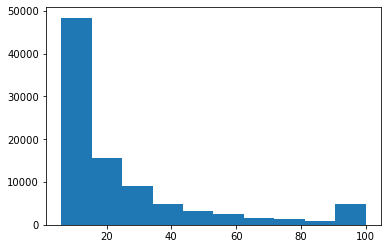

In [7]:
plt.hist(landmark_id_counts_dict.values())

In [8]:
# create dataframe from dictionary
landmark_id_counts_df = pd.DataFrame(landmark_id_counts_dict.items(), columns=['landmark_id', 'counts'])

In [9]:
print(len(landmark_id_counts_df))
print(landmark_id_counts_df[:5])

91948
  landmark_id  counts
0           0      19
1           1      24
2          10      12
3         100      11
4        1000       8


In [13]:
landmark_id_counts_df[landmark_id_counts_df.counts>90]["landmark_id"].count()

4753

### Dividing the the whole dataset into groups. 
We will train 5 different networks. This will make the training faster since we can now train on smaller set of images and landmark ids

In [22]:
step_size = 5
for bin in range(10, 100, step_size):
#     print(bin)
    print("Bins {} to {}, Landmark Counts {}, Images Counts: {}".format(bin+1, bin+step_size, landmark_id_counts_df[landmark_id_counts_df.counts.between(bin+1, bin+step_size)]["landmark_id"].count(),
                               landmark_id_counts_df[landmark_id_counts_df.counts.between(bin+1, bin+step_size)]["counts"].sum()))

Bins 11 to 15, Landmark Counts 16455, Images Counts: 210271
Bins 16 to 20, Landmark Counts 10061, Images Counts: 179571
Bins 21 to 25, Landmark Counts 6779, Images Counts: 154951
Bins 26 to 30, Landmark Counts 4908, Images Counts: 136737
Bins 31 to 35, Landmark Counts 3554, Images Counts: 116767
Bins 36 to 40, Landmark Counts 2726, Images Counts: 103513
Bins 41 to 45, Landmark Counts 2193, Images Counts: 93952
Bins 46 to 50, Landmark Counts 1703, Images Counts: 81668
Bins 51 to 55, Landmark Counts 1481, Images Counts: 78323
Bins 56 to 60, Landmark Counts 1218, Images Counts: 70626
Bins 61 to 65, Landmark Counts 969, Images Counts: 60974
Bins 66 to 70, Landmark Counts 820, Images Counts: 55755
Bins 71 to 75, Landmark Counts 698, Images Counts: 50956
Bins 76 to 80, Landmark Counts 658, Images Counts: 51247
Bins 81 to 85, Landmark Counts 536, Images Counts: 44459
Bins 86 to 90, Landmark Counts 505, Images Counts: 44411
Bins 91 to 95, Landmark Counts 449, Images Counts: 41712
Bins 96 to 10

##### One time task

In [23]:
start_time = time.time()
images_counts_bins= [(1,10), (11,15), (16,20), (21,25), (26,30), (31,40), (41,50), (51,60), (61,80), (81,98), (99,100)]
for i in range(len(images_counts_bins)):
    landmark_ids_list = landmark_id_counts_df[landmark_id_counts_df.counts.between(images_counts_bins[i][0], images_counts_bins[i][1])]["landmark_id"]
    landmark_ids_paths_list = [(i+1,"datasets\\set_224\\train\\{}".format(landmark_id)) for landmark_id in landmark_ids_list]
    print(len(landmark_ids_paths_list))
    print(landmark_ids_paths_list[:2])
#     test_list = [(1, 'datasets\\set_224\\train\\1000'), (1, 'datasets\\set_224\\train\\100001')]
    if __name__ == '__main__':
        p=Pool()
        p.map(move_copy_images_with_multiprocessing.copy_images, landmark_ids_paths_list)
        p.close()
        p.join()
print("Time to divide landmark ids into groups and copy to new location : {}".format(time.time()-start_time))

31931
[(1, 'datasets\\set_224\\train\\1000'), (1, 'datasets\\set_224\\train\\100001')]
16455
[(2, 'datasets\\set_224\\train\\10'), (2, 'datasets\\set_224\\train\\100')]
10061
[(3, 'datasets\\set_224\\train\\0'), (3, 'datasets\\set_224\\train\\100018')]
6779
[(4, 'datasets\\set_224\\train\\1'), (4, 'datasets\\set_224\\train\\100045')]
4908
[(5, 'datasets\\set_224\\train\\100015'), (5, 'datasets\\set_224\\train\\100039')]
6280
[(6, 'datasets\\set_224\\train\\100006'), (6, 'datasets\\set_224\\train\\10005')]
3896
[(7, 'datasets\\set_224\\train\\100054'), (7, 'datasets\\set_224\\train\\100130')]
2699
[(8, 'datasets\\set_224\\train\\100036'), (8, 'datasets\\set_224\\train\\100043')]
3145
[(9, 'datasets\\set_224\\train\\100051'), (9, 'datasets\\set_224\\train\\100167')]
1725
[(10, 'datasets\\set_224\\train\\100131'), (10, 'datasets\\set_224\\train\\100474')]
4069
[(11, 'datasets\\set_224\\train\\100028'), (11, 'datasets\\set_224\\train\\100082')]
Time to divide landmark ids into groups and c

With 11 groups

31931
[(1, 'datasets\\set_224\\train\\1000'), (1, 'datasets\\set_224\\train\\100001')]
16455
[(2, 'datasets\\set_224\\train\\10'), (2, 'datasets\\set_224\\train\\100')]
10061
[(3, 'datasets\\set_224\\train\\0'), (3, 'datasets\\set_224\\train\\100018')]
6779
[(4, 'datasets\\set_224\\train\\1'), (4, 'datasets\\set_224\\train\\100045')]
4908
[(5, 'datasets\\set_224\\train\\100015'), (5, 'datasets\\set_224\\train\\100039')]
6280
[(6, 'datasets\\set_224\\train\\100006'), (6, 'datasets\\set_224\\train\\10005')]
3896
[(7, 'datasets\\set_224\\train\\100054'), (7, 'datasets\\set_224\\train\\100130')]
2699
[(8, 'datasets\\set_224\\train\\100036'), (8, 'datasets\\set_224\\train\\100043')]
3145
[(9, 'datasets\\set_224\\train\\100051'), (9, 'datasets\\set_224\\train\\100167')]
1725
[(10, 'datasets\\set_224\\train\\100131'), (10, 'datasets\\set_224\\train\\100474')]
4069
[(11, 'datasets\\set_224\\train\\100028'), (11, 'datasets\\set_224\\train\\100082')]
Time to divide landmark ids into groups and copy to new location : 551.550491809845

With only 5 groups

31931
[(1, 'datasets\\set_224\\train\\1000'), (1, 'datasets\\set_224\\train\\100001')]
26516
[(2, 'datasets\\set_224\\train\\0'), (2, 'datasets\\set_224\\train\\10')]
21863
[(3, 'datasets\\set_224\\train\\1'), (3, 'datasets\\set_224\\train\\100006')]
5844
[(4, 'datasets\\set_224\\train\\100036'), (4, 'datasets\\set_224\\train\\100043')]
5794
[(5, 'datasets\\set_224\\train\\100028'), (5, 'datasets\\set_224\\train\\100082')]
Time to divide landmark ids into groups and copy to new location : 551.2409882545471

In [24]:
gc.collect()

24

### Now separating the train and validation set. 
We want to use the image augmentation in the tensorflow model datagen step. We do not want to augment the validation images

In [25]:
dir_name_list = ["datasets\\group{}_set_224\\set_224\\train".format(i) for i in range(1,12)]
dir_name_list

['datasets\\group1_set_224\\set_224\\train',
 'datasets\\group2_set_224\\set_224\\train',
 'datasets\\group3_set_224\\set_224\\train',
 'datasets\\group4_set_224\\set_224\\train',
 'datasets\\group5_set_224\\set_224\\train',
 'datasets\\group6_set_224\\set_224\\train',
 'datasets\\group7_set_224\\set_224\\train',
 'datasets\\group8_set_224\\set_224\\train',
 'datasets\\group9_set_224\\set_224\\train',
 'datasets\\group10_set_224\\set_224\\train',
 'datasets\\group11_set_224\\set_224\\train']

With 5 Groups
['datasets\\group1_set_224\\set_224\\train',
 'datasets\\group2_set_224\\set_224\\train',
 'datasets\\group3_set_224\\set_224\\train',
 'datasets\\group4_set_224\\set_224\\train',
 'datasets\\group5_set_224\\set_224\\train']

In [27]:
number_of_validation_images = [3,4,5,6,6,7,9,12,16,18,20]
dict_of_groups = dict(zip(dir_name_list,number_of_validation_images))
dict_of_groups

{'datasets\\group1_set_224\\set_224\\train': 3,
 'datasets\\group2_set_224\\set_224\\train': 4,
 'datasets\\group3_set_224\\set_224\\train': 5,
 'datasets\\group4_set_224\\set_224\\train': 6,
 'datasets\\group5_set_224\\set_224\\train': 6,
 'datasets\\group6_set_224\\set_224\\train': 7,
 'datasets\\group7_set_224\\set_224\\train': 9,
 'datasets\\group8_set_224\\set_224\\train': 12,
 'datasets\\group9_set_224\\set_224\\train': 16,
 'datasets\\group10_set_224\\set_224\\train': 18,
 'datasets\\group11_set_224\\set_224\\train': 20}

With 5 groups
{'datasets\\group1_set_224\\set_224\\train': 3,
 'datasets\\group2_set_224\\set_224\\train': 4,
 'datasets\\group3_set_224\\set_224\\train': 8,
 'datasets\\group4_set_224\\set_224\\train': 15,
 'datasets\\group5_set_224\\set_224\\train': 20}

In [28]:
move_files_start_time = time.time()
for group_name_folder, random_images_to_move in dict_of_groups.items():
    landmark_ids_paths_list = glob.glob("{}\\*".format(group_name_folder))
    landmark_ids_valid_images_to_move_tuple_list = [(landmark_id_path, random_images_to_move) for landmark_id_path in landmark_ids_paths_list]
    print(landmark_ids_valid_images_to_move_tuple_list[:2])
    if __name__ == '__main__':
        p=Pool(30)
        p.map(move_copy_images_with_multiprocessing.move_validation_images, landmark_ids_valid_images_to_move_tuple_list)
        p.close()
        p.join()
print("\nTime to move images in each group : ", (time.time() - move_files_start_time))

[('datasets\\group1_set_224\\set_224\\train\\1000', 3), ('datasets\\group1_set_224\\set_224\\train\\100001', 3)]
[('datasets\\group2_set_224\\set_224\\train\\10', 4), ('datasets\\group2_set_224\\set_224\\train\\100', 4)]
[('datasets\\group3_set_224\\set_224\\train\\0', 5), ('datasets\\group3_set_224\\set_224\\train\\100018', 5)]
[('datasets\\group4_set_224\\set_224\\train\\1', 6), ('datasets\\group4_set_224\\set_224\\train\\100045', 6)]
[('datasets\\group5_set_224\\set_224\\train\\100015', 6), ('datasets\\group5_set_224\\set_224\\train\\100039', 6)]
[('datasets\\group6_set_224\\set_224\\train\\100006', 7), ('datasets\\group6_set_224\\set_224\\train\\10005', 7)]
[('datasets\\group7_set_224\\set_224\\train\\100054', 9), ('datasets\\group7_set_224\\set_224\\train\\100130', 9)]
[('datasets\\group8_set_224\\set_224\\train\\100036', 12), ('datasets\\group8_set_224\\set_224\\train\\100043', 12)]
[('datasets\\group9_set_224\\set_224\\train\\100051', 16), ('datasets\\group9_set_224\\set_224\\tr

With 11 groups

[('datasets\\group1_set_224\\set_224\\train\\1000', 3), ('datasets\\group1_set_224\\set_224\\train\\100001', 3)]
[('datasets\\group2_set_224\\set_224\\train\\10', 4), ('datasets\\group2_set_224\\set_224\\train\\100', 4)]
[('datasets\\group3_set_224\\set_224\\train\\0', 5), ('datasets\\group3_set_224\\set_224\\train\\100018', 5)]
[('datasets\\group4_set_224\\set_224\\train\\1', 6), ('datasets\\group4_set_224\\set_224\\train\\100045', 6)]
[('datasets\\group5_set_224\\set_224\\train\\100015', 6), ('datasets\\group5_set_224\\set_224\\train\\100039', 6)]
[('datasets\\group6_set_224\\set_224\\train\\100006', 7), ('datasets\\group6_set_224\\set_224\\train\\10005', 7)]
[('datasets\\group7_set_224\\set_224\\train\\100054', 9), ('datasets\\group7_set_224\\set_224\\train\\100130', 9)]
[('datasets\\group8_set_224\\set_224\\train\\100036', 12), ('datasets\\group8_set_224\\set_224\\train\\100043', 12)]
[('datasets\\group9_set_224\\set_224\\train\\100051', 16), ('datasets\\group9_set_224\\set_224\\train\\100167', 16)]
[('datasets\\group10_set_224\\set_224\\train\\100131', 18), ('datasets\\group10_set_224\\set_224\\train\\100474', 18)]
[('datasets\\group11_set_224\\set_224\\train\\100028', 20), ('datasets\\group11_set_224\\set_224\\train\\100082', 20)]

Time to move images in each group :  130.60736417770386

With 5 groups

[('datasets\\group1_set_224\\set_224\\train\\1000', 3), ('datasets\\group1_set_224\\set_224\\train\\100001', 3)]
[('datasets\\group2_set_224\\set_224\\train\\0', 4), ('datasets\\group2_set_224\\set_224\\train\\10', 4)]
[('datasets\\group3_set_224\\set_224\\train\\1', 8), ('datasets\\group3_set_224\\set_224\\train\\100006', 8)]
[('datasets\\group4_set_224\\set_224\\train\\100036', 15), ('datasets\\group4_set_224\\set_224\\train\\100043', 15)]
[('datasets\\group5_set_224\\set_224\\train\\100028', 20), ('datasets\\group5_set_224\\set_224\\train\\100082', 20)]

Time to move images in each group :  154.97144627571106